### Imports needed

In [1]:
import numpy as np

from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.datasets import fetch_20newsgroups
from sklearn.naive_bayes import MultinomialNB

import nltk
nltk.download("stopwords")
from nltk.corpus import stopwords

import matplotlib.pyplot as plt

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\mehak\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [2]:
train = fetch_20newsgroups(random_state=42)

In [3]:
test = fetch_20newsgroups(subset='test')

In [4]:
x_train = train.data
y_train = train.target

In [5]:
x_test = test.data
y_test = test.target

In [6]:
print(len(x_train))
print(len(x_test))

11314
7532


In [7]:
# check 1st 10 newsgroup of training data
for i in range(10):
    print(train.target_names[y_train[i]])

rec.autos
comp.sys.mac.hardware
comp.sys.mac.hardware
comp.graphics
sci.space
talk.politics.guns
sci.med
comp.sys.ibm.pc.hardware
comp.os.ms-windows.misc
comp.sys.mac.hardware


### Stop words list -> We use nltk to get this list

In [8]:
stop_words = stopwords.words('english')
print(stop_words)

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such', 'no', 'nor', 'not', 'only', 'own', 'same', 'so', 'than', '

### Build Vocabulary

In [9]:
vocab = {}

for doc in x_train:
    words = doc.split()
    for word in words:
        if word.lower() not in stop_words:
            vocab[word.lower()] = vocab.get(word.lower(),0) + 1
            
print(len(vocab))

253399


#### sort vocab in descending order

In [10]:
vocab = sorted(vocab.items(), key=lambda x: x[1], reverse=True)

In [11]:
# no. of words having frequency freq
freq_num_words = {} # {freq : no. of words}

for pair in vocab:
    freq = pair[1]
    freq_num_words[freq] = freq_num_words.get(freq, 0) + 1
    
frequency = []
num_words = []
for p in freq_num_words.items():
    frequency.append(p[0])
    num_words.append(p[1])


### plot graph between number of words vs frequency

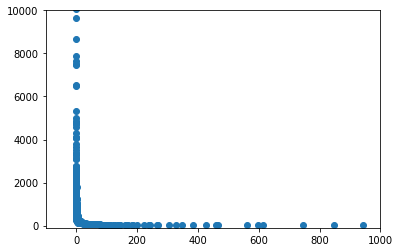

In [12]:
plt.scatter(num_words, frequency)
plt.axis([-100,1000, -100, 10000])
plt.show()

In [13]:
print("Highest frequency of a word in vacabulary is :",vocab[0][1])
print("Lowest frequency of a word in vacabulary is :",vocab[len(vocab)-1][1])
print("Length of vocab is:",len(vocab))

Highest frequency of a word in vacabulary is : 27843
Lowest frequency of a word in vacabulary is : 1
Length of vocab is: 253399


In [14]:
# Suppose we want to ignore words with frequency 1,2,and 3
ind = 0
for i in range(len(vocab)):
    if vocab[i][1] == 3:
        ind = i
        break
        
print(ind)

50908


#### new vocab --> Consisder only top ind words

In [15]:
'''
    create dictionary bcz it will be easy to check word present or not. 
    If we use list, then everytime we need to traverse to find paticular word present in list or not
''' 

Vocab = {}
for i in range(ind):
    w = vocab[i][0]
    f = vocab[i][1]
    Vocab[w] = f

#### create features dictionary - we use words as features

In [16]:
features = {}
for i in range(ind):
    w_i = vocab[i][0]
    features[w_i] = i

### Now we create X_train, Y_train, X_test and Y_test

In [17]:
X_train = np.zeros((len(x_train),ind), dtype='uint8')
Y_train = np.empty(len(y_train), dtype='<U30') # max size of string is 20

X_test = np.zeros((len(x_test),ind), dtype='uint8')
Y_test = np.empty(len(y_test), dtype='<U30') # max size of string is 20

In [18]:
total_training_doc = len(x_train)
for i in range(total_training_doc):
    words = x_train[i].split() # split all words of a document separated by space
    for word in words:
        # check if word is present in Vocab and word is also used as a feature
        if Vocab.get(word.lower(), None) is not None and features.get(word.lower(),None) is not None:
            col = features[word.lower()]
            X_train[i][col] += 1 # Increase frequency corresponding to word in document i
            
    # store corresponding newsgroup (label)
    Y_train[i] = train.target_names[y_train[i]]

In [19]:
print(X_train[:10, :15])
print(Y_train[:10])

[[0 1 1 1 1 0 1 0 0 0 0 0 0 0 0]
 [0 1 1 1 1 0 1 0 0 0 0 0 0 0 0]
 [0 1 1 1 1 0 3 0 0 1 0 0 0 0 1]
 [5 1 1 1 1 0 0 0 1 2 0 0 0 1 1]
 [6 1 1 1 1 0 2 0 1 0 0 0 0 2 0]
 [1 1 1 1 1 0 0 2 1 1 4 0 0 5 0]
 [0 1 1 1 1 0 0 0 0 0 0 0 0 0 0]
 [0 1 1 1 1 0 0 0 2 0 1 1 0 2 1]
 [0 1 1 1 1 0 0 1 0 0 0 0 0 0 0]
 [4 1 1 1 1 0 0 1 1 1 1 1 0 0 0]]
['rec.autos' 'comp.sys.mac.hardware' 'comp.sys.mac.hardware'
 'comp.graphics' 'sci.space' 'talk.politics.guns' 'sci.med'
 'comp.sys.ibm.pc.hardware' 'comp.os.ms-windows.misc'
 'comp.sys.mac.hardware']


In [20]:
total_testing_doc = len(x_test)
for i in range(total_testing_doc):
    words = x_test[i].split() # split all words of a document separated by space
    for word in words:
        # check if word is present in Vocab and word is also used as a feature
        if Vocab.get(word.lower(), None) is not None and features.get(word.lower(),None) is not None:
            col = features[word.lower()]
            X_test[i][col] += 1 # Increase frequency corresponding to word in document i
            
    # store corresponding newsgroup (label)
    Y_test[i] = test.target_names[y_test[i]]

In [21]:
print(X_test[:10, :15])
print(Y_test[:10])

[[ 0  1  1  1  1  0  0  0  0  0  0  0  0  0  0]
 [ 0  1  1  1  1  2  0  1  0  0  0  2  0  0  0]
 [ 3  1  1  1  1  0  0  0  1  0  1  0  0  0  0]
 [ 5  1  1  1  1  0  4  3  1  2  1  0  0  1  5]
 [16  1  1  1  1  0  0  0  1  0  3  0  2  3  0]
 [27  1  1  1  1  0  1  3  1  0  1  1  0  1  3]
 [ 0  1  1  1  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  1  1  1  1  0  1  1  0  0  0  2  0  0  0]
 [ 0  1  1  1  1  0  0  0  0  0  0  1  0  0  0]
 [ 0  1  1  1  1  0  0  0  1  1  0  0  0  0  0]]
['rec.autos' 'comp.windows.x' 'alt.atheism' 'talk.politics.mideast'
 'talk.religion.misc' 'sci.med' 'soc.religion.christian'
 'soc.religion.christian' 'comp.windows.x' 'comp.graphics']


### Functions used for creating our own Multinomial Naive Bayes

In [ ]:
# fit fnction returns a dictionary
def fit(X_train, Y_train):
    count = {}
    vocab_size = 0  # total number of words present in Vocab
    count["total_data"] = len(Y_train) # total number of documents
    class_values = set(Y_train)
    for current_class in class_values:
        count[current_class] = {}
        current_class_rows = (Y_train == current_class)
        
        # Get X_train corresponding to current_class
        X_train_current = X_train[current_class_rows]
        Y_train_current = Y_train[current_class_rows]
        
        # total no. of documents of current_class
        count[current_class]["current_class_count"] = len(Y_train_current)
        
        # Iterate over all words and store its frequency
        num_features = X_train.shape[1]
        total_current_class_words = 0
        for j in range(1, num_features + 1):
            # store frequency of j th word(feature) corresponding to current_class 
            count[current_class][j] = X_train_current[:, j-1].sum()
            total_current_class_words += X_train_current[:, j-1].sum()
            
        # store total words of a current_class also
        count[current_class]["total_count"] = total_current_class_words
        vocab_size += total_current_class_words
    count["vocab_size"] = vocab_size
    return count # returns dictionary created

We need to calculate log( P(X=x | y=current_class) ) + log( P(y=current_class) )
        
Assuming independent events:
P(X=x | y=current_class) = P(w1|y=current_class) * P(w2|y=current_class) *
                                    P(w3|y=current_class) * ....
        
        
Therefore, log( P(X=x | y=current_class) ) = log( P(w1|y=current_class) )
                                                                +
                                             log( P(w2|y=current_class) )
                                                                +
                                             log( P(w3|y=current_class) )
                                                                +
                                                                .
                                                                .
                                                                .

In [ ]:
t=1
def probability(dictionary, x, current_class):
    global t
    print("t = ",t,",Finding probability for class",current_class)
    t+=1
    #  log( P(y=current_class) )
    output = np.log(dictionary[current_class]['current_class_count']) - np.log(dictionary["total_data"]) 
    
    num_features = len(dictionary[current_class].keys()) - 2  # -2 bcz 2 keys are total_count and current_class_count
    for j in range(1,num_features+1):
        xj = x[j-1]
        if xj == 0: # word not in test data document
            continue
            
        '''
            word is present as a feature. So add its corresponding logarithmic probability
            Also use laplace correction i.e
            log( P(w1|y=current_class) ) = log( count of all w1 corresponding 
                                                to current_class + 1)
                                                      -
                                            log( count of all words of current_class
                                                 + size of vocabulary)
        '''  
        count_jth_word_in_current_class = dictionary[current_class][j] + 1  # +1 bcz of laplace correction
        count_current_class = dictionary[current_class]["total_count"] + dictionary["vocab_size"]
        count_xj_probability = np.log(count_jth_word_in_current_class) - np.log(count_current_class)
        output = output + count_xj_probability
    
    return output

In [ ]:
def predictSinglePoint(dictionary, x):
    classes = dictionary.keys()
    best_p = -1000   # Initially
    best_class = -1
    first_run = True  # Bcz best_p should be changed for the first time
    for current_class in classes:
        if current_class == "vocab_size" or current_class=="total_data":
            continue
            
        # Find logarithmic probability of current_class
        p_current_class = probability(dictionary, x, current_class)
        if (first_run or p_current_class > best_p):
            best_p = p_current_class
            best_class = current_class
        first_run = False  # bcz we done for 1st time
    return best_class

In [ ]:
def predict(dictionary, X_test):
    y_pred = []
    for x in X_test:
        x_class = predictSinglePoint(dictionary, x)
        y_pred.append(x_class)
    return y_pred

## Find predictions using our own Multinomial classifier

In [ ]:
dictionary = fit(X_train, Y_train)

In [ ]:
Y_pred = predict(dictionary, X_test)

t =  1 ,Finding probability for class talk.politics.mideast
t =  2 ,Finding probability for class sci.crypt
t =  3 ,Finding probability for class rec.motorcycles
t =  4 ,Finding probability for class sci.space
t =  5 ,Finding probability for class rec.autos
t =  6 ,Finding probability for class rec.sport.baseball
t =  7 ,Finding probability for class talk.politics.guns
t =  8 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  9 ,Finding probability for class talk.religion.misc
t =  10 ,Finding probability for class comp.windows.x
t =  11 ,Finding probability for class soc.religion.christian
t =  12 ,Finding probability for class talk.politics.misc
t =  13 ,Finding probability for class alt.atheism
t =  14 ,Finding probability for class sci.electronics
t =  15 ,Finding probability for class comp.os.ms-windows.misc
t =  16 ,Finding probability for class misc.forsale
t =  17 ,Finding probability for class comp.graphics
t =  18 ,Finding probability for class rec.sport.hockey
t = 

t =  150 ,Finding probability for class comp.windows.x
t =  151 ,Finding probability for class soc.religion.christian
t =  152 ,Finding probability for class talk.politics.misc
t =  153 ,Finding probability for class alt.atheism
t =  154 ,Finding probability for class sci.electronics
t =  155 ,Finding probability for class comp.os.ms-windows.misc
t =  156 ,Finding probability for class misc.forsale
t =  157 ,Finding probability for class comp.graphics
t =  158 ,Finding probability for class rec.sport.hockey
t =  159 ,Finding probability for class comp.sys.mac.hardware
t =  160 ,Finding probability for class sci.med
t =  161 ,Finding probability for class talk.politics.mideast
t =  162 ,Finding probability for class sci.crypt
t =  163 ,Finding probability for class rec.motorcycles
t =  164 ,Finding probability for class sci.space
t =  165 ,Finding probability for class rec.autos
t =  166 ,Finding probability for class rec.sport.baseball
t =  167 ,Finding probability for class talk.polit

t =  295 ,Finding probability for class comp.os.ms-windows.misc
t =  296 ,Finding probability for class misc.forsale
t =  297 ,Finding probability for class comp.graphics
t =  298 ,Finding probability for class rec.sport.hockey
t =  299 ,Finding probability for class comp.sys.mac.hardware
t =  300 ,Finding probability for class sci.med
t =  301 ,Finding probability for class talk.politics.mideast
t =  302 ,Finding probability for class sci.crypt
t =  303 ,Finding probability for class rec.motorcycles
t =  304 ,Finding probability for class sci.space
t =  305 ,Finding probability for class rec.autos
t =  306 ,Finding probability for class rec.sport.baseball
t =  307 ,Finding probability for class talk.politics.guns
t =  308 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  309 ,Finding probability for class talk.religion.misc
t =  310 ,Finding probability for class comp.windows.x
t =  311 ,Finding probability for class soc.religion.christian
t =  312 ,Finding probability for 

t =  440 ,Finding probability for class sci.med
t =  441 ,Finding probability for class talk.politics.mideast
t =  442 ,Finding probability for class sci.crypt
t =  443 ,Finding probability for class rec.motorcycles
t =  444 ,Finding probability for class sci.space
t =  445 ,Finding probability for class rec.autos
t =  446 ,Finding probability for class rec.sport.baseball
t =  447 ,Finding probability for class talk.politics.guns
t =  448 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  449 ,Finding probability for class talk.religion.misc
t =  450 ,Finding probability for class comp.windows.x
t =  451 ,Finding probability for class soc.religion.christian
t =  452 ,Finding probability for class talk.politics.misc
t =  453 ,Finding probability for class alt.atheism
t =  454 ,Finding probability for class sci.electronics
t =  455 ,Finding probability for class comp.os.ms-windows.misc
t =  456 ,Finding probability for class misc.forsale
t =  457 ,Finding probability for class 

t =  587 ,Finding probability for class talk.politics.guns
t =  588 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  589 ,Finding probability for class talk.religion.misc
t =  590 ,Finding probability for class comp.windows.x
t =  591 ,Finding probability for class soc.religion.christian
t =  592 ,Finding probability for class talk.politics.misc
t =  593 ,Finding probability for class alt.atheism
t =  594 ,Finding probability for class sci.electronics
t =  595 ,Finding probability for class comp.os.ms-windows.misc
t =  596 ,Finding probability for class misc.forsale
t =  597 ,Finding probability for class comp.graphics
t =  598 ,Finding probability for class rec.sport.hockey
t =  599 ,Finding probability for class comp.sys.mac.hardware
t =  600 ,Finding probability for class sci.med
t =  601 ,Finding probability for class talk.politics.mideast
t =  602 ,Finding probability for class sci.crypt
t =  603 ,Finding probability for class rec.motorcycles
t =  604 ,Finding probabil

t =  733 ,Finding probability for class alt.atheism
t =  734 ,Finding probability for class sci.electronics
t =  735 ,Finding probability for class comp.os.ms-windows.misc
t =  736 ,Finding probability for class misc.forsale
t =  737 ,Finding probability for class comp.graphics
t =  738 ,Finding probability for class rec.sport.hockey
t =  739 ,Finding probability for class comp.sys.mac.hardware
t =  740 ,Finding probability for class sci.med
t =  741 ,Finding probability for class talk.politics.mideast
t =  742 ,Finding probability for class sci.crypt
t =  743 ,Finding probability for class rec.motorcycles
t =  744 ,Finding probability for class sci.space
t =  745 ,Finding probability for class rec.autos
t =  746 ,Finding probability for class rec.sport.baseball
t =  747 ,Finding probability for class talk.politics.guns
t =  748 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  749 ,Finding probability for class talk.religion.misc
t =  750 ,Finding probability for class comp

t =  879 ,Finding probability for class comp.sys.mac.hardware
t =  880 ,Finding probability for class sci.med
t =  881 ,Finding probability for class talk.politics.mideast
t =  882 ,Finding probability for class sci.crypt
t =  883 ,Finding probability for class rec.motorcycles
t =  884 ,Finding probability for class sci.space
t =  885 ,Finding probability for class rec.autos
t =  886 ,Finding probability for class rec.sport.baseball
t =  887 ,Finding probability for class talk.politics.guns
t =  888 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  889 ,Finding probability for class talk.religion.misc
t =  890 ,Finding probability for class comp.windows.x
t =  891 ,Finding probability for class soc.religion.christian
t =  892 ,Finding probability for class talk.politics.misc
t =  893 ,Finding probability for class alt.atheism
t =  894 ,Finding probability for class sci.electronics
t =  895 ,Finding probability for class comp.os.ms-windows.misc
t =  896 ,Finding probability f

t =  1026 ,Finding probability for class rec.sport.baseball
t =  1027 ,Finding probability for class talk.politics.guns
t =  1028 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  1029 ,Finding probability for class talk.religion.misc
t =  1030 ,Finding probability for class comp.windows.x
t =  1031 ,Finding probability for class soc.religion.christian
t =  1032 ,Finding probability for class talk.politics.misc
t =  1033 ,Finding probability for class alt.atheism
t =  1034 ,Finding probability for class sci.electronics
t =  1035 ,Finding probability for class comp.os.ms-windows.misc
t =  1036 ,Finding probability for class misc.forsale
t =  1037 ,Finding probability for class comp.graphics
t =  1038 ,Finding probability for class rec.sport.hockey
t =  1039 ,Finding probability for class comp.sys.mac.hardware
t =  1040 ,Finding probability for class sci.med
t =  1041 ,Finding probability for class talk.politics.mideast
t =  1042 ,Finding probability for class sci.crypt
t =  1

t =  1170 ,Finding probability for class comp.windows.x
t =  1171 ,Finding probability for class soc.religion.christian
t =  1172 ,Finding probability for class talk.politics.misc
t =  1173 ,Finding probability for class alt.atheism
t =  1174 ,Finding probability for class sci.electronics
t =  1175 ,Finding probability for class comp.os.ms-windows.misc
t =  1176 ,Finding probability for class misc.forsale
t =  1177 ,Finding probability for class comp.graphics
t =  1178 ,Finding probability for class rec.sport.hockey
t =  1179 ,Finding probability for class comp.sys.mac.hardware
t =  1180 ,Finding probability for class sci.med
t =  1181 ,Finding probability for class talk.politics.mideast
t =  1182 ,Finding probability for class sci.crypt
t =  1183 ,Finding probability for class rec.motorcycles
t =  1184 ,Finding probability for class sci.space
t =  1185 ,Finding probability for class rec.autos
t =  1186 ,Finding probability for class rec.sport.baseball
t =  1187 ,Finding probability fo

t =  1314 ,Finding probability for class sci.electronics
t =  1315 ,Finding probability for class comp.os.ms-windows.misc
t =  1316 ,Finding probability for class misc.forsale
t =  1317 ,Finding probability for class comp.graphics
t =  1318 ,Finding probability for class rec.sport.hockey
t =  1319 ,Finding probability for class comp.sys.mac.hardware
t =  1320 ,Finding probability for class sci.med
t =  1321 ,Finding probability for class talk.politics.mideast
t =  1322 ,Finding probability for class sci.crypt
t =  1323 ,Finding probability for class rec.motorcycles
t =  1324 ,Finding probability for class sci.space
t =  1325 ,Finding probability for class rec.autos
t =  1326 ,Finding probability for class rec.sport.baseball
t =  1327 ,Finding probability for class talk.politics.guns
t =  1328 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  1329 ,Finding probability for class talk.religion.misc
t =  1330 ,Finding probability for class comp.windows.x
t =  1331 ,Finding proba

t =  1457 ,Finding probability for class comp.graphics
t =  1458 ,Finding probability for class rec.sport.hockey
t =  1459 ,Finding probability for class comp.sys.mac.hardware
t =  1460 ,Finding probability for class sci.med
t =  1461 ,Finding probability for class talk.politics.mideast
t =  1462 ,Finding probability for class sci.crypt
t =  1463 ,Finding probability for class rec.motorcycles
t =  1464 ,Finding probability for class sci.space
t =  1465 ,Finding probability for class rec.autos
t =  1466 ,Finding probability for class rec.sport.baseball
t =  1467 ,Finding probability for class talk.politics.guns
t =  1468 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  1469 ,Finding probability for class talk.religion.misc
t =  1470 ,Finding probability for class comp.windows.x
t =  1471 ,Finding probability for class soc.religion.christian
t =  1472 ,Finding probability for class talk.politics.misc
t =  1473 ,Finding probability for class alt.atheism
t =  1474 ,Finding prob

t =  1600 ,Finding probability for class sci.med
t =  1601 ,Finding probability for class talk.politics.mideast
t =  1602 ,Finding probability for class sci.crypt
t =  1603 ,Finding probability for class rec.motorcycles
t =  1604 ,Finding probability for class sci.space
t =  1605 ,Finding probability for class rec.autos
t =  1606 ,Finding probability for class rec.sport.baseball
t =  1607 ,Finding probability for class talk.politics.guns
t =  1608 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  1609 ,Finding probability for class talk.religion.misc
t =  1610 ,Finding probability for class comp.windows.x
t =  1611 ,Finding probability for class soc.religion.christian
t =  1612 ,Finding probability for class talk.politics.misc
t =  1613 ,Finding probability for class alt.atheism
t =  1614 ,Finding probability for class sci.electronics
t =  1615 ,Finding probability for class comp.os.ms-windows.misc
t =  1616 ,Finding probability for class misc.forsale
t =  1617 ,Finding prob

t =  1744 ,Finding probability for class sci.space
t =  1745 ,Finding probability for class rec.autos
t =  1746 ,Finding probability for class rec.sport.baseball
t =  1747 ,Finding probability for class talk.politics.guns
t =  1748 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  1749 ,Finding probability for class talk.religion.misc
t =  1750 ,Finding probability for class comp.windows.x
t =  1751 ,Finding probability for class soc.religion.christian
t =  1752 ,Finding probability for class talk.politics.misc
t =  1753 ,Finding probability for class alt.atheism
t =  1754 ,Finding probability for class sci.electronics
t =  1755 ,Finding probability for class comp.os.ms-windows.misc
t =  1756 ,Finding probability for class misc.forsale
t =  1757 ,Finding probability for class comp.graphics
t =  1758 ,Finding probability for class rec.sport.hockey
t =  1759 ,Finding probability for class comp.sys.mac.hardware
t =  1760 ,Finding probability for class sci.med
t =  1761 ,Finding

t =  1888 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  1889 ,Finding probability for class talk.religion.misc
t =  1890 ,Finding probability for class comp.windows.x
t =  1891 ,Finding probability for class soc.religion.christian
t =  1892 ,Finding probability for class talk.politics.misc
t =  1893 ,Finding probability for class alt.atheism
t =  1894 ,Finding probability for class sci.electronics
t =  1895 ,Finding probability for class comp.os.ms-windows.misc
t =  1896 ,Finding probability for class misc.forsale
t =  1897 ,Finding probability for class comp.graphics
t =  1898 ,Finding probability for class rec.sport.hockey
t =  1899 ,Finding probability for class comp.sys.mac.hardware
t =  1900 ,Finding probability for class sci.med
t =  1901 ,Finding probability for class talk.politics.mideast
t =  1902 ,Finding probability for class sci.crypt
t =  1903 ,Finding probability for class rec.motorcycles
t =  1904 ,Finding probability for class sci.space
t =  1905 ,Finding

t =  2030 ,Finding probability for class comp.windows.x
t =  2031 ,Finding probability for class soc.religion.christian
t =  2032 ,Finding probability for class talk.politics.misc
t =  2033 ,Finding probability for class alt.atheism
t =  2034 ,Finding probability for class sci.electronics
t =  2035 ,Finding probability for class comp.os.ms-windows.misc
t =  2036 ,Finding probability for class misc.forsale
t =  2037 ,Finding probability for class comp.graphics
t =  2038 ,Finding probability for class rec.sport.hockey
t =  2039 ,Finding probability for class comp.sys.mac.hardware
t =  2040 ,Finding probability for class sci.med
t =  2041 ,Finding probability for class talk.politics.mideast
t =  2042 ,Finding probability for class sci.crypt
t =  2043 ,Finding probability for class rec.motorcycles
t =  2044 ,Finding probability for class sci.space
t =  2045 ,Finding probability for class rec.autos
t =  2046 ,Finding probability for class rec.sport.baseball
t =  2047 ,Finding probability fo

t =  2173 ,Finding probability for class alt.atheism
t =  2174 ,Finding probability for class sci.electronics
t =  2175 ,Finding probability for class comp.os.ms-windows.misc
t =  2176 ,Finding probability for class misc.forsale
t =  2177 ,Finding probability for class comp.graphics
t =  2178 ,Finding probability for class rec.sport.hockey
t =  2179 ,Finding probability for class comp.sys.mac.hardware
t =  2180 ,Finding probability for class sci.med
t =  2181 ,Finding probability for class talk.politics.mideast
t =  2182 ,Finding probability for class sci.crypt
t =  2183 ,Finding probability for class rec.motorcycles
t =  2184 ,Finding probability for class sci.space
t =  2185 ,Finding probability for class rec.autos
t =  2186 ,Finding probability for class rec.sport.baseball
t =  2187 ,Finding probability for class talk.politics.guns
t =  2188 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  2189 ,Finding probability for class talk.religion.misc
t =  2190 ,Finding probabil

t =  2318 ,Finding probability for class rec.sport.hockey
t =  2319 ,Finding probability for class comp.sys.mac.hardware
t =  2320 ,Finding probability for class sci.med
t =  2321 ,Finding probability for class talk.politics.mideast
t =  2322 ,Finding probability for class sci.crypt
t =  2323 ,Finding probability for class rec.motorcycles
t =  2324 ,Finding probability for class sci.space
t =  2325 ,Finding probability for class rec.autos
t =  2326 ,Finding probability for class rec.sport.baseball
t =  2327 ,Finding probability for class talk.politics.guns
t =  2328 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  2329 ,Finding probability for class talk.religion.misc
t =  2330 ,Finding probability for class comp.windows.x
t =  2331 ,Finding probability for class soc.religion.christian
t =  2332 ,Finding probability for class talk.politics.misc
t =  2333 ,Finding probability for class alt.atheism
t =  2334 ,Finding probability for class sci.electronics
t =  2335 ,Finding pr

t =  2461 ,Finding probability for class talk.politics.mideast
t =  2462 ,Finding probability for class sci.crypt
t =  2463 ,Finding probability for class rec.motorcycles
t =  2464 ,Finding probability for class sci.space
t =  2465 ,Finding probability for class rec.autos
t =  2466 ,Finding probability for class rec.sport.baseball
t =  2467 ,Finding probability for class talk.politics.guns
t =  2468 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  2469 ,Finding probability for class talk.religion.misc
t =  2470 ,Finding probability for class comp.windows.x
t =  2471 ,Finding probability for class soc.religion.christian
t =  2472 ,Finding probability for class talk.politics.misc
t =  2473 ,Finding probability for class alt.atheism
t =  2474 ,Finding probability for class sci.electronics
t =  2475 ,Finding probability for class comp.os.ms-windows.misc
t =  2476 ,Finding probability for class misc.forsale
t =  2477 ,Finding probability for class comp.graphics
t =  2478 ,Findin

t =  2604 ,Finding probability for class sci.space
t =  2605 ,Finding probability for class rec.autos
t =  2606 ,Finding probability for class rec.sport.baseball
t =  2607 ,Finding probability for class talk.politics.guns
t =  2608 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  2609 ,Finding probability for class talk.religion.misc
t =  2610 ,Finding probability for class comp.windows.x
t =  2611 ,Finding probability for class soc.religion.christian
t =  2612 ,Finding probability for class talk.politics.misc
t =  2613 ,Finding probability for class alt.atheism
t =  2614 ,Finding probability for class sci.electronics
t =  2615 ,Finding probability for class comp.os.ms-windows.misc
t =  2616 ,Finding probability for class misc.forsale
t =  2617 ,Finding probability for class comp.graphics
t =  2618 ,Finding probability for class rec.sport.hockey
t =  2619 ,Finding probability for class comp.sys.mac.hardware
t =  2620 ,Finding probability for class sci.med
t =  2621 ,Finding

t =  2748 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  2749 ,Finding probability for class talk.religion.misc
t =  2750 ,Finding probability for class comp.windows.x
t =  2751 ,Finding probability for class soc.religion.christian
t =  2752 ,Finding probability for class talk.politics.misc
t =  2753 ,Finding probability for class alt.atheism
t =  2754 ,Finding probability for class sci.electronics
t =  2755 ,Finding probability for class comp.os.ms-windows.misc
t =  2756 ,Finding probability for class misc.forsale
t =  2757 ,Finding probability for class comp.graphics
t =  2758 ,Finding probability for class rec.sport.hockey
t =  2759 ,Finding probability for class comp.sys.mac.hardware
t =  2760 ,Finding probability for class sci.med
t =  2761 ,Finding probability for class talk.politics.mideast
t =  2762 ,Finding probability for class sci.crypt
t =  2763 ,Finding probability for class rec.motorcycles
t =  2764 ,Finding probability for class sci.space
t =  2765 ,Finding

t =  2891 ,Finding probability for class soc.religion.christian
t =  2892 ,Finding probability for class talk.politics.misc
t =  2893 ,Finding probability for class alt.atheism
t =  2894 ,Finding probability for class sci.electronics
t =  2895 ,Finding probability for class comp.os.ms-windows.misc
t =  2896 ,Finding probability for class misc.forsale
t =  2897 ,Finding probability for class comp.graphics
t =  2898 ,Finding probability for class rec.sport.hockey
t =  2899 ,Finding probability for class comp.sys.mac.hardware
t =  2900 ,Finding probability for class sci.med
t =  2901 ,Finding probability for class talk.politics.mideast
t =  2902 ,Finding probability for class sci.crypt
t =  2903 ,Finding probability for class rec.motorcycles
t =  2904 ,Finding probability for class sci.space
t =  2905 ,Finding probability for class rec.autos
t =  2906 ,Finding probability for class rec.sport.baseball
t =  2907 ,Finding probability for class talk.politics.guns
t =  2908 ,Finding probabilit

t =  3034 ,Finding probability for class sci.electronics
t =  3035 ,Finding probability for class comp.os.ms-windows.misc
t =  3036 ,Finding probability for class misc.forsale
t =  3037 ,Finding probability for class comp.graphics
t =  3038 ,Finding probability for class rec.sport.hockey
t =  3039 ,Finding probability for class comp.sys.mac.hardware
t =  3040 ,Finding probability for class sci.med
t =  3041 ,Finding probability for class talk.politics.mideast
t =  3042 ,Finding probability for class sci.crypt
t =  3043 ,Finding probability for class rec.motorcycles
t =  3044 ,Finding probability for class sci.space
t =  3045 ,Finding probability for class rec.autos
t =  3046 ,Finding probability for class rec.sport.baseball
t =  3047 ,Finding probability for class talk.politics.guns
t =  3048 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  3049 ,Finding probability for class talk.religion.misc
t =  3050 ,Finding probability for class comp.windows.x
t =  3051 ,Finding proba

t =  3176 ,Finding probability for class misc.forsale
t =  3177 ,Finding probability for class comp.graphics
t =  3178 ,Finding probability for class rec.sport.hockey
t =  3179 ,Finding probability for class comp.sys.mac.hardware
t =  3180 ,Finding probability for class sci.med
t =  3181 ,Finding probability for class talk.politics.mideast
t =  3182 ,Finding probability for class sci.crypt
t =  3183 ,Finding probability for class rec.motorcycles
t =  3184 ,Finding probability for class sci.space
t =  3185 ,Finding probability for class rec.autos
t =  3186 ,Finding probability for class rec.sport.baseball
t =  3187 ,Finding probability for class talk.politics.guns
t =  3188 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  3189 ,Finding probability for class talk.religion.misc
t =  3190 ,Finding probability for class comp.windows.x
t =  3191 ,Finding probability for class soc.religion.christian
t =  3192 ,Finding probability for class talk.politics.misc
t =  3193 ,Finding pro

t =  3320 ,Finding probability for class sci.med
t =  3321 ,Finding probability for class talk.politics.mideast
t =  3322 ,Finding probability for class sci.crypt
t =  3323 ,Finding probability for class rec.motorcycles
t =  3324 ,Finding probability for class sci.space
t =  3325 ,Finding probability for class rec.autos
t =  3326 ,Finding probability for class rec.sport.baseball
t =  3327 ,Finding probability for class talk.politics.guns
t =  3328 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  3329 ,Finding probability for class talk.religion.misc
t =  3330 ,Finding probability for class comp.windows.x
t =  3331 ,Finding probability for class soc.religion.christian
t =  3332 ,Finding probability for class talk.politics.misc
t =  3333 ,Finding probability for class alt.atheism
t =  3334 ,Finding probability for class sci.electronics
t =  3335 ,Finding probability for class comp.os.ms-windows.misc
t =  3336 ,Finding probability for class misc.forsale
t =  3337 ,Finding prob

t =  3463 ,Finding probability for class rec.motorcycles
t =  3464 ,Finding probability for class sci.space
t =  3465 ,Finding probability for class rec.autos
t =  3466 ,Finding probability for class rec.sport.baseball
t =  3467 ,Finding probability for class talk.politics.guns
t =  3468 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  3469 ,Finding probability for class talk.religion.misc
t =  3470 ,Finding probability for class comp.windows.x
t =  3471 ,Finding probability for class soc.religion.christian
t =  3472 ,Finding probability for class talk.politics.misc
t =  3473 ,Finding probability for class alt.atheism
t =  3474 ,Finding probability for class sci.electronics
t =  3475 ,Finding probability for class comp.os.ms-windows.misc
t =  3476 ,Finding probability for class misc.forsale
t =  3477 ,Finding probability for class comp.graphics
t =  3478 ,Finding probability for class rec.sport.hockey
t =  3479 ,Finding probability for class comp.sys.mac.hardware
t =  3480 

t =  3608 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  3609 ,Finding probability for class talk.religion.misc
t =  3610 ,Finding probability for class comp.windows.x
t =  3611 ,Finding probability for class soc.religion.christian
t =  3612 ,Finding probability for class talk.politics.misc
t =  3613 ,Finding probability for class alt.atheism
t =  3614 ,Finding probability for class sci.electronics
t =  3615 ,Finding probability for class comp.os.ms-windows.misc
t =  3616 ,Finding probability for class misc.forsale
t =  3617 ,Finding probability for class comp.graphics
t =  3618 ,Finding probability for class rec.sport.hockey
t =  3619 ,Finding probability for class comp.sys.mac.hardware
t =  3620 ,Finding probability for class sci.med
t =  3621 ,Finding probability for class talk.politics.mideast
t =  3622 ,Finding probability for class sci.crypt
t =  3623 ,Finding probability for class rec.motorcycles
t =  3624 ,Finding probability for class sci.space
t =  3625 ,Finding

t =  3750 ,Finding probability for class comp.windows.x
t =  3751 ,Finding probability for class soc.religion.christian
t =  3752 ,Finding probability for class talk.politics.misc
t =  3753 ,Finding probability for class alt.atheism
t =  3754 ,Finding probability for class sci.electronics
t =  3755 ,Finding probability for class comp.os.ms-windows.misc
t =  3756 ,Finding probability for class misc.forsale
t =  3757 ,Finding probability for class comp.graphics
t =  3758 ,Finding probability for class rec.sport.hockey
t =  3759 ,Finding probability for class comp.sys.mac.hardware
t =  3760 ,Finding probability for class sci.med
t =  3761 ,Finding probability for class talk.politics.mideast
t =  3762 ,Finding probability for class sci.crypt
t =  3763 ,Finding probability for class rec.motorcycles
t =  3764 ,Finding probability for class sci.space
t =  3765 ,Finding probability for class rec.autos
t =  3766 ,Finding probability for class rec.sport.baseball
t =  3767 ,Finding probability fo

t =  3893 ,Finding probability for class alt.atheism
t =  3894 ,Finding probability for class sci.electronics
t =  3895 ,Finding probability for class comp.os.ms-windows.misc
t =  3896 ,Finding probability for class misc.forsale
t =  3897 ,Finding probability for class comp.graphics
t =  3898 ,Finding probability for class rec.sport.hockey
t =  3899 ,Finding probability for class comp.sys.mac.hardware
t =  3900 ,Finding probability for class sci.med
t =  3901 ,Finding probability for class talk.politics.mideast
t =  3902 ,Finding probability for class sci.crypt
t =  3903 ,Finding probability for class rec.motorcycles
t =  3904 ,Finding probability for class sci.space
t =  3905 ,Finding probability for class rec.autos
t =  3906 ,Finding probability for class rec.sport.baseball
t =  3907 ,Finding probability for class talk.politics.guns
t =  3908 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  3909 ,Finding probability for class talk.religion.misc
t =  3910 ,Finding probabil

t =  4037 ,Finding probability for class comp.graphics
t =  4038 ,Finding probability for class rec.sport.hockey
t =  4039 ,Finding probability for class comp.sys.mac.hardware
t =  4040 ,Finding probability for class sci.med
t =  4041 ,Finding probability for class talk.politics.mideast
t =  4042 ,Finding probability for class sci.crypt
t =  4043 ,Finding probability for class rec.motorcycles
t =  4044 ,Finding probability for class sci.space
t =  4045 ,Finding probability for class rec.autos
t =  4046 ,Finding probability for class rec.sport.baseball
t =  4047 ,Finding probability for class talk.politics.guns
t =  4048 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  4049 ,Finding probability for class talk.religion.misc
t =  4050 ,Finding probability for class comp.windows.x
t =  4051 ,Finding probability for class soc.religion.christian
t =  4052 ,Finding probability for class talk.politics.misc
t =  4053 ,Finding probability for class alt.atheism
t =  4054 ,Finding prob

t =  4181 ,Finding probability for class talk.politics.mideast
t =  4182 ,Finding probability for class sci.crypt
t =  4183 ,Finding probability for class rec.motorcycles
t =  4184 ,Finding probability for class sci.space
t =  4185 ,Finding probability for class rec.autos
t =  4186 ,Finding probability for class rec.sport.baseball
t =  4187 ,Finding probability for class talk.politics.guns
t =  4188 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  4189 ,Finding probability for class talk.religion.misc
t =  4190 ,Finding probability for class comp.windows.x
t =  4191 ,Finding probability for class soc.religion.christian
t =  4192 ,Finding probability for class talk.politics.misc
t =  4193 ,Finding probability for class alt.atheism
t =  4194 ,Finding probability for class sci.electronics
t =  4195 ,Finding probability for class comp.os.ms-windows.misc
t =  4196 ,Finding probability for class misc.forsale
t =  4197 ,Finding probability for class comp.graphics
t =  4198 ,Findin

t =  4326 ,Finding probability for class rec.sport.baseball
t =  4327 ,Finding probability for class talk.politics.guns
t =  4328 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  4329 ,Finding probability for class talk.religion.misc
t =  4330 ,Finding probability for class comp.windows.x
t =  4331 ,Finding probability for class soc.religion.christian
t =  4332 ,Finding probability for class talk.politics.misc
t =  4333 ,Finding probability for class alt.atheism
t =  4334 ,Finding probability for class sci.electronics
t =  4335 ,Finding probability for class comp.os.ms-windows.misc
t =  4336 ,Finding probability for class misc.forsale
t =  4337 ,Finding probability for class comp.graphics
t =  4338 ,Finding probability for class rec.sport.hockey
t =  4339 ,Finding probability for class comp.sys.mac.hardware
t =  4340 ,Finding probability for class sci.med
t =  4341 ,Finding probability for class talk.politics.mideast
t =  4342 ,Finding probability for class sci.crypt
t =  4

t =  4471 ,Finding probability for class soc.religion.christian
t =  4472 ,Finding probability for class talk.politics.misc
t =  4473 ,Finding probability for class alt.atheism
t =  4474 ,Finding probability for class sci.electronics
t =  4475 ,Finding probability for class comp.os.ms-windows.misc
t =  4476 ,Finding probability for class misc.forsale
t =  4477 ,Finding probability for class comp.graphics
t =  4478 ,Finding probability for class rec.sport.hockey
t =  4479 ,Finding probability for class comp.sys.mac.hardware
t =  4480 ,Finding probability for class sci.med
t =  4481 ,Finding probability for class talk.politics.mideast
t =  4482 ,Finding probability for class sci.crypt
t =  4483 ,Finding probability for class rec.motorcycles
t =  4484 ,Finding probability for class sci.space
t =  4485 ,Finding probability for class rec.autos
t =  4486 ,Finding probability for class rec.sport.baseball
t =  4487 ,Finding probability for class talk.politics.guns
t =  4488 ,Finding probabilit

t =  4614 ,Finding probability for class sci.electronics
t =  4615 ,Finding probability for class comp.os.ms-windows.misc
t =  4616 ,Finding probability for class misc.forsale
t =  4617 ,Finding probability for class comp.graphics
t =  4618 ,Finding probability for class rec.sport.hockey
t =  4619 ,Finding probability for class comp.sys.mac.hardware
t =  4620 ,Finding probability for class sci.med
t =  4621 ,Finding probability for class talk.politics.mideast
t =  4622 ,Finding probability for class sci.crypt
t =  4623 ,Finding probability for class rec.motorcycles
t =  4624 ,Finding probability for class sci.space
t =  4625 ,Finding probability for class rec.autos
t =  4626 ,Finding probability for class rec.sport.baseball
t =  4627 ,Finding probability for class talk.politics.guns
t =  4628 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  4629 ,Finding probability for class talk.religion.misc
t =  4630 ,Finding probability for class comp.windows.x
t =  4631 ,Finding proba

t =  4757 ,Finding probability for class comp.graphics
t =  4758 ,Finding probability for class rec.sport.hockey
t =  4759 ,Finding probability for class comp.sys.mac.hardware
t =  4760 ,Finding probability for class sci.med
t =  4761 ,Finding probability for class talk.politics.mideast
t =  4762 ,Finding probability for class sci.crypt
t =  4763 ,Finding probability for class rec.motorcycles
t =  4764 ,Finding probability for class sci.space
t =  4765 ,Finding probability for class rec.autos
t =  4766 ,Finding probability for class rec.sport.baseball
t =  4767 ,Finding probability for class talk.politics.guns
t =  4768 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  4769 ,Finding probability for class talk.religion.misc
t =  4770 ,Finding probability for class comp.windows.x
t =  4771 ,Finding probability for class soc.religion.christian
t =  4772 ,Finding probability for class talk.politics.misc
t =  4773 ,Finding probability for class alt.atheism
t =  4774 ,Finding prob

t =  4901 ,Finding probability for class talk.politics.mideast
t =  4902 ,Finding probability for class sci.crypt
t =  4903 ,Finding probability for class rec.motorcycles
t =  4904 ,Finding probability for class sci.space
t =  4905 ,Finding probability for class rec.autos
t =  4906 ,Finding probability for class rec.sport.baseball
t =  4907 ,Finding probability for class talk.politics.guns
t =  4908 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  4909 ,Finding probability for class talk.religion.misc
t =  4910 ,Finding probability for class comp.windows.x
t =  4911 ,Finding probability for class soc.religion.christian
t =  4912 ,Finding probability for class talk.politics.misc
t =  4913 ,Finding probability for class alt.atheism
t =  4914 ,Finding probability for class sci.electronics
t =  4915 ,Finding probability for class comp.os.ms-windows.misc
t =  4916 ,Finding probability for class misc.forsale
t =  4917 ,Finding probability for class comp.graphics
t =  4918 ,Findin

t =  5046 ,Finding probability for class rec.sport.baseball
t =  5047 ,Finding probability for class talk.politics.guns
t =  5048 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  5049 ,Finding probability for class talk.religion.misc
t =  5050 ,Finding probability for class comp.windows.x
t =  5051 ,Finding probability for class soc.religion.christian
t =  5052 ,Finding probability for class talk.politics.misc
t =  5053 ,Finding probability for class alt.atheism
t =  5054 ,Finding probability for class sci.electronics
t =  5055 ,Finding probability for class comp.os.ms-windows.misc
t =  5056 ,Finding probability for class misc.forsale
t =  5057 ,Finding probability for class comp.graphics
t =  5058 ,Finding probability for class rec.sport.hockey
t =  5059 ,Finding probability for class comp.sys.mac.hardware
t =  5060 ,Finding probability for class sci.med
t =  5061 ,Finding probability for class talk.politics.mideast
t =  5062 ,Finding probability for class sci.crypt
t =  5

t =  5189 ,Finding probability for class talk.religion.misc
t =  5190 ,Finding probability for class comp.windows.x
t =  5191 ,Finding probability for class soc.religion.christian
t =  5192 ,Finding probability for class talk.politics.misc
t =  5193 ,Finding probability for class alt.atheism
t =  5194 ,Finding probability for class sci.electronics
t =  5195 ,Finding probability for class comp.os.ms-windows.misc
t =  5196 ,Finding probability for class misc.forsale
t =  5197 ,Finding probability for class comp.graphics
t =  5198 ,Finding probability for class rec.sport.hockey
t =  5199 ,Finding probability for class comp.sys.mac.hardware
t =  5200 ,Finding probability for class sci.med
t =  5201 ,Finding probability for class talk.politics.mideast
t =  5202 ,Finding probability for class sci.crypt
t =  5203 ,Finding probability for class rec.motorcycles
t =  5204 ,Finding probability for class sci.space
t =  5205 ,Finding probability for class rec.autos
t =  5206 ,Finding probability fo

t =  5334 ,Finding probability for class sci.electronics
t =  5335 ,Finding probability for class comp.os.ms-windows.misc
t =  5336 ,Finding probability for class misc.forsale
t =  5337 ,Finding probability for class comp.graphics
t =  5338 ,Finding probability for class rec.sport.hockey
t =  5339 ,Finding probability for class comp.sys.mac.hardware
t =  5340 ,Finding probability for class sci.med
t =  5341 ,Finding probability for class talk.politics.mideast
t =  5342 ,Finding probability for class sci.crypt
t =  5343 ,Finding probability for class rec.motorcycles
t =  5344 ,Finding probability for class sci.space
t =  5345 ,Finding probability for class rec.autos
t =  5346 ,Finding probability for class rec.sport.baseball
t =  5347 ,Finding probability for class talk.politics.guns
t =  5348 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  5349 ,Finding probability for class talk.religion.misc
t =  5350 ,Finding probability for class comp.windows.x
t =  5351 ,Finding proba

t =  5478 ,Finding probability for class rec.sport.hockey
t =  5479 ,Finding probability for class comp.sys.mac.hardware
t =  5480 ,Finding probability for class sci.med
t =  5481 ,Finding probability for class talk.politics.mideast
t =  5482 ,Finding probability for class sci.crypt
t =  5483 ,Finding probability for class rec.motorcycles
t =  5484 ,Finding probability for class sci.space
t =  5485 ,Finding probability for class rec.autos
t =  5486 ,Finding probability for class rec.sport.baseball
t =  5487 ,Finding probability for class talk.politics.guns
t =  5488 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  5489 ,Finding probability for class talk.religion.misc
t =  5490 ,Finding probability for class comp.windows.x
t =  5491 ,Finding probability for class soc.religion.christian
t =  5492 ,Finding probability for class talk.politics.misc
t =  5493 ,Finding probability for class alt.atheism
t =  5494 ,Finding probability for class sci.electronics
t =  5495 ,Finding pr

t =  5623 ,Finding probability for class rec.motorcycles
t =  5624 ,Finding probability for class sci.space
t =  5625 ,Finding probability for class rec.autos
t =  5626 ,Finding probability for class rec.sport.baseball
t =  5627 ,Finding probability for class talk.politics.guns
t =  5628 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  5629 ,Finding probability for class talk.religion.misc
t =  5630 ,Finding probability for class comp.windows.x
t =  5631 ,Finding probability for class soc.religion.christian
t =  5632 ,Finding probability for class talk.politics.misc
t =  5633 ,Finding probability for class alt.atheism
t =  5634 ,Finding probability for class sci.electronics
t =  5635 ,Finding probability for class comp.os.ms-windows.misc
t =  5636 ,Finding probability for class misc.forsale
t =  5637 ,Finding probability for class comp.graphics
t =  5638 ,Finding probability for class rec.sport.hockey
t =  5639 ,Finding probability for class comp.sys.mac.hardware
t =  5640 

t =  5768 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  5769 ,Finding probability for class talk.religion.misc
t =  5770 ,Finding probability for class comp.windows.x
t =  5771 ,Finding probability for class soc.religion.christian
t =  5772 ,Finding probability for class talk.politics.misc
t =  5773 ,Finding probability for class alt.atheism
t =  5774 ,Finding probability for class sci.electronics
t =  5775 ,Finding probability for class comp.os.ms-windows.misc
t =  5776 ,Finding probability for class misc.forsale
t =  5777 ,Finding probability for class comp.graphics
t =  5778 ,Finding probability for class rec.sport.hockey
t =  5779 ,Finding probability for class comp.sys.mac.hardware
t =  5780 ,Finding probability for class sci.med
t =  5781 ,Finding probability for class talk.politics.mideast
t =  5782 ,Finding probability for class sci.crypt
t =  5783 ,Finding probability for class rec.motorcycles
t =  5784 ,Finding probability for class sci.space
t =  5785 ,Finding

t =  5910 ,Finding probability for class comp.windows.x
t =  5911 ,Finding probability for class soc.religion.christian
t =  5912 ,Finding probability for class talk.politics.misc
t =  5913 ,Finding probability for class alt.atheism
t =  5914 ,Finding probability for class sci.electronics
t =  5915 ,Finding probability for class comp.os.ms-windows.misc
t =  5916 ,Finding probability for class misc.forsale
t =  5917 ,Finding probability for class comp.graphics
t =  5918 ,Finding probability for class rec.sport.hockey
t =  5919 ,Finding probability for class comp.sys.mac.hardware
t =  5920 ,Finding probability for class sci.med
t =  5921 ,Finding probability for class talk.politics.mideast
t =  5922 ,Finding probability for class sci.crypt
t =  5923 ,Finding probability for class rec.motorcycles
t =  5924 ,Finding probability for class sci.space
t =  5925 ,Finding probability for class rec.autos
t =  5926 ,Finding probability for class rec.sport.baseball
t =  5927 ,Finding probability fo

t =  6054 ,Finding probability for class sci.electronics
t =  6055 ,Finding probability for class comp.os.ms-windows.misc
t =  6056 ,Finding probability for class misc.forsale
t =  6057 ,Finding probability for class comp.graphics
t =  6058 ,Finding probability for class rec.sport.hockey
t =  6059 ,Finding probability for class comp.sys.mac.hardware
t =  6060 ,Finding probability for class sci.med
t =  6061 ,Finding probability for class talk.politics.mideast
t =  6062 ,Finding probability for class sci.crypt
t =  6063 ,Finding probability for class rec.motorcycles
t =  6064 ,Finding probability for class sci.space
t =  6065 ,Finding probability for class rec.autos
t =  6066 ,Finding probability for class rec.sport.baseball
t =  6067 ,Finding probability for class talk.politics.guns
t =  6068 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  6069 ,Finding probability for class talk.religion.misc
t =  6070 ,Finding probability for class comp.windows.x
t =  6071 ,Finding proba

t =  6198 ,Finding probability for class rec.sport.hockey
t =  6199 ,Finding probability for class comp.sys.mac.hardware
t =  6200 ,Finding probability for class sci.med
t =  6201 ,Finding probability for class talk.politics.mideast
t =  6202 ,Finding probability for class sci.crypt
t =  6203 ,Finding probability for class rec.motorcycles
t =  6204 ,Finding probability for class sci.space
t =  6205 ,Finding probability for class rec.autos
t =  6206 ,Finding probability for class rec.sport.baseball
t =  6207 ,Finding probability for class talk.politics.guns
t =  6208 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  6209 ,Finding probability for class talk.religion.misc
t =  6210 ,Finding probability for class comp.windows.x
t =  6211 ,Finding probability for class soc.religion.christian
t =  6212 ,Finding probability for class talk.politics.misc
t =  6213 ,Finding probability for class alt.atheism
t =  6214 ,Finding probability for class sci.electronics
t =  6215 ,Finding pr

t =  6341 ,Finding probability for class talk.politics.mideast
t =  6342 ,Finding probability for class sci.crypt
t =  6343 ,Finding probability for class rec.motorcycles
t =  6344 ,Finding probability for class sci.space
t =  6345 ,Finding probability for class rec.autos
t =  6346 ,Finding probability for class rec.sport.baseball
t =  6347 ,Finding probability for class talk.politics.guns
t =  6348 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  6349 ,Finding probability for class talk.religion.misc
t =  6350 ,Finding probability for class comp.windows.x
t =  6351 ,Finding probability for class soc.religion.christian
t =  6352 ,Finding probability for class talk.politics.misc
t =  6353 ,Finding probability for class alt.atheism
t =  6354 ,Finding probability for class sci.electronics
t =  6355 ,Finding probability for class comp.os.ms-windows.misc
t =  6356 ,Finding probability for class misc.forsale
t =  6357 ,Finding probability for class comp.graphics
t =  6358 ,Findin

t =  6485 ,Finding probability for class rec.autos
t =  6486 ,Finding probability for class rec.sport.baseball
t =  6487 ,Finding probability for class talk.politics.guns
t =  6488 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  6489 ,Finding probability for class talk.religion.misc
t =  6490 ,Finding probability for class comp.windows.x
t =  6491 ,Finding probability for class soc.religion.christian
t =  6492 ,Finding probability for class talk.politics.misc
t =  6493 ,Finding probability for class alt.atheism
t =  6494 ,Finding probability for class sci.electronics
t =  6495 ,Finding probability for class comp.os.ms-windows.misc
t =  6496 ,Finding probability for class misc.forsale
t =  6497 ,Finding probability for class comp.graphics
t =  6498 ,Finding probability for class rec.sport.hockey
t =  6499 ,Finding probability for class comp.sys.mac.hardware
t =  6500 ,Finding probability for class sci.med
t =  6501 ,Finding probability for class talk.politics.mideast
t =  6

t =  6628 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  6629 ,Finding probability for class talk.religion.misc
t =  6630 ,Finding probability for class comp.windows.x
t =  6631 ,Finding probability for class soc.religion.christian
t =  6632 ,Finding probability for class talk.politics.misc
t =  6633 ,Finding probability for class alt.atheism
t =  6634 ,Finding probability for class sci.electronics
t =  6635 ,Finding probability for class comp.os.ms-windows.misc
t =  6636 ,Finding probability for class misc.forsale
t =  6637 ,Finding probability for class comp.graphics
t =  6638 ,Finding probability for class rec.sport.hockey
t =  6639 ,Finding probability for class comp.sys.mac.hardware
t =  6640 ,Finding probability for class sci.med
t =  6641 ,Finding probability for class talk.politics.mideast
t =  6642 ,Finding probability for class sci.crypt
t =  6643 ,Finding probability for class rec.motorcycles
t =  6644 ,Finding probability for class sci.space
t =  6645 ,Finding

t =  6772 ,Finding probability for class talk.politics.misc
t =  6773 ,Finding probability for class alt.atheism
t =  6774 ,Finding probability for class sci.electronics
t =  6775 ,Finding probability for class comp.os.ms-windows.misc
t =  6776 ,Finding probability for class misc.forsale
t =  6777 ,Finding probability for class comp.graphics
t =  6778 ,Finding probability for class rec.sport.hockey
t =  6779 ,Finding probability for class comp.sys.mac.hardware
t =  6780 ,Finding probability for class sci.med
t =  6781 ,Finding probability for class talk.politics.mideast
t =  6782 ,Finding probability for class sci.crypt
t =  6783 ,Finding probability for class rec.motorcycles
t =  6784 ,Finding probability for class sci.space
t =  6785 ,Finding probability for class rec.autos
t =  6786 ,Finding probability for class rec.sport.baseball
t =  6787 ,Finding probability for class talk.politics.guns
t =  6788 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  6789 ,Finding probabil

t =  6916 ,Finding probability for class misc.forsale
t =  6917 ,Finding probability for class comp.graphics
t =  6918 ,Finding probability for class rec.sport.hockey
t =  6919 ,Finding probability for class comp.sys.mac.hardware
t =  6920 ,Finding probability for class sci.med
t =  6921 ,Finding probability for class talk.politics.mideast
t =  6922 ,Finding probability for class sci.crypt
t =  6923 ,Finding probability for class rec.motorcycles
t =  6924 ,Finding probability for class sci.space
t =  6925 ,Finding probability for class rec.autos
t =  6926 ,Finding probability for class rec.sport.baseball
t =  6927 ,Finding probability for class talk.politics.guns
t =  6928 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  6929 ,Finding probability for class talk.religion.misc
t =  6930 ,Finding probability for class comp.windows.x
t =  6931 ,Finding probability for class soc.religion.christian
t =  6932 ,Finding probability for class talk.politics.misc
t =  6933 ,Finding pro

t =  7061 ,Finding probability for class talk.politics.mideast
t =  7062 ,Finding probability for class sci.crypt
t =  7063 ,Finding probability for class rec.motorcycles
t =  7064 ,Finding probability for class sci.space
t =  7065 ,Finding probability for class rec.autos
t =  7066 ,Finding probability for class rec.sport.baseball
t =  7067 ,Finding probability for class talk.politics.guns
t =  7068 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  7069 ,Finding probability for class talk.religion.misc
t =  7070 ,Finding probability for class comp.windows.x
t =  7071 ,Finding probability for class soc.religion.christian
t =  7072 ,Finding probability for class talk.politics.misc
t =  7073 ,Finding probability for class alt.atheism
t =  7074 ,Finding probability for class sci.electronics
t =  7075 ,Finding probability for class comp.os.ms-windows.misc
t =  7076 ,Finding probability for class misc.forsale
t =  7077 ,Finding probability for class comp.graphics
t =  7078 ,Findin

t =  7205 ,Finding probability for class rec.autos
t =  7206 ,Finding probability for class rec.sport.baseball
t =  7207 ,Finding probability for class talk.politics.guns
t =  7208 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  7209 ,Finding probability for class talk.religion.misc
t =  7210 ,Finding probability for class comp.windows.x
t =  7211 ,Finding probability for class soc.religion.christian
t =  7212 ,Finding probability for class talk.politics.misc
t =  7213 ,Finding probability for class alt.atheism
t =  7214 ,Finding probability for class sci.electronics
t =  7215 ,Finding probability for class comp.os.ms-windows.misc
t =  7216 ,Finding probability for class misc.forsale
t =  7217 ,Finding probability for class comp.graphics
t =  7218 ,Finding probability for class rec.sport.hockey
t =  7219 ,Finding probability for class comp.sys.mac.hardware
t =  7220 ,Finding probability for class sci.med
t =  7221 ,Finding probability for class talk.politics.mideast
t =  7

t =  7348 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  7349 ,Finding probability for class talk.religion.misc
t =  7350 ,Finding probability for class comp.windows.x
t =  7351 ,Finding probability for class soc.religion.christian
t =  7352 ,Finding probability for class talk.politics.misc
t =  7353 ,Finding probability for class alt.atheism
t =  7354 ,Finding probability for class sci.electronics
t =  7355 ,Finding probability for class comp.os.ms-windows.misc
t =  7356 ,Finding probability for class misc.forsale
t =  7357 ,Finding probability for class comp.graphics
t =  7358 ,Finding probability for class rec.sport.hockey
t =  7359 ,Finding probability for class comp.sys.mac.hardware
t =  7360 ,Finding probability for class sci.med
t =  7361 ,Finding probability for class talk.politics.mideast
t =  7362 ,Finding probability for class sci.crypt
t =  7363 ,Finding probability for class rec.motorcycles
t =  7364 ,Finding probability for class sci.space
t =  7365 ,Finding

t =  7492 ,Finding probability for class talk.politics.misc
t =  7493 ,Finding probability for class alt.atheism
t =  7494 ,Finding probability for class sci.electronics
t =  7495 ,Finding probability for class comp.os.ms-windows.misc
t =  7496 ,Finding probability for class misc.forsale
t =  7497 ,Finding probability for class comp.graphics
t =  7498 ,Finding probability for class rec.sport.hockey
t =  7499 ,Finding probability for class comp.sys.mac.hardware
t =  7500 ,Finding probability for class sci.med
t =  7501 ,Finding probability for class talk.politics.mideast
t =  7502 ,Finding probability for class sci.crypt
t =  7503 ,Finding probability for class rec.motorcycles
t =  7504 ,Finding probability for class sci.space
t =  7505 ,Finding probability for class rec.autos
t =  7506 ,Finding probability for class rec.sport.baseball
t =  7507 ,Finding probability for class talk.politics.guns
t =  7508 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  7509 ,Finding probabil

t =  7636 ,Finding probability for class misc.forsale
t =  7637 ,Finding probability for class comp.graphics
t =  7638 ,Finding probability for class rec.sport.hockey
t =  7639 ,Finding probability for class comp.sys.mac.hardware
t =  7640 ,Finding probability for class sci.med
t =  7641 ,Finding probability for class talk.politics.mideast
t =  7642 ,Finding probability for class sci.crypt
t =  7643 ,Finding probability for class rec.motorcycles
t =  7644 ,Finding probability for class sci.space
t =  7645 ,Finding probability for class rec.autos
t =  7646 ,Finding probability for class rec.sport.baseball
t =  7647 ,Finding probability for class talk.politics.guns
t =  7648 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  7649 ,Finding probability for class talk.religion.misc
t =  7650 ,Finding probability for class comp.windows.x
t =  7651 ,Finding probability for class soc.religion.christian
t =  7652 ,Finding probability for class talk.politics.misc
t =  7653 ,Finding pro

t =  7779 ,Finding probability for class comp.sys.mac.hardware
t =  7780 ,Finding probability for class sci.med
t =  7781 ,Finding probability for class talk.politics.mideast
t =  7782 ,Finding probability for class sci.crypt
t =  7783 ,Finding probability for class rec.motorcycles
t =  7784 ,Finding probability for class sci.space
t =  7785 ,Finding probability for class rec.autos
t =  7786 ,Finding probability for class rec.sport.baseball
t =  7787 ,Finding probability for class talk.politics.guns
t =  7788 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  7789 ,Finding probability for class talk.religion.misc
t =  7790 ,Finding probability for class comp.windows.x
t =  7791 ,Finding probability for class soc.religion.christian
t =  7792 ,Finding probability for class talk.politics.misc
t =  7793 ,Finding probability for class alt.atheism
t =  7794 ,Finding probability for class sci.electronics
t =  7795 ,Finding probability for class comp.os.ms-windows.misc
t =  7796 ,Fin

t =  7924 ,Finding probability for class sci.space
t =  7925 ,Finding probability for class rec.autos
t =  7926 ,Finding probability for class rec.sport.baseball
t =  7927 ,Finding probability for class talk.politics.guns
t =  7928 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  7929 ,Finding probability for class talk.religion.misc
t =  7930 ,Finding probability for class comp.windows.x
t =  7931 ,Finding probability for class soc.religion.christian
t =  7932 ,Finding probability for class talk.politics.misc
t =  7933 ,Finding probability for class alt.atheism
t =  7934 ,Finding probability for class sci.electronics
t =  7935 ,Finding probability for class comp.os.ms-windows.misc
t =  7936 ,Finding probability for class misc.forsale
t =  7937 ,Finding probability for class comp.graphics
t =  7938 ,Finding probability for class rec.sport.hockey
t =  7939 ,Finding probability for class comp.sys.mac.hardware
t =  7940 ,Finding probability for class sci.med
t =  7941 ,Finding

t =  8067 ,Finding probability for class talk.politics.guns
t =  8068 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  8069 ,Finding probability for class talk.religion.misc
t =  8070 ,Finding probability for class comp.windows.x
t =  8071 ,Finding probability for class soc.religion.christian
t =  8072 ,Finding probability for class talk.politics.misc
t =  8073 ,Finding probability for class alt.atheism
t =  8074 ,Finding probability for class sci.electronics
t =  8075 ,Finding probability for class comp.os.ms-windows.misc
t =  8076 ,Finding probability for class misc.forsale
t =  8077 ,Finding probability for class comp.graphics
t =  8078 ,Finding probability for class rec.sport.hockey
t =  8079 ,Finding probability for class comp.sys.mac.hardware
t =  8080 ,Finding probability for class sci.med
t =  8081 ,Finding probability for class talk.politics.mideast
t =  8082 ,Finding probability for class sci.crypt
t =  8083 ,Finding probability for class rec.motorcycles
t =  8084

t =  8209 ,Finding probability for class talk.religion.misc
t =  8210 ,Finding probability for class comp.windows.x
t =  8211 ,Finding probability for class soc.religion.christian
t =  8212 ,Finding probability for class talk.politics.misc
t =  8213 ,Finding probability for class alt.atheism
t =  8214 ,Finding probability for class sci.electronics
t =  8215 ,Finding probability for class comp.os.ms-windows.misc
t =  8216 ,Finding probability for class misc.forsale
t =  8217 ,Finding probability for class comp.graphics
t =  8218 ,Finding probability for class rec.sport.hockey
t =  8219 ,Finding probability for class comp.sys.mac.hardware
t =  8220 ,Finding probability for class sci.med
t =  8221 ,Finding probability for class talk.politics.mideast
t =  8222 ,Finding probability for class sci.crypt
t =  8223 ,Finding probability for class rec.motorcycles
t =  8224 ,Finding probability for class sci.space
t =  8225 ,Finding probability for class rec.autos
t =  8226 ,Finding probability fo

t =  8354 ,Finding probability for class sci.electronics
t =  8355 ,Finding probability for class comp.os.ms-windows.misc
t =  8356 ,Finding probability for class misc.forsale
t =  8357 ,Finding probability for class comp.graphics
t =  8358 ,Finding probability for class rec.sport.hockey
t =  8359 ,Finding probability for class comp.sys.mac.hardware
t =  8360 ,Finding probability for class sci.med
t =  8361 ,Finding probability for class talk.politics.mideast
t =  8362 ,Finding probability for class sci.crypt
t =  8363 ,Finding probability for class rec.motorcycles
t =  8364 ,Finding probability for class sci.space
t =  8365 ,Finding probability for class rec.autos
t =  8366 ,Finding probability for class rec.sport.baseball
t =  8367 ,Finding probability for class talk.politics.guns
t =  8368 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  8369 ,Finding probability for class talk.religion.misc
t =  8370 ,Finding probability for class comp.windows.x
t =  8371 ,Finding proba

t =  8496 ,Finding probability for class misc.forsale
t =  8497 ,Finding probability for class comp.graphics
t =  8498 ,Finding probability for class rec.sport.hockey
t =  8499 ,Finding probability for class comp.sys.mac.hardware
t =  8500 ,Finding probability for class sci.med
t =  8501 ,Finding probability for class talk.politics.mideast
t =  8502 ,Finding probability for class sci.crypt
t =  8503 ,Finding probability for class rec.motorcycles
t =  8504 ,Finding probability for class sci.space
t =  8505 ,Finding probability for class rec.autos
t =  8506 ,Finding probability for class rec.sport.baseball
t =  8507 ,Finding probability for class talk.politics.guns
t =  8508 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  8509 ,Finding probability for class talk.religion.misc
t =  8510 ,Finding probability for class comp.windows.x
t =  8511 ,Finding probability for class soc.religion.christian
t =  8512 ,Finding probability for class talk.politics.misc
t =  8513 ,Finding pro

t =  8640 ,Finding probability for class sci.med
t =  8641 ,Finding probability for class talk.politics.mideast
t =  8642 ,Finding probability for class sci.crypt
t =  8643 ,Finding probability for class rec.motorcycles
t =  8644 ,Finding probability for class sci.space
t =  8645 ,Finding probability for class rec.autos
t =  8646 ,Finding probability for class rec.sport.baseball
t =  8647 ,Finding probability for class talk.politics.guns
t =  8648 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  8649 ,Finding probability for class talk.religion.misc
t =  8650 ,Finding probability for class comp.windows.x
t =  8651 ,Finding probability for class soc.religion.christian
t =  8652 ,Finding probability for class talk.politics.misc
t =  8653 ,Finding probability for class alt.atheism
t =  8654 ,Finding probability for class sci.electronics
t =  8655 ,Finding probability for class comp.os.ms-windows.misc
t =  8656 ,Finding probability for class misc.forsale
t =  8657 ,Finding prob

t =  8784 ,Finding probability for class sci.space
t =  8785 ,Finding probability for class rec.autos
t =  8786 ,Finding probability for class rec.sport.baseball
t =  8787 ,Finding probability for class talk.politics.guns
t =  8788 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  8789 ,Finding probability for class talk.religion.misc
t =  8790 ,Finding probability for class comp.windows.x
t =  8791 ,Finding probability for class soc.religion.christian
t =  8792 ,Finding probability for class talk.politics.misc
t =  8793 ,Finding probability for class alt.atheism
t =  8794 ,Finding probability for class sci.electronics
t =  8795 ,Finding probability for class comp.os.ms-windows.misc
t =  8796 ,Finding probability for class misc.forsale
t =  8797 ,Finding probability for class comp.graphics
t =  8798 ,Finding probability for class rec.sport.hockey
t =  8799 ,Finding probability for class comp.sys.mac.hardware
t =  8800 ,Finding probability for class sci.med
t =  8801 ,Finding

t =  9070 ,Finding probability for class comp.windows.x
t =  9071 ,Finding probability for class soc.religion.christian
t =  9072 ,Finding probability for class talk.politics.misc
t =  9073 ,Finding probability for class alt.atheism
t =  9074 ,Finding probability for class sci.electronics
t =  9075 ,Finding probability for class comp.os.ms-windows.misc
t =  9076 ,Finding probability for class misc.forsale
t =  9077 ,Finding probability for class comp.graphics
t =  9078 ,Finding probability for class rec.sport.hockey
t =  9079 ,Finding probability for class comp.sys.mac.hardware
t =  9080 ,Finding probability for class sci.med
t =  9081 ,Finding probability for class talk.politics.mideast
t =  9082 ,Finding probability for class sci.crypt
t =  9083 ,Finding probability for class rec.motorcycles
t =  9084 ,Finding probability for class sci.space
t =  9085 ,Finding probability for class rec.autos
t =  9086 ,Finding probability for class rec.sport.baseball
t =  9087 ,Finding probability fo

t =  9215 ,Finding probability for class comp.os.ms-windows.misc
t =  9216 ,Finding probability for class misc.forsale
t =  9217 ,Finding probability for class comp.graphics
t =  9218 ,Finding probability for class rec.sport.hockey
t =  9219 ,Finding probability for class comp.sys.mac.hardware
t =  9220 ,Finding probability for class sci.med
t =  9221 ,Finding probability for class talk.politics.mideast
t =  9222 ,Finding probability for class sci.crypt
t =  9223 ,Finding probability for class rec.motorcycles
t =  9224 ,Finding probability for class sci.space
t =  9225 ,Finding probability for class rec.autos
t =  9226 ,Finding probability for class rec.sport.baseball
t =  9227 ,Finding probability for class talk.politics.guns
t =  9228 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  9229 ,Finding probability for class talk.religion.misc
t =  9230 ,Finding probability for class comp.windows.x
t =  9231 ,Finding probability for class soc.religion.christian
t =  9232 ,Findin

t =  9359 ,Finding probability for class comp.sys.mac.hardware
t =  9360 ,Finding probability for class sci.med
t =  9361 ,Finding probability for class talk.politics.mideast
t =  9362 ,Finding probability for class sci.crypt
t =  9363 ,Finding probability for class rec.motorcycles
t =  9364 ,Finding probability for class sci.space
t =  9365 ,Finding probability for class rec.autos
t =  9366 ,Finding probability for class rec.sport.baseball
t =  9367 ,Finding probability for class talk.politics.guns
t =  9368 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  9369 ,Finding probability for class talk.religion.misc
t =  9370 ,Finding probability for class comp.windows.x
t =  9371 ,Finding probability for class soc.religion.christian
t =  9372 ,Finding probability for class talk.politics.misc
t =  9373 ,Finding probability for class alt.atheism
t =  9374 ,Finding probability for class sci.electronics
t =  9375 ,Finding probability for class comp.os.ms-windows.misc
t =  9376 ,Fin

t =  9503 ,Finding probability for class rec.motorcycles
t =  9504 ,Finding probability for class sci.space
t =  9505 ,Finding probability for class rec.autos
t =  9506 ,Finding probability for class rec.sport.baseball
t =  9507 ,Finding probability for class talk.politics.guns
t =  9508 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  9509 ,Finding probability for class talk.religion.misc
t =  9510 ,Finding probability for class comp.windows.x
t =  9511 ,Finding probability for class soc.religion.christian
t =  9512 ,Finding probability for class talk.politics.misc
t =  9513 ,Finding probability for class alt.atheism
t =  9514 ,Finding probability for class sci.electronics
t =  9515 ,Finding probability for class comp.os.ms-windows.misc
t =  9516 ,Finding probability for class misc.forsale
t =  9517 ,Finding probability for class comp.graphics
t =  9518 ,Finding probability for class rec.sport.hockey
t =  9519 ,Finding probability for class comp.sys.mac.hardware
t =  9520 

t =  9646 ,Finding probability for class rec.sport.baseball
t =  9647 ,Finding probability for class talk.politics.guns
t =  9648 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  9649 ,Finding probability for class talk.religion.misc
t =  9650 ,Finding probability for class comp.windows.x
t =  9651 ,Finding probability for class soc.religion.christian
t =  9652 ,Finding probability for class talk.politics.misc
t =  9653 ,Finding probability for class alt.atheism
t =  9654 ,Finding probability for class sci.electronics
t =  9655 ,Finding probability for class comp.os.ms-windows.misc
t =  9656 ,Finding probability for class misc.forsale
t =  9657 ,Finding probability for class comp.graphics
t =  9658 ,Finding probability for class rec.sport.hockey
t =  9659 ,Finding probability for class comp.sys.mac.hardware
t =  9660 ,Finding probability for class sci.med
t =  9661 ,Finding probability for class talk.politics.mideast
t =  9662 ,Finding probability for class sci.crypt
t =  9

t =  9789 ,Finding probability for class talk.religion.misc
t =  9790 ,Finding probability for class comp.windows.x
t =  9791 ,Finding probability for class soc.religion.christian
t =  9792 ,Finding probability for class talk.politics.misc
t =  9793 ,Finding probability for class alt.atheism
t =  9794 ,Finding probability for class sci.electronics
t =  9795 ,Finding probability for class comp.os.ms-windows.misc
t =  9796 ,Finding probability for class misc.forsale
t =  9797 ,Finding probability for class comp.graphics
t =  9798 ,Finding probability for class rec.sport.hockey
t =  9799 ,Finding probability for class comp.sys.mac.hardware
t =  9800 ,Finding probability for class sci.med
t =  9801 ,Finding probability for class talk.politics.mideast
t =  9802 ,Finding probability for class sci.crypt
t =  9803 ,Finding probability for class rec.motorcycles
t =  9804 ,Finding probability for class sci.space
t =  9805 ,Finding probability for class rec.autos
t =  9806 ,Finding probability fo

t =  9932 ,Finding probability for class talk.politics.misc
t =  9933 ,Finding probability for class alt.atheism
t =  9934 ,Finding probability for class sci.electronics
t =  9935 ,Finding probability for class comp.os.ms-windows.misc
t =  9936 ,Finding probability for class misc.forsale
t =  9937 ,Finding probability for class comp.graphics
t =  9938 ,Finding probability for class rec.sport.hockey
t =  9939 ,Finding probability for class comp.sys.mac.hardware
t =  9940 ,Finding probability for class sci.med
t =  9941 ,Finding probability for class talk.politics.mideast
t =  9942 ,Finding probability for class sci.crypt
t =  9943 ,Finding probability for class rec.motorcycles
t =  9944 ,Finding probability for class sci.space
t =  9945 ,Finding probability for class rec.autos
t =  9946 ,Finding probability for class rec.sport.baseball
t =  9947 ,Finding probability for class talk.politics.guns
t =  9948 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  9949 ,Finding probabil

t =  10075 ,Finding probability for class comp.os.ms-windows.misc
t =  10076 ,Finding probability for class misc.forsale
t =  10077 ,Finding probability for class comp.graphics
t =  10078 ,Finding probability for class rec.sport.hockey
t =  10079 ,Finding probability for class comp.sys.mac.hardware
t =  10080 ,Finding probability for class sci.med
t =  10081 ,Finding probability for class talk.politics.mideast
t =  10082 ,Finding probability for class sci.crypt
t =  10083 ,Finding probability for class rec.motorcycles
t =  10084 ,Finding probability for class sci.space
t =  10085 ,Finding probability for class rec.autos
t =  10086 ,Finding probability for class rec.sport.baseball
t =  10087 ,Finding probability for class talk.politics.guns
t =  10088 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  10089 ,Finding probability for class talk.religion.misc
t =  10090 ,Finding probability for class comp.windows.x
t =  10091 ,Finding probability for class soc.religion.christian


t =  10215 ,Finding probability for class comp.os.ms-windows.misc
t =  10216 ,Finding probability for class misc.forsale
t =  10217 ,Finding probability for class comp.graphics
t =  10218 ,Finding probability for class rec.sport.hockey
t =  10219 ,Finding probability for class comp.sys.mac.hardware
t =  10220 ,Finding probability for class sci.med
t =  10221 ,Finding probability for class talk.politics.mideast
t =  10222 ,Finding probability for class sci.crypt
t =  10223 ,Finding probability for class rec.motorcycles
t =  10224 ,Finding probability for class sci.space
t =  10225 ,Finding probability for class rec.autos
t =  10226 ,Finding probability for class rec.sport.baseball
t =  10227 ,Finding probability for class talk.politics.guns
t =  10228 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  10229 ,Finding probability for class talk.religion.misc
t =  10230 ,Finding probability for class comp.windows.x
t =  10231 ,Finding probability for class soc.religion.christian


t =  10356 ,Finding probability for class misc.forsale
t =  10357 ,Finding probability for class comp.graphics
t =  10358 ,Finding probability for class rec.sport.hockey
t =  10359 ,Finding probability for class comp.sys.mac.hardware
t =  10360 ,Finding probability for class sci.med
t =  10361 ,Finding probability for class talk.politics.mideast
t =  10362 ,Finding probability for class sci.crypt
t =  10363 ,Finding probability for class rec.motorcycles
t =  10364 ,Finding probability for class sci.space
t =  10365 ,Finding probability for class rec.autos
t =  10366 ,Finding probability for class rec.sport.baseball
t =  10367 ,Finding probability for class talk.politics.guns
t =  10368 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  10369 ,Finding probability for class talk.religion.misc
t =  10370 ,Finding probability for class comp.windows.x
t =  10371 ,Finding probability for class soc.religion.christian
t =  10372 ,Finding probability for class talk.politics.misc
t =  

t =  10497 ,Finding probability for class comp.graphics
t =  10498 ,Finding probability for class rec.sport.hockey
t =  10499 ,Finding probability for class comp.sys.mac.hardware
t =  10500 ,Finding probability for class sci.med
t =  10501 ,Finding probability for class talk.politics.mideast
t =  10502 ,Finding probability for class sci.crypt
t =  10503 ,Finding probability for class rec.motorcycles
t =  10504 ,Finding probability for class sci.space
t =  10505 ,Finding probability for class rec.autos
t =  10506 ,Finding probability for class rec.sport.baseball
t =  10507 ,Finding probability for class talk.politics.guns
t =  10508 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  10509 ,Finding probability for class talk.religion.misc
t =  10510 ,Finding probability for class comp.windows.x
t =  10511 ,Finding probability for class soc.religion.christian
t =  10512 ,Finding probability for class talk.politics.misc
t =  10513 ,Finding probability for class alt.atheism
t =  1

t =  10638 ,Finding probability for class rec.sport.hockey
t =  10639 ,Finding probability for class comp.sys.mac.hardware
t =  10640 ,Finding probability for class sci.med
t =  10641 ,Finding probability for class talk.politics.mideast
t =  10642 ,Finding probability for class sci.crypt
t =  10643 ,Finding probability for class rec.motorcycles
t =  10644 ,Finding probability for class sci.space
t =  10645 ,Finding probability for class rec.autos
t =  10646 ,Finding probability for class rec.sport.baseball
t =  10647 ,Finding probability for class talk.politics.guns
t =  10648 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  10649 ,Finding probability for class talk.religion.misc
t =  10650 ,Finding probability for class comp.windows.x
t =  10651 ,Finding probability for class soc.religion.christian
t =  10652 ,Finding probability for class talk.politics.misc
t =  10653 ,Finding probability for class alt.atheism
t =  10654 ,Finding probability for class sci.electronics
t = 

t =  10779 ,Finding probability for class comp.sys.mac.hardware
t =  10780 ,Finding probability for class sci.med
t =  10781 ,Finding probability for class talk.politics.mideast
t =  10782 ,Finding probability for class sci.crypt
t =  10783 ,Finding probability for class rec.motorcycles
t =  10784 ,Finding probability for class sci.space
t =  10785 ,Finding probability for class rec.autos
t =  10786 ,Finding probability for class rec.sport.baseball
t =  10787 ,Finding probability for class talk.politics.guns
t =  10788 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  10789 ,Finding probability for class talk.religion.misc
t =  10790 ,Finding probability for class comp.windows.x
t =  10791 ,Finding probability for class soc.religion.christian
t =  10792 ,Finding probability for class talk.politics.misc
t =  10793 ,Finding probability for class alt.atheism
t =  10794 ,Finding probability for class sci.electronics
t =  10795 ,Finding probability for class comp.os.ms-windows.mi

t =  10921 ,Finding probability for class talk.politics.mideast
t =  10922 ,Finding probability for class sci.crypt
t =  10923 ,Finding probability for class rec.motorcycles
t =  10924 ,Finding probability for class sci.space
t =  10925 ,Finding probability for class rec.autos
t =  10926 ,Finding probability for class rec.sport.baseball
t =  10927 ,Finding probability for class talk.politics.guns
t =  10928 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  10929 ,Finding probability for class talk.religion.misc
t =  10930 ,Finding probability for class comp.windows.x
t =  10931 ,Finding probability for class soc.religion.christian
t =  10932 ,Finding probability for class talk.politics.misc
t =  10933 ,Finding probability for class alt.atheism
t =  10934 ,Finding probability for class sci.electronics
t =  10935 ,Finding probability for class comp.os.ms-windows.misc
t =  10936 ,Finding probability for class misc.forsale
t =  10937 ,Finding probability for class comp.graphics


t =  11062 ,Finding probability for class sci.crypt
t =  11063 ,Finding probability for class rec.motorcycles
t =  11064 ,Finding probability for class sci.space
t =  11065 ,Finding probability for class rec.autos
t =  11066 ,Finding probability for class rec.sport.baseball
t =  11067 ,Finding probability for class talk.politics.guns
t =  11068 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  11069 ,Finding probability for class talk.religion.misc
t =  11070 ,Finding probability for class comp.windows.x
t =  11071 ,Finding probability for class soc.religion.christian
t =  11072 ,Finding probability for class talk.politics.misc
t =  11073 ,Finding probability for class alt.atheism
t =  11074 ,Finding probability for class sci.electronics
t =  11075 ,Finding probability for class comp.os.ms-windows.misc
t =  11076 ,Finding probability for class misc.forsale
t =  11077 ,Finding probability for class comp.graphics
t =  11078 ,Finding probability for class rec.sport.hockey
t =  

t =  11203 ,Finding probability for class rec.motorcycles
t =  11204 ,Finding probability for class sci.space
t =  11205 ,Finding probability for class rec.autos
t =  11206 ,Finding probability for class rec.sport.baseball
t =  11207 ,Finding probability for class talk.politics.guns
t =  11208 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  11209 ,Finding probability for class talk.religion.misc
t =  11210 ,Finding probability for class comp.windows.x
t =  11211 ,Finding probability for class soc.religion.christian
t =  11212 ,Finding probability for class talk.politics.misc
t =  11213 ,Finding probability for class alt.atheism
t =  11214 ,Finding probability for class sci.electronics
t =  11215 ,Finding probability for class comp.os.ms-windows.misc
t =  11216 ,Finding probability for class misc.forsale
t =  11217 ,Finding probability for class comp.graphics
t =  11218 ,Finding probability for class rec.sport.hockey
t =  11219 ,Finding probability for class comp.sys.mac.ha

t =  11344 ,Finding probability for class sci.space
t =  11345 ,Finding probability for class rec.autos
t =  11346 ,Finding probability for class rec.sport.baseball
t =  11347 ,Finding probability for class talk.politics.guns
t =  11348 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  11349 ,Finding probability for class talk.religion.misc
t =  11350 ,Finding probability for class comp.windows.x
t =  11351 ,Finding probability for class soc.religion.christian
t =  11352 ,Finding probability for class talk.politics.misc
t =  11353 ,Finding probability for class alt.atheism
t =  11354 ,Finding probability for class sci.electronics
t =  11355 ,Finding probability for class comp.os.ms-windows.misc
t =  11356 ,Finding probability for class misc.forsale
t =  11357 ,Finding probability for class comp.graphics
t =  11358 ,Finding probability for class rec.sport.hockey
t =  11359 ,Finding probability for class comp.sys.mac.hardware
t =  11360 ,Finding probability for class sci.med
t

t =  11484 ,Finding probability for class sci.space
t =  11485 ,Finding probability for class rec.autos
t =  11486 ,Finding probability for class rec.sport.baseball
t =  11487 ,Finding probability for class talk.politics.guns
t =  11488 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  11489 ,Finding probability for class talk.religion.misc
t =  11490 ,Finding probability for class comp.windows.x
t =  11491 ,Finding probability for class soc.religion.christian
t =  11492 ,Finding probability for class talk.politics.misc
t =  11493 ,Finding probability for class alt.atheism
t =  11494 ,Finding probability for class sci.electronics
t =  11495 ,Finding probability for class comp.os.ms-windows.misc
t =  11496 ,Finding probability for class misc.forsale
t =  11497 ,Finding probability for class comp.graphics
t =  11498 ,Finding probability for class rec.sport.hockey
t =  11499 ,Finding probability for class comp.sys.mac.hardware
t =  11500 ,Finding probability for class sci.med
t

t =  11626 ,Finding probability for class rec.sport.baseball
t =  11627 ,Finding probability for class talk.politics.guns
t =  11628 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  11629 ,Finding probability for class talk.religion.misc
t =  11630 ,Finding probability for class comp.windows.x
t =  11631 ,Finding probability for class soc.religion.christian
t =  11632 ,Finding probability for class talk.politics.misc
t =  11633 ,Finding probability for class alt.atheism
t =  11634 ,Finding probability for class sci.electronics
t =  11635 ,Finding probability for class comp.os.ms-windows.misc
t =  11636 ,Finding probability for class misc.forsale
t =  11637 ,Finding probability for class comp.graphics
t =  11638 ,Finding probability for class rec.sport.hockey
t =  11639 ,Finding probability for class comp.sys.mac.hardware
t =  11640 ,Finding probability for class sci.med
t =  11641 ,Finding probability for class talk.politics.mideast
t =  11642 ,Finding probability for class

t =  11766 ,Finding probability for class rec.sport.baseball
t =  11767 ,Finding probability for class talk.politics.guns
t =  11768 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  11769 ,Finding probability for class talk.religion.misc
t =  11770 ,Finding probability for class comp.windows.x
t =  11771 ,Finding probability for class soc.religion.christian
t =  11772 ,Finding probability for class talk.politics.misc
t =  11773 ,Finding probability for class alt.atheism
t =  11774 ,Finding probability for class sci.electronics
t =  11775 ,Finding probability for class comp.os.ms-windows.misc
t =  11776 ,Finding probability for class misc.forsale
t =  11777 ,Finding probability for class comp.graphics
t =  11778 ,Finding probability for class rec.sport.hockey
t =  11779 ,Finding probability for class comp.sys.mac.hardware
t =  11780 ,Finding probability for class sci.med
t =  11781 ,Finding probability for class talk.politics.mideast
t =  11782 ,Finding probability for class

t =  11907 ,Finding probability for class talk.politics.guns
t =  11908 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  11909 ,Finding probability for class talk.religion.misc
t =  11910 ,Finding probability for class comp.windows.x
t =  11911 ,Finding probability for class soc.religion.christian
t =  11912 ,Finding probability for class talk.politics.misc
t =  11913 ,Finding probability for class alt.atheism
t =  11914 ,Finding probability for class sci.electronics
t =  11915 ,Finding probability for class comp.os.ms-windows.misc
t =  11916 ,Finding probability for class misc.forsale
t =  11917 ,Finding probability for class comp.graphics
t =  11918 ,Finding probability for class rec.sport.hockey
t =  11919 ,Finding probability for class comp.sys.mac.hardware
t =  11920 ,Finding probability for class sci.med
t =  11921 ,Finding probability for class talk.politics.mideast
t =  11922 ,Finding probability for class sci.crypt
t =  11923 ,Finding probability for class rec.moto

t =  12047 ,Finding probability for class talk.politics.guns
t =  12048 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  12049 ,Finding probability for class talk.religion.misc
t =  12050 ,Finding probability for class comp.windows.x
t =  12051 ,Finding probability for class soc.religion.christian
t =  12052 ,Finding probability for class talk.politics.misc
t =  12053 ,Finding probability for class alt.atheism
t =  12054 ,Finding probability for class sci.electronics
t =  12055 ,Finding probability for class comp.os.ms-windows.misc
t =  12056 ,Finding probability for class misc.forsale
t =  12057 ,Finding probability for class comp.graphics
t =  12058 ,Finding probability for class rec.sport.hockey
t =  12059 ,Finding probability for class comp.sys.mac.hardware
t =  12060 ,Finding probability for class sci.med
t =  12061 ,Finding probability for class talk.politics.mideast
t =  12062 ,Finding probability for class sci.crypt
t =  12063 ,Finding probability for class rec.moto

t =  12187 ,Finding probability for class talk.politics.guns
t =  12188 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  12189 ,Finding probability for class talk.religion.misc
t =  12190 ,Finding probability for class comp.windows.x
t =  12191 ,Finding probability for class soc.religion.christian
t =  12192 ,Finding probability for class talk.politics.misc
t =  12193 ,Finding probability for class alt.atheism
t =  12194 ,Finding probability for class sci.electronics
t =  12195 ,Finding probability for class comp.os.ms-windows.misc
t =  12196 ,Finding probability for class misc.forsale
t =  12197 ,Finding probability for class comp.graphics
t =  12198 ,Finding probability for class rec.sport.hockey
t =  12199 ,Finding probability for class comp.sys.mac.hardware
t =  12200 ,Finding probability for class sci.med
t =  12201 ,Finding probability for class talk.politics.mideast
t =  12202 ,Finding probability for class sci.crypt
t =  12203 ,Finding probability for class rec.moto

t =  12328 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  12329 ,Finding probability for class talk.religion.misc
t =  12330 ,Finding probability for class comp.windows.x
t =  12331 ,Finding probability for class soc.religion.christian
t =  12332 ,Finding probability for class talk.politics.misc
t =  12333 ,Finding probability for class alt.atheism
t =  12334 ,Finding probability for class sci.electronics
t =  12335 ,Finding probability for class comp.os.ms-windows.misc
t =  12336 ,Finding probability for class misc.forsale
t =  12337 ,Finding probability for class comp.graphics
t =  12338 ,Finding probability for class rec.sport.hockey
t =  12339 ,Finding probability for class comp.sys.mac.hardware
t =  12340 ,Finding probability for class sci.med
t =  12341 ,Finding probability for class talk.politics.mideast
t =  12342 ,Finding probability for class sci.crypt
t =  12343 ,Finding probability for class rec.motorcycles
t =  12344 ,Finding probability for class sci.space
t

t =  12468 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  12469 ,Finding probability for class talk.religion.misc
t =  12470 ,Finding probability for class comp.windows.x
t =  12471 ,Finding probability for class soc.religion.christian
t =  12472 ,Finding probability for class talk.politics.misc
t =  12473 ,Finding probability for class alt.atheism
t =  12474 ,Finding probability for class sci.electronics
t =  12475 ,Finding probability for class comp.os.ms-windows.misc
t =  12476 ,Finding probability for class misc.forsale
t =  12477 ,Finding probability for class comp.graphics
t =  12478 ,Finding probability for class rec.sport.hockey
t =  12479 ,Finding probability for class comp.sys.mac.hardware
t =  12480 ,Finding probability for class sci.med
t =  12481 ,Finding probability for class talk.politics.mideast
t =  12482 ,Finding probability for class sci.crypt
t =  12483 ,Finding probability for class rec.motorcycles
t =  12484 ,Finding probability for class sci.space
t

t =  12608 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  12609 ,Finding probability for class talk.religion.misc
t =  12610 ,Finding probability for class comp.windows.x
t =  12611 ,Finding probability for class soc.religion.christian
t =  12612 ,Finding probability for class talk.politics.misc
t =  12613 ,Finding probability for class alt.atheism
t =  12614 ,Finding probability for class sci.electronics
t =  12615 ,Finding probability for class comp.os.ms-windows.misc
t =  12616 ,Finding probability for class misc.forsale
t =  12617 ,Finding probability for class comp.graphics
t =  12618 ,Finding probability for class rec.sport.hockey
t =  12619 ,Finding probability for class comp.sys.mac.hardware
t =  12620 ,Finding probability for class sci.med
t =  12621 ,Finding probability for class talk.politics.mideast
t =  12622 ,Finding probability for class sci.crypt
t =  12623 ,Finding probability for class rec.motorcycles
t =  12624 ,Finding probability for class sci.space
t

t =  12748 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  12749 ,Finding probability for class talk.religion.misc
t =  12750 ,Finding probability for class comp.windows.x
t =  12751 ,Finding probability for class soc.religion.christian
t =  12752 ,Finding probability for class talk.politics.misc
t =  12753 ,Finding probability for class alt.atheism
t =  12754 ,Finding probability for class sci.electronics
t =  12755 ,Finding probability for class comp.os.ms-windows.misc
t =  12756 ,Finding probability for class misc.forsale
t =  12757 ,Finding probability for class comp.graphics
t =  12758 ,Finding probability for class rec.sport.hockey
t =  12759 ,Finding probability for class comp.sys.mac.hardware
t =  12760 ,Finding probability for class sci.med
t =  12761 ,Finding probability for class talk.politics.mideast
t =  12762 ,Finding probability for class sci.crypt
t =  12763 ,Finding probability for class rec.motorcycles
t =  12764 ,Finding probability for class sci.space
t

t =  12888 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  12889 ,Finding probability for class talk.religion.misc
t =  12890 ,Finding probability for class comp.windows.x
t =  12891 ,Finding probability for class soc.religion.christian
t =  12892 ,Finding probability for class talk.politics.misc
t =  12893 ,Finding probability for class alt.atheism
t =  12894 ,Finding probability for class sci.electronics
t =  12895 ,Finding probability for class comp.os.ms-windows.misc
t =  12896 ,Finding probability for class misc.forsale
t =  12897 ,Finding probability for class comp.graphics
t =  12898 ,Finding probability for class rec.sport.hockey
t =  12899 ,Finding probability for class comp.sys.mac.hardware
t =  12900 ,Finding probability for class sci.med
t =  12901 ,Finding probability for class talk.politics.mideast
t =  12902 ,Finding probability for class sci.crypt
t =  12903 ,Finding probability for class rec.motorcycles
t =  12904 ,Finding probability for class sci.space
t

t =  13029 ,Finding probability for class talk.religion.misc
t =  13030 ,Finding probability for class comp.windows.x
t =  13031 ,Finding probability for class soc.religion.christian
t =  13032 ,Finding probability for class talk.politics.misc
t =  13033 ,Finding probability for class alt.atheism
t =  13034 ,Finding probability for class sci.electronics
t =  13035 ,Finding probability for class comp.os.ms-windows.misc
t =  13036 ,Finding probability for class misc.forsale
t =  13037 ,Finding probability for class comp.graphics
t =  13038 ,Finding probability for class rec.sport.hockey
t =  13039 ,Finding probability for class comp.sys.mac.hardware
t =  13040 ,Finding probability for class sci.med
t =  13041 ,Finding probability for class talk.politics.mideast
t =  13042 ,Finding probability for class sci.crypt
t =  13043 ,Finding probability for class rec.motorcycles
t =  13044 ,Finding probability for class sci.space
t =  13045 ,Finding probability for class rec.autos
t =  13046 ,Find

t =  13169 ,Finding probability for class talk.religion.misc
t =  13170 ,Finding probability for class comp.windows.x
t =  13171 ,Finding probability for class soc.religion.christian
t =  13172 ,Finding probability for class talk.politics.misc
t =  13173 ,Finding probability for class alt.atheism
t =  13174 ,Finding probability for class sci.electronics
t =  13175 ,Finding probability for class comp.os.ms-windows.misc
t =  13176 ,Finding probability for class misc.forsale
t =  13177 ,Finding probability for class comp.graphics
t =  13178 ,Finding probability for class rec.sport.hockey
t =  13179 ,Finding probability for class comp.sys.mac.hardware
t =  13180 ,Finding probability for class sci.med
t =  13181 ,Finding probability for class talk.politics.mideast
t =  13182 ,Finding probability for class sci.crypt
t =  13183 ,Finding probability for class rec.motorcycles
t =  13184 ,Finding probability for class sci.space
t =  13185 ,Finding probability for class rec.autos
t =  13186 ,Find

t =  13309 ,Finding probability for class talk.religion.misc
t =  13310 ,Finding probability for class comp.windows.x
t =  13311 ,Finding probability for class soc.religion.christian
t =  13312 ,Finding probability for class talk.politics.misc
t =  13313 ,Finding probability for class alt.atheism
t =  13314 ,Finding probability for class sci.electronics
t =  13315 ,Finding probability for class comp.os.ms-windows.misc
t =  13316 ,Finding probability for class misc.forsale
t =  13317 ,Finding probability for class comp.graphics
t =  13318 ,Finding probability for class rec.sport.hockey
t =  13319 ,Finding probability for class comp.sys.mac.hardware
t =  13320 ,Finding probability for class sci.med
t =  13321 ,Finding probability for class talk.politics.mideast
t =  13322 ,Finding probability for class sci.crypt
t =  13323 ,Finding probability for class rec.motorcycles
t =  13324 ,Finding probability for class sci.space
t =  13325 ,Finding probability for class rec.autos
t =  13326 ,Find

t =  13449 ,Finding probability for class talk.religion.misc
t =  13450 ,Finding probability for class comp.windows.x
t =  13451 ,Finding probability for class soc.religion.christian
t =  13452 ,Finding probability for class talk.politics.misc
t =  13453 ,Finding probability for class alt.atheism
t =  13454 ,Finding probability for class sci.electronics
t =  13455 ,Finding probability for class comp.os.ms-windows.misc
t =  13456 ,Finding probability for class misc.forsale
t =  13457 ,Finding probability for class comp.graphics
t =  13458 ,Finding probability for class rec.sport.hockey
t =  13459 ,Finding probability for class comp.sys.mac.hardware
t =  13460 ,Finding probability for class sci.med
t =  13461 ,Finding probability for class talk.politics.mideast
t =  13462 ,Finding probability for class sci.crypt
t =  13463 ,Finding probability for class rec.motorcycles
t =  13464 ,Finding probability for class sci.space
t =  13465 ,Finding probability for class rec.autos
t =  13466 ,Find

t =  13589 ,Finding probability for class talk.religion.misc
t =  13590 ,Finding probability for class comp.windows.x
t =  13591 ,Finding probability for class soc.religion.christian
t =  13592 ,Finding probability for class talk.politics.misc
t =  13593 ,Finding probability for class alt.atheism
t =  13594 ,Finding probability for class sci.electronics
t =  13595 ,Finding probability for class comp.os.ms-windows.misc
t =  13596 ,Finding probability for class misc.forsale
t =  13597 ,Finding probability for class comp.graphics
t =  13598 ,Finding probability for class rec.sport.hockey
t =  13599 ,Finding probability for class comp.sys.mac.hardware
t =  13600 ,Finding probability for class sci.med
t =  13601 ,Finding probability for class talk.politics.mideast
t =  13602 ,Finding probability for class sci.crypt
t =  13603 ,Finding probability for class rec.motorcycles
t =  13604 ,Finding probability for class sci.space
t =  13605 ,Finding probability for class rec.autos
t =  13606 ,Find

t =  13731 ,Finding probability for class soc.religion.christian
t =  13732 ,Finding probability for class talk.politics.misc
t =  13733 ,Finding probability for class alt.atheism
t =  13734 ,Finding probability for class sci.electronics
t =  13735 ,Finding probability for class comp.os.ms-windows.misc
t =  13736 ,Finding probability for class misc.forsale
t =  13737 ,Finding probability for class comp.graphics
t =  13738 ,Finding probability for class rec.sport.hockey
t =  13739 ,Finding probability for class comp.sys.mac.hardware
t =  13740 ,Finding probability for class sci.med
t =  13741 ,Finding probability for class talk.politics.mideast
t =  13742 ,Finding probability for class sci.crypt
t =  13743 ,Finding probability for class rec.motorcycles
t =  13744 ,Finding probability for class sci.space
t =  13745 ,Finding probability for class rec.autos
t =  13746 ,Finding probability for class rec.sport.baseball
t =  13747 ,Finding probability for class talk.politics.guns
t =  13748 ,

t =  13872 ,Finding probability for class talk.politics.misc
t =  13873 ,Finding probability for class alt.atheism
t =  13874 ,Finding probability for class sci.electronics
t =  13875 ,Finding probability for class comp.os.ms-windows.misc
t =  13876 ,Finding probability for class misc.forsale
t =  13877 ,Finding probability for class comp.graphics
t =  13878 ,Finding probability for class rec.sport.hockey
t =  13879 ,Finding probability for class comp.sys.mac.hardware
t =  13880 ,Finding probability for class sci.med
t =  13881 ,Finding probability for class talk.politics.mideast
t =  13882 ,Finding probability for class sci.crypt
t =  13883 ,Finding probability for class rec.motorcycles
t =  13884 ,Finding probability for class sci.space
t =  13885 ,Finding probability for class rec.autos
t =  13886 ,Finding probability for class rec.sport.baseball
t =  13887 ,Finding probability for class talk.politics.guns
t =  13888 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  13889

t =  14012 ,Finding probability for class talk.politics.misc
t =  14013 ,Finding probability for class alt.atheism
t =  14014 ,Finding probability for class sci.electronics
t =  14015 ,Finding probability for class comp.os.ms-windows.misc
t =  14016 ,Finding probability for class misc.forsale
t =  14017 ,Finding probability for class comp.graphics
t =  14018 ,Finding probability for class rec.sport.hockey
t =  14019 ,Finding probability for class comp.sys.mac.hardware
t =  14020 ,Finding probability for class sci.med
t =  14021 ,Finding probability for class talk.politics.mideast
t =  14022 ,Finding probability for class sci.crypt
t =  14023 ,Finding probability for class rec.motorcycles
t =  14024 ,Finding probability for class sci.space
t =  14025 ,Finding probability for class rec.autos
t =  14026 ,Finding probability for class rec.sport.baseball
t =  14027 ,Finding probability for class talk.politics.guns
t =  14028 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  14029

t =  14153 ,Finding probability for class alt.atheism
t =  14154 ,Finding probability for class sci.electronics
t =  14155 ,Finding probability for class comp.os.ms-windows.misc
t =  14156 ,Finding probability for class misc.forsale
t =  14157 ,Finding probability for class comp.graphics
t =  14158 ,Finding probability for class rec.sport.hockey
t =  14159 ,Finding probability for class comp.sys.mac.hardware
t =  14160 ,Finding probability for class sci.med
t =  14161 ,Finding probability for class talk.politics.mideast
t =  14162 ,Finding probability for class sci.crypt
t =  14163 ,Finding probability for class rec.motorcycles
t =  14164 ,Finding probability for class sci.space
t =  14165 ,Finding probability for class rec.autos
t =  14166 ,Finding probability for class rec.sport.baseball
t =  14167 ,Finding probability for class talk.politics.guns
t =  14168 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  14169 ,Finding probability for class talk.religion.misc
t =  14170

t =  14294 ,Finding probability for class sci.electronics
t =  14295 ,Finding probability for class comp.os.ms-windows.misc
t =  14296 ,Finding probability for class misc.forsale
t =  14297 ,Finding probability for class comp.graphics
t =  14298 ,Finding probability for class rec.sport.hockey
t =  14299 ,Finding probability for class comp.sys.mac.hardware
t =  14300 ,Finding probability for class sci.med
t =  14301 ,Finding probability for class talk.politics.mideast
t =  14302 ,Finding probability for class sci.crypt
t =  14303 ,Finding probability for class rec.motorcycles
t =  14304 ,Finding probability for class sci.space
t =  14305 ,Finding probability for class rec.autos
t =  14306 ,Finding probability for class rec.sport.baseball
t =  14307 ,Finding probability for class talk.politics.guns
t =  14308 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  14309 ,Finding probability for class talk.religion.misc
t =  14310 ,Finding probability for class comp.windows.x
t =  14

t =  14436 ,Finding probability for class misc.forsale
t =  14437 ,Finding probability for class comp.graphics
t =  14438 ,Finding probability for class rec.sport.hockey
t =  14439 ,Finding probability for class comp.sys.mac.hardware
t =  14440 ,Finding probability for class sci.med
t =  14441 ,Finding probability for class talk.politics.mideast
t =  14442 ,Finding probability for class sci.crypt
t =  14443 ,Finding probability for class rec.motorcycles
t =  14444 ,Finding probability for class sci.space
t =  14445 ,Finding probability for class rec.autos
t =  14446 ,Finding probability for class rec.sport.baseball
t =  14447 ,Finding probability for class talk.politics.guns
t =  14448 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  14449 ,Finding probability for class talk.religion.misc
t =  14450 ,Finding probability for class comp.windows.x
t =  14451 ,Finding probability for class soc.religion.christian
t =  14452 ,Finding probability for class talk.politics.misc
t =  

t =  14576 ,Finding probability for class misc.forsale
t =  14577 ,Finding probability for class comp.graphics
t =  14578 ,Finding probability for class rec.sport.hockey
t =  14579 ,Finding probability for class comp.sys.mac.hardware
t =  14580 ,Finding probability for class sci.med
t =  14581 ,Finding probability for class talk.politics.mideast
t =  14582 ,Finding probability for class sci.crypt
t =  14583 ,Finding probability for class rec.motorcycles
t =  14584 ,Finding probability for class sci.space
t =  14585 ,Finding probability for class rec.autos
t =  14586 ,Finding probability for class rec.sport.baseball
t =  14587 ,Finding probability for class talk.politics.guns
t =  14588 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  14589 ,Finding probability for class talk.religion.misc
t =  14590 ,Finding probability for class comp.windows.x
t =  14591 ,Finding probability for class soc.religion.christian
t =  14592 ,Finding probability for class talk.politics.misc
t =  

t =  14717 ,Finding probability for class comp.graphics
t =  14718 ,Finding probability for class rec.sport.hockey
t =  14719 ,Finding probability for class comp.sys.mac.hardware
t =  14720 ,Finding probability for class sci.med
t =  14721 ,Finding probability for class talk.politics.mideast
t =  14722 ,Finding probability for class sci.crypt
t =  14723 ,Finding probability for class rec.motorcycles
t =  14724 ,Finding probability for class sci.space
t =  14725 ,Finding probability for class rec.autos
t =  14726 ,Finding probability for class rec.sport.baseball
t =  14727 ,Finding probability for class talk.politics.guns
t =  14728 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  14729 ,Finding probability for class talk.religion.misc
t =  14730 ,Finding probability for class comp.windows.x
t =  14731 ,Finding probability for class soc.religion.christian
t =  14732 ,Finding probability for class talk.politics.misc
t =  14733 ,Finding probability for class alt.atheism
t =  1

t =  14858 ,Finding probability for class rec.sport.hockey
t =  14859 ,Finding probability for class comp.sys.mac.hardware
t =  14860 ,Finding probability for class sci.med
t =  14861 ,Finding probability for class talk.politics.mideast
t =  14862 ,Finding probability for class sci.crypt
t =  14863 ,Finding probability for class rec.motorcycles
t =  14864 ,Finding probability for class sci.space
t =  14865 ,Finding probability for class rec.autos
t =  14866 ,Finding probability for class rec.sport.baseball
t =  14867 ,Finding probability for class talk.politics.guns
t =  14868 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  14869 ,Finding probability for class talk.religion.misc
t =  14870 ,Finding probability for class comp.windows.x
t =  14871 ,Finding probability for class soc.religion.christian
t =  14872 ,Finding probability for class talk.politics.misc
t =  14873 ,Finding probability for class alt.atheism
t =  14874 ,Finding probability for class sci.electronics
t = 

t =  15000 ,Finding probability for class sci.med
t =  15001 ,Finding probability for class talk.politics.mideast
t =  15002 ,Finding probability for class sci.crypt
t =  15003 ,Finding probability for class rec.motorcycles
t =  15004 ,Finding probability for class sci.space
t =  15005 ,Finding probability for class rec.autos
t =  15006 ,Finding probability for class rec.sport.baseball
t =  15007 ,Finding probability for class talk.politics.guns
t =  15008 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  15009 ,Finding probability for class talk.religion.misc
t =  15010 ,Finding probability for class comp.windows.x
t =  15011 ,Finding probability for class soc.religion.christian
t =  15012 ,Finding probability for class talk.politics.misc
t =  15013 ,Finding probability for class alt.atheism
t =  15014 ,Finding probability for class sci.electronics
t =  15015 ,Finding probability for class comp.os.ms-windows.misc
t =  15016 ,Finding probability for class misc.forsale
t =  1

t =  15142 ,Finding probability for class sci.crypt
t =  15143 ,Finding probability for class rec.motorcycles
t =  15144 ,Finding probability for class sci.space
t =  15145 ,Finding probability for class rec.autos
t =  15146 ,Finding probability for class rec.sport.baseball
t =  15147 ,Finding probability for class talk.politics.guns
t =  15148 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  15149 ,Finding probability for class talk.religion.misc
t =  15150 ,Finding probability for class comp.windows.x
t =  15151 ,Finding probability for class soc.religion.christian
t =  15152 ,Finding probability for class talk.politics.misc
t =  15153 ,Finding probability for class alt.atheism
t =  15154 ,Finding probability for class sci.electronics
t =  15155 ,Finding probability for class comp.os.ms-windows.misc
t =  15156 ,Finding probability for class misc.forsale
t =  15157 ,Finding probability for class comp.graphics
t =  15158 ,Finding probability for class rec.sport.hockey
t =  

t =  15282 ,Finding probability for class sci.crypt
t =  15283 ,Finding probability for class rec.motorcycles
t =  15284 ,Finding probability for class sci.space
t =  15285 ,Finding probability for class rec.autos
t =  15286 ,Finding probability for class rec.sport.baseball
t =  15287 ,Finding probability for class talk.politics.guns
t =  15288 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  15289 ,Finding probability for class talk.religion.misc
t =  15290 ,Finding probability for class comp.windows.x
t =  15291 ,Finding probability for class soc.religion.christian
t =  15292 ,Finding probability for class talk.politics.misc
t =  15293 ,Finding probability for class alt.atheism
t =  15294 ,Finding probability for class sci.electronics
t =  15295 ,Finding probability for class comp.os.ms-windows.misc
t =  15296 ,Finding probability for class misc.forsale
t =  15297 ,Finding probability for class comp.graphics
t =  15298 ,Finding probability for class rec.sport.hockey
t =  

t =  15423 ,Finding probability for class rec.motorcycles
t =  15424 ,Finding probability for class sci.space
t =  15425 ,Finding probability for class rec.autos
t =  15426 ,Finding probability for class rec.sport.baseball
t =  15427 ,Finding probability for class talk.politics.guns
t =  15428 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  15429 ,Finding probability for class talk.religion.misc
t =  15430 ,Finding probability for class comp.windows.x
t =  15431 ,Finding probability for class soc.religion.christian
t =  15432 ,Finding probability for class talk.politics.misc
t =  15433 ,Finding probability for class alt.atheism
t =  15434 ,Finding probability for class sci.electronics
t =  15435 ,Finding probability for class comp.os.ms-windows.misc
t =  15436 ,Finding probability for class misc.forsale
t =  15437 ,Finding probability for class comp.graphics
t =  15438 ,Finding probability for class rec.sport.hockey
t =  15439 ,Finding probability for class comp.sys.mac.ha

t =  15565 ,Finding probability for class rec.autos
t =  15566 ,Finding probability for class rec.sport.baseball
t =  15567 ,Finding probability for class talk.politics.guns
t =  15568 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  15569 ,Finding probability for class talk.religion.misc
t =  15570 ,Finding probability for class comp.windows.x
t =  15571 ,Finding probability for class soc.religion.christian
t =  15572 ,Finding probability for class talk.politics.misc
t =  15573 ,Finding probability for class alt.atheism
t =  15574 ,Finding probability for class sci.electronics
t =  15575 ,Finding probability for class comp.os.ms-windows.misc
t =  15576 ,Finding probability for class misc.forsale
t =  15577 ,Finding probability for class comp.graphics
t =  15578 ,Finding probability for class rec.sport.hockey
t =  15579 ,Finding probability for class comp.sys.mac.hardware
t =  15580 ,Finding probability for class sci.med
t =  15581 ,Finding probability for class talk.politi

t =  15707 ,Finding probability for class talk.politics.guns
t =  15708 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  15709 ,Finding probability for class talk.religion.misc
t =  15710 ,Finding probability for class comp.windows.x
t =  15711 ,Finding probability for class soc.religion.christian
t =  15712 ,Finding probability for class talk.politics.misc
t =  15713 ,Finding probability for class alt.atheism
t =  15714 ,Finding probability for class sci.electronics
t =  15715 ,Finding probability for class comp.os.ms-windows.misc
t =  15716 ,Finding probability for class misc.forsale
t =  15717 ,Finding probability for class comp.graphics
t =  15718 ,Finding probability for class rec.sport.hockey
t =  15719 ,Finding probability for class comp.sys.mac.hardware
t =  15720 ,Finding probability for class sci.med
t =  15721 ,Finding probability for class talk.politics.mideast
t =  15722 ,Finding probability for class sci.crypt
t =  15723 ,Finding probability for class rec.moto

t =  15847 ,Finding probability for class talk.politics.guns
t =  15848 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  15849 ,Finding probability for class talk.religion.misc
t =  15850 ,Finding probability for class comp.windows.x
t =  15851 ,Finding probability for class soc.religion.christian
t =  15852 ,Finding probability for class talk.politics.misc
t =  15853 ,Finding probability for class alt.atheism
t =  15854 ,Finding probability for class sci.electronics
t =  15855 ,Finding probability for class comp.os.ms-windows.misc
t =  15856 ,Finding probability for class misc.forsale
t =  15857 ,Finding probability for class comp.graphics
t =  15858 ,Finding probability for class rec.sport.hockey
t =  15859 ,Finding probability for class comp.sys.mac.hardware
t =  15860 ,Finding probability for class sci.med
t =  15861 ,Finding probability for class talk.politics.mideast
t =  15862 ,Finding probability for class sci.crypt
t =  15863 ,Finding probability for class rec.moto

t =  15987 ,Finding probability for class talk.politics.guns
t =  15988 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  15989 ,Finding probability for class talk.religion.misc
t =  15990 ,Finding probability for class comp.windows.x
t =  15991 ,Finding probability for class soc.religion.christian
t =  15992 ,Finding probability for class talk.politics.misc
t =  15993 ,Finding probability for class alt.atheism
t =  15994 ,Finding probability for class sci.electronics
t =  15995 ,Finding probability for class comp.os.ms-windows.misc
t =  15996 ,Finding probability for class misc.forsale
t =  15997 ,Finding probability for class comp.graphics
t =  15998 ,Finding probability for class rec.sport.hockey
t =  15999 ,Finding probability for class comp.sys.mac.hardware
t =  16000 ,Finding probability for class sci.med
t =  16001 ,Finding probability for class talk.politics.mideast
t =  16002 ,Finding probability for class sci.crypt
t =  16003 ,Finding probability for class rec.moto

t =  16128 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  16129 ,Finding probability for class talk.religion.misc
t =  16130 ,Finding probability for class comp.windows.x
t =  16131 ,Finding probability for class soc.religion.christian
t =  16132 ,Finding probability for class talk.politics.misc
t =  16133 ,Finding probability for class alt.atheism
t =  16134 ,Finding probability for class sci.electronics
t =  16135 ,Finding probability for class comp.os.ms-windows.misc
t =  16136 ,Finding probability for class misc.forsale
t =  16137 ,Finding probability for class comp.graphics
t =  16138 ,Finding probability for class rec.sport.hockey
t =  16139 ,Finding probability for class comp.sys.mac.hardware
t =  16140 ,Finding probability for class sci.med
t =  16141 ,Finding probability for class talk.politics.mideast
t =  16142 ,Finding probability for class sci.crypt
t =  16143 ,Finding probability for class rec.motorcycles
t =  16144 ,Finding probability for class sci.space
t

t =  16269 ,Finding probability for class talk.religion.misc
t =  16270 ,Finding probability for class comp.windows.x
t =  16271 ,Finding probability for class soc.religion.christian
t =  16272 ,Finding probability for class talk.politics.misc
t =  16273 ,Finding probability for class alt.atheism
t =  16274 ,Finding probability for class sci.electronics
t =  16275 ,Finding probability for class comp.os.ms-windows.misc
t =  16276 ,Finding probability for class misc.forsale
t =  16277 ,Finding probability for class comp.graphics
t =  16278 ,Finding probability for class rec.sport.hockey
t =  16279 ,Finding probability for class comp.sys.mac.hardware
t =  16280 ,Finding probability for class sci.med
t =  16281 ,Finding probability for class talk.politics.mideast
t =  16282 ,Finding probability for class sci.crypt
t =  16283 ,Finding probability for class rec.motorcycles
t =  16284 ,Finding probability for class sci.space
t =  16285 ,Finding probability for class rec.autos
t =  16286 ,Find

t =  16411 ,Finding probability for class soc.religion.christian
t =  16412 ,Finding probability for class talk.politics.misc
t =  16413 ,Finding probability for class alt.atheism
t =  16414 ,Finding probability for class sci.electronics
t =  16415 ,Finding probability for class comp.os.ms-windows.misc
t =  16416 ,Finding probability for class misc.forsale
t =  16417 ,Finding probability for class comp.graphics
t =  16418 ,Finding probability for class rec.sport.hockey
t =  16419 ,Finding probability for class comp.sys.mac.hardware
t =  16420 ,Finding probability for class sci.med
t =  16421 ,Finding probability for class talk.politics.mideast
t =  16422 ,Finding probability for class sci.crypt
t =  16423 ,Finding probability for class rec.motorcycles
t =  16424 ,Finding probability for class sci.space
t =  16425 ,Finding probability for class rec.autos
t =  16426 ,Finding probability for class rec.sport.baseball
t =  16427 ,Finding probability for class talk.politics.guns
t =  16428 ,

t =  16553 ,Finding probability for class alt.atheism
t =  16554 ,Finding probability for class sci.electronics
t =  16555 ,Finding probability for class comp.os.ms-windows.misc
t =  16556 ,Finding probability for class misc.forsale
t =  16557 ,Finding probability for class comp.graphics
t =  16558 ,Finding probability for class rec.sport.hockey
t =  16559 ,Finding probability for class comp.sys.mac.hardware
t =  16560 ,Finding probability for class sci.med
t =  16561 ,Finding probability for class talk.politics.mideast
t =  16562 ,Finding probability for class sci.crypt
t =  16563 ,Finding probability for class rec.motorcycles
t =  16564 ,Finding probability for class sci.space
t =  16565 ,Finding probability for class rec.autos
t =  16566 ,Finding probability for class rec.sport.baseball
t =  16567 ,Finding probability for class talk.politics.guns
t =  16568 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  16569 ,Finding probability for class talk.religion.misc
t =  16570

t =  16693 ,Finding probability for class alt.atheism
t =  16694 ,Finding probability for class sci.electronics
t =  16695 ,Finding probability for class comp.os.ms-windows.misc
t =  16696 ,Finding probability for class misc.forsale
t =  16697 ,Finding probability for class comp.graphics
t =  16698 ,Finding probability for class rec.sport.hockey
t =  16699 ,Finding probability for class comp.sys.mac.hardware
t =  16700 ,Finding probability for class sci.med
t =  16701 ,Finding probability for class talk.politics.mideast
t =  16702 ,Finding probability for class sci.crypt
t =  16703 ,Finding probability for class rec.motorcycles
t =  16704 ,Finding probability for class sci.space
t =  16705 ,Finding probability for class rec.autos
t =  16706 ,Finding probability for class rec.sport.baseball
t =  16707 ,Finding probability for class talk.politics.guns
t =  16708 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  16709 ,Finding probability for class talk.religion.misc
t =  16710

t =  16834 ,Finding probability for class sci.electronics
t =  16835 ,Finding probability for class comp.os.ms-windows.misc
t =  16836 ,Finding probability for class misc.forsale
t =  16837 ,Finding probability for class comp.graphics
t =  16838 ,Finding probability for class rec.sport.hockey
t =  16839 ,Finding probability for class comp.sys.mac.hardware
t =  16840 ,Finding probability for class sci.med
t =  16841 ,Finding probability for class talk.politics.mideast
t =  16842 ,Finding probability for class sci.crypt
t =  16843 ,Finding probability for class rec.motorcycles
t =  16844 ,Finding probability for class sci.space
t =  16845 ,Finding probability for class rec.autos
t =  16846 ,Finding probability for class rec.sport.baseball
t =  16847 ,Finding probability for class talk.politics.guns
t =  16848 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  16849 ,Finding probability for class talk.religion.misc
t =  16850 ,Finding probability for class comp.windows.x
t =  16

t =  16975 ,Finding probability for class comp.os.ms-windows.misc
t =  16976 ,Finding probability for class misc.forsale
t =  16977 ,Finding probability for class comp.graphics
t =  16978 ,Finding probability for class rec.sport.hockey
t =  16979 ,Finding probability for class comp.sys.mac.hardware
t =  16980 ,Finding probability for class sci.med
t =  16981 ,Finding probability for class talk.politics.mideast
t =  16982 ,Finding probability for class sci.crypt
t =  16983 ,Finding probability for class rec.motorcycles
t =  16984 ,Finding probability for class sci.space
t =  16985 ,Finding probability for class rec.autos
t =  16986 ,Finding probability for class rec.sport.baseball
t =  16987 ,Finding probability for class talk.politics.guns
t =  16988 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  16989 ,Finding probability for class talk.religion.misc
t =  16990 ,Finding probability for class comp.windows.x
t =  16991 ,Finding probability for class soc.religion.christian


t =  17115 ,Finding probability for class comp.os.ms-windows.misc
t =  17116 ,Finding probability for class misc.forsale
t =  17117 ,Finding probability for class comp.graphics
t =  17118 ,Finding probability for class rec.sport.hockey
t =  17119 ,Finding probability for class comp.sys.mac.hardware
t =  17120 ,Finding probability for class sci.med
t =  17121 ,Finding probability for class talk.politics.mideast
t =  17122 ,Finding probability for class sci.crypt
t =  17123 ,Finding probability for class rec.motorcycles
t =  17124 ,Finding probability for class sci.space
t =  17125 ,Finding probability for class rec.autos
t =  17126 ,Finding probability for class rec.sport.baseball
t =  17127 ,Finding probability for class talk.politics.guns
t =  17128 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  17129 ,Finding probability for class talk.religion.misc
t =  17130 ,Finding probability for class comp.windows.x
t =  17131 ,Finding probability for class soc.religion.christian


t =  17257 ,Finding probability for class comp.graphics
t =  17258 ,Finding probability for class rec.sport.hockey
t =  17259 ,Finding probability for class comp.sys.mac.hardware
t =  17260 ,Finding probability for class sci.med
t =  17261 ,Finding probability for class talk.politics.mideast
t =  17262 ,Finding probability for class sci.crypt
t =  17263 ,Finding probability for class rec.motorcycles
t =  17264 ,Finding probability for class sci.space
t =  17265 ,Finding probability for class rec.autos
t =  17266 ,Finding probability for class rec.sport.baseball
t =  17267 ,Finding probability for class talk.politics.guns
t =  17268 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  17269 ,Finding probability for class talk.religion.misc
t =  17270 ,Finding probability for class comp.windows.x
t =  17271 ,Finding probability for class soc.religion.christian
t =  17272 ,Finding probability for class talk.politics.misc
t =  17273 ,Finding probability for class alt.atheism
t =  1

t =  17399 ,Finding probability for class comp.sys.mac.hardware
t =  17400 ,Finding probability for class sci.med
t =  17401 ,Finding probability for class talk.politics.mideast
t =  17402 ,Finding probability for class sci.crypt
t =  17403 ,Finding probability for class rec.motorcycles
t =  17404 ,Finding probability for class sci.space
t =  17405 ,Finding probability for class rec.autos
t =  17406 ,Finding probability for class rec.sport.baseball
t =  17407 ,Finding probability for class talk.politics.guns
t =  17408 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  17409 ,Finding probability for class talk.religion.misc
t =  17410 ,Finding probability for class comp.windows.x
t =  17411 ,Finding probability for class soc.religion.christian
t =  17412 ,Finding probability for class talk.politics.misc
t =  17413 ,Finding probability for class alt.atheism
t =  17414 ,Finding probability for class sci.electronics
t =  17415 ,Finding probability for class comp.os.ms-windows.mi

t =  17541 ,Finding probability for class talk.politics.mideast
t =  17542 ,Finding probability for class sci.crypt
t =  17543 ,Finding probability for class rec.motorcycles
t =  17544 ,Finding probability for class sci.space
t =  17545 ,Finding probability for class rec.autos
t =  17546 ,Finding probability for class rec.sport.baseball
t =  17547 ,Finding probability for class talk.politics.guns
t =  17548 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  17549 ,Finding probability for class talk.religion.misc
t =  17550 ,Finding probability for class comp.windows.x
t =  17551 ,Finding probability for class soc.religion.christian
t =  17552 ,Finding probability for class talk.politics.misc
t =  17553 ,Finding probability for class alt.atheism
t =  17554 ,Finding probability for class sci.electronics
t =  17555 ,Finding probability for class comp.os.ms-windows.misc
t =  17556 ,Finding probability for class misc.forsale
t =  17557 ,Finding probability for class comp.graphics


t =  17682 ,Finding probability for class sci.crypt
t =  17683 ,Finding probability for class rec.motorcycles
t =  17684 ,Finding probability for class sci.space
t =  17685 ,Finding probability for class rec.autos
t =  17686 ,Finding probability for class rec.sport.baseball
t =  17687 ,Finding probability for class talk.politics.guns
t =  17688 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  17689 ,Finding probability for class talk.religion.misc
t =  17690 ,Finding probability for class comp.windows.x
t =  17691 ,Finding probability for class soc.religion.christian
t =  17692 ,Finding probability for class talk.politics.misc
t =  17693 ,Finding probability for class alt.atheism
t =  17694 ,Finding probability for class sci.electronics
t =  17695 ,Finding probability for class comp.os.ms-windows.misc
t =  17696 ,Finding probability for class misc.forsale
t =  17697 ,Finding probability for class comp.graphics
t =  17698 ,Finding probability for class rec.sport.hockey
t =  

t =  17823 ,Finding probability for class rec.motorcycles
t =  17824 ,Finding probability for class sci.space
t =  17825 ,Finding probability for class rec.autos
t =  17826 ,Finding probability for class rec.sport.baseball
t =  17827 ,Finding probability for class talk.politics.guns
t =  17828 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  17829 ,Finding probability for class talk.religion.misc
t =  17830 ,Finding probability for class comp.windows.x
t =  17831 ,Finding probability for class soc.religion.christian
t =  17832 ,Finding probability for class talk.politics.misc
t =  17833 ,Finding probability for class alt.atheism
t =  17834 ,Finding probability for class sci.electronics
t =  17835 ,Finding probability for class comp.os.ms-windows.misc
t =  17836 ,Finding probability for class misc.forsale
t =  17837 ,Finding probability for class comp.graphics
t =  17838 ,Finding probability for class rec.sport.hockey
t =  17839 ,Finding probability for class comp.sys.mac.ha

t =  17965 ,Finding probability for class rec.autos
t =  17966 ,Finding probability for class rec.sport.baseball
t =  17967 ,Finding probability for class talk.politics.guns
t =  17968 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  17969 ,Finding probability for class talk.religion.misc
t =  17970 ,Finding probability for class comp.windows.x
t =  17971 ,Finding probability for class soc.religion.christian
t =  17972 ,Finding probability for class talk.politics.misc
t =  17973 ,Finding probability for class alt.atheism
t =  17974 ,Finding probability for class sci.electronics
t =  17975 ,Finding probability for class comp.os.ms-windows.misc
t =  17976 ,Finding probability for class misc.forsale
t =  17977 ,Finding probability for class comp.graphics
t =  17978 ,Finding probability for class rec.sport.hockey
t =  17979 ,Finding probability for class comp.sys.mac.hardware
t =  17980 ,Finding probability for class sci.med
t =  17981 ,Finding probability for class talk.politi

t =  18106 ,Finding probability for class rec.sport.baseball
t =  18107 ,Finding probability for class talk.politics.guns
t =  18108 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  18109 ,Finding probability for class talk.religion.misc
t =  18110 ,Finding probability for class comp.windows.x
t =  18111 ,Finding probability for class soc.religion.christian
t =  18112 ,Finding probability for class talk.politics.misc
t =  18113 ,Finding probability for class alt.atheism
t =  18114 ,Finding probability for class sci.electronics
t =  18115 ,Finding probability for class comp.os.ms-windows.misc
t =  18116 ,Finding probability for class misc.forsale
t =  18117 ,Finding probability for class comp.graphics
t =  18118 ,Finding probability for class rec.sport.hockey
t =  18119 ,Finding probability for class comp.sys.mac.hardware
t =  18120 ,Finding probability for class sci.med
t =  18121 ,Finding probability for class talk.politics.mideast
t =  18122 ,Finding probability for class

t =  18248 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  18249 ,Finding probability for class talk.religion.misc
t =  18250 ,Finding probability for class comp.windows.x
t =  18251 ,Finding probability for class soc.religion.christian
t =  18252 ,Finding probability for class talk.politics.misc
t =  18253 ,Finding probability for class alt.atheism
t =  18254 ,Finding probability for class sci.electronics
t =  18255 ,Finding probability for class comp.os.ms-windows.misc
t =  18256 ,Finding probability for class misc.forsale
t =  18257 ,Finding probability for class comp.graphics
t =  18258 ,Finding probability for class rec.sport.hockey
t =  18259 ,Finding probability for class comp.sys.mac.hardware
t =  18260 ,Finding probability for class sci.med
t =  18261 ,Finding probability for class talk.politics.mideast
t =  18262 ,Finding probability for class sci.crypt
t =  18263 ,Finding probability for class rec.motorcycles
t =  18264 ,Finding probability for class sci.space
t

t =  18390 ,Finding probability for class comp.windows.x
t =  18391 ,Finding probability for class soc.religion.christian
t =  18392 ,Finding probability for class talk.politics.misc
t =  18393 ,Finding probability for class alt.atheism
t =  18394 ,Finding probability for class sci.electronics
t =  18395 ,Finding probability for class comp.os.ms-windows.misc
t =  18396 ,Finding probability for class misc.forsale
t =  18397 ,Finding probability for class comp.graphics
t =  18398 ,Finding probability for class rec.sport.hockey
t =  18399 ,Finding probability for class comp.sys.mac.hardware
t =  18400 ,Finding probability for class sci.med
t =  18401 ,Finding probability for class talk.politics.mideast
t =  18402 ,Finding probability for class sci.crypt
t =  18403 ,Finding probability for class rec.motorcycles
t =  18404 ,Finding probability for class sci.space
t =  18405 ,Finding probability for class rec.autos
t =  18406 ,Finding probability for class rec.sport.baseball
t =  18407 ,Find

t =  18531 ,Finding probability for class soc.religion.christian
t =  18532 ,Finding probability for class talk.politics.misc
t =  18533 ,Finding probability for class alt.atheism
t =  18534 ,Finding probability for class sci.electronics
t =  18535 ,Finding probability for class comp.os.ms-windows.misc
t =  18536 ,Finding probability for class misc.forsale
t =  18537 ,Finding probability for class comp.graphics
t =  18538 ,Finding probability for class rec.sport.hockey
t =  18539 ,Finding probability for class comp.sys.mac.hardware
t =  18540 ,Finding probability for class sci.med
t =  18541 ,Finding probability for class talk.politics.mideast
t =  18542 ,Finding probability for class sci.crypt
t =  18543 ,Finding probability for class rec.motorcycles
t =  18544 ,Finding probability for class sci.space
t =  18545 ,Finding probability for class rec.autos
t =  18546 ,Finding probability for class rec.sport.baseball
t =  18547 ,Finding probability for class talk.politics.guns
t =  18548 ,

t =  18672 ,Finding probability for class talk.politics.misc
t =  18673 ,Finding probability for class alt.atheism
t =  18674 ,Finding probability for class sci.electronics
t =  18675 ,Finding probability for class comp.os.ms-windows.misc
t =  18676 ,Finding probability for class misc.forsale
t =  18677 ,Finding probability for class comp.graphics
t =  18678 ,Finding probability for class rec.sport.hockey
t =  18679 ,Finding probability for class comp.sys.mac.hardware
t =  18680 ,Finding probability for class sci.med
t =  18681 ,Finding probability for class talk.politics.mideast
t =  18682 ,Finding probability for class sci.crypt
t =  18683 ,Finding probability for class rec.motorcycles
t =  18684 ,Finding probability for class sci.space
t =  18685 ,Finding probability for class rec.autos
t =  18686 ,Finding probability for class rec.sport.baseball
t =  18687 ,Finding probability for class talk.politics.guns
t =  18688 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  18689

t =  18814 ,Finding probability for class sci.electronics
t =  18815 ,Finding probability for class comp.os.ms-windows.misc
t =  18816 ,Finding probability for class misc.forsale
t =  18817 ,Finding probability for class comp.graphics
t =  18818 ,Finding probability for class rec.sport.hockey
t =  18819 ,Finding probability for class comp.sys.mac.hardware
t =  18820 ,Finding probability for class sci.med
t =  18821 ,Finding probability for class talk.politics.mideast
t =  18822 ,Finding probability for class sci.crypt
t =  18823 ,Finding probability for class rec.motorcycles
t =  18824 ,Finding probability for class sci.space
t =  18825 ,Finding probability for class rec.autos
t =  18826 ,Finding probability for class rec.sport.baseball
t =  18827 ,Finding probability for class talk.politics.guns
t =  18828 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  18829 ,Finding probability for class talk.religion.misc
t =  18830 ,Finding probability for class comp.windows.x
t =  18

t =  18955 ,Finding probability for class comp.os.ms-windows.misc
t =  18956 ,Finding probability for class misc.forsale
t =  18957 ,Finding probability for class comp.graphics
t =  18958 ,Finding probability for class rec.sport.hockey
t =  18959 ,Finding probability for class comp.sys.mac.hardware
t =  18960 ,Finding probability for class sci.med
t =  18961 ,Finding probability for class talk.politics.mideast
t =  18962 ,Finding probability for class sci.crypt
t =  18963 ,Finding probability for class rec.motorcycles
t =  18964 ,Finding probability for class sci.space
t =  18965 ,Finding probability for class rec.autos
t =  18966 ,Finding probability for class rec.sport.baseball
t =  18967 ,Finding probability for class talk.politics.guns
t =  18968 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  18969 ,Finding probability for class talk.religion.misc
t =  18970 ,Finding probability for class comp.windows.x
t =  18971 ,Finding probability for class soc.religion.christian


t =  19096 ,Finding probability for class misc.forsale
t =  19097 ,Finding probability for class comp.graphics
t =  19098 ,Finding probability for class rec.sport.hockey
t =  19099 ,Finding probability for class comp.sys.mac.hardware
t =  19100 ,Finding probability for class sci.med
t =  19101 ,Finding probability for class talk.politics.mideast
t =  19102 ,Finding probability for class sci.crypt
t =  19103 ,Finding probability for class rec.motorcycles
t =  19104 ,Finding probability for class sci.space
t =  19105 ,Finding probability for class rec.autos
t =  19106 ,Finding probability for class rec.sport.baseball
t =  19107 ,Finding probability for class talk.politics.guns
t =  19108 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  19109 ,Finding probability for class talk.religion.misc
t =  19110 ,Finding probability for class comp.windows.x
t =  19111 ,Finding probability for class soc.religion.christian
t =  19112 ,Finding probability for class talk.politics.misc
t =  

t =  19236 ,Finding probability for class misc.forsale
t =  19237 ,Finding probability for class comp.graphics
t =  19238 ,Finding probability for class rec.sport.hockey
t =  19239 ,Finding probability for class comp.sys.mac.hardware
t =  19240 ,Finding probability for class sci.med
t =  19241 ,Finding probability for class talk.politics.mideast
t =  19242 ,Finding probability for class sci.crypt
t =  19243 ,Finding probability for class rec.motorcycles
t =  19244 ,Finding probability for class sci.space
t =  19245 ,Finding probability for class rec.autos
t =  19246 ,Finding probability for class rec.sport.baseball
t =  19247 ,Finding probability for class talk.politics.guns
t =  19248 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  19249 ,Finding probability for class talk.religion.misc
t =  19250 ,Finding probability for class comp.windows.x
t =  19251 ,Finding probability for class soc.religion.christian
t =  19252 ,Finding probability for class talk.politics.misc
t =  

t =  19378 ,Finding probability for class rec.sport.hockey
t =  19379 ,Finding probability for class comp.sys.mac.hardware
t =  19380 ,Finding probability for class sci.med
t =  19381 ,Finding probability for class talk.politics.mideast
t =  19382 ,Finding probability for class sci.crypt
t =  19383 ,Finding probability for class rec.motorcycles
t =  19384 ,Finding probability for class sci.space
t =  19385 ,Finding probability for class rec.autos
t =  19386 ,Finding probability for class rec.sport.baseball
t =  19387 ,Finding probability for class talk.politics.guns
t =  19388 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  19389 ,Finding probability for class talk.religion.misc
t =  19390 ,Finding probability for class comp.windows.x
t =  19391 ,Finding probability for class soc.religion.christian
t =  19392 ,Finding probability for class talk.politics.misc
t =  19393 ,Finding probability for class alt.atheism
t =  19394 ,Finding probability for class sci.electronics
t = 

t =  19519 ,Finding probability for class comp.sys.mac.hardware
t =  19520 ,Finding probability for class sci.med
t =  19521 ,Finding probability for class talk.politics.mideast
t =  19522 ,Finding probability for class sci.crypt
t =  19523 ,Finding probability for class rec.motorcycles
t =  19524 ,Finding probability for class sci.space
t =  19525 ,Finding probability for class rec.autos
t =  19526 ,Finding probability for class rec.sport.baseball
t =  19527 ,Finding probability for class talk.politics.guns
t =  19528 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  19529 ,Finding probability for class talk.religion.misc
t =  19530 ,Finding probability for class comp.windows.x
t =  19531 ,Finding probability for class soc.religion.christian
t =  19532 ,Finding probability for class talk.politics.misc
t =  19533 ,Finding probability for class alt.atheism
t =  19534 ,Finding probability for class sci.electronics
t =  19535 ,Finding probability for class comp.os.ms-windows.mi

t =  19659 ,Finding probability for class comp.sys.mac.hardware
t =  19660 ,Finding probability for class sci.med
t =  19661 ,Finding probability for class talk.politics.mideast
t =  19662 ,Finding probability for class sci.crypt
t =  19663 ,Finding probability for class rec.motorcycles
t =  19664 ,Finding probability for class sci.space
t =  19665 ,Finding probability for class rec.autos
t =  19666 ,Finding probability for class rec.sport.baseball
t =  19667 ,Finding probability for class talk.politics.guns
t =  19668 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  19669 ,Finding probability for class talk.religion.misc
t =  19670 ,Finding probability for class comp.windows.x
t =  19671 ,Finding probability for class soc.religion.christian
t =  19672 ,Finding probability for class talk.politics.misc
t =  19673 ,Finding probability for class alt.atheism
t =  19674 ,Finding probability for class sci.electronics
t =  19675 ,Finding probability for class comp.os.ms-windows.mi

t =  19799 ,Finding probability for class comp.sys.mac.hardware
t =  19800 ,Finding probability for class sci.med
t =  19801 ,Finding probability for class talk.politics.mideast
t =  19802 ,Finding probability for class sci.crypt
t =  19803 ,Finding probability for class rec.motorcycles
t =  19804 ,Finding probability for class sci.space
t =  19805 ,Finding probability for class rec.autos
t =  19806 ,Finding probability for class rec.sport.baseball
t =  19807 ,Finding probability for class talk.politics.guns
t =  19808 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  19809 ,Finding probability for class talk.religion.misc
t =  19810 ,Finding probability for class comp.windows.x
t =  19811 ,Finding probability for class soc.religion.christian
t =  19812 ,Finding probability for class talk.politics.misc
t =  19813 ,Finding probability for class alt.atheism
t =  19814 ,Finding probability for class sci.electronics
t =  19815 ,Finding probability for class comp.os.ms-windows.mi

t =  19939 ,Finding probability for class comp.sys.mac.hardware
t =  19940 ,Finding probability for class sci.med
t =  19941 ,Finding probability for class talk.politics.mideast
t =  19942 ,Finding probability for class sci.crypt
t =  19943 ,Finding probability for class rec.motorcycles
t =  19944 ,Finding probability for class sci.space
t =  19945 ,Finding probability for class rec.autos
t =  19946 ,Finding probability for class rec.sport.baseball
t =  19947 ,Finding probability for class talk.politics.guns
t =  19948 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  19949 ,Finding probability for class talk.religion.misc
t =  19950 ,Finding probability for class comp.windows.x
t =  19951 ,Finding probability for class soc.religion.christian
t =  19952 ,Finding probability for class talk.politics.misc
t =  19953 ,Finding probability for class alt.atheism
t =  19954 ,Finding probability for class sci.electronics
t =  19955 ,Finding probability for class comp.os.ms-windows.mi

t =  20081 ,Finding probability for class talk.politics.mideast
t =  20082 ,Finding probability for class sci.crypt
t =  20083 ,Finding probability for class rec.motorcycles
t =  20084 ,Finding probability for class sci.space
t =  20085 ,Finding probability for class rec.autos
t =  20086 ,Finding probability for class rec.sport.baseball
t =  20087 ,Finding probability for class talk.politics.guns
t =  20088 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  20089 ,Finding probability for class talk.religion.misc
t =  20090 ,Finding probability for class comp.windows.x
t =  20091 ,Finding probability for class soc.religion.christian
t =  20092 ,Finding probability for class talk.politics.misc
t =  20093 ,Finding probability for class alt.atheism
t =  20094 ,Finding probability for class sci.electronics
t =  20095 ,Finding probability for class comp.os.ms-windows.misc
t =  20096 ,Finding probability for class misc.forsale
t =  20097 ,Finding probability for class comp.graphics


t =  20221 ,Finding probability for class talk.politics.mideast
t =  20222 ,Finding probability for class sci.crypt
t =  20223 ,Finding probability for class rec.motorcycles
t =  20224 ,Finding probability for class sci.space
t =  20225 ,Finding probability for class rec.autos
t =  20226 ,Finding probability for class rec.sport.baseball
t =  20227 ,Finding probability for class talk.politics.guns
t =  20228 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  20229 ,Finding probability for class talk.religion.misc
t =  20230 ,Finding probability for class comp.windows.x
t =  20231 ,Finding probability for class soc.religion.christian
t =  20232 ,Finding probability for class talk.politics.misc
t =  20233 ,Finding probability for class alt.atheism
t =  20234 ,Finding probability for class sci.electronics
t =  20235 ,Finding probability for class comp.os.ms-windows.misc
t =  20236 ,Finding probability for class misc.forsale
t =  20237 ,Finding probability for class comp.graphics


t =  20363 ,Finding probability for class rec.motorcycles
t =  20364 ,Finding probability for class sci.space
t =  20365 ,Finding probability for class rec.autos
t =  20366 ,Finding probability for class rec.sport.baseball
t =  20367 ,Finding probability for class talk.politics.guns
t =  20368 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  20369 ,Finding probability for class talk.religion.misc
t =  20370 ,Finding probability for class comp.windows.x
t =  20371 ,Finding probability for class soc.religion.christian
t =  20372 ,Finding probability for class talk.politics.misc
t =  20373 ,Finding probability for class alt.atheism
t =  20374 ,Finding probability for class sci.electronics
t =  20375 ,Finding probability for class comp.os.ms-windows.misc
t =  20376 ,Finding probability for class misc.forsale
t =  20377 ,Finding probability for class comp.graphics
t =  20378 ,Finding probability for class rec.sport.hockey
t =  20379 ,Finding probability for class comp.sys.mac.ha

t =  20504 ,Finding probability for class sci.space
t =  20505 ,Finding probability for class rec.autos
t =  20506 ,Finding probability for class rec.sport.baseball
t =  20507 ,Finding probability for class talk.politics.guns
t =  20508 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  20509 ,Finding probability for class talk.religion.misc
t =  20510 ,Finding probability for class comp.windows.x
t =  20511 ,Finding probability for class soc.religion.christian
t =  20512 ,Finding probability for class talk.politics.misc
t =  20513 ,Finding probability for class alt.atheism
t =  20514 ,Finding probability for class sci.electronics
t =  20515 ,Finding probability for class comp.os.ms-windows.misc
t =  20516 ,Finding probability for class misc.forsale
t =  20517 ,Finding probability for class comp.graphics
t =  20518 ,Finding probability for class rec.sport.hockey
t =  20519 ,Finding probability for class comp.sys.mac.hardware
t =  20520 ,Finding probability for class sci.med
t

t =  20645 ,Finding probability for class rec.autos
t =  20646 ,Finding probability for class rec.sport.baseball
t =  20647 ,Finding probability for class talk.politics.guns
t =  20648 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  20649 ,Finding probability for class talk.religion.misc
t =  20650 ,Finding probability for class comp.windows.x
t =  20651 ,Finding probability for class soc.religion.christian
t =  20652 ,Finding probability for class talk.politics.misc
t =  20653 ,Finding probability for class alt.atheism
t =  20654 ,Finding probability for class sci.electronics
t =  20655 ,Finding probability for class comp.os.ms-windows.misc
t =  20656 ,Finding probability for class misc.forsale
t =  20657 ,Finding probability for class comp.graphics
t =  20658 ,Finding probability for class rec.sport.hockey
t =  20659 ,Finding probability for class comp.sys.mac.hardware
t =  20660 ,Finding probability for class sci.med
t =  20661 ,Finding probability for class talk.politi

t =  20785 ,Finding probability for class rec.autos
t =  20786 ,Finding probability for class rec.sport.baseball
t =  20787 ,Finding probability for class talk.politics.guns
t =  20788 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  20789 ,Finding probability for class talk.religion.misc
t =  20790 ,Finding probability for class comp.windows.x
t =  20791 ,Finding probability for class soc.religion.christian
t =  20792 ,Finding probability for class talk.politics.misc
t =  20793 ,Finding probability for class alt.atheism
t =  20794 ,Finding probability for class sci.electronics
t =  20795 ,Finding probability for class comp.os.ms-windows.misc
t =  20796 ,Finding probability for class misc.forsale
t =  20797 ,Finding probability for class comp.graphics
t =  20798 ,Finding probability for class rec.sport.hockey
t =  20799 ,Finding probability for class comp.sys.mac.hardware
t =  20800 ,Finding probability for class sci.med
t =  20801 ,Finding probability for class talk.politi

t =  20925 ,Finding probability for class rec.autos
t =  20926 ,Finding probability for class rec.sport.baseball
t =  20927 ,Finding probability for class talk.politics.guns
t =  20928 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  20929 ,Finding probability for class talk.religion.misc
t =  20930 ,Finding probability for class comp.windows.x
t =  20931 ,Finding probability for class soc.religion.christian
t =  20932 ,Finding probability for class talk.politics.misc
t =  20933 ,Finding probability for class alt.atheism
t =  20934 ,Finding probability for class sci.electronics
t =  20935 ,Finding probability for class comp.os.ms-windows.misc
t =  20936 ,Finding probability for class misc.forsale
t =  20937 ,Finding probability for class comp.graphics
t =  20938 ,Finding probability for class rec.sport.hockey
t =  20939 ,Finding probability for class comp.sys.mac.hardware
t =  20940 ,Finding probability for class sci.med
t =  20941 ,Finding probability for class talk.politi

t =  21065 ,Finding probability for class rec.autos
t =  21066 ,Finding probability for class rec.sport.baseball
t =  21067 ,Finding probability for class talk.politics.guns
t =  21068 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  21069 ,Finding probability for class talk.religion.misc
t =  21070 ,Finding probability for class comp.windows.x
t =  21071 ,Finding probability for class soc.religion.christian
t =  21072 ,Finding probability for class talk.politics.misc
t =  21073 ,Finding probability for class alt.atheism
t =  21074 ,Finding probability for class sci.electronics
t =  21075 ,Finding probability for class comp.os.ms-windows.misc
t =  21076 ,Finding probability for class misc.forsale
t =  21077 ,Finding probability for class comp.graphics
t =  21078 ,Finding probability for class rec.sport.hockey
t =  21079 ,Finding probability for class comp.sys.mac.hardware
t =  21080 ,Finding probability for class sci.med
t =  21081 ,Finding probability for class talk.politi

t =  21205 ,Finding probability for class rec.autos
t =  21206 ,Finding probability for class rec.sport.baseball
t =  21207 ,Finding probability for class talk.politics.guns
t =  21208 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  21209 ,Finding probability for class talk.religion.misc
t =  21210 ,Finding probability for class comp.windows.x
t =  21211 ,Finding probability for class soc.religion.christian
t =  21212 ,Finding probability for class talk.politics.misc
t =  21213 ,Finding probability for class alt.atheism
t =  21214 ,Finding probability for class sci.electronics
t =  21215 ,Finding probability for class comp.os.ms-windows.misc
t =  21216 ,Finding probability for class misc.forsale
t =  21217 ,Finding probability for class comp.graphics
t =  21218 ,Finding probability for class rec.sport.hockey
t =  21219 ,Finding probability for class comp.sys.mac.hardware
t =  21220 ,Finding probability for class sci.med
t =  21221 ,Finding probability for class talk.politi

t =  21346 ,Finding probability for class rec.sport.baseball
t =  21347 ,Finding probability for class talk.politics.guns
t =  21348 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  21349 ,Finding probability for class talk.religion.misc
t =  21350 ,Finding probability for class comp.windows.x
t =  21351 ,Finding probability for class soc.religion.christian
t =  21352 ,Finding probability for class talk.politics.misc
t =  21353 ,Finding probability for class alt.atheism
t =  21354 ,Finding probability for class sci.electronics
t =  21355 ,Finding probability for class comp.os.ms-windows.misc
t =  21356 ,Finding probability for class misc.forsale
t =  21357 ,Finding probability for class comp.graphics
t =  21358 ,Finding probability for class rec.sport.hockey
t =  21359 ,Finding probability for class comp.sys.mac.hardware
t =  21360 ,Finding probability for class sci.med
t =  21361 ,Finding probability for class talk.politics.mideast
t =  21362 ,Finding probability for class

t =  21488 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  21489 ,Finding probability for class talk.religion.misc
t =  21490 ,Finding probability for class comp.windows.x
t =  21491 ,Finding probability for class soc.religion.christian
t =  21492 ,Finding probability for class talk.politics.misc
t =  21493 ,Finding probability for class alt.atheism
t =  21494 ,Finding probability for class sci.electronics
t =  21495 ,Finding probability for class comp.os.ms-windows.misc
t =  21496 ,Finding probability for class misc.forsale
t =  21497 ,Finding probability for class comp.graphics
t =  21498 ,Finding probability for class rec.sport.hockey
t =  21499 ,Finding probability for class comp.sys.mac.hardware
t =  21500 ,Finding probability for class sci.med
t =  21501 ,Finding probability for class talk.politics.mideast
t =  21502 ,Finding probability for class sci.crypt
t =  21503 ,Finding probability for class rec.motorcycles
t =  21504 ,Finding probability for class sci.space
t

t =  21628 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  21629 ,Finding probability for class talk.religion.misc
t =  21630 ,Finding probability for class comp.windows.x
t =  21631 ,Finding probability for class soc.religion.christian
t =  21632 ,Finding probability for class talk.politics.misc
t =  21633 ,Finding probability for class alt.atheism
t =  21634 ,Finding probability for class sci.electronics
t =  21635 ,Finding probability for class comp.os.ms-windows.misc
t =  21636 ,Finding probability for class misc.forsale
t =  21637 ,Finding probability for class comp.graphics
t =  21638 ,Finding probability for class rec.sport.hockey
t =  21639 ,Finding probability for class comp.sys.mac.hardware
t =  21640 ,Finding probability for class sci.med
t =  21641 ,Finding probability for class talk.politics.mideast
t =  21642 ,Finding probability for class sci.crypt
t =  21643 ,Finding probability for class rec.motorcycles
t =  21644 ,Finding probability for class sci.space
t

t =  21768 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  21769 ,Finding probability for class talk.religion.misc
t =  21770 ,Finding probability for class comp.windows.x
t =  21771 ,Finding probability for class soc.religion.christian
t =  21772 ,Finding probability for class talk.politics.misc
t =  21773 ,Finding probability for class alt.atheism
t =  21774 ,Finding probability for class sci.electronics
t =  21775 ,Finding probability for class comp.os.ms-windows.misc
t =  21776 ,Finding probability for class misc.forsale
t =  21777 ,Finding probability for class comp.graphics
t =  21778 ,Finding probability for class rec.sport.hockey
t =  21779 ,Finding probability for class comp.sys.mac.hardware
t =  21780 ,Finding probability for class sci.med
t =  21781 ,Finding probability for class talk.politics.mideast
t =  21782 ,Finding probability for class sci.crypt
t =  21783 ,Finding probability for class rec.motorcycles
t =  21784 ,Finding probability for class sci.space
t

t =  21909 ,Finding probability for class talk.religion.misc
t =  21910 ,Finding probability for class comp.windows.x
t =  21911 ,Finding probability for class soc.religion.christian
t =  21912 ,Finding probability for class talk.politics.misc
t =  21913 ,Finding probability for class alt.atheism
t =  21914 ,Finding probability for class sci.electronics
t =  21915 ,Finding probability for class comp.os.ms-windows.misc
t =  21916 ,Finding probability for class misc.forsale
t =  21917 ,Finding probability for class comp.graphics
t =  21918 ,Finding probability for class rec.sport.hockey
t =  21919 ,Finding probability for class comp.sys.mac.hardware
t =  21920 ,Finding probability for class sci.med
t =  21921 ,Finding probability for class talk.politics.mideast
t =  21922 ,Finding probability for class sci.crypt
t =  21923 ,Finding probability for class rec.motorcycles
t =  21924 ,Finding probability for class sci.space
t =  21925 ,Finding probability for class rec.autos
t =  21926 ,Find

t =  22051 ,Finding probability for class soc.religion.christian
t =  22052 ,Finding probability for class talk.politics.misc
t =  22053 ,Finding probability for class alt.atheism
t =  22054 ,Finding probability for class sci.electronics
t =  22055 ,Finding probability for class comp.os.ms-windows.misc
t =  22056 ,Finding probability for class misc.forsale
t =  22057 ,Finding probability for class comp.graphics
t =  22058 ,Finding probability for class rec.sport.hockey
t =  22059 ,Finding probability for class comp.sys.mac.hardware
t =  22060 ,Finding probability for class sci.med
t =  22061 ,Finding probability for class talk.politics.mideast
t =  22062 ,Finding probability for class sci.crypt
t =  22063 ,Finding probability for class rec.motorcycles
t =  22064 ,Finding probability for class sci.space
t =  22065 ,Finding probability for class rec.autos
t =  22066 ,Finding probability for class rec.sport.baseball
t =  22067 ,Finding probability for class talk.politics.guns
t =  22068 ,

t =  22331 ,Finding probability for class soc.religion.christian
t =  22332 ,Finding probability for class talk.politics.misc
t =  22333 ,Finding probability for class alt.atheism
t =  22334 ,Finding probability for class sci.electronics
t =  22335 ,Finding probability for class comp.os.ms-windows.misc
t =  22336 ,Finding probability for class misc.forsale
t =  22337 ,Finding probability for class comp.graphics
t =  22338 ,Finding probability for class rec.sport.hockey
t =  22339 ,Finding probability for class comp.sys.mac.hardware
t =  22340 ,Finding probability for class sci.med
t =  22341 ,Finding probability for class talk.politics.mideast
t =  22342 ,Finding probability for class sci.crypt
t =  22343 ,Finding probability for class rec.motorcycles
t =  22344 ,Finding probability for class sci.space
t =  22345 ,Finding probability for class rec.autos
t =  22346 ,Finding probability for class rec.sport.baseball
t =  22347 ,Finding probability for class talk.politics.guns
t =  22348 ,

t =  22472 ,Finding probability for class talk.politics.misc
t =  22473 ,Finding probability for class alt.atheism
t =  22474 ,Finding probability for class sci.electronics
t =  22475 ,Finding probability for class comp.os.ms-windows.misc
t =  22476 ,Finding probability for class misc.forsale
t =  22477 ,Finding probability for class comp.graphics
t =  22478 ,Finding probability for class rec.sport.hockey
t =  22479 ,Finding probability for class comp.sys.mac.hardware
t =  22480 ,Finding probability for class sci.med
t =  22481 ,Finding probability for class talk.politics.mideast
t =  22482 ,Finding probability for class sci.crypt
t =  22483 ,Finding probability for class rec.motorcycles
t =  22484 ,Finding probability for class sci.space
t =  22485 ,Finding probability for class rec.autos
t =  22486 ,Finding probability for class rec.sport.baseball
t =  22487 ,Finding probability for class talk.politics.guns
t =  22488 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  22489

t =  22613 ,Finding probability for class alt.atheism
t =  22614 ,Finding probability for class sci.electronics
t =  22615 ,Finding probability for class comp.os.ms-windows.misc
t =  22616 ,Finding probability for class misc.forsale
t =  22617 ,Finding probability for class comp.graphics
t =  22618 ,Finding probability for class rec.sport.hockey
t =  22619 ,Finding probability for class comp.sys.mac.hardware
t =  22620 ,Finding probability for class sci.med
t =  22621 ,Finding probability for class talk.politics.mideast
t =  22622 ,Finding probability for class sci.crypt
t =  22623 ,Finding probability for class rec.motorcycles
t =  22624 ,Finding probability for class sci.space
t =  22625 ,Finding probability for class rec.autos
t =  22626 ,Finding probability for class rec.sport.baseball
t =  22627 ,Finding probability for class talk.politics.guns
t =  22628 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  22629 ,Finding probability for class talk.religion.misc
t =  22630

t =  22753 ,Finding probability for class alt.atheism
t =  22754 ,Finding probability for class sci.electronics
t =  22755 ,Finding probability for class comp.os.ms-windows.misc
t =  22756 ,Finding probability for class misc.forsale
t =  22757 ,Finding probability for class comp.graphics
t =  22758 ,Finding probability for class rec.sport.hockey
t =  22759 ,Finding probability for class comp.sys.mac.hardware
t =  22760 ,Finding probability for class sci.med
t =  22761 ,Finding probability for class talk.politics.mideast
t =  22762 ,Finding probability for class sci.crypt
t =  22763 ,Finding probability for class rec.motorcycles
t =  22764 ,Finding probability for class sci.space
t =  22765 ,Finding probability for class rec.autos
t =  22766 ,Finding probability for class rec.sport.baseball
t =  22767 ,Finding probability for class talk.politics.guns
t =  22768 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  22769 ,Finding probability for class talk.religion.misc
t =  22770

t =  22894 ,Finding probability for class sci.electronics
t =  22895 ,Finding probability for class comp.os.ms-windows.misc
t =  22896 ,Finding probability for class misc.forsale
t =  22897 ,Finding probability for class comp.graphics
t =  22898 ,Finding probability for class rec.sport.hockey
t =  22899 ,Finding probability for class comp.sys.mac.hardware
t =  22900 ,Finding probability for class sci.med
t =  22901 ,Finding probability for class talk.politics.mideast
t =  22902 ,Finding probability for class sci.crypt
t =  22903 ,Finding probability for class rec.motorcycles
t =  22904 ,Finding probability for class sci.space
t =  22905 ,Finding probability for class rec.autos
t =  22906 ,Finding probability for class rec.sport.baseball
t =  22907 ,Finding probability for class talk.politics.guns
t =  22908 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  22909 ,Finding probability for class talk.religion.misc
t =  22910 ,Finding probability for class comp.windows.x
t =  22

t =  23034 ,Finding probability for class sci.electronics
t =  23035 ,Finding probability for class comp.os.ms-windows.misc
t =  23036 ,Finding probability for class misc.forsale
t =  23037 ,Finding probability for class comp.graphics
t =  23038 ,Finding probability for class rec.sport.hockey
t =  23039 ,Finding probability for class comp.sys.mac.hardware
t =  23040 ,Finding probability for class sci.med
t =  23041 ,Finding probability for class talk.politics.mideast
t =  23042 ,Finding probability for class sci.crypt
t =  23043 ,Finding probability for class rec.motorcycles
t =  23044 ,Finding probability for class sci.space
t =  23045 ,Finding probability for class rec.autos
t =  23046 ,Finding probability for class rec.sport.baseball
t =  23047 ,Finding probability for class talk.politics.guns
t =  23048 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  23049 ,Finding probability for class talk.religion.misc
t =  23050 ,Finding probability for class comp.windows.x
t =  23

t =  23174 ,Finding probability for class sci.electronics
t =  23175 ,Finding probability for class comp.os.ms-windows.misc
t =  23176 ,Finding probability for class misc.forsale
t =  23177 ,Finding probability for class comp.graphics
t =  23178 ,Finding probability for class rec.sport.hockey
t =  23179 ,Finding probability for class comp.sys.mac.hardware
t =  23180 ,Finding probability for class sci.med
t =  23181 ,Finding probability for class talk.politics.mideast
t =  23182 ,Finding probability for class sci.crypt
t =  23183 ,Finding probability for class rec.motorcycles
t =  23184 ,Finding probability for class sci.space
t =  23185 ,Finding probability for class rec.autos
t =  23186 ,Finding probability for class rec.sport.baseball
t =  23187 ,Finding probability for class talk.politics.guns
t =  23188 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  23189 ,Finding probability for class talk.religion.misc
t =  23190 ,Finding probability for class comp.windows.x
t =  23

t =  23316 ,Finding probability for class misc.forsale
t =  23317 ,Finding probability for class comp.graphics
t =  23318 ,Finding probability for class rec.sport.hockey
t =  23319 ,Finding probability for class comp.sys.mac.hardware
t =  23320 ,Finding probability for class sci.med
t =  23321 ,Finding probability for class talk.politics.mideast
t =  23322 ,Finding probability for class sci.crypt
t =  23323 ,Finding probability for class rec.motorcycles
t =  23324 ,Finding probability for class sci.space
t =  23325 ,Finding probability for class rec.autos
t =  23326 ,Finding probability for class rec.sport.baseball
t =  23327 ,Finding probability for class talk.politics.guns
t =  23328 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  23329 ,Finding probability for class talk.religion.misc
t =  23330 ,Finding probability for class comp.windows.x
t =  23331 ,Finding probability for class soc.religion.christian
t =  23332 ,Finding probability for class talk.politics.misc
t =  

t =  23458 ,Finding probability for class rec.sport.hockey
t =  23459 ,Finding probability for class comp.sys.mac.hardware
t =  23460 ,Finding probability for class sci.med
t =  23461 ,Finding probability for class talk.politics.mideast
t =  23462 ,Finding probability for class sci.crypt
t =  23463 ,Finding probability for class rec.motorcycles
t =  23464 ,Finding probability for class sci.space
t =  23465 ,Finding probability for class rec.autos
t =  23466 ,Finding probability for class rec.sport.baseball
t =  23467 ,Finding probability for class talk.politics.guns
t =  23468 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  23469 ,Finding probability for class talk.religion.misc
t =  23470 ,Finding probability for class comp.windows.x
t =  23471 ,Finding probability for class soc.religion.christian
t =  23472 ,Finding probability for class talk.politics.misc
t =  23473 ,Finding probability for class alt.atheism
t =  23474 ,Finding probability for class sci.electronics
t = 

t =  23598 ,Finding probability for class rec.sport.hockey
t =  23599 ,Finding probability for class comp.sys.mac.hardware
t =  23600 ,Finding probability for class sci.med
t =  23601 ,Finding probability for class talk.politics.mideast
t =  23602 ,Finding probability for class sci.crypt
t =  23603 ,Finding probability for class rec.motorcycles
t =  23604 ,Finding probability for class sci.space
t =  23605 ,Finding probability for class rec.autos
t =  23606 ,Finding probability for class rec.sport.baseball
t =  23607 ,Finding probability for class talk.politics.guns
t =  23608 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  23609 ,Finding probability for class talk.religion.misc
t =  23610 ,Finding probability for class comp.windows.x
t =  23611 ,Finding probability for class soc.religion.christian
t =  23612 ,Finding probability for class talk.politics.misc
t =  23613 ,Finding probability for class alt.atheism
t =  23614 ,Finding probability for class sci.electronics
t = 

t =  23739 ,Finding probability for class comp.sys.mac.hardware
t =  23740 ,Finding probability for class sci.med
t =  23741 ,Finding probability for class talk.politics.mideast
t =  23742 ,Finding probability for class sci.crypt
t =  23743 ,Finding probability for class rec.motorcycles
t =  23744 ,Finding probability for class sci.space
t =  23745 ,Finding probability for class rec.autos
t =  23746 ,Finding probability for class rec.sport.baseball
t =  23747 ,Finding probability for class talk.politics.guns
t =  23748 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  23749 ,Finding probability for class talk.religion.misc
t =  23750 ,Finding probability for class comp.windows.x
t =  23751 ,Finding probability for class soc.religion.christian
t =  23752 ,Finding probability for class talk.politics.misc
t =  23753 ,Finding probability for class alt.atheism
t =  23754 ,Finding probability for class sci.electronics
t =  23755 ,Finding probability for class comp.os.ms-windows.mi

t =  23880 ,Finding probability for class sci.med
t =  23881 ,Finding probability for class talk.politics.mideast
t =  23882 ,Finding probability for class sci.crypt
t =  23883 ,Finding probability for class rec.motorcycles
t =  23884 ,Finding probability for class sci.space
t =  23885 ,Finding probability for class rec.autos
t =  23886 ,Finding probability for class rec.sport.baseball
t =  23887 ,Finding probability for class talk.politics.guns
t =  23888 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  23889 ,Finding probability for class talk.religion.misc
t =  23890 ,Finding probability for class comp.windows.x
t =  23891 ,Finding probability for class soc.religion.christian
t =  23892 ,Finding probability for class talk.politics.misc
t =  23893 ,Finding probability for class alt.atheism
t =  23894 ,Finding probability for class sci.electronics
t =  23895 ,Finding probability for class comp.os.ms-windows.misc
t =  23896 ,Finding probability for class misc.forsale
t =  2

t =  24021 ,Finding probability for class talk.politics.mideast
t =  24022 ,Finding probability for class sci.crypt
t =  24023 ,Finding probability for class rec.motorcycles
t =  24024 ,Finding probability for class sci.space
t =  24025 ,Finding probability for class rec.autos
t =  24026 ,Finding probability for class rec.sport.baseball
t =  24027 ,Finding probability for class talk.politics.guns
t =  24028 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  24029 ,Finding probability for class talk.religion.misc
t =  24030 ,Finding probability for class comp.windows.x
t =  24031 ,Finding probability for class soc.religion.christian
t =  24032 ,Finding probability for class talk.politics.misc
t =  24033 ,Finding probability for class alt.atheism
t =  24034 ,Finding probability for class sci.electronics
t =  24035 ,Finding probability for class comp.os.ms-windows.misc
t =  24036 ,Finding probability for class misc.forsale
t =  24037 ,Finding probability for class comp.graphics


t =  24163 ,Finding probability for class rec.motorcycles
t =  24164 ,Finding probability for class sci.space
t =  24165 ,Finding probability for class rec.autos
t =  24166 ,Finding probability for class rec.sport.baseball
t =  24167 ,Finding probability for class talk.politics.guns
t =  24168 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  24169 ,Finding probability for class talk.religion.misc
t =  24170 ,Finding probability for class comp.windows.x
t =  24171 ,Finding probability for class soc.religion.christian
t =  24172 ,Finding probability for class talk.politics.misc
t =  24173 ,Finding probability for class alt.atheism
t =  24174 ,Finding probability for class sci.electronics
t =  24175 ,Finding probability for class comp.os.ms-windows.misc
t =  24176 ,Finding probability for class misc.forsale
t =  24177 ,Finding probability for class comp.graphics
t =  24178 ,Finding probability for class rec.sport.hockey
t =  24179 ,Finding probability for class comp.sys.mac.ha

t =  24303 ,Finding probability for class rec.motorcycles
t =  24304 ,Finding probability for class sci.space
t =  24305 ,Finding probability for class rec.autos
t =  24306 ,Finding probability for class rec.sport.baseball
t =  24307 ,Finding probability for class talk.politics.guns
t =  24308 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  24309 ,Finding probability for class talk.religion.misc
t =  24310 ,Finding probability for class comp.windows.x
t =  24311 ,Finding probability for class soc.religion.christian
t =  24312 ,Finding probability for class talk.politics.misc
t =  24313 ,Finding probability for class alt.atheism
t =  24314 ,Finding probability for class sci.electronics
t =  24315 ,Finding probability for class comp.os.ms-windows.misc
t =  24316 ,Finding probability for class misc.forsale
t =  24317 ,Finding probability for class comp.graphics
t =  24318 ,Finding probability for class rec.sport.hockey
t =  24319 ,Finding probability for class comp.sys.mac.ha

t =  24444 ,Finding probability for class sci.space
t =  24445 ,Finding probability for class rec.autos
t =  24446 ,Finding probability for class rec.sport.baseball
t =  24447 ,Finding probability for class talk.politics.guns
t =  24448 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  24449 ,Finding probability for class talk.religion.misc
t =  24450 ,Finding probability for class comp.windows.x
t =  24451 ,Finding probability for class soc.religion.christian
t =  24452 ,Finding probability for class talk.politics.misc
t =  24453 ,Finding probability for class alt.atheism
t =  24454 ,Finding probability for class sci.electronics
t =  24455 ,Finding probability for class comp.os.ms-windows.misc
t =  24456 ,Finding probability for class misc.forsale
t =  24457 ,Finding probability for class comp.graphics
t =  24458 ,Finding probability for class rec.sport.hockey
t =  24459 ,Finding probability for class comp.sys.mac.hardware
t =  24460 ,Finding probability for class sci.med
t

t =  24584 ,Finding probability for class sci.space
t =  24585 ,Finding probability for class rec.autos
t =  24586 ,Finding probability for class rec.sport.baseball
t =  24587 ,Finding probability for class talk.politics.guns
t =  24588 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  24589 ,Finding probability for class talk.religion.misc
t =  24590 ,Finding probability for class comp.windows.x
t =  24591 ,Finding probability for class soc.religion.christian
t =  24592 ,Finding probability for class talk.politics.misc
t =  24593 ,Finding probability for class alt.atheism
t =  24594 ,Finding probability for class sci.electronics
t =  24595 ,Finding probability for class comp.os.ms-windows.misc
t =  24596 ,Finding probability for class misc.forsale
t =  24597 ,Finding probability for class comp.graphics
t =  24598 ,Finding probability for class rec.sport.hockey
t =  24599 ,Finding probability for class comp.sys.mac.hardware
t =  24600 ,Finding probability for class sci.med
t

t =  24724 ,Finding probability for class sci.space
t =  24725 ,Finding probability for class rec.autos
t =  24726 ,Finding probability for class rec.sport.baseball
t =  24727 ,Finding probability for class talk.politics.guns
t =  24728 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  24729 ,Finding probability for class talk.religion.misc
t =  24730 ,Finding probability for class comp.windows.x
t =  24731 ,Finding probability for class soc.religion.christian
t =  24732 ,Finding probability for class talk.politics.misc
t =  24733 ,Finding probability for class alt.atheism
t =  24734 ,Finding probability for class sci.electronics
t =  24735 ,Finding probability for class comp.os.ms-windows.misc
t =  24736 ,Finding probability for class misc.forsale
t =  24737 ,Finding probability for class comp.graphics
t =  24738 ,Finding probability for class rec.sport.hockey
t =  24739 ,Finding probability for class comp.sys.mac.hardware
t =  24740 ,Finding probability for class sci.med
t

t =  24866 ,Finding probability for class rec.sport.baseball
t =  24867 ,Finding probability for class talk.politics.guns
t =  24868 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  24869 ,Finding probability for class talk.religion.misc
t =  24870 ,Finding probability for class comp.windows.x
t =  24871 ,Finding probability for class soc.religion.christian
t =  24872 ,Finding probability for class talk.politics.misc
t =  24873 ,Finding probability for class alt.atheism
t =  24874 ,Finding probability for class sci.electronics
t =  24875 ,Finding probability for class comp.os.ms-windows.misc
t =  24876 ,Finding probability for class misc.forsale
t =  24877 ,Finding probability for class comp.graphics
t =  24878 ,Finding probability for class rec.sport.hockey
t =  24879 ,Finding probability for class comp.sys.mac.hardware
t =  24880 ,Finding probability for class sci.med
t =  24881 ,Finding probability for class talk.politics.mideast
t =  24882 ,Finding probability for class

t =  25006 ,Finding probability for class rec.sport.baseball
t =  25007 ,Finding probability for class talk.politics.guns
t =  25008 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  25009 ,Finding probability for class talk.religion.misc
t =  25010 ,Finding probability for class comp.windows.x
t =  25011 ,Finding probability for class soc.religion.christian
t =  25012 ,Finding probability for class talk.politics.misc
t =  25013 ,Finding probability for class alt.atheism
t =  25014 ,Finding probability for class sci.electronics
t =  25015 ,Finding probability for class comp.os.ms-windows.misc
t =  25016 ,Finding probability for class misc.forsale
t =  25017 ,Finding probability for class comp.graphics
t =  25018 ,Finding probability for class rec.sport.hockey
t =  25019 ,Finding probability for class comp.sys.mac.hardware
t =  25020 ,Finding probability for class sci.med
t =  25021 ,Finding probability for class talk.politics.mideast
t =  25022 ,Finding probability for class

t =  25147 ,Finding probability for class talk.politics.guns
t =  25148 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  25149 ,Finding probability for class talk.religion.misc
t =  25150 ,Finding probability for class comp.windows.x
t =  25151 ,Finding probability for class soc.religion.christian
t =  25152 ,Finding probability for class talk.politics.misc
t =  25153 ,Finding probability for class alt.atheism
t =  25154 ,Finding probability for class sci.electronics
t =  25155 ,Finding probability for class comp.os.ms-windows.misc
t =  25156 ,Finding probability for class misc.forsale
t =  25157 ,Finding probability for class comp.graphics
t =  25158 ,Finding probability for class rec.sport.hockey
t =  25159 ,Finding probability for class comp.sys.mac.hardware
t =  25160 ,Finding probability for class sci.med
t =  25161 ,Finding probability for class talk.politics.mideast
t =  25162 ,Finding probability for class sci.crypt
t =  25163 ,Finding probability for class rec.moto

t =  25289 ,Finding probability for class talk.religion.misc
t =  25290 ,Finding probability for class comp.windows.x
t =  25291 ,Finding probability for class soc.religion.christian
t =  25292 ,Finding probability for class talk.politics.misc
t =  25293 ,Finding probability for class alt.atheism
t =  25294 ,Finding probability for class sci.electronics
t =  25295 ,Finding probability for class comp.os.ms-windows.misc
t =  25296 ,Finding probability for class misc.forsale
t =  25297 ,Finding probability for class comp.graphics
t =  25298 ,Finding probability for class rec.sport.hockey
t =  25299 ,Finding probability for class comp.sys.mac.hardware
t =  25300 ,Finding probability for class sci.med
t =  25301 ,Finding probability for class talk.politics.mideast
t =  25302 ,Finding probability for class sci.crypt
t =  25303 ,Finding probability for class rec.motorcycles
t =  25304 ,Finding probability for class sci.space
t =  25305 ,Finding probability for class rec.autos
t =  25306 ,Find

t =  25430 ,Finding probability for class comp.windows.x
t =  25431 ,Finding probability for class soc.religion.christian
t =  25432 ,Finding probability for class talk.politics.misc
t =  25433 ,Finding probability for class alt.atheism
t =  25434 ,Finding probability for class sci.electronics
t =  25435 ,Finding probability for class comp.os.ms-windows.misc
t =  25436 ,Finding probability for class misc.forsale
t =  25437 ,Finding probability for class comp.graphics
t =  25438 ,Finding probability for class rec.sport.hockey
t =  25439 ,Finding probability for class comp.sys.mac.hardware
t =  25440 ,Finding probability for class sci.med
t =  25441 ,Finding probability for class talk.politics.mideast
t =  25442 ,Finding probability for class sci.crypt
t =  25443 ,Finding probability for class rec.motorcycles
t =  25444 ,Finding probability for class sci.space
t =  25445 ,Finding probability for class rec.autos
t =  25446 ,Finding probability for class rec.sport.baseball
t =  25447 ,Find

t =  25572 ,Finding probability for class talk.politics.misc
t =  25573 ,Finding probability for class alt.atheism
t =  25574 ,Finding probability for class sci.electronics
t =  25575 ,Finding probability for class comp.os.ms-windows.misc
t =  25576 ,Finding probability for class misc.forsale
t =  25577 ,Finding probability for class comp.graphics
t =  25578 ,Finding probability for class rec.sport.hockey
t =  25579 ,Finding probability for class comp.sys.mac.hardware
t =  25580 ,Finding probability for class sci.med
t =  25581 ,Finding probability for class talk.politics.mideast
t =  25582 ,Finding probability for class sci.crypt
t =  25583 ,Finding probability for class rec.motorcycles
t =  25584 ,Finding probability for class sci.space
t =  25585 ,Finding probability for class rec.autos
t =  25586 ,Finding probability for class rec.sport.baseball
t =  25587 ,Finding probability for class talk.politics.guns
t =  25588 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  25589

t =  25714 ,Finding probability for class sci.electronics
t =  25715 ,Finding probability for class comp.os.ms-windows.misc
t =  25716 ,Finding probability for class misc.forsale
t =  25717 ,Finding probability for class comp.graphics
t =  25718 ,Finding probability for class rec.sport.hockey
t =  25719 ,Finding probability for class comp.sys.mac.hardware
t =  25720 ,Finding probability for class sci.med
t =  25721 ,Finding probability for class talk.politics.mideast
t =  25722 ,Finding probability for class sci.crypt
t =  25723 ,Finding probability for class rec.motorcycles
t =  25724 ,Finding probability for class sci.space
t =  25725 ,Finding probability for class rec.autos
t =  25726 ,Finding probability for class rec.sport.baseball
t =  25727 ,Finding probability for class talk.politics.guns
t =  25728 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  25729 ,Finding probability for class talk.religion.misc
t =  25730 ,Finding probability for class comp.windows.x
t =  25

t =  25854 ,Finding probability for class sci.electronics
t =  25855 ,Finding probability for class comp.os.ms-windows.misc
t =  25856 ,Finding probability for class misc.forsale
t =  25857 ,Finding probability for class comp.graphics
t =  25858 ,Finding probability for class rec.sport.hockey
t =  25859 ,Finding probability for class comp.sys.mac.hardware
t =  25860 ,Finding probability for class sci.med
t =  25861 ,Finding probability for class talk.politics.mideast
t =  25862 ,Finding probability for class sci.crypt
t =  25863 ,Finding probability for class rec.motorcycles
t =  25864 ,Finding probability for class sci.space
t =  25865 ,Finding probability for class rec.autos
t =  25866 ,Finding probability for class rec.sport.baseball
t =  25867 ,Finding probability for class talk.politics.guns
t =  25868 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  25869 ,Finding probability for class talk.religion.misc
t =  25870 ,Finding probability for class comp.windows.x
t =  25

t =  25994 ,Finding probability for class sci.electronics
t =  25995 ,Finding probability for class comp.os.ms-windows.misc
t =  25996 ,Finding probability for class misc.forsale
t =  25997 ,Finding probability for class comp.graphics
t =  25998 ,Finding probability for class rec.sport.hockey
t =  25999 ,Finding probability for class comp.sys.mac.hardware
t =  26000 ,Finding probability for class sci.med
t =  26001 ,Finding probability for class talk.politics.mideast
t =  26002 ,Finding probability for class sci.crypt
t =  26003 ,Finding probability for class rec.motorcycles
t =  26004 ,Finding probability for class sci.space
t =  26005 ,Finding probability for class rec.autos
t =  26006 ,Finding probability for class rec.sport.baseball
t =  26007 ,Finding probability for class talk.politics.guns
t =  26008 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  26009 ,Finding probability for class talk.religion.misc
t =  26010 ,Finding probability for class comp.windows.x
t =  26

t =  26134 ,Finding probability for class sci.electronics
t =  26135 ,Finding probability for class comp.os.ms-windows.misc
t =  26136 ,Finding probability for class misc.forsale
t =  26137 ,Finding probability for class comp.graphics
t =  26138 ,Finding probability for class rec.sport.hockey
t =  26139 ,Finding probability for class comp.sys.mac.hardware
t =  26140 ,Finding probability for class sci.med
t =  26141 ,Finding probability for class talk.politics.mideast
t =  26142 ,Finding probability for class sci.crypt
t =  26143 ,Finding probability for class rec.motorcycles
t =  26144 ,Finding probability for class sci.space
t =  26145 ,Finding probability for class rec.autos
t =  26146 ,Finding probability for class rec.sport.baseball
t =  26147 ,Finding probability for class talk.politics.guns
t =  26148 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  26149 ,Finding probability for class talk.religion.misc
t =  26150 ,Finding probability for class comp.windows.x
t =  26

t =  26274 ,Finding probability for class sci.electronics
t =  26275 ,Finding probability for class comp.os.ms-windows.misc
t =  26276 ,Finding probability for class misc.forsale
t =  26277 ,Finding probability for class comp.graphics
t =  26278 ,Finding probability for class rec.sport.hockey
t =  26279 ,Finding probability for class comp.sys.mac.hardware
t =  26280 ,Finding probability for class sci.med
t =  26281 ,Finding probability for class talk.politics.mideast
t =  26282 ,Finding probability for class sci.crypt
t =  26283 ,Finding probability for class rec.motorcycles
t =  26284 ,Finding probability for class sci.space
t =  26285 ,Finding probability for class rec.autos
t =  26286 ,Finding probability for class rec.sport.baseball
t =  26287 ,Finding probability for class talk.politics.guns
t =  26288 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  26289 ,Finding probability for class talk.religion.misc
t =  26290 ,Finding probability for class comp.windows.x
t =  26

t =  26415 ,Finding probability for class comp.os.ms-windows.misc
t =  26416 ,Finding probability for class misc.forsale
t =  26417 ,Finding probability for class comp.graphics
t =  26418 ,Finding probability for class rec.sport.hockey
t =  26419 ,Finding probability for class comp.sys.mac.hardware
t =  26420 ,Finding probability for class sci.med
t =  26421 ,Finding probability for class talk.politics.mideast
t =  26422 ,Finding probability for class sci.crypt
t =  26423 ,Finding probability for class rec.motorcycles
t =  26424 ,Finding probability for class sci.space
t =  26425 ,Finding probability for class rec.autos
t =  26426 ,Finding probability for class rec.sport.baseball
t =  26427 ,Finding probability for class talk.politics.guns
t =  26428 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  26429 ,Finding probability for class talk.religion.misc
t =  26430 ,Finding probability for class comp.windows.x
t =  26431 ,Finding probability for class soc.religion.christian


t =  26556 ,Finding probability for class misc.forsale
t =  26557 ,Finding probability for class comp.graphics
t =  26558 ,Finding probability for class rec.sport.hockey
t =  26559 ,Finding probability for class comp.sys.mac.hardware
t =  26560 ,Finding probability for class sci.med
t =  26561 ,Finding probability for class talk.politics.mideast
t =  26562 ,Finding probability for class sci.crypt
t =  26563 ,Finding probability for class rec.motorcycles
t =  26564 ,Finding probability for class sci.space
t =  26565 ,Finding probability for class rec.autos
t =  26566 ,Finding probability for class rec.sport.baseball
t =  26567 ,Finding probability for class talk.politics.guns
t =  26568 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  26569 ,Finding probability for class talk.religion.misc
t =  26570 ,Finding probability for class comp.windows.x
t =  26571 ,Finding probability for class soc.religion.christian
t =  26572 ,Finding probability for class talk.politics.misc
t =  

t =  26697 ,Finding probability for class comp.graphics
t =  26698 ,Finding probability for class rec.sport.hockey
t =  26699 ,Finding probability for class comp.sys.mac.hardware
t =  26700 ,Finding probability for class sci.med
t =  26701 ,Finding probability for class talk.politics.mideast
t =  26702 ,Finding probability for class sci.crypt
t =  26703 ,Finding probability for class rec.motorcycles
t =  26704 ,Finding probability for class sci.space
t =  26705 ,Finding probability for class rec.autos
t =  26706 ,Finding probability for class rec.sport.baseball
t =  26707 ,Finding probability for class talk.politics.guns
t =  26708 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  26709 ,Finding probability for class talk.religion.misc
t =  26710 ,Finding probability for class comp.windows.x
t =  26711 ,Finding probability for class soc.religion.christian
t =  26712 ,Finding probability for class talk.politics.misc
t =  26713 ,Finding probability for class alt.atheism
t =  2

t =  26838 ,Finding probability for class rec.sport.hockey
t =  26839 ,Finding probability for class comp.sys.mac.hardware
t =  26840 ,Finding probability for class sci.med
t =  26841 ,Finding probability for class talk.politics.mideast
t =  26842 ,Finding probability for class sci.crypt
t =  26843 ,Finding probability for class rec.motorcycles
t =  26844 ,Finding probability for class sci.space
t =  26845 ,Finding probability for class rec.autos
t =  26846 ,Finding probability for class rec.sport.baseball
t =  26847 ,Finding probability for class talk.politics.guns
t =  26848 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  26849 ,Finding probability for class talk.religion.misc
t =  26850 ,Finding probability for class comp.windows.x
t =  26851 ,Finding probability for class soc.religion.christian
t =  26852 ,Finding probability for class talk.politics.misc
t =  26853 ,Finding probability for class alt.atheism
t =  26854 ,Finding probability for class sci.electronics
t = 

t =  26980 ,Finding probability for class sci.med
t =  26981 ,Finding probability for class talk.politics.mideast
t =  26982 ,Finding probability for class sci.crypt
t =  26983 ,Finding probability for class rec.motorcycles
t =  26984 ,Finding probability for class sci.space
t =  26985 ,Finding probability for class rec.autos
t =  26986 ,Finding probability for class rec.sport.baseball
t =  26987 ,Finding probability for class talk.politics.guns
t =  26988 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  26989 ,Finding probability for class talk.religion.misc
t =  26990 ,Finding probability for class comp.windows.x
t =  26991 ,Finding probability for class soc.religion.christian
t =  26992 ,Finding probability for class talk.politics.misc
t =  26993 ,Finding probability for class alt.atheism
t =  26994 ,Finding probability for class sci.electronics
t =  26995 ,Finding probability for class comp.os.ms-windows.misc
t =  26996 ,Finding probability for class misc.forsale
t =  2

t =  27122 ,Finding probability for class sci.crypt
t =  27123 ,Finding probability for class rec.motorcycles
t =  27124 ,Finding probability for class sci.space
t =  27125 ,Finding probability for class rec.autos
t =  27126 ,Finding probability for class rec.sport.baseball
t =  27127 ,Finding probability for class talk.politics.guns
t =  27128 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  27129 ,Finding probability for class talk.religion.misc
t =  27130 ,Finding probability for class comp.windows.x
t =  27131 ,Finding probability for class soc.religion.christian
t =  27132 ,Finding probability for class talk.politics.misc
t =  27133 ,Finding probability for class alt.atheism
t =  27134 ,Finding probability for class sci.electronics
t =  27135 ,Finding probability for class comp.os.ms-windows.misc
t =  27136 ,Finding probability for class misc.forsale
t =  27137 ,Finding probability for class comp.graphics
t =  27138 ,Finding probability for class rec.sport.hockey
t =  

t =  27262 ,Finding probability for class sci.crypt
t =  27263 ,Finding probability for class rec.motorcycles
t =  27264 ,Finding probability for class sci.space
t =  27265 ,Finding probability for class rec.autos
t =  27266 ,Finding probability for class rec.sport.baseball
t =  27267 ,Finding probability for class talk.politics.guns
t =  27268 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  27269 ,Finding probability for class talk.religion.misc
t =  27270 ,Finding probability for class comp.windows.x
t =  27271 ,Finding probability for class soc.religion.christian
t =  27272 ,Finding probability for class talk.politics.misc
t =  27273 ,Finding probability for class alt.atheism
t =  27274 ,Finding probability for class sci.electronics
t =  27275 ,Finding probability for class comp.os.ms-windows.misc
t =  27276 ,Finding probability for class misc.forsale
t =  27277 ,Finding probability for class comp.graphics
t =  27278 ,Finding probability for class rec.sport.hockey
t =  

t =  27403 ,Finding probability for class rec.motorcycles
t =  27404 ,Finding probability for class sci.space
t =  27405 ,Finding probability for class rec.autos
t =  27406 ,Finding probability for class rec.sport.baseball
t =  27407 ,Finding probability for class talk.politics.guns
t =  27408 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  27409 ,Finding probability for class talk.religion.misc
t =  27410 ,Finding probability for class comp.windows.x
t =  27411 ,Finding probability for class soc.religion.christian
t =  27412 ,Finding probability for class talk.politics.misc
t =  27413 ,Finding probability for class alt.atheism
t =  27414 ,Finding probability for class sci.electronics
t =  27415 ,Finding probability for class comp.os.ms-windows.misc
t =  27416 ,Finding probability for class misc.forsale
t =  27417 ,Finding probability for class comp.graphics
t =  27418 ,Finding probability for class rec.sport.hockey
t =  27419 ,Finding probability for class comp.sys.mac.ha

t =  27543 ,Finding probability for class rec.motorcycles
t =  27544 ,Finding probability for class sci.space
t =  27545 ,Finding probability for class rec.autos
t =  27546 ,Finding probability for class rec.sport.baseball
t =  27547 ,Finding probability for class talk.politics.guns
t =  27548 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  27549 ,Finding probability for class talk.religion.misc
t =  27550 ,Finding probability for class comp.windows.x
t =  27551 ,Finding probability for class soc.religion.christian
t =  27552 ,Finding probability for class talk.politics.misc
t =  27553 ,Finding probability for class alt.atheism
t =  27554 ,Finding probability for class sci.electronics
t =  27555 ,Finding probability for class comp.os.ms-windows.misc
t =  27556 ,Finding probability for class misc.forsale
t =  27557 ,Finding probability for class comp.graphics
t =  27558 ,Finding probability for class rec.sport.hockey
t =  27559 ,Finding probability for class comp.sys.mac.ha

t =  27683 ,Finding probability for class rec.motorcycles
t =  27684 ,Finding probability for class sci.space
t =  27685 ,Finding probability for class rec.autos
t =  27686 ,Finding probability for class rec.sport.baseball
t =  27687 ,Finding probability for class talk.politics.guns
t =  27688 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  27689 ,Finding probability for class talk.religion.misc
t =  27690 ,Finding probability for class comp.windows.x
t =  27691 ,Finding probability for class soc.religion.christian
t =  27692 ,Finding probability for class talk.politics.misc
t =  27693 ,Finding probability for class alt.atheism
t =  27694 ,Finding probability for class sci.electronics
t =  27695 ,Finding probability for class comp.os.ms-windows.misc
t =  27696 ,Finding probability for class misc.forsale
t =  27697 ,Finding probability for class comp.graphics
t =  27698 ,Finding probability for class rec.sport.hockey
t =  27699 ,Finding probability for class comp.sys.mac.ha

t =  27823 ,Finding probability for class rec.motorcycles
t =  27824 ,Finding probability for class sci.space
t =  27825 ,Finding probability for class rec.autos
t =  27826 ,Finding probability for class rec.sport.baseball
t =  27827 ,Finding probability for class talk.politics.guns
t =  27828 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  27829 ,Finding probability for class talk.religion.misc
t =  27830 ,Finding probability for class comp.windows.x
t =  27831 ,Finding probability for class soc.religion.christian
t =  27832 ,Finding probability for class talk.politics.misc
t =  27833 ,Finding probability for class alt.atheism
t =  27834 ,Finding probability for class sci.electronics
t =  27835 ,Finding probability for class comp.os.ms-windows.misc
t =  27836 ,Finding probability for class misc.forsale
t =  27837 ,Finding probability for class comp.graphics
t =  27838 ,Finding probability for class rec.sport.hockey
t =  27839 ,Finding probability for class comp.sys.mac.ha

t =  27964 ,Finding probability for class sci.space
t =  27965 ,Finding probability for class rec.autos
t =  27966 ,Finding probability for class rec.sport.baseball
t =  27967 ,Finding probability for class talk.politics.guns
t =  27968 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  27969 ,Finding probability for class talk.religion.misc
t =  27970 ,Finding probability for class comp.windows.x
t =  27971 ,Finding probability for class soc.religion.christian
t =  27972 ,Finding probability for class talk.politics.misc
t =  27973 ,Finding probability for class alt.atheism
t =  27974 ,Finding probability for class sci.electronics
t =  27975 ,Finding probability for class comp.os.ms-windows.misc
t =  27976 ,Finding probability for class misc.forsale
t =  27977 ,Finding probability for class comp.graphics
t =  27978 ,Finding probability for class rec.sport.hockey
t =  27979 ,Finding probability for class comp.sys.mac.hardware
t =  27980 ,Finding probability for class sci.med
t

t =  28104 ,Finding probability for class sci.space
t =  28105 ,Finding probability for class rec.autos
t =  28106 ,Finding probability for class rec.sport.baseball
t =  28107 ,Finding probability for class talk.politics.guns
t =  28108 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  28109 ,Finding probability for class talk.religion.misc
t =  28110 ,Finding probability for class comp.windows.x
t =  28111 ,Finding probability for class soc.religion.christian
t =  28112 ,Finding probability for class talk.politics.misc
t =  28113 ,Finding probability for class alt.atheism
t =  28114 ,Finding probability for class sci.electronics
t =  28115 ,Finding probability for class comp.os.ms-windows.misc
t =  28116 ,Finding probability for class misc.forsale
t =  28117 ,Finding probability for class comp.graphics
t =  28118 ,Finding probability for class rec.sport.hockey
t =  28119 ,Finding probability for class comp.sys.mac.hardware
t =  28120 ,Finding probability for class sci.med
t

t =  28244 ,Finding probability for class sci.space
t =  28245 ,Finding probability for class rec.autos
t =  28246 ,Finding probability for class rec.sport.baseball
t =  28247 ,Finding probability for class talk.politics.guns
t =  28248 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  28249 ,Finding probability for class talk.religion.misc
t =  28250 ,Finding probability for class comp.windows.x
t =  28251 ,Finding probability for class soc.religion.christian
t =  28252 ,Finding probability for class talk.politics.misc
t =  28253 ,Finding probability for class alt.atheism
t =  28254 ,Finding probability for class sci.electronics
t =  28255 ,Finding probability for class comp.os.ms-windows.misc
t =  28256 ,Finding probability for class misc.forsale
t =  28257 ,Finding probability for class comp.graphics
t =  28258 ,Finding probability for class rec.sport.hockey
t =  28259 ,Finding probability for class comp.sys.mac.hardware
t =  28260 ,Finding probability for class sci.med
t

t =  28384 ,Finding probability for class sci.space
t =  28385 ,Finding probability for class rec.autos
t =  28386 ,Finding probability for class rec.sport.baseball
t =  28387 ,Finding probability for class talk.politics.guns
t =  28388 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  28389 ,Finding probability for class talk.religion.misc
t =  28390 ,Finding probability for class comp.windows.x
t =  28391 ,Finding probability for class soc.religion.christian
t =  28392 ,Finding probability for class talk.politics.misc
t =  28393 ,Finding probability for class alt.atheism
t =  28394 ,Finding probability for class sci.electronics
t =  28395 ,Finding probability for class comp.os.ms-windows.misc
t =  28396 ,Finding probability for class misc.forsale
t =  28397 ,Finding probability for class comp.graphics
t =  28398 ,Finding probability for class rec.sport.hockey
t =  28399 ,Finding probability for class comp.sys.mac.hardware
t =  28400 ,Finding probability for class sci.med
t

t =  28525 ,Finding probability for class rec.autos
t =  28526 ,Finding probability for class rec.sport.baseball
t =  28527 ,Finding probability for class talk.politics.guns
t =  28528 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  28529 ,Finding probability for class talk.religion.misc
t =  28530 ,Finding probability for class comp.windows.x
t =  28531 ,Finding probability for class soc.religion.christian
t =  28532 ,Finding probability for class talk.politics.misc
t =  28533 ,Finding probability for class alt.atheism
t =  28534 ,Finding probability for class sci.electronics
t =  28535 ,Finding probability for class comp.os.ms-windows.misc
t =  28536 ,Finding probability for class misc.forsale
t =  28537 ,Finding probability for class comp.graphics
t =  28538 ,Finding probability for class rec.sport.hockey
t =  28539 ,Finding probability for class comp.sys.mac.hardware
t =  28540 ,Finding probability for class sci.med
t =  28541 ,Finding probability for class talk.politi

t =  28666 ,Finding probability for class rec.sport.baseball
t =  28667 ,Finding probability for class talk.politics.guns
t =  28668 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  28669 ,Finding probability for class talk.religion.misc
t =  28670 ,Finding probability for class comp.windows.x
t =  28671 ,Finding probability for class soc.religion.christian
t =  28672 ,Finding probability for class talk.politics.misc
t =  28673 ,Finding probability for class alt.atheism
t =  28674 ,Finding probability for class sci.electronics
t =  28675 ,Finding probability for class comp.os.ms-windows.misc
t =  28676 ,Finding probability for class misc.forsale
t =  28677 ,Finding probability for class comp.graphics
t =  28678 ,Finding probability for class rec.sport.hockey
t =  28679 ,Finding probability for class comp.sys.mac.hardware
t =  28680 ,Finding probability for class sci.med
t =  28681 ,Finding probability for class talk.politics.mideast
t =  28682 ,Finding probability for class

t =  28808 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  28809 ,Finding probability for class talk.religion.misc
t =  28810 ,Finding probability for class comp.windows.x
t =  28811 ,Finding probability for class soc.religion.christian
t =  28812 ,Finding probability for class talk.politics.misc
t =  28813 ,Finding probability for class alt.atheism
t =  28814 ,Finding probability for class sci.electronics
t =  28815 ,Finding probability for class comp.os.ms-windows.misc
t =  28816 ,Finding probability for class misc.forsale
t =  28817 ,Finding probability for class comp.graphics
t =  28818 ,Finding probability for class rec.sport.hockey
t =  28819 ,Finding probability for class comp.sys.mac.hardware
t =  28820 ,Finding probability for class sci.med
t =  28821 ,Finding probability for class talk.politics.mideast
t =  28822 ,Finding probability for class sci.crypt
t =  28823 ,Finding probability for class rec.motorcycles
t =  28824 ,Finding probability for class sci.space
t

t =  28948 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  28949 ,Finding probability for class talk.religion.misc
t =  28950 ,Finding probability for class comp.windows.x
t =  28951 ,Finding probability for class soc.religion.christian
t =  28952 ,Finding probability for class talk.politics.misc
t =  28953 ,Finding probability for class alt.atheism
t =  28954 ,Finding probability for class sci.electronics
t =  28955 ,Finding probability for class comp.os.ms-windows.misc
t =  28956 ,Finding probability for class misc.forsale
t =  28957 ,Finding probability for class comp.graphics
t =  28958 ,Finding probability for class rec.sport.hockey
t =  28959 ,Finding probability for class comp.sys.mac.hardware
t =  28960 ,Finding probability for class sci.med
t =  28961 ,Finding probability for class talk.politics.mideast
t =  28962 ,Finding probability for class sci.crypt
t =  28963 ,Finding probability for class rec.motorcycles
t =  28964 ,Finding probability for class sci.space
t

t =  29089 ,Finding probability for class talk.religion.misc
t =  29090 ,Finding probability for class comp.windows.x
t =  29091 ,Finding probability for class soc.religion.christian
t =  29092 ,Finding probability for class talk.politics.misc
t =  29093 ,Finding probability for class alt.atheism
t =  29094 ,Finding probability for class sci.electronics
t =  29095 ,Finding probability for class comp.os.ms-windows.misc
t =  29096 ,Finding probability for class misc.forsale
t =  29097 ,Finding probability for class comp.graphics
t =  29098 ,Finding probability for class rec.sport.hockey
t =  29099 ,Finding probability for class comp.sys.mac.hardware
t =  29100 ,Finding probability for class sci.med
t =  29101 ,Finding probability for class talk.politics.mideast
t =  29102 ,Finding probability for class sci.crypt
t =  29103 ,Finding probability for class rec.motorcycles
t =  29104 ,Finding probability for class sci.space
t =  29105 ,Finding probability for class rec.autos
t =  29106 ,Find

t =  29229 ,Finding probability for class talk.religion.misc
t =  29230 ,Finding probability for class comp.windows.x
t =  29231 ,Finding probability for class soc.religion.christian
t =  29232 ,Finding probability for class talk.politics.misc
t =  29233 ,Finding probability for class alt.atheism
t =  29234 ,Finding probability for class sci.electronics
t =  29235 ,Finding probability for class comp.os.ms-windows.misc
t =  29236 ,Finding probability for class misc.forsale
t =  29237 ,Finding probability for class comp.graphics
t =  29238 ,Finding probability for class rec.sport.hockey
t =  29239 ,Finding probability for class comp.sys.mac.hardware
t =  29240 ,Finding probability for class sci.med
t =  29241 ,Finding probability for class talk.politics.mideast
t =  29242 ,Finding probability for class sci.crypt
t =  29243 ,Finding probability for class rec.motorcycles
t =  29244 ,Finding probability for class sci.space
t =  29245 ,Finding probability for class rec.autos
t =  29246 ,Find

t =  29369 ,Finding probability for class talk.religion.misc
t =  29370 ,Finding probability for class comp.windows.x
t =  29371 ,Finding probability for class soc.religion.christian
t =  29372 ,Finding probability for class talk.politics.misc
t =  29373 ,Finding probability for class alt.atheism
t =  29374 ,Finding probability for class sci.electronics
t =  29375 ,Finding probability for class comp.os.ms-windows.misc
t =  29376 ,Finding probability for class misc.forsale
t =  29377 ,Finding probability for class comp.graphics
t =  29378 ,Finding probability for class rec.sport.hockey
t =  29379 ,Finding probability for class comp.sys.mac.hardware
t =  29380 ,Finding probability for class sci.med
t =  29381 ,Finding probability for class talk.politics.mideast
t =  29382 ,Finding probability for class sci.crypt
t =  29383 ,Finding probability for class rec.motorcycles
t =  29384 ,Finding probability for class sci.space
t =  29385 ,Finding probability for class rec.autos
t =  29386 ,Find

t =  29510 ,Finding probability for class comp.windows.x
t =  29511 ,Finding probability for class soc.religion.christian
t =  29512 ,Finding probability for class talk.politics.misc
t =  29513 ,Finding probability for class alt.atheism
t =  29514 ,Finding probability for class sci.electronics
t =  29515 ,Finding probability for class comp.os.ms-windows.misc
t =  29516 ,Finding probability for class misc.forsale
t =  29517 ,Finding probability for class comp.graphics
t =  29518 ,Finding probability for class rec.sport.hockey
t =  29519 ,Finding probability for class comp.sys.mac.hardware
t =  29520 ,Finding probability for class sci.med
t =  29521 ,Finding probability for class talk.politics.mideast
t =  29522 ,Finding probability for class sci.crypt
t =  29523 ,Finding probability for class rec.motorcycles
t =  29524 ,Finding probability for class sci.space
t =  29525 ,Finding probability for class rec.autos
t =  29526 ,Finding probability for class rec.sport.baseball
t =  29527 ,Find

t =  29652 ,Finding probability for class talk.politics.misc
t =  29653 ,Finding probability for class alt.atheism
t =  29654 ,Finding probability for class sci.electronics
t =  29655 ,Finding probability for class comp.os.ms-windows.misc
t =  29656 ,Finding probability for class misc.forsale
t =  29657 ,Finding probability for class comp.graphics
t =  29658 ,Finding probability for class rec.sport.hockey
t =  29659 ,Finding probability for class comp.sys.mac.hardware
t =  29660 ,Finding probability for class sci.med
t =  29661 ,Finding probability for class talk.politics.mideast
t =  29662 ,Finding probability for class sci.crypt
t =  29663 ,Finding probability for class rec.motorcycles
t =  29664 ,Finding probability for class sci.space
t =  29665 ,Finding probability for class rec.autos
t =  29666 ,Finding probability for class rec.sport.baseball
t =  29667 ,Finding probability for class talk.politics.guns
t =  29668 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  29669

t =  29793 ,Finding probability for class alt.atheism
t =  29794 ,Finding probability for class sci.electronics
t =  29795 ,Finding probability for class comp.os.ms-windows.misc
t =  29796 ,Finding probability for class misc.forsale
t =  29797 ,Finding probability for class comp.graphics
t =  29798 ,Finding probability for class rec.sport.hockey
t =  29799 ,Finding probability for class comp.sys.mac.hardware
t =  29800 ,Finding probability for class sci.med
t =  29801 ,Finding probability for class talk.politics.mideast
t =  29802 ,Finding probability for class sci.crypt
t =  29803 ,Finding probability for class rec.motorcycles
t =  29804 ,Finding probability for class sci.space
t =  29805 ,Finding probability for class rec.autos
t =  29806 ,Finding probability for class rec.sport.baseball
t =  29807 ,Finding probability for class talk.politics.guns
t =  29808 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  29809 ,Finding probability for class talk.religion.misc
t =  29810

t =  29934 ,Finding probability for class sci.electronics
t =  29935 ,Finding probability for class comp.os.ms-windows.misc
t =  29936 ,Finding probability for class misc.forsale
t =  29937 ,Finding probability for class comp.graphics
t =  29938 ,Finding probability for class rec.sport.hockey
t =  29939 ,Finding probability for class comp.sys.mac.hardware
t =  29940 ,Finding probability for class sci.med
t =  29941 ,Finding probability for class talk.politics.mideast
t =  29942 ,Finding probability for class sci.crypt
t =  29943 ,Finding probability for class rec.motorcycles
t =  29944 ,Finding probability for class sci.space
t =  29945 ,Finding probability for class rec.autos
t =  29946 ,Finding probability for class rec.sport.baseball
t =  29947 ,Finding probability for class talk.politics.guns
t =  29948 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  29949 ,Finding probability for class talk.religion.misc
t =  29950 ,Finding probability for class comp.windows.x
t =  29

t =  30074 ,Finding probability for class sci.electronics
t =  30075 ,Finding probability for class comp.os.ms-windows.misc
t =  30076 ,Finding probability for class misc.forsale
t =  30077 ,Finding probability for class comp.graphics
t =  30078 ,Finding probability for class rec.sport.hockey
t =  30079 ,Finding probability for class comp.sys.mac.hardware
t =  30080 ,Finding probability for class sci.med
t =  30081 ,Finding probability for class talk.politics.mideast
t =  30082 ,Finding probability for class sci.crypt
t =  30083 ,Finding probability for class rec.motorcycles
t =  30084 ,Finding probability for class sci.space
t =  30085 ,Finding probability for class rec.autos
t =  30086 ,Finding probability for class rec.sport.baseball
t =  30087 ,Finding probability for class talk.politics.guns
t =  30088 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  30089 ,Finding probability for class talk.religion.misc
t =  30090 ,Finding probability for class comp.windows.x
t =  30

t =  30215 ,Finding probability for class comp.os.ms-windows.misc
t =  30216 ,Finding probability for class misc.forsale
t =  30217 ,Finding probability for class comp.graphics
t =  30218 ,Finding probability for class rec.sport.hockey
t =  30219 ,Finding probability for class comp.sys.mac.hardware
t =  30220 ,Finding probability for class sci.med
t =  30221 ,Finding probability for class talk.politics.mideast
t =  30222 ,Finding probability for class sci.crypt
t =  30223 ,Finding probability for class rec.motorcycles
t =  30224 ,Finding probability for class sci.space
t =  30225 ,Finding probability for class rec.autos
t =  30226 ,Finding probability for class rec.sport.baseball
t =  30227 ,Finding probability for class talk.politics.guns
t =  30228 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  30229 ,Finding probability for class talk.religion.misc
t =  30230 ,Finding probability for class comp.windows.x
t =  30231 ,Finding probability for class soc.religion.christian


t =  30356 ,Finding probability for class misc.forsale
t =  30357 ,Finding probability for class comp.graphics
t =  30358 ,Finding probability for class rec.sport.hockey
t =  30359 ,Finding probability for class comp.sys.mac.hardware
t =  30360 ,Finding probability for class sci.med
t =  30361 ,Finding probability for class talk.politics.mideast
t =  30362 ,Finding probability for class sci.crypt
t =  30363 ,Finding probability for class rec.motorcycles
t =  30364 ,Finding probability for class sci.space
t =  30365 ,Finding probability for class rec.autos
t =  30366 ,Finding probability for class rec.sport.baseball
t =  30367 ,Finding probability for class talk.politics.guns
t =  30368 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  30369 ,Finding probability for class talk.religion.misc
t =  30370 ,Finding probability for class comp.windows.x
t =  30371 ,Finding probability for class soc.religion.christian
t =  30372 ,Finding probability for class talk.politics.misc
t =  

t =  30496 ,Finding probability for class misc.forsale
t =  30497 ,Finding probability for class comp.graphics
t =  30498 ,Finding probability for class rec.sport.hockey
t =  30499 ,Finding probability for class comp.sys.mac.hardware
t =  30500 ,Finding probability for class sci.med
t =  30501 ,Finding probability for class talk.politics.mideast
t =  30502 ,Finding probability for class sci.crypt
t =  30503 ,Finding probability for class rec.motorcycles
t =  30504 ,Finding probability for class sci.space
t =  30505 ,Finding probability for class rec.autos
t =  30506 ,Finding probability for class rec.sport.baseball
t =  30507 ,Finding probability for class talk.politics.guns
t =  30508 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  30509 ,Finding probability for class talk.religion.misc
t =  30510 ,Finding probability for class comp.windows.x
t =  30511 ,Finding probability for class soc.religion.christian
t =  30512 ,Finding probability for class talk.politics.misc
t =  

t =  30777 ,Finding probability for class comp.graphics
t =  30778 ,Finding probability for class rec.sport.hockey
t =  30779 ,Finding probability for class comp.sys.mac.hardware
t =  30780 ,Finding probability for class sci.med
t =  30781 ,Finding probability for class talk.politics.mideast
t =  30782 ,Finding probability for class sci.crypt
t =  30783 ,Finding probability for class rec.motorcycles
t =  30784 ,Finding probability for class sci.space
t =  30785 ,Finding probability for class rec.autos
t =  30786 ,Finding probability for class rec.sport.baseball
t =  30787 ,Finding probability for class talk.politics.guns
t =  30788 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  30789 ,Finding probability for class talk.religion.misc
t =  30790 ,Finding probability for class comp.windows.x
t =  30791 ,Finding probability for class soc.religion.christian
t =  30792 ,Finding probability for class talk.politics.misc
t =  30793 ,Finding probability for class alt.atheism
t =  3

t =  30919 ,Finding probability for class comp.sys.mac.hardware
t =  30920 ,Finding probability for class sci.med
t =  30921 ,Finding probability for class talk.politics.mideast
t =  30922 ,Finding probability for class sci.crypt
t =  30923 ,Finding probability for class rec.motorcycles
t =  30924 ,Finding probability for class sci.space
t =  30925 ,Finding probability for class rec.autos
t =  30926 ,Finding probability for class rec.sport.baseball
t =  30927 ,Finding probability for class talk.politics.guns
t =  30928 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  30929 ,Finding probability for class talk.religion.misc
t =  30930 ,Finding probability for class comp.windows.x
t =  30931 ,Finding probability for class soc.religion.christian
t =  30932 ,Finding probability for class talk.politics.misc
t =  30933 ,Finding probability for class alt.atheism
t =  30934 ,Finding probability for class sci.electronics
t =  30935 ,Finding probability for class comp.os.ms-windows.mi

t =  31061 ,Finding probability for class talk.politics.mideast
t =  31062 ,Finding probability for class sci.crypt
t =  31063 ,Finding probability for class rec.motorcycles
t =  31064 ,Finding probability for class sci.space
t =  31065 ,Finding probability for class rec.autos
t =  31066 ,Finding probability for class rec.sport.baseball
t =  31067 ,Finding probability for class talk.politics.guns
t =  31068 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  31069 ,Finding probability for class talk.religion.misc
t =  31070 ,Finding probability for class comp.windows.x
t =  31071 ,Finding probability for class soc.religion.christian
t =  31072 ,Finding probability for class talk.politics.misc
t =  31073 ,Finding probability for class alt.atheism
t =  31074 ,Finding probability for class sci.electronics
t =  31075 ,Finding probability for class comp.os.ms-windows.misc
t =  31076 ,Finding probability for class misc.forsale
t =  31077 ,Finding probability for class comp.graphics


t =  31201 ,Finding probability for class talk.politics.mideast
t =  31202 ,Finding probability for class sci.crypt
t =  31203 ,Finding probability for class rec.motorcycles
t =  31204 ,Finding probability for class sci.space
t =  31205 ,Finding probability for class rec.autos
t =  31206 ,Finding probability for class rec.sport.baseball
t =  31207 ,Finding probability for class talk.politics.guns
t =  31208 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  31209 ,Finding probability for class talk.religion.misc
t =  31210 ,Finding probability for class comp.windows.x
t =  31211 ,Finding probability for class soc.religion.christian
t =  31212 ,Finding probability for class talk.politics.misc
t =  31213 ,Finding probability for class alt.atheism
t =  31214 ,Finding probability for class sci.electronics
t =  31215 ,Finding probability for class comp.os.ms-windows.misc
t =  31216 ,Finding probability for class misc.forsale
t =  31217 ,Finding probability for class comp.graphics


t =  31343 ,Finding probability for class rec.motorcycles
t =  31344 ,Finding probability for class sci.space
t =  31345 ,Finding probability for class rec.autos
t =  31346 ,Finding probability for class rec.sport.baseball
t =  31347 ,Finding probability for class talk.politics.guns
t =  31348 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  31349 ,Finding probability for class talk.religion.misc
t =  31350 ,Finding probability for class comp.windows.x
t =  31351 ,Finding probability for class soc.religion.christian
t =  31352 ,Finding probability for class talk.politics.misc
t =  31353 ,Finding probability for class alt.atheism
t =  31354 ,Finding probability for class sci.electronics
t =  31355 ,Finding probability for class comp.os.ms-windows.misc
t =  31356 ,Finding probability for class misc.forsale
t =  31357 ,Finding probability for class comp.graphics
t =  31358 ,Finding probability for class rec.sport.hockey
t =  31359 ,Finding probability for class comp.sys.mac.ha

t =  31483 ,Finding probability for class rec.motorcycles
t =  31484 ,Finding probability for class sci.space
t =  31485 ,Finding probability for class rec.autos
t =  31486 ,Finding probability for class rec.sport.baseball
t =  31487 ,Finding probability for class talk.politics.guns
t =  31488 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  31489 ,Finding probability for class talk.religion.misc
t =  31490 ,Finding probability for class comp.windows.x
t =  31491 ,Finding probability for class soc.religion.christian
t =  31492 ,Finding probability for class talk.politics.misc
t =  31493 ,Finding probability for class alt.atheism
t =  31494 ,Finding probability for class sci.electronics
t =  31495 ,Finding probability for class comp.os.ms-windows.misc
t =  31496 ,Finding probability for class misc.forsale
t =  31497 ,Finding probability for class comp.graphics
t =  31498 ,Finding probability for class rec.sport.hockey
t =  31499 ,Finding probability for class comp.sys.mac.ha

t =  31624 ,Finding probability for class sci.space
t =  31625 ,Finding probability for class rec.autos
t =  31626 ,Finding probability for class rec.sport.baseball
t =  31627 ,Finding probability for class talk.politics.guns
t =  31628 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  31629 ,Finding probability for class talk.religion.misc
t =  31630 ,Finding probability for class comp.windows.x
t =  31631 ,Finding probability for class soc.religion.christian
t =  31632 ,Finding probability for class talk.politics.misc
t =  31633 ,Finding probability for class alt.atheism
t =  31634 ,Finding probability for class sci.electronics
t =  31635 ,Finding probability for class comp.os.ms-windows.misc
t =  31636 ,Finding probability for class misc.forsale
t =  31637 ,Finding probability for class comp.graphics
t =  31638 ,Finding probability for class rec.sport.hockey
t =  31639 ,Finding probability for class comp.sys.mac.hardware
t =  31640 ,Finding probability for class sci.med
t

t =  31764 ,Finding probability for class sci.space
t =  31765 ,Finding probability for class rec.autos
t =  31766 ,Finding probability for class rec.sport.baseball
t =  31767 ,Finding probability for class talk.politics.guns
t =  31768 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  31769 ,Finding probability for class talk.religion.misc
t =  31770 ,Finding probability for class comp.windows.x
t =  31771 ,Finding probability for class soc.religion.christian
t =  31772 ,Finding probability for class talk.politics.misc
t =  31773 ,Finding probability for class alt.atheism
t =  31774 ,Finding probability for class sci.electronics
t =  31775 ,Finding probability for class comp.os.ms-windows.misc
t =  31776 ,Finding probability for class misc.forsale
t =  31777 ,Finding probability for class comp.graphics
t =  31778 ,Finding probability for class rec.sport.hockey
t =  31779 ,Finding probability for class comp.sys.mac.hardware
t =  31780 ,Finding probability for class sci.med
t

t =  31905 ,Finding probability for class rec.autos
t =  31906 ,Finding probability for class rec.sport.baseball
t =  31907 ,Finding probability for class talk.politics.guns
t =  31908 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  31909 ,Finding probability for class talk.religion.misc
t =  31910 ,Finding probability for class comp.windows.x
t =  31911 ,Finding probability for class soc.religion.christian
t =  31912 ,Finding probability for class talk.politics.misc
t =  31913 ,Finding probability for class alt.atheism
t =  31914 ,Finding probability for class sci.electronics
t =  31915 ,Finding probability for class comp.os.ms-windows.misc
t =  31916 ,Finding probability for class misc.forsale
t =  31917 ,Finding probability for class comp.graphics
t =  31918 ,Finding probability for class rec.sport.hockey
t =  31919 ,Finding probability for class comp.sys.mac.hardware
t =  31920 ,Finding probability for class sci.med
t =  31921 ,Finding probability for class talk.politi

t =  32186 ,Finding probability for class rec.sport.baseball
t =  32187 ,Finding probability for class talk.politics.guns
t =  32188 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  32189 ,Finding probability for class talk.religion.misc
t =  32190 ,Finding probability for class comp.windows.x
t =  32191 ,Finding probability for class soc.religion.christian
t =  32192 ,Finding probability for class talk.politics.misc
t =  32193 ,Finding probability for class alt.atheism
t =  32194 ,Finding probability for class sci.electronics
t =  32195 ,Finding probability for class comp.os.ms-windows.misc
t =  32196 ,Finding probability for class misc.forsale
t =  32197 ,Finding probability for class comp.graphics
t =  32198 ,Finding probability for class rec.sport.hockey
t =  32199 ,Finding probability for class comp.sys.mac.hardware
t =  32200 ,Finding probability for class sci.med
t =  32201 ,Finding probability for class talk.politics.mideast
t =  32202 ,Finding probability for class

t =  32327 ,Finding probability for class talk.politics.guns
t =  32328 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  32329 ,Finding probability for class talk.religion.misc
t =  32330 ,Finding probability for class comp.windows.x
t =  32331 ,Finding probability for class soc.religion.christian
t =  32332 ,Finding probability for class talk.politics.misc
t =  32333 ,Finding probability for class alt.atheism
t =  32334 ,Finding probability for class sci.electronics
t =  32335 ,Finding probability for class comp.os.ms-windows.misc
t =  32336 ,Finding probability for class misc.forsale
t =  32337 ,Finding probability for class comp.graphics
t =  32338 ,Finding probability for class rec.sport.hockey
t =  32339 ,Finding probability for class comp.sys.mac.hardware
t =  32340 ,Finding probability for class sci.med
t =  32341 ,Finding probability for class talk.politics.mideast
t =  32342 ,Finding probability for class sci.crypt
t =  32343 ,Finding probability for class rec.moto

t =  32468 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  32469 ,Finding probability for class talk.religion.misc
t =  32470 ,Finding probability for class comp.windows.x
t =  32471 ,Finding probability for class soc.religion.christian
t =  32472 ,Finding probability for class talk.politics.misc
t =  32473 ,Finding probability for class alt.atheism
t =  32474 ,Finding probability for class sci.electronics
t =  32475 ,Finding probability for class comp.os.ms-windows.misc
t =  32476 ,Finding probability for class misc.forsale
t =  32477 ,Finding probability for class comp.graphics
t =  32478 ,Finding probability for class rec.sport.hockey
t =  32479 ,Finding probability for class comp.sys.mac.hardware
t =  32480 ,Finding probability for class sci.med
t =  32481 ,Finding probability for class talk.politics.mideast
t =  32482 ,Finding probability for class sci.crypt
t =  32483 ,Finding probability for class rec.motorcycles
t =  32484 ,Finding probability for class sci.space
t

t =  32609 ,Finding probability for class talk.religion.misc
t =  32610 ,Finding probability for class comp.windows.x
t =  32611 ,Finding probability for class soc.religion.christian
t =  32612 ,Finding probability for class talk.politics.misc
t =  32613 ,Finding probability for class alt.atheism
t =  32614 ,Finding probability for class sci.electronics
t =  32615 ,Finding probability for class comp.os.ms-windows.misc
t =  32616 ,Finding probability for class misc.forsale
t =  32617 ,Finding probability for class comp.graphics
t =  32618 ,Finding probability for class rec.sport.hockey
t =  32619 ,Finding probability for class comp.sys.mac.hardware
t =  32620 ,Finding probability for class sci.med
t =  32621 ,Finding probability for class talk.politics.mideast
t =  32622 ,Finding probability for class sci.crypt
t =  32623 ,Finding probability for class rec.motorcycles
t =  32624 ,Finding probability for class sci.space
t =  32625 ,Finding probability for class rec.autos
t =  32626 ,Find

t =  32750 ,Finding probability for class comp.windows.x
t =  32751 ,Finding probability for class soc.religion.christian
t =  32752 ,Finding probability for class talk.politics.misc
t =  32753 ,Finding probability for class alt.atheism
t =  32754 ,Finding probability for class sci.electronics
t =  32755 ,Finding probability for class comp.os.ms-windows.misc
t =  32756 ,Finding probability for class misc.forsale
t =  32757 ,Finding probability for class comp.graphics
t =  32758 ,Finding probability for class rec.sport.hockey
t =  32759 ,Finding probability for class comp.sys.mac.hardware
t =  32760 ,Finding probability for class sci.med
t =  32761 ,Finding probability for class talk.politics.mideast
t =  32762 ,Finding probability for class sci.crypt
t =  32763 ,Finding probability for class rec.motorcycles
t =  32764 ,Finding probability for class sci.space
t =  32765 ,Finding probability for class rec.autos
t =  32766 ,Finding probability for class rec.sport.baseball
t =  32767 ,Find

t =  32891 ,Finding probability for class soc.religion.christian
t =  32892 ,Finding probability for class talk.politics.misc
t =  32893 ,Finding probability for class alt.atheism
t =  32894 ,Finding probability for class sci.electronics
t =  32895 ,Finding probability for class comp.os.ms-windows.misc
t =  32896 ,Finding probability for class misc.forsale
t =  32897 ,Finding probability for class comp.graphics
t =  32898 ,Finding probability for class rec.sport.hockey
t =  32899 ,Finding probability for class comp.sys.mac.hardware
t =  32900 ,Finding probability for class sci.med
t =  32901 ,Finding probability for class talk.politics.mideast
t =  32902 ,Finding probability for class sci.crypt
t =  32903 ,Finding probability for class rec.motorcycles
t =  32904 ,Finding probability for class sci.space
t =  32905 ,Finding probability for class rec.autos
t =  32906 ,Finding probability for class rec.sport.baseball
t =  32907 ,Finding probability for class talk.politics.guns
t =  32908 ,

t =  33031 ,Finding probability for class soc.religion.christian
t =  33032 ,Finding probability for class talk.politics.misc
t =  33033 ,Finding probability for class alt.atheism
t =  33034 ,Finding probability for class sci.electronics
t =  33035 ,Finding probability for class comp.os.ms-windows.misc
t =  33036 ,Finding probability for class misc.forsale
t =  33037 ,Finding probability for class comp.graphics
t =  33038 ,Finding probability for class rec.sport.hockey
t =  33039 ,Finding probability for class comp.sys.mac.hardware
t =  33040 ,Finding probability for class sci.med
t =  33041 ,Finding probability for class talk.politics.mideast
t =  33042 ,Finding probability for class sci.crypt
t =  33043 ,Finding probability for class rec.motorcycles
t =  33044 ,Finding probability for class sci.space
t =  33045 ,Finding probability for class rec.autos
t =  33046 ,Finding probability for class rec.sport.baseball
t =  33047 ,Finding probability for class talk.politics.guns
t =  33048 ,

t =  33171 ,Finding probability for class soc.religion.christian
t =  33172 ,Finding probability for class talk.politics.misc
t =  33173 ,Finding probability for class alt.atheism
t =  33174 ,Finding probability for class sci.electronics
t =  33175 ,Finding probability for class comp.os.ms-windows.misc
t =  33176 ,Finding probability for class misc.forsale
t =  33177 ,Finding probability for class comp.graphics
t =  33178 ,Finding probability for class rec.sport.hockey
t =  33179 ,Finding probability for class comp.sys.mac.hardware
t =  33180 ,Finding probability for class sci.med
t =  33181 ,Finding probability for class talk.politics.mideast
t =  33182 ,Finding probability for class sci.crypt
t =  33183 ,Finding probability for class rec.motorcycles
t =  33184 ,Finding probability for class sci.space
t =  33185 ,Finding probability for class rec.autos
t =  33186 ,Finding probability for class rec.sport.baseball
t =  33187 ,Finding probability for class talk.politics.guns
t =  33188 ,

t =  33313 ,Finding probability for class alt.atheism
t =  33314 ,Finding probability for class sci.electronics
t =  33315 ,Finding probability for class comp.os.ms-windows.misc
t =  33316 ,Finding probability for class misc.forsale
t =  33317 ,Finding probability for class comp.graphics
t =  33318 ,Finding probability for class rec.sport.hockey
t =  33319 ,Finding probability for class comp.sys.mac.hardware
t =  33320 ,Finding probability for class sci.med
t =  33321 ,Finding probability for class talk.politics.mideast
t =  33322 ,Finding probability for class sci.crypt
t =  33323 ,Finding probability for class rec.motorcycles
t =  33324 ,Finding probability for class sci.space
t =  33325 ,Finding probability for class rec.autos
t =  33326 ,Finding probability for class rec.sport.baseball
t =  33327 ,Finding probability for class talk.politics.guns
t =  33328 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  33329 ,Finding probability for class talk.religion.misc
t =  33330

t =  33454 ,Finding probability for class sci.electronics
t =  33455 ,Finding probability for class comp.os.ms-windows.misc
t =  33456 ,Finding probability for class misc.forsale
t =  33457 ,Finding probability for class comp.graphics
t =  33458 ,Finding probability for class rec.sport.hockey
t =  33459 ,Finding probability for class comp.sys.mac.hardware
t =  33460 ,Finding probability for class sci.med
t =  33461 ,Finding probability for class talk.politics.mideast
t =  33462 ,Finding probability for class sci.crypt
t =  33463 ,Finding probability for class rec.motorcycles
t =  33464 ,Finding probability for class sci.space
t =  33465 ,Finding probability for class rec.autos
t =  33466 ,Finding probability for class rec.sport.baseball
t =  33467 ,Finding probability for class talk.politics.guns
t =  33468 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  33469 ,Finding probability for class talk.religion.misc
t =  33470 ,Finding probability for class comp.windows.x
t =  33

t =  33594 ,Finding probability for class sci.electronics
t =  33595 ,Finding probability for class comp.os.ms-windows.misc
t =  33596 ,Finding probability for class misc.forsale
t =  33597 ,Finding probability for class comp.graphics
t =  33598 ,Finding probability for class rec.sport.hockey
t =  33599 ,Finding probability for class comp.sys.mac.hardware
t =  33600 ,Finding probability for class sci.med
t =  33601 ,Finding probability for class talk.politics.mideast
t =  33602 ,Finding probability for class sci.crypt
t =  33603 ,Finding probability for class rec.motorcycles
t =  33604 ,Finding probability for class sci.space
t =  33605 ,Finding probability for class rec.autos
t =  33606 ,Finding probability for class rec.sport.baseball
t =  33607 ,Finding probability for class talk.politics.guns
t =  33608 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  33609 ,Finding probability for class talk.religion.misc
t =  33610 ,Finding probability for class comp.windows.x
t =  33

t =  33734 ,Finding probability for class sci.electronics
t =  33735 ,Finding probability for class comp.os.ms-windows.misc
t =  33736 ,Finding probability for class misc.forsale
t =  33737 ,Finding probability for class comp.graphics
t =  33738 ,Finding probability for class rec.sport.hockey
t =  33739 ,Finding probability for class comp.sys.mac.hardware
t =  33740 ,Finding probability for class sci.med
t =  33741 ,Finding probability for class talk.politics.mideast
t =  33742 ,Finding probability for class sci.crypt
t =  33743 ,Finding probability for class rec.motorcycles
t =  33744 ,Finding probability for class sci.space
t =  33745 ,Finding probability for class rec.autos
t =  33746 ,Finding probability for class rec.sport.baseball
t =  33747 ,Finding probability for class talk.politics.guns
t =  33748 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  33749 ,Finding probability for class talk.religion.misc
t =  33750 ,Finding probability for class comp.windows.x
t =  33

t =  33874 ,Finding probability for class sci.electronics
t =  33875 ,Finding probability for class comp.os.ms-windows.misc
t =  33876 ,Finding probability for class misc.forsale
t =  33877 ,Finding probability for class comp.graphics
t =  33878 ,Finding probability for class rec.sport.hockey
t =  33879 ,Finding probability for class comp.sys.mac.hardware
t =  33880 ,Finding probability for class sci.med
t =  33881 ,Finding probability for class talk.politics.mideast
t =  33882 ,Finding probability for class sci.crypt
t =  33883 ,Finding probability for class rec.motorcycles
t =  33884 ,Finding probability for class sci.space
t =  33885 ,Finding probability for class rec.autos
t =  33886 ,Finding probability for class rec.sport.baseball
t =  33887 ,Finding probability for class talk.politics.guns
t =  33888 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  33889 ,Finding probability for class talk.religion.misc
t =  33890 ,Finding probability for class comp.windows.x
t =  33

t =  34015 ,Finding probability for class comp.os.ms-windows.misc
t =  34016 ,Finding probability for class misc.forsale
t =  34017 ,Finding probability for class comp.graphics
t =  34018 ,Finding probability for class rec.sport.hockey
t =  34019 ,Finding probability for class comp.sys.mac.hardware
t =  34020 ,Finding probability for class sci.med
t =  34021 ,Finding probability for class talk.politics.mideast
t =  34022 ,Finding probability for class sci.crypt
t =  34023 ,Finding probability for class rec.motorcycles
t =  34024 ,Finding probability for class sci.space
t =  34025 ,Finding probability for class rec.autos
t =  34026 ,Finding probability for class rec.sport.baseball
t =  34027 ,Finding probability for class talk.politics.guns
t =  34028 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  34029 ,Finding probability for class talk.religion.misc
t =  34030 ,Finding probability for class comp.windows.x
t =  34031 ,Finding probability for class soc.religion.christian


t =  34156 ,Finding probability for class misc.forsale
t =  34157 ,Finding probability for class comp.graphics
t =  34158 ,Finding probability for class rec.sport.hockey
t =  34159 ,Finding probability for class comp.sys.mac.hardware
t =  34160 ,Finding probability for class sci.med
t =  34161 ,Finding probability for class talk.politics.mideast
t =  34162 ,Finding probability for class sci.crypt
t =  34163 ,Finding probability for class rec.motorcycles
t =  34164 ,Finding probability for class sci.space
t =  34165 ,Finding probability for class rec.autos
t =  34166 ,Finding probability for class rec.sport.baseball
t =  34167 ,Finding probability for class talk.politics.guns
t =  34168 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  34169 ,Finding probability for class talk.religion.misc
t =  34170 ,Finding probability for class comp.windows.x
t =  34171 ,Finding probability for class soc.religion.christian
t =  34172 ,Finding probability for class talk.politics.misc
t =  

t =  34297 ,Finding probability for class comp.graphics
t =  34298 ,Finding probability for class rec.sport.hockey
t =  34299 ,Finding probability for class comp.sys.mac.hardware
t =  34300 ,Finding probability for class sci.med
t =  34301 ,Finding probability for class talk.politics.mideast
t =  34302 ,Finding probability for class sci.crypt
t =  34303 ,Finding probability for class rec.motorcycles
t =  34304 ,Finding probability for class sci.space
t =  34305 ,Finding probability for class rec.autos
t =  34306 ,Finding probability for class rec.sport.baseball
t =  34307 ,Finding probability for class talk.politics.guns
t =  34308 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  34309 ,Finding probability for class talk.religion.misc
t =  34310 ,Finding probability for class comp.windows.x
t =  34311 ,Finding probability for class soc.religion.christian
t =  34312 ,Finding probability for class talk.politics.misc
t =  34313 ,Finding probability for class alt.atheism
t =  3

t =  34439 ,Finding probability for class comp.sys.mac.hardware
t =  34440 ,Finding probability for class sci.med
t =  34441 ,Finding probability for class talk.politics.mideast
t =  34442 ,Finding probability for class sci.crypt
t =  34443 ,Finding probability for class rec.motorcycles
t =  34444 ,Finding probability for class sci.space
t =  34445 ,Finding probability for class rec.autos
t =  34446 ,Finding probability for class rec.sport.baseball
t =  34447 ,Finding probability for class talk.politics.guns
t =  34448 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  34449 ,Finding probability for class talk.religion.misc
t =  34450 ,Finding probability for class comp.windows.x
t =  34451 ,Finding probability for class soc.religion.christian
t =  34452 ,Finding probability for class talk.politics.misc
t =  34453 ,Finding probability for class alt.atheism
t =  34454 ,Finding probability for class sci.electronics
t =  34455 ,Finding probability for class comp.os.ms-windows.mi

t =  34580 ,Finding probability for class sci.med
t =  34581 ,Finding probability for class talk.politics.mideast
t =  34582 ,Finding probability for class sci.crypt
t =  34583 ,Finding probability for class rec.motorcycles
t =  34584 ,Finding probability for class sci.space
t =  34585 ,Finding probability for class rec.autos
t =  34586 ,Finding probability for class rec.sport.baseball
t =  34587 ,Finding probability for class talk.politics.guns
t =  34588 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  34589 ,Finding probability for class talk.religion.misc
t =  34590 ,Finding probability for class comp.windows.x
t =  34591 ,Finding probability for class soc.religion.christian
t =  34592 ,Finding probability for class talk.politics.misc
t =  34593 ,Finding probability for class alt.atheism
t =  34594 ,Finding probability for class sci.electronics
t =  34595 ,Finding probability for class comp.os.ms-windows.misc
t =  34596 ,Finding probability for class misc.forsale
t =  3

t =  34720 ,Finding probability for class sci.med
t =  34721 ,Finding probability for class talk.politics.mideast
t =  34722 ,Finding probability for class sci.crypt
t =  34723 ,Finding probability for class rec.motorcycles
t =  34724 ,Finding probability for class sci.space
t =  34725 ,Finding probability for class rec.autos
t =  34726 ,Finding probability for class rec.sport.baseball
t =  34727 ,Finding probability for class talk.politics.guns
t =  34728 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  34729 ,Finding probability for class talk.religion.misc
t =  34730 ,Finding probability for class comp.windows.x
t =  34731 ,Finding probability for class soc.religion.christian
t =  34732 ,Finding probability for class talk.politics.misc
t =  34733 ,Finding probability for class alt.atheism
t =  34734 ,Finding probability for class sci.electronics
t =  34735 ,Finding probability for class comp.os.ms-windows.misc
t =  34736 ,Finding probability for class misc.forsale
t =  3

t =  34861 ,Finding probability for class talk.politics.mideast
t =  34862 ,Finding probability for class sci.crypt
t =  34863 ,Finding probability for class rec.motorcycles
t =  34864 ,Finding probability for class sci.space
t =  34865 ,Finding probability for class rec.autos
t =  34866 ,Finding probability for class rec.sport.baseball
t =  34867 ,Finding probability for class talk.politics.guns
t =  34868 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  34869 ,Finding probability for class talk.religion.misc
t =  34870 ,Finding probability for class comp.windows.x
t =  34871 ,Finding probability for class soc.religion.christian
t =  34872 ,Finding probability for class talk.politics.misc
t =  34873 ,Finding probability for class alt.atheism
t =  34874 ,Finding probability for class sci.electronics
t =  34875 ,Finding probability for class comp.os.ms-windows.misc
t =  34876 ,Finding probability for class misc.forsale
t =  34877 ,Finding probability for class comp.graphics


t =  35003 ,Finding probability for class rec.motorcycles
t =  35004 ,Finding probability for class sci.space
t =  35005 ,Finding probability for class rec.autos
t =  35006 ,Finding probability for class rec.sport.baseball
t =  35007 ,Finding probability for class talk.politics.guns
t =  35008 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  35009 ,Finding probability for class talk.religion.misc
t =  35010 ,Finding probability for class comp.windows.x
t =  35011 ,Finding probability for class soc.religion.christian
t =  35012 ,Finding probability for class talk.politics.misc
t =  35013 ,Finding probability for class alt.atheism
t =  35014 ,Finding probability for class sci.electronics
t =  35015 ,Finding probability for class comp.os.ms-windows.misc
t =  35016 ,Finding probability for class misc.forsale
t =  35017 ,Finding probability for class comp.graphics
t =  35018 ,Finding probability for class rec.sport.hockey
t =  35019 ,Finding probability for class comp.sys.mac.ha

t =  35144 ,Finding probability for class sci.space
t =  35145 ,Finding probability for class rec.autos
t =  35146 ,Finding probability for class rec.sport.baseball
t =  35147 ,Finding probability for class talk.politics.guns
t =  35148 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  35149 ,Finding probability for class talk.religion.misc
t =  35150 ,Finding probability for class comp.windows.x
t =  35151 ,Finding probability for class soc.religion.christian
t =  35152 ,Finding probability for class talk.politics.misc
t =  35153 ,Finding probability for class alt.atheism
t =  35154 ,Finding probability for class sci.electronics
t =  35155 ,Finding probability for class comp.os.ms-windows.misc
t =  35156 ,Finding probability for class misc.forsale
t =  35157 ,Finding probability for class comp.graphics
t =  35158 ,Finding probability for class rec.sport.hockey
t =  35159 ,Finding probability for class comp.sys.mac.hardware
t =  35160 ,Finding probability for class sci.med
t

t =  35286 ,Finding probability for class rec.sport.baseball
t =  35287 ,Finding probability for class talk.politics.guns
t =  35288 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  35289 ,Finding probability for class talk.religion.misc
t =  35290 ,Finding probability for class comp.windows.x
t =  35291 ,Finding probability for class soc.religion.christian
t =  35292 ,Finding probability for class talk.politics.misc
t =  35293 ,Finding probability for class alt.atheism
t =  35294 ,Finding probability for class sci.electronics
t =  35295 ,Finding probability for class comp.os.ms-windows.misc
t =  35296 ,Finding probability for class misc.forsale
t =  35297 ,Finding probability for class comp.graphics
t =  35298 ,Finding probability for class rec.sport.hockey
t =  35299 ,Finding probability for class comp.sys.mac.hardware
t =  35300 ,Finding probability for class sci.med
t =  35301 ,Finding probability for class talk.politics.mideast
t =  35302 ,Finding probability for class

t =  35426 ,Finding probability for class rec.sport.baseball
t =  35427 ,Finding probability for class talk.politics.guns
t =  35428 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  35429 ,Finding probability for class talk.religion.misc
t =  35430 ,Finding probability for class comp.windows.x
t =  35431 ,Finding probability for class soc.religion.christian
t =  35432 ,Finding probability for class talk.politics.misc
t =  35433 ,Finding probability for class alt.atheism
t =  35434 ,Finding probability for class sci.electronics
t =  35435 ,Finding probability for class comp.os.ms-windows.misc
t =  35436 ,Finding probability for class misc.forsale
t =  35437 ,Finding probability for class comp.graphics
t =  35438 ,Finding probability for class rec.sport.hockey
t =  35439 ,Finding probability for class comp.sys.mac.hardware
t =  35440 ,Finding probability for class sci.med
t =  35441 ,Finding probability for class talk.politics.mideast
t =  35442 ,Finding probability for class

t =  35566 ,Finding probability for class rec.sport.baseball
t =  35567 ,Finding probability for class talk.politics.guns
t =  35568 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  35569 ,Finding probability for class talk.religion.misc
t =  35570 ,Finding probability for class comp.windows.x
t =  35571 ,Finding probability for class soc.religion.christian
t =  35572 ,Finding probability for class talk.politics.misc
t =  35573 ,Finding probability for class alt.atheism
t =  35574 ,Finding probability for class sci.electronics
t =  35575 ,Finding probability for class comp.os.ms-windows.misc
t =  35576 ,Finding probability for class misc.forsale
t =  35577 ,Finding probability for class comp.graphics
t =  35578 ,Finding probability for class rec.sport.hockey
t =  35579 ,Finding probability for class comp.sys.mac.hardware
t =  35580 ,Finding probability for class sci.med
t =  35581 ,Finding probability for class talk.politics.mideast
t =  35582 ,Finding probability for class

t =  35707 ,Finding probability for class talk.politics.guns
t =  35708 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  35709 ,Finding probability for class talk.religion.misc
t =  35710 ,Finding probability for class comp.windows.x
t =  35711 ,Finding probability for class soc.religion.christian
t =  35712 ,Finding probability for class talk.politics.misc
t =  35713 ,Finding probability for class alt.atheism
t =  35714 ,Finding probability for class sci.electronics
t =  35715 ,Finding probability for class comp.os.ms-windows.misc
t =  35716 ,Finding probability for class misc.forsale
t =  35717 ,Finding probability for class comp.graphics
t =  35718 ,Finding probability for class rec.sport.hockey
t =  35719 ,Finding probability for class comp.sys.mac.hardware
t =  35720 ,Finding probability for class sci.med
t =  35721 ,Finding probability for class talk.politics.mideast
t =  35722 ,Finding probability for class sci.crypt
t =  35723 ,Finding probability for class rec.moto

t =  35849 ,Finding probability for class talk.religion.misc
t =  35850 ,Finding probability for class comp.windows.x
t =  35851 ,Finding probability for class soc.religion.christian
t =  35852 ,Finding probability for class talk.politics.misc
t =  35853 ,Finding probability for class alt.atheism
t =  35854 ,Finding probability for class sci.electronics
t =  35855 ,Finding probability for class comp.os.ms-windows.misc
t =  35856 ,Finding probability for class misc.forsale
t =  35857 ,Finding probability for class comp.graphics
t =  35858 ,Finding probability for class rec.sport.hockey
t =  35859 ,Finding probability for class comp.sys.mac.hardware
t =  35860 ,Finding probability for class sci.med
t =  35861 ,Finding probability for class talk.politics.mideast
t =  35862 ,Finding probability for class sci.crypt
t =  35863 ,Finding probability for class rec.motorcycles
t =  35864 ,Finding probability for class sci.space
t =  35865 ,Finding probability for class rec.autos
t =  35866 ,Find

t =  35991 ,Finding probability for class soc.religion.christian
t =  35992 ,Finding probability for class talk.politics.misc
t =  35993 ,Finding probability for class alt.atheism
t =  35994 ,Finding probability for class sci.electronics
t =  35995 ,Finding probability for class comp.os.ms-windows.misc
t =  35996 ,Finding probability for class misc.forsale
t =  35997 ,Finding probability for class comp.graphics
t =  35998 ,Finding probability for class rec.sport.hockey
t =  35999 ,Finding probability for class comp.sys.mac.hardware
t =  36000 ,Finding probability for class sci.med
t =  36001 ,Finding probability for class talk.politics.mideast
t =  36002 ,Finding probability for class sci.crypt
t =  36003 ,Finding probability for class rec.motorcycles
t =  36004 ,Finding probability for class sci.space
t =  36005 ,Finding probability for class rec.autos
t =  36006 ,Finding probability for class rec.sport.baseball
t =  36007 ,Finding probability for class talk.politics.guns
t =  36008 ,

t =  36133 ,Finding probability for class alt.atheism
t =  36134 ,Finding probability for class sci.electronics
t =  36135 ,Finding probability for class comp.os.ms-windows.misc
t =  36136 ,Finding probability for class misc.forsale
t =  36137 ,Finding probability for class comp.graphics
t =  36138 ,Finding probability for class rec.sport.hockey
t =  36139 ,Finding probability for class comp.sys.mac.hardware
t =  36140 ,Finding probability for class sci.med
t =  36141 ,Finding probability for class talk.politics.mideast
t =  36142 ,Finding probability for class sci.crypt
t =  36143 ,Finding probability for class rec.motorcycles
t =  36144 ,Finding probability for class sci.space
t =  36145 ,Finding probability for class rec.autos
t =  36146 ,Finding probability for class rec.sport.baseball
t =  36147 ,Finding probability for class talk.politics.guns
t =  36148 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  36149 ,Finding probability for class talk.religion.misc
t =  36150

t =  36274 ,Finding probability for class sci.electronics
t =  36275 ,Finding probability for class comp.os.ms-windows.misc
t =  36276 ,Finding probability for class misc.forsale
t =  36277 ,Finding probability for class comp.graphics
t =  36278 ,Finding probability for class rec.sport.hockey
t =  36279 ,Finding probability for class comp.sys.mac.hardware
t =  36280 ,Finding probability for class sci.med
t =  36281 ,Finding probability for class talk.politics.mideast
t =  36282 ,Finding probability for class sci.crypt
t =  36283 ,Finding probability for class rec.motorcycles
t =  36284 ,Finding probability for class sci.space
t =  36285 ,Finding probability for class rec.autos
t =  36286 ,Finding probability for class rec.sport.baseball
t =  36287 ,Finding probability for class talk.politics.guns
t =  36288 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  36289 ,Finding probability for class talk.religion.misc
t =  36290 ,Finding probability for class comp.windows.x
t =  36

t =  36415 ,Finding probability for class comp.os.ms-windows.misc
t =  36416 ,Finding probability for class misc.forsale
t =  36417 ,Finding probability for class comp.graphics
t =  36418 ,Finding probability for class rec.sport.hockey
t =  36419 ,Finding probability for class comp.sys.mac.hardware
t =  36420 ,Finding probability for class sci.med
t =  36421 ,Finding probability for class talk.politics.mideast
t =  36422 ,Finding probability for class sci.crypt
t =  36423 ,Finding probability for class rec.motorcycles
t =  36424 ,Finding probability for class sci.space
t =  36425 ,Finding probability for class rec.autos
t =  36426 ,Finding probability for class rec.sport.baseball
t =  36427 ,Finding probability for class talk.politics.guns
t =  36428 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  36429 ,Finding probability for class talk.religion.misc
t =  36430 ,Finding probability for class comp.windows.x
t =  36431 ,Finding probability for class soc.religion.christian


t =  36555 ,Finding probability for class comp.os.ms-windows.misc
t =  36556 ,Finding probability for class misc.forsale
t =  36557 ,Finding probability for class comp.graphics
t =  36558 ,Finding probability for class rec.sport.hockey
t =  36559 ,Finding probability for class comp.sys.mac.hardware
t =  36560 ,Finding probability for class sci.med
t =  36561 ,Finding probability for class talk.politics.mideast
t =  36562 ,Finding probability for class sci.crypt
t =  36563 ,Finding probability for class rec.motorcycles
t =  36564 ,Finding probability for class sci.space
t =  36565 ,Finding probability for class rec.autos
t =  36566 ,Finding probability for class rec.sport.baseball
t =  36567 ,Finding probability for class talk.politics.guns
t =  36568 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  36569 ,Finding probability for class talk.religion.misc
t =  36570 ,Finding probability for class comp.windows.x
t =  36571 ,Finding probability for class soc.religion.christian


t =  36696 ,Finding probability for class misc.forsale
t =  36697 ,Finding probability for class comp.graphics
t =  36698 ,Finding probability for class rec.sport.hockey
t =  36699 ,Finding probability for class comp.sys.mac.hardware
t =  36700 ,Finding probability for class sci.med
t =  36701 ,Finding probability for class talk.politics.mideast
t =  36702 ,Finding probability for class sci.crypt
t =  36703 ,Finding probability for class rec.motorcycles
t =  36704 ,Finding probability for class sci.space
t =  36705 ,Finding probability for class rec.autos
t =  36706 ,Finding probability for class rec.sport.baseball
t =  36707 ,Finding probability for class talk.politics.guns
t =  36708 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  36709 ,Finding probability for class talk.religion.misc
t =  36710 ,Finding probability for class comp.windows.x
t =  36711 ,Finding probability for class soc.religion.christian
t =  36712 ,Finding probability for class talk.politics.misc
t =  

t =  36836 ,Finding probability for class misc.forsale
t =  36837 ,Finding probability for class comp.graphics
t =  36838 ,Finding probability for class rec.sport.hockey
t =  36839 ,Finding probability for class comp.sys.mac.hardware
t =  36840 ,Finding probability for class sci.med
t =  36841 ,Finding probability for class talk.politics.mideast
t =  36842 ,Finding probability for class sci.crypt
t =  36843 ,Finding probability for class rec.motorcycles
t =  36844 ,Finding probability for class sci.space
t =  36845 ,Finding probability for class rec.autos
t =  36846 ,Finding probability for class rec.sport.baseball
t =  36847 ,Finding probability for class talk.politics.guns
t =  36848 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  36849 ,Finding probability for class talk.religion.misc
t =  36850 ,Finding probability for class comp.windows.x
t =  36851 ,Finding probability for class soc.religion.christian
t =  36852 ,Finding probability for class talk.politics.misc
t =  

t =  36977 ,Finding probability for class comp.graphics
t =  36978 ,Finding probability for class rec.sport.hockey
t =  36979 ,Finding probability for class comp.sys.mac.hardware
t =  36980 ,Finding probability for class sci.med
t =  36981 ,Finding probability for class talk.politics.mideast
t =  36982 ,Finding probability for class sci.crypt
t =  36983 ,Finding probability for class rec.motorcycles
t =  36984 ,Finding probability for class sci.space
t =  36985 ,Finding probability for class rec.autos
t =  36986 ,Finding probability for class rec.sport.baseball
t =  36987 ,Finding probability for class talk.politics.guns
t =  36988 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  36989 ,Finding probability for class talk.religion.misc
t =  36990 ,Finding probability for class comp.windows.x
t =  36991 ,Finding probability for class soc.religion.christian
t =  36992 ,Finding probability for class talk.politics.misc
t =  36993 ,Finding probability for class alt.atheism
t =  3

t =  37117 ,Finding probability for class comp.graphics
t =  37118 ,Finding probability for class rec.sport.hockey
t =  37119 ,Finding probability for class comp.sys.mac.hardware
t =  37120 ,Finding probability for class sci.med
t =  37121 ,Finding probability for class talk.politics.mideast
t =  37122 ,Finding probability for class sci.crypt
t =  37123 ,Finding probability for class rec.motorcycles
t =  37124 ,Finding probability for class sci.space
t =  37125 ,Finding probability for class rec.autos
t =  37126 ,Finding probability for class rec.sport.baseball
t =  37127 ,Finding probability for class talk.politics.guns
t =  37128 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  37129 ,Finding probability for class talk.religion.misc
t =  37130 ,Finding probability for class comp.windows.x
t =  37131 ,Finding probability for class soc.religion.christian
t =  37132 ,Finding probability for class talk.politics.misc
t =  37133 ,Finding probability for class alt.atheism
t =  3

t =  37257 ,Finding probability for class comp.graphics
t =  37258 ,Finding probability for class rec.sport.hockey
t =  37259 ,Finding probability for class comp.sys.mac.hardware
t =  37260 ,Finding probability for class sci.med
t =  37261 ,Finding probability for class talk.politics.mideast
t =  37262 ,Finding probability for class sci.crypt
t =  37263 ,Finding probability for class rec.motorcycles
t =  37264 ,Finding probability for class sci.space
t =  37265 ,Finding probability for class rec.autos
t =  37266 ,Finding probability for class rec.sport.baseball
t =  37267 ,Finding probability for class talk.politics.guns
t =  37268 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  37269 ,Finding probability for class talk.religion.misc
t =  37270 ,Finding probability for class comp.windows.x
t =  37271 ,Finding probability for class soc.religion.christian
t =  37272 ,Finding probability for class talk.politics.misc
t =  37273 ,Finding probability for class alt.atheism
t =  3

t =  37397 ,Finding probability for class comp.graphics
t =  37398 ,Finding probability for class rec.sport.hockey
t =  37399 ,Finding probability for class comp.sys.mac.hardware
t =  37400 ,Finding probability for class sci.med
t =  37401 ,Finding probability for class talk.politics.mideast
t =  37402 ,Finding probability for class sci.crypt
t =  37403 ,Finding probability for class rec.motorcycles
t =  37404 ,Finding probability for class sci.space
t =  37405 ,Finding probability for class rec.autos
t =  37406 ,Finding probability for class rec.sport.baseball
t =  37407 ,Finding probability for class talk.politics.guns
t =  37408 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  37409 ,Finding probability for class talk.religion.misc
t =  37410 ,Finding probability for class comp.windows.x
t =  37411 ,Finding probability for class soc.religion.christian
t =  37412 ,Finding probability for class talk.politics.misc
t =  37413 ,Finding probability for class alt.atheism
t =  3

t =  37538 ,Finding probability for class rec.sport.hockey
t =  37539 ,Finding probability for class comp.sys.mac.hardware
t =  37540 ,Finding probability for class sci.med
t =  37541 ,Finding probability for class talk.politics.mideast
t =  37542 ,Finding probability for class sci.crypt
t =  37543 ,Finding probability for class rec.motorcycles
t =  37544 ,Finding probability for class sci.space
t =  37545 ,Finding probability for class rec.autos
t =  37546 ,Finding probability for class rec.sport.baseball
t =  37547 ,Finding probability for class talk.politics.guns
t =  37548 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  37549 ,Finding probability for class talk.religion.misc
t =  37550 ,Finding probability for class comp.windows.x
t =  37551 ,Finding probability for class soc.religion.christian
t =  37552 ,Finding probability for class talk.politics.misc
t =  37553 ,Finding probability for class alt.atheism
t =  37554 ,Finding probability for class sci.electronics
t = 

t =  37679 ,Finding probability for class comp.sys.mac.hardware
t =  37680 ,Finding probability for class sci.med
t =  37681 ,Finding probability for class talk.politics.mideast
t =  37682 ,Finding probability for class sci.crypt
t =  37683 ,Finding probability for class rec.motorcycles
t =  37684 ,Finding probability for class sci.space
t =  37685 ,Finding probability for class rec.autos
t =  37686 ,Finding probability for class rec.sport.baseball
t =  37687 ,Finding probability for class talk.politics.guns
t =  37688 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  37689 ,Finding probability for class talk.religion.misc
t =  37690 ,Finding probability for class comp.windows.x
t =  37691 ,Finding probability for class soc.religion.christian
t =  37692 ,Finding probability for class talk.politics.misc
t =  37693 ,Finding probability for class alt.atheism
t =  37694 ,Finding probability for class sci.electronics
t =  37695 ,Finding probability for class comp.os.ms-windows.mi

t =  37820 ,Finding probability for class sci.med
t =  37821 ,Finding probability for class talk.politics.mideast
t =  37822 ,Finding probability for class sci.crypt
t =  37823 ,Finding probability for class rec.motorcycles
t =  37824 ,Finding probability for class sci.space
t =  37825 ,Finding probability for class rec.autos
t =  37826 ,Finding probability for class rec.sport.baseball
t =  37827 ,Finding probability for class talk.politics.guns
t =  37828 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  37829 ,Finding probability for class talk.religion.misc
t =  37830 ,Finding probability for class comp.windows.x
t =  37831 ,Finding probability for class soc.religion.christian
t =  37832 ,Finding probability for class talk.politics.misc
t =  37833 ,Finding probability for class alt.atheism
t =  37834 ,Finding probability for class sci.electronics
t =  37835 ,Finding probability for class comp.os.ms-windows.misc
t =  37836 ,Finding probability for class misc.forsale
t =  3

t =  37960 ,Finding probability for class sci.med
t =  37961 ,Finding probability for class talk.politics.mideast
t =  37962 ,Finding probability for class sci.crypt
t =  37963 ,Finding probability for class rec.motorcycles
t =  37964 ,Finding probability for class sci.space
t =  37965 ,Finding probability for class rec.autos
t =  37966 ,Finding probability for class rec.sport.baseball
t =  37967 ,Finding probability for class talk.politics.guns
t =  37968 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  37969 ,Finding probability for class talk.religion.misc
t =  37970 ,Finding probability for class comp.windows.x
t =  37971 ,Finding probability for class soc.religion.christian
t =  37972 ,Finding probability for class talk.politics.misc
t =  37973 ,Finding probability for class alt.atheism
t =  37974 ,Finding probability for class sci.electronics
t =  37975 ,Finding probability for class comp.os.ms-windows.misc
t =  37976 ,Finding probability for class misc.forsale
t =  3

t =  38100 ,Finding probability for class sci.med
t =  38101 ,Finding probability for class talk.politics.mideast
t =  38102 ,Finding probability for class sci.crypt
t =  38103 ,Finding probability for class rec.motorcycles
t =  38104 ,Finding probability for class sci.space
t =  38105 ,Finding probability for class rec.autos
t =  38106 ,Finding probability for class rec.sport.baseball
t =  38107 ,Finding probability for class talk.politics.guns
t =  38108 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  38109 ,Finding probability for class talk.religion.misc
t =  38110 ,Finding probability for class comp.windows.x
t =  38111 ,Finding probability for class soc.religion.christian
t =  38112 ,Finding probability for class talk.politics.misc
t =  38113 ,Finding probability for class alt.atheism
t =  38114 ,Finding probability for class sci.electronics
t =  38115 ,Finding probability for class comp.os.ms-windows.misc
t =  38116 ,Finding probability for class misc.forsale
t =  3

t =  38242 ,Finding probability for class sci.crypt
t =  38243 ,Finding probability for class rec.motorcycles
t =  38244 ,Finding probability for class sci.space
t =  38245 ,Finding probability for class rec.autos
t =  38246 ,Finding probability for class rec.sport.baseball
t =  38247 ,Finding probability for class talk.politics.guns
t =  38248 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  38249 ,Finding probability for class talk.religion.misc
t =  38250 ,Finding probability for class comp.windows.x
t =  38251 ,Finding probability for class soc.religion.christian
t =  38252 ,Finding probability for class talk.politics.misc
t =  38253 ,Finding probability for class alt.atheism
t =  38254 ,Finding probability for class sci.electronics
t =  38255 ,Finding probability for class comp.os.ms-windows.misc
t =  38256 ,Finding probability for class misc.forsale
t =  38257 ,Finding probability for class comp.graphics
t =  38258 ,Finding probability for class rec.sport.hockey
t =  

t =  38384 ,Finding probability for class sci.space
t =  38385 ,Finding probability for class rec.autos
t =  38386 ,Finding probability for class rec.sport.baseball
t =  38387 ,Finding probability for class talk.politics.guns
t =  38388 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  38389 ,Finding probability for class talk.religion.misc
t =  38390 ,Finding probability for class comp.windows.x
t =  38391 ,Finding probability for class soc.religion.christian
t =  38392 ,Finding probability for class talk.politics.misc
t =  38393 ,Finding probability for class alt.atheism
t =  38394 ,Finding probability for class sci.electronics
t =  38395 ,Finding probability for class comp.os.ms-windows.misc
t =  38396 ,Finding probability for class misc.forsale
t =  38397 ,Finding probability for class comp.graphics
t =  38398 ,Finding probability for class rec.sport.hockey
t =  38399 ,Finding probability for class comp.sys.mac.hardware
t =  38400 ,Finding probability for class sci.med
t

t =  38524 ,Finding probability for class sci.space
t =  38525 ,Finding probability for class rec.autos
t =  38526 ,Finding probability for class rec.sport.baseball
t =  38527 ,Finding probability for class talk.politics.guns
t =  38528 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  38529 ,Finding probability for class talk.religion.misc
t =  38530 ,Finding probability for class comp.windows.x
t =  38531 ,Finding probability for class soc.religion.christian
t =  38532 ,Finding probability for class talk.politics.misc
t =  38533 ,Finding probability for class alt.atheism
t =  38534 ,Finding probability for class sci.electronics
t =  38535 ,Finding probability for class comp.os.ms-windows.misc
t =  38536 ,Finding probability for class misc.forsale
t =  38537 ,Finding probability for class comp.graphics
t =  38538 ,Finding probability for class rec.sport.hockey
t =  38539 ,Finding probability for class comp.sys.mac.hardware
t =  38540 ,Finding probability for class sci.med
t

t =  38664 ,Finding probability for class sci.space
t =  38665 ,Finding probability for class rec.autos
t =  38666 ,Finding probability for class rec.sport.baseball
t =  38667 ,Finding probability for class talk.politics.guns
t =  38668 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  38669 ,Finding probability for class talk.religion.misc
t =  38670 ,Finding probability for class comp.windows.x
t =  38671 ,Finding probability for class soc.religion.christian
t =  38672 ,Finding probability for class talk.politics.misc
t =  38673 ,Finding probability for class alt.atheism
t =  38674 ,Finding probability for class sci.electronics
t =  38675 ,Finding probability for class comp.os.ms-windows.misc
t =  38676 ,Finding probability for class misc.forsale
t =  38677 ,Finding probability for class comp.graphics
t =  38678 ,Finding probability for class rec.sport.hockey
t =  38679 ,Finding probability for class comp.sys.mac.hardware
t =  38680 ,Finding probability for class sci.med
t

t =  38806 ,Finding probability for class rec.sport.baseball
t =  38807 ,Finding probability for class talk.politics.guns
t =  38808 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  38809 ,Finding probability for class talk.religion.misc
t =  38810 ,Finding probability for class comp.windows.x
t =  38811 ,Finding probability for class soc.religion.christian
t =  38812 ,Finding probability for class talk.politics.misc
t =  38813 ,Finding probability for class alt.atheism
t =  38814 ,Finding probability for class sci.electronics
t =  38815 ,Finding probability for class comp.os.ms-windows.misc
t =  38816 ,Finding probability for class misc.forsale
t =  38817 ,Finding probability for class comp.graphics
t =  38818 ,Finding probability for class rec.sport.hockey
t =  38819 ,Finding probability for class comp.sys.mac.hardware
t =  38820 ,Finding probability for class sci.med
t =  38821 ,Finding probability for class talk.politics.mideast
t =  38822 ,Finding probability for class

t =  38948 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  38949 ,Finding probability for class talk.religion.misc
t =  38950 ,Finding probability for class comp.windows.x
t =  38951 ,Finding probability for class soc.religion.christian
t =  38952 ,Finding probability for class talk.politics.misc
t =  38953 ,Finding probability for class alt.atheism
t =  38954 ,Finding probability for class sci.electronics
t =  38955 ,Finding probability for class comp.os.ms-windows.misc
t =  38956 ,Finding probability for class misc.forsale
t =  38957 ,Finding probability for class comp.graphics
t =  38958 ,Finding probability for class rec.sport.hockey
t =  38959 ,Finding probability for class comp.sys.mac.hardware
t =  38960 ,Finding probability for class sci.med
t =  38961 ,Finding probability for class talk.politics.mideast
t =  38962 ,Finding probability for class sci.crypt
t =  38963 ,Finding probability for class rec.motorcycles
t =  38964 ,Finding probability for class sci.space
t

t =  39090 ,Finding probability for class comp.windows.x
t =  39091 ,Finding probability for class soc.religion.christian
t =  39092 ,Finding probability for class talk.politics.misc
t =  39093 ,Finding probability for class alt.atheism
t =  39094 ,Finding probability for class sci.electronics
t =  39095 ,Finding probability for class comp.os.ms-windows.misc
t =  39096 ,Finding probability for class misc.forsale
t =  39097 ,Finding probability for class comp.graphics
t =  39098 ,Finding probability for class rec.sport.hockey
t =  39099 ,Finding probability for class comp.sys.mac.hardware
t =  39100 ,Finding probability for class sci.med
t =  39101 ,Finding probability for class talk.politics.mideast
t =  39102 ,Finding probability for class sci.crypt
t =  39103 ,Finding probability for class rec.motorcycles
t =  39104 ,Finding probability for class sci.space
t =  39105 ,Finding probability for class rec.autos
t =  39106 ,Finding probability for class rec.sport.baseball
t =  39107 ,Find

t =  39230 ,Finding probability for class comp.windows.x
t =  39231 ,Finding probability for class soc.religion.christian
t =  39232 ,Finding probability for class talk.politics.misc
t =  39233 ,Finding probability for class alt.atheism
t =  39234 ,Finding probability for class sci.electronics
t =  39235 ,Finding probability for class comp.os.ms-windows.misc
t =  39236 ,Finding probability for class misc.forsale
t =  39237 ,Finding probability for class comp.graphics
t =  39238 ,Finding probability for class rec.sport.hockey
t =  39239 ,Finding probability for class comp.sys.mac.hardware
t =  39240 ,Finding probability for class sci.med
t =  39241 ,Finding probability for class talk.politics.mideast
t =  39242 ,Finding probability for class sci.crypt
t =  39243 ,Finding probability for class rec.motorcycles
t =  39244 ,Finding probability for class sci.space
t =  39245 ,Finding probability for class rec.autos
t =  39246 ,Finding probability for class rec.sport.baseball
t =  39247 ,Find

t =  39370 ,Finding probability for class comp.windows.x
t =  39371 ,Finding probability for class soc.religion.christian
t =  39372 ,Finding probability for class talk.politics.misc
t =  39373 ,Finding probability for class alt.atheism
t =  39374 ,Finding probability for class sci.electronics
t =  39375 ,Finding probability for class comp.os.ms-windows.misc
t =  39376 ,Finding probability for class misc.forsale
t =  39377 ,Finding probability for class comp.graphics
t =  39378 ,Finding probability for class rec.sport.hockey
t =  39379 ,Finding probability for class comp.sys.mac.hardware
t =  39380 ,Finding probability for class sci.med
t =  39381 ,Finding probability for class talk.politics.mideast
t =  39382 ,Finding probability for class sci.crypt
t =  39383 ,Finding probability for class rec.motorcycles
t =  39384 ,Finding probability for class sci.space
t =  39385 ,Finding probability for class rec.autos
t =  39386 ,Finding probability for class rec.sport.baseball
t =  39387 ,Find

t =  39510 ,Finding probability for class comp.windows.x
t =  39511 ,Finding probability for class soc.religion.christian
t =  39512 ,Finding probability for class talk.politics.misc
t =  39513 ,Finding probability for class alt.atheism
t =  39514 ,Finding probability for class sci.electronics
t =  39515 ,Finding probability for class comp.os.ms-windows.misc
t =  39516 ,Finding probability for class misc.forsale
t =  39517 ,Finding probability for class comp.graphics
t =  39518 ,Finding probability for class rec.sport.hockey
t =  39519 ,Finding probability for class comp.sys.mac.hardware
t =  39520 ,Finding probability for class sci.med
t =  39521 ,Finding probability for class talk.politics.mideast
t =  39522 ,Finding probability for class sci.crypt
t =  39523 ,Finding probability for class rec.motorcycles
t =  39524 ,Finding probability for class sci.space
t =  39525 ,Finding probability for class rec.autos
t =  39526 ,Finding probability for class rec.sport.baseball
t =  39527 ,Find

t =  39652 ,Finding probability for class talk.politics.misc
t =  39653 ,Finding probability for class alt.atheism
t =  39654 ,Finding probability for class sci.electronics
t =  39655 ,Finding probability for class comp.os.ms-windows.misc
t =  39656 ,Finding probability for class misc.forsale
t =  39657 ,Finding probability for class comp.graphics
t =  39658 ,Finding probability for class rec.sport.hockey
t =  39659 ,Finding probability for class comp.sys.mac.hardware
t =  39660 ,Finding probability for class sci.med
t =  39661 ,Finding probability for class talk.politics.mideast
t =  39662 ,Finding probability for class sci.crypt
t =  39663 ,Finding probability for class rec.motorcycles
t =  39664 ,Finding probability for class sci.space
t =  39665 ,Finding probability for class rec.autos
t =  39666 ,Finding probability for class rec.sport.baseball
t =  39667 ,Finding probability for class talk.politics.guns
t =  39668 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  39669

t =  39793 ,Finding probability for class alt.atheism
t =  39794 ,Finding probability for class sci.electronics
t =  39795 ,Finding probability for class comp.os.ms-windows.misc
t =  39796 ,Finding probability for class misc.forsale
t =  39797 ,Finding probability for class comp.graphics
t =  39798 ,Finding probability for class rec.sport.hockey
t =  39799 ,Finding probability for class comp.sys.mac.hardware
t =  39800 ,Finding probability for class sci.med
t =  39801 ,Finding probability for class talk.politics.mideast
t =  39802 ,Finding probability for class sci.crypt
t =  39803 ,Finding probability for class rec.motorcycles
t =  39804 ,Finding probability for class sci.space
t =  39805 ,Finding probability for class rec.autos
t =  39806 ,Finding probability for class rec.sport.baseball
t =  39807 ,Finding probability for class talk.politics.guns
t =  39808 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  39809 ,Finding probability for class talk.religion.misc
t =  39810

t =  39933 ,Finding probability for class alt.atheism
t =  39934 ,Finding probability for class sci.electronics
t =  39935 ,Finding probability for class comp.os.ms-windows.misc
t =  39936 ,Finding probability for class misc.forsale
t =  39937 ,Finding probability for class comp.graphics
t =  39938 ,Finding probability for class rec.sport.hockey
t =  39939 ,Finding probability for class comp.sys.mac.hardware
t =  39940 ,Finding probability for class sci.med
t =  39941 ,Finding probability for class talk.politics.mideast
t =  39942 ,Finding probability for class sci.crypt
t =  39943 ,Finding probability for class rec.motorcycles
t =  39944 ,Finding probability for class sci.space
t =  39945 ,Finding probability for class rec.autos
t =  39946 ,Finding probability for class rec.sport.baseball
t =  39947 ,Finding probability for class talk.politics.guns
t =  39948 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  39949 ,Finding probability for class talk.religion.misc
t =  39950

t =  40075 ,Finding probability for class comp.os.ms-windows.misc
t =  40076 ,Finding probability for class misc.forsale
t =  40077 ,Finding probability for class comp.graphics
t =  40078 ,Finding probability for class rec.sport.hockey
t =  40079 ,Finding probability for class comp.sys.mac.hardware
t =  40080 ,Finding probability for class sci.med
t =  40081 ,Finding probability for class talk.politics.mideast
t =  40082 ,Finding probability for class sci.crypt
t =  40083 ,Finding probability for class rec.motorcycles
t =  40084 ,Finding probability for class sci.space
t =  40085 ,Finding probability for class rec.autos
t =  40086 ,Finding probability for class rec.sport.baseball
t =  40087 ,Finding probability for class talk.politics.guns
t =  40088 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  40089 ,Finding probability for class talk.religion.misc
t =  40090 ,Finding probability for class comp.windows.x
t =  40091 ,Finding probability for class soc.religion.christian


t =  40215 ,Finding probability for class comp.os.ms-windows.misc
t =  40216 ,Finding probability for class misc.forsale
t =  40217 ,Finding probability for class comp.graphics
t =  40218 ,Finding probability for class rec.sport.hockey
t =  40219 ,Finding probability for class comp.sys.mac.hardware
t =  40220 ,Finding probability for class sci.med
t =  40221 ,Finding probability for class talk.politics.mideast
t =  40222 ,Finding probability for class sci.crypt
t =  40223 ,Finding probability for class rec.motorcycles
t =  40224 ,Finding probability for class sci.space
t =  40225 ,Finding probability for class rec.autos
t =  40226 ,Finding probability for class rec.sport.baseball
t =  40227 ,Finding probability for class talk.politics.guns
t =  40228 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  40229 ,Finding probability for class talk.religion.misc
t =  40230 ,Finding probability for class comp.windows.x
t =  40231 ,Finding probability for class soc.religion.christian


t =  40357 ,Finding probability for class comp.graphics
t =  40358 ,Finding probability for class rec.sport.hockey
t =  40359 ,Finding probability for class comp.sys.mac.hardware
t =  40360 ,Finding probability for class sci.med
t =  40361 ,Finding probability for class talk.politics.mideast
t =  40362 ,Finding probability for class sci.crypt
t =  40363 ,Finding probability for class rec.motorcycles
t =  40364 ,Finding probability for class sci.space
t =  40365 ,Finding probability for class rec.autos
t =  40366 ,Finding probability for class rec.sport.baseball
t =  40367 ,Finding probability for class talk.politics.guns
t =  40368 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  40369 ,Finding probability for class talk.religion.misc
t =  40370 ,Finding probability for class comp.windows.x
t =  40371 ,Finding probability for class soc.religion.christian
t =  40372 ,Finding probability for class talk.politics.misc
t =  40373 ,Finding probability for class alt.atheism
t =  4

t =  40498 ,Finding probability for class rec.sport.hockey
t =  40499 ,Finding probability for class comp.sys.mac.hardware
t =  40500 ,Finding probability for class sci.med
t =  40501 ,Finding probability for class talk.politics.mideast
t =  40502 ,Finding probability for class sci.crypt
t =  40503 ,Finding probability for class rec.motorcycles
t =  40504 ,Finding probability for class sci.space
t =  40505 ,Finding probability for class rec.autos
t =  40506 ,Finding probability for class rec.sport.baseball
t =  40507 ,Finding probability for class talk.politics.guns
t =  40508 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  40509 ,Finding probability for class talk.religion.misc
t =  40510 ,Finding probability for class comp.windows.x
t =  40511 ,Finding probability for class soc.religion.christian
t =  40512 ,Finding probability for class talk.politics.misc
t =  40513 ,Finding probability for class alt.atheism
t =  40514 ,Finding probability for class sci.electronics
t = 

t =  40777 ,Finding probability for class comp.graphics
t =  40778 ,Finding probability for class rec.sport.hockey
t =  40779 ,Finding probability for class comp.sys.mac.hardware
t =  40780 ,Finding probability for class sci.med
t =  40781 ,Finding probability for class talk.politics.mideast
t =  40782 ,Finding probability for class sci.crypt
t =  40783 ,Finding probability for class rec.motorcycles
t =  40784 ,Finding probability for class sci.space
t =  40785 ,Finding probability for class rec.autos
t =  40786 ,Finding probability for class rec.sport.baseball
t =  40787 ,Finding probability for class talk.politics.guns
t =  40788 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  40789 ,Finding probability for class talk.religion.misc
t =  40790 ,Finding probability for class comp.windows.x
t =  40791 ,Finding probability for class soc.religion.christian
t =  40792 ,Finding probability for class talk.politics.misc
t =  40793 ,Finding probability for class alt.atheism
t =  4

t =  40918 ,Finding probability for class rec.sport.hockey
t =  40919 ,Finding probability for class comp.sys.mac.hardware
t =  40920 ,Finding probability for class sci.med
t =  40921 ,Finding probability for class talk.politics.mideast
t =  40922 ,Finding probability for class sci.crypt
t =  40923 ,Finding probability for class rec.motorcycles
t =  40924 ,Finding probability for class sci.space
t =  40925 ,Finding probability for class rec.autos
t =  40926 ,Finding probability for class rec.sport.baseball
t =  40927 ,Finding probability for class talk.politics.guns
t =  40928 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  40929 ,Finding probability for class talk.religion.misc
t =  40930 ,Finding probability for class comp.windows.x
t =  40931 ,Finding probability for class soc.religion.christian
t =  40932 ,Finding probability for class talk.politics.misc
t =  40933 ,Finding probability for class alt.atheism
t =  40934 ,Finding probability for class sci.electronics
t = 

t =  41058 ,Finding probability for class rec.sport.hockey
t =  41059 ,Finding probability for class comp.sys.mac.hardware
t =  41060 ,Finding probability for class sci.med
t =  41061 ,Finding probability for class talk.politics.mideast
t =  41062 ,Finding probability for class sci.crypt
t =  41063 ,Finding probability for class rec.motorcycles
t =  41064 ,Finding probability for class sci.space
t =  41065 ,Finding probability for class rec.autos
t =  41066 ,Finding probability for class rec.sport.baseball
t =  41067 ,Finding probability for class talk.politics.guns
t =  41068 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  41069 ,Finding probability for class talk.religion.misc
t =  41070 ,Finding probability for class comp.windows.x
t =  41071 ,Finding probability for class soc.religion.christian
t =  41072 ,Finding probability for class talk.politics.misc
t =  41073 ,Finding probability for class alt.atheism
t =  41074 ,Finding probability for class sci.electronics
t = 

t =  41200 ,Finding probability for class sci.med
t =  41201 ,Finding probability for class talk.politics.mideast
t =  41202 ,Finding probability for class sci.crypt
t =  41203 ,Finding probability for class rec.motorcycles
t =  41204 ,Finding probability for class sci.space
t =  41205 ,Finding probability for class rec.autos
t =  41206 ,Finding probability for class rec.sport.baseball
t =  41207 ,Finding probability for class talk.politics.guns
t =  41208 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  41209 ,Finding probability for class talk.religion.misc
t =  41210 ,Finding probability for class comp.windows.x
t =  41211 ,Finding probability for class soc.religion.christian
t =  41212 ,Finding probability for class talk.politics.misc
t =  41213 ,Finding probability for class alt.atheism
t =  41214 ,Finding probability for class sci.electronics
t =  41215 ,Finding probability for class comp.os.ms-windows.misc
t =  41216 ,Finding probability for class misc.forsale
t =  4

t =  41340 ,Finding probability for class sci.med
t =  41341 ,Finding probability for class talk.politics.mideast
t =  41342 ,Finding probability for class sci.crypt
t =  41343 ,Finding probability for class rec.motorcycles
t =  41344 ,Finding probability for class sci.space
t =  41345 ,Finding probability for class rec.autos
t =  41346 ,Finding probability for class rec.sport.baseball
t =  41347 ,Finding probability for class talk.politics.guns
t =  41348 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  41349 ,Finding probability for class talk.religion.misc
t =  41350 ,Finding probability for class comp.windows.x
t =  41351 ,Finding probability for class soc.religion.christian
t =  41352 ,Finding probability for class talk.politics.misc
t =  41353 ,Finding probability for class alt.atheism
t =  41354 ,Finding probability for class sci.electronics
t =  41355 ,Finding probability for class comp.os.ms-windows.misc
t =  41356 ,Finding probability for class misc.forsale
t =  4

t =  41482 ,Finding probability for class sci.crypt
t =  41483 ,Finding probability for class rec.motorcycles
t =  41484 ,Finding probability for class sci.space
t =  41485 ,Finding probability for class rec.autos
t =  41486 ,Finding probability for class rec.sport.baseball
t =  41487 ,Finding probability for class talk.politics.guns
t =  41488 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  41489 ,Finding probability for class talk.religion.misc
t =  41490 ,Finding probability for class comp.windows.x
t =  41491 ,Finding probability for class soc.religion.christian
t =  41492 ,Finding probability for class talk.politics.misc
t =  41493 ,Finding probability for class alt.atheism
t =  41494 ,Finding probability for class sci.electronics
t =  41495 ,Finding probability for class comp.os.ms-windows.misc
t =  41496 ,Finding probability for class misc.forsale
t =  41497 ,Finding probability for class comp.graphics
t =  41498 ,Finding probability for class rec.sport.hockey
t =  

t =  41622 ,Finding probability for class sci.crypt
t =  41623 ,Finding probability for class rec.motorcycles
t =  41624 ,Finding probability for class sci.space
t =  41625 ,Finding probability for class rec.autos
t =  41626 ,Finding probability for class rec.sport.baseball
t =  41627 ,Finding probability for class talk.politics.guns
t =  41628 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  41629 ,Finding probability for class talk.religion.misc
t =  41630 ,Finding probability for class comp.windows.x
t =  41631 ,Finding probability for class soc.religion.christian
t =  41632 ,Finding probability for class talk.politics.misc
t =  41633 ,Finding probability for class alt.atheism
t =  41634 ,Finding probability for class sci.electronics
t =  41635 ,Finding probability for class comp.os.ms-windows.misc
t =  41636 ,Finding probability for class misc.forsale
t =  41637 ,Finding probability for class comp.graphics
t =  41638 ,Finding probability for class rec.sport.hockey
t =  

t =  41763 ,Finding probability for class rec.motorcycles
t =  41764 ,Finding probability for class sci.space
t =  41765 ,Finding probability for class rec.autos
t =  41766 ,Finding probability for class rec.sport.baseball
t =  41767 ,Finding probability for class talk.politics.guns
t =  41768 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  41769 ,Finding probability for class talk.religion.misc
t =  41770 ,Finding probability for class comp.windows.x
t =  41771 ,Finding probability for class soc.religion.christian
t =  41772 ,Finding probability for class talk.politics.misc
t =  41773 ,Finding probability for class alt.atheism
t =  41774 ,Finding probability for class sci.electronics
t =  41775 ,Finding probability for class comp.os.ms-windows.misc
t =  41776 ,Finding probability for class misc.forsale
t =  41777 ,Finding probability for class comp.graphics
t =  41778 ,Finding probability for class rec.sport.hockey
t =  41779 ,Finding probability for class comp.sys.mac.ha

t =  41904 ,Finding probability for class sci.space
t =  41905 ,Finding probability for class rec.autos
t =  41906 ,Finding probability for class rec.sport.baseball
t =  41907 ,Finding probability for class talk.politics.guns
t =  41908 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  41909 ,Finding probability for class talk.religion.misc
t =  41910 ,Finding probability for class comp.windows.x
t =  41911 ,Finding probability for class soc.religion.christian
t =  41912 ,Finding probability for class talk.politics.misc
t =  41913 ,Finding probability for class alt.atheism
t =  41914 ,Finding probability for class sci.electronics
t =  41915 ,Finding probability for class comp.os.ms-windows.misc
t =  41916 ,Finding probability for class misc.forsale
t =  41917 ,Finding probability for class comp.graphics
t =  41918 ,Finding probability for class rec.sport.hockey
t =  41919 ,Finding probability for class comp.sys.mac.hardware
t =  41920 ,Finding probability for class sci.med
t

t =  42046 ,Finding probability for class rec.sport.baseball
t =  42047 ,Finding probability for class talk.politics.guns
t =  42048 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  42049 ,Finding probability for class talk.religion.misc
t =  42050 ,Finding probability for class comp.windows.x
t =  42051 ,Finding probability for class soc.religion.christian
t =  42052 ,Finding probability for class talk.politics.misc
t =  42053 ,Finding probability for class alt.atheism
t =  42054 ,Finding probability for class sci.electronics
t =  42055 ,Finding probability for class comp.os.ms-windows.misc
t =  42056 ,Finding probability for class misc.forsale
t =  42057 ,Finding probability for class comp.graphics
t =  42058 ,Finding probability for class rec.sport.hockey
t =  42059 ,Finding probability for class comp.sys.mac.hardware
t =  42060 ,Finding probability for class sci.med
t =  42061 ,Finding probability for class talk.politics.mideast
t =  42062 ,Finding probability for class

t =  42188 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  42189 ,Finding probability for class talk.religion.misc
t =  42190 ,Finding probability for class comp.windows.x
t =  42191 ,Finding probability for class soc.religion.christian
t =  42192 ,Finding probability for class talk.politics.misc
t =  42193 ,Finding probability for class alt.atheism
t =  42194 ,Finding probability for class sci.electronics
t =  42195 ,Finding probability for class comp.os.ms-windows.misc
t =  42196 ,Finding probability for class misc.forsale
t =  42197 ,Finding probability for class comp.graphics
t =  42198 ,Finding probability for class rec.sport.hockey
t =  42199 ,Finding probability for class comp.sys.mac.hardware
t =  42200 ,Finding probability for class sci.med
t =  42201 ,Finding probability for class talk.politics.mideast
t =  42202 ,Finding probability for class sci.crypt
t =  42203 ,Finding probability for class rec.motorcycles
t =  42204 ,Finding probability for class sci.space
t

t =  42328 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  42329 ,Finding probability for class talk.religion.misc
t =  42330 ,Finding probability for class comp.windows.x
t =  42331 ,Finding probability for class soc.religion.christian
t =  42332 ,Finding probability for class talk.politics.misc
t =  42333 ,Finding probability for class alt.atheism
t =  42334 ,Finding probability for class sci.electronics
t =  42335 ,Finding probability for class comp.os.ms-windows.misc
t =  42336 ,Finding probability for class misc.forsale
t =  42337 ,Finding probability for class comp.graphics
t =  42338 ,Finding probability for class rec.sport.hockey
t =  42339 ,Finding probability for class comp.sys.mac.hardware
t =  42340 ,Finding probability for class sci.med
t =  42341 ,Finding probability for class talk.politics.mideast
t =  42342 ,Finding probability for class sci.crypt
t =  42343 ,Finding probability for class rec.motorcycles
t =  42344 ,Finding probability for class sci.space
t

t =  42468 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  42469 ,Finding probability for class talk.religion.misc
t =  42470 ,Finding probability for class comp.windows.x
t =  42471 ,Finding probability for class soc.religion.christian
t =  42472 ,Finding probability for class talk.politics.misc
t =  42473 ,Finding probability for class alt.atheism
t =  42474 ,Finding probability for class sci.electronics
t =  42475 ,Finding probability for class comp.os.ms-windows.misc
t =  42476 ,Finding probability for class misc.forsale
t =  42477 ,Finding probability for class comp.graphics
t =  42478 ,Finding probability for class rec.sport.hockey
t =  42479 ,Finding probability for class comp.sys.mac.hardware
t =  42480 ,Finding probability for class sci.med
t =  42481 ,Finding probability for class talk.politics.mideast
t =  42482 ,Finding probability for class sci.crypt
t =  42483 ,Finding probability for class rec.motorcycles
t =  42484 ,Finding probability for class sci.space
t

t =  42608 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  42609 ,Finding probability for class talk.religion.misc
t =  42610 ,Finding probability for class comp.windows.x
t =  42611 ,Finding probability for class soc.religion.christian
t =  42612 ,Finding probability for class talk.politics.misc
t =  42613 ,Finding probability for class alt.atheism
t =  42614 ,Finding probability for class sci.electronics
t =  42615 ,Finding probability for class comp.os.ms-windows.misc
t =  42616 ,Finding probability for class misc.forsale
t =  42617 ,Finding probability for class comp.graphics
t =  42618 ,Finding probability for class rec.sport.hockey
t =  42619 ,Finding probability for class comp.sys.mac.hardware
t =  42620 ,Finding probability for class sci.med
t =  42621 ,Finding probability for class talk.politics.mideast
t =  42622 ,Finding probability for class sci.crypt
t =  42623 ,Finding probability for class rec.motorcycles
t =  42624 ,Finding probability for class sci.space
t

t =  42748 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  42749 ,Finding probability for class talk.religion.misc
t =  42750 ,Finding probability for class comp.windows.x
t =  42751 ,Finding probability for class soc.religion.christian
t =  42752 ,Finding probability for class talk.politics.misc
t =  42753 ,Finding probability for class alt.atheism
t =  42754 ,Finding probability for class sci.electronics
t =  42755 ,Finding probability for class comp.os.ms-windows.misc
t =  42756 ,Finding probability for class misc.forsale
t =  42757 ,Finding probability for class comp.graphics
t =  42758 ,Finding probability for class rec.sport.hockey
t =  42759 ,Finding probability for class comp.sys.mac.hardware
t =  42760 ,Finding probability for class sci.med
t =  42761 ,Finding probability for class talk.politics.mideast
t =  42762 ,Finding probability for class sci.crypt
t =  42763 ,Finding probability for class rec.motorcycles
t =  42764 ,Finding probability for class sci.space
t

t =  42890 ,Finding probability for class comp.windows.x
t =  42891 ,Finding probability for class soc.religion.christian
t =  42892 ,Finding probability for class talk.politics.misc
t =  42893 ,Finding probability for class alt.atheism
t =  42894 ,Finding probability for class sci.electronics
t =  42895 ,Finding probability for class comp.os.ms-windows.misc
t =  42896 ,Finding probability for class misc.forsale
t =  42897 ,Finding probability for class comp.graphics
t =  42898 ,Finding probability for class rec.sport.hockey
t =  42899 ,Finding probability for class comp.sys.mac.hardware
t =  42900 ,Finding probability for class sci.med
t =  42901 ,Finding probability for class talk.politics.mideast
t =  42902 ,Finding probability for class sci.crypt
t =  42903 ,Finding probability for class rec.motorcycles
t =  42904 ,Finding probability for class sci.space
t =  42905 ,Finding probability for class rec.autos
t =  42906 ,Finding probability for class rec.sport.baseball
t =  42907 ,Find

t =  43031 ,Finding probability for class soc.religion.christian
t =  43032 ,Finding probability for class talk.politics.misc
t =  43033 ,Finding probability for class alt.atheism
t =  43034 ,Finding probability for class sci.electronics
t =  43035 ,Finding probability for class comp.os.ms-windows.misc
t =  43036 ,Finding probability for class misc.forsale
t =  43037 ,Finding probability for class comp.graphics
t =  43038 ,Finding probability for class rec.sport.hockey
t =  43039 ,Finding probability for class comp.sys.mac.hardware
t =  43040 ,Finding probability for class sci.med
t =  43041 ,Finding probability for class talk.politics.mideast
t =  43042 ,Finding probability for class sci.crypt
t =  43043 ,Finding probability for class rec.motorcycles
t =  43044 ,Finding probability for class sci.space
t =  43045 ,Finding probability for class rec.autos
t =  43046 ,Finding probability for class rec.sport.baseball
t =  43047 ,Finding probability for class talk.politics.guns
t =  43048 ,

t =  43172 ,Finding probability for class talk.politics.misc
t =  43173 ,Finding probability for class alt.atheism
t =  43174 ,Finding probability for class sci.electronics
t =  43175 ,Finding probability for class comp.os.ms-windows.misc
t =  43176 ,Finding probability for class misc.forsale
t =  43177 ,Finding probability for class comp.graphics
t =  43178 ,Finding probability for class rec.sport.hockey
t =  43179 ,Finding probability for class comp.sys.mac.hardware
t =  43180 ,Finding probability for class sci.med
t =  43181 ,Finding probability for class talk.politics.mideast
t =  43182 ,Finding probability for class sci.crypt
t =  43183 ,Finding probability for class rec.motorcycles
t =  43184 ,Finding probability for class sci.space
t =  43185 ,Finding probability for class rec.autos
t =  43186 ,Finding probability for class rec.sport.baseball
t =  43187 ,Finding probability for class talk.politics.guns
t =  43188 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  43189

t =  43313 ,Finding probability for class alt.atheism
t =  43314 ,Finding probability for class sci.electronics
t =  43315 ,Finding probability for class comp.os.ms-windows.misc
t =  43316 ,Finding probability for class misc.forsale
t =  43317 ,Finding probability for class comp.graphics
t =  43318 ,Finding probability for class rec.sport.hockey
t =  43319 ,Finding probability for class comp.sys.mac.hardware
t =  43320 ,Finding probability for class sci.med
t =  43321 ,Finding probability for class talk.politics.mideast
t =  43322 ,Finding probability for class sci.crypt
t =  43323 ,Finding probability for class rec.motorcycles
t =  43324 ,Finding probability for class sci.space
t =  43325 ,Finding probability for class rec.autos
t =  43326 ,Finding probability for class rec.sport.baseball
t =  43327 ,Finding probability for class talk.politics.guns
t =  43328 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  43329 ,Finding probability for class talk.religion.misc
t =  43330

t =  43454 ,Finding probability for class sci.electronics
t =  43455 ,Finding probability for class comp.os.ms-windows.misc
t =  43456 ,Finding probability for class misc.forsale
t =  43457 ,Finding probability for class comp.graphics
t =  43458 ,Finding probability for class rec.sport.hockey
t =  43459 ,Finding probability for class comp.sys.mac.hardware
t =  43460 ,Finding probability for class sci.med
t =  43461 ,Finding probability for class talk.politics.mideast
t =  43462 ,Finding probability for class sci.crypt
t =  43463 ,Finding probability for class rec.motorcycles
t =  43464 ,Finding probability for class sci.space
t =  43465 ,Finding probability for class rec.autos
t =  43466 ,Finding probability for class rec.sport.baseball
t =  43467 ,Finding probability for class talk.politics.guns
t =  43468 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  43469 ,Finding probability for class talk.religion.misc
t =  43470 ,Finding probability for class comp.windows.x
t =  43

t =  43596 ,Finding probability for class misc.forsale
t =  43597 ,Finding probability for class comp.graphics
t =  43598 ,Finding probability for class rec.sport.hockey
t =  43599 ,Finding probability for class comp.sys.mac.hardware
t =  43600 ,Finding probability for class sci.med
t =  43601 ,Finding probability for class talk.politics.mideast
t =  43602 ,Finding probability for class sci.crypt
t =  43603 ,Finding probability for class rec.motorcycles
t =  43604 ,Finding probability for class sci.space
t =  43605 ,Finding probability for class rec.autos
t =  43606 ,Finding probability for class rec.sport.baseball
t =  43607 ,Finding probability for class talk.politics.guns
t =  43608 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  43609 ,Finding probability for class talk.religion.misc
t =  43610 ,Finding probability for class comp.windows.x
t =  43611 ,Finding probability for class soc.religion.christian
t =  43612 ,Finding probability for class talk.politics.misc
t =  

t =  43737 ,Finding probability for class comp.graphics
t =  43738 ,Finding probability for class rec.sport.hockey
t =  43739 ,Finding probability for class comp.sys.mac.hardware
t =  43740 ,Finding probability for class sci.med
t =  43741 ,Finding probability for class talk.politics.mideast
t =  43742 ,Finding probability for class sci.crypt
t =  43743 ,Finding probability for class rec.motorcycles
t =  43744 ,Finding probability for class sci.space
t =  43745 ,Finding probability for class rec.autos
t =  43746 ,Finding probability for class rec.sport.baseball
t =  43747 ,Finding probability for class talk.politics.guns
t =  43748 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  43749 ,Finding probability for class talk.religion.misc
t =  43750 ,Finding probability for class comp.windows.x
t =  43751 ,Finding probability for class soc.religion.christian
t =  43752 ,Finding probability for class talk.politics.misc
t =  43753 ,Finding probability for class alt.atheism
t =  4

t =  43877 ,Finding probability for class comp.graphics
t =  43878 ,Finding probability for class rec.sport.hockey
t =  43879 ,Finding probability for class comp.sys.mac.hardware
t =  43880 ,Finding probability for class sci.med
t =  43881 ,Finding probability for class talk.politics.mideast
t =  43882 ,Finding probability for class sci.crypt
t =  43883 ,Finding probability for class rec.motorcycles
t =  43884 ,Finding probability for class sci.space
t =  43885 ,Finding probability for class rec.autos
t =  43886 ,Finding probability for class rec.sport.baseball
t =  43887 ,Finding probability for class talk.politics.guns
t =  43888 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  43889 ,Finding probability for class talk.religion.misc
t =  43890 ,Finding probability for class comp.windows.x
t =  43891 ,Finding probability for class soc.religion.christian
t =  43892 ,Finding probability for class talk.politics.misc
t =  43893 ,Finding probability for class alt.atheism
t =  4

t =  44017 ,Finding probability for class comp.graphics
t =  44018 ,Finding probability for class rec.sport.hockey
t =  44019 ,Finding probability for class comp.sys.mac.hardware
t =  44020 ,Finding probability for class sci.med
t =  44021 ,Finding probability for class talk.politics.mideast
t =  44022 ,Finding probability for class sci.crypt
t =  44023 ,Finding probability for class rec.motorcycles
t =  44024 ,Finding probability for class sci.space
t =  44025 ,Finding probability for class rec.autos
t =  44026 ,Finding probability for class rec.sport.baseball
t =  44027 ,Finding probability for class talk.politics.guns
t =  44028 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  44029 ,Finding probability for class talk.religion.misc
t =  44030 ,Finding probability for class comp.windows.x
t =  44031 ,Finding probability for class soc.religion.christian
t =  44032 ,Finding probability for class talk.politics.misc
t =  44033 ,Finding probability for class alt.atheism
t =  4

t =  44157 ,Finding probability for class comp.graphics
t =  44158 ,Finding probability for class rec.sport.hockey
t =  44159 ,Finding probability for class comp.sys.mac.hardware
t =  44160 ,Finding probability for class sci.med
t =  44161 ,Finding probability for class talk.politics.mideast
t =  44162 ,Finding probability for class sci.crypt
t =  44163 ,Finding probability for class rec.motorcycles
t =  44164 ,Finding probability for class sci.space
t =  44165 ,Finding probability for class rec.autos
t =  44166 ,Finding probability for class rec.sport.baseball
t =  44167 ,Finding probability for class talk.politics.guns
t =  44168 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  44169 ,Finding probability for class talk.religion.misc
t =  44170 ,Finding probability for class comp.windows.x
t =  44171 ,Finding probability for class soc.religion.christian
t =  44172 ,Finding probability for class talk.politics.misc
t =  44173 ,Finding probability for class alt.atheism
t =  4

t =  44298 ,Finding probability for class rec.sport.hockey
t =  44299 ,Finding probability for class comp.sys.mac.hardware
t =  44300 ,Finding probability for class sci.med
t =  44301 ,Finding probability for class talk.politics.mideast
t =  44302 ,Finding probability for class sci.crypt
t =  44303 ,Finding probability for class rec.motorcycles
t =  44304 ,Finding probability for class sci.space
t =  44305 ,Finding probability for class rec.autos
t =  44306 ,Finding probability for class rec.sport.baseball
t =  44307 ,Finding probability for class talk.politics.guns
t =  44308 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  44309 ,Finding probability for class talk.religion.misc
t =  44310 ,Finding probability for class comp.windows.x
t =  44311 ,Finding probability for class soc.religion.christian
t =  44312 ,Finding probability for class talk.politics.misc
t =  44313 ,Finding probability for class alt.atheism
t =  44314 ,Finding probability for class sci.electronics
t = 

t =  44441 ,Finding probability for class talk.politics.mideast
t =  44442 ,Finding probability for class sci.crypt
t =  44443 ,Finding probability for class rec.motorcycles
t =  44444 ,Finding probability for class sci.space
t =  44445 ,Finding probability for class rec.autos
t =  44446 ,Finding probability for class rec.sport.baseball
t =  44447 ,Finding probability for class talk.politics.guns
t =  44448 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  44449 ,Finding probability for class talk.religion.misc
t =  44450 ,Finding probability for class comp.windows.x
t =  44451 ,Finding probability for class soc.religion.christian
t =  44452 ,Finding probability for class talk.politics.misc
t =  44453 ,Finding probability for class alt.atheism
t =  44454 ,Finding probability for class sci.electronics
t =  44455 ,Finding probability for class comp.os.ms-windows.misc
t =  44456 ,Finding probability for class misc.forsale
t =  44457 ,Finding probability for class comp.graphics


t =  44582 ,Finding probability for class sci.crypt
t =  44583 ,Finding probability for class rec.motorcycles
t =  44584 ,Finding probability for class sci.space
t =  44585 ,Finding probability for class rec.autos
t =  44586 ,Finding probability for class rec.sport.baseball
t =  44587 ,Finding probability for class talk.politics.guns
t =  44588 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  44589 ,Finding probability for class talk.religion.misc
t =  44590 ,Finding probability for class comp.windows.x
t =  44591 ,Finding probability for class soc.religion.christian
t =  44592 ,Finding probability for class talk.politics.misc
t =  44593 ,Finding probability for class alt.atheism
t =  44594 ,Finding probability for class sci.electronics
t =  44595 ,Finding probability for class comp.os.ms-windows.misc
t =  44596 ,Finding probability for class misc.forsale
t =  44597 ,Finding probability for class comp.graphics
t =  44598 ,Finding probability for class rec.sport.hockey
t =  

t =  44723 ,Finding probability for class rec.motorcycles
t =  44724 ,Finding probability for class sci.space
t =  44725 ,Finding probability for class rec.autos
t =  44726 ,Finding probability for class rec.sport.baseball
t =  44727 ,Finding probability for class talk.politics.guns
t =  44728 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  44729 ,Finding probability for class talk.religion.misc
t =  44730 ,Finding probability for class comp.windows.x
t =  44731 ,Finding probability for class soc.religion.christian
t =  44732 ,Finding probability for class talk.politics.misc
t =  44733 ,Finding probability for class alt.atheism
t =  44734 ,Finding probability for class sci.electronics
t =  44735 ,Finding probability for class comp.os.ms-windows.misc
t =  44736 ,Finding probability for class misc.forsale
t =  44737 ,Finding probability for class comp.graphics
t =  44738 ,Finding probability for class rec.sport.hockey
t =  44739 ,Finding probability for class comp.sys.mac.ha

t =  44863 ,Finding probability for class rec.motorcycles
t =  44864 ,Finding probability for class sci.space
t =  44865 ,Finding probability for class rec.autos
t =  44866 ,Finding probability for class rec.sport.baseball
t =  44867 ,Finding probability for class talk.politics.guns
t =  44868 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  44869 ,Finding probability for class talk.religion.misc
t =  44870 ,Finding probability for class comp.windows.x
t =  44871 ,Finding probability for class soc.religion.christian
t =  44872 ,Finding probability for class talk.politics.misc
t =  44873 ,Finding probability for class alt.atheism
t =  44874 ,Finding probability for class sci.electronics
t =  44875 ,Finding probability for class comp.os.ms-windows.misc
t =  44876 ,Finding probability for class misc.forsale
t =  44877 ,Finding probability for class comp.graphics
t =  44878 ,Finding probability for class rec.sport.hockey
t =  44879 ,Finding probability for class comp.sys.mac.ha

t =  45003 ,Finding probability for class rec.motorcycles
t =  45004 ,Finding probability for class sci.space
t =  45005 ,Finding probability for class rec.autos
t =  45006 ,Finding probability for class rec.sport.baseball
t =  45007 ,Finding probability for class talk.politics.guns
t =  45008 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  45009 ,Finding probability for class talk.religion.misc
t =  45010 ,Finding probability for class comp.windows.x
t =  45011 ,Finding probability for class soc.religion.christian
t =  45012 ,Finding probability for class talk.politics.misc
t =  45013 ,Finding probability for class alt.atheism
t =  45014 ,Finding probability for class sci.electronics
t =  45015 ,Finding probability for class comp.os.ms-windows.misc
t =  45016 ,Finding probability for class misc.forsale
t =  45017 ,Finding probability for class comp.graphics
t =  45018 ,Finding probability for class rec.sport.hockey
t =  45019 ,Finding probability for class comp.sys.mac.ha

t =  45143 ,Finding probability for class rec.motorcycles
t =  45144 ,Finding probability for class sci.space
t =  45145 ,Finding probability for class rec.autos
t =  45146 ,Finding probability for class rec.sport.baseball
t =  45147 ,Finding probability for class talk.politics.guns
t =  45148 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  45149 ,Finding probability for class talk.religion.misc
t =  45150 ,Finding probability for class comp.windows.x
t =  45151 ,Finding probability for class soc.religion.christian
t =  45152 ,Finding probability for class talk.politics.misc
t =  45153 ,Finding probability for class alt.atheism
t =  45154 ,Finding probability for class sci.electronics
t =  45155 ,Finding probability for class comp.os.ms-windows.misc
t =  45156 ,Finding probability for class misc.forsale
t =  45157 ,Finding probability for class comp.graphics
t =  45158 ,Finding probability for class rec.sport.hockey
t =  45159 ,Finding probability for class comp.sys.mac.ha

t =  45285 ,Finding probability for class rec.autos
t =  45286 ,Finding probability for class rec.sport.baseball
t =  45287 ,Finding probability for class talk.politics.guns
t =  45288 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  45289 ,Finding probability for class talk.religion.misc
t =  45290 ,Finding probability for class comp.windows.x
t =  45291 ,Finding probability for class soc.religion.christian
t =  45292 ,Finding probability for class talk.politics.misc
t =  45293 ,Finding probability for class alt.atheism
t =  45294 ,Finding probability for class sci.electronics
t =  45295 ,Finding probability for class comp.os.ms-windows.misc
t =  45296 ,Finding probability for class misc.forsale
t =  45297 ,Finding probability for class comp.graphics
t =  45298 ,Finding probability for class rec.sport.hockey
t =  45299 ,Finding probability for class comp.sys.mac.hardware
t =  45300 ,Finding probability for class sci.med
t =  45301 ,Finding probability for class talk.politi

t =  45427 ,Finding probability for class talk.politics.guns
t =  45428 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  45429 ,Finding probability for class talk.religion.misc
t =  45430 ,Finding probability for class comp.windows.x
t =  45431 ,Finding probability for class soc.religion.christian
t =  45432 ,Finding probability for class talk.politics.misc
t =  45433 ,Finding probability for class alt.atheism
t =  45434 ,Finding probability for class sci.electronics
t =  45435 ,Finding probability for class comp.os.ms-windows.misc
t =  45436 ,Finding probability for class misc.forsale
t =  45437 ,Finding probability for class comp.graphics
t =  45438 ,Finding probability for class rec.sport.hockey
t =  45439 ,Finding probability for class comp.sys.mac.hardware
t =  45440 ,Finding probability for class sci.med
t =  45441 ,Finding probability for class talk.politics.mideast
t =  45442 ,Finding probability for class sci.crypt
t =  45443 ,Finding probability for class rec.moto

t =  45567 ,Finding probability for class talk.politics.guns
t =  45568 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  45569 ,Finding probability for class talk.religion.misc
t =  45570 ,Finding probability for class comp.windows.x
t =  45571 ,Finding probability for class soc.religion.christian
t =  45572 ,Finding probability for class talk.politics.misc
t =  45573 ,Finding probability for class alt.atheism
t =  45574 ,Finding probability for class sci.electronics
t =  45575 ,Finding probability for class comp.os.ms-windows.misc
t =  45576 ,Finding probability for class misc.forsale
t =  45577 ,Finding probability for class comp.graphics
t =  45578 ,Finding probability for class rec.sport.hockey
t =  45579 ,Finding probability for class comp.sys.mac.hardware
t =  45580 ,Finding probability for class sci.med
t =  45581 ,Finding probability for class talk.politics.mideast
t =  45582 ,Finding probability for class sci.crypt
t =  45583 ,Finding probability for class rec.moto

t =  45707 ,Finding probability for class talk.politics.guns
t =  45708 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  45709 ,Finding probability for class talk.religion.misc
t =  45710 ,Finding probability for class comp.windows.x
t =  45711 ,Finding probability for class soc.religion.christian
t =  45712 ,Finding probability for class talk.politics.misc
t =  45713 ,Finding probability for class alt.atheism
t =  45714 ,Finding probability for class sci.electronics
t =  45715 ,Finding probability for class comp.os.ms-windows.misc
t =  45716 ,Finding probability for class misc.forsale
t =  45717 ,Finding probability for class comp.graphics
t =  45718 ,Finding probability for class rec.sport.hockey
t =  45719 ,Finding probability for class comp.sys.mac.hardware
t =  45720 ,Finding probability for class sci.med
t =  45721 ,Finding probability for class talk.politics.mideast
t =  45722 ,Finding probability for class sci.crypt
t =  45723 ,Finding probability for class rec.moto

t =  45848 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  45849 ,Finding probability for class talk.religion.misc
t =  45850 ,Finding probability for class comp.windows.x
t =  45851 ,Finding probability for class soc.religion.christian
t =  45852 ,Finding probability for class talk.politics.misc
t =  45853 ,Finding probability for class alt.atheism
t =  45854 ,Finding probability for class sci.electronics
t =  45855 ,Finding probability for class comp.os.ms-windows.misc
t =  45856 ,Finding probability for class misc.forsale
t =  45857 ,Finding probability for class comp.graphics
t =  45858 ,Finding probability for class rec.sport.hockey
t =  45859 ,Finding probability for class comp.sys.mac.hardware
t =  45860 ,Finding probability for class sci.med
t =  45861 ,Finding probability for class talk.politics.mideast
t =  45862 ,Finding probability for class sci.crypt
t =  45863 ,Finding probability for class rec.motorcycles
t =  45864 ,Finding probability for class sci.space
t

t =  45989 ,Finding probability for class talk.religion.misc
t =  45990 ,Finding probability for class comp.windows.x
t =  45991 ,Finding probability for class soc.religion.christian
t =  45992 ,Finding probability for class talk.politics.misc
t =  45993 ,Finding probability for class alt.atheism
t =  45994 ,Finding probability for class sci.electronics
t =  45995 ,Finding probability for class comp.os.ms-windows.misc
t =  45996 ,Finding probability for class misc.forsale
t =  45997 ,Finding probability for class comp.graphics
t =  45998 ,Finding probability for class rec.sport.hockey
t =  45999 ,Finding probability for class comp.sys.mac.hardware
t =  46000 ,Finding probability for class sci.med
t =  46001 ,Finding probability for class talk.politics.mideast
t =  46002 ,Finding probability for class sci.crypt
t =  46003 ,Finding probability for class rec.motorcycles
t =  46004 ,Finding probability for class sci.space
t =  46005 ,Finding probability for class rec.autos
t =  46006 ,Find

t =  46130 ,Finding probability for class comp.windows.x
t =  46131 ,Finding probability for class soc.religion.christian
t =  46132 ,Finding probability for class talk.politics.misc
t =  46133 ,Finding probability for class alt.atheism
t =  46134 ,Finding probability for class sci.electronics
t =  46135 ,Finding probability for class comp.os.ms-windows.misc
t =  46136 ,Finding probability for class misc.forsale
t =  46137 ,Finding probability for class comp.graphics
t =  46138 ,Finding probability for class rec.sport.hockey
t =  46139 ,Finding probability for class comp.sys.mac.hardware
t =  46140 ,Finding probability for class sci.med
t =  46141 ,Finding probability for class talk.politics.mideast
t =  46142 ,Finding probability for class sci.crypt
t =  46143 ,Finding probability for class rec.motorcycles
t =  46144 ,Finding probability for class sci.space
t =  46145 ,Finding probability for class rec.autos
t =  46146 ,Finding probability for class rec.sport.baseball
t =  46147 ,Find

t =  46270 ,Finding probability for class comp.windows.x
t =  46271 ,Finding probability for class soc.religion.christian
t =  46272 ,Finding probability for class talk.politics.misc
t =  46273 ,Finding probability for class alt.atheism
t =  46274 ,Finding probability for class sci.electronics
t =  46275 ,Finding probability for class comp.os.ms-windows.misc
t =  46276 ,Finding probability for class misc.forsale
t =  46277 ,Finding probability for class comp.graphics
t =  46278 ,Finding probability for class rec.sport.hockey
t =  46279 ,Finding probability for class comp.sys.mac.hardware
t =  46280 ,Finding probability for class sci.med
t =  46281 ,Finding probability for class talk.politics.mideast
t =  46282 ,Finding probability for class sci.crypt
t =  46283 ,Finding probability for class rec.motorcycles
t =  46284 ,Finding probability for class sci.space
t =  46285 ,Finding probability for class rec.autos
t =  46286 ,Finding probability for class rec.sport.baseball
t =  46287 ,Find

t =  46410 ,Finding probability for class comp.windows.x
t =  46411 ,Finding probability for class soc.religion.christian
t =  46412 ,Finding probability for class talk.politics.misc
t =  46413 ,Finding probability for class alt.atheism
t =  46414 ,Finding probability for class sci.electronics
t =  46415 ,Finding probability for class comp.os.ms-windows.misc
t =  46416 ,Finding probability for class misc.forsale
t =  46417 ,Finding probability for class comp.graphics
t =  46418 ,Finding probability for class rec.sport.hockey
t =  46419 ,Finding probability for class comp.sys.mac.hardware
t =  46420 ,Finding probability for class sci.med
t =  46421 ,Finding probability for class talk.politics.mideast
t =  46422 ,Finding probability for class sci.crypt
t =  46423 ,Finding probability for class rec.motorcycles
t =  46424 ,Finding probability for class sci.space
t =  46425 ,Finding probability for class rec.autos
t =  46426 ,Finding probability for class rec.sport.baseball
t =  46427 ,Find

t =  46551 ,Finding probability for class soc.religion.christian
t =  46552 ,Finding probability for class talk.politics.misc
t =  46553 ,Finding probability for class alt.atheism
t =  46554 ,Finding probability for class sci.electronics
t =  46555 ,Finding probability for class comp.os.ms-windows.misc
t =  46556 ,Finding probability for class misc.forsale
t =  46557 ,Finding probability for class comp.graphics
t =  46558 ,Finding probability for class rec.sport.hockey
t =  46559 ,Finding probability for class comp.sys.mac.hardware
t =  46560 ,Finding probability for class sci.med
t =  46561 ,Finding probability for class talk.politics.mideast
t =  46562 ,Finding probability for class sci.crypt
t =  46563 ,Finding probability for class rec.motorcycles
t =  46564 ,Finding probability for class sci.space
t =  46565 ,Finding probability for class rec.autos
t =  46566 ,Finding probability for class rec.sport.baseball
t =  46567 ,Finding probability for class talk.politics.guns
t =  46568 ,

t =  46693 ,Finding probability for class alt.atheism
t =  46694 ,Finding probability for class sci.electronics
t =  46695 ,Finding probability for class comp.os.ms-windows.misc
t =  46696 ,Finding probability for class misc.forsale
t =  46697 ,Finding probability for class comp.graphics
t =  46698 ,Finding probability for class rec.sport.hockey
t =  46699 ,Finding probability for class comp.sys.mac.hardware
t =  46700 ,Finding probability for class sci.med
t =  46701 ,Finding probability for class talk.politics.mideast
t =  46702 ,Finding probability for class sci.crypt
t =  46703 ,Finding probability for class rec.motorcycles
t =  46704 ,Finding probability for class sci.space
t =  46705 ,Finding probability for class rec.autos
t =  46706 ,Finding probability for class rec.sport.baseball
t =  46707 ,Finding probability for class talk.politics.guns
t =  46708 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  46709 ,Finding probability for class talk.religion.misc
t =  46710

t =  46834 ,Finding probability for class sci.electronics
t =  46835 ,Finding probability for class comp.os.ms-windows.misc
t =  46836 ,Finding probability for class misc.forsale
t =  46837 ,Finding probability for class comp.graphics
t =  46838 ,Finding probability for class rec.sport.hockey
t =  46839 ,Finding probability for class comp.sys.mac.hardware
t =  46840 ,Finding probability for class sci.med
t =  46841 ,Finding probability for class talk.politics.mideast
t =  46842 ,Finding probability for class sci.crypt
t =  46843 ,Finding probability for class rec.motorcycles
t =  46844 ,Finding probability for class sci.space
t =  46845 ,Finding probability for class rec.autos
t =  46846 ,Finding probability for class rec.sport.baseball
t =  46847 ,Finding probability for class talk.politics.guns
t =  46848 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  46849 ,Finding probability for class talk.religion.misc
t =  46850 ,Finding probability for class comp.windows.x
t =  46

t =  46974 ,Finding probability for class sci.electronics
t =  46975 ,Finding probability for class comp.os.ms-windows.misc
t =  46976 ,Finding probability for class misc.forsale
t =  46977 ,Finding probability for class comp.graphics
t =  46978 ,Finding probability for class rec.sport.hockey
t =  46979 ,Finding probability for class comp.sys.mac.hardware
t =  46980 ,Finding probability for class sci.med
t =  46981 ,Finding probability for class talk.politics.mideast
t =  46982 ,Finding probability for class sci.crypt
t =  46983 ,Finding probability for class rec.motorcycles
t =  46984 ,Finding probability for class sci.space
t =  46985 ,Finding probability for class rec.autos
t =  46986 ,Finding probability for class rec.sport.baseball
t =  46987 ,Finding probability for class talk.politics.guns
t =  46988 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  46989 ,Finding probability for class talk.religion.misc
t =  46990 ,Finding probability for class comp.windows.x
t =  46

t =  47116 ,Finding probability for class misc.forsale
t =  47117 ,Finding probability for class comp.graphics
t =  47118 ,Finding probability for class rec.sport.hockey
t =  47119 ,Finding probability for class comp.sys.mac.hardware
t =  47120 ,Finding probability for class sci.med
t =  47121 ,Finding probability for class talk.politics.mideast
t =  47122 ,Finding probability for class sci.crypt
t =  47123 ,Finding probability for class rec.motorcycles
t =  47124 ,Finding probability for class sci.space
t =  47125 ,Finding probability for class rec.autos
t =  47126 ,Finding probability for class rec.sport.baseball
t =  47127 ,Finding probability for class talk.politics.guns
t =  47128 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  47129 ,Finding probability for class talk.religion.misc
t =  47130 ,Finding probability for class comp.windows.x
t =  47131 ,Finding probability for class soc.religion.christian
t =  47132 ,Finding probability for class talk.politics.misc
t =  

t =  47256 ,Finding probability for class misc.forsale
t =  47257 ,Finding probability for class comp.graphics
t =  47258 ,Finding probability for class rec.sport.hockey
t =  47259 ,Finding probability for class comp.sys.mac.hardware
t =  47260 ,Finding probability for class sci.med
t =  47261 ,Finding probability for class talk.politics.mideast
t =  47262 ,Finding probability for class sci.crypt
t =  47263 ,Finding probability for class rec.motorcycles
t =  47264 ,Finding probability for class sci.space
t =  47265 ,Finding probability for class rec.autos
t =  47266 ,Finding probability for class rec.sport.baseball
t =  47267 ,Finding probability for class talk.politics.guns
t =  47268 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  47269 ,Finding probability for class talk.religion.misc
t =  47270 ,Finding probability for class comp.windows.x
t =  47271 ,Finding probability for class soc.religion.christian
t =  47272 ,Finding probability for class talk.politics.misc
t =  

t =  47398 ,Finding probability for class rec.sport.hockey
t =  47399 ,Finding probability for class comp.sys.mac.hardware
t =  47400 ,Finding probability for class sci.med
t =  47401 ,Finding probability for class talk.politics.mideast
t =  47402 ,Finding probability for class sci.crypt
t =  47403 ,Finding probability for class rec.motorcycles
t =  47404 ,Finding probability for class sci.space
t =  47405 ,Finding probability for class rec.autos
t =  47406 ,Finding probability for class rec.sport.baseball
t =  47407 ,Finding probability for class talk.politics.guns
t =  47408 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  47409 ,Finding probability for class talk.religion.misc
t =  47410 ,Finding probability for class comp.windows.x
t =  47411 ,Finding probability for class soc.religion.christian
t =  47412 ,Finding probability for class talk.politics.misc
t =  47413 ,Finding probability for class alt.atheism
t =  47414 ,Finding probability for class sci.electronics
t = 

t =  47538 ,Finding probability for class rec.sport.hockey
t =  47539 ,Finding probability for class comp.sys.mac.hardware
t =  47540 ,Finding probability for class sci.med
t =  47541 ,Finding probability for class talk.politics.mideast
t =  47542 ,Finding probability for class sci.crypt
t =  47543 ,Finding probability for class rec.motorcycles
t =  47544 ,Finding probability for class sci.space
t =  47545 ,Finding probability for class rec.autos
t =  47546 ,Finding probability for class rec.sport.baseball
t =  47547 ,Finding probability for class talk.politics.guns
t =  47548 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  47549 ,Finding probability for class talk.religion.misc
t =  47550 ,Finding probability for class comp.windows.x
t =  47551 ,Finding probability for class soc.religion.christian
t =  47552 ,Finding probability for class talk.politics.misc
t =  47553 ,Finding probability for class alt.atheism
t =  47554 ,Finding probability for class sci.electronics
t = 

t =  47680 ,Finding probability for class sci.med
t =  47681 ,Finding probability for class talk.politics.mideast
t =  47682 ,Finding probability for class sci.crypt
t =  47683 ,Finding probability for class rec.motorcycles
t =  47684 ,Finding probability for class sci.space
t =  47685 ,Finding probability for class rec.autos
t =  47686 ,Finding probability for class rec.sport.baseball
t =  47687 ,Finding probability for class talk.politics.guns
t =  47688 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  47689 ,Finding probability for class talk.religion.misc
t =  47690 ,Finding probability for class comp.windows.x
t =  47691 ,Finding probability for class soc.religion.christian
t =  47692 ,Finding probability for class talk.politics.misc
t =  47693 ,Finding probability for class alt.atheism
t =  47694 ,Finding probability for class sci.electronics
t =  47695 ,Finding probability for class comp.os.ms-windows.misc
t =  47696 ,Finding probability for class misc.forsale
t =  4

t =  47820 ,Finding probability for class sci.med
t =  47821 ,Finding probability for class talk.politics.mideast
t =  47822 ,Finding probability for class sci.crypt
t =  47823 ,Finding probability for class rec.motorcycles
t =  47824 ,Finding probability for class sci.space
t =  47825 ,Finding probability for class rec.autos
t =  47826 ,Finding probability for class rec.sport.baseball
t =  47827 ,Finding probability for class talk.politics.guns
t =  47828 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  47829 ,Finding probability for class talk.religion.misc
t =  47830 ,Finding probability for class comp.windows.x
t =  47831 ,Finding probability for class soc.religion.christian
t =  47832 ,Finding probability for class talk.politics.misc
t =  47833 ,Finding probability for class alt.atheism
t =  47834 ,Finding probability for class sci.electronics
t =  47835 ,Finding probability for class comp.os.ms-windows.misc
t =  47836 ,Finding probability for class misc.forsale
t =  4

t =  47962 ,Finding probability for class sci.crypt
t =  47963 ,Finding probability for class rec.motorcycles
t =  47964 ,Finding probability for class sci.space
t =  47965 ,Finding probability for class rec.autos
t =  47966 ,Finding probability for class rec.sport.baseball
t =  47967 ,Finding probability for class talk.politics.guns
t =  47968 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  47969 ,Finding probability for class talk.religion.misc
t =  47970 ,Finding probability for class comp.windows.x
t =  47971 ,Finding probability for class soc.religion.christian
t =  47972 ,Finding probability for class talk.politics.misc
t =  47973 ,Finding probability for class alt.atheism
t =  47974 ,Finding probability for class sci.electronics
t =  47975 ,Finding probability for class comp.os.ms-windows.misc
t =  47976 ,Finding probability for class misc.forsale
t =  47977 ,Finding probability for class comp.graphics
t =  47978 ,Finding probability for class rec.sport.hockey
t =  

t =  48102 ,Finding probability for class sci.crypt
t =  48103 ,Finding probability for class rec.motorcycles
t =  48104 ,Finding probability for class sci.space
t =  48105 ,Finding probability for class rec.autos
t =  48106 ,Finding probability for class rec.sport.baseball
t =  48107 ,Finding probability for class talk.politics.guns
t =  48108 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  48109 ,Finding probability for class talk.religion.misc
t =  48110 ,Finding probability for class comp.windows.x
t =  48111 ,Finding probability for class soc.religion.christian
t =  48112 ,Finding probability for class talk.politics.misc
t =  48113 ,Finding probability for class alt.atheism
t =  48114 ,Finding probability for class sci.electronics
t =  48115 ,Finding probability for class comp.os.ms-windows.misc
t =  48116 ,Finding probability for class misc.forsale
t =  48117 ,Finding probability for class comp.graphics
t =  48118 ,Finding probability for class rec.sport.hockey
t =  

t =  48244 ,Finding probability for class sci.space
t =  48245 ,Finding probability for class rec.autos
t =  48246 ,Finding probability for class rec.sport.baseball
t =  48247 ,Finding probability for class talk.politics.guns
t =  48248 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  48249 ,Finding probability for class talk.religion.misc
t =  48250 ,Finding probability for class comp.windows.x
t =  48251 ,Finding probability for class soc.religion.christian
t =  48252 ,Finding probability for class talk.politics.misc
t =  48253 ,Finding probability for class alt.atheism
t =  48254 ,Finding probability for class sci.electronics
t =  48255 ,Finding probability for class comp.os.ms-windows.misc
t =  48256 ,Finding probability for class misc.forsale
t =  48257 ,Finding probability for class comp.graphics
t =  48258 ,Finding probability for class rec.sport.hockey
t =  48259 ,Finding probability for class comp.sys.mac.hardware
t =  48260 ,Finding probability for class sci.med
t

t =  48385 ,Finding probability for class rec.autos
t =  48386 ,Finding probability for class rec.sport.baseball
t =  48387 ,Finding probability for class talk.politics.guns
t =  48388 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  48389 ,Finding probability for class talk.religion.misc
t =  48390 ,Finding probability for class comp.windows.x
t =  48391 ,Finding probability for class soc.religion.christian
t =  48392 ,Finding probability for class talk.politics.misc
t =  48393 ,Finding probability for class alt.atheism
t =  48394 ,Finding probability for class sci.electronics
t =  48395 ,Finding probability for class comp.os.ms-windows.misc
t =  48396 ,Finding probability for class misc.forsale
t =  48397 ,Finding probability for class comp.graphics
t =  48398 ,Finding probability for class rec.sport.hockey
t =  48399 ,Finding probability for class comp.sys.mac.hardware
t =  48400 ,Finding probability for class sci.med
t =  48401 ,Finding probability for class talk.politi

t =  48527 ,Finding probability for class talk.politics.guns
t =  48528 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  48529 ,Finding probability for class talk.religion.misc
t =  48530 ,Finding probability for class comp.windows.x
t =  48531 ,Finding probability for class soc.religion.christian
t =  48532 ,Finding probability for class talk.politics.misc
t =  48533 ,Finding probability for class alt.atheism
t =  48534 ,Finding probability for class sci.electronics
t =  48535 ,Finding probability for class comp.os.ms-windows.misc
t =  48536 ,Finding probability for class misc.forsale
t =  48537 ,Finding probability for class comp.graphics
t =  48538 ,Finding probability for class rec.sport.hockey
t =  48539 ,Finding probability for class comp.sys.mac.hardware
t =  48540 ,Finding probability for class sci.med
t =  48541 ,Finding probability for class talk.politics.mideast
t =  48542 ,Finding probability for class sci.crypt
t =  48543 ,Finding probability for class rec.moto

t =  48668 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  48669 ,Finding probability for class talk.religion.misc
t =  48670 ,Finding probability for class comp.windows.x
t =  48671 ,Finding probability for class soc.religion.christian
t =  48672 ,Finding probability for class talk.politics.misc
t =  48673 ,Finding probability for class alt.atheism
t =  48674 ,Finding probability for class sci.electronics
t =  48675 ,Finding probability for class comp.os.ms-windows.misc
t =  48676 ,Finding probability for class misc.forsale
t =  48677 ,Finding probability for class comp.graphics
t =  48678 ,Finding probability for class rec.sport.hockey
t =  48679 ,Finding probability for class comp.sys.mac.hardware
t =  48680 ,Finding probability for class sci.med
t =  48681 ,Finding probability for class talk.politics.mideast
t =  48682 ,Finding probability for class sci.crypt
t =  48683 ,Finding probability for class rec.motorcycles
t =  48684 ,Finding probability for class sci.space
t

t =  48810 ,Finding probability for class comp.windows.x
t =  48811 ,Finding probability for class soc.religion.christian
t =  48812 ,Finding probability for class talk.politics.misc
t =  48813 ,Finding probability for class alt.atheism
t =  48814 ,Finding probability for class sci.electronics
t =  48815 ,Finding probability for class comp.os.ms-windows.misc
t =  48816 ,Finding probability for class misc.forsale
t =  48817 ,Finding probability for class comp.graphics
t =  48818 ,Finding probability for class rec.sport.hockey
t =  48819 ,Finding probability for class comp.sys.mac.hardware
t =  48820 ,Finding probability for class sci.med
t =  48821 ,Finding probability for class talk.politics.mideast
t =  48822 ,Finding probability for class sci.crypt
t =  48823 ,Finding probability for class rec.motorcycles
t =  48824 ,Finding probability for class sci.space
t =  48825 ,Finding probability for class rec.autos
t =  48826 ,Finding probability for class rec.sport.baseball
t =  48827 ,Find

t =  48950 ,Finding probability for class comp.windows.x
t =  48951 ,Finding probability for class soc.religion.christian
t =  48952 ,Finding probability for class talk.politics.misc
t =  48953 ,Finding probability for class alt.atheism
t =  48954 ,Finding probability for class sci.electronics
t =  48955 ,Finding probability for class comp.os.ms-windows.misc
t =  48956 ,Finding probability for class misc.forsale
t =  48957 ,Finding probability for class comp.graphics
t =  48958 ,Finding probability for class rec.sport.hockey
t =  48959 ,Finding probability for class comp.sys.mac.hardware
t =  48960 ,Finding probability for class sci.med
t =  48961 ,Finding probability for class talk.politics.mideast
t =  48962 ,Finding probability for class sci.crypt
t =  48963 ,Finding probability for class rec.motorcycles
t =  48964 ,Finding probability for class sci.space
t =  48965 ,Finding probability for class rec.autos
t =  48966 ,Finding probability for class rec.sport.baseball
t =  48967 ,Find

t =  49091 ,Finding probability for class soc.religion.christian
t =  49092 ,Finding probability for class talk.politics.misc
t =  49093 ,Finding probability for class alt.atheism
t =  49094 ,Finding probability for class sci.electronics
t =  49095 ,Finding probability for class comp.os.ms-windows.misc
t =  49096 ,Finding probability for class misc.forsale
t =  49097 ,Finding probability for class comp.graphics
t =  49098 ,Finding probability for class rec.sport.hockey
t =  49099 ,Finding probability for class comp.sys.mac.hardware
t =  49100 ,Finding probability for class sci.med
t =  49101 ,Finding probability for class talk.politics.mideast
t =  49102 ,Finding probability for class sci.crypt
t =  49103 ,Finding probability for class rec.motorcycles
t =  49104 ,Finding probability for class sci.space
t =  49105 ,Finding probability for class rec.autos
t =  49106 ,Finding probability for class rec.sport.baseball
t =  49107 ,Finding probability for class talk.politics.guns
t =  49108 ,

t =  49232 ,Finding probability for class talk.politics.misc
t =  49233 ,Finding probability for class alt.atheism
t =  49234 ,Finding probability for class sci.electronics
t =  49235 ,Finding probability for class comp.os.ms-windows.misc
t =  49236 ,Finding probability for class misc.forsale
t =  49237 ,Finding probability for class comp.graphics
t =  49238 ,Finding probability for class rec.sport.hockey
t =  49239 ,Finding probability for class comp.sys.mac.hardware
t =  49240 ,Finding probability for class sci.med
t =  49241 ,Finding probability for class talk.politics.mideast
t =  49242 ,Finding probability for class sci.crypt
t =  49243 ,Finding probability for class rec.motorcycles
t =  49244 ,Finding probability for class sci.space
t =  49245 ,Finding probability for class rec.autos
t =  49246 ,Finding probability for class rec.sport.baseball
t =  49247 ,Finding probability for class talk.politics.guns
t =  49248 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  49249

t =  49373 ,Finding probability for class alt.atheism
t =  49374 ,Finding probability for class sci.electronics
t =  49375 ,Finding probability for class comp.os.ms-windows.misc
t =  49376 ,Finding probability for class misc.forsale
t =  49377 ,Finding probability for class comp.graphics
t =  49378 ,Finding probability for class rec.sport.hockey
t =  49379 ,Finding probability for class comp.sys.mac.hardware
t =  49380 ,Finding probability for class sci.med
t =  49381 ,Finding probability for class talk.politics.mideast
t =  49382 ,Finding probability for class sci.crypt
t =  49383 ,Finding probability for class rec.motorcycles
t =  49384 ,Finding probability for class sci.space
t =  49385 ,Finding probability for class rec.autos
t =  49386 ,Finding probability for class rec.sport.baseball
t =  49387 ,Finding probability for class talk.politics.guns
t =  49388 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  49389 ,Finding probability for class talk.religion.misc
t =  49390

t =  49515 ,Finding probability for class comp.os.ms-windows.misc
t =  49516 ,Finding probability for class misc.forsale
t =  49517 ,Finding probability for class comp.graphics
t =  49518 ,Finding probability for class rec.sport.hockey
t =  49519 ,Finding probability for class comp.sys.mac.hardware
t =  49520 ,Finding probability for class sci.med
t =  49521 ,Finding probability for class talk.politics.mideast
t =  49522 ,Finding probability for class sci.crypt
t =  49523 ,Finding probability for class rec.motorcycles
t =  49524 ,Finding probability for class sci.space
t =  49525 ,Finding probability for class rec.autos
t =  49526 ,Finding probability for class rec.sport.baseball
t =  49527 ,Finding probability for class talk.politics.guns
t =  49528 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  49529 ,Finding probability for class talk.religion.misc
t =  49530 ,Finding probability for class comp.windows.x
t =  49531 ,Finding probability for class soc.religion.christian


t =  49655 ,Finding probability for class comp.os.ms-windows.misc
t =  49656 ,Finding probability for class misc.forsale
t =  49657 ,Finding probability for class comp.graphics
t =  49658 ,Finding probability for class rec.sport.hockey
t =  49659 ,Finding probability for class comp.sys.mac.hardware
t =  49660 ,Finding probability for class sci.med
t =  49661 ,Finding probability for class talk.politics.mideast
t =  49662 ,Finding probability for class sci.crypt
t =  49663 ,Finding probability for class rec.motorcycles
t =  49664 ,Finding probability for class sci.space
t =  49665 ,Finding probability for class rec.autos
t =  49666 ,Finding probability for class rec.sport.baseball
t =  49667 ,Finding probability for class talk.politics.guns
t =  49668 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  49669 ,Finding probability for class talk.religion.misc
t =  49670 ,Finding probability for class comp.windows.x
t =  49671 ,Finding probability for class soc.religion.christian


t =  49796 ,Finding probability for class misc.forsale
t =  49797 ,Finding probability for class comp.graphics
t =  49798 ,Finding probability for class rec.sport.hockey
t =  49799 ,Finding probability for class comp.sys.mac.hardware
t =  49800 ,Finding probability for class sci.med
t =  49801 ,Finding probability for class talk.politics.mideast
t =  49802 ,Finding probability for class sci.crypt
t =  49803 ,Finding probability for class rec.motorcycles
t =  49804 ,Finding probability for class sci.space
t =  49805 ,Finding probability for class rec.autos
t =  49806 ,Finding probability for class rec.sport.baseball
t =  49807 ,Finding probability for class talk.politics.guns
t =  49808 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  49809 ,Finding probability for class talk.religion.misc
t =  49810 ,Finding probability for class comp.windows.x
t =  49811 ,Finding probability for class soc.religion.christian
t =  49812 ,Finding probability for class talk.politics.misc
t =  

t =  49937 ,Finding probability for class comp.graphics
t =  49938 ,Finding probability for class rec.sport.hockey
t =  49939 ,Finding probability for class comp.sys.mac.hardware
t =  49940 ,Finding probability for class sci.med
t =  49941 ,Finding probability for class talk.politics.mideast
t =  49942 ,Finding probability for class sci.crypt
t =  49943 ,Finding probability for class rec.motorcycles
t =  49944 ,Finding probability for class sci.space
t =  49945 ,Finding probability for class rec.autos
t =  49946 ,Finding probability for class rec.sport.baseball
t =  49947 ,Finding probability for class talk.politics.guns
t =  49948 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  49949 ,Finding probability for class talk.religion.misc
t =  49950 ,Finding probability for class comp.windows.x
t =  49951 ,Finding probability for class soc.religion.christian
t =  49952 ,Finding probability for class talk.politics.misc
t =  49953 ,Finding probability for class alt.atheism
t =  4

t =  50078 ,Finding probability for class rec.sport.hockey
t =  50079 ,Finding probability for class comp.sys.mac.hardware
t =  50080 ,Finding probability for class sci.med
t =  50081 ,Finding probability for class talk.politics.mideast
t =  50082 ,Finding probability for class sci.crypt
t =  50083 ,Finding probability for class rec.motorcycles
t =  50084 ,Finding probability for class sci.space
t =  50085 ,Finding probability for class rec.autos
t =  50086 ,Finding probability for class rec.sport.baseball
t =  50087 ,Finding probability for class talk.politics.guns
t =  50088 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  50089 ,Finding probability for class talk.religion.misc
t =  50090 ,Finding probability for class comp.windows.x
t =  50091 ,Finding probability for class soc.religion.christian
t =  50092 ,Finding probability for class talk.politics.misc
t =  50093 ,Finding probability for class alt.atheism
t =  50094 ,Finding probability for class sci.electronics
t = 

t =  50220 ,Finding probability for class sci.med
t =  50221 ,Finding probability for class talk.politics.mideast
t =  50222 ,Finding probability for class sci.crypt
t =  50223 ,Finding probability for class rec.motorcycles
t =  50224 ,Finding probability for class sci.space
t =  50225 ,Finding probability for class rec.autos
t =  50226 ,Finding probability for class rec.sport.baseball
t =  50227 ,Finding probability for class talk.politics.guns
t =  50228 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  50229 ,Finding probability for class talk.religion.misc
t =  50230 ,Finding probability for class comp.windows.x
t =  50231 ,Finding probability for class soc.religion.christian
t =  50232 ,Finding probability for class talk.politics.misc
t =  50233 ,Finding probability for class alt.atheism
t =  50234 ,Finding probability for class sci.electronics
t =  50235 ,Finding probability for class comp.os.ms-windows.misc
t =  50236 ,Finding probability for class misc.forsale
t =  5

t =  50360 ,Finding probability for class sci.med
t =  50361 ,Finding probability for class talk.politics.mideast
t =  50362 ,Finding probability for class sci.crypt
t =  50363 ,Finding probability for class rec.motorcycles
t =  50364 ,Finding probability for class sci.space
t =  50365 ,Finding probability for class rec.autos
t =  50366 ,Finding probability for class rec.sport.baseball
t =  50367 ,Finding probability for class talk.politics.guns
t =  50368 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  50369 ,Finding probability for class talk.religion.misc
t =  50370 ,Finding probability for class comp.windows.x
t =  50371 ,Finding probability for class soc.religion.christian
t =  50372 ,Finding probability for class talk.politics.misc
t =  50373 ,Finding probability for class alt.atheism
t =  50374 ,Finding probability for class sci.electronics
t =  50375 ,Finding probability for class comp.os.ms-windows.misc
t =  50376 ,Finding probability for class misc.forsale
t =  5

t =  50501 ,Finding probability for class talk.politics.mideast
t =  50502 ,Finding probability for class sci.crypt
t =  50503 ,Finding probability for class rec.motorcycles
t =  50504 ,Finding probability for class sci.space
t =  50505 ,Finding probability for class rec.autos
t =  50506 ,Finding probability for class rec.sport.baseball
t =  50507 ,Finding probability for class talk.politics.guns
t =  50508 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  50509 ,Finding probability for class talk.religion.misc
t =  50510 ,Finding probability for class comp.windows.x
t =  50511 ,Finding probability for class soc.religion.christian
t =  50512 ,Finding probability for class talk.politics.misc
t =  50513 ,Finding probability for class alt.atheism
t =  50514 ,Finding probability for class sci.electronics
t =  50515 ,Finding probability for class comp.os.ms-windows.misc
t =  50516 ,Finding probability for class misc.forsale
t =  50517 ,Finding probability for class comp.graphics


t =  50641 ,Finding probability for class talk.politics.mideast
t =  50642 ,Finding probability for class sci.crypt
t =  50643 ,Finding probability for class rec.motorcycles
t =  50644 ,Finding probability for class sci.space
t =  50645 ,Finding probability for class rec.autos
t =  50646 ,Finding probability for class rec.sport.baseball
t =  50647 ,Finding probability for class talk.politics.guns
t =  50648 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  50649 ,Finding probability for class talk.religion.misc
t =  50650 ,Finding probability for class comp.windows.x
t =  50651 ,Finding probability for class soc.religion.christian
t =  50652 ,Finding probability for class talk.politics.misc
t =  50653 ,Finding probability for class alt.atheism
t =  50654 ,Finding probability for class sci.electronics
t =  50655 ,Finding probability for class comp.os.ms-windows.misc
t =  50656 ,Finding probability for class misc.forsale
t =  50657 ,Finding probability for class comp.graphics


t =  50781 ,Finding probability for class talk.politics.mideast
t =  50782 ,Finding probability for class sci.crypt
t =  50783 ,Finding probability for class rec.motorcycles
t =  50784 ,Finding probability for class sci.space
t =  50785 ,Finding probability for class rec.autos
t =  50786 ,Finding probability for class rec.sport.baseball
t =  50787 ,Finding probability for class talk.politics.guns
t =  50788 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  50789 ,Finding probability for class talk.religion.misc
t =  50790 ,Finding probability for class comp.windows.x
t =  50791 ,Finding probability for class soc.religion.christian
t =  50792 ,Finding probability for class talk.politics.misc
t =  50793 ,Finding probability for class alt.atheism
t =  50794 ,Finding probability for class sci.electronics
t =  50795 ,Finding probability for class comp.os.ms-windows.misc
t =  50796 ,Finding probability for class misc.forsale
t =  50797 ,Finding probability for class comp.graphics


t =  50923 ,Finding probability for class rec.motorcycles
t =  50924 ,Finding probability for class sci.space
t =  50925 ,Finding probability for class rec.autos
t =  50926 ,Finding probability for class rec.sport.baseball
t =  50927 ,Finding probability for class talk.politics.guns
t =  50928 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  50929 ,Finding probability for class talk.religion.misc
t =  50930 ,Finding probability for class comp.windows.x
t =  50931 ,Finding probability for class soc.religion.christian
t =  50932 ,Finding probability for class talk.politics.misc
t =  50933 ,Finding probability for class alt.atheism
t =  50934 ,Finding probability for class sci.electronics
t =  50935 ,Finding probability for class comp.os.ms-windows.misc
t =  50936 ,Finding probability for class misc.forsale
t =  50937 ,Finding probability for class comp.graphics
t =  50938 ,Finding probability for class rec.sport.hockey
t =  50939 ,Finding probability for class comp.sys.mac.ha

t =  51063 ,Finding probability for class rec.motorcycles
t =  51064 ,Finding probability for class sci.space
t =  51065 ,Finding probability for class rec.autos
t =  51066 ,Finding probability for class rec.sport.baseball
t =  51067 ,Finding probability for class talk.politics.guns
t =  51068 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  51069 ,Finding probability for class talk.religion.misc
t =  51070 ,Finding probability for class comp.windows.x
t =  51071 ,Finding probability for class soc.religion.christian
t =  51072 ,Finding probability for class talk.politics.misc
t =  51073 ,Finding probability for class alt.atheism
t =  51074 ,Finding probability for class sci.electronics
t =  51075 ,Finding probability for class comp.os.ms-windows.misc
t =  51076 ,Finding probability for class misc.forsale
t =  51077 ,Finding probability for class comp.graphics
t =  51078 ,Finding probability for class rec.sport.hockey
t =  51079 ,Finding probability for class comp.sys.mac.ha

t =  51203 ,Finding probability for class rec.motorcycles
t =  51204 ,Finding probability for class sci.space
t =  51205 ,Finding probability for class rec.autos
t =  51206 ,Finding probability for class rec.sport.baseball
t =  51207 ,Finding probability for class talk.politics.guns
t =  51208 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  51209 ,Finding probability for class talk.religion.misc
t =  51210 ,Finding probability for class comp.windows.x
t =  51211 ,Finding probability for class soc.religion.christian
t =  51212 ,Finding probability for class talk.politics.misc
t =  51213 ,Finding probability for class alt.atheism
t =  51214 ,Finding probability for class sci.electronics
t =  51215 ,Finding probability for class comp.os.ms-windows.misc
t =  51216 ,Finding probability for class misc.forsale
t =  51217 ,Finding probability for class comp.graphics
t =  51218 ,Finding probability for class rec.sport.hockey
t =  51219 ,Finding probability for class comp.sys.mac.ha

t =  51345 ,Finding probability for class rec.autos
t =  51346 ,Finding probability for class rec.sport.baseball
t =  51347 ,Finding probability for class talk.politics.guns
t =  51348 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  51349 ,Finding probability for class talk.religion.misc
t =  51350 ,Finding probability for class comp.windows.x
t =  51351 ,Finding probability for class soc.religion.christian
t =  51352 ,Finding probability for class talk.politics.misc
t =  51353 ,Finding probability for class alt.atheism
t =  51354 ,Finding probability for class sci.electronics
t =  51355 ,Finding probability for class comp.os.ms-windows.misc
t =  51356 ,Finding probability for class misc.forsale
t =  51357 ,Finding probability for class comp.graphics
t =  51358 ,Finding probability for class rec.sport.hockey
t =  51359 ,Finding probability for class comp.sys.mac.hardware
t =  51360 ,Finding probability for class sci.med
t =  51361 ,Finding probability for class talk.politi

t =  51486 ,Finding probability for class rec.sport.baseball
t =  51487 ,Finding probability for class talk.politics.guns
t =  51488 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  51489 ,Finding probability for class talk.religion.misc
t =  51490 ,Finding probability for class comp.windows.x
t =  51491 ,Finding probability for class soc.religion.christian
t =  51492 ,Finding probability for class talk.politics.misc
t =  51493 ,Finding probability for class alt.atheism
t =  51494 ,Finding probability for class sci.electronics
t =  51495 ,Finding probability for class comp.os.ms-windows.misc
t =  51496 ,Finding probability for class misc.forsale
t =  51497 ,Finding probability for class comp.graphics
t =  51498 ,Finding probability for class rec.sport.hockey
t =  51499 ,Finding probability for class comp.sys.mac.hardware
t =  51500 ,Finding probability for class sci.med
t =  51501 ,Finding probability for class talk.politics.mideast
t =  51502 ,Finding probability for class

t =  51628 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  51629 ,Finding probability for class talk.religion.misc
t =  51630 ,Finding probability for class comp.windows.x
t =  51631 ,Finding probability for class soc.religion.christian
t =  51632 ,Finding probability for class talk.politics.misc
t =  51633 ,Finding probability for class alt.atheism
t =  51634 ,Finding probability for class sci.electronics
t =  51635 ,Finding probability for class comp.os.ms-windows.misc
t =  51636 ,Finding probability for class misc.forsale
t =  51637 ,Finding probability for class comp.graphics
t =  51638 ,Finding probability for class rec.sport.hockey
t =  51639 ,Finding probability for class comp.sys.mac.hardware
t =  51640 ,Finding probability for class sci.med
t =  51641 ,Finding probability for class talk.politics.mideast
t =  51642 ,Finding probability for class sci.crypt
t =  51643 ,Finding probability for class rec.motorcycles
t =  51644 ,Finding probability for class sci.space
t

t =  51768 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  51769 ,Finding probability for class talk.religion.misc
t =  51770 ,Finding probability for class comp.windows.x
t =  51771 ,Finding probability for class soc.religion.christian
t =  51772 ,Finding probability for class talk.politics.misc
t =  51773 ,Finding probability for class alt.atheism
t =  51774 ,Finding probability for class sci.electronics
t =  51775 ,Finding probability for class comp.os.ms-windows.misc
t =  51776 ,Finding probability for class misc.forsale
t =  51777 ,Finding probability for class comp.graphics
t =  51778 ,Finding probability for class rec.sport.hockey
t =  51779 ,Finding probability for class comp.sys.mac.hardware
t =  51780 ,Finding probability for class sci.med
t =  51781 ,Finding probability for class talk.politics.mideast
t =  51782 ,Finding probability for class sci.crypt
t =  51783 ,Finding probability for class rec.motorcycles
t =  51784 ,Finding probability for class sci.space
t

t =  51909 ,Finding probability for class talk.religion.misc
t =  51910 ,Finding probability for class comp.windows.x
t =  51911 ,Finding probability for class soc.religion.christian
t =  51912 ,Finding probability for class talk.politics.misc
t =  51913 ,Finding probability for class alt.atheism
t =  51914 ,Finding probability for class sci.electronics
t =  51915 ,Finding probability for class comp.os.ms-windows.misc
t =  51916 ,Finding probability for class misc.forsale
t =  51917 ,Finding probability for class comp.graphics
t =  51918 ,Finding probability for class rec.sport.hockey
t =  51919 ,Finding probability for class comp.sys.mac.hardware
t =  51920 ,Finding probability for class sci.med
t =  51921 ,Finding probability for class talk.politics.mideast
t =  51922 ,Finding probability for class sci.crypt
t =  51923 ,Finding probability for class rec.motorcycles
t =  51924 ,Finding probability for class sci.space
t =  51925 ,Finding probability for class rec.autos
t =  51926 ,Find

t =  52051 ,Finding probability for class soc.religion.christian
t =  52052 ,Finding probability for class talk.politics.misc
t =  52053 ,Finding probability for class alt.atheism
t =  52054 ,Finding probability for class sci.electronics
t =  52055 ,Finding probability for class comp.os.ms-windows.misc
t =  52056 ,Finding probability for class misc.forsale
t =  52057 ,Finding probability for class comp.graphics
t =  52058 ,Finding probability for class rec.sport.hockey
t =  52059 ,Finding probability for class comp.sys.mac.hardware
t =  52060 ,Finding probability for class sci.med
t =  52061 ,Finding probability for class talk.politics.mideast
t =  52062 ,Finding probability for class sci.crypt
t =  52063 ,Finding probability for class rec.motorcycles
t =  52064 ,Finding probability for class sci.space
t =  52065 ,Finding probability for class rec.autos
t =  52066 ,Finding probability for class rec.sport.baseball
t =  52067 ,Finding probability for class talk.politics.guns
t =  52068 ,

t =  52192 ,Finding probability for class talk.politics.misc
t =  52193 ,Finding probability for class alt.atheism
t =  52194 ,Finding probability for class sci.electronics
t =  52195 ,Finding probability for class comp.os.ms-windows.misc
t =  52196 ,Finding probability for class misc.forsale
t =  52197 ,Finding probability for class comp.graphics
t =  52198 ,Finding probability for class rec.sport.hockey
t =  52199 ,Finding probability for class comp.sys.mac.hardware
t =  52200 ,Finding probability for class sci.med
t =  52201 ,Finding probability for class talk.politics.mideast
t =  52202 ,Finding probability for class sci.crypt
t =  52203 ,Finding probability for class rec.motorcycles
t =  52204 ,Finding probability for class sci.space
t =  52205 ,Finding probability for class rec.autos
t =  52206 ,Finding probability for class rec.sport.baseball
t =  52207 ,Finding probability for class talk.politics.guns
t =  52208 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  52209

t =  52333 ,Finding probability for class alt.atheism
t =  52334 ,Finding probability for class sci.electronics
t =  52335 ,Finding probability for class comp.os.ms-windows.misc
t =  52336 ,Finding probability for class misc.forsale
t =  52337 ,Finding probability for class comp.graphics
t =  52338 ,Finding probability for class rec.sport.hockey
t =  52339 ,Finding probability for class comp.sys.mac.hardware
t =  52340 ,Finding probability for class sci.med
t =  52341 ,Finding probability for class talk.politics.mideast
t =  52342 ,Finding probability for class sci.crypt
t =  52343 ,Finding probability for class rec.motorcycles
t =  52344 ,Finding probability for class sci.space
t =  52345 ,Finding probability for class rec.autos
t =  52346 ,Finding probability for class rec.sport.baseball
t =  52347 ,Finding probability for class talk.politics.guns
t =  52348 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  52349 ,Finding probability for class talk.religion.misc
t =  52350

t =  52475 ,Finding probability for class comp.os.ms-windows.misc
t =  52476 ,Finding probability for class misc.forsale
t =  52477 ,Finding probability for class comp.graphics
t =  52478 ,Finding probability for class rec.sport.hockey
t =  52479 ,Finding probability for class comp.sys.mac.hardware
t =  52480 ,Finding probability for class sci.med
t =  52481 ,Finding probability for class talk.politics.mideast
t =  52482 ,Finding probability for class sci.crypt
t =  52483 ,Finding probability for class rec.motorcycles
t =  52484 ,Finding probability for class sci.space
t =  52485 ,Finding probability for class rec.autos
t =  52486 ,Finding probability for class rec.sport.baseball
t =  52487 ,Finding probability for class talk.politics.guns
t =  52488 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  52489 ,Finding probability for class talk.religion.misc
t =  52490 ,Finding probability for class comp.windows.x
t =  52491 ,Finding probability for class soc.religion.christian


t =  52615 ,Finding probability for class comp.os.ms-windows.misc
t =  52616 ,Finding probability for class misc.forsale
t =  52617 ,Finding probability for class comp.graphics
t =  52618 ,Finding probability for class rec.sport.hockey
t =  52619 ,Finding probability for class comp.sys.mac.hardware
t =  52620 ,Finding probability for class sci.med
t =  52621 ,Finding probability for class talk.politics.mideast
t =  52622 ,Finding probability for class sci.crypt
t =  52623 ,Finding probability for class rec.motorcycles
t =  52624 ,Finding probability for class sci.space
t =  52625 ,Finding probability for class rec.autos
t =  52626 ,Finding probability for class rec.sport.baseball
t =  52627 ,Finding probability for class talk.politics.guns
t =  52628 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  52629 ,Finding probability for class talk.religion.misc
t =  52630 ,Finding probability for class comp.windows.x
t =  52631 ,Finding probability for class soc.religion.christian


t =  52755 ,Finding probability for class comp.os.ms-windows.misc
t =  52756 ,Finding probability for class misc.forsale
t =  52757 ,Finding probability for class comp.graphics
t =  52758 ,Finding probability for class rec.sport.hockey
t =  52759 ,Finding probability for class comp.sys.mac.hardware
t =  52760 ,Finding probability for class sci.med
t =  52761 ,Finding probability for class talk.politics.mideast
t =  52762 ,Finding probability for class sci.crypt
t =  52763 ,Finding probability for class rec.motorcycles
t =  52764 ,Finding probability for class sci.space
t =  52765 ,Finding probability for class rec.autos
t =  52766 ,Finding probability for class rec.sport.baseball
t =  52767 ,Finding probability for class talk.politics.guns
t =  52768 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  52769 ,Finding probability for class talk.religion.misc
t =  52770 ,Finding probability for class comp.windows.x
t =  52771 ,Finding probability for class soc.religion.christian


t =  52896 ,Finding probability for class misc.forsale
t =  52897 ,Finding probability for class comp.graphics
t =  52898 ,Finding probability for class rec.sport.hockey
t =  52899 ,Finding probability for class comp.sys.mac.hardware
t =  52900 ,Finding probability for class sci.med
t =  52901 ,Finding probability for class talk.politics.mideast
t =  52902 ,Finding probability for class sci.crypt
t =  52903 ,Finding probability for class rec.motorcycles
t =  52904 ,Finding probability for class sci.space
t =  52905 ,Finding probability for class rec.autos
t =  52906 ,Finding probability for class rec.sport.baseball
t =  52907 ,Finding probability for class talk.politics.guns
t =  52908 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  52909 ,Finding probability for class talk.religion.misc
t =  52910 ,Finding probability for class comp.windows.x
t =  52911 ,Finding probability for class soc.religion.christian
t =  52912 ,Finding probability for class talk.politics.misc
t =  

t =  53038 ,Finding probability for class rec.sport.hockey
t =  53039 ,Finding probability for class comp.sys.mac.hardware
t =  53040 ,Finding probability for class sci.med
t =  53041 ,Finding probability for class talk.politics.mideast
t =  53042 ,Finding probability for class sci.crypt
t =  53043 ,Finding probability for class rec.motorcycles
t =  53044 ,Finding probability for class sci.space
t =  53045 ,Finding probability for class rec.autos
t =  53046 ,Finding probability for class rec.sport.baseball
t =  53047 ,Finding probability for class talk.politics.guns
t =  53048 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  53049 ,Finding probability for class talk.religion.misc
t =  53050 ,Finding probability for class comp.windows.x
t =  53051 ,Finding probability for class soc.religion.christian
t =  53052 ,Finding probability for class talk.politics.misc
t =  53053 ,Finding probability for class alt.atheism
t =  53054 ,Finding probability for class sci.electronics
t = 

t =  53179 ,Finding probability for class comp.sys.mac.hardware
t =  53180 ,Finding probability for class sci.med
t =  53181 ,Finding probability for class talk.politics.mideast
t =  53182 ,Finding probability for class sci.crypt
t =  53183 ,Finding probability for class rec.motorcycles
t =  53184 ,Finding probability for class sci.space
t =  53185 ,Finding probability for class rec.autos
t =  53186 ,Finding probability for class rec.sport.baseball
t =  53187 ,Finding probability for class talk.politics.guns
t =  53188 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  53189 ,Finding probability for class talk.religion.misc
t =  53190 ,Finding probability for class comp.windows.x
t =  53191 ,Finding probability for class soc.religion.christian
t =  53192 ,Finding probability for class talk.politics.misc
t =  53193 ,Finding probability for class alt.atheism
t =  53194 ,Finding probability for class sci.electronics
t =  53195 ,Finding probability for class comp.os.ms-windows.mi

t =  53321 ,Finding probability for class talk.politics.mideast
t =  53322 ,Finding probability for class sci.crypt
t =  53323 ,Finding probability for class rec.motorcycles
t =  53324 ,Finding probability for class sci.space
t =  53325 ,Finding probability for class rec.autos
t =  53326 ,Finding probability for class rec.sport.baseball
t =  53327 ,Finding probability for class talk.politics.guns
t =  53328 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  53329 ,Finding probability for class talk.religion.misc
t =  53330 ,Finding probability for class comp.windows.x
t =  53331 ,Finding probability for class soc.religion.christian
t =  53332 ,Finding probability for class talk.politics.misc
t =  53333 ,Finding probability for class alt.atheism
t =  53334 ,Finding probability for class sci.electronics
t =  53335 ,Finding probability for class comp.os.ms-windows.misc
t =  53336 ,Finding probability for class misc.forsale
t =  53337 ,Finding probability for class comp.graphics


t =  53462 ,Finding probability for class sci.crypt
t =  53463 ,Finding probability for class rec.motorcycles
t =  53464 ,Finding probability for class sci.space
t =  53465 ,Finding probability for class rec.autos
t =  53466 ,Finding probability for class rec.sport.baseball
t =  53467 ,Finding probability for class talk.politics.guns
t =  53468 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  53469 ,Finding probability for class talk.religion.misc
t =  53470 ,Finding probability for class comp.windows.x
t =  53471 ,Finding probability for class soc.religion.christian
t =  53472 ,Finding probability for class talk.politics.misc
t =  53473 ,Finding probability for class alt.atheism
t =  53474 ,Finding probability for class sci.electronics
t =  53475 ,Finding probability for class comp.os.ms-windows.misc
t =  53476 ,Finding probability for class misc.forsale
t =  53477 ,Finding probability for class comp.graphics
t =  53478 ,Finding probability for class rec.sport.hockey
t =  

t =  53602 ,Finding probability for class sci.crypt
t =  53603 ,Finding probability for class rec.motorcycles
t =  53604 ,Finding probability for class sci.space
t =  53605 ,Finding probability for class rec.autos
t =  53606 ,Finding probability for class rec.sport.baseball
t =  53607 ,Finding probability for class talk.politics.guns
t =  53608 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  53609 ,Finding probability for class talk.religion.misc
t =  53610 ,Finding probability for class comp.windows.x
t =  53611 ,Finding probability for class soc.religion.christian
t =  53612 ,Finding probability for class talk.politics.misc
t =  53613 ,Finding probability for class alt.atheism
t =  53614 ,Finding probability for class sci.electronics
t =  53615 ,Finding probability for class comp.os.ms-windows.misc
t =  53616 ,Finding probability for class misc.forsale
t =  53617 ,Finding probability for class comp.graphics
t =  53618 ,Finding probability for class rec.sport.hockey
t =  

t =  53742 ,Finding probability for class sci.crypt
t =  53743 ,Finding probability for class rec.motorcycles
t =  53744 ,Finding probability for class sci.space
t =  53745 ,Finding probability for class rec.autos
t =  53746 ,Finding probability for class rec.sport.baseball
t =  53747 ,Finding probability for class talk.politics.guns
t =  53748 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  53749 ,Finding probability for class talk.religion.misc
t =  53750 ,Finding probability for class comp.windows.x
t =  53751 ,Finding probability for class soc.religion.christian
t =  53752 ,Finding probability for class talk.politics.misc
t =  53753 ,Finding probability for class alt.atheism
t =  53754 ,Finding probability for class sci.electronics
t =  53755 ,Finding probability for class comp.os.ms-windows.misc
t =  53756 ,Finding probability for class misc.forsale
t =  53757 ,Finding probability for class comp.graphics
t =  53758 ,Finding probability for class rec.sport.hockey
t =  

t =  53884 ,Finding probability for class sci.space
t =  53885 ,Finding probability for class rec.autos
t =  53886 ,Finding probability for class rec.sport.baseball
t =  53887 ,Finding probability for class talk.politics.guns
t =  53888 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  53889 ,Finding probability for class talk.religion.misc
t =  53890 ,Finding probability for class comp.windows.x
t =  53891 ,Finding probability for class soc.religion.christian
t =  53892 ,Finding probability for class talk.politics.misc
t =  53893 ,Finding probability for class alt.atheism
t =  53894 ,Finding probability for class sci.electronics
t =  53895 ,Finding probability for class comp.os.ms-windows.misc
t =  53896 ,Finding probability for class misc.forsale
t =  53897 ,Finding probability for class comp.graphics
t =  53898 ,Finding probability for class rec.sport.hockey
t =  53899 ,Finding probability for class comp.sys.mac.hardware
t =  53900 ,Finding probability for class sci.med
t

t =  54025 ,Finding probability for class rec.autos
t =  54026 ,Finding probability for class rec.sport.baseball
t =  54027 ,Finding probability for class talk.politics.guns
t =  54028 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  54029 ,Finding probability for class talk.religion.misc
t =  54030 ,Finding probability for class comp.windows.x
t =  54031 ,Finding probability for class soc.religion.christian
t =  54032 ,Finding probability for class talk.politics.misc
t =  54033 ,Finding probability for class alt.atheism
t =  54034 ,Finding probability for class sci.electronics
t =  54035 ,Finding probability for class comp.os.ms-windows.misc
t =  54036 ,Finding probability for class misc.forsale
t =  54037 ,Finding probability for class comp.graphics
t =  54038 ,Finding probability for class rec.sport.hockey
t =  54039 ,Finding probability for class comp.sys.mac.hardware
t =  54040 ,Finding probability for class sci.med
t =  54041 ,Finding probability for class talk.politi

t =  54167 ,Finding probability for class talk.politics.guns
t =  54168 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  54169 ,Finding probability for class talk.religion.misc
t =  54170 ,Finding probability for class comp.windows.x
t =  54171 ,Finding probability for class soc.religion.christian
t =  54172 ,Finding probability for class talk.politics.misc
t =  54173 ,Finding probability for class alt.atheism
t =  54174 ,Finding probability for class sci.electronics
t =  54175 ,Finding probability for class comp.os.ms-windows.misc
t =  54176 ,Finding probability for class misc.forsale
t =  54177 ,Finding probability for class comp.graphics
t =  54178 ,Finding probability for class rec.sport.hockey
t =  54179 ,Finding probability for class comp.sys.mac.hardware
t =  54180 ,Finding probability for class sci.med
t =  54181 ,Finding probability for class talk.politics.mideast
t =  54182 ,Finding probability for class sci.crypt
t =  54183 ,Finding probability for class rec.moto

t =  54309 ,Finding probability for class talk.religion.misc
t =  54310 ,Finding probability for class comp.windows.x
t =  54311 ,Finding probability for class soc.religion.christian
t =  54312 ,Finding probability for class talk.politics.misc
t =  54313 ,Finding probability for class alt.atheism
t =  54314 ,Finding probability for class sci.electronics
t =  54315 ,Finding probability for class comp.os.ms-windows.misc
t =  54316 ,Finding probability for class misc.forsale
t =  54317 ,Finding probability for class comp.graphics
t =  54318 ,Finding probability for class rec.sport.hockey
t =  54319 ,Finding probability for class comp.sys.mac.hardware
t =  54320 ,Finding probability for class sci.med
t =  54321 ,Finding probability for class talk.politics.mideast
t =  54322 ,Finding probability for class sci.crypt
t =  54323 ,Finding probability for class rec.motorcycles
t =  54324 ,Finding probability for class sci.space
t =  54325 ,Finding probability for class rec.autos
t =  54326 ,Find

t =  54451 ,Finding probability for class soc.religion.christian
t =  54452 ,Finding probability for class talk.politics.misc
t =  54453 ,Finding probability for class alt.atheism
t =  54454 ,Finding probability for class sci.electronics
t =  54455 ,Finding probability for class comp.os.ms-windows.misc
t =  54456 ,Finding probability for class misc.forsale
t =  54457 ,Finding probability for class comp.graphics
t =  54458 ,Finding probability for class rec.sport.hockey
t =  54459 ,Finding probability for class comp.sys.mac.hardware
t =  54460 ,Finding probability for class sci.med
t =  54461 ,Finding probability for class talk.politics.mideast
t =  54462 ,Finding probability for class sci.crypt
t =  54463 ,Finding probability for class rec.motorcycles
t =  54464 ,Finding probability for class sci.space
t =  54465 ,Finding probability for class rec.autos
t =  54466 ,Finding probability for class rec.sport.baseball
t =  54467 ,Finding probability for class talk.politics.guns
t =  54468 ,

t =  54593 ,Finding probability for class alt.atheism
t =  54594 ,Finding probability for class sci.electronics
t =  54595 ,Finding probability for class comp.os.ms-windows.misc
t =  54596 ,Finding probability for class misc.forsale
t =  54597 ,Finding probability for class comp.graphics
t =  54598 ,Finding probability for class rec.sport.hockey
t =  54599 ,Finding probability for class comp.sys.mac.hardware
t =  54600 ,Finding probability for class sci.med
t =  54601 ,Finding probability for class talk.politics.mideast
t =  54602 ,Finding probability for class sci.crypt
t =  54603 ,Finding probability for class rec.motorcycles
t =  54604 ,Finding probability for class sci.space
t =  54605 ,Finding probability for class rec.autos
t =  54606 ,Finding probability for class rec.sport.baseball
t =  54607 ,Finding probability for class talk.politics.guns
t =  54608 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  54609 ,Finding probability for class talk.religion.misc
t =  54610

t =  54735 ,Finding probability for class comp.os.ms-windows.misc
t =  54736 ,Finding probability for class misc.forsale
t =  54737 ,Finding probability for class comp.graphics
t =  54738 ,Finding probability for class rec.sport.hockey
t =  54739 ,Finding probability for class comp.sys.mac.hardware
t =  54740 ,Finding probability for class sci.med
t =  54741 ,Finding probability for class talk.politics.mideast
t =  54742 ,Finding probability for class sci.crypt
t =  54743 ,Finding probability for class rec.motorcycles
t =  54744 ,Finding probability for class sci.space
t =  54745 ,Finding probability for class rec.autos
t =  54746 ,Finding probability for class rec.sport.baseball
t =  54747 ,Finding probability for class talk.politics.guns
t =  54748 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  54749 ,Finding probability for class talk.religion.misc
t =  54750 ,Finding probability for class comp.windows.x
t =  54751 ,Finding probability for class soc.religion.christian


t =  54877 ,Finding probability for class comp.graphics
t =  54878 ,Finding probability for class rec.sport.hockey
t =  54879 ,Finding probability for class comp.sys.mac.hardware
t =  54880 ,Finding probability for class sci.med
t =  54881 ,Finding probability for class talk.politics.mideast
t =  54882 ,Finding probability for class sci.crypt
t =  54883 ,Finding probability for class rec.motorcycles
t =  54884 ,Finding probability for class sci.space
t =  54885 ,Finding probability for class rec.autos
t =  54886 ,Finding probability for class rec.sport.baseball
t =  54887 ,Finding probability for class talk.politics.guns
t =  54888 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  54889 ,Finding probability for class talk.religion.misc
t =  54890 ,Finding probability for class comp.windows.x
t =  54891 ,Finding probability for class soc.religion.christian
t =  54892 ,Finding probability for class talk.politics.misc
t =  54893 ,Finding probability for class alt.atheism
t =  5

t =  55019 ,Finding probability for class comp.sys.mac.hardware
t =  55020 ,Finding probability for class sci.med
t =  55021 ,Finding probability for class talk.politics.mideast
t =  55022 ,Finding probability for class sci.crypt
t =  55023 ,Finding probability for class rec.motorcycles
t =  55024 ,Finding probability for class sci.space
t =  55025 ,Finding probability for class rec.autos
t =  55026 ,Finding probability for class rec.sport.baseball
t =  55027 ,Finding probability for class talk.politics.guns
t =  55028 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  55029 ,Finding probability for class talk.religion.misc
t =  55030 ,Finding probability for class comp.windows.x
t =  55031 ,Finding probability for class soc.religion.christian
t =  55032 ,Finding probability for class talk.politics.misc
t =  55033 ,Finding probability for class alt.atheism
t =  55034 ,Finding probability for class sci.electronics
t =  55035 ,Finding probability for class comp.os.ms-windows.mi

t =  55161 ,Finding probability for class talk.politics.mideast
t =  55162 ,Finding probability for class sci.crypt
t =  55163 ,Finding probability for class rec.motorcycles
t =  55164 ,Finding probability for class sci.space
t =  55165 ,Finding probability for class rec.autos
t =  55166 ,Finding probability for class rec.sport.baseball
t =  55167 ,Finding probability for class talk.politics.guns
t =  55168 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  55169 ,Finding probability for class talk.religion.misc
t =  55170 ,Finding probability for class comp.windows.x
t =  55171 ,Finding probability for class soc.religion.christian
t =  55172 ,Finding probability for class talk.politics.misc
t =  55173 ,Finding probability for class alt.atheism
t =  55174 ,Finding probability for class sci.electronics
t =  55175 ,Finding probability for class comp.os.ms-windows.misc
t =  55176 ,Finding probability for class misc.forsale
t =  55177 ,Finding probability for class comp.graphics


t =  55302 ,Finding probability for class sci.crypt
t =  55303 ,Finding probability for class rec.motorcycles
t =  55304 ,Finding probability for class sci.space
t =  55305 ,Finding probability for class rec.autos
t =  55306 ,Finding probability for class rec.sport.baseball
t =  55307 ,Finding probability for class talk.politics.guns
t =  55308 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  55309 ,Finding probability for class talk.religion.misc
t =  55310 ,Finding probability for class comp.windows.x
t =  55311 ,Finding probability for class soc.religion.christian
t =  55312 ,Finding probability for class talk.politics.misc
t =  55313 ,Finding probability for class alt.atheism
t =  55314 ,Finding probability for class sci.electronics
t =  55315 ,Finding probability for class comp.os.ms-windows.misc
t =  55316 ,Finding probability for class misc.forsale
t =  55317 ,Finding probability for class comp.graphics
t =  55318 ,Finding probability for class rec.sport.hockey
t =  

t =  55444 ,Finding probability for class sci.space
t =  55445 ,Finding probability for class rec.autos
t =  55446 ,Finding probability for class rec.sport.baseball
t =  55447 ,Finding probability for class talk.politics.guns
t =  55448 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  55449 ,Finding probability for class talk.religion.misc
t =  55450 ,Finding probability for class comp.windows.x
t =  55451 ,Finding probability for class soc.religion.christian
t =  55452 ,Finding probability for class talk.politics.misc
t =  55453 ,Finding probability for class alt.atheism
t =  55454 ,Finding probability for class sci.electronics
t =  55455 ,Finding probability for class comp.os.ms-windows.misc
t =  55456 ,Finding probability for class misc.forsale
t =  55457 ,Finding probability for class comp.graphics
t =  55458 ,Finding probability for class rec.sport.hockey
t =  55459 ,Finding probability for class comp.sys.mac.hardware
t =  55460 ,Finding probability for class sci.med
t

t =  55584 ,Finding probability for class sci.space
t =  55585 ,Finding probability for class rec.autos
t =  55586 ,Finding probability for class rec.sport.baseball
t =  55587 ,Finding probability for class talk.politics.guns
t =  55588 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  55589 ,Finding probability for class talk.religion.misc
t =  55590 ,Finding probability for class comp.windows.x
t =  55591 ,Finding probability for class soc.religion.christian
t =  55592 ,Finding probability for class talk.politics.misc
t =  55593 ,Finding probability for class alt.atheism
t =  55594 ,Finding probability for class sci.electronics
t =  55595 ,Finding probability for class comp.os.ms-windows.misc
t =  55596 ,Finding probability for class misc.forsale
t =  55597 ,Finding probability for class comp.graphics
t =  55598 ,Finding probability for class rec.sport.hockey
t =  55599 ,Finding probability for class comp.sys.mac.hardware
t =  55600 ,Finding probability for class sci.med
t

t =  55724 ,Finding probability for class sci.space
t =  55725 ,Finding probability for class rec.autos
t =  55726 ,Finding probability for class rec.sport.baseball
t =  55727 ,Finding probability for class talk.politics.guns
t =  55728 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  55729 ,Finding probability for class talk.religion.misc
t =  55730 ,Finding probability for class comp.windows.x
t =  55731 ,Finding probability for class soc.religion.christian
t =  55732 ,Finding probability for class talk.politics.misc
t =  55733 ,Finding probability for class alt.atheism
t =  55734 ,Finding probability for class sci.electronics
t =  55735 ,Finding probability for class comp.os.ms-windows.misc
t =  55736 ,Finding probability for class misc.forsale
t =  55737 ,Finding probability for class comp.graphics
t =  55738 ,Finding probability for class rec.sport.hockey
t =  55739 ,Finding probability for class comp.sys.mac.hardware
t =  55740 ,Finding probability for class sci.med
t

t =  55865 ,Finding probability for class rec.autos
t =  55866 ,Finding probability for class rec.sport.baseball
t =  55867 ,Finding probability for class talk.politics.guns
t =  55868 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  55869 ,Finding probability for class talk.religion.misc
t =  55870 ,Finding probability for class comp.windows.x
t =  55871 ,Finding probability for class soc.religion.christian
t =  55872 ,Finding probability for class talk.politics.misc
t =  55873 ,Finding probability for class alt.atheism
t =  55874 ,Finding probability for class sci.electronics
t =  55875 ,Finding probability for class comp.os.ms-windows.misc
t =  55876 ,Finding probability for class misc.forsale
t =  55877 ,Finding probability for class comp.graphics
t =  55878 ,Finding probability for class rec.sport.hockey
t =  55879 ,Finding probability for class comp.sys.mac.hardware
t =  55880 ,Finding probability for class sci.med
t =  55881 ,Finding probability for class talk.politi

t =  56005 ,Finding probability for class rec.autos
t =  56006 ,Finding probability for class rec.sport.baseball
t =  56007 ,Finding probability for class talk.politics.guns
t =  56008 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  56009 ,Finding probability for class talk.religion.misc
t =  56010 ,Finding probability for class comp.windows.x
t =  56011 ,Finding probability for class soc.religion.christian
t =  56012 ,Finding probability for class talk.politics.misc
t =  56013 ,Finding probability for class alt.atheism
t =  56014 ,Finding probability for class sci.electronics
t =  56015 ,Finding probability for class comp.os.ms-windows.misc
t =  56016 ,Finding probability for class misc.forsale
t =  56017 ,Finding probability for class comp.graphics
t =  56018 ,Finding probability for class rec.sport.hockey
t =  56019 ,Finding probability for class comp.sys.mac.hardware
t =  56020 ,Finding probability for class sci.med
t =  56021 ,Finding probability for class talk.politi

t =  56145 ,Finding probability for class rec.autos
t =  56146 ,Finding probability for class rec.sport.baseball
t =  56147 ,Finding probability for class talk.politics.guns
t =  56148 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  56149 ,Finding probability for class talk.religion.misc
t =  56150 ,Finding probability for class comp.windows.x
t =  56151 ,Finding probability for class soc.religion.christian
t =  56152 ,Finding probability for class talk.politics.misc
t =  56153 ,Finding probability for class alt.atheism
t =  56154 ,Finding probability for class sci.electronics
t =  56155 ,Finding probability for class comp.os.ms-windows.misc
t =  56156 ,Finding probability for class misc.forsale
t =  56157 ,Finding probability for class comp.graphics
t =  56158 ,Finding probability for class rec.sport.hockey
t =  56159 ,Finding probability for class comp.sys.mac.hardware
t =  56160 ,Finding probability for class sci.med
t =  56161 ,Finding probability for class talk.politi

t =  56287 ,Finding probability for class talk.politics.guns
t =  56288 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  56289 ,Finding probability for class talk.religion.misc
t =  56290 ,Finding probability for class comp.windows.x
t =  56291 ,Finding probability for class soc.religion.christian
t =  56292 ,Finding probability for class talk.politics.misc
t =  56293 ,Finding probability for class alt.atheism
t =  56294 ,Finding probability for class sci.electronics
t =  56295 ,Finding probability for class comp.os.ms-windows.misc
t =  56296 ,Finding probability for class misc.forsale
t =  56297 ,Finding probability for class comp.graphics
t =  56298 ,Finding probability for class rec.sport.hockey
t =  56299 ,Finding probability for class comp.sys.mac.hardware
t =  56300 ,Finding probability for class sci.med
t =  56301 ,Finding probability for class talk.politics.mideast
t =  56302 ,Finding probability for class sci.crypt
t =  56303 ,Finding probability for class rec.moto

t =  56427 ,Finding probability for class talk.politics.guns
t =  56428 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  56429 ,Finding probability for class talk.religion.misc
t =  56430 ,Finding probability for class comp.windows.x
t =  56431 ,Finding probability for class soc.religion.christian
t =  56432 ,Finding probability for class talk.politics.misc
t =  56433 ,Finding probability for class alt.atheism
t =  56434 ,Finding probability for class sci.electronics
t =  56435 ,Finding probability for class comp.os.ms-windows.misc
t =  56436 ,Finding probability for class misc.forsale
t =  56437 ,Finding probability for class comp.graphics
t =  56438 ,Finding probability for class rec.sport.hockey
t =  56439 ,Finding probability for class comp.sys.mac.hardware
t =  56440 ,Finding probability for class sci.med
t =  56441 ,Finding probability for class talk.politics.mideast
t =  56442 ,Finding probability for class sci.crypt
t =  56443 ,Finding probability for class rec.moto

t =  56568 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  56569 ,Finding probability for class talk.religion.misc
t =  56570 ,Finding probability for class comp.windows.x
t =  56571 ,Finding probability for class soc.religion.christian
t =  56572 ,Finding probability for class talk.politics.misc
t =  56573 ,Finding probability for class alt.atheism
t =  56574 ,Finding probability for class sci.electronics
t =  56575 ,Finding probability for class comp.os.ms-windows.misc
t =  56576 ,Finding probability for class misc.forsale
t =  56577 ,Finding probability for class comp.graphics
t =  56578 ,Finding probability for class rec.sport.hockey
t =  56579 ,Finding probability for class comp.sys.mac.hardware
t =  56580 ,Finding probability for class sci.med
t =  56581 ,Finding probability for class talk.politics.mideast
t =  56582 ,Finding probability for class sci.crypt
t =  56583 ,Finding probability for class rec.motorcycles
t =  56584 ,Finding probability for class sci.space
t

t =  56710 ,Finding probability for class comp.windows.x
t =  56711 ,Finding probability for class soc.religion.christian
t =  56712 ,Finding probability for class talk.politics.misc
t =  56713 ,Finding probability for class alt.atheism
t =  56714 ,Finding probability for class sci.electronics
t =  56715 ,Finding probability for class comp.os.ms-windows.misc
t =  56716 ,Finding probability for class misc.forsale
t =  56717 ,Finding probability for class comp.graphics
t =  56718 ,Finding probability for class rec.sport.hockey
t =  56719 ,Finding probability for class comp.sys.mac.hardware
t =  56720 ,Finding probability for class sci.med
t =  56721 ,Finding probability for class talk.politics.mideast
t =  56722 ,Finding probability for class sci.crypt
t =  56723 ,Finding probability for class rec.motorcycles
t =  56724 ,Finding probability for class sci.space
t =  56725 ,Finding probability for class rec.autos
t =  56726 ,Finding probability for class rec.sport.baseball
t =  56727 ,Find

t =  56851 ,Finding probability for class soc.religion.christian
t =  56852 ,Finding probability for class talk.politics.misc
t =  56853 ,Finding probability for class alt.atheism
t =  56854 ,Finding probability for class sci.electronics
t =  56855 ,Finding probability for class comp.os.ms-windows.misc
t =  56856 ,Finding probability for class misc.forsale
t =  56857 ,Finding probability for class comp.graphics
t =  56858 ,Finding probability for class rec.sport.hockey
t =  56859 ,Finding probability for class comp.sys.mac.hardware
t =  56860 ,Finding probability for class sci.med
t =  56861 ,Finding probability for class talk.politics.mideast
t =  56862 ,Finding probability for class sci.crypt
t =  56863 ,Finding probability for class rec.motorcycles
t =  56864 ,Finding probability for class sci.space
t =  56865 ,Finding probability for class rec.autos
t =  56866 ,Finding probability for class rec.sport.baseball
t =  56867 ,Finding probability for class talk.politics.guns
t =  56868 ,

t =  56992 ,Finding probability for class talk.politics.misc
t =  56993 ,Finding probability for class alt.atheism
t =  56994 ,Finding probability for class sci.electronics
t =  56995 ,Finding probability for class comp.os.ms-windows.misc
t =  56996 ,Finding probability for class misc.forsale
t =  56997 ,Finding probability for class comp.graphics
t =  56998 ,Finding probability for class rec.sport.hockey
t =  56999 ,Finding probability for class comp.sys.mac.hardware
t =  57000 ,Finding probability for class sci.med
t =  57001 ,Finding probability for class talk.politics.mideast
t =  57002 ,Finding probability for class sci.crypt
t =  57003 ,Finding probability for class rec.motorcycles
t =  57004 ,Finding probability for class sci.space
t =  57005 ,Finding probability for class rec.autos
t =  57006 ,Finding probability for class rec.sport.baseball
t =  57007 ,Finding probability for class talk.politics.guns
t =  57008 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  57009

t =  57132 ,Finding probability for class talk.politics.misc
t =  57133 ,Finding probability for class alt.atheism
t =  57134 ,Finding probability for class sci.electronics
t =  57135 ,Finding probability for class comp.os.ms-windows.misc
t =  57136 ,Finding probability for class misc.forsale
t =  57137 ,Finding probability for class comp.graphics
t =  57138 ,Finding probability for class rec.sport.hockey
t =  57139 ,Finding probability for class comp.sys.mac.hardware
t =  57140 ,Finding probability for class sci.med
t =  57141 ,Finding probability for class talk.politics.mideast
t =  57142 ,Finding probability for class sci.crypt
t =  57143 ,Finding probability for class rec.motorcycles
t =  57144 ,Finding probability for class sci.space
t =  57145 ,Finding probability for class rec.autos
t =  57146 ,Finding probability for class rec.sport.baseball
t =  57147 ,Finding probability for class talk.politics.guns
t =  57148 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  57149

t =  57274 ,Finding probability for class sci.electronics
t =  57275 ,Finding probability for class comp.os.ms-windows.misc
t =  57276 ,Finding probability for class misc.forsale
t =  57277 ,Finding probability for class comp.graphics
t =  57278 ,Finding probability for class rec.sport.hockey
t =  57279 ,Finding probability for class comp.sys.mac.hardware
t =  57280 ,Finding probability for class sci.med
t =  57281 ,Finding probability for class talk.politics.mideast
t =  57282 ,Finding probability for class sci.crypt
t =  57283 ,Finding probability for class rec.motorcycles
t =  57284 ,Finding probability for class sci.space
t =  57285 ,Finding probability for class rec.autos
t =  57286 ,Finding probability for class rec.sport.baseball
t =  57287 ,Finding probability for class talk.politics.guns
t =  57288 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  57289 ,Finding probability for class talk.religion.misc
t =  57290 ,Finding probability for class comp.windows.x
t =  57

t =  57414 ,Finding probability for class sci.electronics
t =  57415 ,Finding probability for class comp.os.ms-windows.misc
t =  57416 ,Finding probability for class misc.forsale
t =  57417 ,Finding probability for class comp.graphics
t =  57418 ,Finding probability for class rec.sport.hockey
t =  57419 ,Finding probability for class comp.sys.mac.hardware
t =  57420 ,Finding probability for class sci.med
t =  57421 ,Finding probability for class talk.politics.mideast
t =  57422 ,Finding probability for class sci.crypt
t =  57423 ,Finding probability for class rec.motorcycles
t =  57424 ,Finding probability for class sci.space
t =  57425 ,Finding probability for class rec.autos
t =  57426 ,Finding probability for class rec.sport.baseball
t =  57427 ,Finding probability for class talk.politics.guns
t =  57428 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  57429 ,Finding probability for class talk.religion.misc
t =  57430 ,Finding probability for class comp.windows.x
t =  57

t =  57555 ,Finding probability for class comp.os.ms-windows.misc
t =  57556 ,Finding probability for class misc.forsale
t =  57557 ,Finding probability for class comp.graphics
t =  57558 ,Finding probability for class rec.sport.hockey
t =  57559 ,Finding probability for class comp.sys.mac.hardware
t =  57560 ,Finding probability for class sci.med
t =  57561 ,Finding probability for class talk.politics.mideast
t =  57562 ,Finding probability for class sci.crypt
t =  57563 ,Finding probability for class rec.motorcycles
t =  57564 ,Finding probability for class sci.space
t =  57565 ,Finding probability for class rec.autos
t =  57566 ,Finding probability for class rec.sport.baseball
t =  57567 ,Finding probability for class talk.politics.guns
t =  57568 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  57569 ,Finding probability for class talk.religion.misc
t =  57570 ,Finding probability for class comp.windows.x
t =  57571 ,Finding probability for class soc.religion.christian


t =  57695 ,Finding probability for class comp.os.ms-windows.misc
t =  57696 ,Finding probability for class misc.forsale
t =  57697 ,Finding probability for class comp.graphics
t =  57698 ,Finding probability for class rec.sport.hockey
t =  57699 ,Finding probability for class comp.sys.mac.hardware
t =  57700 ,Finding probability for class sci.med
t =  57701 ,Finding probability for class talk.politics.mideast
t =  57702 ,Finding probability for class sci.crypt
t =  57703 ,Finding probability for class rec.motorcycles
t =  57704 ,Finding probability for class sci.space
t =  57705 ,Finding probability for class rec.autos
t =  57706 ,Finding probability for class rec.sport.baseball
t =  57707 ,Finding probability for class talk.politics.guns
t =  57708 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  57709 ,Finding probability for class talk.religion.misc
t =  57710 ,Finding probability for class comp.windows.x
t =  57711 ,Finding probability for class soc.religion.christian


t =  57837 ,Finding probability for class comp.graphics
t =  57838 ,Finding probability for class rec.sport.hockey
t =  57839 ,Finding probability for class comp.sys.mac.hardware
t =  57840 ,Finding probability for class sci.med
t =  57841 ,Finding probability for class talk.politics.mideast
t =  57842 ,Finding probability for class sci.crypt
t =  57843 ,Finding probability for class rec.motorcycles
t =  57844 ,Finding probability for class sci.space
t =  57845 ,Finding probability for class rec.autos
t =  57846 ,Finding probability for class rec.sport.baseball
t =  57847 ,Finding probability for class talk.politics.guns
t =  57848 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  57849 ,Finding probability for class talk.religion.misc
t =  57850 ,Finding probability for class comp.windows.x
t =  57851 ,Finding probability for class soc.religion.christian
t =  57852 ,Finding probability for class talk.politics.misc
t =  57853 ,Finding probability for class alt.atheism
t =  5

t =  57978 ,Finding probability for class rec.sport.hockey
t =  57979 ,Finding probability for class comp.sys.mac.hardware
t =  57980 ,Finding probability for class sci.med
t =  57981 ,Finding probability for class talk.politics.mideast
t =  57982 ,Finding probability for class sci.crypt
t =  57983 ,Finding probability for class rec.motorcycles
t =  57984 ,Finding probability for class sci.space
t =  57985 ,Finding probability for class rec.autos
t =  57986 ,Finding probability for class rec.sport.baseball
t =  57987 ,Finding probability for class talk.politics.guns
t =  57988 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  57989 ,Finding probability for class talk.religion.misc
t =  57990 ,Finding probability for class comp.windows.x
t =  57991 ,Finding probability for class soc.religion.christian
t =  57992 ,Finding probability for class talk.politics.misc
t =  57993 ,Finding probability for class alt.atheism
t =  57994 ,Finding probability for class sci.electronics
t = 

t =  58118 ,Finding probability for class rec.sport.hockey
t =  58119 ,Finding probability for class comp.sys.mac.hardware
t =  58120 ,Finding probability for class sci.med
t =  58121 ,Finding probability for class talk.politics.mideast
t =  58122 ,Finding probability for class sci.crypt
t =  58123 ,Finding probability for class rec.motorcycles
t =  58124 ,Finding probability for class sci.space
t =  58125 ,Finding probability for class rec.autos
t =  58126 ,Finding probability for class rec.sport.baseball
t =  58127 ,Finding probability for class talk.politics.guns
t =  58128 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  58129 ,Finding probability for class talk.religion.misc
t =  58130 ,Finding probability for class comp.windows.x
t =  58131 ,Finding probability for class soc.religion.christian
t =  58132 ,Finding probability for class talk.politics.misc
t =  58133 ,Finding probability for class alt.atheism
t =  58134 ,Finding probability for class sci.electronics
t = 

t =  58258 ,Finding probability for class rec.sport.hockey
t =  58259 ,Finding probability for class comp.sys.mac.hardware
t =  58260 ,Finding probability for class sci.med
t =  58261 ,Finding probability for class talk.politics.mideast
t =  58262 ,Finding probability for class sci.crypt
t =  58263 ,Finding probability for class rec.motorcycles
t =  58264 ,Finding probability for class sci.space
t =  58265 ,Finding probability for class rec.autos
t =  58266 ,Finding probability for class rec.sport.baseball
t =  58267 ,Finding probability for class talk.politics.guns
t =  58268 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  58269 ,Finding probability for class talk.religion.misc
t =  58270 ,Finding probability for class comp.windows.x
t =  58271 ,Finding probability for class soc.religion.christian
t =  58272 ,Finding probability for class talk.politics.misc
t =  58273 ,Finding probability for class alt.atheism
t =  58274 ,Finding probability for class sci.electronics
t = 

t =  58399 ,Finding probability for class comp.sys.mac.hardware
t =  58400 ,Finding probability for class sci.med
t =  58401 ,Finding probability for class talk.politics.mideast
t =  58402 ,Finding probability for class sci.crypt
t =  58403 ,Finding probability for class rec.motorcycles
t =  58404 ,Finding probability for class sci.space
t =  58405 ,Finding probability for class rec.autos
t =  58406 ,Finding probability for class rec.sport.baseball
t =  58407 ,Finding probability for class talk.politics.guns
t =  58408 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  58409 ,Finding probability for class talk.religion.misc
t =  58410 ,Finding probability for class comp.windows.x
t =  58411 ,Finding probability for class soc.religion.christian
t =  58412 ,Finding probability for class talk.politics.misc
t =  58413 ,Finding probability for class alt.atheism
t =  58414 ,Finding probability for class sci.electronics
t =  58415 ,Finding probability for class comp.os.ms-windows.mi

t =  58539 ,Finding probability for class comp.sys.mac.hardware
t =  58540 ,Finding probability for class sci.med
t =  58541 ,Finding probability for class talk.politics.mideast
t =  58542 ,Finding probability for class sci.crypt
t =  58543 ,Finding probability for class rec.motorcycles
t =  58544 ,Finding probability for class sci.space
t =  58545 ,Finding probability for class rec.autos
t =  58546 ,Finding probability for class rec.sport.baseball
t =  58547 ,Finding probability for class talk.politics.guns
t =  58548 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  58549 ,Finding probability for class talk.religion.misc
t =  58550 ,Finding probability for class comp.windows.x
t =  58551 ,Finding probability for class soc.religion.christian
t =  58552 ,Finding probability for class talk.politics.misc
t =  58553 ,Finding probability for class alt.atheism
t =  58554 ,Finding probability for class sci.electronics
t =  58555 ,Finding probability for class comp.os.ms-windows.mi

t =  58680 ,Finding probability for class sci.med
t =  58681 ,Finding probability for class talk.politics.mideast
t =  58682 ,Finding probability for class sci.crypt
t =  58683 ,Finding probability for class rec.motorcycles
t =  58684 ,Finding probability for class sci.space
t =  58685 ,Finding probability for class rec.autos
t =  58686 ,Finding probability for class rec.sport.baseball
t =  58687 ,Finding probability for class talk.politics.guns
t =  58688 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  58689 ,Finding probability for class talk.religion.misc
t =  58690 ,Finding probability for class comp.windows.x
t =  58691 ,Finding probability for class soc.religion.christian
t =  58692 ,Finding probability for class talk.politics.misc
t =  58693 ,Finding probability for class alt.atheism
t =  58694 ,Finding probability for class sci.electronics
t =  58695 ,Finding probability for class comp.os.ms-windows.misc
t =  58696 ,Finding probability for class misc.forsale
t =  5

t =  58821 ,Finding probability for class talk.politics.mideast
t =  58822 ,Finding probability for class sci.crypt
t =  58823 ,Finding probability for class rec.motorcycles
t =  58824 ,Finding probability for class sci.space
t =  58825 ,Finding probability for class rec.autos
t =  58826 ,Finding probability for class rec.sport.baseball
t =  58827 ,Finding probability for class talk.politics.guns
t =  58828 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  58829 ,Finding probability for class talk.religion.misc
t =  58830 ,Finding probability for class comp.windows.x
t =  58831 ,Finding probability for class soc.religion.christian
t =  58832 ,Finding probability for class talk.politics.misc
t =  58833 ,Finding probability for class alt.atheism
t =  58834 ,Finding probability for class sci.electronics
t =  58835 ,Finding probability for class comp.os.ms-windows.misc
t =  58836 ,Finding probability for class misc.forsale
t =  58837 ,Finding probability for class comp.graphics


t =  58963 ,Finding probability for class rec.motorcycles
t =  58964 ,Finding probability for class sci.space
t =  58965 ,Finding probability for class rec.autos
t =  58966 ,Finding probability for class rec.sport.baseball
t =  58967 ,Finding probability for class talk.politics.guns
t =  58968 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  58969 ,Finding probability for class talk.religion.misc
t =  58970 ,Finding probability for class comp.windows.x
t =  58971 ,Finding probability for class soc.religion.christian
t =  58972 ,Finding probability for class talk.politics.misc
t =  58973 ,Finding probability for class alt.atheism
t =  58974 ,Finding probability for class sci.electronics
t =  58975 ,Finding probability for class comp.os.ms-windows.misc
t =  58976 ,Finding probability for class misc.forsale
t =  58977 ,Finding probability for class comp.graphics
t =  58978 ,Finding probability for class rec.sport.hockey
t =  58979 ,Finding probability for class comp.sys.mac.ha

t =  59105 ,Finding probability for class rec.autos
t =  59106 ,Finding probability for class rec.sport.baseball
t =  59107 ,Finding probability for class talk.politics.guns
t =  59108 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  59109 ,Finding probability for class talk.religion.misc
t =  59110 ,Finding probability for class comp.windows.x
t =  59111 ,Finding probability for class soc.religion.christian
t =  59112 ,Finding probability for class talk.politics.misc
t =  59113 ,Finding probability for class alt.atheism
t =  59114 ,Finding probability for class sci.electronics
t =  59115 ,Finding probability for class comp.os.ms-windows.misc
t =  59116 ,Finding probability for class misc.forsale
t =  59117 ,Finding probability for class comp.graphics
t =  59118 ,Finding probability for class rec.sport.hockey
t =  59119 ,Finding probability for class comp.sys.mac.hardware
t =  59120 ,Finding probability for class sci.med
t =  59121 ,Finding probability for class talk.politi

t =  59246 ,Finding probability for class rec.sport.baseball
t =  59247 ,Finding probability for class talk.politics.guns
t =  59248 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  59249 ,Finding probability for class talk.religion.misc
t =  59250 ,Finding probability for class comp.windows.x
t =  59251 ,Finding probability for class soc.religion.christian
t =  59252 ,Finding probability for class talk.politics.misc
t =  59253 ,Finding probability for class alt.atheism
t =  59254 ,Finding probability for class sci.electronics
t =  59255 ,Finding probability for class comp.os.ms-windows.misc
t =  59256 ,Finding probability for class misc.forsale
t =  59257 ,Finding probability for class comp.graphics
t =  59258 ,Finding probability for class rec.sport.hockey
t =  59259 ,Finding probability for class comp.sys.mac.hardware
t =  59260 ,Finding probability for class sci.med
t =  59261 ,Finding probability for class talk.politics.mideast
t =  59262 ,Finding probability for class

t =  59388 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  59389 ,Finding probability for class talk.religion.misc
t =  59390 ,Finding probability for class comp.windows.x
t =  59391 ,Finding probability for class soc.religion.christian
t =  59392 ,Finding probability for class talk.politics.misc
t =  59393 ,Finding probability for class alt.atheism
t =  59394 ,Finding probability for class sci.electronics
t =  59395 ,Finding probability for class comp.os.ms-windows.misc
t =  59396 ,Finding probability for class misc.forsale
t =  59397 ,Finding probability for class comp.graphics
t =  59398 ,Finding probability for class rec.sport.hockey
t =  59399 ,Finding probability for class comp.sys.mac.hardware
t =  59400 ,Finding probability for class sci.med
t =  59401 ,Finding probability for class talk.politics.mideast
t =  59402 ,Finding probability for class sci.crypt
t =  59403 ,Finding probability for class rec.motorcycles
t =  59404 ,Finding probability for class sci.space
t

t =  59528 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  59529 ,Finding probability for class talk.religion.misc
t =  59530 ,Finding probability for class comp.windows.x
t =  59531 ,Finding probability for class soc.religion.christian
t =  59532 ,Finding probability for class talk.politics.misc
t =  59533 ,Finding probability for class alt.atheism
t =  59534 ,Finding probability for class sci.electronics
t =  59535 ,Finding probability for class comp.os.ms-windows.misc
t =  59536 ,Finding probability for class misc.forsale
t =  59537 ,Finding probability for class comp.graphics
t =  59538 ,Finding probability for class rec.sport.hockey
t =  59539 ,Finding probability for class comp.sys.mac.hardware
t =  59540 ,Finding probability for class sci.med
t =  59541 ,Finding probability for class talk.politics.mideast
t =  59542 ,Finding probability for class sci.crypt
t =  59543 ,Finding probability for class rec.motorcycles
t =  59544 ,Finding probability for class sci.space
t

t =  59668 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  59669 ,Finding probability for class talk.religion.misc
t =  59670 ,Finding probability for class comp.windows.x
t =  59671 ,Finding probability for class soc.religion.christian
t =  59672 ,Finding probability for class talk.politics.misc
t =  59673 ,Finding probability for class alt.atheism
t =  59674 ,Finding probability for class sci.electronics
t =  59675 ,Finding probability for class comp.os.ms-windows.misc
t =  59676 ,Finding probability for class misc.forsale
t =  59677 ,Finding probability for class comp.graphics
t =  59678 ,Finding probability for class rec.sport.hockey
t =  59679 ,Finding probability for class comp.sys.mac.hardware
t =  59680 ,Finding probability for class sci.med
t =  59681 ,Finding probability for class talk.politics.mideast
t =  59682 ,Finding probability for class sci.crypt
t =  59683 ,Finding probability for class rec.motorcycles
t =  59684 ,Finding probability for class sci.space
t

t =  59809 ,Finding probability for class talk.religion.misc
t =  59810 ,Finding probability for class comp.windows.x
t =  59811 ,Finding probability for class soc.religion.christian
t =  59812 ,Finding probability for class talk.politics.misc
t =  59813 ,Finding probability for class alt.atheism
t =  59814 ,Finding probability for class sci.electronics
t =  59815 ,Finding probability for class comp.os.ms-windows.misc
t =  59816 ,Finding probability for class misc.forsale
t =  59817 ,Finding probability for class comp.graphics
t =  59818 ,Finding probability for class rec.sport.hockey
t =  59819 ,Finding probability for class comp.sys.mac.hardware
t =  59820 ,Finding probability for class sci.med
t =  59821 ,Finding probability for class talk.politics.mideast
t =  59822 ,Finding probability for class sci.crypt
t =  59823 ,Finding probability for class rec.motorcycles
t =  59824 ,Finding probability for class sci.space
t =  59825 ,Finding probability for class rec.autos
t =  59826 ,Find

t =  59950 ,Finding probability for class comp.windows.x
t =  59951 ,Finding probability for class soc.religion.christian
t =  59952 ,Finding probability for class talk.politics.misc
t =  59953 ,Finding probability for class alt.atheism
t =  59954 ,Finding probability for class sci.electronics
t =  59955 ,Finding probability for class comp.os.ms-windows.misc
t =  59956 ,Finding probability for class misc.forsale
t =  59957 ,Finding probability for class comp.graphics
t =  59958 ,Finding probability for class rec.sport.hockey
t =  59959 ,Finding probability for class comp.sys.mac.hardware
t =  59960 ,Finding probability for class sci.med
t =  59961 ,Finding probability for class talk.politics.mideast
t =  59962 ,Finding probability for class sci.crypt
t =  59963 ,Finding probability for class rec.motorcycles
t =  59964 ,Finding probability for class sci.space
t =  59965 ,Finding probability for class rec.autos
t =  59966 ,Finding probability for class rec.sport.baseball
t =  59967 ,Find

t =  60092 ,Finding probability for class talk.politics.misc
t =  60093 ,Finding probability for class alt.atheism
t =  60094 ,Finding probability for class sci.electronics
t =  60095 ,Finding probability for class comp.os.ms-windows.misc
t =  60096 ,Finding probability for class misc.forsale
t =  60097 ,Finding probability for class comp.graphics
t =  60098 ,Finding probability for class rec.sport.hockey
t =  60099 ,Finding probability for class comp.sys.mac.hardware
t =  60100 ,Finding probability for class sci.med
t =  60101 ,Finding probability for class talk.politics.mideast
t =  60102 ,Finding probability for class sci.crypt
t =  60103 ,Finding probability for class rec.motorcycles
t =  60104 ,Finding probability for class sci.space
t =  60105 ,Finding probability for class rec.autos
t =  60106 ,Finding probability for class rec.sport.baseball
t =  60107 ,Finding probability for class talk.politics.guns
t =  60108 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  60109

t =  60233 ,Finding probability for class alt.atheism
t =  60234 ,Finding probability for class sci.electronics
t =  60235 ,Finding probability for class comp.os.ms-windows.misc
t =  60236 ,Finding probability for class misc.forsale
t =  60237 ,Finding probability for class comp.graphics
t =  60238 ,Finding probability for class rec.sport.hockey
t =  60239 ,Finding probability for class comp.sys.mac.hardware
t =  60240 ,Finding probability for class sci.med
t =  60241 ,Finding probability for class talk.politics.mideast
t =  60242 ,Finding probability for class sci.crypt
t =  60243 ,Finding probability for class rec.motorcycles
t =  60244 ,Finding probability for class sci.space
t =  60245 ,Finding probability for class rec.autos
t =  60246 ,Finding probability for class rec.sport.baseball
t =  60247 ,Finding probability for class talk.politics.guns
t =  60248 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  60249 ,Finding probability for class talk.religion.misc
t =  60250

t =  60373 ,Finding probability for class alt.atheism
t =  60374 ,Finding probability for class sci.electronics
t =  60375 ,Finding probability for class comp.os.ms-windows.misc
t =  60376 ,Finding probability for class misc.forsale
t =  60377 ,Finding probability for class comp.graphics
t =  60378 ,Finding probability for class rec.sport.hockey
t =  60379 ,Finding probability for class comp.sys.mac.hardware
t =  60380 ,Finding probability for class sci.med
t =  60381 ,Finding probability for class talk.politics.mideast
t =  60382 ,Finding probability for class sci.crypt
t =  60383 ,Finding probability for class rec.motorcycles
t =  60384 ,Finding probability for class sci.space
t =  60385 ,Finding probability for class rec.autos
t =  60386 ,Finding probability for class rec.sport.baseball
t =  60387 ,Finding probability for class talk.politics.guns
t =  60388 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  60389 ,Finding probability for class talk.religion.misc
t =  60390

t =  60513 ,Finding probability for class alt.atheism
t =  60514 ,Finding probability for class sci.electronics
t =  60515 ,Finding probability for class comp.os.ms-windows.misc
t =  60516 ,Finding probability for class misc.forsale
t =  60517 ,Finding probability for class comp.graphics
t =  60518 ,Finding probability for class rec.sport.hockey
t =  60519 ,Finding probability for class comp.sys.mac.hardware
t =  60520 ,Finding probability for class sci.med
t =  60521 ,Finding probability for class talk.politics.mideast
t =  60522 ,Finding probability for class sci.crypt
t =  60523 ,Finding probability for class rec.motorcycles
t =  60524 ,Finding probability for class sci.space
t =  60525 ,Finding probability for class rec.autos
t =  60526 ,Finding probability for class rec.sport.baseball
t =  60527 ,Finding probability for class talk.politics.guns
t =  60528 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  60529 ,Finding probability for class talk.religion.misc
t =  60530

t =  60654 ,Finding probability for class sci.electronics
t =  60655 ,Finding probability for class comp.os.ms-windows.misc
t =  60656 ,Finding probability for class misc.forsale
t =  60657 ,Finding probability for class comp.graphics
t =  60658 ,Finding probability for class rec.sport.hockey
t =  60659 ,Finding probability for class comp.sys.mac.hardware
t =  60660 ,Finding probability for class sci.med
t =  60661 ,Finding probability for class talk.politics.mideast
t =  60662 ,Finding probability for class sci.crypt
t =  60663 ,Finding probability for class rec.motorcycles
t =  60664 ,Finding probability for class sci.space
t =  60665 ,Finding probability for class rec.autos
t =  60666 ,Finding probability for class rec.sport.baseball
t =  60667 ,Finding probability for class talk.politics.guns
t =  60668 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  60669 ,Finding probability for class talk.religion.misc
t =  60670 ,Finding probability for class comp.windows.x
t =  60

t =  60796 ,Finding probability for class misc.forsale
t =  60797 ,Finding probability for class comp.graphics
t =  60798 ,Finding probability for class rec.sport.hockey
t =  60799 ,Finding probability for class comp.sys.mac.hardware
t =  60800 ,Finding probability for class sci.med
t =  60801 ,Finding probability for class talk.politics.mideast
t =  60802 ,Finding probability for class sci.crypt
t =  60803 ,Finding probability for class rec.motorcycles
t =  60804 ,Finding probability for class sci.space
t =  60805 ,Finding probability for class rec.autos
t =  60806 ,Finding probability for class rec.sport.baseball
t =  60807 ,Finding probability for class talk.politics.guns
t =  60808 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  60809 ,Finding probability for class talk.religion.misc
t =  60810 ,Finding probability for class comp.windows.x
t =  60811 ,Finding probability for class soc.religion.christian
t =  60812 ,Finding probability for class talk.politics.misc
t =  

t =  60938 ,Finding probability for class rec.sport.hockey
t =  60939 ,Finding probability for class comp.sys.mac.hardware
t =  60940 ,Finding probability for class sci.med
t =  60941 ,Finding probability for class talk.politics.mideast
t =  60942 ,Finding probability for class sci.crypt
t =  60943 ,Finding probability for class rec.motorcycles
t =  60944 ,Finding probability for class sci.space
t =  60945 ,Finding probability for class rec.autos
t =  60946 ,Finding probability for class rec.sport.baseball
t =  60947 ,Finding probability for class talk.politics.guns
t =  60948 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  60949 ,Finding probability for class talk.religion.misc
t =  60950 ,Finding probability for class comp.windows.x
t =  60951 ,Finding probability for class soc.religion.christian
t =  60952 ,Finding probability for class talk.politics.misc
t =  60953 ,Finding probability for class alt.atheism
t =  60954 ,Finding probability for class sci.electronics
t = 

t =  61080 ,Finding probability for class sci.med
t =  61081 ,Finding probability for class talk.politics.mideast
t =  61082 ,Finding probability for class sci.crypt
t =  61083 ,Finding probability for class rec.motorcycles
t =  61084 ,Finding probability for class sci.space
t =  61085 ,Finding probability for class rec.autos
t =  61086 ,Finding probability for class rec.sport.baseball
t =  61087 ,Finding probability for class talk.politics.guns
t =  61088 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  61089 ,Finding probability for class talk.religion.misc
t =  61090 ,Finding probability for class comp.windows.x
t =  61091 ,Finding probability for class soc.religion.christian
t =  61092 ,Finding probability for class talk.politics.misc
t =  61093 ,Finding probability for class alt.atheism
t =  61094 ,Finding probability for class sci.electronics
t =  61095 ,Finding probability for class comp.os.ms-windows.misc
t =  61096 ,Finding probability for class misc.forsale
t =  6

t =  61221 ,Finding probability for class talk.politics.mideast
t =  61222 ,Finding probability for class sci.crypt
t =  61223 ,Finding probability for class rec.motorcycles
t =  61224 ,Finding probability for class sci.space
t =  61225 ,Finding probability for class rec.autos
t =  61226 ,Finding probability for class rec.sport.baseball
t =  61227 ,Finding probability for class talk.politics.guns
t =  61228 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  61229 ,Finding probability for class talk.religion.misc
t =  61230 ,Finding probability for class comp.windows.x
t =  61231 ,Finding probability for class soc.religion.christian
t =  61232 ,Finding probability for class talk.politics.misc
t =  61233 ,Finding probability for class alt.atheism
t =  61234 ,Finding probability for class sci.electronics
t =  61235 ,Finding probability for class comp.os.ms-windows.misc
t =  61236 ,Finding probability for class misc.forsale
t =  61237 ,Finding probability for class comp.graphics


t =  61363 ,Finding probability for class rec.motorcycles
t =  61364 ,Finding probability for class sci.space
t =  61365 ,Finding probability for class rec.autos
t =  61366 ,Finding probability for class rec.sport.baseball
t =  61367 ,Finding probability for class talk.politics.guns
t =  61368 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  61369 ,Finding probability for class talk.religion.misc
t =  61370 ,Finding probability for class comp.windows.x
t =  61371 ,Finding probability for class soc.religion.christian
t =  61372 ,Finding probability for class talk.politics.misc
t =  61373 ,Finding probability for class alt.atheism
t =  61374 ,Finding probability for class sci.electronics
t =  61375 ,Finding probability for class comp.os.ms-windows.misc
t =  61376 ,Finding probability for class misc.forsale
t =  61377 ,Finding probability for class comp.graphics
t =  61378 ,Finding probability for class rec.sport.hockey
t =  61379 ,Finding probability for class comp.sys.mac.ha

t =  61504 ,Finding probability for class sci.space
t =  61505 ,Finding probability for class rec.autos
t =  61506 ,Finding probability for class rec.sport.baseball
t =  61507 ,Finding probability for class talk.politics.guns
t =  61508 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  61509 ,Finding probability for class talk.religion.misc
t =  61510 ,Finding probability for class comp.windows.x
t =  61511 ,Finding probability for class soc.religion.christian
t =  61512 ,Finding probability for class talk.politics.misc
t =  61513 ,Finding probability for class alt.atheism
t =  61514 ,Finding probability for class sci.electronics
t =  61515 ,Finding probability for class comp.os.ms-windows.misc
t =  61516 ,Finding probability for class misc.forsale
t =  61517 ,Finding probability for class comp.graphics
t =  61518 ,Finding probability for class rec.sport.hockey
t =  61519 ,Finding probability for class comp.sys.mac.hardware
t =  61520 ,Finding probability for class sci.med
t

t =  61645 ,Finding probability for class rec.autos
t =  61646 ,Finding probability for class rec.sport.baseball
t =  61647 ,Finding probability for class talk.politics.guns
t =  61648 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  61649 ,Finding probability for class talk.religion.misc
t =  61650 ,Finding probability for class comp.windows.x
t =  61651 ,Finding probability for class soc.religion.christian
t =  61652 ,Finding probability for class talk.politics.misc
t =  61653 ,Finding probability for class alt.atheism
t =  61654 ,Finding probability for class sci.electronics
t =  61655 ,Finding probability for class comp.os.ms-windows.misc
t =  61656 ,Finding probability for class misc.forsale
t =  61657 ,Finding probability for class comp.graphics
t =  61658 ,Finding probability for class rec.sport.hockey
t =  61659 ,Finding probability for class comp.sys.mac.hardware
t =  61660 ,Finding probability for class sci.med
t =  61661 ,Finding probability for class talk.politi

t =  61785 ,Finding probability for class rec.autos
t =  61786 ,Finding probability for class rec.sport.baseball
t =  61787 ,Finding probability for class talk.politics.guns
t =  61788 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  61789 ,Finding probability for class talk.religion.misc
t =  61790 ,Finding probability for class comp.windows.x
t =  61791 ,Finding probability for class soc.religion.christian
t =  61792 ,Finding probability for class talk.politics.misc
t =  61793 ,Finding probability for class alt.atheism
t =  61794 ,Finding probability for class sci.electronics
t =  61795 ,Finding probability for class comp.os.ms-windows.misc
t =  61796 ,Finding probability for class misc.forsale
t =  61797 ,Finding probability for class comp.graphics
t =  61798 ,Finding probability for class rec.sport.hockey
t =  61799 ,Finding probability for class comp.sys.mac.hardware
t =  61800 ,Finding probability for class sci.med
t =  61801 ,Finding probability for class talk.politi

t =  61925 ,Finding probability for class rec.autos
t =  61926 ,Finding probability for class rec.sport.baseball
t =  61927 ,Finding probability for class talk.politics.guns
t =  61928 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  61929 ,Finding probability for class talk.religion.misc
t =  61930 ,Finding probability for class comp.windows.x
t =  61931 ,Finding probability for class soc.religion.christian
t =  61932 ,Finding probability for class talk.politics.misc
t =  61933 ,Finding probability for class alt.atheism
t =  61934 ,Finding probability for class sci.electronics
t =  61935 ,Finding probability for class comp.os.ms-windows.misc
t =  61936 ,Finding probability for class misc.forsale
t =  61937 ,Finding probability for class comp.graphics
t =  61938 ,Finding probability for class rec.sport.hockey
t =  61939 ,Finding probability for class comp.sys.mac.hardware
t =  61940 ,Finding probability for class sci.med
t =  61941 ,Finding probability for class talk.politi

t =  62066 ,Finding probability for class rec.sport.baseball
t =  62067 ,Finding probability for class talk.politics.guns
t =  62068 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  62069 ,Finding probability for class talk.religion.misc
t =  62070 ,Finding probability for class comp.windows.x
t =  62071 ,Finding probability for class soc.religion.christian
t =  62072 ,Finding probability for class talk.politics.misc
t =  62073 ,Finding probability for class alt.atheism
t =  62074 ,Finding probability for class sci.electronics
t =  62075 ,Finding probability for class comp.os.ms-windows.misc
t =  62076 ,Finding probability for class misc.forsale
t =  62077 ,Finding probability for class comp.graphics
t =  62078 ,Finding probability for class rec.sport.hockey
t =  62079 ,Finding probability for class comp.sys.mac.hardware
t =  62080 ,Finding probability for class sci.med
t =  62081 ,Finding probability for class talk.politics.mideast
t =  62082 ,Finding probability for class

t =  62206 ,Finding probability for class rec.sport.baseball
t =  62207 ,Finding probability for class talk.politics.guns
t =  62208 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  62209 ,Finding probability for class talk.religion.misc
t =  62210 ,Finding probability for class comp.windows.x
t =  62211 ,Finding probability for class soc.religion.christian
t =  62212 ,Finding probability for class talk.politics.misc
t =  62213 ,Finding probability for class alt.atheism
t =  62214 ,Finding probability for class sci.electronics
t =  62215 ,Finding probability for class comp.os.ms-windows.misc
t =  62216 ,Finding probability for class misc.forsale
t =  62217 ,Finding probability for class comp.graphics
t =  62218 ,Finding probability for class rec.sport.hockey
t =  62219 ,Finding probability for class comp.sys.mac.hardware
t =  62220 ,Finding probability for class sci.med
t =  62221 ,Finding probability for class talk.politics.mideast
t =  62222 ,Finding probability for class

t =  62347 ,Finding probability for class talk.politics.guns
t =  62348 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  62349 ,Finding probability for class talk.religion.misc
t =  62350 ,Finding probability for class comp.windows.x
t =  62351 ,Finding probability for class soc.religion.christian
t =  62352 ,Finding probability for class talk.politics.misc
t =  62353 ,Finding probability for class alt.atheism
t =  62354 ,Finding probability for class sci.electronics
t =  62355 ,Finding probability for class comp.os.ms-windows.misc
t =  62356 ,Finding probability for class misc.forsale
t =  62357 ,Finding probability for class comp.graphics
t =  62358 ,Finding probability for class rec.sport.hockey
t =  62359 ,Finding probability for class comp.sys.mac.hardware
t =  62360 ,Finding probability for class sci.med
t =  62361 ,Finding probability for class talk.politics.mideast
t =  62362 ,Finding probability for class sci.crypt
t =  62363 ,Finding probability for class rec.moto

t =  62487 ,Finding probability for class talk.politics.guns
t =  62488 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  62489 ,Finding probability for class talk.religion.misc
t =  62490 ,Finding probability for class comp.windows.x
t =  62491 ,Finding probability for class soc.religion.christian
t =  62492 ,Finding probability for class talk.politics.misc
t =  62493 ,Finding probability for class alt.atheism
t =  62494 ,Finding probability for class sci.electronics
t =  62495 ,Finding probability for class comp.os.ms-windows.misc
t =  62496 ,Finding probability for class misc.forsale
t =  62497 ,Finding probability for class comp.graphics
t =  62498 ,Finding probability for class rec.sport.hockey
t =  62499 ,Finding probability for class comp.sys.mac.hardware
t =  62500 ,Finding probability for class sci.med
t =  62501 ,Finding probability for class talk.politics.mideast
t =  62502 ,Finding probability for class sci.crypt
t =  62503 ,Finding probability for class rec.moto

t =  62629 ,Finding probability for class talk.religion.misc
t =  62630 ,Finding probability for class comp.windows.x
t =  62631 ,Finding probability for class soc.religion.christian
t =  62632 ,Finding probability for class talk.politics.misc
t =  62633 ,Finding probability for class alt.atheism
t =  62634 ,Finding probability for class sci.electronics
t =  62635 ,Finding probability for class comp.os.ms-windows.misc
t =  62636 ,Finding probability for class misc.forsale
t =  62637 ,Finding probability for class comp.graphics
t =  62638 ,Finding probability for class rec.sport.hockey
t =  62639 ,Finding probability for class comp.sys.mac.hardware
t =  62640 ,Finding probability for class sci.med
t =  62641 ,Finding probability for class talk.politics.mideast
t =  62642 ,Finding probability for class sci.crypt
t =  62643 ,Finding probability for class rec.motorcycles
t =  62644 ,Finding probability for class sci.space
t =  62645 ,Finding probability for class rec.autos
t =  62646 ,Find

t =  62771 ,Finding probability for class soc.religion.christian
t =  62772 ,Finding probability for class talk.politics.misc
t =  62773 ,Finding probability for class alt.atheism
t =  62774 ,Finding probability for class sci.electronics
t =  62775 ,Finding probability for class comp.os.ms-windows.misc
t =  62776 ,Finding probability for class misc.forsale
t =  62777 ,Finding probability for class comp.graphics
t =  62778 ,Finding probability for class rec.sport.hockey
t =  62779 ,Finding probability for class comp.sys.mac.hardware
t =  62780 ,Finding probability for class sci.med
t =  62781 ,Finding probability for class talk.politics.mideast
t =  62782 ,Finding probability for class sci.crypt
t =  62783 ,Finding probability for class rec.motorcycles
t =  62784 ,Finding probability for class sci.space
t =  62785 ,Finding probability for class rec.autos
t =  62786 ,Finding probability for class rec.sport.baseball
t =  62787 ,Finding probability for class talk.politics.guns
t =  62788 ,

t =  62911 ,Finding probability for class soc.religion.christian
t =  62912 ,Finding probability for class talk.politics.misc
t =  62913 ,Finding probability for class alt.atheism
t =  62914 ,Finding probability for class sci.electronics
t =  62915 ,Finding probability for class comp.os.ms-windows.misc
t =  62916 ,Finding probability for class misc.forsale
t =  62917 ,Finding probability for class comp.graphics
t =  62918 ,Finding probability for class rec.sport.hockey
t =  62919 ,Finding probability for class comp.sys.mac.hardware
t =  62920 ,Finding probability for class sci.med
t =  62921 ,Finding probability for class talk.politics.mideast
t =  62922 ,Finding probability for class sci.crypt
t =  62923 ,Finding probability for class rec.motorcycles
t =  62924 ,Finding probability for class sci.space
t =  62925 ,Finding probability for class rec.autos
t =  62926 ,Finding probability for class rec.sport.baseball
t =  62927 ,Finding probability for class talk.politics.guns
t =  62928 ,

t =  63052 ,Finding probability for class talk.politics.misc
t =  63053 ,Finding probability for class alt.atheism
t =  63054 ,Finding probability for class sci.electronics
t =  63055 ,Finding probability for class comp.os.ms-windows.misc
t =  63056 ,Finding probability for class misc.forsale
t =  63057 ,Finding probability for class comp.graphics
t =  63058 ,Finding probability for class rec.sport.hockey
t =  63059 ,Finding probability for class comp.sys.mac.hardware
t =  63060 ,Finding probability for class sci.med
t =  63061 ,Finding probability for class talk.politics.mideast
t =  63062 ,Finding probability for class sci.crypt
t =  63063 ,Finding probability for class rec.motorcycles
t =  63064 ,Finding probability for class sci.space
t =  63065 ,Finding probability for class rec.autos
t =  63066 ,Finding probability for class rec.sport.baseball
t =  63067 ,Finding probability for class talk.politics.guns
t =  63068 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  63069

t =  63192 ,Finding probability for class talk.politics.misc
t =  63193 ,Finding probability for class alt.atheism
t =  63194 ,Finding probability for class sci.electronics
t =  63195 ,Finding probability for class comp.os.ms-windows.misc
t =  63196 ,Finding probability for class misc.forsale
t =  63197 ,Finding probability for class comp.graphics
t =  63198 ,Finding probability for class rec.sport.hockey
t =  63199 ,Finding probability for class comp.sys.mac.hardware
t =  63200 ,Finding probability for class sci.med
t =  63201 ,Finding probability for class talk.politics.mideast
t =  63202 ,Finding probability for class sci.crypt
t =  63203 ,Finding probability for class rec.motorcycles
t =  63204 ,Finding probability for class sci.space
t =  63205 ,Finding probability for class rec.autos
t =  63206 ,Finding probability for class rec.sport.baseball
t =  63207 ,Finding probability for class talk.politics.guns
t =  63208 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  63209

t =  63334 ,Finding probability for class sci.electronics
t =  63335 ,Finding probability for class comp.os.ms-windows.misc
t =  63336 ,Finding probability for class misc.forsale
t =  63337 ,Finding probability for class comp.graphics
t =  63338 ,Finding probability for class rec.sport.hockey
t =  63339 ,Finding probability for class comp.sys.mac.hardware
t =  63340 ,Finding probability for class sci.med
t =  63341 ,Finding probability for class talk.politics.mideast
t =  63342 ,Finding probability for class sci.crypt
t =  63343 ,Finding probability for class rec.motorcycles
t =  63344 ,Finding probability for class sci.space
t =  63345 ,Finding probability for class rec.autos
t =  63346 ,Finding probability for class rec.sport.baseball
t =  63347 ,Finding probability for class talk.politics.guns
t =  63348 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  63349 ,Finding probability for class talk.religion.misc
t =  63350 ,Finding probability for class comp.windows.x
t =  63

t =  63476 ,Finding probability for class misc.forsale
t =  63477 ,Finding probability for class comp.graphics
t =  63478 ,Finding probability for class rec.sport.hockey
t =  63479 ,Finding probability for class comp.sys.mac.hardware
t =  63480 ,Finding probability for class sci.med
t =  63481 ,Finding probability for class talk.politics.mideast
t =  63482 ,Finding probability for class sci.crypt
t =  63483 ,Finding probability for class rec.motorcycles
t =  63484 ,Finding probability for class sci.space
t =  63485 ,Finding probability for class rec.autos
t =  63486 ,Finding probability for class rec.sport.baseball
t =  63487 ,Finding probability for class talk.politics.guns
t =  63488 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  63489 ,Finding probability for class talk.religion.misc
t =  63490 ,Finding probability for class comp.windows.x
t =  63491 ,Finding probability for class soc.religion.christian
t =  63492 ,Finding probability for class talk.politics.misc
t =  

t =  63618 ,Finding probability for class rec.sport.hockey
t =  63619 ,Finding probability for class comp.sys.mac.hardware
t =  63620 ,Finding probability for class sci.med
t =  63621 ,Finding probability for class talk.politics.mideast
t =  63622 ,Finding probability for class sci.crypt
t =  63623 ,Finding probability for class rec.motorcycles
t =  63624 ,Finding probability for class sci.space
t =  63625 ,Finding probability for class rec.autos
t =  63626 ,Finding probability for class rec.sport.baseball
t =  63627 ,Finding probability for class talk.politics.guns
t =  63628 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  63629 ,Finding probability for class talk.religion.misc
t =  63630 ,Finding probability for class comp.windows.x
t =  63631 ,Finding probability for class soc.religion.christian
t =  63632 ,Finding probability for class talk.politics.misc
t =  63633 ,Finding probability for class alt.atheism
t =  63634 ,Finding probability for class sci.electronics
t = 

t =  63759 ,Finding probability for class comp.sys.mac.hardware
t =  63760 ,Finding probability for class sci.med
t =  63761 ,Finding probability for class talk.politics.mideast
t =  63762 ,Finding probability for class sci.crypt
t =  63763 ,Finding probability for class rec.motorcycles
t =  63764 ,Finding probability for class sci.space
t =  63765 ,Finding probability for class rec.autos
t =  63766 ,Finding probability for class rec.sport.baseball
t =  63767 ,Finding probability for class talk.politics.guns
t =  63768 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  63769 ,Finding probability for class talk.religion.misc
t =  63770 ,Finding probability for class comp.windows.x
t =  63771 ,Finding probability for class soc.religion.christian
t =  63772 ,Finding probability for class talk.politics.misc
t =  63773 ,Finding probability for class alt.atheism
t =  63774 ,Finding probability for class sci.electronics
t =  63775 ,Finding probability for class comp.os.ms-windows.mi

t =  63900 ,Finding probability for class sci.med
t =  63901 ,Finding probability for class talk.politics.mideast
t =  63902 ,Finding probability for class sci.crypt
t =  63903 ,Finding probability for class rec.motorcycles
t =  63904 ,Finding probability for class sci.space
t =  63905 ,Finding probability for class rec.autos
t =  63906 ,Finding probability for class rec.sport.baseball
t =  63907 ,Finding probability for class talk.politics.guns
t =  63908 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  63909 ,Finding probability for class talk.religion.misc
t =  63910 ,Finding probability for class comp.windows.x
t =  63911 ,Finding probability for class soc.religion.christian
t =  63912 ,Finding probability for class talk.politics.misc
t =  63913 ,Finding probability for class alt.atheism
t =  63914 ,Finding probability for class sci.electronics
t =  63915 ,Finding probability for class comp.os.ms-windows.misc
t =  63916 ,Finding probability for class misc.forsale
t =  6

t =  64041 ,Finding probability for class talk.politics.mideast
t =  64042 ,Finding probability for class sci.crypt
t =  64043 ,Finding probability for class rec.motorcycles
t =  64044 ,Finding probability for class sci.space
t =  64045 ,Finding probability for class rec.autos
t =  64046 ,Finding probability for class rec.sport.baseball
t =  64047 ,Finding probability for class talk.politics.guns
t =  64048 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  64049 ,Finding probability for class talk.religion.misc
t =  64050 ,Finding probability for class comp.windows.x
t =  64051 ,Finding probability for class soc.religion.christian
t =  64052 ,Finding probability for class talk.politics.misc
t =  64053 ,Finding probability for class alt.atheism
t =  64054 ,Finding probability for class sci.electronics
t =  64055 ,Finding probability for class comp.os.ms-windows.misc
t =  64056 ,Finding probability for class misc.forsale
t =  64057 ,Finding probability for class comp.graphics


t =  64182 ,Finding probability for class sci.crypt
t =  64183 ,Finding probability for class rec.motorcycles
t =  64184 ,Finding probability for class sci.space
t =  64185 ,Finding probability for class rec.autos
t =  64186 ,Finding probability for class rec.sport.baseball
t =  64187 ,Finding probability for class talk.politics.guns
t =  64188 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  64189 ,Finding probability for class talk.religion.misc
t =  64190 ,Finding probability for class comp.windows.x
t =  64191 ,Finding probability for class soc.religion.christian
t =  64192 ,Finding probability for class talk.politics.misc
t =  64193 ,Finding probability for class alt.atheism
t =  64194 ,Finding probability for class sci.electronics
t =  64195 ,Finding probability for class comp.os.ms-windows.misc
t =  64196 ,Finding probability for class misc.forsale
t =  64197 ,Finding probability for class comp.graphics
t =  64198 ,Finding probability for class rec.sport.hockey
t =  

t =  64323 ,Finding probability for class rec.motorcycles
t =  64324 ,Finding probability for class sci.space
t =  64325 ,Finding probability for class rec.autos
t =  64326 ,Finding probability for class rec.sport.baseball
t =  64327 ,Finding probability for class talk.politics.guns
t =  64328 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  64329 ,Finding probability for class talk.religion.misc
t =  64330 ,Finding probability for class comp.windows.x
t =  64331 ,Finding probability for class soc.religion.christian
t =  64332 ,Finding probability for class talk.politics.misc
t =  64333 ,Finding probability for class alt.atheism
t =  64334 ,Finding probability for class sci.electronics
t =  64335 ,Finding probability for class comp.os.ms-windows.misc
t =  64336 ,Finding probability for class misc.forsale
t =  64337 ,Finding probability for class comp.graphics
t =  64338 ,Finding probability for class rec.sport.hockey
t =  64339 ,Finding probability for class comp.sys.mac.ha

t =  64464 ,Finding probability for class sci.space
t =  64465 ,Finding probability for class rec.autos
t =  64466 ,Finding probability for class rec.sport.baseball
t =  64467 ,Finding probability for class talk.politics.guns
t =  64468 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  64469 ,Finding probability for class talk.religion.misc
t =  64470 ,Finding probability for class comp.windows.x
t =  64471 ,Finding probability for class soc.religion.christian
t =  64472 ,Finding probability for class talk.politics.misc
t =  64473 ,Finding probability for class alt.atheism
t =  64474 ,Finding probability for class sci.electronics
t =  64475 ,Finding probability for class comp.os.ms-windows.misc
t =  64476 ,Finding probability for class misc.forsale
t =  64477 ,Finding probability for class comp.graphics
t =  64478 ,Finding probability for class rec.sport.hockey
t =  64479 ,Finding probability for class comp.sys.mac.hardware
t =  64480 ,Finding probability for class sci.med
t

t =  64605 ,Finding probability for class rec.autos
t =  64606 ,Finding probability for class rec.sport.baseball
t =  64607 ,Finding probability for class talk.politics.guns
t =  64608 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  64609 ,Finding probability for class talk.religion.misc
t =  64610 ,Finding probability for class comp.windows.x
t =  64611 ,Finding probability for class soc.religion.christian
t =  64612 ,Finding probability for class talk.politics.misc
t =  64613 ,Finding probability for class alt.atheism
t =  64614 ,Finding probability for class sci.electronics
t =  64615 ,Finding probability for class comp.os.ms-windows.misc
t =  64616 ,Finding probability for class misc.forsale
t =  64617 ,Finding probability for class comp.graphics
t =  64618 ,Finding probability for class rec.sport.hockey
t =  64619 ,Finding probability for class comp.sys.mac.hardware
t =  64620 ,Finding probability for class sci.med
t =  64621 ,Finding probability for class talk.politi

t =  64746 ,Finding probability for class rec.sport.baseball
t =  64747 ,Finding probability for class talk.politics.guns
t =  64748 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  64749 ,Finding probability for class talk.religion.misc
t =  64750 ,Finding probability for class comp.windows.x
t =  64751 ,Finding probability for class soc.religion.christian
t =  64752 ,Finding probability for class talk.politics.misc
t =  64753 ,Finding probability for class alt.atheism
t =  64754 ,Finding probability for class sci.electronics
t =  64755 ,Finding probability for class comp.os.ms-windows.misc
t =  64756 ,Finding probability for class misc.forsale
t =  64757 ,Finding probability for class comp.graphics
t =  64758 ,Finding probability for class rec.sport.hockey
t =  64759 ,Finding probability for class comp.sys.mac.hardware
t =  64760 ,Finding probability for class sci.med
t =  64761 ,Finding probability for class talk.politics.mideast
t =  64762 ,Finding probability for class

t =  64888 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  64889 ,Finding probability for class talk.religion.misc
t =  64890 ,Finding probability for class comp.windows.x
t =  64891 ,Finding probability for class soc.religion.christian
t =  64892 ,Finding probability for class talk.politics.misc
t =  64893 ,Finding probability for class alt.atheism
t =  64894 ,Finding probability for class sci.electronics
t =  64895 ,Finding probability for class comp.os.ms-windows.misc
t =  64896 ,Finding probability for class misc.forsale
t =  64897 ,Finding probability for class comp.graphics
t =  64898 ,Finding probability for class rec.sport.hockey
t =  64899 ,Finding probability for class comp.sys.mac.hardware
t =  64900 ,Finding probability for class sci.med
t =  64901 ,Finding probability for class talk.politics.mideast
t =  64902 ,Finding probability for class sci.crypt
t =  64903 ,Finding probability for class rec.motorcycles
t =  64904 ,Finding probability for class sci.space
t

t =  65030 ,Finding probability for class comp.windows.x
t =  65031 ,Finding probability for class soc.religion.christian
t =  65032 ,Finding probability for class talk.politics.misc
t =  65033 ,Finding probability for class alt.atheism
t =  65034 ,Finding probability for class sci.electronics
t =  65035 ,Finding probability for class comp.os.ms-windows.misc
t =  65036 ,Finding probability for class misc.forsale
t =  65037 ,Finding probability for class comp.graphics
t =  65038 ,Finding probability for class rec.sport.hockey
t =  65039 ,Finding probability for class comp.sys.mac.hardware
t =  65040 ,Finding probability for class sci.med
t =  65041 ,Finding probability for class talk.politics.mideast
t =  65042 ,Finding probability for class sci.crypt
t =  65043 ,Finding probability for class rec.motorcycles
t =  65044 ,Finding probability for class sci.space
t =  65045 ,Finding probability for class rec.autos
t =  65046 ,Finding probability for class rec.sport.baseball
t =  65047 ,Find

t =  65172 ,Finding probability for class talk.politics.misc
t =  65173 ,Finding probability for class alt.atheism
t =  65174 ,Finding probability for class sci.electronics
t =  65175 ,Finding probability for class comp.os.ms-windows.misc
t =  65176 ,Finding probability for class misc.forsale
t =  65177 ,Finding probability for class comp.graphics
t =  65178 ,Finding probability for class rec.sport.hockey
t =  65179 ,Finding probability for class comp.sys.mac.hardware
t =  65180 ,Finding probability for class sci.med
t =  65181 ,Finding probability for class talk.politics.mideast
t =  65182 ,Finding probability for class sci.crypt
t =  65183 ,Finding probability for class rec.motorcycles
t =  65184 ,Finding probability for class sci.space
t =  65185 ,Finding probability for class rec.autos
t =  65186 ,Finding probability for class rec.sport.baseball
t =  65187 ,Finding probability for class talk.politics.guns
t =  65188 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  65189

t =  65313 ,Finding probability for class alt.atheism
t =  65314 ,Finding probability for class sci.electronics
t =  65315 ,Finding probability for class comp.os.ms-windows.misc
t =  65316 ,Finding probability for class misc.forsale
t =  65317 ,Finding probability for class comp.graphics
t =  65318 ,Finding probability for class rec.sport.hockey
t =  65319 ,Finding probability for class comp.sys.mac.hardware
t =  65320 ,Finding probability for class sci.med
t =  65321 ,Finding probability for class talk.politics.mideast
t =  65322 ,Finding probability for class sci.crypt
t =  65323 ,Finding probability for class rec.motorcycles
t =  65324 ,Finding probability for class sci.space
t =  65325 ,Finding probability for class rec.autos
t =  65326 ,Finding probability for class rec.sport.baseball
t =  65327 ,Finding probability for class talk.politics.guns
t =  65328 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  65329 ,Finding probability for class talk.religion.misc
t =  65330

t =  65455 ,Finding probability for class comp.os.ms-windows.misc
t =  65456 ,Finding probability for class misc.forsale
t =  65457 ,Finding probability for class comp.graphics
t =  65458 ,Finding probability for class rec.sport.hockey
t =  65459 ,Finding probability for class comp.sys.mac.hardware
t =  65460 ,Finding probability for class sci.med
t =  65461 ,Finding probability for class talk.politics.mideast
t =  65462 ,Finding probability for class sci.crypt
t =  65463 ,Finding probability for class rec.motorcycles
t =  65464 ,Finding probability for class sci.space
t =  65465 ,Finding probability for class rec.autos
t =  65466 ,Finding probability for class rec.sport.baseball
t =  65467 ,Finding probability for class talk.politics.guns
t =  65468 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  65469 ,Finding probability for class talk.religion.misc
t =  65470 ,Finding probability for class comp.windows.x
t =  65471 ,Finding probability for class soc.religion.christian


t =  65595 ,Finding probability for class comp.os.ms-windows.misc
t =  65596 ,Finding probability for class misc.forsale
t =  65597 ,Finding probability for class comp.graphics
t =  65598 ,Finding probability for class rec.sport.hockey
t =  65599 ,Finding probability for class comp.sys.mac.hardware
t =  65600 ,Finding probability for class sci.med
t =  65601 ,Finding probability for class talk.politics.mideast
t =  65602 ,Finding probability for class sci.crypt
t =  65603 ,Finding probability for class rec.motorcycles
t =  65604 ,Finding probability for class sci.space
t =  65605 ,Finding probability for class rec.autos
t =  65606 ,Finding probability for class rec.sport.baseball
t =  65607 ,Finding probability for class talk.politics.guns
t =  65608 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  65609 ,Finding probability for class talk.religion.misc
t =  65610 ,Finding probability for class comp.windows.x
t =  65611 ,Finding probability for class soc.religion.christian


t =  65735 ,Finding probability for class comp.os.ms-windows.misc
t =  65736 ,Finding probability for class misc.forsale
t =  65737 ,Finding probability for class comp.graphics
t =  65738 ,Finding probability for class rec.sport.hockey
t =  65739 ,Finding probability for class comp.sys.mac.hardware
t =  65740 ,Finding probability for class sci.med
t =  65741 ,Finding probability for class talk.politics.mideast
t =  65742 ,Finding probability for class sci.crypt
t =  65743 ,Finding probability for class rec.motorcycles
t =  65744 ,Finding probability for class sci.space
t =  65745 ,Finding probability for class rec.autos
t =  65746 ,Finding probability for class rec.sport.baseball
t =  65747 ,Finding probability for class talk.politics.guns
t =  65748 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  65749 ,Finding probability for class talk.religion.misc
t =  65750 ,Finding probability for class comp.windows.x
t =  65751 ,Finding probability for class soc.religion.christian


t =  65875 ,Finding probability for class comp.os.ms-windows.misc
t =  65876 ,Finding probability for class misc.forsale
t =  65877 ,Finding probability for class comp.graphics
t =  65878 ,Finding probability for class rec.sport.hockey
t =  65879 ,Finding probability for class comp.sys.mac.hardware
t =  65880 ,Finding probability for class sci.med
t =  65881 ,Finding probability for class talk.politics.mideast
t =  65882 ,Finding probability for class sci.crypt
t =  65883 ,Finding probability for class rec.motorcycles
t =  65884 ,Finding probability for class sci.space
t =  65885 ,Finding probability for class rec.autos
t =  65886 ,Finding probability for class rec.sport.baseball
t =  65887 ,Finding probability for class talk.politics.guns
t =  65888 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  65889 ,Finding probability for class talk.religion.misc
t =  65890 ,Finding probability for class comp.windows.x
t =  65891 ,Finding probability for class soc.religion.christian


t =  66015 ,Finding probability for class comp.os.ms-windows.misc
t =  66016 ,Finding probability for class misc.forsale
t =  66017 ,Finding probability for class comp.graphics
t =  66018 ,Finding probability for class rec.sport.hockey
t =  66019 ,Finding probability for class comp.sys.mac.hardware
t =  66020 ,Finding probability for class sci.med
t =  66021 ,Finding probability for class talk.politics.mideast
t =  66022 ,Finding probability for class sci.crypt
t =  66023 ,Finding probability for class rec.motorcycles
t =  66024 ,Finding probability for class sci.space
t =  66025 ,Finding probability for class rec.autos
t =  66026 ,Finding probability for class rec.sport.baseball
t =  66027 ,Finding probability for class talk.politics.guns
t =  66028 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  66029 ,Finding probability for class talk.religion.misc
t =  66030 ,Finding probability for class comp.windows.x
t =  66031 ,Finding probability for class soc.religion.christian


t =  66157 ,Finding probability for class comp.graphics
t =  66158 ,Finding probability for class rec.sport.hockey
t =  66159 ,Finding probability for class comp.sys.mac.hardware
t =  66160 ,Finding probability for class sci.med
t =  66161 ,Finding probability for class talk.politics.mideast
t =  66162 ,Finding probability for class sci.crypt
t =  66163 ,Finding probability for class rec.motorcycles
t =  66164 ,Finding probability for class sci.space
t =  66165 ,Finding probability for class rec.autos
t =  66166 ,Finding probability for class rec.sport.baseball
t =  66167 ,Finding probability for class talk.politics.guns
t =  66168 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  66169 ,Finding probability for class talk.religion.misc
t =  66170 ,Finding probability for class comp.windows.x
t =  66171 ,Finding probability for class soc.religion.christian
t =  66172 ,Finding probability for class talk.politics.misc
t =  66173 ,Finding probability for class alt.atheism
t =  6

t =  66299 ,Finding probability for class comp.sys.mac.hardware
t =  66300 ,Finding probability for class sci.med
t =  66301 ,Finding probability for class talk.politics.mideast
t =  66302 ,Finding probability for class sci.crypt
t =  66303 ,Finding probability for class rec.motorcycles
t =  66304 ,Finding probability for class sci.space
t =  66305 ,Finding probability for class rec.autos
t =  66306 ,Finding probability for class rec.sport.baseball
t =  66307 ,Finding probability for class talk.politics.guns
t =  66308 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  66309 ,Finding probability for class talk.religion.misc
t =  66310 ,Finding probability for class comp.windows.x
t =  66311 ,Finding probability for class soc.religion.christian
t =  66312 ,Finding probability for class talk.politics.misc
t =  66313 ,Finding probability for class alt.atheism
t =  66314 ,Finding probability for class sci.electronics
t =  66315 ,Finding probability for class comp.os.ms-windows.mi

t =  66441 ,Finding probability for class talk.politics.mideast
t =  66442 ,Finding probability for class sci.crypt
t =  66443 ,Finding probability for class rec.motorcycles
t =  66444 ,Finding probability for class sci.space
t =  66445 ,Finding probability for class rec.autos
t =  66446 ,Finding probability for class rec.sport.baseball
t =  66447 ,Finding probability for class talk.politics.guns
t =  66448 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  66449 ,Finding probability for class talk.religion.misc
t =  66450 ,Finding probability for class comp.windows.x
t =  66451 ,Finding probability for class soc.religion.christian
t =  66452 ,Finding probability for class talk.politics.misc
t =  66453 ,Finding probability for class alt.atheism
t =  66454 ,Finding probability for class sci.electronics
t =  66455 ,Finding probability for class comp.os.ms-windows.misc
t =  66456 ,Finding probability for class misc.forsale
t =  66457 ,Finding probability for class comp.graphics


t =  66582 ,Finding probability for class sci.crypt
t =  66583 ,Finding probability for class rec.motorcycles
t =  66584 ,Finding probability for class sci.space
t =  66585 ,Finding probability for class rec.autos
t =  66586 ,Finding probability for class rec.sport.baseball
t =  66587 ,Finding probability for class talk.politics.guns
t =  66588 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  66589 ,Finding probability for class talk.religion.misc
t =  66590 ,Finding probability for class comp.windows.x
t =  66591 ,Finding probability for class soc.religion.christian
t =  66592 ,Finding probability for class talk.politics.misc
t =  66593 ,Finding probability for class alt.atheism
t =  66594 ,Finding probability for class sci.electronics
t =  66595 ,Finding probability for class comp.os.ms-windows.misc
t =  66596 ,Finding probability for class misc.forsale
t =  66597 ,Finding probability for class comp.graphics
t =  66598 ,Finding probability for class rec.sport.hockey
t =  

t =  66723 ,Finding probability for class rec.motorcycles
t =  66724 ,Finding probability for class sci.space
t =  66725 ,Finding probability for class rec.autos
t =  66726 ,Finding probability for class rec.sport.baseball
t =  66727 ,Finding probability for class talk.politics.guns
t =  66728 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  66729 ,Finding probability for class talk.religion.misc
t =  66730 ,Finding probability for class comp.windows.x
t =  66731 ,Finding probability for class soc.religion.christian
t =  66732 ,Finding probability for class talk.politics.misc
t =  66733 ,Finding probability for class alt.atheism
t =  66734 ,Finding probability for class sci.electronics
t =  66735 ,Finding probability for class comp.os.ms-windows.misc
t =  66736 ,Finding probability for class misc.forsale
t =  66737 ,Finding probability for class comp.graphics
t =  66738 ,Finding probability for class rec.sport.hockey
t =  66739 ,Finding probability for class comp.sys.mac.ha

t =  66864 ,Finding probability for class sci.space
t =  66865 ,Finding probability for class rec.autos
t =  66866 ,Finding probability for class rec.sport.baseball
t =  66867 ,Finding probability for class talk.politics.guns
t =  66868 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  66869 ,Finding probability for class talk.religion.misc
t =  66870 ,Finding probability for class comp.windows.x
t =  66871 ,Finding probability for class soc.religion.christian
t =  66872 ,Finding probability for class talk.politics.misc
t =  66873 ,Finding probability for class alt.atheism
t =  66874 ,Finding probability for class sci.electronics
t =  66875 ,Finding probability for class comp.os.ms-windows.misc
t =  66876 ,Finding probability for class misc.forsale
t =  66877 ,Finding probability for class comp.graphics
t =  66878 ,Finding probability for class rec.sport.hockey
t =  66879 ,Finding probability for class comp.sys.mac.hardware
t =  66880 ,Finding probability for class sci.med
t

t =  67006 ,Finding probability for class rec.sport.baseball
t =  67007 ,Finding probability for class talk.politics.guns
t =  67008 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  67009 ,Finding probability for class talk.religion.misc
t =  67010 ,Finding probability for class comp.windows.x
t =  67011 ,Finding probability for class soc.religion.christian
t =  67012 ,Finding probability for class talk.politics.misc
t =  67013 ,Finding probability for class alt.atheism
t =  67014 ,Finding probability for class sci.electronics
t =  67015 ,Finding probability for class comp.os.ms-windows.misc
t =  67016 ,Finding probability for class misc.forsale
t =  67017 ,Finding probability for class comp.graphics
t =  67018 ,Finding probability for class rec.sport.hockey
t =  67019 ,Finding probability for class comp.sys.mac.hardware
t =  67020 ,Finding probability for class sci.med
t =  67021 ,Finding probability for class talk.politics.mideast
t =  67022 ,Finding probability for class

t =  67148 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  67149 ,Finding probability for class talk.religion.misc
t =  67150 ,Finding probability for class comp.windows.x
t =  67151 ,Finding probability for class soc.religion.christian
t =  67152 ,Finding probability for class talk.politics.misc
t =  67153 ,Finding probability for class alt.atheism
t =  67154 ,Finding probability for class sci.electronics
t =  67155 ,Finding probability for class comp.os.ms-windows.misc
t =  67156 ,Finding probability for class misc.forsale
t =  67157 ,Finding probability for class comp.graphics
t =  67158 ,Finding probability for class rec.sport.hockey
t =  67159 ,Finding probability for class comp.sys.mac.hardware
t =  67160 ,Finding probability for class sci.med
t =  67161 ,Finding probability for class talk.politics.mideast
t =  67162 ,Finding probability for class sci.crypt
t =  67163 ,Finding probability for class rec.motorcycles
t =  67164 ,Finding probability for class sci.space
t

t =  67289 ,Finding probability for class talk.religion.misc
t =  67290 ,Finding probability for class comp.windows.x
t =  67291 ,Finding probability for class soc.religion.christian
t =  67292 ,Finding probability for class talk.politics.misc
t =  67293 ,Finding probability for class alt.atheism
t =  67294 ,Finding probability for class sci.electronics
t =  67295 ,Finding probability for class comp.os.ms-windows.misc
t =  67296 ,Finding probability for class misc.forsale
t =  67297 ,Finding probability for class comp.graphics
t =  67298 ,Finding probability for class rec.sport.hockey
t =  67299 ,Finding probability for class comp.sys.mac.hardware
t =  67300 ,Finding probability for class sci.med
t =  67301 ,Finding probability for class talk.politics.mideast
t =  67302 ,Finding probability for class sci.crypt
t =  67303 ,Finding probability for class rec.motorcycles
t =  67304 ,Finding probability for class sci.space
t =  67305 ,Finding probability for class rec.autos
t =  67306 ,Find

t =  67430 ,Finding probability for class comp.windows.x
t =  67431 ,Finding probability for class soc.religion.christian
t =  67432 ,Finding probability for class talk.politics.misc
t =  67433 ,Finding probability for class alt.atheism
t =  67434 ,Finding probability for class sci.electronics
t =  67435 ,Finding probability for class comp.os.ms-windows.misc
t =  67436 ,Finding probability for class misc.forsale
t =  67437 ,Finding probability for class comp.graphics
t =  67438 ,Finding probability for class rec.sport.hockey
t =  67439 ,Finding probability for class comp.sys.mac.hardware
t =  67440 ,Finding probability for class sci.med
t =  67441 ,Finding probability for class talk.politics.mideast
t =  67442 ,Finding probability for class sci.crypt
t =  67443 ,Finding probability for class rec.motorcycles
t =  67444 ,Finding probability for class sci.space
t =  67445 ,Finding probability for class rec.autos
t =  67446 ,Finding probability for class rec.sport.baseball
t =  67447 ,Find

t =  67572 ,Finding probability for class talk.politics.misc
t =  67573 ,Finding probability for class alt.atheism
t =  67574 ,Finding probability for class sci.electronics
t =  67575 ,Finding probability for class comp.os.ms-windows.misc
t =  67576 ,Finding probability for class misc.forsale
t =  67577 ,Finding probability for class comp.graphics
t =  67578 ,Finding probability for class rec.sport.hockey
t =  67579 ,Finding probability for class comp.sys.mac.hardware
t =  67580 ,Finding probability for class sci.med
t =  67581 ,Finding probability for class talk.politics.mideast
t =  67582 ,Finding probability for class sci.crypt
t =  67583 ,Finding probability for class rec.motorcycles
t =  67584 ,Finding probability for class sci.space
t =  67585 ,Finding probability for class rec.autos
t =  67586 ,Finding probability for class rec.sport.baseball
t =  67587 ,Finding probability for class talk.politics.guns
t =  67588 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  67589

t =  67712 ,Finding probability for class talk.politics.misc
t =  67713 ,Finding probability for class alt.atheism
t =  67714 ,Finding probability for class sci.electronics
t =  67715 ,Finding probability for class comp.os.ms-windows.misc
t =  67716 ,Finding probability for class misc.forsale
t =  67717 ,Finding probability for class comp.graphics
t =  67718 ,Finding probability for class rec.sport.hockey
t =  67719 ,Finding probability for class comp.sys.mac.hardware
t =  67720 ,Finding probability for class sci.med
t =  67721 ,Finding probability for class talk.politics.mideast
t =  67722 ,Finding probability for class sci.crypt
t =  67723 ,Finding probability for class rec.motorcycles
t =  67724 ,Finding probability for class sci.space
t =  67725 ,Finding probability for class rec.autos
t =  67726 ,Finding probability for class rec.sport.baseball
t =  67727 ,Finding probability for class talk.politics.guns
t =  67728 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  67729

t =  67853 ,Finding probability for class alt.atheism
t =  67854 ,Finding probability for class sci.electronics
t =  67855 ,Finding probability for class comp.os.ms-windows.misc
t =  67856 ,Finding probability for class misc.forsale
t =  67857 ,Finding probability for class comp.graphics
t =  67858 ,Finding probability for class rec.sport.hockey
t =  67859 ,Finding probability for class comp.sys.mac.hardware
t =  67860 ,Finding probability for class sci.med
t =  67861 ,Finding probability for class talk.politics.mideast
t =  67862 ,Finding probability for class sci.crypt
t =  67863 ,Finding probability for class rec.motorcycles
t =  67864 ,Finding probability for class sci.space
t =  67865 ,Finding probability for class rec.autos
t =  67866 ,Finding probability for class rec.sport.baseball
t =  67867 ,Finding probability for class talk.politics.guns
t =  67868 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  67869 ,Finding probability for class talk.religion.misc
t =  67870

t =  67995 ,Finding probability for class comp.os.ms-windows.misc
t =  67996 ,Finding probability for class misc.forsale
t =  67997 ,Finding probability for class comp.graphics
t =  67998 ,Finding probability for class rec.sport.hockey
t =  67999 ,Finding probability for class comp.sys.mac.hardware
t =  68000 ,Finding probability for class sci.med
t =  68001 ,Finding probability for class talk.politics.mideast
t =  68002 ,Finding probability for class sci.crypt
t =  68003 ,Finding probability for class rec.motorcycles
t =  68004 ,Finding probability for class sci.space
t =  68005 ,Finding probability for class rec.autos
t =  68006 ,Finding probability for class rec.sport.baseball
t =  68007 ,Finding probability for class talk.politics.guns
t =  68008 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  68009 ,Finding probability for class talk.religion.misc
t =  68010 ,Finding probability for class comp.windows.x
t =  68011 ,Finding probability for class soc.religion.christian


t =  68137 ,Finding probability for class comp.graphics
t =  68138 ,Finding probability for class rec.sport.hockey
t =  68139 ,Finding probability for class comp.sys.mac.hardware
t =  68140 ,Finding probability for class sci.med
t =  68141 ,Finding probability for class talk.politics.mideast
t =  68142 ,Finding probability for class sci.crypt
t =  68143 ,Finding probability for class rec.motorcycles
t =  68144 ,Finding probability for class sci.space
t =  68145 ,Finding probability for class rec.autos
t =  68146 ,Finding probability for class rec.sport.baseball
t =  68147 ,Finding probability for class talk.politics.guns
t =  68148 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  68149 ,Finding probability for class talk.religion.misc
t =  68150 ,Finding probability for class comp.windows.x
t =  68151 ,Finding probability for class soc.religion.christian
t =  68152 ,Finding probability for class talk.politics.misc
t =  68153 ,Finding probability for class alt.atheism
t =  6

t =  68278 ,Finding probability for class rec.sport.hockey
t =  68279 ,Finding probability for class comp.sys.mac.hardware
t =  68280 ,Finding probability for class sci.med
t =  68281 ,Finding probability for class talk.politics.mideast
t =  68282 ,Finding probability for class sci.crypt
t =  68283 ,Finding probability for class rec.motorcycles
t =  68284 ,Finding probability for class sci.space
t =  68285 ,Finding probability for class rec.autos
t =  68286 ,Finding probability for class rec.sport.baseball
t =  68287 ,Finding probability for class talk.politics.guns
t =  68288 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  68289 ,Finding probability for class talk.religion.misc
t =  68290 ,Finding probability for class comp.windows.x
t =  68291 ,Finding probability for class soc.religion.christian
t =  68292 ,Finding probability for class talk.politics.misc
t =  68293 ,Finding probability for class alt.atheism
t =  68294 ,Finding probability for class sci.electronics
t = 

t =  68418 ,Finding probability for class rec.sport.hockey
t =  68419 ,Finding probability for class comp.sys.mac.hardware
t =  68420 ,Finding probability for class sci.med
t =  68421 ,Finding probability for class talk.politics.mideast
t =  68422 ,Finding probability for class sci.crypt
t =  68423 ,Finding probability for class rec.motorcycles
t =  68424 ,Finding probability for class sci.space
t =  68425 ,Finding probability for class rec.autos
t =  68426 ,Finding probability for class rec.sport.baseball
t =  68427 ,Finding probability for class talk.politics.guns
t =  68428 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  68429 ,Finding probability for class talk.religion.misc
t =  68430 ,Finding probability for class comp.windows.x
t =  68431 ,Finding probability for class soc.religion.christian
t =  68432 ,Finding probability for class talk.politics.misc
t =  68433 ,Finding probability for class alt.atheism
t =  68434 ,Finding probability for class sci.electronics
t = 

t =  68560 ,Finding probability for class sci.med
t =  68561 ,Finding probability for class talk.politics.mideast
t =  68562 ,Finding probability for class sci.crypt
t =  68563 ,Finding probability for class rec.motorcycles
t =  68564 ,Finding probability for class sci.space
t =  68565 ,Finding probability for class rec.autos
t =  68566 ,Finding probability for class rec.sport.baseball
t =  68567 ,Finding probability for class talk.politics.guns
t =  68568 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  68569 ,Finding probability for class talk.religion.misc
t =  68570 ,Finding probability for class comp.windows.x
t =  68571 ,Finding probability for class soc.religion.christian
t =  68572 ,Finding probability for class talk.politics.misc
t =  68573 ,Finding probability for class alt.atheism
t =  68574 ,Finding probability for class sci.electronics
t =  68575 ,Finding probability for class comp.os.ms-windows.misc
t =  68576 ,Finding probability for class misc.forsale
t =  6

t =  68702 ,Finding probability for class sci.crypt
t =  68703 ,Finding probability for class rec.motorcycles
t =  68704 ,Finding probability for class sci.space
t =  68705 ,Finding probability for class rec.autos
t =  68706 ,Finding probability for class rec.sport.baseball
t =  68707 ,Finding probability for class talk.politics.guns
t =  68708 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  68709 ,Finding probability for class talk.religion.misc
t =  68710 ,Finding probability for class comp.windows.x
t =  68711 ,Finding probability for class soc.religion.christian
t =  68712 ,Finding probability for class talk.politics.misc
t =  68713 ,Finding probability for class alt.atheism
t =  68714 ,Finding probability for class sci.electronics
t =  68715 ,Finding probability for class comp.os.ms-windows.misc
t =  68716 ,Finding probability for class misc.forsale
t =  68717 ,Finding probability for class comp.graphics
t =  68718 ,Finding probability for class rec.sport.hockey
t =  

t =  68842 ,Finding probability for class sci.crypt
t =  68843 ,Finding probability for class rec.motorcycles
t =  68844 ,Finding probability for class sci.space
t =  68845 ,Finding probability for class rec.autos
t =  68846 ,Finding probability for class rec.sport.baseball
t =  68847 ,Finding probability for class talk.politics.guns
t =  68848 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  68849 ,Finding probability for class talk.religion.misc
t =  68850 ,Finding probability for class comp.windows.x
t =  68851 ,Finding probability for class soc.religion.christian
t =  68852 ,Finding probability for class talk.politics.misc
t =  68853 ,Finding probability for class alt.atheism
t =  68854 ,Finding probability for class sci.electronics
t =  68855 ,Finding probability for class comp.os.ms-windows.misc
t =  68856 ,Finding probability for class misc.forsale
t =  68857 ,Finding probability for class comp.graphics
t =  68858 ,Finding probability for class rec.sport.hockey
t =  

t =  68982 ,Finding probability for class sci.crypt
t =  68983 ,Finding probability for class rec.motorcycles
t =  68984 ,Finding probability for class sci.space
t =  68985 ,Finding probability for class rec.autos
t =  68986 ,Finding probability for class rec.sport.baseball
t =  68987 ,Finding probability for class talk.politics.guns
t =  68988 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  68989 ,Finding probability for class talk.religion.misc
t =  68990 ,Finding probability for class comp.windows.x
t =  68991 ,Finding probability for class soc.religion.christian
t =  68992 ,Finding probability for class talk.politics.misc
t =  68993 ,Finding probability for class alt.atheism
t =  68994 ,Finding probability for class sci.electronics
t =  68995 ,Finding probability for class comp.os.ms-windows.misc
t =  68996 ,Finding probability for class misc.forsale
t =  68997 ,Finding probability for class comp.graphics
t =  68998 ,Finding probability for class rec.sport.hockey
t =  

t =  69123 ,Finding probability for class rec.motorcycles
t =  69124 ,Finding probability for class sci.space
t =  69125 ,Finding probability for class rec.autos
t =  69126 ,Finding probability for class rec.sport.baseball
t =  69127 ,Finding probability for class talk.politics.guns
t =  69128 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  69129 ,Finding probability for class talk.religion.misc
t =  69130 ,Finding probability for class comp.windows.x
t =  69131 ,Finding probability for class soc.religion.christian
t =  69132 ,Finding probability for class talk.politics.misc
t =  69133 ,Finding probability for class alt.atheism
t =  69134 ,Finding probability for class sci.electronics
t =  69135 ,Finding probability for class comp.os.ms-windows.misc
t =  69136 ,Finding probability for class misc.forsale
t =  69137 ,Finding probability for class comp.graphics
t =  69138 ,Finding probability for class rec.sport.hockey
t =  69139 ,Finding probability for class comp.sys.mac.ha

t =  69265 ,Finding probability for class rec.autos
t =  69266 ,Finding probability for class rec.sport.baseball
t =  69267 ,Finding probability for class talk.politics.guns
t =  69268 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  69269 ,Finding probability for class talk.religion.misc
t =  69270 ,Finding probability for class comp.windows.x
t =  69271 ,Finding probability for class soc.religion.christian
t =  69272 ,Finding probability for class talk.politics.misc
t =  69273 ,Finding probability for class alt.atheism
t =  69274 ,Finding probability for class sci.electronics
t =  69275 ,Finding probability for class comp.os.ms-windows.misc
t =  69276 ,Finding probability for class misc.forsale
t =  69277 ,Finding probability for class comp.graphics
t =  69278 ,Finding probability for class rec.sport.hockey
t =  69279 ,Finding probability for class comp.sys.mac.hardware
t =  69280 ,Finding probability for class sci.med
t =  69281 ,Finding probability for class talk.politi

t =  69406 ,Finding probability for class rec.sport.baseball
t =  69407 ,Finding probability for class talk.politics.guns
t =  69408 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  69409 ,Finding probability for class talk.religion.misc
t =  69410 ,Finding probability for class comp.windows.x
t =  69411 ,Finding probability for class soc.religion.christian
t =  69412 ,Finding probability for class talk.politics.misc
t =  69413 ,Finding probability for class alt.atheism
t =  69414 ,Finding probability for class sci.electronics
t =  69415 ,Finding probability for class comp.os.ms-windows.misc
t =  69416 ,Finding probability for class misc.forsale
t =  69417 ,Finding probability for class comp.graphics
t =  69418 ,Finding probability for class rec.sport.hockey
t =  69419 ,Finding probability for class comp.sys.mac.hardware
t =  69420 ,Finding probability for class sci.med
t =  69421 ,Finding probability for class talk.politics.mideast
t =  69422 ,Finding probability for class

t =  69548 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  69549 ,Finding probability for class talk.religion.misc
t =  69550 ,Finding probability for class comp.windows.x
t =  69551 ,Finding probability for class soc.religion.christian
t =  69552 ,Finding probability for class talk.politics.misc
t =  69553 ,Finding probability for class alt.atheism
t =  69554 ,Finding probability for class sci.electronics
t =  69555 ,Finding probability for class comp.os.ms-windows.misc
t =  69556 ,Finding probability for class misc.forsale
t =  69557 ,Finding probability for class comp.graphics
t =  69558 ,Finding probability for class rec.sport.hockey
t =  69559 ,Finding probability for class comp.sys.mac.hardware
t =  69560 ,Finding probability for class sci.med
t =  69561 ,Finding probability for class talk.politics.mideast
t =  69562 ,Finding probability for class sci.crypt
t =  69563 ,Finding probability for class rec.motorcycles
t =  69564 ,Finding probability for class sci.space
t

t =  69689 ,Finding probability for class talk.religion.misc
t =  69690 ,Finding probability for class comp.windows.x
t =  69691 ,Finding probability for class soc.religion.christian
t =  69692 ,Finding probability for class talk.politics.misc
t =  69693 ,Finding probability for class alt.atheism
t =  69694 ,Finding probability for class sci.electronics
t =  69695 ,Finding probability for class comp.os.ms-windows.misc
t =  69696 ,Finding probability for class misc.forsale
t =  69697 ,Finding probability for class comp.graphics
t =  69698 ,Finding probability for class rec.sport.hockey
t =  69699 ,Finding probability for class comp.sys.mac.hardware
t =  69700 ,Finding probability for class sci.med
t =  69701 ,Finding probability for class talk.politics.mideast
t =  69702 ,Finding probability for class sci.crypt
t =  69703 ,Finding probability for class rec.motorcycles
t =  69704 ,Finding probability for class sci.space
t =  69705 ,Finding probability for class rec.autos
t =  69706 ,Find

t =  69829 ,Finding probability for class talk.religion.misc
t =  69830 ,Finding probability for class comp.windows.x
t =  69831 ,Finding probability for class soc.religion.christian
t =  69832 ,Finding probability for class talk.politics.misc
t =  69833 ,Finding probability for class alt.atheism
t =  69834 ,Finding probability for class sci.electronics
t =  69835 ,Finding probability for class comp.os.ms-windows.misc
t =  69836 ,Finding probability for class misc.forsale
t =  69837 ,Finding probability for class comp.graphics
t =  69838 ,Finding probability for class rec.sport.hockey
t =  69839 ,Finding probability for class comp.sys.mac.hardware
t =  69840 ,Finding probability for class sci.med
t =  69841 ,Finding probability for class talk.politics.mideast
t =  69842 ,Finding probability for class sci.crypt
t =  69843 ,Finding probability for class rec.motorcycles
t =  69844 ,Finding probability for class sci.space
t =  69845 ,Finding probability for class rec.autos
t =  69846 ,Find

t =  69971 ,Finding probability for class soc.religion.christian
t =  69972 ,Finding probability for class talk.politics.misc
t =  69973 ,Finding probability for class alt.atheism
t =  69974 ,Finding probability for class sci.electronics
t =  69975 ,Finding probability for class comp.os.ms-windows.misc
t =  69976 ,Finding probability for class misc.forsale
t =  69977 ,Finding probability for class comp.graphics
t =  69978 ,Finding probability for class rec.sport.hockey
t =  69979 ,Finding probability for class comp.sys.mac.hardware
t =  69980 ,Finding probability for class sci.med
t =  69981 ,Finding probability for class talk.politics.mideast
t =  69982 ,Finding probability for class sci.crypt
t =  69983 ,Finding probability for class rec.motorcycles
t =  69984 ,Finding probability for class sci.space
t =  69985 ,Finding probability for class rec.autos
t =  69986 ,Finding probability for class rec.sport.baseball
t =  69987 ,Finding probability for class talk.politics.guns
t =  69988 ,

t =  70112 ,Finding probability for class talk.politics.misc
t =  70113 ,Finding probability for class alt.atheism
t =  70114 ,Finding probability for class sci.electronics
t =  70115 ,Finding probability for class comp.os.ms-windows.misc
t =  70116 ,Finding probability for class misc.forsale
t =  70117 ,Finding probability for class comp.graphics
t =  70118 ,Finding probability for class rec.sport.hockey
t =  70119 ,Finding probability for class comp.sys.mac.hardware
t =  70120 ,Finding probability for class sci.med
t =  70121 ,Finding probability for class talk.politics.mideast
t =  70122 ,Finding probability for class sci.crypt
t =  70123 ,Finding probability for class rec.motorcycles
t =  70124 ,Finding probability for class sci.space
t =  70125 ,Finding probability for class rec.autos
t =  70126 ,Finding probability for class rec.sport.baseball
t =  70127 ,Finding probability for class talk.politics.guns
t =  70128 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  70129

t =  70252 ,Finding probability for class talk.politics.misc
t =  70253 ,Finding probability for class alt.atheism
t =  70254 ,Finding probability for class sci.electronics
t =  70255 ,Finding probability for class comp.os.ms-windows.misc
t =  70256 ,Finding probability for class misc.forsale
t =  70257 ,Finding probability for class comp.graphics
t =  70258 ,Finding probability for class rec.sport.hockey
t =  70259 ,Finding probability for class comp.sys.mac.hardware
t =  70260 ,Finding probability for class sci.med
t =  70261 ,Finding probability for class talk.politics.mideast
t =  70262 ,Finding probability for class sci.crypt
t =  70263 ,Finding probability for class rec.motorcycles
t =  70264 ,Finding probability for class sci.space
t =  70265 ,Finding probability for class rec.autos
t =  70266 ,Finding probability for class rec.sport.baseball
t =  70267 ,Finding probability for class talk.politics.guns
t =  70268 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  70269

t =  70394 ,Finding probability for class sci.electronics
t =  70395 ,Finding probability for class comp.os.ms-windows.misc
t =  70396 ,Finding probability for class misc.forsale
t =  70397 ,Finding probability for class comp.graphics
t =  70398 ,Finding probability for class rec.sport.hockey
t =  70399 ,Finding probability for class comp.sys.mac.hardware
t =  70400 ,Finding probability for class sci.med
t =  70401 ,Finding probability for class talk.politics.mideast
t =  70402 ,Finding probability for class sci.crypt
t =  70403 ,Finding probability for class rec.motorcycles
t =  70404 ,Finding probability for class sci.space
t =  70405 ,Finding probability for class rec.autos
t =  70406 ,Finding probability for class rec.sport.baseball
t =  70407 ,Finding probability for class talk.politics.guns
t =  70408 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  70409 ,Finding probability for class talk.religion.misc
t =  70410 ,Finding probability for class comp.windows.x
t =  70

t =  70534 ,Finding probability for class sci.electronics
t =  70535 ,Finding probability for class comp.os.ms-windows.misc
t =  70536 ,Finding probability for class misc.forsale
t =  70537 ,Finding probability for class comp.graphics
t =  70538 ,Finding probability for class rec.sport.hockey
t =  70539 ,Finding probability for class comp.sys.mac.hardware
t =  70540 ,Finding probability for class sci.med
t =  70541 ,Finding probability for class talk.politics.mideast
t =  70542 ,Finding probability for class sci.crypt
t =  70543 ,Finding probability for class rec.motorcycles
t =  70544 ,Finding probability for class sci.space
t =  70545 ,Finding probability for class rec.autos
t =  70546 ,Finding probability for class rec.sport.baseball
t =  70547 ,Finding probability for class talk.politics.guns
t =  70548 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  70549 ,Finding probability for class talk.religion.misc
t =  70550 ,Finding probability for class comp.windows.x
t =  70

t =  70674 ,Finding probability for class sci.electronics
t =  70675 ,Finding probability for class comp.os.ms-windows.misc
t =  70676 ,Finding probability for class misc.forsale
t =  70677 ,Finding probability for class comp.graphics
t =  70678 ,Finding probability for class rec.sport.hockey
t =  70679 ,Finding probability for class comp.sys.mac.hardware
t =  70680 ,Finding probability for class sci.med
t =  70681 ,Finding probability for class talk.politics.mideast
t =  70682 ,Finding probability for class sci.crypt
t =  70683 ,Finding probability for class rec.motorcycles
t =  70684 ,Finding probability for class sci.space
t =  70685 ,Finding probability for class rec.autos
t =  70686 ,Finding probability for class rec.sport.baseball
t =  70687 ,Finding probability for class talk.politics.guns
t =  70688 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  70689 ,Finding probability for class talk.religion.misc
t =  70690 ,Finding probability for class comp.windows.x
t =  70

t =  70815 ,Finding probability for class comp.os.ms-windows.misc
t =  70816 ,Finding probability for class misc.forsale
t =  70817 ,Finding probability for class comp.graphics
t =  70818 ,Finding probability for class rec.sport.hockey
t =  70819 ,Finding probability for class comp.sys.mac.hardware
t =  70820 ,Finding probability for class sci.med
t =  70821 ,Finding probability for class talk.politics.mideast
t =  70822 ,Finding probability for class sci.crypt
t =  70823 ,Finding probability for class rec.motorcycles
t =  70824 ,Finding probability for class sci.space
t =  70825 ,Finding probability for class rec.autos
t =  70826 ,Finding probability for class rec.sport.baseball
t =  70827 ,Finding probability for class talk.politics.guns
t =  70828 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  70829 ,Finding probability for class talk.religion.misc
t =  70830 ,Finding probability for class comp.windows.x
t =  70831 ,Finding probability for class soc.religion.christian


t =  70956 ,Finding probability for class misc.forsale
t =  70957 ,Finding probability for class comp.graphics
t =  70958 ,Finding probability for class rec.sport.hockey
t =  70959 ,Finding probability for class comp.sys.mac.hardware
t =  70960 ,Finding probability for class sci.med
t =  70961 ,Finding probability for class talk.politics.mideast
t =  70962 ,Finding probability for class sci.crypt
t =  70963 ,Finding probability for class rec.motorcycles
t =  70964 ,Finding probability for class sci.space
t =  70965 ,Finding probability for class rec.autos
t =  70966 ,Finding probability for class rec.sport.baseball
t =  70967 ,Finding probability for class talk.politics.guns
t =  70968 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  70969 ,Finding probability for class talk.religion.misc
t =  70970 ,Finding probability for class comp.windows.x
t =  70971 ,Finding probability for class soc.religion.christian
t =  70972 ,Finding probability for class talk.politics.misc
t =  

t =  71096 ,Finding probability for class misc.forsale
t =  71097 ,Finding probability for class comp.graphics
t =  71098 ,Finding probability for class rec.sport.hockey
t =  71099 ,Finding probability for class comp.sys.mac.hardware
t =  71100 ,Finding probability for class sci.med
t =  71101 ,Finding probability for class talk.politics.mideast
t =  71102 ,Finding probability for class sci.crypt
t =  71103 ,Finding probability for class rec.motorcycles
t =  71104 ,Finding probability for class sci.space
t =  71105 ,Finding probability for class rec.autos
t =  71106 ,Finding probability for class rec.sport.baseball
t =  71107 ,Finding probability for class talk.politics.guns
t =  71108 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  71109 ,Finding probability for class talk.religion.misc
t =  71110 ,Finding probability for class comp.windows.x
t =  71111 ,Finding probability for class soc.religion.christian
t =  71112 ,Finding probability for class talk.politics.misc
t =  

t =  71237 ,Finding probability for class comp.graphics
t =  71238 ,Finding probability for class rec.sport.hockey
t =  71239 ,Finding probability for class comp.sys.mac.hardware
t =  71240 ,Finding probability for class sci.med
t =  71241 ,Finding probability for class talk.politics.mideast
t =  71242 ,Finding probability for class sci.crypt
t =  71243 ,Finding probability for class rec.motorcycles
t =  71244 ,Finding probability for class sci.space
t =  71245 ,Finding probability for class rec.autos
t =  71246 ,Finding probability for class rec.sport.baseball
t =  71247 ,Finding probability for class talk.politics.guns
t =  71248 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  71249 ,Finding probability for class talk.religion.misc
t =  71250 ,Finding probability for class comp.windows.x
t =  71251 ,Finding probability for class soc.religion.christian
t =  71252 ,Finding probability for class talk.politics.misc
t =  71253 ,Finding probability for class alt.atheism
t =  7

t =  71379 ,Finding probability for class comp.sys.mac.hardware
t =  71380 ,Finding probability for class sci.med
t =  71381 ,Finding probability for class talk.politics.mideast
t =  71382 ,Finding probability for class sci.crypt
t =  71383 ,Finding probability for class rec.motorcycles
t =  71384 ,Finding probability for class sci.space
t =  71385 ,Finding probability for class rec.autos
t =  71386 ,Finding probability for class rec.sport.baseball
t =  71387 ,Finding probability for class talk.politics.guns
t =  71388 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  71389 ,Finding probability for class talk.religion.misc
t =  71390 ,Finding probability for class comp.windows.x
t =  71391 ,Finding probability for class soc.religion.christian
t =  71392 ,Finding probability for class talk.politics.misc
t =  71393 ,Finding probability for class alt.atheism
t =  71394 ,Finding probability for class sci.electronics
t =  71395 ,Finding probability for class comp.os.ms-windows.mi

t =  71520 ,Finding probability for class sci.med
t =  71521 ,Finding probability for class talk.politics.mideast
t =  71522 ,Finding probability for class sci.crypt
t =  71523 ,Finding probability for class rec.motorcycles
t =  71524 ,Finding probability for class sci.space
t =  71525 ,Finding probability for class rec.autos
t =  71526 ,Finding probability for class rec.sport.baseball
t =  71527 ,Finding probability for class talk.politics.guns
t =  71528 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  71529 ,Finding probability for class talk.religion.misc
t =  71530 ,Finding probability for class comp.windows.x
t =  71531 ,Finding probability for class soc.religion.christian
t =  71532 ,Finding probability for class talk.politics.misc
t =  71533 ,Finding probability for class alt.atheism
t =  71534 ,Finding probability for class sci.electronics
t =  71535 ,Finding probability for class comp.os.ms-windows.misc
t =  71536 ,Finding probability for class misc.forsale
t =  7

t =  71660 ,Finding probability for class sci.med
t =  71661 ,Finding probability for class talk.politics.mideast
t =  71662 ,Finding probability for class sci.crypt
t =  71663 ,Finding probability for class rec.motorcycles
t =  71664 ,Finding probability for class sci.space
t =  71665 ,Finding probability for class rec.autos
t =  71666 ,Finding probability for class rec.sport.baseball
t =  71667 ,Finding probability for class talk.politics.guns
t =  71668 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  71669 ,Finding probability for class talk.religion.misc
t =  71670 ,Finding probability for class comp.windows.x
t =  71671 ,Finding probability for class soc.religion.christian
t =  71672 ,Finding probability for class talk.politics.misc
t =  71673 ,Finding probability for class alt.atheism
t =  71674 ,Finding probability for class sci.electronics
t =  71675 ,Finding probability for class comp.os.ms-windows.misc
t =  71676 ,Finding probability for class misc.forsale
t =  7

t =  71801 ,Finding probability for class talk.politics.mideast
t =  71802 ,Finding probability for class sci.crypt
t =  71803 ,Finding probability for class rec.motorcycles
t =  71804 ,Finding probability for class sci.space
t =  71805 ,Finding probability for class rec.autos
t =  71806 ,Finding probability for class rec.sport.baseball
t =  71807 ,Finding probability for class talk.politics.guns
t =  71808 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  71809 ,Finding probability for class talk.religion.misc
t =  71810 ,Finding probability for class comp.windows.x
t =  71811 ,Finding probability for class soc.religion.christian
t =  71812 ,Finding probability for class talk.politics.misc
t =  71813 ,Finding probability for class alt.atheism
t =  71814 ,Finding probability for class sci.electronics
t =  71815 ,Finding probability for class comp.os.ms-windows.misc
t =  71816 ,Finding probability for class misc.forsale
t =  71817 ,Finding probability for class comp.graphics


t =  71943 ,Finding probability for class rec.motorcycles
t =  71944 ,Finding probability for class sci.space
t =  71945 ,Finding probability for class rec.autos
t =  71946 ,Finding probability for class rec.sport.baseball
t =  71947 ,Finding probability for class talk.politics.guns
t =  71948 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  71949 ,Finding probability for class talk.religion.misc
t =  71950 ,Finding probability for class comp.windows.x
t =  71951 ,Finding probability for class soc.religion.christian
t =  71952 ,Finding probability for class talk.politics.misc
t =  71953 ,Finding probability for class alt.atheism
t =  71954 ,Finding probability for class sci.electronics
t =  71955 ,Finding probability for class comp.os.ms-windows.misc
t =  71956 ,Finding probability for class misc.forsale
t =  71957 ,Finding probability for class comp.graphics
t =  71958 ,Finding probability for class rec.sport.hockey
t =  71959 ,Finding probability for class comp.sys.mac.ha

t =  72083 ,Finding probability for class rec.motorcycles
t =  72084 ,Finding probability for class sci.space
t =  72085 ,Finding probability for class rec.autos
t =  72086 ,Finding probability for class rec.sport.baseball
t =  72087 ,Finding probability for class talk.politics.guns
t =  72088 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  72089 ,Finding probability for class talk.religion.misc
t =  72090 ,Finding probability for class comp.windows.x
t =  72091 ,Finding probability for class soc.religion.christian
t =  72092 ,Finding probability for class talk.politics.misc
t =  72093 ,Finding probability for class alt.atheism
t =  72094 ,Finding probability for class sci.electronics
t =  72095 ,Finding probability for class comp.os.ms-windows.misc
t =  72096 ,Finding probability for class misc.forsale
t =  72097 ,Finding probability for class comp.graphics
t =  72098 ,Finding probability for class rec.sport.hockey
t =  72099 ,Finding probability for class comp.sys.mac.ha

t =  72223 ,Finding probability for class rec.motorcycles
t =  72224 ,Finding probability for class sci.space
t =  72225 ,Finding probability for class rec.autos
t =  72226 ,Finding probability for class rec.sport.baseball
t =  72227 ,Finding probability for class talk.politics.guns
t =  72228 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  72229 ,Finding probability for class talk.religion.misc
t =  72230 ,Finding probability for class comp.windows.x
t =  72231 ,Finding probability for class soc.religion.christian
t =  72232 ,Finding probability for class talk.politics.misc
t =  72233 ,Finding probability for class alt.atheism
t =  72234 ,Finding probability for class sci.electronics
t =  72235 ,Finding probability for class comp.os.ms-windows.misc
t =  72236 ,Finding probability for class misc.forsale
t =  72237 ,Finding probability for class comp.graphics
t =  72238 ,Finding probability for class rec.sport.hockey
t =  72239 ,Finding probability for class comp.sys.mac.ha

t =  72364 ,Finding probability for class sci.space
t =  72365 ,Finding probability for class rec.autos
t =  72366 ,Finding probability for class rec.sport.baseball
t =  72367 ,Finding probability for class talk.politics.guns
t =  72368 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  72369 ,Finding probability for class talk.religion.misc
t =  72370 ,Finding probability for class comp.windows.x
t =  72371 ,Finding probability for class soc.religion.christian
t =  72372 ,Finding probability for class talk.politics.misc
t =  72373 ,Finding probability for class alt.atheism
t =  72374 ,Finding probability for class sci.electronics
t =  72375 ,Finding probability for class comp.os.ms-windows.misc
t =  72376 ,Finding probability for class misc.forsale
t =  72377 ,Finding probability for class comp.graphics
t =  72378 ,Finding probability for class rec.sport.hockey
t =  72379 ,Finding probability for class comp.sys.mac.hardware
t =  72380 ,Finding probability for class sci.med
t

t =  72505 ,Finding probability for class rec.autos
t =  72506 ,Finding probability for class rec.sport.baseball
t =  72507 ,Finding probability for class talk.politics.guns
t =  72508 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  72509 ,Finding probability for class talk.religion.misc
t =  72510 ,Finding probability for class comp.windows.x
t =  72511 ,Finding probability for class soc.religion.christian
t =  72512 ,Finding probability for class talk.politics.misc
t =  72513 ,Finding probability for class alt.atheism
t =  72514 ,Finding probability for class sci.electronics
t =  72515 ,Finding probability for class comp.os.ms-windows.misc
t =  72516 ,Finding probability for class misc.forsale
t =  72517 ,Finding probability for class comp.graphics
t =  72518 ,Finding probability for class rec.sport.hockey
t =  72519 ,Finding probability for class comp.sys.mac.hardware
t =  72520 ,Finding probability for class sci.med
t =  72521 ,Finding probability for class talk.politi

t =  72647 ,Finding probability for class talk.politics.guns
t =  72648 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  72649 ,Finding probability for class talk.religion.misc
t =  72650 ,Finding probability for class comp.windows.x
t =  72651 ,Finding probability for class soc.religion.christian
t =  72652 ,Finding probability for class talk.politics.misc
t =  72653 ,Finding probability for class alt.atheism
t =  72654 ,Finding probability for class sci.electronics
t =  72655 ,Finding probability for class comp.os.ms-windows.misc
t =  72656 ,Finding probability for class misc.forsale
t =  72657 ,Finding probability for class comp.graphics
t =  72658 ,Finding probability for class rec.sport.hockey
t =  72659 ,Finding probability for class comp.sys.mac.hardware
t =  72660 ,Finding probability for class sci.med
t =  72661 ,Finding probability for class talk.politics.mideast
t =  72662 ,Finding probability for class sci.crypt
t =  72663 ,Finding probability for class rec.moto

t =  72788 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  72789 ,Finding probability for class talk.religion.misc
t =  72790 ,Finding probability for class comp.windows.x
t =  72791 ,Finding probability for class soc.religion.christian
t =  72792 ,Finding probability for class talk.politics.misc
t =  72793 ,Finding probability for class alt.atheism
t =  72794 ,Finding probability for class sci.electronics
t =  72795 ,Finding probability for class comp.os.ms-windows.misc
t =  72796 ,Finding probability for class misc.forsale
t =  72797 ,Finding probability for class comp.graphics
t =  72798 ,Finding probability for class rec.sport.hockey
t =  72799 ,Finding probability for class comp.sys.mac.hardware
t =  72800 ,Finding probability for class sci.med
t =  72801 ,Finding probability for class talk.politics.mideast
t =  72802 ,Finding probability for class sci.crypt
t =  72803 ,Finding probability for class rec.motorcycles
t =  72804 ,Finding probability for class sci.space
t

t =  72929 ,Finding probability for class talk.religion.misc
t =  72930 ,Finding probability for class comp.windows.x
t =  72931 ,Finding probability for class soc.religion.christian
t =  72932 ,Finding probability for class talk.politics.misc
t =  72933 ,Finding probability for class alt.atheism
t =  72934 ,Finding probability for class sci.electronics
t =  72935 ,Finding probability for class comp.os.ms-windows.misc
t =  72936 ,Finding probability for class misc.forsale
t =  72937 ,Finding probability for class comp.graphics
t =  72938 ,Finding probability for class rec.sport.hockey
t =  72939 ,Finding probability for class comp.sys.mac.hardware
t =  72940 ,Finding probability for class sci.med
t =  72941 ,Finding probability for class talk.politics.mideast
t =  72942 ,Finding probability for class sci.crypt
t =  72943 ,Finding probability for class rec.motorcycles
t =  72944 ,Finding probability for class sci.space
t =  72945 ,Finding probability for class rec.autos
t =  72946 ,Find

t =  73069 ,Finding probability for class talk.religion.misc
t =  73070 ,Finding probability for class comp.windows.x
t =  73071 ,Finding probability for class soc.religion.christian
t =  73072 ,Finding probability for class talk.politics.misc
t =  73073 ,Finding probability for class alt.atheism
t =  73074 ,Finding probability for class sci.electronics
t =  73075 ,Finding probability for class comp.os.ms-windows.misc
t =  73076 ,Finding probability for class misc.forsale
t =  73077 ,Finding probability for class comp.graphics
t =  73078 ,Finding probability for class rec.sport.hockey
t =  73079 ,Finding probability for class comp.sys.mac.hardware
t =  73080 ,Finding probability for class sci.med
t =  73081 ,Finding probability for class talk.politics.mideast
t =  73082 ,Finding probability for class sci.crypt
t =  73083 ,Finding probability for class rec.motorcycles
t =  73084 ,Finding probability for class sci.space
t =  73085 ,Finding probability for class rec.autos
t =  73086 ,Find

t =  73211 ,Finding probability for class soc.religion.christian
t =  73212 ,Finding probability for class talk.politics.misc
t =  73213 ,Finding probability for class alt.atheism
t =  73214 ,Finding probability for class sci.electronics
t =  73215 ,Finding probability for class comp.os.ms-windows.misc
t =  73216 ,Finding probability for class misc.forsale
t =  73217 ,Finding probability for class comp.graphics
t =  73218 ,Finding probability for class rec.sport.hockey
t =  73219 ,Finding probability for class comp.sys.mac.hardware
t =  73220 ,Finding probability for class sci.med
t =  73221 ,Finding probability for class talk.politics.mideast
t =  73222 ,Finding probability for class sci.crypt
t =  73223 ,Finding probability for class rec.motorcycles
t =  73224 ,Finding probability for class sci.space
t =  73225 ,Finding probability for class rec.autos
t =  73226 ,Finding probability for class rec.sport.baseball
t =  73227 ,Finding probability for class talk.politics.guns
t =  73228 ,

t =  73351 ,Finding probability for class soc.religion.christian
t =  73352 ,Finding probability for class talk.politics.misc
t =  73353 ,Finding probability for class alt.atheism
t =  73354 ,Finding probability for class sci.electronics
t =  73355 ,Finding probability for class comp.os.ms-windows.misc
t =  73356 ,Finding probability for class misc.forsale
t =  73357 ,Finding probability for class comp.graphics
t =  73358 ,Finding probability for class rec.sport.hockey
t =  73359 ,Finding probability for class comp.sys.mac.hardware
t =  73360 ,Finding probability for class sci.med
t =  73361 ,Finding probability for class talk.politics.mideast
t =  73362 ,Finding probability for class sci.crypt
t =  73363 ,Finding probability for class rec.motorcycles
t =  73364 ,Finding probability for class sci.space
t =  73365 ,Finding probability for class rec.autos
t =  73366 ,Finding probability for class rec.sport.baseball
t =  73367 ,Finding probability for class talk.politics.guns
t =  73368 ,

t =  73492 ,Finding probability for class talk.politics.misc
t =  73493 ,Finding probability for class alt.atheism
t =  73494 ,Finding probability for class sci.electronics
t =  73495 ,Finding probability for class comp.os.ms-windows.misc
t =  73496 ,Finding probability for class misc.forsale
t =  73497 ,Finding probability for class comp.graphics
t =  73498 ,Finding probability for class rec.sport.hockey
t =  73499 ,Finding probability for class comp.sys.mac.hardware
t =  73500 ,Finding probability for class sci.med
t =  73501 ,Finding probability for class talk.politics.mideast
t =  73502 ,Finding probability for class sci.crypt
t =  73503 ,Finding probability for class rec.motorcycles
t =  73504 ,Finding probability for class sci.space
t =  73505 ,Finding probability for class rec.autos
t =  73506 ,Finding probability for class rec.sport.baseball
t =  73507 ,Finding probability for class talk.politics.guns
t =  73508 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  73509

t =  73633 ,Finding probability for class alt.atheism
t =  73634 ,Finding probability for class sci.electronics
t =  73635 ,Finding probability for class comp.os.ms-windows.misc
t =  73636 ,Finding probability for class misc.forsale
t =  73637 ,Finding probability for class comp.graphics
t =  73638 ,Finding probability for class rec.sport.hockey
t =  73639 ,Finding probability for class comp.sys.mac.hardware
t =  73640 ,Finding probability for class sci.med
t =  73641 ,Finding probability for class talk.politics.mideast
t =  73642 ,Finding probability for class sci.crypt
t =  73643 ,Finding probability for class rec.motorcycles
t =  73644 ,Finding probability for class sci.space
t =  73645 ,Finding probability for class rec.autos
t =  73646 ,Finding probability for class rec.sport.baseball
t =  73647 ,Finding probability for class talk.politics.guns
t =  73648 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  73649 ,Finding probability for class talk.religion.misc
t =  73650

t =  73774 ,Finding probability for class sci.electronics
t =  73775 ,Finding probability for class comp.os.ms-windows.misc
t =  73776 ,Finding probability for class misc.forsale
t =  73777 ,Finding probability for class comp.graphics
t =  73778 ,Finding probability for class rec.sport.hockey
t =  73779 ,Finding probability for class comp.sys.mac.hardware
t =  73780 ,Finding probability for class sci.med
t =  73781 ,Finding probability for class talk.politics.mideast
t =  73782 ,Finding probability for class sci.crypt
t =  73783 ,Finding probability for class rec.motorcycles
t =  73784 ,Finding probability for class sci.space
t =  73785 ,Finding probability for class rec.autos
t =  73786 ,Finding probability for class rec.sport.baseball
t =  73787 ,Finding probability for class talk.politics.guns
t =  73788 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  73789 ,Finding probability for class talk.religion.misc
t =  73790 ,Finding probability for class comp.windows.x
t =  73

t =  73915 ,Finding probability for class comp.os.ms-windows.misc
t =  73916 ,Finding probability for class misc.forsale
t =  73917 ,Finding probability for class comp.graphics
t =  73918 ,Finding probability for class rec.sport.hockey
t =  73919 ,Finding probability for class comp.sys.mac.hardware
t =  73920 ,Finding probability for class sci.med
t =  73921 ,Finding probability for class talk.politics.mideast
t =  73922 ,Finding probability for class sci.crypt
t =  73923 ,Finding probability for class rec.motorcycles
t =  73924 ,Finding probability for class sci.space
t =  73925 ,Finding probability for class rec.autos
t =  73926 ,Finding probability for class rec.sport.baseball
t =  73927 ,Finding probability for class talk.politics.guns
t =  73928 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  73929 ,Finding probability for class talk.religion.misc
t =  73930 ,Finding probability for class comp.windows.x
t =  73931 ,Finding probability for class soc.religion.christian


t =  74056 ,Finding probability for class misc.forsale
t =  74057 ,Finding probability for class comp.graphics
t =  74058 ,Finding probability for class rec.sport.hockey
t =  74059 ,Finding probability for class comp.sys.mac.hardware
t =  74060 ,Finding probability for class sci.med
t =  74061 ,Finding probability for class talk.politics.mideast
t =  74062 ,Finding probability for class sci.crypt
t =  74063 ,Finding probability for class rec.motorcycles
t =  74064 ,Finding probability for class sci.space
t =  74065 ,Finding probability for class rec.autos
t =  74066 ,Finding probability for class rec.sport.baseball
t =  74067 ,Finding probability for class talk.politics.guns
t =  74068 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  74069 ,Finding probability for class talk.religion.misc
t =  74070 ,Finding probability for class comp.windows.x
t =  74071 ,Finding probability for class soc.religion.christian
t =  74072 ,Finding probability for class talk.politics.misc
t =  

t =  74196 ,Finding probability for class misc.forsale
t =  74197 ,Finding probability for class comp.graphics
t =  74198 ,Finding probability for class rec.sport.hockey
t =  74199 ,Finding probability for class comp.sys.mac.hardware
t =  74200 ,Finding probability for class sci.med
t =  74201 ,Finding probability for class talk.politics.mideast
t =  74202 ,Finding probability for class sci.crypt
t =  74203 ,Finding probability for class rec.motorcycles
t =  74204 ,Finding probability for class sci.space
t =  74205 ,Finding probability for class rec.autos
t =  74206 ,Finding probability for class rec.sport.baseball
t =  74207 ,Finding probability for class talk.politics.guns
t =  74208 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  74209 ,Finding probability for class talk.religion.misc
t =  74210 ,Finding probability for class comp.windows.x
t =  74211 ,Finding probability for class soc.religion.christian
t =  74212 ,Finding probability for class talk.politics.misc
t =  

t =  74337 ,Finding probability for class comp.graphics
t =  74338 ,Finding probability for class rec.sport.hockey
t =  74339 ,Finding probability for class comp.sys.mac.hardware
t =  74340 ,Finding probability for class sci.med
t =  74341 ,Finding probability for class talk.politics.mideast
t =  74342 ,Finding probability for class sci.crypt
t =  74343 ,Finding probability for class rec.motorcycles
t =  74344 ,Finding probability for class sci.space
t =  74345 ,Finding probability for class rec.autos
t =  74346 ,Finding probability for class rec.sport.baseball
t =  74347 ,Finding probability for class talk.politics.guns
t =  74348 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  74349 ,Finding probability for class talk.religion.misc
t =  74350 ,Finding probability for class comp.windows.x
t =  74351 ,Finding probability for class soc.religion.christian
t =  74352 ,Finding probability for class talk.politics.misc
t =  74353 ,Finding probability for class alt.atheism
t =  7

t =  74477 ,Finding probability for class comp.graphics
t =  74478 ,Finding probability for class rec.sport.hockey
t =  74479 ,Finding probability for class comp.sys.mac.hardware
t =  74480 ,Finding probability for class sci.med
t =  74481 ,Finding probability for class talk.politics.mideast
t =  74482 ,Finding probability for class sci.crypt
t =  74483 ,Finding probability for class rec.motorcycles
t =  74484 ,Finding probability for class sci.space
t =  74485 ,Finding probability for class rec.autos
t =  74486 ,Finding probability for class rec.sport.baseball
t =  74487 ,Finding probability for class talk.politics.guns
t =  74488 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  74489 ,Finding probability for class talk.religion.misc
t =  74490 ,Finding probability for class comp.windows.x
t =  74491 ,Finding probability for class soc.religion.christian
t =  74492 ,Finding probability for class talk.politics.misc
t =  74493 ,Finding probability for class alt.atheism
t =  7

t =  74618 ,Finding probability for class rec.sport.hockey
t =  74619 ,Finding probability for class comp.sys.mac.hardware
t =  74620 ,Finding probability for class sci.med
t =  74621 ,Finding probability for class talk.politics.mideast
t =  74622 ,Finding probability for class sci.crypt
t =  74623 ,Finding probability for class rec.motorcycles
t =  74624 ,Finding probability for class sci.space
t =  74625 ,Finding probability for class rec.autos
t =  74626 ,Finding probability for class rec.sport.baseball
t =  74627 ,Finding probability for class talk.politics.guns
t =  74628 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  74629 ,Finding probability for class talk.religion.misc
t =  74630 ,Finding probability for class comp.windows.x
t =  74631 ,Finding probability for class soc.religion.christian
t =  74632 ,Finding probability for class talk.politics.misc
t =  74633 ,Finding probability for class alt.atheism
t =  74634 ,Finding probability for class sci.electronics
t = 

t =  74759 ,Finding probability for class comp.sys.mac.hardware
t =  74760 ,Finding probability for class sci.med
t =  74761 ,Finding probability for class talk.politics.mideast
t =  74762 ,Finding probability for class sci.crypt
t =  74763 ,Finding probability for class rec.motorcycles
t =  74764 ,Finding probability for class sci.space
t =  74765 ,Finding probability for class rec.autos
t =  74766 ,Finding probability for class rec.sport.baseball
t =  74767 ,Finding probability for class talk.politics.guns
t =  74768 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  74769 ,Finding probability for class talk.religion.misc
t =  74770 ,Finding probability for class comp.windows.x
t =  74771 ,Finding probability for class soc.religion.christian
t =  74772 ,Finding probability for class talk.politics.misc
t =  74773 ,Finding probability for class alt.atheism
t =  74774 ,Finding probability for class sci.electronics
t =  74775 ,Finding probability for class comp.os.ms-windows.mi

t =  74901 ,Finding probability for class talk.politics.mideast
t =  74902 ,Finding probability for class sci.crypt
t =  74903 ,Finding probability for class rec.motorcycles
t =  74904 ,Finding probability for class sci.space
t =  74905 ,Finding probability for class rec.autos
t =  74906 ,Finding probability for class rec.sport.baseball
t =  74907 ,Finding probability for class talk.politics.guns
t =  74908 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  74909 ,Finding probability for class talk.religion.misc
t =  74910 ,Finding probability for class comp.windows.x
t =  74911 ,Finding probability for class soc.religion.christian
t =  74912 ,Finding probability for class talk.politics.misc
t =  74913 ,Finding probability for class alt.atheism
t =  74914 ,Finding probability for class sci.electronics
t =  74915 ,Finding probability for class comp.os.ms-windows.misc
t =  74916 ,Finding probability for class misc.forsale
t =  74917 ,Finding probability for class comp.graphics


t =  75041 ,Finding probability for class talk.politics.mideast
t =  75042 ,Finding probability for class sci.crypt
t =  75043 ,Finding probability for class rec.motorcycles
t =  75044 ,Finding probability for class sci.space
t =  75045 ,Finding probability for class rec.autos
t =  75046 ,Finding probability for class rec.sport.baseball
t =  75047 ,Finding probability for class talk.politics.guns
t =  75048 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  75049 ,Finding probability for class talk.religion.misc
t =  75050 ,Finding probability for class comp.windows.x
t =  75051 ,Finding probability for class soc.religion.christian
t =  75052 ,Finding probability for class talk.politics.misc
t =  75053 ,Finding probability for class alt.atheism
t =  75054 ,Finding probability for class sci.electronics
t =  75055 ,Finding probability for class comp.os.ms-windows.misc
t =  75056 ,Finding probability for class misc.forsale
t =  75057 ,Finding probability for class comp.graphics


t =  75183 ,Finding probability for class rec.motorcycles
t =  75184 ,Finding probability for class sci.space
t =  75185 ,Finding probability for class rec.autos
t =  75186 ,Finding probability for class rec.sport.baseball
t =  75187 ,Finding probability for class talk.politics.guns
t =  75188 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  75189 ,Finding probability for class talk.religion.misc
t =  75190 ,Finding probability for class comp.windows.x
t =  75191 ,Finding probability for class soc.religion.christian
t =  75192 ,Finding probability for class talk.politics.misc
t =  75193 ,Finding probability for class alt.atheism
t =  75194 ,Finding probability for class sci.electronics
t =  75195 ,Finding probability for class comp.os.ms-windows.misc
t =  75196 ,Finding probability for class misc.forsale
t =  75197 ,Finding probability for class comp.graphics
t =  75198 ,Finding probability for class rec.sport.hockey
t =  75199 ,Finding probability for class comp.sys.mac.ha

t =  75323 ,Finding probability for class rec.motorcycles
t =  75324 ,Finding probability for class sci.space
t =  75325 ,Finding probability for class rec.autos
t =  75326 ,Finding probability for class rec.sport.baseball
t =  75327 ,Finding probability for class talk.politics.guns
t =  75328 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  75329 ,Finding probability for class talk.religion.misc
t =  75330 ,Finding probability for class comp.windows.x
t =  75331 ,Finding probability for class soc.religion.christian
t =  75332 ,Finding probability for class talk.politics.misc
t =  75333 ,Finding probability for class alt.atheism
t =  75334 ,Finding probability for class sci.electronics
t =  75335 ,Finding probability for class comp.os.ms-windows.misc
t =  75336 ,Finding probability for class misc.forsale
t =  75337 ,Finding probability for class comp.graphics
t =  75338 ,Finding probability for class rec.sport.hockey
t =  75339 ,Finding probability for class comp.sys.mac.ha

t =  75463 ,Finding probability for class rec.motorcycles
t =  75464 ,Finding probability for class sci.space
t =  75465 ,Finding probability for class rec.autos
t =  75466 ,Finding probability for class rec.sport.baseball
t =  75467 ,Finding probability for class talk.politics.guns
t =  75468 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  75469 ,Finding probability for class talk.religion.misc
t =  75470 ,Finding probability for class comp.windows.x
t =  75471 ,Finding probability for class soc.religion.christian
t =  75472 ,Finding probability for class talk.politics.misc
t =  75473 ,Finding probability for class alt.atheism
t =  75474 ,Finding probability for class sci.electronics
t =  75475 ,Finding probability for class comp.os.ms-windows.misc
t =  75476 ,Finding probability for class misc.forsale
t =  75477 ,Finding probability for class comp.graphics
t =  75478 ,Finding probability for class rec.sport.hockey
t =  75479 ,Finding probability for class comp.sys.mac.ha

t =  75603 ,Finding probability for class rec.motorcycles
t =  75604 ,Finding probability for class sci.space
t =  75605 ,Finding probability for class rec.autos
t =  75606 ,Finding probability for class rec.sport.baseball
t =  75607 ,Finding probability for class talk.politics.guns
t =  75608 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  75609 ,Finding probability for class talk.religion.misc
t =  75610 ,Finding probability for class comp.windows.x
t =  75611 ,Finding probability for class soc.religion.christian
t =  75612 ,Finding probability for class talk.politics.misc
t =  75613 ,Finding probability for class alt.atheism
t =  75614 ,Finding probability for class sci.electronics
t =  75615 ,Finding probability for class comp.os.ms-windows.misc
t =  75616 ,Finding probability for class misc.forsale
t =  75617 ,Finding probability for class comp.graphics
t =  75618 ,Finding probability for class rec.sport.hockey
t =  75619 ,Finding probability for class comp.sys.mac.ha

t =  75744 ,Finding probability for class sci.space
t =  75745 ,Finding probability for class rec.autos
t =  75746 ,Finding probability for class rec.sport.baseball
t =  75747 ,Finding probability for class talk.politics.guns
t =  75748 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  75749 ,Finding probability for class talk.religion.misc
t =  75750 ,Finding probability for class comp.windows.x
t =  75751 ,Finding probability for class soc.religion.christian
t =  75752 ,Finding probability for class talk.politics.misc
t =  75753 ,Finding probability for class alt.atheism
t =  75754 ,Finding probability for class sci.electronics
t =  75755 ,Finding probability for class comp.os.ms-windows.misc
t =  75756 ,Finding probability for class misc.forsale
t =  75757 ,Finding probability for class comp.graphics
t =  75758 ,Finding probability for class rec.sport.hockey
t =  75759 ,Finding probability for class comp.sys.mac.hardware
t =  75760 ,Finding probability for class sci.med
t

t =  75884 ,Finding probability for class sci.space
t =  75885 ,Finding probability for class rec.autos
t =  75886 ,Finding probability for class rec.sport.baseball
t =  75887 ,Finding probability for class talk.politics.guns
t =  75888 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  75889 ,Finding probability for class talk.religion.misc
t =  75890 ,Finding probability for class comp.windows.x
t =  75891 ,Finding probability for class soc.religion.christian
t =  75892 ,Finding probability for class talk.politics.misc
t =  75893 ,Finding probability for class alt.atheism
t =  75894 ,Finding probability for class sci.electronics
t =  75895 ,Finding probability for class comp.os.ms-windows.misc
t =  75896 ,Finding probability for class misc.forsale
t =  75897 ,Finding probability for class comp.graphics
t =  75898 ,Finding probability for class rec.sport.hockey
t =  75899 ,Finding probability for class comp.sys.mac.hardware
t =  75900 ,Finding probability for class sci.med
t

t =  76025 ,Finding probability for class rec.autos
t =  76026 ,Finding probability for class rec.sport.baseball
t =  76027 ,Finding probability for class talk.politics.guns
t =  76028 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  76029 ,Finding probability for class talk.religion.misc
t =  76030 ,Finding probability for class comp.windows.x
t =  76031 ,Finding probability for class soc.religion.christian
t =  76032 ,Finding probability for class talk.politics.misc
t =  76033 ,Finding probability for class alt.atheism
t =  76034 ,Finding probability for class sci.electronics
t =  76035 ,Finding probability for class comp.os.ms-windows.misc
t =  76036 ,Finding probability for class misc.forsale
t =  76037 ,Finding probability for class comp.graphics
t =  76038 ,Finding probability for class rec.sport.hockey
t =  76039 ,Finding probability for class comp.sys.mac.hardware
t =  76040 ,Finding probability for class sci.med
t =  76041 ,Finding probability for class talk.politi

t =  76165 ,Finding probability for class rec.autos
t =  76166 ,Finding probability for class rec.sport.baseball
t =  76167 ,Finding probability for class talk.politics.guns
t =  76168 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  76169 ,Finding probability for class talk.religion.misc
t =  76170 ,Finding probability for class comp.windows.x
t =  76171 ,Finding probability for class soc.religion.christian
t =  76172 ,Finding probability for class talk.politics.misc
t =  76173 ,Finding probability for class alt.atheism
t =  76174 ,Finding probability for class sci.electronics
t =  76175 ,Finding probability for class comp.os.ms-windows.misc
t =  76176 ,Finding probability for class misc.forsale
t =  76177 ,Finding probability for class comp.graphics
t =  76178 ,Finding probability for class rec.sport.hockey
t =  76179 ,Finding probability for class comp.sys.mac.hardware
t =  76180 ,Finding probability for class sci.med
t =  76181 ,Finding probability for class talk.politi

t =  76307 ,Finding probability for class talk.politics.guns
t =  76308 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  76309 ,Finding probability for class talk.religion.misc
t =  76310 ,Finding probability for class comp.windows.x
t =  76311 ,Finding probability for class soc.religion.christian
t =  76312 ,Finding probability for class talk.politics.misc
t =  76313 ,Finding probability for class alt.atheism
t =  76314 ,Finding probability for class sci.electronics
t =  76315 ,Finding probability for class comp.os.ms-windows.misc
t =  76316 ,Finding probability for class misc.forsale
t =  76317 ,Finding probability for class comp.graphics
t =  76318 ,Finding probability for class rec.sport.hockey
t =  76319 ,Finding probability for class comp.sys.mac.hardware
t =  76320 ,Finding probability for class sci.med
t =  76321 ,Finding probability for class talk.politics.mideast
t =  76322 ,Finding probability for class sci.crypt
t =  76323 ,Finding probability for class rec.moto

t =  76447 ,Finding probability for class talk.politics.guns
t =  76448 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  76449 ,Finding probability for class talk.religion.misc
t =  76450 ,Finding probability for class comp.windows.x
t =  76451 ,Finding probability for class soc.religion.christian
t =  76452 ,Finding probability for class talk.politics.misc
t =  76453 ,Finding probability for class alt.atheism
t =  76454 ,Finding probability for class sci.electronics
t =  76455 ,Finding probability for class comp.os.ms-windows.misc
t =  76456 ,Finding probability for class misc.forsale
t =  76457 ,Finding probability for class comp.graphics
t =  76458 ,Finding probability for class rec.sport.hockey
t =  76459 ,Finding probability for class comp.sys.mac.hardware
t =  76460 ,Finding probability for class sci.med
t =  76461 ,Finding probability for class talk.politics.mideast
t =  76462 ,Finding probability for class sci.crypt
t =  76463 ,Finding probability for class rec.moto

t =  76587 ,Finding probability for class talk.politics.guns
t =  76588 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  76589 ,Finding probability for class talk.religion.misc
t =  76590 ,Finding probability for class comp.windows.x
t =  76591 ,Finding probability for class soc.religion.christian
t =  76592 ,Finding probability for class talk.politics.misc
t =  76593 ,Finding probability for class alt.atheism
t =  76594 ,Finding probability for class sci.electronics
t =  76595 ,Finding probability for class comp.os.ms-windows.misc
t =  76596 ,Finding probability for class misc.forsale
t =  76597 ,Finding probability for class comp.graphics
t =  76598 ,Finding probability for class rec.sport.hockey
t =  76599 ,Finding probability for class comp.sys.mac.hardware
t =  76600 ,Finding probability for class sci.med
t =  76601 ,Finding probability for class talk.politics.mideast
t =  76602 ,Finding probability for class sci.crypt
t =  76603 ,Finding probability for class rec.moto

t =  76727 ,Finding probability for class talk.politics.guns
t =  76728 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  76729 ,Finding probability for class talk.religion.misc
t =  76730 ,Finding probability for class comp.windows.x
t =  76731 ,Finding probability for class soc.religion.christian
t =  76732 ,Finding probability for class talk.politics.misc
t =  76733 ,Finding probability for class alt.atheism
t =  76734 ,Finding probability for class sci.electronics
t =  76735 ,Finding probability for class comp.os.ms-windows.misc
t =  76736 ,Finding probability for class misc.forsale
t =  76737 ,Finding probability for class comp.graphics
t =  76738 ,Finding probability for class rec.sport.hockey
t =  76739 ,Finding probability for class comp.sys.mac.hardware
t =  76740 ,Finding probability for class sci.med
t =  76741 ,Finding probability for class talk.politics.mideast
t =  76742 ,Finding probability for class sci.crypt
t =  76743 ,Finding probability for class rec.moto

t =  76869 ,Finding probability for class talk.religion.misc
t =  76870 ,Finding probability for class comp.windows.x
t =  76871 ,Finding probability for class soc.religion.christian
t =  76872 ,Finding probability for class talk.politics.misc
t =  76873 ,Finding probability for class alt.atheism
t =  76874 ,Finding probability for class sci.electronics
t =  76875 ,Finding probability for class comp.os.ms-windows.misc
t =  76876 ,Finding probability for class misc.forsale
t =  76877 ,Finding probability for class comp.graphics
t =  76878 ,Finding probability for class rec.sport.hockey
t =  76879 ,Finding probability for class comp.sys.mac.hardware
t =  76880 ,Finding probability for class sci.med
t =  76881 ,Finding probability for class talk.politics.mideast
t =  76882 ,Finding probability for class sci.crypt
t =  76883 ,Finding probability for class rec.motorcycles
t =  76884 ,Finding probability for class sci.space
t =  76885 ,Finding probability for class rec.autos
t =  76886 ,Find

t =  77011 ,Finding probability for class soc.religion.christian
t =  77012 ,Finding probability for class talk.politics.misc
t =  77013 ,Finding probability for class alt.atheism
t =  77014 ,Finding probability for class sci.electronics
t =  77015 ,Finding probability for class comp.os.ms-windows.misc
t =  77016 ,Finding probability for class misc.forsale
t =  77017 ,Finding probability for class comp.graphics
t =  77018 ,Finding probability for class rec.sport.hockey
t =  77019 ,Finding probability for class comp.sys.mac.hardware
t =  77020 ,Finding probability for class sci.med
t =  77021 ,Finding probability for class talk.politics.mideast
t =  77022 ,Finding probability for class sci.crypt
t =  77023 ,Finding probability for class rec.motorcycles
t =  77024 ,Finding probability for class sci.space
t =  77025 ,Finding probability for class rec.autos
t =  77026 ,Finding probability for class rec.sport.baseball
t =  77027 ,Finding probability for class talk.politics.guns
t =  77028 ,

t =  77152 ,Finding probability for class talk.politics.misc
t =  77153 ,Finding probability for class alt.atheism
t =  77154 ,Finding probability for class sci.electronics
t =  77155 ,Finding probability for class comp.os.ms-windows.misc
t =  77156 ,Finding probability for class misc.forsale
t =  77157 ,Finding probability for class comp.graphics
t =  77158 ,Finding probability for class rec.sport.hockey
t =  77159 ,Finding probability for class comp.sys.mac.hardware
t =  77160 ,Finding probability for class sci.med
t =  77161 ,Finding probability for class talk.politics.mideast
t =  77162 ,Finding probability for class sci.crypt
t =  77163 ,Finding probability for class rec.motorcycles
t =  77164 ,Finding probability for class sci.space
t =  77165 ,Finding probability for class rec.autos
t =  77166 ,Finding probability for class rec.sport.baseball
t =  77167 ,Finding probability for class talk.politics.guns
t =  77168 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  77169

t =  77292 ,Finding probability for class talk.politics.misc
t =  77293 ,Finding probability for class alt.atheism
t =  77294 ,Finding probability for class sci.electronics
t =  77295 ,Finding probability for class comp.os.ms-windows.misc
t =  77296 ,Finding probability for class misc.forsale
t =  77297 ,Finding probability for class comp.graphics
t =  77298 ,Finding probability for class rec.sport.hockey
t =  77299 ,Finding probability for class comp.sys.mac.hardware
t =  77300 ,Finding probability for class sci.med
t =  77301 ,Finding probability for class talk.politics.mideast
t =  77302 ,Finding probability for class sci.crypt
t =  77303 ,Finding probability for class rec.motorcycles
t =  77304 ,Finding probability for class sci.space
t =  77305 ,Finding probability for class rec.autos
t =  77306 ,Finding probability for class rec.sport.baseball
t =  77307 ,Finding probability for class talk.politics.guns
t =  77308 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  77309

t =  77434 ,Finding probability for class sci.electronics
t =  77435 ,Finding probability for class comp.os.ms-windows.misc
t =  77436 ,Finding probability for class misc.forsale
t =  77437 ,Finding probability for class comp.graphics
t =  77438 ,Finding probability for class rec.sport.hockey
t =  77439 ,Finding probability for class comp.sys.mac.hardware
t =  77440 ,Finding probability for class sci.med
t =  77441 ,Finding probability for class talk.politics.mideast
t =  77442 ,Finding probability for class sci.crypt
t =  77443 ,Finding probability for class rec.motorcycles
t =  77444 ,Finding probability for class sci.space
t =  77445 ,Finding probability for class rec.autos
t =  77446 ,Finding probability for class rec.sport.baseball
t =  77447 ,Finding probability for class talk.politics.guns
t =  77448 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  77449 ,Finding probability for class talk.religion.misc
t =  77450 ,Finding probability for class comp.windows.x
t =  77

t =  77574 ,Finding probability for class sci.electronics
t =  77575 ,Finding probability for class comp.os.ms-windows.misc
t =  77576 ,Finding probability for class misc.forsale
t =  77577 ,Finding probability for class comp.graphics
t =  77578 ,Finding probability for class rec.sport.hockey
t =  77579 ,Finding probability for class comp.sys.mac.hardware
t =  77580 ,Finding probability for class sci.med
t =  77581 ,Finding probability for class talk.politics.mideast
t =  77582 ,Finding probability for class sci.crypt
t =  77583 ,Finding probability for class rec.motorcycles
t =  77584 ,Finding probability for class sci.space
t =  77585 ,Finding probability for class rec.autos
t =  77586 ,Finding probability for class rec.sport.baseball
t =  77587 ,Finding probability for class talk.politics.guns
t =  77588 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  77589 ,Finding probability for class talk.religion.misc
t =  77590 ,Finding probability for class comp.windows.x
t =  77

t =  77715 ,Finding probability for class comp.os.ms-windows.misc
t =  77716 ,Finding probability for class misc.forsale
t =  77717 ,Finding probability for class comp.graphics
t =  77718 ,Finding probability for class rec.sport.hockey
t =  77719 ,Finding probability for class comp.sys.mac.hardware
t =  77720 ,Finding probability for class sci.med
t =  77721 ,Finding probability for class talk.politics.mideast
t =  77722 ,Finding probability for class sci.crypt
t =  77723 ,Finding probability for class rec.motorcycles
t =  77724 ,Finding probability for class sci.space
t =  77725 ,Finding probability for class rec.autos
t =  77726 ,Finding probability for class rec.sport.baseball
t =  77727 ,Finding probability for class talk.politics.guns
t =  77728 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  77729 ,Finding probability for class talk.religion.misc
t =  77730 ,Finding probability for class comp.windows.x
t =  77731 ,Finding probability for class soc.religion.christian


t =  77856 ,Finding probability for class misc.forsale
t =  77857 ,Finding probability for class comp.graphics
t =  77858 ,Finding probability for class rec.sport.hockey
t =  77859 ,Finding probability for class comp.sys.mac.hardware
t =  77860 ,Finding probability for class sci.med
t =  77861 ,Finding probability for class talk.politics.mideast
t =  77862 ,Finding probability for class sci.crypt
t =  77863 ,Finding probability for class rec.motorcycles
t =  77864 ,Finding probability for class sci.space
t =  77865 ,Finding probability for class rec.autos
t =  77866 ,Finding probability for class rec.sport.baseball
t =  77867 ,Finding probability for class talk.politics.guns
t =  77868 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  77869 ,Finding probability for class talk.religion.misc
t =  77870 ,Finding probability for class comp.windows.x
t =  77871 ,Finding probability for class soc.religion.christian
t =  77872 ,Finding probability for class talk.politics.misc
t =  

t =  77998 ,Finding probability for class rec.sport.hockey
t =  77999 ,Finding probability for class comp.sys.mac.hardware
t =  78000 ,Finding probability for class sci.med
t =  78001 ,Finding probability for class talk.politics.mideast
t =  78002 ,Finding probability for class sci.crypt
t =  78003 ,Finding probability for class rec.motorcycles
t =  78004 ,Finding probability for class sci.space
t =  78005 ,Finding probability for class rec.autos
t =  78006 ,Finding probability for class rec.sport.baseball
t =  78007 ,Finding probability for class talk.politics.guns
t =  78008 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  78009 ,Finding probability for class talk.religion.misc
t =  78010 ,Finding probability for class comp.windows.x
t =  78011 ,Finding probability for class soc.religion.christian
t =  78012 ,Finding probability for class talk.politics.misc
t =  78013 ,Finding probability for class alt.atheism
t =  78014 ,Finding probability for class sci.electronics
t = 

t =  78138 ,Finding probability for class rec.sport.hockey
t =  78139 ,Finding probability for class comp.sys.mac.hardware
t =  78140 ,Finding probability for class sci.med
t =  78141 ,Finding probability for class talk.politics.mideast
t =  78142 ,Finding probability for class sci.crypt
t =  78143 ,Finding probability for class rec.motorcycles
t =  78144 ,Finding probability for class sci.space
t =  78145 ,Finding probability for class rec.autos
t =  78146 ,Finding probability for class rec.sport.baseball
t =  78147 ,Finding probability for class talk.politics.guns
t =  78148 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  78149 ,Finding probability for class talk.religion.misc
t =  78150 ,Finding probability for class comp.windows.x
t =  78151 ,Finding probability for class soc.religion.christian
t =  78152 ,Finding probability for class talk.politics.misc
t =  78153 ,Finding probability for class alt.atheism
t =  78154 ,Finding probability for class sci.electronics
t = 

t =  78279 ,Finding probability for class comp.sys.mac.hardware
t =  78280 ,Finding probability for class sci.med
t =  78281 ,Finding probability for class talk.politics.mideast
t =  78282 ,Finding probability for class sci.crypt
t =  78283 ,Finding probability for class rec.motorcycles
t =  78284 ,Finding probability for class sci.space
t =  78285 ,Finding probability for class rec.autos
t =  78286 ,Finding probability for class rec.sport.baseball
t =  78287 ,Finding probability for class talk.politics.guns
t =  78288 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  78289 ,Finding probability for class talk.religion.misc
t =  78290 ,Finding probability for class comp.windows.x
t =  78291 ,Finding probability for class soc.religion.christian
t =  78292 ,Finding probability for class talk.politics.misc
t =  78293 ,Finding probability for class alt.atheism
t =  78294 ,Finding probability for class sci.electronics
t =  78295 ,Finding probability for class comp.os.ms-windows.mi

t =  78420 ,Finding probability for class sci.med
t =  78421 ,Finding probability for class talk.politics.mideast
t =  78422 ,Finding probability for class sci.crypt
t =  78423 ,Finding probability for class rec.motorcycles
t =  78424 ,Finding probability for class sci.space
t =  78425 ,Finding probability for class rec.autos
t =  78426 ,Finding probability for class rec.sport.baseball
t =  78427 ,Finding probability for class talk.politics.guns
t =  78428 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  78429 ,Finding probability for class talk.religion.misc
t =  78430 ,Finding probability for class comp.windows.x
t =  78431 ,Finding probability for class soc.religion.christian
t =  78432 ,Finding probability for class talk.politics.misc
t =  78433 ,Finding probability for class alt.atheism
t =  78434 ,Finding probability for class sci.electronics
t =  78435 ,Finding probability for class comp.os.ms-windows.misc
t =  78436 ,Finding probability for class misc.forsale
t =  7

t =  78561 ,Finding probability for class talk.politics.mideast
t =  78562 ,Finding probability for class sci.crypt
t =  78563 ,Finding probability for class rec.motorcycles
t =  78564 ,Finding probability for class sci.space
t =  78565 ,Finding probability for class rec.autos
t =  78566 ,Finding probability for class rec.sport.baseball
t =  78567 ,Finding probability for class talk.politics.guns
t =  78568 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  78569 ,Finding probability for class talk.religion.misc
t =  78570 ,Finding probability for class comp.windows.x
t =  78571 ,Finding probability for class soc.religion.christian
t =  78572 ,Finding probability for class talk.politics.misc
t =  78573 ,Finding probability for class alt.atheism
t =  78574 ,Finding probability for class sci.electronics
t =  78575 ,Finding probability for class comp.os.ms-windows.misc
t =  78576 ,Finding probability for class misc.forsale
t =  78577 ,Finding probability for class comp.graphics


t =  78702 ,Finding probability for class sci.crypt
t =  78703 ,Finding probability for class rec.motorcycles
t =  78704 ,Finding probability for class sci.space
t =  78705 ,Finding probability for class rec.autos
t =  78706 ,Finding probability for class rec.sport.baseball
t =  78707 ,Finding probability for class talk.politics.guns
t =  78708 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  78709 ,Finding probability for class talk.religion.misc
t =  78710 ,Finding probability for class comp.windows.x
t =  78711 ,Finding probability for class soc.religion.christian
t =  78712 ,Finding probability for class talk.politics.misc
t =  78713 ,Finding probability for class alt.atheism
t =  78714 ,Finding probability for class sci.electronics
t =  78715 ,Finding probability for class comp.os.ms-windows.misc
t =  78716 ,Finding probability for class misc.forsale
t =  78717 ,Finding probability for class comp.graphics
t =  78718 ,Finding probability for class rec.sport.hockey
t =  

t =  78842 ,Finding probability for class sci.crypt
t =  78843 ,Finding probability for class rec.motorcycles
t =  78844 ,Finding probability for class sci.space
t =  78845 ,Finding probability for class rec.autos
t =  78846 ,Finding probability for class rec.sport.baseball
t =  78847 ,Finding probability for class talk.politics.guns
t =  78848 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  78849 ,Finding probability for class talk.religion.misc
t =  78850 ,Finding probability for class comp.windows.x
t =  78851 ,Finding probability for class soc.religion.christian
t =  78852 ,Finding probability for class talk.politics.misc
t =  78853 ,Finding probability for class alt.atheism
t =  78854 ,Finding probability for class sci.electronics
t =  78855 ,Finding probability for class comp.os.ms-windows.misc
t =  78856 ,Finding probability for class misc.forsale
t =  78857 ,Finding probability for class comp.graphics
t =  78858 ,Finding probability for class rec.sport.hockey
t =  

t =  78982 ,Finding probability for class sci.crypt
t =  78983 ,Finding probability for class rec.motorcycles
t =  78984 ,Finding probability for class sci.space
t =  78985 ,Finding probability for class rec.autos
t =  78986 ,Finding probability for class rec.sport.baseball
t =  78987 ,Finding probability for class talk.politics.guns
t =  78988 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  78989 ,Finding probability for class talk.religion.misc
t =  78990 ,Finding probability for class comp.windows.x
t =  78991 ,Finding probability for class soc.religion.christian
t =  78992 ,Finding probability for class talk.politics.misc
t =  78993 ,Finding probability for class alt.atheism
t =  78994 ,Finding probability for class sci.electronics
t =  78995 ,Finding probability for class comp.os.ms-windows.misc
t =  78996 ,Finding probability for class misc.forsale
t =  78997 ,Finding probability for class comp.graphics
t =  78998 ,Finding probability for class rec.sport.hockey
t =  

t =  79123 ,Finding probability for class rec.motorcycles
t =  79124 ,Finding probability for class sci.space
t =  79125 ,Finding probability for class rec.autos
t =  79126 ,Finding probability for class rec.sport.baseball
t =  79127 ,Finding probability for class talk.politics.guns
t =  79128 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  79129 ,Finding probability for class talk.religion.misc
t =  79130 ,Finding probability for class comp.windows.x
t =  79131 ,Finding probability for class soc.religion.christian
t =  79132 ,Finding probability for class talk.politics.misc
t =  79133 ,Finding probability for class alt.atheism
t =  79134 ,Finding probability for class sci.electronics
t =  79135 ,Finding probability for class comp.os.ms-windows.misc
t =  79136 ,Finding probability for class misc.forsale
t =  79137 ,Finding probability for class comp.graphics
t =  79138 ,Finding probability for class rec.sport.hockey
t =  79139 ,Finding probability for class comp.sys.mac.ha

t =  79264 ,Finding probability for class sci.space
t =  79265 ,Finding probability for class rec.autos
t =  79266 ,Finding probability for class rec.sport.baseball
t =  79267 ,Finding probability for class talk.politics.guns
t =  79268 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  79269 ,Finding probability for class talk.religion.misc
t =  79270 ,Finding probability for class comp.windows.x
t =  79271 ,Finding probability for class soc.religion.christian
t =  79272 ,Finding probability for class talk.politics.misc
t =  79273 ,Finding probability for class alt.atheism
t =  79274 ,Finding probability for class sci.electronics
t =  79275 ,Finding probability for class comp.os.ms-windows.misc
t =  79276 ,Finding probability for class misc.forsale
t =  79277 ,Finding probability for class comp.graphics
t =  79278 ,Finding probability for class rec.sport.hockey
t =  79279 ,Finding probability for class comp.sys.mac.hardware
t =  79280 ,Finding probability for class sci.med
t

t =  79404 ,Finding probability for class sci.space
t =  79405 ,Finding probability for class rec.autos
t =  79406 ,Finding probability for class rec.sport.baseball
t =  79407 ,Finding probability for class talk.politics.guns
t =  79408 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  79409 ,Finding probability for class talk.religion.misc
t =  79410 ,Finding probability for class comp.windows.x
t =  79411 ,Finding probability for class soc.religion.christian
t =  79412 ,Finding probability for class talk.politics.misc
t =  79413 ,Finding probability for class alt.atheism
t =  79414 ,Finding probability for class sci.electronics
t =  79415 ,Finding probability for class comp.os.ms-windows.misc
t =  79416 ,Finding probability for class misc.forsale
t =  79417 ,Finding probability for class comp.graphics
t =  79418 ,Finding probability for class rec.sport.hockey
t =  79419 ,Finding probability for class comp.sys.mac.hardware
t =  79420 ,Finding probability for class sci.med
t

t =  79545 ,Finding probability for class rec.autos
t =  79546 ,Finding probability for class rec.sport.baseball
t =  79547 ,Finding probability for class talk.politics.guns
t =  79548 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  79549 ,Finding probability for class talk.religion.misc
t =  79550 ,Finding probability for class comp.windows.x
t =  79551 ,Finding probability for class soc.religion.christian
t =  79552 ,Finding probability for class talk.politics.misc
t =  79553 ,Finding probability for class alt.atheism
t =  79554 ,Finding probability for class sci.electronics
t =  79555 ,Finding probability for class comp.os.ms-windows.misc
t =  79556 ,Finding probability for class misc.forsale
t =  79557 ,Finding probability for class comp.graphics
t =  79558 ,Finding probability for class rec.sport.hockey
t =  79559 ,Finding probability for class comp.sys.mac.hardware
t =  79560 ,Finding probability for class sci.med
t =  79561 ,Finding probability for class talk.politi

t =  79686 ,Finding probability for class rec.sport.baseball
t =  79687 ,Finding probability for class talk.politics.guns
t =  79688 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  79689 ,Finding probability for class talk.religion.misc
t =  79690 ,Finding probability for class comp.windows.x
t =  79691 ,Finding probability for class soc.religion.christian
t =  79692 ,Finding probability for class talk.politics.misc
t =  79693 ,Finding probability for class alt.atheism
t =  79694 ,Finding probability for class sci.electronics
t =  79695 ,Finding probability for class comp.os.ms-windows.misc
t =  79696 ,Finding probability for class misc.forsale
t =  79697 ,Finding probability for class comp.graphics
t =  79698 ,Finding probability for class rec.sport.hockey
t =  79699 ,Finding probability for class comp.sys.mac.hardware
t =  79700 ,Finding probability for class sci.med
t =  79701 ,Finding probability for class talk.politics.mideast
t =  79702 ,Finding probability for class

t =  79827 ,Finding probability for class talk.politics.guns
t =  79828 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  79829 ,Finding probability for class talk.religion.misc
t =  79830 ,Finding probability for class comp.windows.x
t =  79831 ,Finding probability for class soc.religion.christian
t =  79832 ,Finding probability for class talk.politics.misc
t =  79833 ,Finding probability for class alt.atheism
t =  79834 ,Finding probability for class sci.electronics
t =  79835 ,Finding probability for class comp.os.ms-windows.misc
t =  79836 ,Finding probability for class misc.forsale
t =  79837 ,Finding probability for class comp.graphics
t =  79838 ,Finding probability for class rec.sport.hockey
t =  79839 ,Finding probability for class comp.sys.mac.hardware
t =  79840 ,Finding probability for class sci.med
t =  79841 ,Finding probability for class talk.politics.mideast
t =  79842 ,Finding probability for class sci.crypt
t =  79843 ,Finding probability for class rec.moto

t =  79967 ,Finding probability for class talk.politics.guns
t =  79968 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  79969 ,Finding probability for class talk.religion.misc
t =  79970 ,Finding probability for class comp.windows.x
t =  79971 ,Finding probability for class soc.religion.christian
t =  79972 ,Finding probability for class talk.politics.misc
t =  79973 ,Finding probability for class alt.atheism
t =  79974 ,Finding probability for class sci.electronics
t =  79975 ,Finding probability for class comp.os.ms-windows.misc
t =  79976 ,Finding probability for class misc.forsale
t =  79977 ,Finding probability for class comp.graphics
t =  79978 ,Finding probability for class rec.sport.hockey
t =  79979 ,Finding probability for class comp.sys.mac.hardware
t =  79980 ,Finding probability for class sci.med
t =  79981 ,Finding probability for class talk.politics.mideast
t =  79982 ,Finding probability for class sci.crypt
t =  79983 ,Finding probability for class rec.moto

t =  80109 ,Finding probability for class talk.religion.misc
t =  80110 ,Finding probability for class comp.windows.x
t =  80111 ,Finding probability for class soc.religion.christian
t =  80112 ,Finding probability for class talk.politics.misc
t =  80113 ,Finding probability for class alt.atheism
t =  80114 ,Finding probability for class sci.electronics
t =  80115 ,Finding probability for class comp.os.ms-windows.misc
t =  80116 ,Finding probability for class misc.forsale
t =  80117 ,Finding probability for class comp.graphics
t =  80118 ,Finding probability for class rec.sport.hockey
t =  80119 ,Finding probability for class comp.sys.mac.hardware
t =  80120 ,Finding probability for class sci.med
t =  80121 ,Finding probability for class talk.politics.mideast
t =  80122 ,Finding probability for class sci.crypt
t =  80123 ,Finding probability for class rec.motorcycles
t =  80124 ,Finding probability for class sci.space
t =  80125 ,Finding probability for class rec.autos
t =  80126 ,Find

t =  80250 ,Finding probability for class comp.windows.x
t =  80251 ,Finding probability for class soc.religion.christian
t =  80252 ,Finding probability for class talk.politics.misc
t =  80253 ,Finding probability for class alt.atheism
t =  80254 ,Finding probability for class sci.electronics
t =  80255 ,Finding probability for class comp.os.ms-windows.misc
t =  80256 ,Finding probability for class misc.forsale
t =  80257 ,Finding probability for class comp.graphics
t =  80258 ,Finding probability for class rec.sport.hockey
t =  80259 ,Finding probability for class comp.sys.mac.hardware
t =  80260 ,Finding probability for class sci.med
t =  80261 ,Finding probability for class talk.politics.mideast
t =  80262 ,Finding probability for class sci.crypt
t =  80263 ,Finding probability for class rec.motorcycles
t =  80264 ,Finding probability for class sci.space
t =  80265 ,Finding probability for class rec.autos
t =  80266 ,Finding probability for class rec.sport.baseball
t =  80267 ,Find

t =  80391 ,Finding probability for class soc.religion.christian
t =  80392 ,Finding probability for class talk.politics.misc
t =  80393 ,Finding probability for class alt.atheism
t =  80394 ,Finding probability for class sci.electronics
t =  80395 ,Finding probability for class comp.os.ms-windows.misc
t =  80396 ,Finding probability for class misc.forsale
t =  80397 ,Finding probability for class comp.graphics
t =  80398 ,Finding probability for class rec.sport.hockey
t =  80399 ,Finding probability for class comp.sys.mac.hardware
t =  80400 ,Finding probability for class sci.med
t =  80401 ,Finding probability for class talk.politics.mideast
t =  80402 ,Finding probability for class sci.crypt
t =  80403 ,Finding probability for class rec.motorcycles
t =  80404 ,Finding probability for class sci.space
t =  80405 ,Finding probability for class rec.autos
t =  80406 ,Finding probability for class rec.sport.baseball
t =  80407 ,Finding probability for class talk.politics.guns
t =  80408 ,

t =  80531 ,Finding probability for class soc.religion.christian
t =  80532 ,Finding probability for class talk.politics.misc
t =  80533 ,Finding probability for class alt.atheism
t =  80534 ,Finding probability for class sci.electronics
t =  80535 ,Finding probability for class comp.os.ms-windows.misc
t =  80536 ,Finding probability for class misc.forsale
t =  80537 ,Finding probability for class comp.graphics
t =  80538 ,Finding probability for class rec.sport.hockey
t =  80539 ,Finding probability for class comp.sys.mac.hardware
t =  80540 ,Finding probability for class sci.med
t =  80541 ,Finding probability for class talk.politics.mideast
t =  80542 ,Finding probability for class sci.crypt
t =  80543 ,Finding probability for class rec.motorcycles
t =  80544 ,Finding probability for class sci.space
t =  80545 ,Finding probability for class rec.autos
t =  80546 ,Finding probability for class rec.sport.baseball
t =  80547 ,Finding probability for class talk.politics.guns
t =  80548 ,

t =  80672 ,Finding probability for class talk.politics.misc
t =  80673 ,Finding probability for class alt.atheism
t =  80674 ,Finding probability for class sci.electronics
t =  80675 ,Finding probability for class comp.os.ms-windows.misc
t =  80676 ,Finding probability for class misc.forsale
t =  80677 ,Finding probability for class comp.graphics
t =  80678 ,Finding probability for class rec.sport.hockey
t =  80679 ,Finding probability for class comp.sys.mac.hardware
t =  80680 ,Finding probability for class sci.med
t =  80681 ,Finding probability for class talk.politics.mideast
t =  80682 ,Finding probability for class sci.crypt
t =  80683 ,Finding probability for class rec.motorcycles
t =  80684 ,Finding probability for class sci.space
t =  80685 ,Finding probability for class rec.autos
t =  80686 ,Finding probability for class rec.sport.baseball
t =  80687 ,Finding probability for class talk.politics.guns
t =  80688 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  80689

t =  80813 ,Finding probability for class alt.atheism
t =  80814 ,Finding probability for class sci.electronics
t =  80815 ,Finding probability for class comp.os.ms-windows.misc
t =  80816 ,Finding probability for class misc.forsale
t =  80817 ,Finding probability for class comp.graphics
t =  80818 ,Finding probability for class rec.sport.hockey
t =  80819 ,Finding probability for class comp.sys.mac.hardware
t =  80820 ,Finding probability for class sci.med
t =  80821 ,Finding probability for class talk.politics.mideast
t =  80822 ,Finding probability for class sci.crypt
t =  80823 ,Finding probability for class rec.motorcycles
t =  80824 ,Finding probability for class sci.space
t =  80825 ,Finding probability for class rec.autos
t =  80826 ,Finding probability for class rec.sport.baseball
t =  80827 ,Finding probability for class talk.politics.guns
t =  80828 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  80829 ,Finding probability for class talk.religion.misc
t =  80830

t =  80953 ,Finding probability for class alt.atheism
t =  80954 ,Finding probability for class sci.electronics
t =  80955 ,Finding probability for class comp.os.ms-windows.misc
t =  80956 ,Finding probability for class misc.forsale
t =  80957 ,Finding probability for class comp.graphics
t =  80958 ,Finding probability for class rec.sport.hockey
t =  80959 ,Finding probability for class comp.sys.mac.hardware
t =  80960 ,Finding probability for class sci.med
t =  80961 ,Finding probability for class talk.politics.mideast
t =  80962 ,Finding probability for class sci.crypt
t =  80963 ,Finding probability for class rec.motorcycles
t =  80964 ,Finding probability for class sci.space
t =  80965 ,Finding probability for class rec.autos
t =  80966 ,Finding probability for class rec.sport.baseball
t =  80967 ,Finding probability for class talk.politics.guns
t =  80968 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  80969 ,Finding probability for class talk.religion.misc
t =  80970

t =  81094 ,Finding probability for class sci.electronics
t =  81095 ,Finding probability for class comp.os.ms-windows.misc
t =  81096 ,Finding probability for class misc.forsale
t =  81097 ,Finding probability for class comp.graphics
t =  81098 ,Finding probability for class rec.sport.hockey
t =  81099 ,Finding probability for class comp.sys.mac.hardware
t =  81100 ,Finding probability for class sci.med
t =  81101 ,Finding probability for class talk.politics.mideast
t =  81102 ,Finding probability for class sci.crypt
t =  81103 ,Finding probability for class rec.motorcycles
t =  81104 ,Finding probability for class sci.space
t =  81105 ,Finding probability for class rec.autos
t =  81106 ,Finding probability for class rec.sport.baseball
t =  81107 ,Finding probability for class talk.politics.guns
t =  81108 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  81109 ,Finding probability for class talk.religion.misc
t =  81110 ,Finding probability for class comp.windows.x
t =  81

t =  81234 ,Finding probability for class sci.electronics
t =  81235 ,Finding probability for class comp.os.ms-windows.misc
t =  81236 ,Finding probability for class misc.forsale
t =  81237 ,Finding probability for class comp.graphics
t =  81238 ,Finding probability for class rec.sport.hockey
t =  81239 ,Finding probability for class comp.sys.mac.hardware
t =  81240 ,Finding probability for class sci.med
t =  81241 ,Finding probability for class talk.politics.mideast
t =  81242 ,Finding probability for class sci.crypt
t =  81243 ,Finding probability for class rec.motorcycles
t =  81244 ,Finding probability for class sci.space
t =  81245 ,Finding probability for class rec.autos
t =  81246 ,Finding probability for class rec.sport.baseball
t =  81247 ,Finding probability for class talk.politics.guns
t =  81248 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  81249 ,Finding probability for class talk.religion.misc
t =  81250 ,Finding probability for class comp.windows.x
t =  81

t =  81375 ,Finding probability for class comp.os.ms-windows.misc
t =  81376 ,Finding probability for class misc.forsale
t =  81377 ,Finding probability for class comp.graphics
t =  81378 ,Finding probability for class rec.sport.hockey
t =  81379 ,Finding probability for class comp.sys.mac.hardware
t =  81380 ,Finding probability for class sci.med
t =  81381 ,Finding probability for class talk.politics.mideast
t =  81382 ,Finding probability for class sci.crypt
t =  81383 ,Finding probability for class rec.motorcycles
t =  81384 ,Finding probability for class sci.space
t =  81385 ,Finding probability for class rec.autos
t =  81386 ,Finding probability for class rec.sport.baseball
t =  81387 ,Finding probability for class talk.politics.guns
t =  81388 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  81389 ,Finding probability for class talk.religion.misc
t =  81390 ,Finding probability for class comp.windows.x
t =  81391 ,Finding probability for class soc.religion.christian


t =  81516 ,Finding probability for class misc.forsale
t =  81517 ,Finding probability for class comp.graphics
t =  81518 ,Finding probability for class rec.sport.hockey
t =  81519 ,Finding probability for class comp.sys.mac.hardware
t =  81520 ,Finding probability for class sci.med
t =  81521 ,Finding probability for class talk.politics.mideast
t =  81522 ,Finding probability for class sci.crypt
t =  81523 ,Finding probability for class rec.motorcycles
t =  81524 ,Finding probability for class sci.space
t =  81525 ,Finding probability for class rec.autos
t =  81526 ,Finding probability for class rec.sport.baseball
t =  81527 ,Finding probability for class talk.politics.guns
t =  81528 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  81529 ,Finding probability for class talk.religion.misc
t =  81530 ,Finding probability for class comp.windows.x
t =  81531 ,Finding probability for class soc.religion.christian
t =  81532 ,Finding probability for class talk.politics.misc
t =  

t =  81656 ,Finding probability for class misc.forsale
t =  81657 ,Finding probability for class comp.graphics
t =  81658 ,Finding probability for class rec.sport.hockey
t =  81659 ,Finding probability for class comp.sys.mac.hardware
t =  81660 ,Finding probability for class sci.med
t =  81661 ,Finding probability for class talk.politics.mideast
t =  81662 ,Finding probability for class sci.crypt
t =  81663 ,Finding probability for class rec.motorcycles
t =  81664 ,Finding probability for class sci.space
t =  81665 ,Finding probability for class rec.autos
t =  81666 ,Finding probability for class rec.sport.baseball
t =  81667 ,Finding probability for class talk.politics.guns
t =  81668 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  81669 ,Finding probability for class talk.religion.misc
t =  81670 ,Finding probability for class comp.windows.x
t =  81671 ,Finding probability for class soc.religion.christian
t =  81672 ,Finding probability for class talk.politics.misc
t =  

t =  81797 ,Finding probability for class comp.graphics
t =  81798 ,Finding probability for class rec.sport.hockey
t =  81799 ,Finding probability for class comp.sys.mac.hardware
t =  81800 ,Finding probability for class sci.med
t =  81801 ,Finding probability for class talk.politics.mideast
t =  81802 ,Finding probability for class sci.crypt
t =  81803 ,Finding probability for class rec.motorcycles
t =  81804 ,Finding probability for class sci.space
t =  81805 ,Finding probability for class rec.autos
t =  81806 ,Finding probability for class rec.sport.baseball
t =  81807 ,Finding probability for class talk.politics.guns
t =  81808 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  81809 ,Finding probability for class talk.religion.misc
t =  81810 ,Finding probability for class comp.windows.x
t =  81811 ,Finding probability for class soc.religion.christian
t =  81812 ,Finding probability for class talk.politics.misc
t =  81813 ,Finding probability for class alt.atheism
t =  8

t =  81937 ,Finding probability for class comp.graphics
t =  81938 ,Finding probability for class rec.sport.hockey
t =  81939 ,Finding probability for class comp.sys.mac.hardware
t =  81940 ,Finding probability for class sci.med
t =  81941 ,Finding probability for class talk.politics.mideast
t =  81942 ,Finding probability for class sci.crypt
t =  81943 ,Finding probability for class rec.motorcycles
t =  81944 ,Finding probability for class sci.space
t =  81945 ,Finding probability for class rec.autos
t =  81946 ,Finding probability for class rec.sport.baseball
t =  81947 ,Finding probability for class talk.politics.guns
t =  81948 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  81949 ,Finding probability for class talk.religion.misc
t =  81950 ,Finding probability for class comp.windows.x
t =  81951 ,Finding probability for class soc.religion.christian
t =  81952 ,Finding probability for class talk.politics.misc
t =  81953 ,Finding probability for class alt.atheism
t =  8

t =  82078 ,Finding probability for class rec.sport.hockey
t =  82079 ,Finding probability for class comp.sys.mac.hardware
t =  82080 ,Finding probability for class sci.med
t =  82081 ,Finding probability for class talk.politics.mideast
t =  82082 ,Finding probability for class sci.crypt
t =  82083 ,Finding probability for class rec.motorcycles
t =  82084 ,Finding probability for class sci.space
t =  82085 ,Finding probability for class rec.autos
t =  82086 ,Finding probability for class rec.sport.baseball
t =  82087 ,Finding probability for class talk.politics.guns
t =  82088 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  82089 ,Finding probability for class talk.religion.misc
t =  82090 ,Finding probability for class comp.windows.x
t =  82091 ,Finding probability for class soc.religion.christian
t =  82092 ,Finding probability for class talk.politics.misc
t =  82093 ,Finding probability for class alt.atheism
t =  82094 ,Finding probability for class sci.electronics
t = 

t =  82218 ,Finding probability for class rec.sport.hockey
t =  82219 ,Finding probability for class comp.sys.mac.hardware
t =  82220 ,Finding probability for class sci.med
t =  82221 ,Finding probability for class talk.politics.mideast
t =  82222 ,Finding probability for class sci.crypt
t =  82223 ,Finding probability for class rec.motorcycles
t =  82224 ,Finding probability for class sci.space
t =  82225 ,Finding probability for class rec.autos
t =  82226 ,Finding probability for class rec.sport.baseball
t =  82227 ,Finding probability for class talk.politics.guns
t =  82228 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  82229 ,Finding probability for class talk.religion.misc
t =  82230 ,Finding probability for class comp.windows.x
t =  82231 ,Finding probability for class soc.religion.christian
t =  82232 ,Finding probability for class talk.politics.misc
t =  82233 ,Finding probability for class alt.atheism
t =  82234 ,Finding probability for class sci.electronics
t = 

t =  82358 ,Finding probability for class rec.sport.hockey
t =  82359 ,Finding probability for class comp.sys.mac.hardware
t =  82360 ,Finding probability for class sci.med
t =  82361 ,Finding probability for class talk.politics.mideast
t =  82362 ,Finding probability for class sci.crypt
t =  82363 ,Finding probability for class rec.motorcycles
t =  82364 ,Finding probability for class sci.space
t =  82365 ,Finding probability for class rec.autos
t =  82366 ,Finding probability for class rec.sport.baseball
t =  82367 ,Finding probability for class talk.politics.guns
t =  82368 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  82369 ,Finding probability for class talk.religion.misc
t =  82370 ,Finding probability for class comp.windows.x
t =  82371 ,Finding probability for class soc.religion.christian
t =  82372 ,Finding probability for class talk.politics.misc
t =  82373 ,Finding probability for class alt.atheism
t =  82374 ,Finding probability for class sci.electronics
t = 

t =  82498 ,Finding probability for class rec.sport.hockey
t =  82499 ,Finding probability for class comp.sys.mac.hardware
t =  82500 ,Finding probability for class sci.med
t =  82501 ,Finding probability for class talk.politics.mideast
t =  82502 ,Finding probability for class sci.crypt
t =  82503 ,Finding probability for class rec.motorcycles
t =  82504 ,Finding probability for class sci.space
t =  82505 ,Finding probability for class rec.autos
t =  82506 ,Finding probability for class rec.sport.baseball
t =  82507 ,Finding probability for class talk.politics.guns
t =  82508 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  82509 ,Finding probability for class talk.religion.misc
t =  82510 ,Finding probability for class comp.windows.x
t =  82511 ,Finding probability for class soc.religion.christian
t =  82512 ,Finding probability for class talk.politics.misc
t =  82513 ,Finding probability for class alt.atheism
t =  82514 ,Finding probability for class sci.electronics
t = 

t =  82639 ,Finding probability for class comp.sys.mac.hardware
t =  82640 ,Finding probability for class sci.med
t =  82641 ,Finding probability for class talk.politics.mideast
t =  82642 ,Finding probability for class sci.crypt
t =  82643 ,Finding probability for class rec.motorcycles
t =  82644 ,Finding probability for class sci.space
t =  82645 ,Finding probability for class rec.autos
t =  82646 ,Finding probability for class rec.sport.baseball
t =  82647 ,Finding probability for class talk.politics.guns
t =  82648 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  82649 ,Finding probability for class talk.religion.misc
t =  82650 ,Finding probability for class comp.windows.x
t =  82651 ,Finding probability for class soc.religion.christian
t =  82652 ,Finding probability for class talk.politics.misc
t =  82653 ,Finding probability for class alt.atheism
t =  82654 ,Finding probability for class sci.electronics
t =  82655 ,Finding probability for class comp.os.ms-windows.mi

t =  82781 ,Finding probability for class talk.politics.mideast
t =  82782 ,Finding probability for class sci.crypt
t =  82783 ,Finding probability for class rec.motorcycles
t =  82784 ,Finding probability for class sci.space
t =  82785 ,Finding probability for class rec.autos
t =  82786 ,Finding probability for class rec.sport.baseball
t =  82787 ,Finding probability for class talk.politics.guns
t =  82788 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  82789 ,Finding probability for class talk.religion.misc
t =  82790 ,Finding probability for class comp.windows.x
t =  82791 ,Finding probability for class soc.religion.christian
t =  82792 ,Finding probability for class talk.politics.misc
t =  82793 ,Finding probability for class alt.atheism
t =  82794 ,Finding probability for class sci.electronics
t =  82795 ,Finding probability for class comp.os.ms-windows.misc
t =  82796 ,Finding probability for class misc.forsale
t =  82797 ,Finding probability for class comp.graphics


t =  82922 ,Finding probability for class sci.crypt
t =  82923 ,Finding probability for class rec.motorcycles
t =  82924 ,Finding probability for class sci.space
t =  82925 ,Finding probability for class rec.autos
t =  82926 ,Finding probability for class rec.sport.baseball
t =  82927 ,Finding probability for class talk.politics.guns
t =  82928 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  82929 ,Finding probability for class talk.religion.misc
t =  82930 ,Finding probability for class comp.windows.x
t =  82931 ,Finding probability for class soc.religion.christian
t =  82932 ,Finding probability for class talk.politics.misc
t =  82933 ,Finding probability for class alt.atheism
t =  82934 ,Finding probability for class sci.electronics
t =  82935 ,Finding probability for class comp.os.ms-windows.misc
t =  82936 ,Finding probability for class misc.forsale
t =  82937 ,Finding probability for class comp.graphics
t =  82938 ,Finding probability for class rec.sport.hockey
t =  

t =  83062 ,Finding probability for class sci.crypt
t =  83063 ,Finding probability for class rec.motorcycles
t =  83064 ,Finding probability for class sci.space
t =  83065 ,Finding probability for class rec.autos
t =  83066 ,Finding probability for class rec.sport.baseball
t =  83067 ,Finding probability for class talk.politics.guns
t =  83068 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  83069 ,Finding probability for class talk.religion.misc
t =  83070 ,Finding probability for class comp.windows.x
t =  83071 ,Finding probability for class soc.religion.christian
t =  83072 ,Finding probability for class talk.politics.misc
t =  83073 ,Finding probability for class alt.atheism
t =  83074 ,Finding probability for class sci.electronics
t =  83075 ,Finding probability for class comp.os.ms-windows.misc
t =  83076 ,Finding probability for class misc.forsale
t =  83077 ,Finding probability for class comp.graphics
t =  83078 ,Finding probability for class rec.sport.hockey
t =  

t =  83202 ,Finding probability for class sci.crypt
t =  83203 ,Finding probability for class rec.motorcycles
t =  83204 ,Finding probability for class sci.space
t =  83205 ,Finding probability for class rec.autos
t =  83206 ,Finding probability for class rec.sport.baseball
t =  83207 ,Finding probability for class talk.politics.guns
t =  83208 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  83209 ,Finding probability for class talk.religion.misc
t =  83210 ,Finding probability for class comp.windows.x
t =  83211 ,Finding probability for class soc.religion.christian
t =  83212 ,Finding probability for class talk.politics.misc
t =  83213 ,Finding probability for class alt.atheism
t =  83214 ,Finding probability for class sci.electronics
t =  83215 ,Finding probability for class comp.os.ms-windows.misc
t =  83216 ,Finding probability for class misc.forsale
t =  83217 ,Finding probability for class comp.graphics
t =  83218 ,Finding probability for class rec.sport.hockey
t =  

t =  83342 ,Finding probability for class sci.crypt
t =  83343 ,Finding probability for class rec.motorcycles
t =  83344 ,Finding probability for class sci.space
t =  83345 ,Finding probability for class rec.autos
t =  83346 ,Finding probability for class rec.sport.baseball
t =  83347 ,Finding probability for class talk.politics.guns
t =  83348 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  83349 ,Finding probability for class talk.religion.misc
t =  83350 ,Finding probability for class comp.windows.x
t =  83351 ,Finding probability for class soc.religion.christian
t =  83352 ,Finding probability for class talk.politics.misc
t =  83353 ,Finding probability for class alt.atheism
t =  83354 ,Finding probability for class sci.electronics
t =  83355 ,Finding probability for class comp.os.ms-windows.misc
t =  83356 ,Finding probability for class misc.forsale
t =  83357 ,Finding probability for class comp.graphics
t =  83358 ,Finding probability for class rec.sport.hockey
t =  

t =  83482 ,Finding probability for class sci.crypt
t =  83483 ,Finding probability for class rec.motorcycles
t =  83484 ,Finding probability for class sci.space
t =  83485 ,Finding probability for class rec.autos
t =  83486 ,Finding probability for class rec.sport.baseball
t =  83487 ,Finding probability for class talk.politics.guns
t =  83488 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  83489 ,Finding probability for class talk.religion.misc
t =  83490 ,Finding probability for class comp.windows.x
t =  83491 ,Finding probability for class soc.religion.christian
t =  83492 ,Finding probability for class talk.politics.misc
t =  83493 ,Finding probability for class alt.atheism
t =  83494 ,Finding probability for class sci.electronics
t =  83495 ,Finding probability for class comp.os.ms-windows.misc
t =  83496 ,Finding probability for class misc.forsale
t =  83497 ,Finding probability for class comp.graphics
t =  83498 ,Finding probability for class rec.sport.hockey
t =  

t =  83623 ,Finding probability for class rec.motorcycles
t =  83624 ,Finding probability for class sci.space
t =  83625 ,Finding probability for class rec.autos
t =  83626 ,Finding probability for class rec.sport.baseball
t =  83627 ,Finding probability for class talk.politics.guns
t =  83628 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  83629 ,Finding probability for class talk.religion.misc
t =  83630 ,Finding probability for class comp.windows.x
t =  83631 ,Finding probability for class soc.religion.christian
t =  83632 ,Finding probability for class talk.politics.misc
t =  83633 ,Finding probability for class alt.atheism
t =  83634 ,Finding probability for class sci.electronics
t =  83635 ,Finding probability for class comp.os.ms-windows.misc
t =  83636 ,Finding probability for class misc.forsale
t =  83637 ,Finding probability for class comp.graphics
t =  83638 ,Finding probability for class rec.sport.hockey
t =  83639 ,Finding probability for class comp.sys.mac.ha

t =  83764 ,Finding probability for class sci.space
t =  83765 ,Finding probability for class rec.autos
t =  83766 ,Finding probability for class rec.sport.baseball
t =  83767 ,Finding probability for class talk.politics.guns
t =  83768 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  83769 ,Finding probability for class talk.religion.misc
t =  83770 ,Finding probability for class comp.windows.x
t =  83771 ,Finding probability for class soc.religion.christian
t =  83772 ,Finding probability for class talk.politics.misc
t =  83773 ,Finding probability for class alt.atheism
t =  83774 ,Finding probability for class sci.electronics
t =  83775 ,Finding probability for class comp.os.ms-windows.misc
t =  83776 ,Finding probability for class misc.forsale
t =  83777 ,Finding probability for class comp.graphics
t =  83778 ,Finding probability for class rec.sport.hockey
t =  83779 ,Finding probability for class comp.sys.mac.hardware
t =  83780 ,Finding probability for class sci.med
t

t =  83906 ,Finding probability for class rec.sport.baseball
t =  83907 ,Finding probability for class talk.politics.guns
t =  83908 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  83909 ,Finding probability for class talk.religion.misc
t =  83910 ,Finding probability for class comp.windows.x
t =  83911 ,Finding probability for class soc.religion.christian
t =  83912 ,Finding probability for class talk.politics.misc
t =  83913 ,Finding probability for class alt.atheism
t =  83914 ,Finding probability for class sci.electronics
t =  83915 ,Finding probability for class comp.os.ms-windows.misc
t =  83916 ,Finding probability for class misc.forsale
t =  83917 ,Finding probability for class comp.graphics
t =  83918 ,Finding probability for class rec.sport.hockey
t =  83919 ,Finding probability for class comp.sys.mac.hardware
t =  83920 ,Finding probability for class sci.med
t =  83921 ,Finding probability for class talk.politics.mideast
t =  83922 ,Finding probability for class

t =  84047 ,Finding probability for class talk.politics.guns
t =  84048 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  84049 ,Finding probability for class talk.religion.misc
t =  84050 ,Finding probability for class comp.windows.x
t =  84051 ,Finding probability for class soc.religion.christian
t =  84052 ,Finding probability for class talk.politics.misc
t =  84053 ,Finding probability for class alt.atheism
t =  84054 ,Finding probability for class sci.electronics
t =  84055 ,Finding probability for class comp.os.ms-windows.misc
t =  84056 ,Finding probability for class misc.forsale
t =  84057 ,Finding probability for class comp.graphics
t =  84058 ,Finding probability for class rec.sport.hockey
t =  84059 ,Finding probability for class comp.sys.mac.hardware
t =  84060 ,Finding probability for class sci.med
t =  84061 ,Finding probability for class talk.politics.mideast
t =  84062 ,Finding probability for class sci.crypt
t =  84063 ,Finding probability for class rec.moto

t =  84188 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  84189 ,Finding probability for class talk.religion.misc
t =  84190 ,Finding probability for class comp.windows.x
t =  84191 ,Finding probability for class soc.religion.christian
t =  84192 ,Finding probability for class talk.politics.misc
t =  84193 ,Finding probability for class alt.atheism
t =  84194 ,Finding probability for class sci.electronics
t =  84195 ,Finding probability for class comp.os.ms-windows.misc
t =  84196 ,Finding probability for class misc.forsale
t =  84197 ,Finding probability for class comp.graphics
t =  84198 ,Finding probability for class rec.sport.hockey
t =  84199 ,Finding probability for class comp.sys.mac.hardware
t =  84200 ,Finding probability for class sci.med
t =  84201 ,Finding probability for class talk.politics.mideast
t =  84202 ,Finding probability for class sci.crypt
t =  84203 ,Finding probability for class rec.motorcycles
t =  84204 ,Finding probability for class sci.space
t

t =  84330 ,Finding probability for class comp.windows.x
t =  84331 ,Finding probability for class soc.religion.christian
t =  84332 ,Finding probability for class talk.politics.misc
t =  84333 ,Finding probability for class alt.atheism
t =  84334 ,Finding probability for class sci.electronics
t =  84335 ,Finding probability for class comp.os.ms-windows.misc
t =  84336 ,Finding probability for class misc.forsale
t =  84337 ,Finding probability for class comp.graphics
t =  84338 ,Finding probability for class rec.sport.hockey
t =  84339 ,Finding probability for class comp.sys.mac.hardware
t =  84340 ,Finding probability for class sci.med
t =  84341 ,Finding probability for class talk.politics.mideast
t =  84342 ,Finding probability for class sci.crypt
t =  84343 ,Finding probability for class rec.motorcycles
t =  84344 ,Finding probability for class sci.space
t =  84345 ,Finding probability for class rec.autos
t =  84346 ,Finding probability for class rec.sport.baseball
t =  84347 ,Find

t =  84472 ,Finding probability for class talk.politics.misc
t =  84473 ,Finding probability for class alt.atheism
t =  84474 ,Finding probability for class sci.electronics
t =  84475 ,Finding probability for class comp.os.ms-windows.misc
t =  84476 ,Finding probability for class misc.forsale
t =  84477 ,Finding probability for class comp.graphics
t =  84478 ,Finding probability for class rec.sport.hockey
t =  84479 ,Finding probability for class comp.sys.mac.hardware
t =  84480 ,Finding probability for class sci.med
t =  84481 ,Finding probability for class talk.politics.mideast
t =  84482 ,Finding probability for class sci.crypt
t =  84483 ,Finding probability for class rec.motorcycles
t =  84484 ,Finding probability for class sci.space
t =  84485 ,Finding probability for class rec.autos
t =  84486 ,Finding probability for class rec.sport.baseball
t =  84487 ,Finding probability for class talk.politics.guns
t =  84488 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  84489

t =  84613 ,Finding probability for class alt.atheism
t =  84614 ,Finding probability for class sci.electronics
t =  84615 ,Finding probability for class comp.os.ms-windows.misc
t =  84616 ,Finding probability for class misc.forsale
t =  84617 ,Finding probability for class comp.graphics
t =  84618 ,Finding probability for class rec.sport.hockey
t =  84619 ,Finding probability for class comp.sys.mac.hardware
t =  84620 ,Finding probability for class sci.med
t =  84621 ,Finding probability for class talk.politics.mideast
t =  84622 ,Finding probability for class sci.crypt
t =  84623 ,Finding probability for class rec.motorcycles
t =  84624 ,Finding probability for class sci.space
t =  84625 ,Finding probability for class rec.autos
t =  84626 ,Finding probability for class rec.sport.baseball
t =  84627 ,Finding probability for class talk.politics.guns
t =  84628 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  84629 ,Finding probability for class talk.religion.misc
t =  84630

t =  84753 ,Finding probability for class alt.atheism
t =  84754 ,Finding probability for class sci.electronics
t =  84755 ,Finding probability for class comp.os.ms-windows.misc
t =  84756 ,Finding probability for class misc.forsale
t =  84757 ,Finding probability for class comp.graphics
t =  84758 ,Finding probability for class rec.sport.hockey
t =  84759 ,Finding probability for class comp.sys.mac.hardware
t =  84760 ,Finding probability for class sci.med
t =  84761 ,Finding probability for class talk.politics.mideast
t =  84762 ,Finding probability for class sci.crypt
t =  84763 ,Finding probability for class rec.motorcycles
t =  84764 ,Finding probability for class sci.space
t =  84765 ,Finding probability for class rec.autos
t =  84766 ,Finding probability for class rec.sport.baseball
t =  84767 ,Finding probability for class talk.politics.guns
t =  84768 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  84769 ,Finding probability for class talk.religion.misc
t =  84770

t =  84893 ,Finding probability for class alt.atheism
t =  84894 ,Finding probability for class sci.electronics
t =  84895 ,Finding probability for class comp.os.ms-windows.misc
t =  84896 ,Finding probability for class misc.forsale
t =  84897 ,Finding probability for class comp.graphics
t =  84898 ,Finding probability for class rec.sport.hockey
t =  84899 ,Finding probability for class comp.sys.mac.hardware
t =  84900 ,Finding probability for class sci.med
t =  84901 ,Finding probability for class talk.politics.mideast
t =  84902 ,Finding probability for class sci.crypt
t =  84903 ,Finding probability for class rec.motorcycles
t =  84904 ,Finding probability for class sci.space
t =  84905 ,Finding probability for class rec.autos
t =  84906 ,Finding probability for class rec.sport.baseball
t =  84907 ,Finding probability for class talk.politics.guns
t =  84908 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  84909 ,Finding probability for class talk.religion.misc
t =  84910

t =  85033 ,Finding probability for class alt.atheism
t =  85034 ,Finding probability for class sci.electronics
t =  85035 ,Finding probability for class comp.os.ms-windows.misc
t =  85036 ,Finding probability for class misc.forsale
t =  85037 ,Finding probability for class comp.graphics
t =  85038 ,Finding probability for class rec.sport.hockey
t =  85039 ,Finding probability for class comp.sys.mac.hardware
t =  85040 ,Finding probability for class sci.med
t =  85041 ,Finding probability for class talk.politics.mideast
t =  85042 ,Finding probability for class sci.crypt
t =  85043 ,Finding probability for class rec.motorcycles
t =  85044 ,Finding probability for class sci.space
t =  85045 ,Finding probability for class rec.autos
t =  85046 ,Finding probability for class rec.sport.baseball
t =  85047 ,Finding probability for class talk.politics.guns
t =  85048 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  85049 ,Finding probability for class talk.religion.misc
t =  85050

t =  85173 ,Finding probability for class alt.atheism
t =  85174 ,Finding probability for class sci.electronics
t =  85175 ,Finding probability for class comp.os.ms-windows.misc
t =  85176 ,Finding probability for class misc.forsale
t =  85177 ,Finding probability for class comp.graphics
t =  85178 ,Finding probability for class rec.sport.hockey
t =  85179 ,Finding probability for class comp.sys.mac.hardware
t =  85180 ,Finding probability for class sci.med
t =  85181 ,Finding probability for class talk.politics.mideast
t =  85182 ,Finding probability for class sci.crypt
t =  85183 ,Finding probability for class rec.motorcycles
t =  85184 ,Finding probability for class sci.space
t =  85185 ,Finding probability for class rec.autos
t =  85186 ,Finding probability for class rec.sport.baseball
t =  85187 ,Finding probability for class talk.politics.guns
t =  85188 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  85189 ,Finding probability for class talk.religion.misc
t =  85190

t =  85315 ,Finding probability for class comp.os.ms-windows.misc
t =  85316 ,Finding probability for class misc.forsale
t =  85317 ,Finding probability for class comp.graphics
t =  85318 ,Finding probability for class rec.sport.hockey
t =  85319 ,Finding probability for class comp.sys.mac.hardware
t =  85320 ,Finding probability for class sci.med
t =  85321 ,Finding probability for class talk.politics.mideast
t =  85322 ,Finding probability for class sci.crypt
t =  85323 ,Finding probability for class rec.motorcycles
t =  85324 ,Finding probability for class sci.space
t =  85325 ,Finding probability for class rec.autos
t =  85326 ,Finding probability for class rec.sport.baseball
t =  85327 ,Finding probability for class talk.politics.guns
t =  85328 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  85329 ,Finding probability for class talk.religion.misc
t =  85330 ,Finding probability for class comp.windows.x
t =  85331 ,Finding probability for class soc.religion.christian


t =  85456 ,Finding probability for class misc.forsale
t =  85457 ,Finding probability for class comp.graphics
t =  85458 ,Finding probability for class rec.sport.hockey
t =  85459 ,Finding probability for class comp.sys.mac.hardware
t =  85460 ,Finding probability for class sci.med
t =  85461 ,Finding probability for class talk.politics.mideast
t =  85462 ,Finding probability for class sci.crypt
t =  85463 ,Finding probability for class rec.motorcycles
t =  85464 ,Finding probability for class sci.space
t =  85465 ,Finding probability for class rec.autos
t =  85466 ,Finding probability for class rec.sport.baseball
t =  85467 ,Finding probability for class talk.politics.guns
t =  85468 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  85469 ,Finding probability for class talk.religion.misc
t =  85470 ,Finding probability for class comp.windows.x
t =  85471 ,Finding probability for class soc.religion.christian
t =  85472 ,Finding probability for class talk.politics.misc
t =  

t =  85598 ,Finding probability for class rec.sport.hockey
t =  85599 ,Finding probability for class comp.sys.mac.hardware
t =  85600 ,Finding probability for class sci.med
t =  85601 ,Finding probability for class talk.politics.mideast
t =  85602 ,Finding probability for class sci.crypt
t =  85603 ,Finding probability for class rec.motorcycles
t =  85604 ,Finding probability for class sci.space
t =  85605 ,Finding probability for class rec.autos
t =  85606 ,Finding probability for class rec.sport.baseball
t =  85607 ,Finding probability for class talk.politics.guns
t =  85608 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  85609 ,Finding probability for class talk.religion.misc
t =  85610 ,Finding probability for class comp.windows.x
t =  85611 ,Finding probability for class soc.religion.christian
t =  85612 ,Finding probability for class talk.politics.misc
t =  85613 ,Finding probability for class alt.atheism
t =  85614 ,Finding probability for class sci.electronics
t = 

t =  85740 ,Finding probability for class sci.med
t =  85741 ,Finding probability for class talk.politics.mideast
t =  85742 ,Finding probability for class sci.crypt
t =  85743 ,Finding probability for class rec.motorcycles
t =  85744 ,Finding probability for class sci.space
t =  85745 ,Finding probability for class rec.autos
t =  85746 ,Finding probability for class rec.sport.baseball
t =  85747 ,Finding probability for class talk.politics.guns
t =  85748 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  85749 ,Finding probability for class talk.religion.misc
t =  85750 ,Finding probability for class comp.windows.x
t =  85751 ,Finding probability for class soc.religion.christian
t =  85752 ,Finding probability for class talk.politics.misc
t =  85753 ,Finding probability for class alt.atheism
t =  85754 ,Finding probability for class sci.electronics
t =  85755 ,Finding probability for class comp.os.ms-windows.misc
t =  85756 ,Finding probability for class misc.forsale
t =  8

t =  85881 ,Finding probability for class talk.politics.mideast
t =  85882 ,Finding probability for class sci.crypt
t =  85883 ,Finding probability for class rec.motorcycles
t =  85884 ,Finding probability for class sci.space
t =  85885 ,Finding probability for class rec.autos
t =  85886 ,Finding probability for class rec.sport.baseball
t =  85887 ,Finding probability for class talk.politics.guns
t =  85888 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  85889 ,Finding probability for class talk.religion.misc
t =  85890 ,Finding probability for class comp.windows.x
t =  85891 ,Finding probability for class soc.religion.christian
t =  85892 ,Finding probability for class talk.politics.misc
t =  85893 ,Finding probability for class alt.atheism
t =  85894 ,Finding probability for class sci.electronics
t =  85895 ,Finding probability for class comp.os.ms-windows.misc
t =  85896 ,Finding probability for class misc.forsale
t =  85897 ,Finding probability for class comp.graphics


t =  86022 ,Finding probability for class sci.crypt
t =  86023 ,Finding probability for class rec.motorcycles
t =  86024 ,Finding probability for class sci.space
t =  86025 ,Finding probability for class rec.autos
t =  86026 ,Finding probability for class rec.sport.baseball
t =  86027 ,Finding probability for class talk.politics.guns
t =  86028 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  86029 ,Finding probability for class talk.religion.misc
t =  86030 ,Finding probability for class comp.windows.x
t =  86031 ,Finding probability for class soc.religion.christian
t =  86032 ,Finding probability for class talk.politics.misc
t =  86033 ,Finding probability for class alt.atheism
t =  86034 ,Finding probability for class sci.electronics
t =  86035 ,Finding probability for class comp.os.ms-windows.misc
t =  86036 ,Finding probability for class misc.forsale
t =  86037 ,Finding probability for class comp.graphics
t =  86038 ,Finding probability for class rec.sport.hockey
t =  

t =  86162 ,Finding probability for class sci.crypt
t =  86163 ,Finding probability for class rec.motorcycles
t =  86164 ,Finding probability for class sci.space
t =  86165 ,Finding probability for class rec.autos
t =  86166 ,Finding probability for class rec.sport.baseball
t =  86167 ,Finding probability for class talk.politics.guns
t =  86168 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  86169 ,Finding probability for class talk.religion.misc
t =  86170 ,Finding probability for class comp.windows.x
t =  86171 ,Finding probability for class soc.religion.christian
t =  86172 ,Finding probability for class talk.politics.misc
t =  86173 ,Finding probability for class alt.atheism
t =  86174 ,Finding probability for class sci.electronics
t =  86175 ,Finding probability for class comp.os.ms-windows.misc
t =  86176 ,Finding probability for class misc.forsale
t =  86177 ,Finding probability for class comp.graphics
t =  86178 ,Finding probability for class rec.sport.hockey
t =  

t =  86302 ,Finding probability for class sci.crypt
t =  86303 ,Finding probability for class rec.motorcycles
t =  86304 ,Finding probability for class sci.space
t =  86305 ,Finding probability for class rec.autos
t =  86306 ,Finding probability for class rec.sport.baseball
t =  86307 ,Finding probability for class talk.politics.guns
t =  86308 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  86309 ,Finding probability for class talk.religion.misc
t =  86310 ,Finding probability for class comp.windows.x
t =  86311 ,Finding probability for class soc.religion.christian
t =  86312 ,Finding probability for class talk.politics.misc
t =  86313 ,Finding probability for class alt.atheism
t =  86314 ,Finding probability for class sci.electronics
t =  86315 ,Finding probability for class comp.os.ms-windows.misc
t =  86316 ,Finding probability for class misc.forsale
t =  86317 ,Finding probability for class comp.graphics
t =  86318 ,Finding probability for class rec.sport.hockey
t =  

t =  86442 ,Finding probability for class sci.crypt
t =  86443 ,Finding probability for class rec.motorcycles
t =  86444 ,Finding probability for class sci.space
t =  86445 ,Finding probability for class rec.autos
t =  86446 ,Finding probability for class rec.sport.baseball
t =  86447 ,Finding probability for class talk.politics.guns
t =  86448 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  86449 ,Finding probability for class talk.religion.misc
t =  86450 ,Finding probability for class comp.windows.x
t =  86451 ,Finding probability for class soc.religion.christian
t =  86452 ,Finding probability for class talk.politics.misc
t =  86453 ,Finding probability for class alt.atheism
t =  86454 ,Finding probability for class sci.electronics
t =  86455 ,Finding probability for class comp.os.ms-windows.misc
t =  86456 ,Finding probability for class misc.forsale
t =  86457 ,Finding probability for class comp.graphics
t =  86458 ,Finding probability for class rec.sport.hockey
t =  

t =  86583 ,Finding probability for class rec.motorcycles
t =  86584 ,Finding probability for class sci.space
t =  86585 ,Finding probability for class rec.autos
t =  86586 ,Finding probability for class rec.sport.baseball
t =  86587 ,Finding probability for class talk.politics.guns
t =  86588 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  86589 ,Finding probability for class talk.religion.misc
t =  86590 ,Finding probability for class comp.windows.x
t =  86591 ,Finding probability for class soc.religion.christian
t =  86592 ,Finding probability for class talk.politics.misc
t =  86593 ,Finding probability for class alt.atheism
t =  86594 ,Finding probability for class sci.electronics
t =  86595 ,Finding probability for class comp.os.ms-windows.misc
t =  86596 ,Finding probability for class misc.forsale
t =  86597 ,Finding probability for class comp.graphics
t =  86598 ,Finding probability for class rec.sport.hockey
t =  86599 ,Finding probability for class comp.sys.mac.ha

t =  86723 ,Finding probability for class rec.motorcycles
t =  86724 ,Finding probability for class sci.space
t =  86725 ,Finding probability for class rec.autos
t =  86726 ,Finding probability for class rec.sport.baseball
t =  86727 ,Finding probability for class talk.politics.guns
t =  86728 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  86729 ,Finding probability for class talk.religion.misc
t =  86730 ,Finding probability for class comp.windows.x
t =  86731 ,Finding probability for class soc.religion.christian
t =  86732 ,Finding probability for class talk.politics.misc
t =  86733 ,Finding probability for class alt.atheism
t =  86734 ,Finding probability for class sci.electronics
t =  86735 ,Finding probability for class comp.os.ms-windows.misc
t =  86736 ,Finding probability for class misc.forsale
t =  86737 ,Finding probability for class comp.graphics
t =  86738 ,Finding probability for class rec.sport.hockey
t =  86739 ,Finding probability for class comp.sys.mac.ha

t =  86863 ,Finding probability for class rec.motorcycles
t =  86864 ,Finding probability for class sci.space
t =  86865 ,Finding probability for class rec.autos
t =  86866 ,Finding probability for class rec.sport.baseball
t =  86867 ,Finding probability for class talk.politics.guns
t =  86868 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  86869 ,Finding probability for class talk.religion.misc
t =  86870 ,Finding probability for class comp.windows.x
t =  86871 ,Finding probability for class soc.religion.christian
t =  86872 ,Finding probability for class talk.politics.misc
t =  86873 ,Finding probability for class alt.atheism
t =  86874 ,Finding probability for class sci.electronics
t =  86875 ,Finding probability for class comp.os.ms-windows.misc
t =  86876 ,Finding probability for class misc.forsale
t =  86877 ,Finding probability for class comp.graphics
t =  86878 ,Finding probability for class rec.sport.hockey
t =  86879 ,Finding probability for class comp.sys.mac.ha

t =  87003 ,Finding probability for class rec.motorcycles
t =  87004 ,Finding probability for class sci.space
t =  87005 ,Finding probability for class rec.autos
t =  87006 ,Finding probability for class rec.sport.baseball
t =  87007 ,Finding probability for class talk.politics.guns
t =  87008 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  87009 ,Finding probability for class talk.religion.misc
t =  87010 ,Finding probability for class comp.windows.x
t =  87011 ,Finding probability for class soc.religion.christian
t =  87012 ,Finding probability for class talk.politics.misc
t =  87013 ,Finding probability for class alt.atheism
t =  87014 ,Finding probability for class sci.electronics
t =  87015 ,Finding probability for class comp.os.ms-windows.misc
t =  87016 ,Finding probability for class misc.forsale
t =  87017 ,Finding probability for class comp.graphics
t =  87018 ,Finding probability for class rec.sport.hockey
t =  87019 ,Finding probability for class comp.sys.mac.ha

t =  87143 ,Finding probability for class rec.motorcycles
t =  87144 ,Finding probability for class sci.space
t =  87145 ,Finding probability for class rec.autos
t =  87146 ,Finding probability for class rec.sport.baseball
t =  87147 ,Finding probability for class talk.politics.guns
t =  87148 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  87149 ,Finding probability for class talk.religion.misc
t =  87150 ,Finding probability for class comp.windows.x
t =  87151 ,Finding probability for class soc.religion.christian
t =  87152 ,Finding probability for class talk.politics.misc
t =  87153 ,Finding probability for class alt.atheism
t =  87154 ,Finding probability for class sci.electronics
t =  87155 ,Finding probability for class comp.os.ms-windows.misc
t =  87156 ,Finding probability for class misc.forsale
t =  87157 ,Finding probability for class comp.graphics
t =  87158 ,Finding probability for class rec.sport.hockey
t =  87159 ,Finding probability for class comp.sys.mac.ha

t =  87284 ,Finding probability for class sci.space
t =  87285 ,Finding probability for class rec.autos
t =  87286 ,Finding probability for class rec.sport.baseball
t =  87287 ,Finding probability for class talk.politics.guns
t =  87288 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  87289 ,Finding probability for class talk.religion.misc
t =  87290 ,Finding probability for class comp.windows.x
t =  87291 ,Finding probability for class soc.religion.christian
t =  87292 ,Finding probability for class talk.politics.misc
t =  87293 ,Finding probability for class alt.atheism
t =  87294 ,Finding probability for class sci.electronics
t =  87295 ,Finding probability for class comp.os.ms-windows.misc
t =  87296 ,Finding probability for class misc.forsale
t =  87297 ,Finding probability for class comp.graphics
t =  87298 ,Finding probability for class rec.sport.hockey
t =  87299 ,Finding probability for class comp.sys.mac.hardware
t =  87300 ,Finding probability for class sci.med
t

t =  87563 ,Finding probability for class rec.motorcycles
t =  87564 ,Finding probability for class sci.space
t =  87565 ,Finding probability for class rec.autos
t =  87566 ,Finding probability for class rec.sport.baseball
t =  87567 ,Finding probability for class talk.politics.guns
t =  87568 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  87569 ,Finding probability for class talk.religion.misc
t =  87570 ,Finding probability for class comp.windows.x
t =  87571 ,Finding probability for class soc.religion.christian
t =  87572 ,Finding probability for class talk.politics.misc
t =  87573 ,Finding probability for class alt.atheism
t =  87574 ,Finding probability for class sci.electronics
t =  87575 ,Finding probability for class comp.os.ms-windows.misc
t =  87576 ,Finding probability for class misc.forsale
t =  87577 ,Finding probability for class comp.graphics
t =  87578 ,Finding probability for class rec.sport.hockey
t =  87579 ,Finding probability for class comp.sys.mac.ha

t =  87703 ,Finding probability for class rec.motorcycles
t =  87704 ,Finding probability for class sci.space
t =  87705 ,Finding probability for class rec.autos
t =  87706 ,Finding probability for class rec.sport.baseball
t =  87707 ,Finding probability for class talk.politics.guns
t =  87708 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  87709 ,Finding probability for class talk.religion.misc
t =  87710 ,Finding probability for class comp.windows.x
t =  87711 ,Finding probability for class soc.religion.christian
t =  87712 ,Finding probability for class talk.politics.misc
t =  87713 ,Finding probability for class alt.atheism
t =  87714 ,Finding probability for class sci.electronics
t =  87715 ,Finding probability for class comp.os.ms-windows.misc
t =  87716 ,Finding probability for class misc.forsale
t =  87717 ,Finding probability for class comp.graphics
t =  87718 ,Finding probability for class rec.sport.hockey
t =  87719 ,Finding probability for class comp.sys.mac.ha

t =  87845 ,Finding probability for class rec.autos
t =  87846 ,Finding probability for class rec.sport.baseball
t =  87847 ,Finding probability for class talk.politics.guns
t =  87848 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  87849 ,Finding probability for class talk.religion.misc
t =  87850 ,Finding probability for class comp.windows.x
t =  87851 ,Finding probability for class soc.religion.christian
t =  87852 ,Finding probability for class talk.politics.misc
t =  87853 ,Finding probability for class alt.atheism
t =  87854 ,Finding probability for class sci.electronics
t =  87855 ,Finding probability for class comp.os.ms-windows.misc
t =  87856 ,Finding probability for class misc.forsale
t =  87857 ,Finding probability for class comp.graphics
t =  87858 ,Finding probability for class rec.sport.hockey
t =  87859 ,Finding probability for class comp.sys.mac.hardware
t =  87860 ,Finding probability for class sci.med
t =  87861 ,Finding probability for class talk.politi

t =  87987 ,Finding probability for class talk.politics.guns
t =  87988 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  87989 ,Finding probability for class talk.religion.misc
t =  87990 ,Finding probability for class comp.windows.x
t =  87991 ,Finding probability for class soc.religion.christian
t =  87992 ,Finding probability for class talk.politics.misc
t =  87993 ,Finding probability for class alt.atheism
t =  87994 ,Finding probability for class sci.electronics
t =  87995 ,Finding probability for class comp.os.ms-windows.misc
t =  87996 ,Finding probability for class misc.forsale
t =  87997 ,Finding probability for class comp.graphics
t =  87998 ,Finding probability for class rec.sport.hockey
t =  87999 ,Finding probability for class comp.sys.mac.hardware
t =  88000 ,Finding probability for class sci.med
t =  88001 ,Finding probability for class talk.politics.mideast
t =  88002 ,Finding probability for class sci.crypt
t =  88003 ,Finding probability for class rec.moto

t =  88128 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  88129 ,Finding probability for class talk.religion.misc
t =  88130 ,Finding probability for class comp.windows.x
t =  88131 ,Finding probability for class soc.religion.christian
t =  88132 ,Finding probability for class talk.politics.misc
t =  88133 ,Finding probability for class alt.atheism
t =  88134 ,Finding probability for class sci.electronics
t =  88135 ,Finding probability for class comp.os.ms-windows.misc
t =  88136 ,Finding probability for class misc.forsale
t =  88137 ,Finding probability for class comp.graphics
t =  88138 ,Finding probability for class rec.sport.hockey
t =  88139 ,Finding probability for class comp.sys.mac.hardware
t =  88140 ,Finding probability for class sci.med
t =  88141 ,Finding probability for class talk.politics.mideast
t =  88142 ,Finding probability for class sci.crypt
t =  88143 ,Finding probability for class rec.motorcycles
t =  88144 ,Finding probability for class sci.space
t

t =  88270 ,Finding probability for class comp.windows.x
t =  88271 ,Finding probability for class soc.religion.christian
t =  88272 ,Finding probability for class talk.politics.misc
t =  88273 ,Finding probability for class alt.atheism
t =  88274 ,Finding probability for class sci.electronics
t =  88275 ,Finding probability for class comp.os.ms-windows.misc
t =  88276 ,Finding probability for class misc.forsale
t =  88277 ,Finding probability for class comp.graphics
t =  88278 ,Finding probability for class rec.sport.hockey
t =  88279 ,Finding probability for class comp.sys.mac.hardware
t =  88280 ,Finding probability for class sci.med
t =  88281 ,Finding probability for class talk.politics.mideast
t =  88282 ,Finding probability for class sci.crypt
t =  88283 ,Finding probability for class rec.motorcycles
t =  88284 ,Finding probability for class sci.space
t =  88285 ,Finding probability for class rec.autos
t =  88286 ,Finding probability for class rec.sport.baseball
t =  88287 ,Find

t =  88411 ,Finding probability for class soc.religion.christian
t =  88412 ,Finding probability for class talk.politics.misc
t =  88413 ,Finding probability for class alt.atheism
t =  88414 ,Finding probability for class sci.electronics
t =  88415 ,Finding probability for class comp.os.ms-windows.misc
t =  88416 ,Finding probability for class misc.forsale
t =  88417 ,Finding probability for class comp.graphics
t =  88418 ,Finding probability for class rec.sport.hockey
t =  88419 ,Finding probability for class comp.sys.mac.hardware
t =  88420 ,Finding probability for class sci.med
t =  88421 ,Finding probability for class talk.politics.mideast
t =  88422 ,Finding probability for class sci.crypt
t =  88423 ,Finding probability for class rec.motorcycles
t =  88424 ,Finding probability for class sci.space
t =  88425 ,Finding probability for class rec.autos
t =  88426 ,Finding probability for class rec.sport.baseball
t =  88427 ,Finding probability for class talk.politics.guns
t =  88428 ,

t =  88551 ,Finding probability for class soc.religion.christian
t =  88552 ,Finding probability for class talk.politics.misc
t =  88553 ,Finding probability for class alt.atheism
t =  88554 ,Finding probability for class sci.electronics
t =  88555 ,Finding probability for class comp.os.ms-windows.misc
t =  88556 ,Finding probability for class misc.forsale
t =  88557 ,Finding probability for class comp.graphics
t =  88558 ,Finding probability for class rec.sport.hockey
t =  88559 ,Finding probability for class comp.sys.mac.hardware
t =  88560 ,Finding probability for class sci.med
t =  88561 ,Finding probability for class talk.politics.mideast
t =  88562 ,Finding probability for class sci.crypt
t =  88563 ,Finding probability for class rec.motorcycles
t =  88564 ,Finding probability for class sci.space
t =  88565 ,Finding probability for class rec.autos
t =  88566 ,Finding probability for class rec.sport.baseball
t =  88567 ,Finding probability for class talk.politics.guns
t =  88568 ,

t =  88692 ,Finding probability for class talk.politics.misc
t =  88693 ,Finding probability for class alt.atheism
t =  88694 ,Finding probability for class sci.electronics
t =  88695 ,Finding probability for class comp.os.ms-windows.misc
t =  88696 ,Finding probability for class misc.forsale
t =  88697 ,Finding probability for class comp.graphics
t =  88698 ,Finding probability for class rec.sport.hockey
t =  88699 ,Finding probability for class comp.sys.mac.hardware
t =  88700 ,Finding probability for class sci.med
t =  88701 ,Finding probability for class talk.politics.mideast
t =  88702 ,Finding probability for class sci.crypt
t =  88703 ,Finding probability for class rec.motorcycles
t =  88704 ,Finding probability for class sci.space
t =  88705 ,Finding probability for class rec.autos
t =  88706 ,Finding probability for class rec.sport.baseball
t =  88707 ,Finding probability for class talk.politics.guns
t =  88708 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  88709

t =  88832 ,Finding probability for class talk.politics.misc
t =  88833 ,Finding probability for class alt.atheism
t =  88834 ,Finding probability for class sci.electronics
t =  88835 ,Finding probability for class comp.os.ms-windows.misc
t =  88836 ,Finding probability for class misc.forsale
t =  88837 ,Finding probability for class comp.graphics
t =  88838 ,Finding probability for class rec.sport.hockey
t =  88839 ,Finding probability for class comp.sys.mac.hardware
t =  88840 ,Finding probability for class sci.med
t =  88841 ,Finding probability for class talk.politics.mideast
t =  88842 ,Finding probability for class sci.crypt
t =  88843 ,Finding probability for class rec.motorcycles
t =  88844 ,Finding probability for class sci.space
t =  88845 ,Finding probability for class rec.autos
t =  88846 ,Finding probability for class rec.sport.baseball
t =  88847 ,Finding probability for class talk.politics.guns
t =  88848 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  88849

t =  88973 ,Finding probability for class alt.atheism
t =  88974 ,Finding probability for class sci.electronics
t =  88975 ,Finding probability for class comp.os.ms-windows.misc
t =  88976 ,Finding probability for class misc.forsale
t =  88977 ,Finding probability for class comp.graphics
t =  88978 ,Finding probability for class rec.sport.hockey
t =  88979 ,Finding probability for class comp.sys.mac.hardware
t =  88980 ,Finding probability for class sci.med
t =  88981 ,Finding probability for class talk.politics.mideast
t =  88982 ,Finding probability for class sci.crypt
t =  88983 ,Finding probability for class rec.motorcycles
t =  88984 ,Finding probability for class sci.space
t =  88985 ,Finding probability for class rec.autos
t =  88986 ,Finding probability for class rec.sport.baseball
t =  88987 ,Finding probability for class talk.politics.guns
t =  88988 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  88989 ,Finding probability for class talk.religion.misc
t =  88990

t =  89114 ,Finding probability for class sci.electronics
t =  89115 ,Finding probability for class comp.os.ms-windows.misc
t =  89116 ,Finding probability for class misc.forsale
t =  89117 ,Finding probability for class comp.graphics
t =  89118 ,Finding probability for class rec.sport.hockey
t =  89119 ,Finding probability for class comp.sys.mac.hardware
t =  89120 ,Finding probability for class sci.med
t =  89121 ,Finding probability for class talk.politics.mideast
t =  89122 ,Finding probability for class sci.crypt
t =  89123 ,Finding probability for class rec.motorcycles
t =  89124 ,Finding probability for class sci.space
t =  89125 ,Finding probability for class rec.autos
t =  89126 ,Finding probability for class rec.sport.baseball
t =  89127 ,Finding probability for class talk.politics.guns
t =  89128 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  89129 ,Finding probability for class talk.religion.misc
t =  89130 ,Finding probability for class comp.windows.x
t =  89

t =  89255 ,Finding probability for class comp.os.ms-windows.misc
t =  89256 ,Finding probability for class misc.forsale
t =  89257 ,Finding probability for class comp.graphics
t =  89258 ,Finding probability for class rec.sport.hockey
t =  89259 ,Finding probability for class comp.sys.mac.hardware
t =  89260 ,Finding probability for class sci.med
t =  89261 ,Finding probability for class talk.politics.mideast
t =  89262 ,Finding probability for class sci.crypt
t =  89263 ,Finding probability for class rec.motorcycles
t =  89264 ,Finding probability for class sci.space
t =  89265 ,Finding probability for class rec.autos
t =  89266 ,Finding probability for class rec.sport.baseball
t =  89267 ,Finding probability for class talk.politics.guns
t =  89268 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  89269 ,Finding probability for class talk.religion.misc
t =  89270 ,Finding probability for class comp.windows.x
t =  89271 ,Finding probability for class soc.religion.christian


t =  89397 ,Finding probability for class comp.graphics
t =  89398 ,Finding probability for class rec.sport.hockey
t =  89399 ,Finding probability for class comp.sys.mac.hardware
t =  89400 ,Finding probability for class sci.med
t =  89401 ,Finding probability for class talk.politics.mideast
t =  89402 ,Finding probability for class sci.crypt
t =  89403 ,Finding probability for class rec.motorcycles
t =  89404 ,Finding probability for class sci.space
t =  89405 ,Finding probability for class rec.autos
t =  89406 ,Finding probability for class rec.sport.baseball
t =  89407 ,Finding probability for class talk.politics.guns
t =  89408 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  89409 ,Finding probability for class talk.religion.misc
t =  89410 ,Finding probability for class comp.windows.x
t =  89411 ,Finding probability for class soc.religion.christian
t =  89412 ,Finding probability for class talk.politics.misc
t =  89413 ,Finding probability for class alt.atheism
t =  8

t =  89537 ,Finding probability for class comp.graphics
t =  89538 ,Finding probability for class rec.sport.hockey
t =  89539 ,Finding probability for class comp.sys.mac.hardware
t =  89540 ,Finding probability for class sci.med
t =  89541 ,Finding probability for class talk.politics.mideast
t =  89542 ,Finding probability for class sci.crypt
t =  89543 ,Finding probability for class rec.motorcycles
t =  89544 ,Finding probability for class sci.space
t =  89545 ,Finding probability for class rec.autos
t =  89546 ,Finding probability for class rec.sport.baseball
t =  89547 ,Finding probability for class talk.politics.guns
t =  89548 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  89549 ,Finding probability for class talk.religion.misc
t =  89550 ,Finding probability for class comp.windows.x
t =  89551 ,Finding probability for class soc.religion.christian
t =  89552 ,Finding probability for class talk.politics.misc
t =  89553 ,Finding probability for class alt.atheism
t =  8

t =  89678 ,Finding probability for class rec.sport.hockey
t =  89679 ,Finding probability for class comp.sys.mac.hardware
t =  89680 ,Finding probability for class sci.med
t =  89681 ,Finding probability for class talk.politics.mideast
t =  89682 ,Finding probability for class sci.crypt
t =  89683 ,Finding probability for class rec.motorcycles
t =  89684 ,Finding probability for class sci.space
t =  89685 ,Finding probability for class rec.autos
t =  89686 ,Finding probability for class rec.sport.baseball
t =  89687 ,Finding probability for class talk.politics.guns
t =  89688 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  89689 ,Finding probability for class talk.religion.misc
t =  89690 ,Finding probability for class comp.windows.x
t =  89691 ,Finding probability for class soc.religion.christian
t =  89692 ,Finding probability for class talk.politics.misc
t =  89693 ,Finding probability for class alt.atheism
t =  89694 ,Finding probability for class sci.electronics
t = 

t =  89819 ,Finding probability for class comp.sys.mac.hardware
t =  89820 ,Finding probability for class sci.med
t =  89821 ,Finding probability for class talk.politics.mideast
t =  89822 ,Finding probability for class sci.crypt
t =  89823 ,Finding probability for class rec.motorcycles
t =  89824 ,Finding probability for class sci.space
t =  89825 ,Finding probability for class rec.autos
t =  89826 ,Finding probability for class rec.sport.baseball
t =  89827 ,Finding probability for class talk.politics.guns
t =  89828 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  89829 ,Finding probability for class talk.religion.misc
t =  89830 ,Finding probability for class comp.windows.x
t =  89831 ,Finding probability for class soc.religion.christian
t =  89832 ,Finding probability for class talk.politics.misc
t =  89833 ,Finding probability for class alt.atheism
t =  89834 ,Finding probability for class sci.electronics
t =  89835 ,Finding probability for class comp.os.ms-windows.mi

t =  89960 ,Finding probability for class sci.med
t =  89961 ,Finding probability for class talk.politics.mideast
t =  89962 ,Finding probability for class sci.crypt
t =  89963 ,Finding probability for class rec.motorcycles
t =  89964 ,Finding probability for class sci.space
t =  89965 ,Finding probability for class rec.autos
t =  89966 ,Finding probability for class rec.sport.baseball
t =  89967 ,Finding probability for class talk.politics.guns
t =  89968 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  89969 ,Finding probability for class talk.religion.misc
t =  89970 ,Finding probability for class comp.windows.x
t =  89971 ,Finding probability for class soc.religion.christian
t =  89972 ,Finding probability for class talk.politics.misc
t =  89973 ,Finding probability for class alt.atheism
t =  89974 ,Finding probability for class sci.electronics
t =  89975 ,Finding probability for class comp.os.ms-windows.misc
t =  89976 ,Finding probability for class misc.forsale
t =  8

t =  90100 ,Finding probability for class sci.med
t =  90101 ,Finding probability for class talk.politics.mideast
t =  90102 ,Finding probability for class sci.crypt
t =  90103 ,Finding probability for class rec.motorcycles
t =  90104 ,Finding probability for class sci.space
t =  90105 ,Finding probability for class rec.autos
t =  90106 ,Finding probability for class rec.sport.baseball
t =  90107 ,Finding probability for class talk.politics.guns
t =  90108 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  90109 ,Finding probability for class talk.religion.misc
t =  90110 ,Finding probability for class comp.windows.x
t =  90111 ,Finding probability for class soc.religion.christian
t =  90112 ,Finding probability for class talk.politics.misc
t =  90113 ,Finding probability for class alt.atheism
t =  90114 ,Finding probability for class sci.electronics
t =  90115 ,Finding probability for class comp.os.ms-windows.misc
t =  90116 ,Finding probability for class misc.forsale
t =  9

t =  90243 ,Finding probability for class rec.motorcycles
t =  90244 ,Finding probability for class sci.space
t =  90245 ,Finding probability for class rec.autos
t =  90246 ,Finding probability for class rec.sport.baseball
t =  90247 ,Finding probability for class talk.politics.guns
t =  90248 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  90249 ,Finding probability for class talk.religion.misc
t =  90250 ,Finding probability for class comp.windows.x
t =  90251 ,Finding probability for class soc.religion.christian
t =  90252 ,Finding probability for class talk.politics.misc
t =  90253 ,Finding probability for class alt.atheism
t =  90254 ,Finding probability for class sci.electronics
t =  90255 ,Finding probability for class comp.os.ms-windows.misc
t =  90256 ,Finding probability for class misc.forsale
t =  90257 ,Finding probability for class comp.graphics
t =  90258 ,Finding probability for class rec.sport.hockey
t =  90259 ,Finding probability for class comp.sys.mac.ha

t =  90384 ,Finding probability for class sci.space
t =  90385 ,Finding probability for class rec.autos
t =  90386 ,Finding probability for class rec.sport.baseball
t =  90387 ,Finding probability for class talk.politics.guns
t =  90388 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  90389 ,Finding probability for class talk.religion.misc
t =  90390 ,Finding probability for class comp.windows.x
t =  90391 ,Finding probability for class soc.religion.christian
t =  90392 ,Finding probability for class talk.politics.misc
t =  90393 ,Finding probability for class alt.atheism
t =  90394 ,Finding probability for class sci.electronics
t =  90395 ,Finding probability for class comp.os.ms-windows.misc
t =  90396 ,Finding probability for class misc.forsale
t =  90397 ,Finding probability for class comp.graphics
t =  90398 ,Finding probability for class rec.sport.hockey
t =  90399 ,Finding probability for class comp.sys.mac.hardware
t =  90400 ,Finding probability for class sci.med
t

t =  90525 ,Finding probability for class rec.autos
t =  90526 ,Finding probability for class rec.sport.baseball
t =  90527 ,Finding probability for class talk.politics.guns
t =  90528 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  90529 ,Finding probability for class talk.religion.misc
t =  90530 ,Finding probability for class comp.windows.x
t =  90531 ,Finding probability for class soc.religion.christian
t =  90532 ,Finding probability for class talk.politics.misc
t =  90533 ,Finding probability for class alt.atheism
t =  90534 ,Finding probability for class sci.electronics
t =  90535 ,Finding probability for class comp.os.ms-windows.misc
t =  90536 ,Finding probability for class misc.forsale
t =  90537 ,Finding probability for class comp.graphics
t =  90538 ,Finding probability for class rec.sport.hockey
t =  90539 ,Finding probability for class comp.sys.mac.hardware
t =  90540 ,Finding probability for class sci.med
t =  90541 ,Finding probability for class talk.politi

t =  90665 ,Finding probability for class rec.autos
t =  90666 ,Finding probability for class rec.sport.baseball
t =  90667 ,Finding probability for class talk.politics.guns
t =  90668 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  90669 ,Finding probability for class talk.religion.misc
t =  90670 ,Finding probability for class comp.windows.x
t =  90671 ,Finding probability for class soc.religion.christian
t =  90672 ,Finding probability for class talk.politics.misc
t =  90673 ,Finding probability for class alt.atheism
t =  90674 ,Finding probability for class sci.electronics
t =  90675 ,Finding probability for class comp.os.ms-windows.misc
t =  90676 ,Finding probability for class misc.forsale
t =  90677 ,Finding probability for class comp.graphics
t =  90678 ,Finding probability for class rec.sport.hockey
t =  90679 ,Finding probability for class comp.sys.mac.hardware
t =  90680 ,Finding probability for class sci.med
t =  90681 ,Finding probability for class talk.politi

t =  90807 ,Finding probability for class talk.politics.guns
t =  90808 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  90809 ,Finding probability for class talk.religion.misc
t =  90810 ,Finding probability for class comp.windows.x
t =  90811 ,Finding probability for class soc.religion.christian
t =  90812 ,Finding probability for class talk.politics.misc
t =  90813 ,Finding probability for class alt.atheism
t =  90814 ,Finding probability for class sci.electronics
t =  90815 ,Finding probability for class comp.os.ms-windows.misc
t =  90816 ,Finding probability for class misc.forsale
t =  90817 ,Finding probability for class comp.graphics
t =  90818 ,Finding probability for class rec.sport.hockey
t =  90819 ,Finding probability for class comp.sys.mac.hardware
t =  90820 ,Finding probability for class sci.med
t =  90821 ,Finding probability for class talk.politics.mideast
t =  90822 ,Finding probability for class sci.crypt
t =  90823 ,Finding probability for class rec.moto

t =  90949 ,Finding probability for class talk.religion.misc
t =  90950 ,Finding probability for class comp.windows.x
t =  90951 ,Finding probability for class soc.religion.christian
t =  90952 ,Finding probability for class talk.politics.misc
t =  90953 ,Finding probability for class alt.atheism
t =  90954 ,Finding probability for class sci.electronics
t =  90955 ,Finding probability for class comp.os.ms-windows.misc
t =  90956 ,Finding probability for class misc.forsale
t =  90957 ,Finding probability for class comp.graphics
t =  90958 ,Finding probability for class rec.sport.hockey
t =  90959 ,Finding probability for class comp.sys.mac.hardware
t =  90960 ,Finding probability for class sci.med
t =  90961 ,Finding probability for class talk.politics.mideast
t =  90962 ,Finding probability for class sci.crypt
t =  90963 ,Finding probability for class rec.motorcycles
t =  90964 ,Finding probability for class sci.space
t =  90965 ,Finding probability for class rec.autos
t =  90966 ,Find

t =  91089 ,Finding probability for class talk.religion.misc
t =  91090 ,Finding probability for class comp.windows.x
t =  91091 ,Finding probability for class soc.religion.christian
t =  91092 ,Finding probability for class talk.politics.misc
t =  91093 ,Finding probability for class alt.atheism
t =  91094 ,Finding probability for class sci.electronics
t =  91095 ,Finding probability for class comp.os.ms-windows.misc
t =  91096 ,Finding probability for class misc.forsale
t =  91097 ,Finding probability for class comp.graphics
t =  91098 ,Finding probability for class rec.sport.hockey
t =  91099 ,Finding probability for class comp.sys.mac.hardware
t =  91100 ,Finding probability for class sci.med
t =  91101 ,Finding probability for class talk.politics.mideast
t =  91102 ,Finding probability for class sci.crypt
t =  91103 ,Finding probability for class rec.motorcycles
t =  91104 ,Finding probability for class sci.space
t =  91105 ,Finding probability for class rec.autos
t =  91106 ,Find

t =  91230 ,Finding probability for class comp.windows.x
t =  91231 ,Finding probability for class soc.religion.christian
t =  91232 ,Finding probability for class talk.politics.misc
t =  91233 ,Finding probability for class alt.atheism
t =  91234 ,Finding probability for class sci.electronics
t =  91235 ,Finding probability for class comp.os.ms-windows.misc
t =  91236 ,Finding probability for class misc.forsale
t =  91237 ,Finding probability for class comp.graphics
t =  91238 ,Finding probability for class rec.sport.hockey
t =  91239 ,Finding probability for class comp.sys.mac.hardware
t =  91240 ,Finding probability for class sci.med
t =  91241 ,Finding probability for class talk.politics.mideast
t =  91242 ,Finding probability for class sci.crypt
t =  91243 ,Finding probability for class rec.motorcycles
t =  91244 ,Finding probability for class sci.space
t =  91245 ,Finding probability for class rec.autos
t =  91246 ,Finding probability for class rec.sport.baseball
t =  91247 ,Find

t =  91372 ,Finding probability for class talk.politics.misc
t =  91373 ,Finding probability for class alt.atheism
t =  91374 ,Finding probability for class sci.electronics
t =  91375 ,Finding probability for class comp.os.ms-windows.misc
t =  91376 ,Finding probability for class misc.forsale
t =  91377 ,Finding probability for class comp.graphics
t =  91378 ,Finding probability for class rec.sport.hockey
t =  91379 ,Finding probability for class comp.sys.mac.hardware
t =  91380 ,Finding probability for class sci.med
t =  91381 ,Finding probability for class talk.politics.mideast
t =  91382 ,Finding probability for class sci.crypt
t =  91383 ,Finding probability for class rec.motorcycles
t =  91384 ,Finding probability for class sci.space
t =  91385 ,Finding probability for class rec.autos
t =  91386 ,Finding probability for class rec.sport.baseball
t =  91387 ,Finding probability for class talk.politics.guns
t =  91388 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  91389

t =  91514 ,Finding probability for class sci.electronics
t =  91515 ,Finding probability for class comp.os.ms-windows.misc
t =  91516 ,Finding probability for class misc.forsale
t =  91517 ,Finding probability for class comp.graphics
t =  91518 ,Finding probability for class rec.sport.hockey
t =  91519 ,Finding probability for class comp.sys.mac.hardware
t =  91520 ,Finding probability for class sci.med
t =  91521 ,Finding probability for class talk.politics.mideast
t =  91522 ,Finding probability for class sci.crypt
t =  91523 ,Finding probability for class rec.motorcycles
t =  91524 ,Finding probability for class sci.space
t =  91525 ,Finding probability for class rec.autos
t =  91526 ,Finding probability for class rec.sport.baseball
t =  91527 ,Finding probability for class talk.politics.guns
t =  91528 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  91529 ,Finding probability for class talk.religion.misc
t =  91530 ,Finding probability for class comp.windows.x
t =  91

t =  91656 ,Finding probability for class misc.forsale
t =  91657 ,Finding probability for class comp.graphics
t =  91658 ,Finding probability for class rec.sport.hockey
t =  91659 ,Finding probability for class comp.sys.mac.hardware
t =  91660 ,Finding probability for class sci.med
t =  91661 ,Finding probability for class talk.politics.mideast
t =  91662 ,Finding probability for class sci.crypt
t =  91663 ,Finding probability for class rec.motorcycles
t =  91664 ,Finding probability for class sci.space
t =  91665 ,Finding probability for class rec.autos
t =  91666 ,Finding probability for class rec.sport.baseball
t =  91667 ,Finding probability for class talk.politics.guns
t =  91668 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  91669 ,Finding probability for class talk.religion.misc
t =  91670 ,Finding probability for class comp.windows.x
t =  91671 ,Finding probability for class soc.religion.christian
t =  91672 ,Finding probability for class talk.politics.misc
t =  

t =  91797 ,Finding probability for class comp.graphics
t =  91798 ,Finding probability for class rec.sport.hockey
t =  91799 ,Finding probability for class comp.sys.mac.hardware
t =  91800 ,Finding probability for class sci.med
t =  91801 ,Finding probability for class talk.politics.mideast
t =  91802 ,Finding probability for class sci.crypt
t =  91803 ,Finding probability for class rec.motorcycles
t =  91804 ,Finding probability for class sci.space
t =  91805 ,Finding probability for class rec.autos
t =  91806 ,Finding probability for class rec.sport.baseball
t =  91807 ,Finding probability for class talk.politics.guns
t =  91808 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  91809 ,Finding probability for class talk.religion.misc
t =  91810 ,Finding probability for class comp.windows.x
t =  91811 ,Finding probability for class soc.religion.christian
t =  91812 ,Finding probability for class talk.politics.misc
t =  91813 ,Finding probability for class alt.atheism
t =  9

t =  91937 ,Finding probability for class comp.graphics
t =  91938 ,Finding probability for class rec.sport.hockey
t =  91939 ,Finding probability for class comp.sys.mac.hardware
t =  91940 ,Finding probability for class sci.med
t =  91941 ,Finding probability for class talk.politics.mideast
t =  91942 ,Finding probability for class sci.crypt
t =  91943 ,Finding probability for class rec.motorcycles
t =  91944 ,Finding probability for class sci.space
t =  91945 ,Finding probability for class rec.autos
t =  91946 ,Finding probability for class rec.sport.baseball
t =  91947 ,Finding probability for class talk.politics.guns
t =  91948 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  91949 ,Finding probability for class talk.religion.misc
t =  91950 ,Finding probability for class comp.windows.x
t =  91951 ,Finding probability for class soc.religion.christian
t =  91952 ,Finding probability for class talk.politics.misc
t =  91953 ,Finding probability for class alt.atheism
t =  9

t =  92077 ,Finding probability for class comp.graphics
t =  92078 ,Finding probability for class rec.sport.hockey
t =  92079 ,Finding probability for class comp.sys.mac.hardware
t =  92080 ,Finding probability for class sci.med
t =  92081 ,Finding probability for class talk.politics.mideast
t =  92082 ,Finding probability for class sci.crypt
t =  92083 ,Finding probability for class rec.motorcycles
t =  92084 ,Finding probability for class sci.space
t =  92085 ,Finding probability for class rec.autos
t =  92086 ,Finding probability for class rec.sport.baseball
t =  92087 ,Finding probability for class talk.politics.guns
t =  92088 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  92089 ,Finding probability for class talk.religion.misc
t =  92090 ,Finding probability for class comp.windows.x
t =  92091 ,Finding probability for class soc.religion.christian
t =  92092 ,Finding probability for class talk.politics.misc
t =  92093 ,Finding probability for class alt.atheism
t =  9

t =  92217 ,Finding probability for class comp.graphics
t =  92218 ,Finding probability for class rec.sport.hockey
t =  92219 ,Finding probability for class comp.sys.mac.hardware
t =  92220 ,Finding probability for class sci.med
t =  92221 ,Finding probability for class talk.politics.mideast
t =  92222 ,Finding probability for class sci.crypt
t =  92223 ,Finding probability for class rec.motorcycles
t =  92224 ,Finding probability for class sci.space
t =  92225 ,Finding probability for class rec.autos
t =  92226 ,Finding probability for class rec.sport.baseball
t =  92227 ,Finding probability for class talk.politics.guns
t =  92228 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  92229 ,Finding probability for class talk.religion.misc
t =  92230 ,Finding probability for class comp.windows.x
t =  92231 ,Finding probability for class soc.religion.christian
t =  92232 ,Finding probability for class talk.politics.misc
t =  92233 ,Finding probability for class alt.atheism
t =  9

t =  92359 ,Finding probability for class comp.sys.mac.hardware
t =  92360 ,Finding probability for class sci.med
t =  92361 ,Finding probability for class talk.politics.mideast
t =  92362 ,Finding probability for class sci.crypt
t =  92363 ,Finding probability for class rec.motorcycles
t =  92364 ,Finding probability for class sci.space
t =  92365 ,Finding probability for class rec.autos
t =  92366 ,Finding probability for class rec.sport.baseball
t =  92367 ,Finding probability for class talk.politics.guns
t =  92368 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  92369 ,Finding probability for class talk.religion.misc
t =  92370 ,Finding probability for class comp.windows.x
t =  92371 ,Finding probability for class soc.religion.christian
t =  92372 ,Finding probability for class talk.politics.misc
t =  92373 ,Finding probability for class alt.atheism
t =  92374 ,Finding probability for class sci.electronics
t =  92375 ,Finding probability for class comp.os.ms-windows.mi

t =  92500 ,Finding probability for class sci.med
t =  92501 ,Finding probability for class talk.politics.mideast
t =  92502 ,Finding probability for class sci.crypt
t =  92503 ,Finding probability for class rec.motorcycles
t =  92504 ,Finding probability for class sci.space
t =  92505 ,Finding probability for class rec.autos
t =  92506 ,Finding probability for class rec.sport.baseball
t =  92507 ,Finding probability for class talk.politics.guns
t =  92508 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  92509 ,Finding probability for class talk.religion.misc
t =  92510 ,Finding probability for class comp.windows.x
t =  92511 ,Finding probability for class soc.religion.christian
t =  92512 ,Finding probability for class talk.politics.misc
t =  92513 ,Finding probability for class alt.atheism
t =  92514 ,Finding probability for class sci.electronics
t =  92515 ,Finding probability for class comp.os.ms-windows.misc
t =  92516 ,Finding probability for class misc.forsale
t =  9

t =  92640 ,Finding probability for class sci.med
t =  92641 ,Finding probability for class talk.politics.mideast
t =  92642 ,Finding probability for class sci.crypt
t =  92643 ,Finding probability for class rec.motorcycles
t =  92644 ,Finding probability for class sci.space
t =  92645 ,Finding probability for class rec.autos
t =  92646 ,Finding probability for class rec.sport.baseball
t =  92647 ,Finding probability for class talk.politics.guns
t =  92648 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  92649 ,Finding probability for class talk.religion.misc
t =  92650 ,Finding probability for class comp.windows.x
t =  92651 ,Finding probability for class soc.religion.christian
t =  92652 ,Finding probability for class talk.politics.misc
t =  92653 ,Finding probability for class alt.atheism
t =  92654 ,Finding probability for class sci.electronics
t =  92655 ,Finding probability for class comp.os.ms-windows.misc
t =  92656 ,Finding probability for class misc.forsale
t =  9

t =  92781 ,Finding probability for class talk.politics.mideast
t =  92782 ,Finding probability for class sci.crypt
t =  92783 ,Finding probability for class rec.motorcycles
t =  92784 ,Finding probability for class sci.space
t =  92785 ,Finding probability for class rec.autos
t =  92786 ,Finding probability for class rec.sport.baseball
t =  92787 ,Finding probability for class talk.politics.guns
t =  92788 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  92789 ,Finding probability for class talk.religion.misc
t =  92790 ,Finding probability for class comp.windows.x
t =  92791 ,Finding probability for class soc.religion.christian
t =  92792 ,Finding probability for class talk.politics.misc
t =  92793 ,Finding probability for class alt.atheism
t =  92794 ,Finding probability for class sci.electronics
t =  92795 ,Finding probability for class comp.os.ms-windows.misc
t =  92796 ,Finding probability for class misc.forsale
t =  92797 ,Finding probability for class comp.graphics


t =  92921 ,Finding probability for class talk.politics.mideast
t =  92922 ,Finding probability for class sci.crypt
t =  92923 ,Finding probability for class rec.motorcycles
t =  92924 ,Finding probability for class sci.space
t =  92925 ,Finding probability for class rec.autos
t =  92926 ,Finding probability for class rec.sport.baseball
t =  92927 ,Finding probability for class talk.politics.guns
t =  92928 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  92929 ,Finding probability for class talk.religion.misc
t =  92930 ,Finding probability for class comp.windows.x
t =  92931 ,Finding probability for class soc.religion.christian
t =  92932 ,Finding probability for class talk.politics.misc
t =  92933 ,Finding probability for class alt.atheism
t =  92934 ,Finding probability for class sci.electronics
t =  92935 ,Finding probability for class comp.os.ms-windows.misc
t =  92936 ,Finding probability for class misc.forsale
t =  92937 ,Finding probability for class comp.graphics


t =  93061 ,Finding probability for class talk.politics.mideast
t =  93062 ,Finding probability for class sci.crypt
t =  93063 ,Finding probability for class rec.motorcycles
t =  93064 ,Finding probability for class sci.space
t =  93065 ,Finding probability for class rec.autos
t =  93066 ,Finding probability for class rec.sport.baseball
t =  93067 ,Finding probability for class talk.politics.guns
t =  93068 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  93069 ,Finding probability for class talk.religion.misc
t =  93070 ,Finding probability for class comp.windows.x
t =  93071 ,Finding probability for class soc.religion.christian
t =  93072 ,Finding probability for class talk.politics.misc
t =  93073 ,Finding probability for class alt.atheism
t =  93074 ,Finding probability for class sci.electronics
t =  93075 ,Finding probability for class comp.os.ms-windows.misc
t =  93076 ,Finding probability for class misc.forsale
t =  93077 ,Finding probability for class comp.graphics


t =  93203 ,Finding probability for class rec.motorcycles
t =  93204 ,Finding probability for class sci.space
t =  93205 ,Finding probability for class rec.autos
t =  93206 ,Finding probability for class rec.sport.baseball
t =  93207 ,Finding probability for class talk.politics.guns
t =  93208 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  93209 ,Finding probability for class talk.religion.misc
t =  93210 ,Finding probability for class comp.windows.x
t =  93211 ,Finding probability for class soc.religion.christian
t =  93212 ,Finding probability for class talk.politics.misc
t =  93213 ,Finding probability for class alt.atheism
t =  93214 ,Finding probability for class sci.electronics
t =  93215 ,Finding probability for class comp.os.ms-windows.misc
t =  93216 ,Finding probability for class misc.forsale
t =  93217 ,Finding probability for class comp.graphics
t =  93218 ,Finding probability for class rec.sport.hockey
t =  93219 ,Finding probability for class comp.sys.mac.ha

t =  93344 ,Finding probability for class sci.space
t =  93345 ,Finding probability for class rec.autos
t =  93346 ,Finding probability for class rec.sport.baseball
t =  93347 ,Finding probability for class talk.politics.guns
t =  93348 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  93349 ,Finding probability for class talk.religion.misc
t =  93350 ,Finding probability for class comp.windows.x
t =  93351 ,Finding probability for class soc.religion.christian
t =  93352 ,Finding probability for class talk.politics.misc
t =  93353 ,Finding probability for class alt.atheism
t =  93354 ,Finding probability for class sci.electronics
t =  93355 ,Finding probability for class comp.os.ms-windows.misc
t =  93356 ,Finding probability for class misc.forsale
t =  93357 ,Finding probability for class comp.graphics
t =  93358 ,Finding probability for class rec.sport.hockey
t =  93359 ,Finding probability for class comp.sys.mac.hardware
t =  93360 ,Finding probability for class sci.med
t

t =  93485 ,Finding probability for class rec.autos
t =  93486 ,Finding probability for class rec.sport.baseball
t =  93487 ,Finding probability for class talk.politics.guns
t =  93488 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  93489 ,Finding probability for class talk.religion.misc
t =  93490 ,Finding probability for class comp.windows.x
t =  93491 ,Finding probability for class soc.religion.christian
t =  93492 ,Finding probability for class talk.politics.misc
t =  93493 ,Finding probability for class alt.atheism
t =  93494 ,Finding probability for class sci.electronics
t =  93495 ,Finding probability for class comp.os.ms-windows.misc
t =  93496 ,Finding probability for class misc.forsale
t =  93497 ,Finding probability for class comp.graphics
t =  93498 ,Finding probability for class rec.sport.hockey
t =  93499 ,Finding probability for class comp.sys.mac.hardware
t =  93500 ,Finding probability for class sci.med
t =  93501 ,Finding probability for class talk.politi

t =  93626 ,Finding probability for class rec.sport.baseball
t =  93627 ,Finding probability for class talk.politics.guns
t =  93628 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  93629 ,Finding probability for class talk.religion.misc
t =  93630 ,Finding probability for class comp.windows.x
t =  93631 ,Finding probability for class soc.religion.christian
t =  93632 ,Finding probability for class talk.politics.misc
t =  93633 ,Finding probability for class alt.atheism
t =  93634 ,Finding probability for class sci.electronics
t =  93635 ,Finding probability for class comp.os.ms-windows.misc
t =  93636 ,Finding probability for class misc.forsale
t =  93637 ,Finding probability for class comp.graphics
t =  93638 ,Finding probability for class rec.sport.hockey
t =  93639 ,Finding probability for class comp.sys.mac.hardware
t =  93640 ,Finding probability for class sci.med
t =  93641 ,Finding probability for class talk.politics.mideast
t =  93642 ,Finding probability for class

t =  93768 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  93769 ,Finding probability for class talk.religion.misc
t =  93770 ,Finding probability for class comp.windows.x
t =  93771 ,Finding probability for class soc.religion.christian
t =  93772 ,Finding probability for class talk.politics.misc
t =  93773 ,Finding probability for class alt.atheism
t =  93774 ,Finding probability for class sci.electronics
t =  93775 ,Finding probability for class comp.os.ms-windows.misc
t =  93776 ,Finding probability for class misc.forsale
t =  93777 ,Finding probability for class comp.graphics
t =  93778 ,Finding probability for class rec.sport.hockey
t =  93779 ,Finding probability for class comp.sys.mac.hardware
t =  93780 ,Finding probability for class sci.med
t =  93781 ,Finding probability for class talk.politics.mideast
t =  93782 ,Finding probability for class sci.crypt
t =  93783 ,Finding probability for class rec.motorcycles
t =  93784 ,Finding probability for class sci.space
t

t =  93908 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  93909 ,Finding probability for class talk.religion.misc
t =  93910 ,Finding probability for class comp.windows.x
t =  93911 ,Finding probability for class soc.religion.christian
t =  93912 ,Finding probability for class talk.politics.misc
t =  93913 ,Finding probability for class alt.atheism
t =  93914 ,Finding probability for class sci.electronics
t =  93915 ,Finding probability for class comp.os.ms-windows.misc
t =  93916 ,Finding probability for class misc.forsale
t =  93917 ,Finding probability for class comp.graphics
t =  93918 ,Finding probability for class rec.sport.hockey
t =  93919 ,Finding probability for class comp.sys.mac.hardware
t =  93920 ,Finding probability for class sci.med
t =  93921 ,Finding probability for class talk.politics.mideast
t =  93922 ,Finding probability for class sci.crypt
t =  93923 ,Finding probability for class rec.motorcycles
t =  93924 ,Finding probability for class sci.space
t

t =  94050 ,Finding probability for class comp.windows.x
t =  94051 ,Finding probability for class soc.religion.christian
t =  94052 ,Finding probability for class talk.politics.misc
t =  94053 ,Finding probability for class alt.atheism
t =  94054 ,Finding probability for class sci.electronics
t =  94055 ,Finding probability for class comp.os.ms-windows.misc
t =  94056 ,Finding probability for class misc.forsale
t =  94057 ,Finding probability for class comp.graphics
t =  94058 ,Finding probability for class rec.sport.hockey
t =  94059 ,Finding probability for class comp.sys.mac.hardware
t =  94060 ,Finding probability for class sci.med
t =  94061 ,Finding probability for class talk.politics.mideast
t =  94062 ,Finding probability for class sci.crypt
t =  94063 ,Finding probability for class rec.motorcycles
t =  94064 ,Finding probability for class sci.space
t =  94065 ,Finding probability for class rec.autos
t =  94066 ,Finding probability for class rec.sport.baseball
t =  94067 ,Find

t =  94190 ,Finding probability for class comp.windows.x
t =  94191 ,Finding probability for class soc.religion.christian
t =  94192 ,Finding probability for class talk.politics.misc
t =  94193 ,Finding probability for class alt.atheism
t =  94194 ,Finding probability for class sci.electronics
t =  94195 ,Finding probability for class comp.os.ms-windows.misc
t =  94196 ,Finding probability for class misc.forsale
t =  94197 ,Finding probability for class comp.graphics
t =  94198 ,Finding probability for class rec.sport.hockey
t =  94199 ,Finding probability for class comp.sys.mac.hardware
t =  94200 ,Finding probability for class sci.med
t =  94201 ,Finding probability for class talk.politics.mideast
t =  94202 ,Finding probability for class sci.crypt
t =  94203 ,Finding probability for class rec.motorcycles
t =  94204 ,Finding probability for class sci.space
t =  94205 ,Finding probability for class rec.autos
t =  94206 ,Finding probability for class rec.sport.baseball
t =  94207 ,Find

t =  94330 ,Finding probability for class comp.windows.x
t =  94331 ,Finding probability for class soc.religion.christian
t =  94332 ,Finding probability for class talk.politics.misc
t =  94333 ,Finding probability for class alt.atheism
t =  94334 ,Finding probability for class sci.electronics
t =  94335 ,Finding probability for class comp.os.ms-windows.misc
t =  94336 ,Finding probability for class misc.forsale
t =  94337 ,Finding probability for class comp.graphics
t =  94338 ,Finding probability for class rec.sport.hockey
t =  94339 ,Finding probability for class comp.sys.mac.hardware
t =  94340 ,Finding probability for class sci.med
t =  94341 ,Finding probability for class talk.politics.mideast
t =  94342 ,Finding probability for class sci.crypt
t =  94343 ,Finding probability for class rec.motorcycles
t =  94344 ,Finding probability for class sci.space
t =  94345 ,Finding probability for class rec.autos
t =  94346 ,Finding probability for class rec.sport.baseball
t =  94347 ,Find

t =  94472 ,Finding probability for class talk.politics.misc
t =  94473 ,Finding probability for class alt.atheism
t =  94474 ,Finding probability for class sci.electronics
t =  94475 ,Finding probability for class comp.os.ms-windows.misc
t =  94476 ,Finding probability for class misc.forsale
t =  94477 ,Finding probability for class comp.graphics
t =  94478 ,Finding probability for class rec.sport.hockey
t =  94479 ,Finding probability for class comp.sys.mac.hardware
t =  94480 ,Finding probability for class sci.med
t =  94481 ,Finding probability for class talk.politics.mideast
t =  94482 ,Finding probability for class sci.crypt
t =  94483 ,Finding probability for class rec.motorcycles
t =  94484 ,Finding probability for class sci.space
t =  94485 ,Finding probability for class rec.autos
t =  94486 ,Finding probability for class rec.sport.baseball
t =  94487 ,Finding probability for class talk.politics.guns
t =  94488 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  94489

t =  94613 ,Finding probability for class alt.atheism
t =  94614 ,Finding probability for class sci.electronics
t =  94615 ,Finding probability for class comp.os.ms-windows.misc
t =  94616 ,Finding probability for class misc.forsale
t =  94617 ,Finding probability for class comp.graphics
t =  94618 ,Finding probability for class rec.sport.hockey
t =  94619 ,Finding probability for class comp.sys.mac.hardware
t =  94620 ,Finding probability for class sci.med
t =  94621 ,Finding probability for class talk.politics.mideast
t =  94622 ,Finding probability for class sci.crypt
t =  94623 ,Finding probability for class rec.motorcycles
t =  94624 ,Finding probability for class sci.space
t =  94625 ,Finding probability for class rec.autos
t =  94626 ,Finding probability for class rec.sport.baseball
t =  94627 ,Finding probability for class talk.politics.guns
t =  94628 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  94629 ,Finding probability for class talk.religion.misc
t =  94630

t =  94753 ,Finding probability for class alt.atheism
t =  94754 ,Finding probability for class sci.electronics
t =  94755 ,Finding probability for class comp.os.ms-windows.misc
t =  94756 ,Finding probability for class misc.forsale
t =  94757 ,Finding probability for class comp.graphics
t =  94758 ,Finding probability for class rec.sport.hockey
t =  94759 ,Finding probability for class comp.sys.mac.hardware
t =  94760 ,Finding probability for class sci.med
t =  94761 ,Finding probability for class talk.politics.mideast
t =  94762 ,Finding probability for class sci.crypt
t =  94763 ,Finding probability for class rec.motorcycles
t =  94764 ,Finding probability for class sci.space
t =  94765 ,Finding probability for class rec.autos
t =  94766 ,Finding probability for class rec.sport.baseball
t =  94767 ,Finding probability for class talk.politics.guns
t =  94768 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  94769 ,Finding probability for class talk.religion.misc
t =  94770

t =  94894 ,Finding probability for class sci.electronics
t =  94895 ,Finding probability for class comp.os.ms-windows.misc
t =  94896 ,Finding probability for class misc.forsale
t =  94897 ,Finding probability for class comp.graphics
t =  94898 ,Finding probability for class rec.sport.hockey
t =  94899 ,Finding probability for class comp.sys.mac.hardware
t =  94900 ,Finding probability for class sci.med
t =  94901 ,Finding probability for class talk.politics.mideast
t =  94902 ,Finding probability for class sci.crypt
t =  94903 ,Finding probability for class rec.motorcycles
t =  94904 ,Finding probability for class sci.space
t =  94905 ,Finding probability for class rec.autos
t =  94906 ,Finding probability for class rec.sport.baseball
t =  94907 ,Finding probability for class talk.politics.guns
t =  94908 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  94909 ,Finding probability for class talk.religion.misc
t =  94910 ,Finding probability for class comp.windows.x
t =  94

t =  95035 ,Finding probability for class comp.os.ms-windows.misc
t =  95036 ,Finding probability for class misc.forsale
t =  95037 ,Finding probability for class comp.graphics
t =  95038 ,Finding probability for class rec.sport.hockey
t =  95039 ,Finding probability for class comp.sys.mac.hardware
t =  95040 ,Finding probability for class sci.med
t =  95041 ,Finding probability for class talk.politics.mideast
t =  95042 ,Finding probability for class sci.crypt
t =  95043 ,Finding probability for class rec.motorcycles
t =  95044 ,Finding probability for class sci.space
t =  95045 ,Finding probability for class rec.autos
t =  95046 ,Finding probability for class rec.sport.baseball
t =  95047 ,Finding probability for class talk.politics.guns
t =  95048 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  95049 ,Finding probability for class talk.religion.misc
t =  95050 ,Finding probability for class comp.windows.x
t =  95051 ,Finding probability for class soc.religion.christian


t =  95175 ,Finding probability for class comp.os.ms-windows.misc
t =  95176 ,Finding probability for class misc.forsale
t =  95177 ,Finding probability for class comp.graphics
t =  95178 ,Finding probability for class rec.sport.hockey
t =  95179 ,Finding probability for class comp.sys.mac.hardware
t =  95180 ,Finding probability for class sci.med
t =  95181 ,Finding probability for class talk.politics.mideast
t =  95182 ,Finding probability for class sci.crypt
t =  95183 ,Finding probability for class rec.motorcycles
t =  95184 ,Finding probability for class sci.space
t =  95185 ,Finding probability for class rec.autos
t =  95186 ,Finding probability for class rec.sport.baseball
t =  95187 ,Finding probability for class talk.politics.guns
t =  95188 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  95189 ,Finding probability for class talk.religion.misc
t =  95190 ,Finding probability for class comp.windows.x
t =  95191 ,Finding probability for class soc.religion.christian


t =  95315 ,Finding probability for class comp.os.ms-windows.misc
t =  95316 ,Finding probability for class misc.forsale
t =  95317 ,Finding probability for class comp.graphics
t =  95318 ,Finding probability for class rec.sport.hockey
t =  95319 ,Finding probability for class comp.sys.mac.hardware
t =  95320 ,Finding probability for class sci.med
t =  95321 ,Finding probability for class talk.politics.mideast
t =  95322 ,Finding probability for class sci.crypt
t =  95323 ,Finding probability for class rec.motorcycles
t =  95324 ,Finding probability for class sci.space
t =  95325 ,Finding probability for class rec.autos
t =  95326 ,Finding probability for class rec.sport.baseball
t =  95327 ,Finding probability for class talk.politics.guns
t =  95328 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  95329 ,Finding probability for class talk.religion.misc
t =  95330 ,Finding probability for class comp.windows.x
t =  95331 ,Finding probability for class soc.religion.christian


t =  95456 ,Finding probability for class misc.forsale
t =  95457 ,Finding probability for class comp.graphics
t =  95458 ,Finding probability for class rec.sport.hockey
t =  95459 ,Finding probability for class comp.sys.mac.hardware
t =  95460 ,Finding probability for class sci.med
t =  95461 ,Finding probability for class talk.politics.mideast
t =  95462 ,Finding probability for class sci.crypt
t =  95463 ,Finding probability for class rec.motorcycles
t =  95464 ,Finding probability for class sci.space
t =  95465 ,Finding probability for class rec.autos
t =  95466 ,Finding probability for class rec.sport.baseball
t =  95467 ,Finding probability for class talk.politics.guns
t =  95468 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  95469 ,Finding probability for class talk.religion.misc
t =  95470 ,Finding probability for class comp.windows.x
t =  95471 ,Finding probability for class soc.religion.christian
t =  95472 ,Finding probability for class talk.politics.misc
t =  

t =  95596 ,Finding probability for class misc.forsale
t =  95597 ,Finding probability for class comp.graphics
t =  95598 ,Finding probability for class rec.sport.hockey
t =  95599 ,Finding probability for class comp.sys.mac.hardware
t =  95600 ,Finding probability for class sci.med
t =  95601 ,Finding probability for class talk.politics.mideast
t =  95602 ,Finding probability for class sci.crypt
t =  95603 ,Finding probability for class rec.motorcycles
t =  95604 ,Finding probability for class sci.space
t =  95605 ,Finding probability for class rec.autos
t =  95606 ,Finding probability for class rec.sport.baseball
t =  95607 ,Finding probability for class talk.politics.guns
t =  95608 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  95609 ,Finding probability for class talk.religion.misc
t =  95610 ,Finding probability for class comp.windows.x
t =  95611 ,Finding probability for class soc.religion.christian
t =  95612 ,Finding probability for class talk.politics.misc
t =  

t =  95738 ,Finding probability for class rec.sport.hockey
t =  95739 ,Finding probability for class comp.sys.mac.hardware
t =  95740 ,Finding probability for class sci.med
t =  95741 ,Finding probability for class talk.politics.mideast
t =  95742 ,Finding probability for class sci.crypt
t =  95743 ,Finding probability for class rec.motorcycles
t =  95744 ,Finding probability for class sci.space
t =  95745 ,Finding probability for class rec.autos
t =  95746 ,Finding probability for class rec.sport.baseball
t =  95747 ,Finding probability for class talk.politics.guns
t =  95748 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  95749 ,Finding probability for class talk.religion.misc
t =  95750 ,Finding probability for class comp.windows.x
t =  95751 ,Finding probability for class soc.religion.christian
t =  95752 ,Finding probability for class talk.politics.misc
t =  95753 ,Finding probability for class alt.atheism
t =  95754 ,Finding probability for class sci.electronics
t = 

t =  95879 ,Finding probability for class comp.sys.mac.hardware
t =  95880 ,Finding probability for class sci.med
t =  95881 ,Finding probability for class talk.politics.mideast
t =  95882 ,Finding probability for class sci.crypt
t =  95883 ,Finding probability for class rec.motorcycles
t =  95884 ,Finding probability for class sci.space
t =  95885 ,Finding probability for class rec.autos
t =  95886 ,Finding probability for class rec.sport.baseball
t =  95887 ,Finding probability for class talk.politics.guns
t =  95888 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  95889 ,Finding probability for class talk.religion.misc
t =  95890 ,Finding probability for class comp.windows.x
t =  95891 ,Finding probability for class soc.religion.christian
t =  95892 ,Finding probability for class talk.politics.misc
t =  95893 ,Finding probability for class alt.atheism
t =  95894 ,Finding probability for class sci.electronics
t =  95895 ,Finding probability for class comp.os.ms-windows.mi

t =  96021 ,Finding probability for class talk.politics.mideast
t =  96022 ,Finding probability for class sci.crypt
t =  96023 ,Finding probability for class rec.motorcycles
t =  96024 ,Finding probability for class sci.space
t =  96025 ,Finding probability for class rec.autos
t =  96026 ,Finding probability for class rec.sport.baseball
t =  96027 ,Finding probability for class talk.politics.guns
t =  96028 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  96029 ,Finding probability for class talk.religion.misc
t =  96030 ,Finding probability for class comp.windows.x
t =  96031 ,Finding probability for class soc.religion.christian
t =  96032 ,Finding probability for class talk.politics.misc
t =  96033 ,Finding probability for class alt.atheism
t =  96034 ,Finding probability for class sci.electronics
t =  96035 ,Finding probability for class comp.os.ms-windows.misc
t =  96036 ,Finding probability for class misc.forsale
t =  96037 ,Finding probability for class comp.graphics


t =  96163 ,Finding probability for class rec.motorcycles
t =  96164 ,Finding probability for class sci.space
t =  96165 ,Finding probability for class rec.autos
t =  96166 ,Finding probability for class rec.sport.baseball
t =  96167 ,Finding probability for class talk.politics.guns
t =  96168 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  96169 ,Finding probability for class talk.religion.misc
t =  96170 ,Finding probability for class comp.windows.x
t =  96171 ,Finding probability for class soc.religion.christian
t =  96172 ,Finding probability for class talk.politics.misc
t =  96173 ,Finding probability for class alt.atheism
t =  96174 ,Finding probability for class sci.electronics
t =  96175 ,Finding probability for class comp.os.ms-windows.misc
t =  96176 ,Finding probability for class misc.forsale
t =  96177 ,Finding probability for class comp.graphics
t =  96178 ,Finding probability for class rec.sport.hockey
t =  96179 ,Finding probability for class comp.sys.mac.ha

t =  96304 ,Finding probability for class sci.space
t =  96305 ,Finding probability for class rec.autos
t =  96306 ,Finding probability for class rec.sport.baseball
t =  96307 ,Finding probability for class talk.politics.guns
t =  96308 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  96309 ,Finding probability for class talk.religion.misc
t =  96310 ,Finding probability for class comp.windows.x
t =  96311 ,Finding probability for class soc.religion.christian
t =  96312 ,Finding probability for class talk.politics.misc
t =  96313 ,Finding probability for class alt.atheism
t =  96314 ,Finding probability for class sci.electronics
t =  96315 ,Finding probability for class comp.os.ms-windows.misc
t =  96316 ,Finding probability for class misc.forsale
t =  96317 ,Finding probability for class comp.graphics
t =  96318 ,Finding probability for class rec.sport.hockey
t =  96319 ,Finding probability for class comp.sys.mac.hardware
t =  96320 ,Finding probability for class sci.med
t

t =  96444 ,Finding probability for class sci.space
t =  96445 ,Finding probability for class rec.autos
t =  96446 ,Finding probability for class rec.sport.baseball
t =  96447 ,Finding probability for class talk.politics.guns
t =  96448 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  96449 ,Finding probability for class talk.religion.misc
t =  96450 ,Finding probability for class comp.windows.x
t =  96451 ,Finding probability for class soc.religion.christian
t =  96452 ,Finding probability for class talk.politics.misc
t =  96453 ,Finding probability for class alt.atheism
t =  96454 ,Finding probability for class sci.electronics
t =  96455 ,Finding probability for class comp.os.ms-windows.misc
t =  96456 ,Finding probability for class misc.forsale
t =  96457 ,Finding probability for class comp.graphics
t =  96458 ,Finding probability for class rec.sport.hockey
t =  96459 ,Finding probability for class comp.sys.mac.hardware
t =  96460 ,Finding probability for class sci.med
t

t =  96585 ,Finding probability for class rec.autos
t =  96586 ,Finding probability for class rec.sport.baseball
t =  96587 ,Finding probability for class talk.politics.guns
t =  96588 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  96589 ,Finding probability for class talk.religion.misc
t =  96590 ,Finding probability for class comp.windows.x
t =  96591 ,Finding probability for class soc.religion.christian
t =  96592 ,Finding probability for class talk.politics.misc
t =  96593 ,Finding probability for class alt.atheism
t =  96594 ,Finding probability for class sci.electronics
t =  96595 ,Finding probability for class comp.os.ms-windows.misc
t =  96596 ,Finding probability for class misc.forsale
t =  96597 ,Finding probability for class comp.graphics
t =  96598 ,Finding probability for class rec.sport.hockey
t =  96599 ,Finding probability for class comp.sys.mac.hardware
t =  96600 ,Finding probability for class sci.med
t =  96601 ,Finding probability for class talk.politi

t =  96726 ,Finding probability for class rec.sport.baseball
t =  96727 ,Finding probability for class talk.politics.guns
t =  96728 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  96729 ,Finding probability for class talk.religion.misc
t =  96730 ,Finding probability for class comp.windows.x
t =  96731 ,Finding probability for class soc.religion.christian
t =  96732 ,Finding probability for class talk.politics.misc
t =  96733 ,Finding probability for class alt.atheism
t =  96734 ,Finding probability for class sci.electronics
t =  96735 ,Finding probability for class comp.os.ms-windows.misc
t =  96736 ,Finding probability for class misc.forsale
t =  96737 ,Finding probability for class comp.graphics
t =  96738 ,Finding probability for class rec.sport.hockey
t =  96739 ,Finding probability for class comp.sys.mac.hardware
t =  96740 ,Finding probability for class sci.med
t =  96741 ,Finding probability for class talk.politics.mideast
t =  96742 ,Finding probability for class

t =  96868 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  96869 ,Finding probability for class talk.religion.misc
t =  96870 ,Finding probability for class comp.windows.x
t =  96871 ,Finding probability for class soc.religion.christian
t =  96872 ,Finding probability for class talk.politics.misc
t =  96873 ,Finding probability for class alt.atheism
t =  96874 ,Finding probability for class sci.electronics
t =  96875 ,Finding probability for class comp.os.ms-windows.misc
t =  96876 ,Finding probability for class misc.forsale
t =  96877 ,Finding probability for class comp.graphics
t =  96878 ,Finding probability for class rec.sport.hockey
t =  96879 ,Finding probability for class comp.sys.mac.hardware
t =  96880 ,Finding probability for class sci.med
t =  96881 ,Finding probability for class talk.politics.mideast
t =  96882 ,Finding probability for class sci.crypt
t =  96883 ,Finding probability for class rec.motorcycles
t =  96884 ,Finding probability for class sci.space
t

t =  97009 ,Finding probability for class talk.religion.misc
t =  97010 ,Finding probability for class comp.windows.x
t =  97011 ,Finding probability for class soc.religion.christian
t =  97012 ,Finding probability for class talk.politics.misc
t =  97013 ,Finding probability for class alt.atheism
t =  97014 ,Finding probability for class sci.electronics
t =  97015 ,Finding probability for class comp.os.ms-windows.misc
t =  97016 ,Finding probability for class misc.forsale
t =  97017 ,Finding probability for class comp.graphics
t =  97018 ,Finding probability for class rec.sport.hockey
t =  97019 ,Finding probability for class comp.sys.mac.hardware
t =  97020 ,Finding probability for class sci.med
t =  97021 ,Finding probability for class talk.politics.mideast
t =  97022 ,Finding probability for class sci.crypt
t =  97023 ,Finding probability for class rec.motorcycles
t =  97024 ,Finding probability for class sci.space
t =  97025 ,Finding probability for class rec.autos
t =  97026 ,Find

t =  97151 ,Finding probability for class soc.religion.christian
t =  97152 ,Finding probability for class talk.politics.misc
t =  97153 ,Finding probability for class alt.atheism
t =  97154 ,Finding probability for class sci.electronics
t =  97155 ,Finding probability for class comp.os.ms-windows.misc
t =  97156 ,Finding probability for class misc.forsale
t =  97157 ,Finding probability for class comp.graphics
t =  97158 ,Finding probability for class rec.sport.hockey
t =  97159 ,Finding probability for class comp.sys.mac.hardware
t =  97160 ,Finding probability for class sci.med
t =  97161 ,Finding probability for class talk.politics.mideast
t =  97162 ,Finding probability for class sci.crypt
t =  97163 ,Finding probability for class rec.motorcycles
t =  97164 ,Finding probability for class sci.space
t =  97165 ,Finding probability for class rec.autos
t =  97166 ,Finding probability for class rec.sport.baseball
t =  97167 ,Finding probability for class talk.politics.guns
t =  97168 ,

t =  97291 ,Finding probability for class soc.religion.christian
t =  97292 ,Finding probability for class talk.politics.misc
t =  97293 ,Finding probability for class alt.atheism
t =  97294 ,Finding probability for class sci.electronics
t =  97295 ,Finding probability for class comp.os.ms-windows.misc
t =  97296 ,Finding probability for class misc.forsale
t =  97297 ,Finding probability for class comp.graphics
t =  97298 ,Finding probability for class rec.sport.hockey
t =  97299 ,Finding probability for class comp.sys.mac.hardware
t =  97300 ,Finding probability for class sci.med
t =  97301 ,Finding probability for class talk.politics.mideast
t =  97302 ,Finding probability for class sci.crypt
t =  97303 ,Finding probability for class rec.motorcycles
t =  97304 ,Finding probability for class sci.space
t =  97305 ,Finding probability for class rec.autos
t =  97306 ,Finding probability for class rec.sport.baseball
t =  97307 ,Finding probability for class talk.politics.guns
t =  97308 ,

t =  97432 ,Finding probability for class talk.politics.misc
t =  97433 ,Finding probability for class alt.atheism
t =  97434 ,Finding probability for class sci.electronics
t =  97435 ,Finding probability for class comp.os.ms-windows.misc
t =  97436 ,Finding probability for class misc.forsale
t =  97437 ,Finding probability for class comp.graphics
t =  97438 ,Finding probability for class rec.sport.hockey
t =  97439 ,Finding probability for class comp.sys.mac.hardware
t =  97440 ,Finding probability for class sci.med
t =  97441 ,Finding probability for class talk.politics.mideast
t =  97442 ,Finding probability for class sci.crypt
t =  97443 ,Finding probability for class rec.motorcycles
t =  97444 ,Finding probability for class sci.space
t =  97445 ,Finding probability for class rec.autos
t =  97446 ,Finding probability for class rec.sport.baseball
t =  97447 ,Finding probability for class talk.politics.guns
t =  97448 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  97449

t =  97572 ,Finding probability for class talk.politics.misc
t =  97573 ,Finding probability for class alt.atheism
t =  97574 ,Finding probability for class sci.electronics
t =  97575 ,Finding probability for class comp.os.ms-windows.misc
t =  97576 ,Finding probability for class misc.forsale
t =  97577 ,Finding probability for class comp.graphics
t =  97578 ,Finding probability for class rec.sport.hockey
t =  97579 ,Finding probability for class comp.sys.mac.hardware
t =  97580 ,Finding probability for class sci.med
t =  97581 ,Finding probability for class talk.politics.mideast
t =  97582 ,Finding probability for class sci.crypt
t =  97583 ,Finding probability for class rec.motorcycles
t =  97584 ,Finding probability for class sci.space
t =  97585 ,Finding probability for class rec.autos
t =  97586 ,Finding probability for class rec.sport.baseball
t =  97587 ,Finding probability for class talk.politics.guns
t =  97588 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  97589

t =  97713 ,Finding probability for class alt.atheism
t =  97714 ,Finding probability for class sci.electronics
t =  97715 ,Finding probability for class comp.os.ms-windows.misc
t =  97716 ,Finding probability for class misc.forsale
t =  97717 ,Finding probability for class comp.graphics
t =  97718 ,Finding probability for class rec.sport.hockey
t =  97719 ,Finding probability for class comp.sys.mac.hardware
t =  97720 ,Finding probability for class sci.med
t =  97721 ,Finding probability for class talk.politics.mideast
t =  97722 ,Finding probability for class sci.crypt
t =  97723 ,Finding probability for class rec.motorcycles
t =  97724 ,Finding probability for class sci.space
t =  97725 ,Finding probability for class rec.autos
t =  97726 ,Finding probability for class rec.sport.baseball
t =  97727 ,Finding probability for class talk.politics.guns
t =  97728 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  97729 ,Finding probability for class talk.religion.misc
t =  97730

t =  97854 ,Finding probability for class sci.electronics
t =  97855 ,Finding probability for class comp.os.ms-windows.misc
t =  97856 ,Finding probability for class misc.forsale
t =  97857 ,Finding probability for class comp.graphics
t =  97858 ,Finding probability for class rec.sport.hockey
t =  97859 ,Finding probability for class comp.sys.mac.hardware
t =  97860 ,Finding probability for class sci.med
t =  97861 ,Finding probability for class talk.politics.mideast
t =  97862 ,Finding probability for class sci.crypt
t =  97863 ,Finding probability for class rec.motorcycles
t =  97864 ,Finding probability for class sci.space
t =  97865 ,Finding probability for class rec.autos
t =  97866 ,Finding probability for class rec.sport.baseball
t =  97867 ,Finding probability for class talk.politics.guns
t =  97868 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  97869 ,Finding probability for class talk.religion.misc
t =  97870 ,Finding probability for class comp.windows.x
t =  97

t =  97995 ,Finding probability for class comp.os.ms-windows.misc
t =  97996 ,Finding probability for class misc.forsale
t =  97997 ,Finding probability for class comp.graphics
t =  97998 ,Finding probability for class rec.sport.hockey
t =  97999 ,Finding probability for class comp.sys.mac.hardware
t =  98000 ,Finding probability for class sci.med
t =  98001 ,Finding probability for class talk.politics.mideast
t =  98002 ,Finding probability for class sci.crypt
t =  98003 ,Finding probability for class rec.motorcycles
t =  98004 ,Finding probability for class sci.space
t =  98005 ,Finding probability for class rec.autos
t =  98006 ,Finding probability for class rec.sport.baseball
t =  98007 ,Finding probability for class talk.politics.guns
t =  98008 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  98009 ,Finding probability for class talk.religion.misc
t =  98010 ,Finding probability for class comp.windows.x
t =  98011 ,Finding probability for class soc.religion.christian


t =  98137 ,Finding probability for class comp.graphics
t =  98138 ,Finding probability for class rec.sport.hockey
t =  98139 ,Finding probability for class comp.sys.mac.hardware
t =  98140 ,Finding probability for class sci.med
t =  98141 ,Finding probability for class talk.politics.mideast
t =  98142 ,Finding probability for class sci.crypt
t =  98143 ,Finding probability for class rec.motorcycles
t =  98144 ,Finding probability for class sci.space
t =  98145 ,Finding probability for class rec.autos
t =  98146 ,Finding probability for class rec.sport.baseball
t =  98147 ,Finding probability for class talk.politics.guns
t =  98148 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  98149 ,Finding probability for class talk.religion.misc
t =  98150 ,Finding probability for class comp.windows.x
t =  98151 ,Finding probability for class soc.religion.christian
t =  98152 ,Finding probability for class talk.politics.misc
t =  98153 ,Finding probability for class alt.atheism
t =  9

t =  98279 ,Finding probability for class comp.sys.mac.hardware
t =  98280 ,Finding probability for class sci.med
t =  98281 ,Finding probability for class talk.politics.mideast
t =  98282 ,Finding probability for class sci.crypt
t =  98283 ,Finding probability for class rec.motorcycles
t =  98284 ,Finding probability for class sci.space
t =  98285 ,Finding probability for class rec.autos
t =  98286 ,Finding probability for class rec.sport.baseball
t =  98287 ,Finding probability for class talk.politics.guns
t =  98288 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  98289 ,Finding probability for class talk.religion.misc
t =  98290 ,Finding probability for class comp.windows.x
t =  98291 ,Finding probability for class soc.religion.christian
t =  98292 ,Finding probability for class talk.politics.misc
t =  98293 ,Finding probability for class alt.atheism
t =  98294 ,Finding probability for class sci.electronics
t =  98295 ,Finding probability for class comp.os.ms-windows.mi

t =  98419 ,Finding probability for class comp.sys.mac.hardware
t =  98420 ,Finding probability for class sci.med
t =  98421 ,Finding probability for class talk.politics.mideast
t =  98422 ,Finding probability for class sci.crypt
t =  98423 ,Finding probability for class rec.motorcycles
t =  98424 ,Finding probability for class sci.space
t =  98425 ,Finding probability for class rec.autos
t =  98426 ,Finding probability for class rec.sport.baseball
t =  98427 ,Finding probability for class talk.politics.guns
t =  98428 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  98429 ,Finding probability for class talk.religion.misc
t =  98430 ,Finding probability for class comp.windows.x
t =  98431 ,Finding probability for class soc.religion.christian
t =  98432 ,Finding probability for class talk.politics.misc
t =  98433 ,Finding probability for class alt.atheism
t =  98434 ,Finding probability for class sci.electronics
t =  98435 ,Finding probability for class comp.os.ms-windows.mi

t =  98561 ,Finding probability for class talk.politics.mideast
t =  98562 ,Finding probability for class sci.crypt
t =  98563 ,Finding probability for class rec.motorcycles
t =  98564 ,Finding probability for class sci.space
t =  98565 ,Finding probability for class rec.autos
t =  98566 ,Finding probability for class rec.sport.baseball
t =  98567 ,Finding probability for class talk.politics.guns
t =  98568 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  98569 ,Finding probability for class talk.religion.misc
t =  98570 ,Finding probability for class comp.windows.x
t =  98571 ,Finding probability for class soc.religion.christian
t =  98572 ,Finding probability for class talk.politics.misc
t =  98573 ,Finding probability for class alt.atheism
t =  98574 ,Finding probability for class sci.electronics
t =  98575 ,Finding probability for class comp.os.ms-windows.misc
t =  98576 ,Finding probability for class misc.forsale
t =  98577 ,Finding probability for class comp.graphics


t =  98701 ,Finding probability for class talk.politics.mideast
t =  98702 ,Finding probability for class sci.crypt
t =  98703 ,Finding probability for class rec.motorcycles
t =  98704 ,Finding probability for class sci.space
t =  98705 ,Finding probability for class rec.autos
t =  98706 ,Finding probability for class rec.sport.baseball
t =  98707 ,Finding probability for class talk.politics.guns
t =  98708 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  98709 ,Finding probability for class talk.religion.misc
t =  98710 ,Finding probability for class comp.windows.x
t =  98711 ,Finding probability for class soc.religion.christian
t =  98712 ,Finding probability for class talk.politics.misc
t =  98713 ,Finding probability for class alt.atheism
t =  98714 ,Finding probability for class sci.electronics
t =  98715 ,Finding probability for class comp.os.ms-windows.misc
t =  98716 ,Finding probability for class misc.forsale
t =  98717 ,Finding probability for class comp.graphics


t =  98842 ,Finding probability for class sci.crypt
t =  98843 ,Finding probability for class rec.motorcycles
t =  98844 ,Finding probability for class sci.space
t =  98845 ,Finding probability for class rec.autos
t =  98846 ,Finding probability for class rec.sport.baseball
t =  98847 ,Finding probability for class talk.politics.guns
t =  98848 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  98849 ,Finding probability for class talk.religion.misc
t =  98850 ,Finding probability for class comp.windows.x
t =  98851 ,Finding probability for class soc.religion.christian
t =  98852 ,Finding probability for class talk.politics.misc
t =  98853 ,Finding probability for class alt.atheism
t =  98854 ,Finding probability for class sci.electronics
t =  98855 ,Finding probability for class comp.os.ms-windows.misc
t =  98856 ,Finding probability for class misc.forsale
t =  98857 ,Finding probability for class comp.graphics
t =  98858 ,Finding probability for class rec.sport.hockey
t =  

t =  98985 ,Finding probability for class rec.autos
t =  98986 ,Finding probability for class rec.sport.baseball
t =  98987 ,Finding probability for class talk.politics.guns
t =  98988 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  98989 ,Finding probability for class talk.religion.misc
t =  98990 ,Finding probability for class comp.windows.x
t =  98991 ,Finding probability for class soc.religion.christian
t =  98992 ,Finding probability for class talk.politics.misc
t =  98993 ,Finding probability for class alt.atheism
t =  98994 ,Finding probability for class sci.electronics
t =  98995 ,Finding probability for class comp.os.ms-windows.misc
t =  98996 ,Finding probability for class misc.forsale
t =  98997 ,Finding probability for class comp.graphics
t =  98998 ,Finding probability for class rec.sport.hockey
t =  98999 ,Finding probability for class comp.sys.mac.hardware
t =  99000 ,Finding probability for class sci.med
t =  99001 ,Finding probability for class talk.politi

t =  99125 ,Finding probability for class rec.autos
t =  99126 ,Finding probability for class rec.sport.baseball
t =  99127 ,Finding probability for class talk.politics.guns
t =  99128 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  99129 ,Finding probability for class talk.religion.misc
t =  99130 ,Finding probability for class comp.windows.x
t =  99131 ,Finding probability for class soc.religion.christian
t =  99132 ,Finding probability for class talk.politics.misc
t =  99133 ,Finding probability for class alt.atheism
t =  99134 ,Finding probability for class sci.electronics
t =  99135 ,Finding probability for class comp.os.ms-windows.misc
t =  99136 ,Finding probability for class misc.forsale
t =  99137 ,Finding probability for class comp.graphics
t =  99138 ,Finding probability for class rec.sport.hockey
t =  99139 ,Finding probability for class comp.sys.mac.hardware
t =  99140 ,Finding probability for class sci.med
t =  99141 ,Finding probability for class talk.politi

t =  99266 ,Finding probability for class rec.sport.baseball
t =  99267 ,Finding probability for class talk.politics.guns
t =  99268 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  99269 ,Finding probability for class talk.religion.misc
t =  99270 ,Finding probability for class comp.windows.x
t =  99271 ,Finding probability for class soc.religion.christian
t =  99272 ,Finding probability for class talk.politics.misc
t =  99273 ,Finding probability for class alt.atheism
t =  99274 ,Finding probability for class sci.electronics
t =  99275 ,Finding probability for class comp.os.ms-windows.misc
t =  99276 ,Finding probability for class misc.forsale
t =  99277 ,Finding probability for class comp.graphics
t =  99278 ,Finding probability for class rec.sport.hockey
t =  99279 ,Finding probability for class comp.sys.mac.hardware
t =  99280 ,Finding probability for class sci.med
t =  99281 ,Finding probability for class talk.politics.mideast
t =  99282 ,Finding probability for class

t =  99406 ,Finding probability for class rec.sport.baseball
t =  99407 ,Finding probability for class talk.politics.guns
t =  99408 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  99409 ,Finding probability for class talk.religion.misc
t =  99410 ,Finding probability for class comp.windows.x
t =  99411 ,Finding probability for class soc.religion.christian
t =  99412 ,Finding probability for class talk.politics.misc
t =  99413 ,Finding probability for class alt.atheism
t =  99414 ,Finding probability for class sci.electronics
t =  99415 ,Finding probability for class comp.os.ms-windows.misc
t =  99416 ,Finding probability for class misc.forsale
t =  99417 ,Finding probability for class comp.graphics
t =  99418 ,Finding probability for class rec.sport.hockey
t =  99419 ,Finding probability for class comp.sys.mac.hardware
t =  99420 ,Finding probability for class sci.med
t =  99421 ,Finding probability for class talk.politics.mideast
t =  99422 ,Finding probability for class

t =  99548 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  99549 ,Finding probability for class talk.religion.misc
t =  99550 ,Finding probability for class comp.windows.x
t =  99551 ,Finding probability for class soc.religion.christian
t =  99552 ,Finding probability for class talk.politics.misc
t =  99553 ,Finding probability for class alt.atheism
t =  99554 ,Finding probability for class sci.electronics
t =  99555 ,Finding probability for class comp.os.ms-windows.misc
t =  99556 ,Finding probability for class misc.forsale
t =  99557 ,Finding probability for class comp.graphics
t =  99558 ,Finding probability for class rec.sport.hockey
t =  99559 ,Finding probability for class comp.sys.mac.hardware
t =  99560 ,Finding probability for class sci.med
t =  99561 ,Finding probability for class talk.politics.mideast
t =  99562 ,Finding probability for class sci.crypt
t =  99563 ,Finding probability for class rec.motorcycles
t =  99564 ,Finding probability for class sci.space
t

t =  99688 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  99689 ,Finding probability for class talk.religion.misc
t =  99690 ,Finding probability for class comp.windows.x
t =  99691 ,Finding probability for class soc.religion.christian
t =  99692 ,Finding probability for class talk.politics.misc
t =  99693 ,Finding probability for class alt.atheism
t =  99694 ,Finding probability for class sci.electronics
t =  99695 ,Finding probability for class comp.os.ms-windows.misc
t =  99696 ,Finding probability for class misc.forsale
t =  99697 ,Finding probability for class comp.graphics
t =  99698 ,Finding probability for class rec.sport.hockey
t =  99699 ,Finding probability for class comp.sys.mac.hardware
t =  99700 ,Finding probability for class sci.med
t =  99701 ,Finding probability for class talk.politics.mideast
t =  99702 ,Finding probability for class sci.crypt
t =  99703 ,Finding probability for class rec.motorcycles
t =  99704 ,Finding probability for class sci.space
t

t =  99830 ,Finding probability for class comp.windows.x
t =  99831 ,Finding probability for class soc.religion.christian
t =  99832 ,Finding probability for class talk.politics.misc
t =  99833 ,Finding probability for class alt.atheism
t =  99834 ,Finding probability for class sci.electronics
t =  99835 ,Finding probability for class comp.os.ms-windows.misc
t =  99836 ,Finding probability for class misc.forsale
t =  99837 ,Finding probability for class comp.graphics
t =  99838 ,Finding probability for class rec.sport.hockey
t =  99839 ,Finding probability for class comp.sys.mac.hardware
t =  99840 ,Finding probability for class sci.med
t =  99841 ,Finding probability for class talk.politics.mideast
t =  99842 ,Finding probability for class sci.crypt
t =  99843 ,Finding probability for class rec.motorcycles
t =  99844 ,Finding probability for class sci.space
t =  99845 ,Finding probability for class rec.autos
t =  99846 ,Finding probability for class rec.sport.baseball
t =  99847 ,Find

t =  99970 ,Finding probability for class comp.windows.x
t =  99971 ,Finding probability for class soc.religion.christian
t =  99972 ,Finding probability for class talk.politics.misc
t =  99973 ,Finding probability for class alt.atheism
t =  99974 ,Finding probability for class sci.electronics
t =  99975 ,Finding probability for class comp.os.ms-windows.misc
t =  99976 ,Finding probability for class misc.forsale
t =  99977 ,Finding probability for class comp.graphics
t =  99978 ,Finding probability for class rec.sport.hockey
t =  99979 ,Finding probability for class comp.sys.mac.hardware
t =  99980 ,Finding probability for class sci.med
t =  99981 ,Finding probability for class talk.politics.mideast
t =  99982 ,Finding probability for class sci.crypt
t =  99983 ,Finding probability for class rec.motorcycles
t =  99984 ,Finding probability for class sci.space
t =  99985 ,Finding probability for class rec.autos
t =  99986 ,Finding probability for class rec.sport.baseball
t =  99987 ,Find

t =  100110 ,Finding probability for class comp.windows.x
t =  100111 ,Finding probability for class soc.religion.christian
t =  100112 ,Finding probability for class talk.politics.misc
t =  100113 ,Finding probability for class alt.atheism
t =  100114 ,Finding probability for class sci.electronics
t =  100115 ,Finding probability for class comp.os.ms-windows.misc
t =  100116 ,Finding probability for class misc.forsale
t =  100117 ,Finding probability for class comp.graphics
t =  100118 ,Finding probability for class rec.sport.hockey
t =  100119 ,Finding probability for class comp.sys.mac.hardware
t =  100120 ,Finding probability for class sci.med
t =  100121 ,Finding probability for class talk.politics.mideast
t =  100122 ,Finding probability for class sci.crypt
t =  100123 ,Finding probability for class rec.motorcycles
t =  100124 ,Finding probability for class sci.space
t =  100125 ,Finding probability for class rec.autos
t =  100126 ,Finding probability for class rec.sport.baseball

t =  100248 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  100249 ,Finding probability for class talk.religion.misc
t =  100250 ,Finding probability for class comp.windows.x
t =  100251 ,Finding probability for class soc.religion.christian
t =  100252 ,Finding probability for class talk.politics.misc
t =  100253 ,Finding probability for class alt.atheism
t =  100254 ,Finding probability for class sci.electronics
t =  100255 ,Finding probability for class comp.os.ms-windows.misc
t =  100256 ,Finding probability for class misc.forsale
t =  100257 ,Finding probability for class comp.graphics
t =  100258 ,Finding probability for class rec.sport.hockey
t =  100259 ,Finding probability for class comp.sys.mac.hardware
t =  100260 ,Finding probability for class sci.med
t =  100261 ,Finding probability for class talk.politics.mideast
t =  100262 ,Finding probability for class sci.crypt
t =  100263 ,Finding probability for class rec.motorcycles
t =  100264 ,Finding probability for 

t =  100387 ,Finding probability for class talk.politics.guns
t =  100388 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  100389 ,Finding probability for class talk.religion.misc
t =  100390 ,Finding probability for class comp.windows.x
t =  100391 ,Finding probability for class soc.religion.christian
t =  100392 ,Finding probability for class talk.politics.misc
t =  100393 ,Finding probability for class alt.atheism
t =  100394 ,Finding probability for class sci.electronics
t =  100395 ,Finding probability for class comp.os.ms-windows.misc
t =  100396 ,Finding probability for class misc.forsale
t =  100397 ,Finding probability for class comp.graphics
t =  100398 ,Finding probability for class rec.sport.hockey
t =  100399 ,Finding probability for class comp.sys.mac.hardware
t =  100400 ,Finding probability for class sci.med
t =  100401 ,Finding probability for class talk.politics.mideast
t =  100402 ,Finding probability for class sci.crypt
t =  100403 ,Finding probability f

t =  100526 ,Finding probability for class rec.sport.baseball
t =  100527 ,Finding probability for class talk.politics.guns
t =  100528 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  100529 ,Finding probability for class talk.religion.misc
t =  100530 ,Finding probability for class comp.windows.x
t =  100531 ,Finding probability for class soc.religion.christian
t =  100532 ,Finding probability for class talk.politics.misc
t =  100533 ,Finding probability for class alt.atheism
t =  100534 ,Finding probability for class sci.electronics
t =  100535 ,Finding probability for class comp.os.ms-windows.misc
t =  100536 ,Finding probability for class misc.forsale
t =  100537 ,Finding probability for class comp.graphics
t =  100538 ,Finding probability for class rec.sport.hockey
t =  100539 ,Finding probability for class comp.sys.mac.hardware
t =  100540 ,Finding probability for class sci.med
t =  100541 ,Finding probability for class talk.politics.mideast
t =  100542 ,Finding prob

t =  100665 ,Finding probability for class rec.autos
t =  100666 ,Finding probability for class rec.sport.baseball
t =  100667 ,Finding probability for class talk.politics.guns
t =  100668 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  100669 ,Finding probability for class talk.religion.misc
t =  100670 ,Finding probability for class comp.windows.x
t =  100671 ,Finding probability for class soc.religion.christian
t =  100672 ,Finding probability for class talk.politics.misc
t =  100673 ,Finding probability for class alt.atheism
t =  100674 ,Finding probability for class sci.electronics
t =  100675 ,Finding probability for class comp.os.ms-windows.misc
t =  100676 ,Finding probability for class misc.forsale
t =  100677 ,Finding probability for class comp.graphics
t =  100678 ,Finding probability for class rec.sport.hockey
t =  100679 ,Finding probability for class comp.sys.mac.hardware
t =  100680 ,Finding probability for class sci.med
t =  100681 ,Finding probability for 

t =  100804 ,Finding probability for class sci.space
t =  100805 ,Finding probability for class rec.autos
t =  100806 ,Finding probability for class rec.sport.baseball
t =  100807 ,Finding probability for class talk.politics.guns
t =  100808 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  100809 ,Finding probability for class talk.religion.misc
t =  100810 ,Finding probability for class comp.windows.x
t =  100811 ,Finding probability for class soc.religion.christian
t =  100812 ,Finding probability for class talk.politics.misc
t =  100813 ,Finding probability for class alt.atheism
t =  100814 ,Finding probability for class sci.electronics
t =  100815 ,Finding probability for class comp.os.ms-windows.misc
t =  100816 ,Finding probability for class misc.forsale
t =  100817 ,Finding probability for class comp.graphics
t =  100818 ,Finding probability for class rec.sport.hockey
t =  100819 ,Finding probability for class comp.sys.mac.hardware
t =  100820 ,Finding probability fo

t =  100944 ,Finding probability for class sci.space
t =  100945 ,Finding probability for class rec.autos
t =  100946 ,Finding probability for class rec.sport.baseball
t =  100947 ,Finding probability for class talk.politics.guns
t =  100948 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  100949 ,Finding probability for class talk.religion.misc
t =  100950 ,Finding probability for class comp.windows.x
t =  100951 ,Finding probability for class soc.religion.christian
t =  100952 ,Finding probability for class talk.politics.misc
t =  100953 ,Finding probability for class alt.atheism
t =  100954 ,Finding probability for class sci.electronics
t =  100955 ,Finding probability for class comp.os.ms-windows.misc
t =  100956 ,Finding probability for class misc.forsale
t =  100957 ,Finding probability for class comp.graphics
t =  100958 ,Finding probability for class rec.sport.hockey
t =  100959 ,Finding probability for class comp.sys.mac.hardware
t =  100960 ,Finding probability fo

t =  101082 ,Finding probability for class sci.crypt
t =  101083 ,Finding probability for class rec.motorcycles
t =  101084 ,Finding probability for class sci.space
t =  101085 ,Finding probability for class rec.autos
t =  101086 ,Finding probability for class rec.sport.baseball
t =  101087 ,Finding probability for class talk.politics.guns
t =  101088 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  101089 ,Finding probability for class talk.religion.misc
t =  101090 ,Finding probability for class comp.windows.x
t =  101091 ,Finding probability for class soc.religion.christian
t =  101092 ,Finding probability for class talk.politics.misc
t =  101093 ,Finding probability for class alt.atheism
t =  101094 ,Finding probability for class sci.electronics
t =  101095 ,Finding probability for class comp.os.ms-windows.misc
t =  101096 ,Finding probability for class misc.forsale
t =  101097 ,Finding probability for class comp.graphics
t =  101098 ,Finding probability for class rec.s

t =  101221 ,Finding probability for class talk.politics.mideast
t =  101222 ,Finding probability for class sci.crypt
t =  101223 ,Finding probability for class rec.motorcycles
t =  101224 ,Finding probability for class sci.space
t =  101225 ,Finding probability for class rec.autos
t =  101226 ,Finding probability for class rec.sport.baseball
t =  101227 ,Finding probability for class talk.politics.guns
t =  101228 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  101229 ,Finding probability for class talk.religion.misc
t =  101230 ,Finding probability for class comp.windows.x
t =  101231 ,Finding probability for class soc.religion.christian
t =  101232 ,Finding probability for class talk.politics.misc
t =  101233 ,Finding probability for class alt.atheism
t =  101234 ,Finding probability for class sci.electronics
t =  101235 ,Finding probability for class comp.os.ms-windows.misc
t =  101236 ,Finding probability for class misc.forsale
t =  101237 ,Finding probability for cla

t =  101359 ,Finding probability for class comp.sys.mac.hardware
t =  101360 ,Finding probability for class sci.med
t =  101361 ,Finding probability for class talk.politics.mideast
t =  101362 ,Finding probability for class sci.crypt
t =  101363 ,Finding probability for class rec.motorcycles
t =  101364 ,Finding probability for class sci.space
t =  101365 ,Finding probability for class rec.autos
t =  101366 ,Finding probability for class rec.sport.baseball
t =  101367 ,Finding probability for class talk.politics.guns
t =  101368 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  101369 ,Finding probability for class talk.religion.misc
t =  101370 ,Finding probability for class comp.windows.x
t =  101371 ,Finding probability for class soc.religion.christian
t =  101372 ,Finding probability for class talk.politics.misc
t =  101373 ,Finding probability for class alt.atheism
t =  101374 ,Finding probability for class sci.electronics
t =  101375 ,Finding probability for class comp

t =  101498 ,Finding probability for class rec.sport.hockey
t =  101499 ,Finding probability for class comp.sys.mac.hardware
t =  101500 ,Finding probability for class sci.med
t =  101501 ,Finding probability for class talk.politics.mideast
t =  101502 ,Finding probability for class sci.crypt
t =  101503 ,Finding probability for class rec.motorcycles
t =  101504 ,Finding probability for class sci.space
t =  101505 ,Finding probability for class rec.autos
t =  101506 ,Finding probability for class rec.sport.baseball
t =  101507 ,Finding probability for class talk.politics.guns
t =  101508 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  101509 ,Finding probability for class talk.religion.misc
t =  101510 ,Finding probability for class comp.windows.x
t =  101511 ,Finding probability for class soc.religion.christian
t =  101512 ,Finding probability for class talk.politics.misc
t =  101513 ,Finding probability for class alt.atheism
t =  101514 ,Finding probability for class sci

t =  101636 ,Finding probability for class misc.forsale
t =  101637 ,Finding probability for class comp.graphics
t =  101638 ,Finding probability for class rec.sport.hockey
t =  101639 ,Finding probability for class comp.sys.mac.hardware
t =  101640 ,Finding probability for class sci.med
t =  101641 ,Finding probability for class talk.politics.mideast
t =  101642 ,Finding probability for class sci.crypt
t =  101643 ,Finding probability for class rec.motorcycles
t =  101644 ,Finding probability for class sci.space
t =  101645 ,Finding probability for class rec.autos
t =  101646 ,Finding probability for class rec.sport.baseball
t =  101647 ,Finding probability for class talk.politics.guns
t =  101648 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  101649 ,Finding probability for class talk.religion.misc
t =  101650 ,Finding probability for class comp.windows.x
t =  101651 ,Finding probability for class soc.religion.christian
t =  101652 ,Finding probability for class talk.po

t =  101774 ,Finding probability for class sci.electronics
t =  101775 ,Finding probability for class comp.os.ms-windows.misc
t =  101776 ,Finding probability for class misc.forsale
t =  101777 ,Finding probability for class comp.graphics
t =  101778 ,Finding probability for class rec.sport.hockey
t =  101779 ,Finding probability for class comp.sys.mac.hardware
t =  101780 ,Finding probability for class sci.med
t =  101781 ,Finding probability for class talk.politics.mideast
t =  101782 ,Finding probability for class sci.crypt
t =  101783 ,Finding probability for class rec.motorcycles
t =  101784 ,Finding probability for class sci.space
t =  101785 ,Finding probability for class rec.autos
t =  101786 ,Finding probability for class rec.sport.baseball
t =  101787 ,Finding probability for class talk.politics.guns
t =  101788 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  101789 ,Finding probability for class talk.religion.misc
t =  101790 ,Finding probability for class comp.

t =  101914 ,Finding probability for class sci.electronics
t =  101915 ,Finding probability for class comp.os.ms-windows.misc
t =  101916 ,Finding probability for class misc.forsale
t =  101917 ,Finding probability for class comp.graphics
t =  101918 ,Finding probability for class rec.sport.hockey
t =  101919 ,Finding probability for class comp.sys.mac.hardware
t =  101920 ,Finding probability for class sci.med
t =  101921 ,Finding probability for class talk.politics.mideast
t =  101922 ,Finding probability for class sci.crypt
t =  101923 ,Finding probability for class rec.motorcycles
t =  101924 ,Finding probability for class sci.space
t =  101925 ,Finding probability for class rec.autos
t =  101926 ,Finding probability for class rec.sport.baseball
t =  101927 ,Finding probability for class talk.politics.guns
t =  101928 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  101929 ,Finding probability for class talk.religion.misc
t =  101930 ,Finding probability for class comp.

t =  102053 ,Finding probability for class alt.atheism
t =  102054 ,Finding probability for class sci.electronics
t =  102055 ,Finding probability for class comp.os.ms-windows.misc
t =  102056 ,Finding probability for class misc.forsale
t =  102057 ,Finding probability for class comp.graphics
t =  102058 ,Finding probability for class rec.sport.hockey
t =  102059 ,Finding probability for class comp.sys.mac.hardware
t =  102060 ,Finding probability for class sci.med
t =  102061 ,Finding probability for class talk.politics.mideast
t =  102062 ,Finding probability for class sci.crypt
t =  102063 ,Finding probability for class rec.motorcycles
t =  102064 ,Finding probability for class sci.space
t =  102065 ,Finding probability for class rec.autos
t =  102066 ,Finding probability for class rec.sport.baseball
t =  102067 ,Finding probability for class talk.politics.guns
t =  102068 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  102069 ,Finding probability for class talk.religio

t =  102191 ,Finding probability for class soc.religion.christian
t =  102192 ,Finding probability for class talk.politics.misc
t =  102193 ,Finding probability for class alt.atheism
t =  102194 ,Finding probability for class sci.electronics
t =  102195 ,Finding probability for class comp.os.ms-windows.misc
t =  102196 ,Finding probability for class misc.forsale
t =  102197 ,Finding probability for class comp.graphics
t =  102198 ,Finding probability for class rec.sport.hockey
t =  102199 ,Finding probability for class comp.sys.mac.hardware
t =  102200 ,Finding probability for class sci.med
t =  102201 ,Finding probability for class talk.politics.mideast
t =  102202 ,Finding probability for class sci.crypt
t =  102203 ,Finding probability for class rec.motorcycles
t =  102204 ,Finding probability for class sci.space
t =  102205 ,Finding probability for class rec.autos
t =  102206 ,Finding probability for class rec.sport.baseball
t =  102207 ,Finding probability for class talk.politics.

t =  102331 ,Finding probability for class soc.religion.christian
t =  102332 ,Finding probability for class talk.politics.misc
t =  102333 ,Finding probability for class alt.atheism
t =  102334 ,Finding probability for class sci.electronics
t =  102335 ,Finding probability for class comp.os.ms-windows.misc
t =  102336 ,Finding probability for class misc.forsale
t =  102337 ,Finding probability for class comp.graphics
t =  102338 ,Finding probability for class rec.sport.hockey
t =  102339 ,Finding probability for class comp.sys.mac.hardware
t =  102340 ,Finding probability for class sci.med
t =  102341 ,Finding probability for class talk.politics.mideast
t =  102342 ,Finding probability for class sci.crypt
t =  102343 ,Finding probability for class rec.motorcycles
t =  102344 ,Finding probability for class sci.space
t =  102345 ,Finding probability for class rec.autos
t =  102346 ,Finding probability for class rec.sport.baseball
t =  102347 ,Finding probability for class talk.politics.

t =  102470 ,Finding probability for class comp.windows.x
t =  102471 ,Finding probability for class soc.religion.christian
t =  102472 ,Finding probability for class talk.politics.misc
t =  102473 ,Finding probability for class alt.atheism
t =  102474 ,Finding probability for class sci.electronics
t =  102475 ,Finding probability for class comp.os.ms-windows.misc
t =  102476 ,Finding probability for class misc.forsale
t =  102477 ,Finding probability for class comp.graphics
t =  102478 ,Finding probability for class rec.sport.hockey
t =  102479 ,Finding probability for class comp.sys.mac.hardware
t =  102480 ,Finding probability for class sci.med
t =  102481 ,Finding probability for class talk.politics.mideast
t =  102482 ,Finding probability for class sci.crypt
t =  102483 ,Finding probability for class rec.motorcycles
t =  102484 ,Finding probability for class sci.space
t =  102485 ,Finding probability for class rec.autos
t =  102486 ,Finding probability for class rec.sport.baseball

t =  102608 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  102609 ,Finding probability for class talk.religion.misc
t =  102610 ,Finding probability for class comp.windows.x
t =  102611 ,Finding probability for class soc.religion.christian
t =  102612 ,Finding probability for class talk.politics.misc
t =  102613 ,Finding probability for class alt.atheism
t =  102614 ,Finding probability for class sci.electronics
t =  102615 ,Finding probability for class comp.os.ms-windows.misc
t =  102616 ,Finding probability for class misc.forsale
t =  102617 ,Finding probability for class comp.graphics
t =  102618 ,Finding probability for class rec.sport.hockey
t =  102619 ,Finding probability for class comp.sys.mac.hardware
t =  102620 ,Finding probability for class sci.med
t =  102621 ,Finding probability for class talk.politics.mideast
t =  102622 ,Finding probability for class sci.crypt
t =  102623 ,Finding probability for class rec.motorcycles
t =  102624 ,Finding probability for 

t =  102746 ,Finding probability for class rec.sport.baseball
t =  102747 ,Finding probability for class talk.politics.guns
t =  102748 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  102749 ,Finding probability for class talk.religion.misc
t =  102750 ,Finding probability for class comp.windows.x
t =  102751 ,Finding probability for class soc.religion.christian
t =  102752 ,Finding probability for class talk.politics.misc
t =  102753 ,Finding probability for class alt.atheism
t =  102754 ,Finding probability for class sci.electronics
t =  102755 ,Finding probability for class comp.os.ms-windows.misc
t =  102756 ,Finding probability for class misc.forsale
t =  102757 ,Finding probability for class comp.graphics
t =  102758 ,Finding probability for class rec.sport.hockey
t =  102759 ,Finding probability for class comp.sys.mac.hardware
t =  102760 ,Finding probability for class sci.med
t =  102761 ,Finding probability for class talk.politics.mideast
t =  102762 ,Finding prob

t =  102885 ,Finding probability for class rec.autos
t =  102886 ,Finding probability for class rec.sport.baseball
t =  102887 ,Finding probability for class talk.politics.guns
t =  102888 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  102889 ,Finding probability for class talk.religion.misc
t =  102890 ,Finding probability for class comp.windows.x
t =  102891 ,Finding probability for class soc.religion.christian
t =  102892 ,Finding probability for class talk.politics.misc
t =  102893 ,Finding probability for class alt.atheism
t =  102894 ,Finding probability for class sci.electronics
t =  102895 ,Finding probability for class comp.os.ms-windows.misc
t =  102896 ,Finding probability for class misc.forsale
t =  102897 ,Finding probability for class comp.graphics
t =  102898 ,Finding probability for class rec.sport.hockey
t =  102899 ,Finding probability for class comp.sys.mac.hardware
t =  102900 ,Finding probability for class sci.med
t =  102901 ,Finding probability for 

t =  103023 ,Finding probability for class rec.motorcycles
t =  103024 ,Finding probability for class sci.space
t =  103025 ,Finding probability for class rec.autos
t =  103026 ,Finding probability for class rec.sport.baseball
t =  103027 ,Finding probability for class talk.politics.guns
t =  103028 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  103029 ,Finding probability for class talk.religion.misc
t =  103030 ,Finding probability for class comp.windows.x
t =  103031 ,Finding probability for class soc.religion.christian
t =  103032 ,Finding probability for class talk.politics.misc
t =  103033 ,Finding probability for class alt.atheism
t =  103034 ,Finding probability for class sci.electronics
t =  103035 ,Finding probability for class comp.os.ms-windows.misc
t =  103036 ,Finding probability for class misc.forsale
t =  103037 ,Finding probability for class comp.graphics
t =  103038 ,Finding probability for class rec.sport.hockey
t =  103039 ,Finding probability for clas

t =  103161 ,Finding probability for class talk.politics.mideast
t =  103162 ,Finding probability for class sci.crypt
t =  103163 ,Finding probability for class rec.motorcycles
t =  103164 ,Finding probability for class sci.space
t =  103165 ,Finding probability for class rec.autos
t =  103166 ,Finding probability for class rec.sport.baseball
t =  103167 ,Finding probability for class talk.politics.guns
t =  103168 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  103169 ,Finding probability for class talk.religion.misc
t =  103170 ,Finding probability for class comp.windows.x
t =  103171 ,Finding probability for class soc.religion.christian
t =  103172 ,Finding probability for class talk.politics.misc
t =  103173 ,Finding probability for class alt.atheism
t =  103174 ,Finding probability for class sci.electronics
t =  103175 ,Finding probability for class comp.os.ms-windows.misc
t =  103176 ,Finding probability for class misc.forsale
t =  103177 ,Finding probability for cla

t =  103299 ,Finding probability for class comp.sys.mac.hardware
t =  103300 ,Finding probability for class sci.med
t =  103301 ,Finding probability for class talk.politics.mideast
t =  103302 ,Finding probability for class sci.crypt
t =  103303 ,Finding probability for class rec.motorcycles
t =  103304 ,Finding probability for class sci.space
t =  103305 ,Finding probability for class rec.autos
t =  103306 ,Finding probability for class rec.sport.baseball
t =  103307 ,Finding probability for class talk.politics.guns
t =  103308 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  103309 ,Finding probability for class talk.religion.misc
t =  103310 ,Finding probability for class comp.windows.x
t =  103311 ,Finding probability for class soc.religion.christian
t =  103312 ,Finding probability for class talk.politics.misc
t =  103313 ,Finding probability for class alt.atheism
t =  103314 ,Finding probability for class sci.electronics
t =  103315 ,Finding probability for class comp

t =  103439 ,Finding probability for class comp.sys.mac.hardware
t =  103440 ,Finding probability for class sci.med
t =  103441 ,Finding probability for class talk.politics.mideast
t =  103442 ,Finding probability for class sci.crypt
t =  103443 ,Finding probability for class rec.motorcycles
t =  103444 ,Finding probability for class sci.space
t =  103445 ,Finding probability for class rec.autos
t =  103446 ,Finding probability for class rec.sport.baseball
t =  103447 ,Finding probability for class talk.politics.guns
t =  103448 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  103449 ,Finding probability for class talk.religion.misc
t =  103450 ,Finding probability for class comp.windows.x
t =  103451 ,Finding probability for class soc.religion.christian
t =  103452 ,Finding probability for class talk.politics.misc
t =  103453 ,Finding probability for class alt.atheism
t =  103454 ,Finding probability for class sci.electronics
t =  103455 ,Finding probability for class comp

t =  103577 ,Finding probability for class comp.graphics
t =  103578 ,Finding probability for class rec.sport.hockey
t =  103579 ,Finding probability for class comp.sys.mac.hardware
t =  103580 ,Finding probability for class sci.med
t =  103581 ,Finding probability for class talk.politics.mideast
t =  103582 ,Finding probability for class sci.crypt
t =  103583 ,Finding probability for class rec.motorcycles
t =  103584 ,Finding probability for class sci.space
t =  103585 ,Finding probability for class rec.autos
t =  103586 ,Finding probability for class rec.sport.baseball
t =  103587 ,Finding probability for class talk.politics.guns
t =  103588 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  103589 ,Finding probability for class talk.religion.misc
t =  103590 ,Finding probability for class comp.windows.x
t =  103591 ,Finding probability for class soc.religion.christian
t =  103592 ,Finding probability for class talk.politics.misc
t =  103593 ,Finding probability for class a

t =  103715 ,Finding probability for class comp.os.ms-windows.misc
t =  103716 ,Finding probability for class misc.forsale
t =  103717 ,Finding probability for class comp.graphics
t =  103718 ,Finding probability for class rec.sport.hockey
t =  103719 ,Finding probability for class comp.sys.mac.hardware
t =  103720 ,Finding probability for class sci.med
t =  103721 ,Finding probability for class talk.politics.mideast
t =  103722 ,Finding probability for class sci.crypt
t =  103723 ,Finding probability for class rec.motorcycles
t =  103724 ,Finding probability for class sci.space
t =  103725 ,Finding probability for class rec.autos
t =  103726 ,Finding probability for class rec.sport.baseball
t =  103727 ,Finding probability for class talk.politics.guns
t =  103728 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  103729 ,Finding probability for class talk.religion.misc
t =  103730 ,Finding probability for class comp.windows.x
t =  103731 ,Finding probability for class soc.re

t =  103853 ,Finding probability for class alt.atheism
t =  103854 ,Finding probability for class sci.electronics
t =  103855 ,Finding probability for class comp.os.ms-windows.misc
t =  103856 ,Finding probability for class misc.forsale
t =  103857 ,Finding probability for class comp.graphics
t =  103858 ,Finding probability for class rec.sport.hockey
t =  103859 ,Finding probability for class comp.sys.mac.hardware
t =  103860 ,Finding probability for class sci.med
t =  103861 ,Finding probability for class talk.politics.mideast
t =  103862 ,Finding probability for class sci.crypt
t =  103863 ,Finding probability for class rec.motorcycles
t =  103864 ,Finding probability for class sci.space
t =  103865 ,Finding probability for class rec.autos
t =  103866 ,Finding probability for class rec.sport.baseball
t =  103867 ,Finding probability for class talk.politics.guns
t =  103868 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  103869 ,Finding probability for class talk.religio

t =  103991 ,Finding probability for class soc.religion.christian
t =  103992 ,Finding probability for class talk.politics.misc
t =  103993 ,Finding probability for class alt.atheism
t =  103994 ,Finding probability for class sci.electronics
t =  103995 ,Finding probability for class comp.os.ms-windows.misc
t =  103996 ,Finding probability for class misc.forsale
t =  103997 ,Finding probability for class comp.graphics
t =  103998 ,Finding probability for class rec.sport.hockey
t =  103999 ,Finding probability for class comp.sys.mac.hardware
t =  104000 ,Finding probability for class sci.med
t =  104001 ,Finding probability for class talk.politics.mideast
t =  104002 ,Finding probability for class sci.crypt
t =  104003 ,Finding probability for class rec.motorcycles
t =  104004 ,Finding probability for class sci.space
t =  104005 ,Finding probability for class rec.autos
t =  104006 ,Finding probability for class rec.sport.baseball
t =  104007 ,Finding probability for class talk.politics.

t =  104130 ,Finding probability for class comp.windows.x
t =  104131 ,Finding probability for class soc.religion.christian
t =  104132 ,Finding probability for class talk.politics.misc
t =  104133 ,Finding probability for class alt.atheism
t =  104134 ,Finding probability for class sci.electronics
t =  104135 ,Finding probability for class comp.os.ms-windows.misc
t =  104136 ,Finding probability for class misc.forsale
t =  104137 ,Finding probability for class comp.graphics
t =  104138 ,Finding probability for class rec.sport.hockey
t =  104139 ,Finding probability for class comp.sys.mac.hardware
t =  104140 ,Finding probability for class sci.med
t =  104141 ,Finding probability for class talk.politics.mideast
t =  104142 ,Finding probability for class sci.crypt
t =  104143 ,Finding probability for class rec.motorcycles
t =  104144 ,Finding probability for class sci.space
t =  104145 ,Finding probability for class rec.autos
t =  104146 ,Finding probability for class rec.sport.baseball

t =  104268 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  104269 ,Finding probability for class talk.religion.misc
t =  104270 ,Finding probability for class comp.windows.x
t =  104271 ,Finding probability for class soc.religion.christian
t =  104272 ,Finding probability for class talk.politics.misc
t =  104273 ,Finding probability for class alt.atheism
t =  104274 ,Finding probability for class sci.electronics
t =  104275 ,Finding probability for class comp.os.ms-windows.misc
t =  104276 ,Finding probability for class misc.forsale
t =  104277 ,Finding probability for class comp.graphics
t =  104278 ,Finding probability for class rec.sport.hockey
t =  104279 ,Finding probability for class comp.sys.mac.hardware
t =  104280 ,Finding probability for class sci.med
t =  104281 ,Finding probability for class talk.politics.mideast
t =  104282 ,Finding probability for class sci.crypt
t =  104283 ,Finding probability for class rec.motorcycles
t =  104284 ,Finding probability for 

t =  104408 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  104409 ,Finding probability for class talk.religion.misc
t =  104410 ,Finding probability for class comp.windows.x
t =  104411 ,Finding probability for class soc.religion.christian
t =  104412 ,Finding probability for class talk.politics.misc
t =  104413 ,Finding probability for class alt.atheism
t =  104414 ,Finding probability for class sci.electronics
t =  104415 ,Finding probability for class comp.os.ms-windows.misc
t =  104416 ,Finding probability for class misc.forsale
t =  104417 ,Finding probability for class comp.graphics
t =  104418 ,Finding probability for class rec.sport.hockey
t =  104419 ,Finding probability for class comp.sys.mac.hardware
t =  104420 ,Finding probability for class sci.med
t =  104421 ,Finding probability for class talk.politics.mideast
t =  104422 ,Finding probability for class sci.crypt
t =  104423 ,Finding probability for class rec.motorcycles
t =  104424 ,Finding probability for 

t =  104547 ,Finding probability for class talk.politics.guns
t =  104548 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  104549 ,Finding probability for class talk.religion.misc
t =  104550 ,Finding probability for class comp.windows.x
t =  104551 ,Finding probability for class soc.religion.christian
t =  104552 ,Finding probability for class talk.politics.misc
t =  104553 ,Finding probability for class alt.atheism
t =  104554 ,Finding probability for class sci.electronics
t =  104555 ,Finding probability for class comp.os.ms-windows.misc
t =  104556 ,Finding probability for class misc.forsale
t =  104557 ,Finding probability for class comp.graphics
t =  104558 ,Finding probability for class rec.sport.hockey
t =  104559 ,Finding probability for class comp.sys.mac.hardware
t =  104560 ,Finding probability for class sci.med
t =  104561 ,Finding probability for class talk.politics.mideast
t =  104562 ,Finding probability for class sci.crypt
t =  104563 ,Finding probability f

t =  104685 ,Finding probability for class rec.autos
t =  104686 ,Finding probability for class rec.sport.baseball
t =  104687 ,Finding probability for class talk.politics.guns
t =  104688 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  104689 ,Finding probability for class talk.religion.misc
t =  104690 ,Finding probability for class comp.windows.x
t =  104691 ,Finding probability for class soc.religion.christian
t =  104692 ,Finding probability for class talk.politics.misc
t =  104693 ,Finding probability for class alt.atheism
t =  104694 ,Finding probability for class sci.electronics
t =  104695 ,Finding probability for class comp.os.ms-windows.misc
t =  104696 ,Finding probability for class misc.forsale
t =  104697 ,Finding probability for class comp.graphics
t =  104698 ,Finding probability for class rec.sport.hockey
t =  104699 ,Finding probability for class comp.sys.mac.hardware
t =  104700 ,Finding probability for class sci.med
t =  104701 ,Finding probability for 

t =  104823 ,Finding probability for class rec.motorcycles
t =  104824 ,Finding probability for class sci.space
t =  104825 ,Finding probability for class rec.autos
t =  104826 ,Finding probability for class rec.sport.baseball
t =  104827 ,Finding probability for class talk.politics.guns
t =  104828 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  104829 ,Finding probability for class talk.religion.misc
t =  104830 ,Finding probability for class comp.windows.x
t =  104831 ,Finding probability for class soc.religion.christian
t =  104832 ,Finding probability for class talk.politics.misc
t =  104833 ,Finding probability for class alt.atheism
t =  104834 ,Finding probability for class sci.electronics
t =  104835 ,Finding probability for class comp.os.ms-windows.misc
t =  104836 ,Finding probability for class misc.forsale
t =  104837 ,Finding probability for class comp.graphics
t =  104838 ,Finding probability for class rec.sport.hockey
t =  104839 ,Finding probability for clas

t =  104961 ,Finding probability for class talk.politics.mideast
t =  104962 ,Finding probability for class sci.crypt
t =  104963 ,Finding probability for class rec.motorcycles
t =  104964 ,Finding probability for class sci.space
t =  104965 ,Finding probability for class rec.autos
t =  104966 ,Finding probability for class rec.sport.baseball
t =  104967 ,Finding probability for class talk.politics.guns
t =  104968 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  104969 ,Finding probability for class talk.religion.misc
t =  104970 ,Finding probability for class comp.windows.x
t =  104971 ,Finding probability for class soc.religion.christian
t =  104972 ,Finding probability for class talk.politics.misc
t =  104973 ,Finding probability for class alt.atheism
t =  104974 ,Finding probability for class sci.electronics
t =  104975 ,Finding probability for class comp.os.ms-windows.misc
t =  104976 ,Finding probability for class misc.forsale
t =  104977 ,Finding probability for cla

t =  105100 ,Finding probability for class sci.med
t =  105101 ,Finding probability for class talk.politics.mideast
t =  105102 ,Finding probability for class sci.crypt
t =  105103 ,Finding probability for class rec.motorcycles
t =  105104 ,Finding probability for class sci.space
t =  105105 ,Finding probability for class rec.autos
t =  105106 ,Finding probability for class rec.sport.baseball
t =  105107 ,Finding probability for class talk.politics.guns
t =  105108 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  105109 ,Finding probability for class talk.religion.misc
t =  105110 ,Finding probability for class comp.windows.x
t =  105111 ,Finding probability for class soc.religion.christian
t =  105112 ,Finding probability for class talk.politics.misc
t =  105113 ,Finding probability for class alt.atheism
t =  105114 ,Finding probability for class sci.electronics
t =  105115 ,Finding probability for class comp.os.ms-windows.misc
t =  105116 ,Finding probability for class mi

t =  105239 ,Finding probability for class comp.sys.mac.hardware
t =  105240 ,Finding probability for class sci.med
t =  105241 ,Finding probability for class talk.politics.mideast
t =  105242 ,Finding probability for class sci.crypt
t =  105243 ,Finding probability for class rec.motorcycles
t =  105244 ,Finding probability for class sci.space
t =  105245 ,Finding probability for class rec.autos
t =  105246 ,Finding probability for class rec.sport.baseball
t =  105247 ,Finding probability for class talk.politics.guns
t =  105248 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  105249 ,Finding probability for class talk.religion.misc
t =  105250 ,Finding probability for class comp.windows.x
t =  105251 ,Finding probability for class soc.religion.christian
t =  105252 ,Finding probability for class talk.politics.misc
t =  105253 ,Finding probability for class alt.atheism
t =  105254 ,Finding probability for class sci.electronics
t =  105255 ,Finding probability for class comp

t =  105377 ,Finding probability for class comp.graphics
t =  105378 ,Finding probability for class rec.sport.hockey
t =  105379 ,Finding probability for class comp.sys.mac.hardware
t =  105380 ,Finding probability for class sci.med
t =  105381 ,Finding probability for class talk.politics.mideast
t =  105382 ,Finding probability for class sci.crypt
t =  105383 ,Finding probability for class rec.motorcycles
t =  105384 ,Finding probability for class sci.space
t =  105385 ,Finding probability for class rec.autos
t =  105386 ,Finding probability for class rec.sport.baseball
t =  105387 ,Finding probability for class talk.politics.guns
t =  105388 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  105389 ,Finding probability for class talk.religion.misc
t =  105390 ,Finding probability for class comp.windows.x
t =  105391 ,Finding probability for class soc.religion.christian
t =  105392 ,Finding probability for class talk.politics.misc
t =  105393 ,Finding probability for class a

t =  105517 ,Finding probability for class comp.graphics
t =  105518 ,Finding probability for class rec.sport.hockey
t =  105519 ,Finding probability for class comp.sys.mac.hardware
t =  105520 ,Finding probability for class sci.med
t =  105521 ,Finding probability for class talk.politics.mideast
t =  105522 ,Finding probability for class sci.crypt
t =  105523 ,Finding probability for class rec.motorcycles
t =  105524 ,Finding probability for class sci.space
t =  105525 ,Finding probability for class rec.autos
t =  105526 ,Finding probability for class rec.sport.baseball
t =  105527 ,Finding probability for class talk.politics.guns
t =  105528 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  105529 ,Finding probability for class talk.religion.misc
t =  105530 ,Finding probability for class comp.windows.x
t =  105531 ,Finding probability for class soc.religion.christian
t =  105532 ,Finding probability for class talk.politics.misc
t =  105533 ,Finding probability for class a

t =  105655 ,Finding probability for class comp.os.ms-windows.misc
t =  105656 ,Finding probability for class misc.forsale
t =  105657 ,Finding probability for class comp.graphics
t =  105658 ,Finding probability for class rec.sport.hockey
t =  105659 ,Finding probability for class comp.sys.mac.hardware
t =  105660 ,Finding probability for class sci.med
t =  105661 ,Finding probability for class talk.politics.mideast
t =  105662 ,Finding probability for class sci.crypt
t =  105663 ,Finding probability for class rec.motorcycles
t =  105664 ,Finding probability for class sci.space
t =  105665 ,Finding probability for class rec.autos
t =  105666 ,Finding probability for class rec.sport.baseball
t =  105667 ,Finding probability for class talk.politics.guns
t =  105668 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  105669 ,Finding probability for class talk.religion.misc
t =  105670 ,Finding probability for class comp.windows.x
t =  105671 ,Finding probability for class soc.re

t =  105794 ,Finding probability for class sci.electronics
t =  105795 ,Finding probability for class comp.os.ms-windows.misc
t =  105796 ,Finding probability for class misc.forsale
t =  105797 ,Finding probability for class comp.graphics
t =  105798 ,Finding probability for class rec.sport.hockey
t =  105799 ,Finding probability for class comp.sys.mac.hardware
t =  105800 ,Finding probability for class sci.med
t =  105801 ,Finding probability for class talk.politics.mideast
t =  105802 ,Finding probability for class sci.crypt
t =  105803 ,Finding probability for class rec.motorcycles
t =  105804 ,Finding probability for class sci.space
t =  105805 ,Finding probability for class rec.autos
t =  105806 ,Finding probability for class rec.sport.baseball
t =  105807 ,Finding probability for class talk.politics.guns
t =  105808 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  105809 ,Finding probability for class talk.religion.misc
t =  105810 ,Finding probability for class comp.

t =  105934 ,Finding probability for class sci.electronics
t =  105935 ,Finding probability for class comp.os.ms-windows.misc
t =  105936 ,Finding probability for class misc.forsale
t =  105937 ,Finding probability for class comp.graphics
t =  105938 ,Finding probability for class rec.sport.hockey
t =  105939 ,Finding probability for class comp.sys.mac.hardware
t =  105940 ,Finding probability for class sci.med
t =  105941 ,Finding probability for class talk.politics.mideast
t =  105942 ,Finding probability for class sci.crypt
t =  105943 ,Finding probability for class rec.motorcycles
t =  105944 ,Finding probability for class sci.space
t =  105945 ,Finding probability for class rec.autos
t =  105946 ,Finding probability for class rec.sport.baseball
t =  105947 ,Finding probability for class talk.politics.guns
t =  105948 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  105949 ,Finding probability for class talk.religion.misc
t =  105950 ,Finding probability for class comp.

t =  106073 ,Finding probability for class alt.atheism
t =  106074 ,Finding probability for class sci.electronics
t =  106075 ,Finding probability for class comp.os.ms-windows.misc
t =  106076 ,Finding probability for class misc.forsale
t =  106077 ,Finding probability for class comp.graphics
t =  106078 ,Finding probability for class rec.sport.hockey
t =  106079 ,Finding probability for class comp.sys.mac.hardware
t =  106080 ,Finding probability for class sci.med
t =  106081 ,Finding probability for class talk.politics.mideast
t =  106082 ,Finding probability for class sci.crypt
t =  106083 ,Finding probability for class rec.motorcycles
t =  106084 ,Finding probability for class sci.space
t =  106085 ,Finding probability for class rec.autos
t =  106086 ,Finding probability for class rec.sport.baseball
t =  106087 ,Finding probability for class talk.politics.guns
t =  106088 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  106089 ,Finding probability for class talk.religio

t =  106212 ,Finding probability for class talk.politics.misc
t =  106213 ,Finding probability for class alt.atheism
t =  106214 ,Finding probability for class sci.electronics
t =  106215 ,Finding probability for class comp.os.ms-windows.misc
t =  106216 ,Finding probability for class misc.forsale
t =  106217 ,Finding probability for class comp.graphics
t =  106218 ,Finding probability for class rec.sport.hockey
t =  106219 ,Finding probability for class comp.sys.mac.hardware
t =  106220 ,Finding probability for class sci.med
t =  106221 ,Finding probability for class talk.politics.mideast
t =  106222 ,Finding probability for class sci.crypt
t =  106223 ,Finding probability for class rec.motorcycles
t =  106224 ,Finding probability for class sci.space
t =  106225 ,Finding probability for class rec.autos
t =  106226 ,Finding probability for class rec.sport.baseball
t =  106227 ,Finding probability for class talk.politics.guns
t =  106228 ,Finding probability for class comp.sys.ibm.pc.ha

t =  106350 ,Finding probability for class comp.windows.x
t =  106351 ,Finding probability for class soc.religion.christian
t =  106352 ,Finding probability for class talk.politics.misc
t =  106353 ,Finding probability for class alt.atheism
t =  106354 ,Finding probability for class sci.electronics
t =  106355 ,Finding probability for class comp.os.ms-windows.misc
t =  106356 ,Finding probability for class misc.forsale
t =  106357 ,Finding probability for class comp.graphics
t =  106358 ,Finding probability for class rec.sport.hockey
t =  106359 ,Finding probability for class comp.sys.mac.hardware
t =  106360 ,Finding probability for class sci.med
t =  106361 ,Finding probability for class talk.politics.mideast
t =  106362 ,Finding probability for class sci.crypt
t =  106363 ,Finding probability for class rec.motorcycles
t =  106364 ,Finding probability for class sci.space
t =  106365 ,Finding probability for class rec.autos
t =  106366 ,Finding probability for class rec.sport.baseball

t =  106489 ,Finding probability for class talk.religion.misc
t =  106490 ,Finding probability for class comp.windows.x
t =  106491 ,Finding probability for class soc.religion.christian
t =  106492 ,Finding probability for class talk.politics.misc
t =  106493 ,Finding probability for class alt.atheism
t =  106494 ,Finding probability for class sci.electronics
t =  106495 ,Finding probability for class comp.os.ms-windows.misc
t =  106496 ,Finding probability for class misc.forsale
t =  106497 ,Finding probability for class comp.graphics
t =  106498 ,Finding probability for class rec.sport.hockey
t =  106499 ,Finding probability for class comp.sys.mac.hardware
t =  106500 ,Finding probability for class sci.med
t =  106501 ,Finding probability for class talk.politics.mideast
t =  106502 ,Finding probability for class sci.crypt
t =  106503 ,Finding probability for class rec.motorcycles
t =  106504 ,Finding probability for class sci.space
t =  106505 ,Finding probability for class rec.autos

t =  106629 ,Finding probability for class talk.religion.misc
t =  106630 ,Finding probability for class comp.windows.x
t =  106631 ,Finding probability for class soc.religion.christian
t =  106632 ,Finding probability for class talk.politics.misc
t =  106633 ,Finding probability for class alt.atheism
t =  106634 ,Finding probability for class sci.electronics
t =  106635 ,Finding probability for class comp.os.ms-windows.misc
t =  106636 ,Finding probability for class misc.forsale
t =  106637 ,Finding probability for class comp.graphics
t =  106638 ,Finding probability for class rec.sport.hockey
t =  106639 ,Finding probability for class comp.sys.mac.hardware
t =  106640 ,Finding probability for class sci.med
t =  106641 ,Finding probability for class talk.politics.mideast
t =  106642 ,Finding probability for class sci.crypt
t =  106643 ,Finding probability for class rec.motorcycles
t =  106644 ,Finding probability for class sci.space
t =  106645 ,Finding probability for class rec.autos

t =  106768 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  106769 ,Finding probability for class talk.religion.misc
t =  106770 ,Finding probability for class comp.windows.x
t =  106771 ,Finding probability for class soc.religion.christian
t =  106772 ,Finding probability for class talk.politics.misc
t =  106773 ,Finding probability for class alt.atheism
t =  106774 ,Finding probability for class sci.electronics
t =  106775 ,Finding probability for class comp.os.ms-windows.misc
t =  106776 ,Finding probability for class misc.forsale
t =  106777 ,Finding probability for class comp.graphics
t =  106778 ,Finding probability for class rec.sport.hockey
t =  106779 ,Finding probability for class comp.sys.mac.hardware
t =  106780 ,Finding probability for class sci.med
t =  106781 ,Finding probability for class talk.politics.mideast
t =  106782 ,Finding probability for class sci.crypt
t =  106783 ,Finding probability for class rec.motorcycles
t =  106784 ,Finding probability for 

t =  106906 ,Finding probability for class rec.sport.baseball
t =  106907 ,Finding probability for class talk.politics.guns
t =  106908 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  106909 ,Finding probability for class talk.religion.misc
t =  106910 ,Finding probability for class comp.windows.x
t =  106911 ,Finding probability for class soc.religion.christian
t =  106912 ,Finding probability for class talk.politics.misc
t =  106913 ,Finding probability for class alt.atheism
t =  106914 ,Finding probability for class sci.electronics
t =  106915 ,Finding probability for class comp.os.ms-windows.misc
t =  106916 ,Finding probability for class misc.forsale
t =  106917 ,Finding probability for class comp.graphics
t =  106918 ,Finding probability for class rec.sport.hockey
t =  106919 ,Finding probability for class comp.sys.mac.hardware
t =  106920 ,Finding probability for class sci.med
t =  106921 ,Finding probability for class talk.politics.mideast
t =  106922 ,Finding prob

t =  107046 ,Finding probability for class rec.sport.baseball
t =  107047 ,Finding probability for class talk.politics.guns
t =  107048 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  107049 ,Finding probability for class talk.religion.misc
t =  107050 ,Finding probability for class comp.windows.x
t =  107051 ,Finding probability for class soc.religion.christian
t =  107052 ,Finding probability for class talk.politics.misc
t =  107053 ,Finding probability for class alt.atheism
t =  107054 ,Finding probability for class sci.electronics
t =  107055 ,Finding probability for class comp.os.ms-windows.misc
t =  107056 ,Finding probability for class misc.forsale
t =  107057 ,Finding probability for class comp.graphics
t =  107058 ,Finding probability for class rec.sport.hockey
t =  107059 ,Finding probability for class comp.sys.mac.hardware
t =  107060 ,Finding probability for class sci.med
t =  107061 ,Finding probability for class talk.politics.mideast
t =  107062 ,Finding prob

t =  107184 ,Finding probability for class sci.space
t =  107185 ,Finding probability for class rec.autos
t =  107186 ,Finding probability for class rec.sport.baseball
t =  107187 ,Finding probability for class talk.politics.guns
t =  107188 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  107189 ,Finding probability for class talk.religion.misc
t =  107190 ,Finding probability for class comp.windows.x
t =  107191 ,Finding probability for class soc.religion.christian
t =  107192 ,Finding probability for class talk.politics.misc
t =  107193 ,Finding probability for class alt.atheism
t =  107194 ,Finding probability for class sci.electronics
t =  107195 ,Finding probability for class comp.os.ms-windows.misc
t =  107196 ,Finding probability for class misc.forsale
t =  107197 ,Finding probability for class comp.graphics
t =  107198 ,Finding probability for class rec.sport.hockey
t =  107199 ,Finding probability for class comp.sys.mac.hardware
t =  107200 ,Finding probability fo

t =  107322 ,Finding probability for class sci.crypt
t =  107323 ,Finding probability for class rec.motorcycles
t =  107324 ,Finding probability for class sci.space
t =  107325 ,Finding probability for class rec.autos
t =  107326 ,Finding probability for class rec.sport.baseball
t =  107327 ,Finding probability for class talk.politics.guns
t =  107328 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  107329 ,Finding probability for class talk.religion.misc
t =  107330 ,Finding probability for class comp.windows.x
t =  107331 ,Finding probability for class soc.religion.christian
t =  107332 ,Finding probability for class talk.politics.misc
t =  107333 ,Finding probability for class alt.atheism
t =  107334 ,Finding probability for class sci.electronics
t =  107335 ,Finding probability for class comp.os.ms-windows.misc
t =  107336 ,Finding probability for class misc.forsale
t =  107337 ,Finding probability for class comp.graphics
t =  107338 ,Finding probability for class rec.s

t =  107460 ,Finding probability for class sci.med
t =  107461 ,Finding probability for class talk.politics.mideast
t =  107462 ,Finding probability for class sci.crypt
t =  107463 ,Finding probability for class rec.motorcycles
t =  107464 ,Finding probability for class sci.space
t =  107465 ,Finding probability for class rec.autos
t =  107466 ,Finding probability for class rec.sport.baseball
t =  107467 ,Finding probability for class talk.politics.guns
t =  107468 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  107469 ,Finding probability for class talk.religion.misc
t =  107470 ,Finding probability for class comp.windows.x
t =  107471 ,Finding probability for class soc.religion.christian
t =  107472 ,Finding probability for class talk.politics.misc
t =  107473 ,Finding probability for class alt.atheism
t =  107474 ,Finding probability for class sci.electronics
t =  107475 ,Finding probability for class comp.os.ms-windows.misc
t =  107476 ,Finding probability for class mi

t =  107599 ,Finding probability for class comp.sys.mac.hardware
t =  107600 ,Finding probability for class sci.med
t =  107601 ,Finding probability for class talk.politics.mideast
t =  107602 ,Finding probability for class sci.crypt
t =  107603 ,Finding probability for class rec.motorcycles
t =  107604 ,Finding probability for class sci.space
t =  107605 ,Finding probability for class rec.autos
t =  107606 ,Finding probability for class rec.sport.baseball
t =  107607 ,Finding probability for class talk.politics.guns
t =  107608 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  107609 ,Finding probability for class talk.religion.misc
t =  107610 ,Finding probability for class comp.windows.x
t =  107611 ,Finding probability for class soc.religion.christian
t =  107612 ,Finding probability for class talk.politics.misc
t =  107613 ,Finding probability for class alt.atheism
t =  107614 ,Finding probability for class sci.electronics
t =  107615 ,Finding probability for class comp

t =  107739 ,Finding probability for class comp.sys.mac.hardware
t =  107740 ,Finding probability for class sci.med
t =  107741 ,Finding probability for class talk.politics.mideast
t =  107742 ,Finding probability for class sci.crypt
t =  107743 ,Finding probability for class rec.motorcycles
t =  107744 ,Finding probability for class sci.space
t =  107745 ,Finding probability for class rec.autos
t =  107746 ,Finding probability for class rec.sport.baseball
t =  107747 ,Finding probability for class talk.politics.guns
t =  107748 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  107749 ,Finding probability for class talk.religion.misc
t =  107750 ,Finding probability for class comp.windows.x
t =  107751 ,Finding probability for class soc.religion.christian
t =  107752 ,Finding probability for class talk.politics.misc
t =  107753 ,Finding probability for class alt.atheism
t =  107754 ,Finding probability for class sci.electronics
t =  107755 ,Finding probability for class comp

t =  107877 ,Finding probability for class comp.graphics
t =  107878 ,Finding probability for class rec.sport.hockey
t =  107879 ,Finding probability for class comp.sys.mac.hardware
t =  107880 ,Finding probability for class sci.med
t =  107881 ,Finding probability for class talk.politics.mideast
t =  107882 ,Finding probability for class sci.crypt
t =  107883 ,Finding probability for class rec.motorcycles
t =  107884 ,Finding probability for class sci.space
t =  107885 ,Finding probability for class rec.autos
t =  107886 ,Finding probability for class rec.sport.baseball
t =  107887 ,Finding probability for class talk.politics.guns
t =  107888 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  107889 ,Finding probability for class talk.religion.misc
t =  107890 ,Finding probability for class comp.windows.x
t =  107891 ,Finding probability for class soc.religion.christian
t =  107892 ,Finding probability for class talk.politics.misc
t =  107893 ,Finding probability for class a

t =  108015 ,Finding probability for class comp.os.ms-windows.misc
t =  108016 ,Finding probability for class misc.forsale
t =  108017 ,Finding probability for class comp.graphics
t =  108018 ,Finding probability for class rec.sport.hockey
t =  108019 ,Finding probability for class comp.sys.mac.hardware
t =  108020 ,Finding probability for class sci.med
t =  108021 ,Finding probability for class talk.politics.mideast
t =  108022 ,Finding probability for class sci.crypt
t =  108023 ,Finding probability for class rec.motorcycles
t =  108024 ,Finding probability for class sci.space
t =  108025 ,Finding probability for class rec.autos
t =  108026 ,Finding probability for class rec.sport.baseball
t =  108027 ,Finding probability for class talk.politics.guns
t =  108028 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  108029 ,Finding probability for class talk.religion.misc
t =  108030 ,Finding probability for class comp.windows.x
t =  108031 ,Finding probability for class soc.re

t =  108154 ,Finding probability for class sci.electronics
t =  108155 ,Finding probability for class comp.os.ms-windows.misc
t =  108156 ,Finding probability for class misc.forsale
t =  108157 ,Finding probability for class comp.graphics
t =  108158 ,Finding probability for class rec.sport.hockey
t =  108159 ,Finding probability for class comp.sys.mac.hardware
t =  108160 ,Finding probability for class sci.med
t =  108161 ,Finding probability for class talk.politics.mideast
t =  108162 ,Finding probability for class sci.crypt
t =  108163 ,Finding probability for class rec.motorcycles
t =  108164 ,Finding probability for class sci.space
t =  108165 ,Finding probability for class rec.autos
t =  108166 ,Finding probability for class rec.sport.baseball
t =  108167 ,Finding probability for class talk.politics.guns
t =  108168 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  108169 ,Finding probability for class talk.religion.misc
t =  108170 ,Finding probability for class comp.

t =  108292 ,Finding probability for class talk.politics.misc
t =  108293 ,Finding probability for class alt.atheism
t =  108294 ,Finding probability for class sci.electronics
t =  108295 ,Finding probability for class comp.os.ms-windows.misc
t =  108296 ,Finding probability for class misc.forsale
t =  108297 ,Finding probability for class comp.graphics
t =  108298 ,Finding probability for class rec.sport.hockey
t =  108299 ,Finding probability for class comp.sys.mac.hardware
t =  108300 ,Finding probability for class sci.med
t =  108301 ,Finding probability for class talk.politics.mideast
t =  108302 ,Finding probability for class sci.crypt
t =  108303 ,Finding probability for class rec.motorcycles
t =  108304 ,Finding probability for class sci.space
t =  108305 ,Finding probability for class rec.autos
t =  108306 ,Finding probability for class rec.sport.baseball
t =  108307 ,Finding probability for class talk.politics.guns
t =  108308 ,Finding probability for class comp.sys.ibm.pc.ha

t =  108567 ,Finding probability for class talk.politics.guns
t =  108568 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  108569 ,Finding probability for class talk.religion.misc
t =  108570 ,Finding probability for class comp.windows.x
t =  108571 ,Finding probability for class soc.religion.christian
t =  108572 ,Finding probability for class talk.politics.misc
t =  108573 ,Finding probability for class alt.atheism
t =  108574 ,Finding probability for class sci.electronics
t =  108575 ,Finding probability for class comp.os.ms-windows.misc
t =  108576 ,Finding probability for class misc.forsale
t =  108577 ,Finding probability for class comp.graphics
t =  108578 ,Finding probability for class rec.sport.hockey
t =  108579 ,Finding probability for class comp.sys.mac.hardware
t =  108580 ,Finding probability for class sci.med
t =  108581 ,Finding probability for class talk.politics.mideast
t =  108582 ,Finding probability for class sci.crypt
t =  108583 ,Finding probability f

t =  108705 ,Finding probability for class rec.autos
t =  108706 ,Finding probability for class rec.sport.baseball
t =  108707 ,Finding probability for class talk.politics.guns
t =  108708 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  108709 ,Finding probability for class talk.religion.misc
t =  108710 ,Finding probability for class comp.windows.x
t =  108711 ,Finding probability for class soc.religion.christian
t =  108712 ,Finding probability for class talk.politics.misc
t =  108713 ,Finding probability for class alt.atheism
t =  108714 ,Finding probability for class sci.electronics
t =  108715 ,Finding probability for class comp.os.ms-windows.misc
t =  108716 ,Finding probability for class misc.forsale
t =  108717 ,Finding probability for class comp.graphics
t =  108718 ,Finding probability for class rec.sport.hockey
t =  108719 ,Finding probability for class comp.sys.mac.hardware
t =  108720 ,Finding probability for class sci.med
t =  108721 ,Finding probability for 

t =  108845 ,Finding probability for class rec.autos
t =  108846 ,Finding probability for class rec.sport.baseball
t =  108847 ,Finding probability for class talk.politics.guns
t =  108848 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  108849 ,Finding probability for class talk.religion.misc
t =  108850 ,Finding probability for class comp.windows.x
t =  108851 ,Finding probability for class soc.religion.christian
t =  108852 ,Finding probability for class talk.politics.misc
t =  108853 ,Finding probability for class alt.atheism
t =  108854 ,Finding probability for class sci.electronics
t =  108855 ,Finding probability for class comp.os.ms-windows.misc
t =  108856 ,Finding probability for class misc.forsale
t =  108857 ,Finding probability for class comp.graphics
t =  108858 ,Finding probability for class rec.sport.hockey
t =  108859 ,Finding probability for class comp.sys.mac.hardware
t =  108860 ,Finding probability for class sci.med
t =  108861 ,Finding probability for 

t =  108984 ,Finding probability for class sci.space
t =  108985 ,Finding probability for class rec.autos
t =  108986 ,Finding probability for class rec.sport.baseball
t =  108987 ,Finding probability for class talk.politics.guns
t =  108988 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  108989 ,Finding probability for class talk.religion.misc
t =  108990 ,Finding probability for class comp.windows.x
t =  108991 ,Finding probability for class soc.religion.christian
t =  108992 ,Finding probability for class talk.politics.misc
t =  108993 ,Finding probability for class alt.atheism
t =  108994 ,Finding probability for class sci.electronics
t =  108995 ,Finding probability for class comp.os.ms-windows.misc
t =  108996 ,Finding probability for class misc.forsale
t =  108997 ,Finding probability for class comp.graphics
t =  108998 ,Finding probability for class rec.sport.hockey
t =  108999 ,Finding probability for class comp.sys.mac.hardware
t =  109000 ,Finding probability fo

t =  109123 ,Finding probability for class rec.motorcycles
t =  109124 ,Finding probability for class sci.space
t =  109125 ,Finding probability for class rec.autos
t =  109126 ,Finding probability for class rec.sport.baseball
t =  109127 ,Finding probability for class talk.politics.guns
t =  109128 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  109129 ,Finding probability for class talk.religion.misc
t =  109130 ,Finding probability for class comp.windows.x
t =  109131 ,Finding probability for class soc.religion.christian
t =  109132 ,Finding probability for class talk.politics.misc
t =  109133 ,Finding probability for class alt.atheism
t =  109134 ,Finding probability for class sci.electronics
t =  109135 ,Finding probability for class comp.os.ms-windows.misc
t =  109136 ,Finding probability for class misc.forsale
t =  109137 ,Finding probability for class comp.graphics
t =  109138 ,Finding probability for class rec.sport.hockey
t =  109139 ,Finding probability for clas

t =  109263 ,Finding probability for class rec.motorcycles
t =  109264 ,Finding probability for class sci.space
t =  109265 ,Finding probability for class rec.autos
t =  109266 ,Finding probability for class rec.sport.baseball
t =  109267 ,Finding probability for class talk.politics.guns
t =  109268 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  109269 ,Finding probability for class talk.religion.misc
t =  109270 ,Finding probability for class comp.windows.x
t =  109271 ,Finding probability for class soc.religion.christian
t =  109272 ,Finding probability for class talk.politics.misc
t =  109273 ,Finding probability for class alt.atheism
t =  109274 ,Finding probability for class sci.electronics
t =  109275 ,Finding probability for class comp.os.ms-windows.misc
t =  109276 ,Finding probability for class misc.forsale
t =  109277 ,Finding probability for class comp.graphics
t =  109278 ,Finding probability for class rec.sport.hockey
t =  109279 ,Finding probability for clas

t =  109402 ,Finding probability for class sci.crypt
t =  109403 ,Finding probability for class rec.motorcycles
t =  109404 ,Finding probability for class sci.space
t =  109405 ,Finding probability for class rec.autos
t =  109406 ,Finding probability for class rec.sport.baseball
t =  109407 ,Finding probability for class talk.politics.guns
t =  109408 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  109409 ,Finding probability for class talk.religion.misc
t =  109410 ,Finding probability for class comp.windows.x
t =  109411 ,Finding probability for class soc.religion.christian
t =  109412 ,Finding probability for class talk.politics.misc
t =  109413 ,Finding probability for class alt.atheism
t =  109414 ,Finding probability for class sci.electronics
t =  109415 ,Finding probability for class comp.os.ms-windows.misc
t =  109416 ,Finding probability for class misc.forsale
t =  109417 ,Finding probability for class comp.graphics
t =  109418 ,Finding probability for class rec.s

t =  109542 ,Finding probability for class sci.crypt
t =  109543 ,Finding probability for class rec.motorcycles
t =  109544 ,Finding probability for class sci.space
t =  109545 ,Finding probability for class rec.autos
t =  109546 ,Finding probability for class rec.sport.baseball
t =  109547 ,Finding probability for class talk.politics.guns
t =  109548 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  109549 ,Finding probability for class talk.religion.misc
t =  109550 ,Finding probability for class comp.windows.x
t =  109551 ,Finding probability for class soc.religion.christian
t =  109552 ,Finding probability for class talk.politics.misc
t =  109553 ,Finding probability for class alt.atheism
t =  109554 ,Finding probability for class sci.electronics
t =  109555 ,Finding probability for class comp.os.ms-windows.misc
t =  109556 ,Finding probability for class misc.forsale
t =  109557 ,Finding probability for class comp.graphics
t =  109558 ,Finding probability for class rec.s

t =  109682 ,Finding probability for class sci.crypt
t =  109683 ,Finding probability for class rec.motorcycles
t =  109684 ,Finding probability for class sci.space
t =  109685 ,Finding probability for class rec.autos
t =  109686 ,Finding probability for class rec.sport.baseball
t =  109687 ,Finding probability for class talk.politics.guns
t =  109688 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  109689 ,Finding probability for class talk.religion.misc
t =  109690 ,Finding probability for class comp.windows.x
t =  109691 ,Finding probability for class soc.religion.christian
t =  109692 ,Finding probability for class talk.politics.misc
t =  109693 ,Finding probability for class alt.atheism
t =  109694 ,Finding probability for class sci.electronics
t =  109695 ,Finding probability for class comp.os.ms-windows.misc
t =  109696 ,Finding probability for class misc.forsale
t =  109697 ,Finding probability for class comp.graphics
t =  109698 ,Finding probability for class rec.s

t =  109820 ,Finding probability for class sci.med
t =  109821 ,Finding probability for class talk.politics.mideast
t =  109822 ,Finding probability for class sci.crypt
t =  109823 ,Finding probability for class rec.motorcycles
t =  109824 ,Finding probability for class sci.space
t =  109825 ,Finding probability for class rec.autos
t =  109826 ,Finding probability for class rec.sport.baseball
t =  109827 ,Finding probability for class talk.politics.guns
t =  109828 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  109829 ,Finding probability for class talk.religion.misc
t =  109830 ,Finding probability for class comp.windows.x
t =  109831 ,Finding probability for class soc.religion.christian
t =  109832 ,Finding probability for class talk.politics.misc
t =  109833 ,Finding probability for class alt.atheism
t =  109834 ,Finding probability for class sci.electronics
t =  109835 ,Finding probability for class comp.os.ms-windows.misc
t =  109836 ,Finding probability for class mi

t =  109958 ,Finding probability for class rec.sport.hockey
t =  109959 ,Finding probability for class comp.sys.mac.hardware
t =  109960 ,Finding probability for class sci.med
t =  109961 ,Finding probability for class talk.politics.mideast
t =  109962 ,Finding probability for class sci.crypt
t =  109963 ,Finding probability for class rec.motorcycles
t =  109964 ,Finding probability for class sci.space
t =  109965 ,Finding probability for class rec.autos
t =  109966 ,Finding probability for class rec.sport.baseball
t =  109967 ,Finding probability for class talk.politics.guns
t =  109968 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  109969 ,Finding probability for class talk.religion.misc
t =  109970 ,Finding probability for class comp.windows.x
t =  109971 ,Finding probability for class soc.religion.christian
t =  109972 ,Finding probability for class talk.politics.misc
t =  109973 ,Finding probability for class alt.atheism
t =  109974 ,Finding probability for class sci

t =  110098 ,Finding probability for class rec.sport.hockey
t =  110099 ,Finding probability for class comp.sys.mac.hardware
t =  110100 ,Finding probability for class sci.med
t =  110101 ,Finding probability for class talk.politics.mideast
t =  110102 ,Finding probability for class sci.crypt
t =  110103 ,Finding probability for class rec.motorcycles
t =  110104 ,Finding probability for class sci.space
t =  110105 ,Finding probability for class rec.autos
t =  110106 ,Finding probability for class rec.sport.baseball
t =  110107 ,Finding probability for class talk.politics.guns
t =  110108 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  110109 ,Finding probability for class talk.religion.misc
t =  110110 ,Finding probability for class comp.windows.x
t =  110111 ,Finding probability for class soc.religion.christian
t =  110112 ,Finding probability for class talk.politics.misc
t =  110113 ,Finding probability for class alt.atheism
t =  110114 ,Finding probability for class sci

t =  110238 ,Finding probability for class rec.sport.hockey
t =  110239 ,Finding probability for class comp.sys.mac.hardware
t =  110240 ,Finding probability for class sci.med
t =  110241 ,Finding probability for class talk.politics.mideast
t =  110242 ,Finding probability for class sci.crypt
t =  110243 ,Finding probability for class rec.motorcycles
t =  110244 ,Finding probability for class sci.space
t =  110245 ,Finding probability for class rec.autos
t =  110246 ,Finding probability for class rec.sport.baseball
t =  110247 ,Finding probability for class talk.politics.guns
t =  110248 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  110249 ,Finding probability for class talk.religion.misc
t =  110250 ,Finding probability for class comp.windows.x
t =  110251 ,Finding probability for class soc.religion.christian
t =  110252 ,Finding probability for class talk.politics.misc
t =  110253 ,Finding probability for class alt.atheism
t =  110254 ,Finding probability for class sci

t =  110376 ,Finding probability for class misc.forsale
t =  110377 ,Finding probability for class comp.graphics
t =  110378 ,Finding probability for class rec.sport.hockey
t =  110379 ,Finding probability for class comp.sys.mac.hardware
t =  110380 ,Finding probability for class sci.med
t =  110381 ,Finding probability for class talk.politics.mideast
t =  110382 ,Finding probability for class sci.crypt
t =  110383 ,Finding probability for class rec.motorcycles
t =  110384 ,Finding probability for class sci.space
t =  110385 ,Finding probability for class rec.autos
t =  110386 ,Finding probability for class rec.sport.baseball
t =  110387 ,Finding probability for class talk.politics.guns
t =  110388 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  110389 ,Finding probability for class talk.religion.misc
t =  110390 ,Finding probability for class comp.windows.x
t =  110391 ,Finding probability for class soc.religion.christian
t =  110392 ,Finding probability for class talk.po

t =  110515 ,Finding probability for class comp.os.ms-windows.misc
t =  110516 ,Finding probability for class misc.forsale
t =  110517 ,Finding probability for class comp.graphics
t =  110518 ,Finding probability for class rec.sport.hockey
t =  110519 ,Finding probability for class comp.sys.mac.hardware
t =  110520 ,Finding probability for class sci.med
t =  110521 ,Finding probability for class talk.politics.mideast
t =  110522 ,Finding probability for class sci.crypt
t =  110523 ,Finding probability for class rec.motorcycles
t =  110524 ,Finding probability for class sci.space
t =  110525 ,Finding probability for class rec.autos
t =  110526 ,Finding probability for class rec.sport.baseball
t =  110527 ,Finding probability for class talk.politics.guns
t =  110528 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  110529 ,Finding probability for class talk.religion.misc
t =  110530 ,Finding probability for class comp.windows.x
t =  110531 ,Finding probability for class soc.re

t =  110654 ,Finding probability for class sci.electronics
t =  110655 ,Finding probability for class comp.os.ms-windows.misc
t =  110656 ,Finding probability for class misc.forsale
t =  110657 ,Finding probability for class comp.graphics
t =  110658 ,Finding probability for class rec.sport.hockey
t =  110659 ,Finding probability for class comp.sys.mac.hardware
t =  110660 ,Finding probability for class sci.med
t =  110661 ,Finding probability for class talk.politics.mideast
t =  110662 ,Finding probability for class sci.crypt
t =  110663 ,Finding probability for class rec.motorcycles
t =  110664 ,Finding probability for class sci.space
t =  110665 ,Finding probability for class rec.autos
t =  110666 ,Finding probability for class rec.sport.baseball
t =  110667 ,Finding probability for class talk.politics.guns
t =  110668 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  110669 ,Finding probability for class talk.religion.misc
t =  110670 ,Finding probability for class comp.

t =  110793 ,Finding probability for class alt.atheism
t =  110794 ,Finding probability for class sci.electronics
t =  110795 ,Finding probability for class comp.os.ms-windows.misc
t =  110796 ,Finding probability for class misc.forsale
t =  110797 ,Finding probability for class comp.graphics
t =  110798 ,Finding probability for class rec.sport.hockey
t =  110799 ,Finding probability for class comp.sys.mac.hardware
t =  110800 ,Finding probability for class sci.med
t =  110801 ,Finding probability for class talk.politics.mideast
t =  110802 ,Finding probability for class sci.crypt
t =  110803 ,Finding probability for class rec.motorcycles
t =  110804 ,Finding probability for class sci.space
t =  110805 ,Finding probability for class rec.autos
t =  110806 ,Finding probability for class rec.sport.baseball
t =  110807 ,Finding probability for class talk.politics.guns
t =  110808 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  110809 ,Finding probability for class talk.religio

t =  110931 ,Finding probability for class soc.religion.christian
t =  110932 ,Finding probability for class talk.politics.misc
t =  110933 ,Finding probability for class alt.atheism
t =  110934 ,Finding probability for class sci.electronics
t =  110935 ,Finding probability for class comp.os.ms-windows.misc
t =  110936 ,Finding probability for class misc.forsale
t =  110937 ,Finding probability for class comp.graphics
t =  110938 ,Finding probability for class rec.sport.hockey
t =  110939 ,Finding probability for class comp.sys.mac.hardware
t =  110940 ,Finding probability for class sci.med
t =  110941 ,Finding probability for class talk.politics.mideast
t =  110942 ,Finding probability for class sci.crypt
t =  110943 ,Finding probability for class rec.motorcycles
t =  110944 ,Finding probability for class sci.space
t =  110945 ,Finding probability for class rec.autos
t =  110946 ,Finding probability for class rec.sport.baseball
t =  110947 ,Finding probability for class talk.politics.

t =  111069 ,Finding probability for class talk.religion.misc
t =  111070 ,Finding probability for class comp.windows.x
t =  111071 ,Finding probability for class soc.religion.christian
t =  111072 ,Finding probability for class talk.politics.misc
t =  111073 ,Finding probability for class alt.atheism
t =  111074 ,Finding probability for class sci.electronics
t =  111075 ,Finding probability for class comp.os.ms-windows.misc
t =  111076 ,Finding probability for class misc.forsale
t =  111077 ,Finding probability for class comp.graphics
t =  111078 ,Finding probability for class rec.sport.hockey
t =  111079 ,Finding probability for class comp.sys.mac.hardware
t =  111080 ,Finding probability for class sci.med
t =  111081 ,Finding probability for class talk.politics.mideast
t =  111082 ,Finding probability for class sci.crypt
t =  111083 ,Finding probability for class rec.motorcycles
t =  111084 ,Finding probability for class sci.space
t =  111085 ,Finding probability for class rec.autos

t =  111210 ,Finding probability for class comp.windows.x
t =  111211 ,Finding probability for class soc.religion.christian
t =  111212 ,Finding probability for class talk.politics.misc
t =  111213 ,Finding probability for class alt.atheism
t =  111214 ,Finding probability for class sci.electronics
t =  111215 ,Finding probability for class comp.os.ms-windows.misc
t =  111216 ,Finding probability for class misc.forsale
t =  111217 ,Finding probability for class comp.graphics
t =  111218 ,Finding probability for class rec.sport.hockey
t =  111219 ,Finding probability for class comp.sys.mac.hardware
t =  111220 ,Finding probability for class sci.med
t =  111221 ,Finding probability for class talk.politics.mideast
t =  111222 ,Finding probability for class sci.crypt
t =  111223 ,Finding probability for class rec.motorcycles
t =  111224 ,Finding probability for class sci.space
t =  111225 ,Finding probability for class rec.autos
t =  111226 ,Finding probability for class rec.sport.baseball

t =  111349 ,Finding probability for class talk.religion.misc
t =  111350 ,Finding probability for class comp.windows.x
t =  111351 ,Finding probability for class soc.religion.christian
t =  111352 ,Finding probability for class talk.politics.misc
t =  111353 ,Finding probability for class alt.atheism
t =  111354 ,Finding probability for class sci.electronics
t =  111355 ,Finding probability for class comp.os.ms-windows.misc
t =  111356 ,Finding probability for class misc.forsale
t =  111357 ,Finding probability for class comp.graphics
t =  111358 ,Finding probability for class rec.sport.hockey
t =  111359 ,Finding probability for class comp.sys.mac.hardware
t =  111360 ,Finding probability for class sci.med
t =  111361 ,Finding probability for class talk.politics.mideast
t =  111362 ,Finding probability for class sci.crypt
t =  111363 ,Finding probability for class rec.motorcycles
t =  111364 ,Finding probability for class sci.space
t =  111365 ,Finding probability for class rec.autos

t =  111487 ,Finding probability for class talk.politics.guns
t =  111488 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  111489 ,Finding probability for class talk.religion.misc
t =  111490 ,Finding probability for class comp.windows.x
t =  111491 ,Finding probability for class soc.religion.christian
t =  111492 ,Finding probability for class talk.politics.misc
t =  111493 ,Finding probability for class alt.atheism
t =  111494 ,Finding probability for class sci.electronics
t =  111495 ,Finding probability for class comp.os.ms-windows.misc
t =  111496 ,Finding probability for class misc.forsale
t =  111497 ,Finding probability for class comp.graphics
t =  111498 ,Finding probability for class rec.sport.hockey
t =  111499 ,Finding probability for class comp.sys.mac.hardware
t =  111500 ,Finding probability for class sci.med
t =  111501 ,Finding probability for class talk.politics.mideast
t =  111502 ,Finding probability for class sci.crypt
t =  111503 ,Finding probability f

t =  111626 ,Finding probability for class rec.sport.baseball
t =  111627 ,Finding probability for class talk.politics.guns
t =  111628 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  111629 ,Finding probability for class talk.religion.misc
t =  111630 ,Finding probability for class comp.windows.x
t =  111631 ,Finding probability for class soc.religion.christian
t =  111632 ,Finding probability for class talk.politics.misc
t =  111633 ,Finding probability for class alt.atheism
t =  111634 ,Finding probability for class sci.electronics
t =  111635 ,Finding probability for class comp.os.ms-windows.misc
t =  111636 ,Finding probability for class misc.forsale
t =  111637 ,Finding probability for class comp.graphics
t =  111638 ,Finding probability for class rec.sport.hockey
t =  111639 ,Finding probability for class comp.sys.mac.hardware
t =  111640 ,Finding probability for class sci.med
t =  111641 ,Finding probability for class talk.politics.mideast
t =  111642 ,Finding prob

t =  111765 ,Finding probability for class rec.autos
t =  111766 ,Finding probability for class rec.sport.baseball
t =  111767 ,Finding probability for class talk.politics.guns
t =  111768 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  111769 ,Finding probability for class talk.religion.misc
t =  111770 ,Finding probability for class comp.windows.x
t =  111771 ,Finding probability for class soc.religion.christian
t =  111772 ,Finding probability for class talk.politics.misc
t =  111773 ,Finding probability for class alt.atheism
t =  111774 ,Finding probability for class sci.electronics
t =  111775 ,Finding probability for class comp.os.ms-windows.misc
t =  111776 ,Finding probability for class misc.forsale
t =  111777 ,Finding probability for class comp.graphics
t =  111778 ,Finding probability for class rec.sport.hockey
t =  111779 ,Finding probability for class comp.sys.mac.hardware
t =  111780 ,Finding probability for class sci.med
t =  111781 ,Finding probability for 

t =  111903 ,Finding probability for class rec.motorcycles
t =  111904 ,Finding probability for class sci.space
t =  111905 ,Finding probability for class rec.autos
t =  111906 ,Finding probability for class rec.sport.baseball
t =  111907 ,Finding probability for class talk.politics.guns
t =  111908 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  111909 ,Finding probability for class talk.religion.misc
t =  111910 ,Finding probability for class comp.windows.x
t =  111911 ,Finding probability for class soc.religion.christian
t =  111912 ,Finding probability for class talk.politics.misc
t =  111913 ,Finding probability for class alt.atheism
t =  111914 ,Finding probability for class sci.electronics
t =  111915 ,Finding probability for class comp.os.ms-windows.misc
t =  111916 ,Finding probability for class misc.forsale
t =  111917 ,Finding probability for class comp.graphics
t =  111918 ,Finding probability for class rec.sport.hockey
t =  111919 ,Finding probability for clas

t =  112042 ,Finding probability for class sci.crypt
t =  112043 ,Finding probability for class rec.motorcycles
t =  112044 ,Finding probability for class sci.space
t =  112045 ,Finding probability for class rec.autos
t =  112046 ,Finding probability for class rec.sport.baseball
t =  112047 ,Finding probability for class talk.politics.guns
t =  112048 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  112049 ,Finding probability for class talk.religion.misc
t =  112050 ,Finding probability for class comp.windows.x
t =  112051 ,Finding probability for class soc.religion.christian
t =  112052 ,Finding probability for class talk.politics.misc
t =  112053 ,Finding probability for class alt.atheism
t =  112054 ,Finding probability for class sci.electronics
t =  112055 ,Finding probability for class comp.os.ms-windows.misc
t =  112056 ,Finding probability for class misc.forsale
t =  112057 ,Finding probability for class comp.graphics
t =  112058 ,Finding probability for class rec.s

t =  112180 ,Finding probability for class sci.med
t =  112181 ,Finding probability for class talk.politics.mideast
t =  112182 ,Finding probability for class sci.crypt
t =  112183 ,Finding probability for class rec.motorcycles
t =  112184 ,Finding probability for class sci.space
t =  112185 ,Finding probability for class rec.autos
t =  112186 ,Finding probability for class rec.sport.baseball
t =  112187 ,Finding probability for class talk.politics.guns
t =  112188 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  112189 ,Finding probability for class talk.religion.misc
t =  112190 ,Finding probability for class comp.windows.x
t =  112191 ,Finding probability for class soc.religion.christian
t =  112192 ,Finding probability for class talk.politics.misc
t =  112193 ,Finding probability for class alt.atheism
t =  112194 ,Finding probability for class sci.electronics
t =  112195 ,Finding probability for class comp.os.ms-windows.misc
t =  112196 ,Finding probability for class mi

t =  112318 ,Finding probability for class rec.sport.hockey
t =  112319 ,Finding probability for class comp.sys.mac.hardware
t =  112320 ,Finding probability for class sci.med
t =  112321 ,Finding probability for class talk.politics.mideast
t =  112322 ,Finding probability for class sci.crypt
t =  112323 ,Finding probability for class rec.motorcycles
t =  112324 ,Finding probability for class sci.space
t =  112325 ,Finding probability for class rec.autos
t =  112326 ,Finding probability for class rec.sport.baseball
t =  112327 ,Finding probability for class talk.politics.guns
t =  112328 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  112329 ,Finding probability for class talk.religion.misc
t =  112330 ,Finding probability for class comp.windows.x
t =  112331 ,Finding probability for class soc.religion.christian
t =  112332 ,Finding probability for class talk.politics.misc
t =  112333 ,Finding probability for class alt.atheism
t =  112334 ,Finding probability for class sci

t =  112456 ,Finding probability for class misc.forsale
t =  112457 ,Finding probability for class comp.graphics
t =  112458 ,Finding probability for class rec.sport.hockey
t =  112459 ,Finding probability for class comp.sys.mac.hardware
t =  112460 ,Finding probability for class sci.med
t =  112461 ,Finding probability for class talk.politics.mideast
t =  112462 ,Finding probability for class sci.crypt
t =  112463 ,Finding probability for class rec.motorcycles
t =  112464 ,Finding probability for class sci.space
t =  112465 ,Finding probability for class rec.autos
t =  112466 ,Finding probability for class rec.sport.baseball
t =  112467 ,Finding probability for class talk.politics.guns
t =  112468 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  112469 ,Finding probability for class talk.religion.misc
t =  112470 ,Finding probability for class comp.windows.x
t =  112471 ,Finding probability for class soc.religion.christian
t =  112472 ,Finding probability for class talk.po

t =  112595 ,Finding probability for class comp.os.ms-windows.misc
t =  112596 ,Finding probability for class misc.forsale
t =  112597 ,Finding probability for class comp.graphics
t =  112598 ,Finding probability for class rec.sport.hockey
t =  112599 ,Finding probability for class comp.sys.mac.hardware
t =  112600 ,Finding probability for class sci.med
t =  112601 ,Finding probability for class talk.politics.mideast
t =  112602 ,Finding probability for class sci.crypt
t =  112603 ,Finding probability for class rec.motorcycles
t =  112604 ,Finding probability for class sci.space
t =  112605 ,Finding probability for class rec.autos
t =  112606 ,Finding probability for class rec.sport.baseball
t =  112607 ,Finding probability for class talk.politics.guns
t =  112608 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  112609 ,Finding probability for class talk.religion.misc
t =  112610 ,Finding probability for class comp.windows.x
t =  112611 ,Finding probability for class soc.re

t =  112735 ,Finding probability for class comp.os.ms-windows.misc
t =  112736 ,Finding probability for class misc.forsale
t =  112737 ,Finding probability for class comp.graphics
t =  112738 ,Finding probability for class rec.sport.hockey
t =  112739 ,Finding probability for class comp.sys.mac.hardware
t =  112740 ,Finding probability for class sci.med
t =  112741 ,Finding probability for class talk.politics.mideast
t =  112742 ,Finding probability for class sci.crypt
t =  112743 ,Finding probability for class rec.motorcycles
t =  112744 ,Finding probability for class sci.space
t =  112745 ,Finding probability for class rec.autos
t =  112746 ,Finding probability for class rec.sport.baseball
t =  112747 ,Finding probability for class talk.politics.guns
t =  112748 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  112749 ,Finding probability for class talk.religion.misc
t =  112750 ,Finding probability for class comp.windows.x
t =  112751 ,Finding probability for class soc.re

t =  112873 ,Finding probability for class alt.atheism
t =  112874 ,Finding probability for class sci.electronics
t =  112875 ,Finding probability for class comp.os.ms-windows.misc
t =  112876 ,Finding probability for class misc.forsale
t =  112877 ,Finding probability for class comp.graphics
t =  112878 ,Finding probability for class rec.sport.hockey
t =  112879 ,Finding probability for class comp.sys.mac.hardware
t =  112880 ,Finding probability for class sci.med
t =  112881 ,Finding probability for class talk.politics.mideast
t =  112882 ,Finding probability for class sci.crypt
t =  112883 ,Finding probability for class rec.motorcycles
t =  112884 ,Finding probability for class sci.space
t =  112885 ,Finding probability for class rec.autos
t =  112886 ,Finding probability for class rec.sport.baseball
t =  112887 ,Finding probability for class talk.politics.guns
t =  112888 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  112889 ,Finding probability for class talk.religio

t =  113013 ,Finding probability for class alt.atheism
t =  113014 ,Finding probability for class sci.electronics
t =  113015 ,Finding probability for class comp.os.ms-windows.misc
t =  113016 ,Finding probability for class misc.forsale
t =  113017 ,Finding probability for class comp.graphics
t =  113018 ,Finding probability for class rec.sport.hockey
t =  113019 ,Finding probability for class comp.sys.mac.hardware
t =  113020 ,Finding probability for class sci.med
t =  113021 ,Finding probability for class talk.politics.mideast
t =  113022 ,Finding probability for class sci.crypt
t =  113023 ,Finding probability for class rec.motorcycles
t =  113024 ,Finding probability for class sci.space
t =  113025 ,Finding probability for class rec.autos
t =  113026 ,Finding probability for class rec.sport.baseball
t =  113027 ,Finding probability for class talk.politics.guns
t =  113028 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  113029 ,Finding probability for class talk.religio

t =  113152 ,Finding probability for class talk.politics.misc
t =  113153 ,Finding probability for class alt.atheism
t =  113154 ,Finding probability for class sci.electronics
t =  113155 ,Finding probability for class comp.os.ms-windows.misc
t =  113156 ,Finding probability for class misc.forsale
t =  113157 ,Finding probability for class comp.graphics
t =  113158 ,Finding probability for class rec.sport.hockey
t =  113159 ,Finding probability for class comp.sys.mac.hardware
t =  113160 ,Finding probability for class sci.med
t =  113161 ,Finding probability for class talk.politics.mideast
t =  113162 ,Finding probability for class sci.crypt
t =  113163 ,Finding probability for class rec.motorcycles
t =  113164 ,Finding probability for class sci.space
t =  113165 ,Finding probability for class rec.autos
t =  113166 ,Finding probability for class rec.sport.baseball
t =  113167 ,Finding probability for class talk.politics.guns
t =  113168 ,Finding probability for class comp.sys.ibm.pc.ha

t =  113292 ,Finding probability for class talk.politics.misc
t =  113293 ,Finding probability for class alt.atheism
t =  113294 ,Finding probability for class sci.electronics
t =  113295 ,Finding probability for class comp.os.ms-windows.misc
t =  113296 ,Finding probability for class misc.forsale
t =  113297 ,Finding probability for class comp.graphics
t =  113298 ,Finding probability for class rec.sport.hockey
t =  113299 ,Finding probability for class comp.sys.mac.hardware
t =  113300 ,Finding probability for class sci.med
t =  113301 ,Finding probability for class talk.politics.mideast
t =  113302 ,Finding probability for class sci.crypt
t =  113303 ,Finding probability for class rec.motorcycles
t =  113304 ,Finding probability for class sci.space
t =  113305 ,Finding probability for class rec.autos
t =  113306 ,Finding probability for class rec.sport.baseball
t =  113307 ,Finding probability for class talk.politics.guns
t =  113308 ,Finding probability for class comp.sys.ibm.pc.ha

t =  113430 ,Finding probability for class comp.windows.x
t =  113431 ,Finding probability for class soc.religion.christian
t =  113432 ,Finding probability for class talk.politics.misc
t =  113433 ,Finding probability for class alt.atheism
t =  113434 ,Finding probability for class sci.electronics
t =  113435 ,Finding probability for class comp.os.ms-windows.misc
t =  113436 ,Finding probability for class misc.forsale
t =  113437 ,Finding probability for class comp.graphics
t =  113438 ,Finding probability for class rec.sport.hockey
t =  113439 ,Finding probability for class comp.sys.mac.hardware
t =  113440 ,Finding probability for class sci.med
t =  113441 ,Finding probability for class talk.politics.mideast
t =  113442 ,Finding probability for class sci.crypt
t =  113443 ,Finding probability for class rec.motorcycles
t =  113444 ,Finding probability for class sci.space
t =  113445 ,Finding probability for class rec.autos
t =  113446 ,Finding probability for class rec.sport.baseball

t =  113569 ,Finding probability for class talk.religion.misc
t =  113570 ,Finding probability for class comp.windows.x
t =  113571 ,Finding probability for class soc.religion.christian
t =  113572 ,Finding probability for class talk.politics.misc
t =  113573 ,Finding probability for class alt.atheism
t =  113574 ,Finding probability for class sci.electronics
t =  113575 ,Finding probability for class comp.os.ms-windows.misc
t =  113576 ,Finding probability for class misc.forsale
t =  113577 ,Finding probability for class comp.graphics
t =  113578 ,Finding probability for class rec.sport.hockey
t =  113579 ,Finding probability for class comp.sys.mac.hardware
t =  113580 ,Finding probability for class sci.med
t =  113581 ,Finding probability for class talk.politics.mideast
t =  113582 ,Finding probability for class sci.crypt
t =  113583 ,Finding probability for class rec.motorcycles
t =  113584 ,Finding probability for class sci.space
t =  113585 ,Finding probability for class rec.autos

t =  113708 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  113709 ,Finding probability for class talk.religion.misc
t =  113710 ,Finding probability for class comp.windows.x
t =  113711 ,Finding probability for class soc.religion.christian
t =  113712 ,Finding probability for class talk.politics.misc
t =  113713 ,Finding probability for class alt.atheism
t =  113714 ,Finding probability for class sci.electronics
t =  113715 ,Finding probability for class comp.os.ms-windows.misc
t =  113716 ,Finding probability for class misc.forsale
t =  113717 ,Finding probability for class comp.graphics
t =  113718 ,Finding probability for class rec.sport.hockey
t =  113719 ,Finding probability for class comp.sys.mac.hardware
t =  113720 ,Finding probability for class sci.med
t =  113721 ,Finding probability for class talk.politics.mideast
t =  113722 ,Finding probability for class sci.crypt
t =  113723 ,Finding probability for class rec.motorcycles
t =  113724 ,Finding probability for 

t =  113846 ,Finding probability for class rec.sport.baseball
t =  113847 ,Finding probability for class talk.politics.guns
t =  113848 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  113849 ,Finding probability for class talk.religion.misc
t =  113850 ,Finding probability for class comp.windows.x
t =  113851 ,Finding probability for class soc.religion.christian
t =  113852 ,Finding probability for class talk.politics.misc
t =  113853 ,Finding probability for class alt.atheism
t =  113854 ,Finding probability for class sci.electronics
t =  113855 ,Finding probability for class comp.os.ms-windows.misc
t =  113856 ,Finding probability for class misc.forsale
t =  113857 ,Finding probability for class comp.graphics
t =  113858 ,Finding probability for class rec.sport.hockey
t =  113859 ,Finding probability for class comp.sys.mac.hardware
t =  113860 ,Finding probability for class sci.med
t =  113861 ,Finding probability for class talk.politics.mideast
t =  113862 ,Finding prob

t =  113985 ,Finding probability for class rec.autos
t =  113986 ,Finding probability for class rec.sport.baseball
t =  113987 ,Finding probability for class talk.politics.guns
t =  113988 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  113989 ,Finding probability for class talk.religion.misc
t =  113990 ,Finding probability for class comp.windows.x
t =  113991 ,Finding probability for class soc.religion.christian
t =  113992 ,Finding probability for class talk.politics.misc
t =  113993 ,Finding probability for class alt.atheism
t =  113994 ,Finding probability for class sci.electronics
t =  113995 ,Finding probability for class comp.os.ms-windows.misc
t =  113996 ,Finding probability for class misc.forsale
t =  113997 ,Finding probability for class comp.graphics
t =  113998 ,Finding probability for class rec.sport.hockey
t =  113999 ,Finding probability for class comp.sys.mac.hardware
t =  114000 ,Finding probability for class sci.med
t =  114001 ,Finding probability for 

t =  114124 ,Finding probability for class sci.space
t =  114125 ,Finding probability for class rec.autos
t =  114126 ,Finding probability for class rec.sport.baseball
t =  114127 ,Finding probability for class talk.politics.guns
t =  114128 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  114129 ,Finding probability for class talk.religion.misc
t =  114130 ,Finding probability for class comp.windows.x
t =  114131 ,Finding probability for class soc.religion.christian
t =  114132 ,Finding probability for class talk.politics.misc
t =  114133 ,Finding probability for class alt.atheism
t =  114134 ,Finding probability for class sci.electronics
t =  114135 ,Finding probability for class comp.os.ms-windows.misc
t =  114136 ,Finding probability for class misc.forsale
t =  114137 ,Finding probability for class comp.graphics
t =  114138 ,Finding probability for class rec.sport.hockey
t =  114139 ,Finding probability for class comp.sys.mac.hardware
t =  114140 ,Finding probability fo

t =  114262 ,Finding probability for class sci.crypt
t =  114263 ,Finding probability for class rec.motorcycles
t =  114264 ,Finding probability for class sci.space
t =  114265 ,Finding probability for class rec.autos
t =  114266 ,Finding probability for class rec.sport.baseball
t =  114267 ,Finding probability for class talk.politics.guns
t =  114268 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  114269 ,Finding probability for class talk.religion.misc
t =  114270 ,Finding probability for class comp.windows.x
t =  114271 ,Finding probability for class soc.religion.christian
t =  114272 ,Finding probability for class talk.politics.misc
t =  114273 ,Finding probability for class alt.atheism
t =  114274 ,Finding probability for class sci.electronics
t =  114275 ,Finding probability for class comp.os.ms-windows.misc
t =  114276 ,Finding probability for class misc.forsale
t =  114277 ,Finding probability for class comp.graphics
t =  114278 ,Finding probability for class rec.s

t =  114402 ,Finding probability for class sci.crypt
t =  114403 ,Finding probability for class rec.motorcycles
t =  114404 ,Finding probability for class sci.space
t =  114405 ,Finding probability for class rec.autos
t =  114406 ,Finding probability for class rec.sport.baseball
t =  114407 ,Finding probability for class talk.politics.guns
t =  114408 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  114409 ,Finding probability for class talk.religion.misc
t =  114410 ,Finding probability for class comp.windows.x
t =  114411 ,Finding probability for class soc.religion.christian
t =  114412 ,Finding probability for class talk.politics.misc
t =  114413 ,Finding probability for class alt.atheism
t =  114414 ,Finding probability for class sci.electronics
t =  114415 ,Finding probability for class comp.os.ms-windows.misc
t =  114416 ,Finding probability for class misc.forsale
t =  114417 ,Finding probability for class comp.graphics
t =  114418 ,Finding probability for class rec.s

t =  114542 ,Finding probability for class sci.crypt
t =  114543 ,Finding probability for class rec.motorcycles
t =  114544 ,Finding probability for class sci.space
t =  114545 ,Finding probability for class rec.autos
t =  114546 ,Finding probability for class rec.sport.baseball
t =  114547 ,Finding probability for class talk.politics.guns
t =  114548 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  114549 ,Finding probability for class talk.religion.misc
t =  114550 ,Finding probability for class comp.windows.x
t =  114551 ,Finding probability for class soc.religion.christian
t =  114552 ,Finding probability for class talk.politics.misc
t =  114553 ,Finding probability for class alt.atheism
t =  114554 ,Finding probability for class sci.electronics
t =  114555 ,Finding probability for class comp.os.ms-windows.misc
t =  114556 ,Finding probability for class misc.forsale
t =  114557 ,Finding probability for class comp.graphics
t =  114558 ,Finding probability for class rec.s

t =  114680 ,Finding probability for class sci.med
t =  114681 ,Finding probability for class talk.politics.mideast
t =  114682 ,Finding probability for class sci.crypt
t =  114683 ,Finding probability for class rec.motorcycles
t =  114684 ,Finding probability for class sci.space
t =  114685 ,Finding probability for class rec.autos
t =  114686 ,Finding probability for class rec.sport.baseball
t =  114687 ,Finding probability for class talk.politics.guns
t =  114688 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  114689 ,Finding probability for class talk.religion.misc
t =  114690 ,Finding probability for class comp.windows.x
t =  114691 ,Finding probability for class soc.religion.christian
t =  114692 ,Finding probability for class talk.politics.misc
t =  114693 ,Finding probability for class alt.atheism
t =  114694 ,Finding probability for class sci.electronics
t =  114695 ,Finding probability for class comp.os.ms-windows.misc
t =  114696 ,Finding probability for class mi

t =  114818 ,Finding probability for class rec.sport.hockey
t =  114819 ,Finding probability for class comp.sys.mac.hardware
t =  114820 ,Finding probability for class sci.med
t =  114821 ,Finding probability for class talk.politics.mideast
t =  114822 ,Finding probability for class sci.crypt
t =  114823 ,Finding probability for class rec.motorcycles
t =  114824 ,Finding probability for class sci.space
t =  114825 ,Finding probability for class rec.autos
t =  114826 ,Finding probability for class rec.sport.baseball
t =  114827 ,Finding probability for class talk.politics.guns
t =  114828 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  114829 ,Finding probability for class talk.religion.misc
t =  114830 ,Finding probability for class comp.windows.x
t =  114831 ,Finding probability for class soc.religion.christian
t =  114832 ,Finding probability for class talk.politics.misc
t =  114833 ,Finding probability for class alt.atheism
t =  114834 ,Finding probability for class sci

t =  114956 ,Finding probability for class misc.forsale
t =  114957 ,Finding probability for class comp.graphics
t =  114958 ,Finding probability for class rec.sport.hockey
t =  114959 ,Finding probability for class comp.sys.mac.hardware
t =  114960 ,Finding probability for class sci.med
t =  114961 ,Finding probability for class talk.politics.mideast
t =  114962 ,Finding probability for class sci.crypt
t =  114963 ,Finding probability for class rec.motorcycles
t =  114964 ,Finding probability for class sci.space
t =  114965 ,Finding probability for class rec.autos
t =  114966 ,Finding probability for class rec.sport.baseball
t =  114967 ,Finding probability for class talk.politics.guns
t =  114968 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  114969 ,Finding probability for class talk.religion.misc
t =  114970 ,Finding probability for class comp.windows.x
t =  114971 ,Finding probability for class soc.religion.christian
t =  114972 ,Finding probability for class talk.po

t =  115095 ,Finding probability for class comp.os.ms-windows.misc
t =  115096 ,Finding probability for class misc.forsale
t =  115097 ,Finding probability for class comp.graphics
t =  115098 ,Finding probability for class rec.sport.hockey
t =  115099 ,Finding probability for class comp.sys.mac.hardware
t =  115100 ,Finding probability for class sci.med
t =  115101 ,Finding probability for class talk.politics.mideast
t =  115102 ,Finding probability for class sci.crypt
t =  115103 ,Finding probability for class rec.motorcycles
t =  115104 ,Finding probability for class sci.space
t =  115105 ,Finding probability for class rec.autos
t =  115106 ,Finding probability for class rec.sport.baseball
t =  115107 ,Finding probability for class talk.politics.guns
t =  115108 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  115109 ,Finding probability for class talk.religion.misc
t =  115110 ,Finding probability for class comp.windows.x
t =  115111 ,Finding probability for class soc.re

t =  115233 ,Finding probability for class alt.atheism
t =  115234 ,Finding probability for class sci.electronics
t =  115235 ,Finding probability for class comp.os.ms-windows.misc
t =  115236 ,Finding probability for class misc.forsale
t =  115237 ,Finding probability for class comp.graphics
t =  115238 ,Finding probability for class rec.sport.hockey
t =  115239 ,Finding probability for class comp.sys.mac.hardware
t =  115240 ,Finding probability for class sci.med
t =  115241 ,Finding probability for class talk.politics.mideast
t =  115242 ,Finding probability for class sci.crypt
t =  115243 ,Finding probability for class rec.motorcycles
t =  115244 ,Finding probability for class sci.space
t =  115245 ,Finding probability for class rec.autos
t =  115246 ,Finding probability for class rec.sport.baseball
t =  115247 ,Finding probability for class talk.politics.guns
t =  115248 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  115249 ,Finding probability for class talk.religio

t =  115373 ,Finding probability for class alt.atheism
t =  115374 ,Finding probability for class sci.electronics
t =  115375 ,Finding probability for class comp.os.ms-windows.misc
t =  115376 ,Finding probability for class misc.forsale
t =  115377 ,Finding probability for class comp.graphics
t =  115378 ,Finding probability for class rec.sport.hockey
t =  115379 ,Finding probability for class comp.sys.mac.hardware
t =  115380 ,Finding probability for class sci.med
t =  115381 ,Finding probability for class talk.politics.mideast
t =  115382 ,Finding probability for class sci.crypt
t =  115383 ,Finding probability for class rec.motorcycles
t =  115384 ,Finding probability for class sci.space
t =  115385 ,Finding probability for class rec.autos
t =  115386 ,Finding probability for class rec.sport.baseball
t =  115387 ,Finding probability for class talk.politics.guns
t =  115388 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  115389 ,Finding probability for class talk.religio

t =  115511 ,Finding probability for class soc.religion.christian
t =  115512 ,Finding probability for class talk.politics.misc
t =  115513 ,Finding probability for class alt.atheism
t =  115514 ,Finding probability for class sci.electronics
t =  115515 ,Finding probability for class comp.os.ms-windows.misc
t =  115516 ,Finding probability for class misc.forsale
t =  115517 ,Finding probability for class comp.graphics
t =  115518 ,Finding probability for class rec.sport.hockey
t =  115519 ,Finding probability for class comp.sys.mac.hardware
t =  115520 ,Finding probability for class sci.med
t =  115521 ,Finding probability for class talk.politics.mideast
t =  115522 ,Finding probability for class sci.crypt
t =  115523 ,Finding probability for class rec.motorcycles
t =  115524 ,Finding probability for class sci.space
t =  115525 ,Finding probability for class rec.autos
t =  115526 ,Finding probability for class rec.sport.baseball
t =  115527 ,Finding probability for class talk.politics.

t =  115650 ,Finding probability for class comp.windows.x
t =  115651 ,Finding probability for class soc.religion.christian
t =  115652 ,Finding probability for class talk.politics.misc
t =  115653 ,Finding probability for class alt.atheism
t =  115654 ,Finding probability for class sci.electronics
t =  115655 ,Finding probability for class comp.os.ms-windows.misc
t =  115656 ,Finding probability for class misc.forsale
t =  115657 ,Finding probability for class comp.graphics
t =  115658 ,Finding probability for class rec.sport.hockey
t =  115659 ,Finding probability for class comp.sys.mac.hardware
t =  115660 ,Finding probability for class sci.med
t =  115661 ,Finding probability for class talk.politics.mideast
t =  115662 ,Finding probability for class sci.crypt
t =  115663 ,Finding probability for class rec.motorcycles
t =  115664 ,Finding probability for class sci.space
t =  115665 ,Finding probability for class rec.autos
t =  115666 ,Finding probability for class rec.sport.baseball

t =  115789 ,Finding probability for class talk.religion.misc
t =  115790 ,Finding probability for class comp.windows.x
t =  115791 ,Finding probability for class soc.religion.christian
t =  115792 ,Finding probability for class talk.politics.misc
t =  115793 ,Finding probability for class alt.atheism
t =  115794 ,Finding probability for class sci.electronics
t =  115795 ,Finding probability for class comp.os.ms-windows.misc
t =  115796 ,Finding probability for class misc.forsale
t =  115797 ,Finding probability for class comp.graphics
t =  115798 ,Finding probability for class rec.sport.hockey
t =  115799 ,Finding probability for class comp.sys.mac.hardware
t =  115800 ,Finding probability for class sci.med
t =  115801 ,Finding probability for class talk.politics.mideast
t =  115802 ,Finding probability for class sci.crypt
t =  115803 ,Finding probability for class rec.motorcycles
t =  115804 ,Finding probability for class sci.space
t =  115805 ,Finding probability for class rec.autos

t =  115929 ,Finding probability for class talk.religion.misc
t =  115930 ,Finding probability for class comp.windows.x
t =  115931 ,Finding probability for class soc.religion.christian
t =  115932 ,Finding probability for class talk.politics.misc
t =  115933 ,Finding probability for class alt.atheism
t =  115934 ,Finding probability for class sci.electronics
t =  115935 ,Finding probability for class comp.os.ms-windows.misc
t =  115936 ,Finding probability for class misc.forsale
t =  115937 ,Finding probability for class comp.graphics
t =  115938 ,Finding probability for class rec.sport.hockey
t =  115939 ,Finding probability for class comp.sys.mac.hardware
t =  115940 ,Finding probability for class sci.med
t =  115941 ,Finding probability for class talk.politics.mideast
t =  115942 ,Finding probability for class sci.crypt
t =  115943 ,Finding probability for class rec.motorcycles
t =  115944 ,Finding probability for class sci.space
t =  115945 ,Finding probability for class rec.autos

t =  116067 ,Finding probability for class talk.politics.guns
t =  116068 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  116069 ,Finding probability for class talk.religion.misc
t =  116070 ,Finding probability for class comp.windows.x
t =  116071 ,Finding probability for class soc.religion.christian
t =  116072 ,Finding probability for class talk.politics.misc
t =  116073 ,Finding probability for class alt.atheism
t =  116074 ,Finding probability for class sci.electronics
t =  116075 ,Finding probability for class comp.os.ms-windows.misc
t =  116076 ,Finding probability for class misc.forsale
t =  116077 ,Finding probability for class comp.graphics
t =  116078 ,Finding probability for class rec.sport.hockey
t =  116079 ,Finding probability for class comp.sys.mac.hardware
t =  116080 ,Finding probability for class sci.med
t =  116081 ,Finding probability for class talk.politics.mideast
t =  116082 ,Finding probability for class sci.crypt
t =  116083 ,Finding probability f

t =  116205 ,Finding probability for class rec.autos
t =  116206 ,Finding probability for class rec.sport.baseball
t =  116207 ,Finding probability for class talk.politics.guns
t =  116208 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  116209 ,Finding probability for class talk.religion.misc
t =  116210 ,Finding probability for class comp.windows.x
t =  116211 ,Finding probability for class soc.religion.christian
t =  116212 ,Finding probability for class talk.politics.misc
t =  116213 ,Finding probability for class alt.atheism
t =  116214 ,Finding probability for class sci.electronics
t =  116215 ,Finding probability for class comp.os.ms-windows.misc
t =  116216 ,Finding probability for class misc.forsale
t =  116217 ,Finding probability for class comp.graphics
t =  116218 ,Finding probability for class rec.sport.hockey
t =  116219 ,Finding probability for class comp.sys.mac.hardware
t =  116220 ,Finding probability for class sci.med
t =  116221 ,Finding probability for 

t =  116345 ,Finding probability for class rec.autos
t =  116346 ,Finding probability for class rec.sport.baseball
t =  116347 ,Finding probability for class talk.politics.guns
t =  116348 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  116349 ,Finding probability for class talk.religion.misc
t =  116350 ,Finding probability for class comp.windows.x
t =  116351 ,Finding probability for class soc.religion.christian
t =  116352 ,Finding probability for class talk.politics.misc
t =  116353 ,Finding probability for class alt.atheism
t =  116354 ,Finding probability for class sci.electronics
t =  116355 ,Finding probability for class comp.os.ms-windows.misc
t =  116356 ,Finding probability for class misc.forsale
t =  116357 ,Finding probability for class comp.graphics
t =  116358 ,Finding probability for class rec.sport.hockey
t =  116359 ,Finding probability for class comp.sys.mac.hardware
t =  116360 ,Finding probability for class sci.med
t =  116361 ,Finding probability for 

t =  116483 ,Finding probability for class rec.motorcycles
t =  116484 ,Finding probability for class sci.space
t =  116485 ,Finding probability for class rec.autos
t =  116486 ,Finding probability for class rec.sport.baseball
t =  116487 ,Finding probability for class talk.politics.guns
t =  116488 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  116489 ,Finding probability for class talk.religion.misc
t =  116490 ,Finding probability for class comp.windows.x
t =  116491 ,Finding probability for class soc.religion.christian
t =  116492 ,Finding probability for class talk.politics.misc
t =  116493 ,Finding probability for class alt.atheism
t =  116494 ,Finding probability for class sci.electronics
t =  116495 ,Finding probability for class comp.os.ms-windows.misc
t =  116496 ,Finding probability for class misc.forsale
t =  116497 ,Finding probability for class comp.graphics
t =  116498 ,Finding probability for class rec.sport.hockey
t =  116499 ,Finding probability for clas

t =  116623 ,Finding probability for class rec.motorcycles
t =  116624 ,Finding probability for class sci.space
t =  116625 ,Finding probability for class rec.autos
t =  116626 ,Finding probability for class rec.sport.baseball
t =  116627 ,Finding probability for class talk.politics.guns
t =  116628 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  116629 ,Finding probability for class talk.religion.misc
t =  116630 ,Finding probability for class comp.windows.x
t =  116631 ,Finding probability for class soc.religion.christian
t =  116632 ,Finding probability for class talk.politics.misc
t =  116633 ,Finding probability for class alt.atheism
t =  116634 ,Finding probability for class sci.electronics
t =  116635 ,Finding probability for class comp.os.ms-windows.misc
t =  116636 ,Finding probability for class misc.forsale
t =  116637 ,Finding probability for class comp.graphics
t =  116638 ,Finding probability for class rec.sport.hockey
t =  116639 ,Finding probability for clas

t =  116763 ,Finding probability for class rec.motorcycles
t =  116764 ,Finding probability for class sci.space
t =  116765 ,Finding probability for class rec.autos
t =  116766 ,Finding probability for class rec.sport.baseball
t =  116767 ,Finding probability for class talk.politics.guns
t =  116768 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  116769 ,Finding probability for class talk.religion.misc
t =  116770 ,Finding probability for class comp.windows.x
t =  116771 ,Finding probability for class soc.religion.christian
t =  116772 ,Finding probability for class talk.politics.misc
t =  116773 ,Finding probability for class alt.atheism
t =  116774 ,Finding probability for class sci.electronics
t =  116775 ,Finding probability for class comp.os.ms-windows.misc
t =  116776 ,Finding probability for class misc.forsale
t =  116777 ,Finding probability for class comp.graphics
t =  116778 ,Finding probability for class rec.sport.hockey
t =  116779 ,Finding probability for clas

t =  116901 ,Finding probability for class talk.politics.mideast
t =  116902 ,Finding probability for class sci.crypt
t =  116903 ,Finding probability for class rec.motorcycles
t =  116904 ,Finding probability for class sci.space
t =  116905 ,Finding probability for class rec.autos
t =  116906 ,Finding probability for class rec.sport.baseball
t =  116907 ,Finding probability for class talk.politics.guns
t =  116908 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  116909 ,Finding probability for class talk.religion.misc
t =  116910 ,Finding probability for class comp.windows.x
t =  116911 ,Finding probability for class soc.religion.christian
t =  116912 ,Finding probability for class talk.politics.misc
t =  116913 ,Finding probability for class alt.atheism
t =  116914 ,Finding probability for class sci.electronics
t =  116915 ,Finding probability for class comp.os.ms-windows.misc
t =  116916 ,Finding probability for class misc.forsale
t =  116917 ,Finding probability for cla

t =  117039 ,Finding probability for class comp.sys.mac.hardware
t =  117040 ,Finding probability for class sci.med
t =  117041 ,Finding probability for class talk.politics.mideast
t =  117042 ,Finding probability for class sci.crypt
t =  117043 ,Finding probability for class rec.motorcycles
t =  117044 ,Finding probability for class sci.space
t =  117045 ,Finding probability for class rec.autos
t =  117046 ,Finding probability for class rec.sport.baseball
t =  117047 ,Finding probability for class talk.politics.guns
t =  117048 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  117049 ,Finding probability for class talk.religion.misc
t =  117050 ,Finding probability for class comp.windows.x
t =  117051 ,Finding probability for class soc.religion.christian
t =  117052 ,Finding probability for class talk.politics.misc
t =  117053 ,Finding probability for class alt.atheism
t =  117054 ,Finding probability for class sci.electronics
t =  117055 ,Finding probability for class comp

t =  117179 ,Finding probability for class comp.sys.mac.hardware
t =  117180 ,Finding probability for class sci.med
t =  117181 ,Finding probability for class talk.politics.mideast
t =  117182 ,Finding probability for class sci.crypt
t =  117183 ,Finding probability for class rec.motorcycles
t =  117184 ,Finding probability for class sci.space
t =  117185 ,Finding probability for class rec.autos
t =  117186 ,Finding probability for class rec.sport.baseball
t =  117187 ,Finding probability for class talk.politics.guns
t =  117188 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  117189 ,Finding probability for class talk.religion.misc
t =  117190 ,Finding probability for class comp.windows.x
t =  117191 ,Finding probability for class soc.religion.christian
t =  117192 ,Finding probability for class talk.politics.misc
t =  117193 ,Finding probability for class alt.atheism
t =  117194 ,Finding probability for class sci.electronics
t =  117195 ,Finding probability for class comp

t =  117319 ,Finding probability for class comp.sys.mac.hardware
t =  117320 ,Finding probability for class sci.med
t =  117321 ,Finding probability for class talk.politics.mideast
t =  117322 ,Finding probability for class sci.crypt
t =  117323 ,Finding probability for class rec.motorcycles
t =  117324 ,Finding probability for class sci.space
t =  117325 ,Finding probability for class rec.autos
t =  117326 ,Finding probability for class rec.sport.baseball
t =  117327 ,Finding probability for class talk.politics.guns
t =  117328 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  117329 ,Finding probability for class talk.religion.misc
t =  117330 ,Finding probability for class comp.windows.x
t =  117331 ,Finding probability for class soc.religion.christian
t =  117332 ,Finding probability for class talk.politics.misc
t =  117333 ,Finding probability for class alt.atheism
t =  117334 ,Finding probability for class sci.electronics
t =  117335 ,Finding probability for class comp

t =  117459 ,Finding probability for class comp.sys.mac.hardware
t =  117460 ,Finding probability for class sci.med
t =  117461 ,Finding probability for class talk.politics.mideast
t =  117462 ,Finding probability for class sci.crypt
t =  117463 ,Finding probability for class rec.motorcycles
t =  117464 ,Finding probability for class sci.space
t =  117465 ,Finding probability for class rec.autos
t =  117466 ,Finding probability for class rec.sport.baseball
t =  117467 ,Finding probability for class talk.politics.guns
t =  117468 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  117469 ,Finding probability for class talk.religion.misc
t =  117470 ,Finding probability for class comp.windows.x
t =  117471 ,Finding probability for class soc.religion.christian
t =  117472 ,Finding probability for class talk.politics.misc
t =  117473 ,Finding probability for class alt.atheism
t =  117474 ,Finding probability for class sci.electronics
t =  117475 ,Finding probability for class comp

t =  117597 ,Finding probability for class comp.graphics
t =  117598 ,Finding probability for class rec.sport.hockey
t =  117599 ,Finding probability for class comp.sys.mac.hardware
t =  117600 ,Finding probability for class sci.med
t =  117601 ,Finding probability for class talk.politics.mideast
t =  117602 ,Finding probability for class sci.crypt
t =  117603 ,Finding probability for class rec.motorcycles
t =  117604 ,Finding probability for class sci.space
t =  117605 ,Finding probability for class rec.autos
t =  117606 ,Finding probability for class rec.sport.baseball
t =  117607 ,Finding probability for class talk.politics.guns
t =  117608 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  117609 ,Finding probability for class talk.religion.misc
t =  117610 ,Finding probability for class comp.windows.x
t =  117611 ,Finding probability for class soc.religion.christian
t =  117612 ,Finding probability for class talk.politics.misc
t =  117613 ,Finding probability for class a

t =  117736 ,Finding probability for class misc.forsale
t =  117737 ,Finding probability for class comp.graphics
t =  117738 ,Finding probability for class rec.sport.hockey
t =  117739 ,Finding probability for class comp.sys.mac.hardware
t =  117740 ,Finding probability for class sci.med
t =  117741 ,Finding probability for class talk.politics.mideast
t =  117742 ,Finding probability for class sci.crypt
t =  117743 ,Finding probability for class rec.motorcycles
t =  117744 ,Finding probability for class sci.space
t =  117745 ,Finding probability for class rec.autos
t =  117746 ,Finding probability for class rec.sport.baseball
t =  117747 ,Finding probability for class talk.politics.guns
t =  117748 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  117749 ,Finding probability for class talk.religion.misc
t =  117750 ,Finding probability for class comp.windows.x
t =  117751 ,Finding probability for class soc.religion.christian
t =  117752 ,Finding probability for class talk.po

t =  117876 ,Finding probability for class misc.forsale
t =  117877 ,Finding probability for class comp.graphics
t =  117878 ,Finding probability for class rec.sport.hockey
t =  117879 ,Finding probability for class comp.sys.mac.hardware
t =  117880 ,Finding probability for class sci.med
t =  117881 ,Finding probability for class talk.politics.mideast
t =  117882 ,Finding probability for class sci.crypt
t =  117883 ,Finding probability for class rec.motorcycles
t =  117884 ,Finding probability for class sci.space
t =  117885 ,Finding probability for class rec.autos
t =  117886 ,Finding probability for class rec.sport.baseball
t =  117887 ,Finding probability for class talk.politics.guns
t =  117888 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  117889 ,Finding probability for class talk.religion.misc
t =  117890 ,Finding probability for class comp.windows.x
t =  117891 ,Finding probability for class soc.religion.christian
t =  117892 ,Finding probability for class talk.po

t =  118015 ,Finding probability for class comp.os.ms-windows.misc
t =  118016 ,Finding probability for class misc.forsale
t =  118017 ,Finding probability for class comp.graphics
t =  118018 ,Finding probability for class rec.sport.hockey
t =  118019 ,Finding probability for class comp.sys.mac.hardware
t =  118020 ,Finding probability for class sci.med
t =  118021 ,Finding probability for class talk.politics.mideast
t =  118022 ,Finding probability for class sci.crypt
t =  118023 ,Finding probability for class rec.motorcycles
t =  118024 ,Finding probability for class sci.space
t =  118025 ,Finding probability for class rec.autos
t =  118026 ,Finding probability for class rec.sport.baseball
t =  118027 ,Finding probability for class talk.politics.guns
t =  118028 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  118029 ,Finding probability for class talk.religion.misc
t =  118030 ,Finding probability for class comp.windows.x
t =  118031 ,Finding probability for class soc.re

t =  118153 ,Finding probability for class alt.atheism
t =  118154 ,Finding probability for class sci.electronics
t =  118155 ,Finding probability for class comp.os.ms-windows.misc
t =  118156 ,Finding probability for class misc.forsale
t =  118157 ,Finding probability for class comp.graphics
t =  118158 ,Finding probability for class rec.sport.hockey
t =  118159 ,Finding probability for class comp.sys.mac.hardware
t =  118160 ,Finding probability for class sci.med
t =  118161 ,Finding probability for class talk.politics.mideast
t =  118162 ,Finding probability for class sci.crypt
t =  118163 ,Finding probability for class rec.motorcycles
t =  118164 ,Finding probability for class sci.space
t =  118165 ,Finding probability for class rec.autos
t =  118166 ,Finding probability for class rec.sport.baseball
t =  118167 ,Finding probability for class talk.politics.guns
t =  118168 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  118169 ,Finding probability for class talk.religio

t =  118291 ,Finding probability for class soc.religion.christian
t =  118292 ,Finding probability for class talk.politics.misc
t =  118293 ,Finding probability for class alt.atheism
t =  118294 ,Finding probability for class sci.electronics
t =  118295 ,Finding probability for class comp.os.ms-windows.misc
t =  118296 ,Finding probability for class misc.forsale
t =  118297 ,Finding probability for class comp.graphics
t =  118298 ,Finding probability for class rec.sport.hockey
t =  118299 ,Finding probability for class comp.sys.mac.hardware
t =  118300 ,Finding probability for class sci.med
t =  118301 ,Finding probability for class talk.politics.mideast
t =  118302 ,Finding probability for class sci.crypt
t =  118303 ,Finding probability for class rec.motorcycles
t =  118304 ,Finding probability for class sci.space
t =  118305 ,Finding probability for class rec.autos
t =  118306 ,Finding probability for class rec.sport.baseball
t =  118307 ,Finding probability for class talk.politics.

t =  118430 ,Finding probability for class comp.windows.x
t =  118431 ,Finding probability for class soc.religion.christian
t =  118432 ,Finding probability for class talk.politics.misc
t =  118433 ,Finding probability for class alt.atheism
t =  118434 ,Finding probability for class sci.electronics
t =  118435 ,Finding probability for class comp.os.ms-windows.misc
t =  118436 ,Finding probability for class misc.forsale
t =  118437 ,Finding probability for class comp.graphics
t =  118438 ,Finding probability for class rec.sport.hockey
t =  118439 ,Finding probability for class comp.sys.mac.hardware
t =  118440 ,Finding probability for class sci.med
t =  118441 ,Finding probability for class talk.politics.mideast
t =  118442 ,Finding probability for class sci.crypt
t =  118443 ,Finding probability for class rec.motorcycles
t =  118444 ,Finding probability for class sci.space
t =  118445 ,Finding probability for class rec.autos
t =  118446 ,Finding probability for class rec.sport.baseball

t =  118568 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  118569 ,Finding probability for class talk.religion.misc
t =  118570 ,Finding probability for class comp.windows.x
t =  118571 ,Finding probability for class soc.religion.christian
t =  118572 ,Finding probability for class talk.politics.misc
t =  118573 ,Finding probability for class alt.atheism
t =  118574 ,Finding probability for class sci.electronics
t =  118575 ,Finding probability for class comp.os.ms-windows.misc
t =  118576 ,Finding probability for class misc.forsale
t =  118577 ,Finding probability for class comp.graphics
t =  118578 ,Finding probability for class rec.sport.hockey
t =  118579 ,Finding probability for class comp.sys.mac.hardware
t =  118580 ,Finding probability for class sci.med
t =  118581 ,Finding probability for class talk.politics.mideast
t =  118582 ,Finding probability for class sci.crypt
t =  118583 ,Finding probability for class rec.motorcycles
t =  118584 ,Finding probability for 

t =  118707 ,Finding probability for class talk.politics.guns
t =  118708 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  118709 ,Finding probability for class talk.religion.misc
t =  118710 ,Finding probability for class comp.windows.x
t =  118711 ,Finding probability for class soc.religion.christian
t =  118712 ,Finding probability for class talk.politics.misc
t =  118713 ,Finding probability for class alt.atheism
t =  118714 ,Finding probability for class sci.electronics
t =  118715 ,Finding probability for class comp.os.ms-windows.misc
t =  118716 ,Finding probability for class misc.forsale
t =  118717 ,Finding probability for class comp.graphics
t =  118718 ,Finding probability for class rec.sport.hockey
t =  118719 ,Finding probability for class comp.sys.mac.hardware
t =  118720 ,Finding probability for class sci.med
t =  118721 ,Finding probability for class talk.politics.mideast
t =  118722 ,Finding probability for class sci.crypt
t =  118723 ,Finding probability f

t =  118846 ,Finding probability for class rec.sport.baseball
t =  118847 ,Finding probability for class talk.politics.guns
t =  118848 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  118849 ,Finding probability for class talk.religion.misc
t =  118850 ,Finding probability for class comp.windows.x
t =  118851 ,Finding probability for class soc.religion.christian
t =  118852 ,Finding probability for class talk.politics.misc
t =  118853 ,Finding probability for class alt.atheism
t =  118854 ,Finding probability for class sci.electronics
t =  118855 ,Finding probability for class comp.os.ms-windows.misc
t =  118856 ,Finding probability for class misc.forsale
t =  118857 ,Finding probability for class comp.graphics
t =  118858 ,Finding probability for class rec.sport.hockey
t =  118859 ,Finding probability for class comp.sys.mac.hardware
t =  118860 ,Finding probability for class sci.med
t =  118861 ,Finding probability for class talk.politics.mideast
t =  118862 ,Finding prob

t =  118985 ,Finding probability for class rec.autos
t =  118986 ,Finding probability for class rec.sport.baseball
t =  118987 ,Finding probability for class talk.politics.guns
t =  118988 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  118989 ,Finding probability for class talk.religion.misc
t =  118990 ,Finding probability for class comp.windows.x
t =  118991 ,Finding probability for class soc.religion.christian
t =  118992 ,Finding probability for class talk.politics.misc
t =  118993 ,Finding probability for class alt.atheism
t =  118994 ,Finding probability for class sci.electronics
t =  118995 ,Finding probability for class comp.os.ms-windows.misc
t =  118996 ,Finding probability for class misc.forsale
t =  118997 ,Finding probability for class comp.graphics
t =  118998 ,Finding probability for class rec.sport.hockey
t =  118999 ,Finding probability for class comp.sys.mac.hardware
t =  119000 ,Finding probability for class sci.med
t =  119001 ,Finding probability for 

t =  119124 ,Finding probability for class sci.space
t =  119125 ,Finding probability for class rec.autos
t =  119126 ,Finding probability for class rec.sport.baseball
t =  119127 ,Finding probability for class talk.politics.guns
t =  119128 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  119129 ,Finding probability for class talk.religion.misc
t =  119130 ,Finding probability for class comp.windows.x
t =  119131 ,Finding probability for class soc.religion.christian
t =  119132 ,Finding probability for class talk.politics.misc
t =  119133 ,Finding probability for class alt.atheism
t =  119134 ,Finding probability for class sci.electronics
t =  119135 ,Finding probability for class comp.os.ms-windows.misc
t =  119136 ,Finding probability for class misc.forsale
t =  119137 ,Finding probability for class comp.graphics
t =  119138 ,Finding probability for class rec.sport.hockey
t =  119139 ,Finding probability for class comp.sys.mac.hardware
t =  119140 ,Finding probability fo

t =  119264 ,Finding probability for class sci.space
t =  119265 ,Finding probability for class rec.autos
t =  119266 ,Finding probability for class rec.sport.baseball
t =  119267 ,Finding probability for class talk.politics.guns
t =  119268 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  119269 ,Finding probability for class talk.religion.misc
t =  119270 ,Finding probability for class comp.windows.x
t =  119271 ,Finding probability for class soc.religion.christian
t =  119272 ,Finding probability for class talk.politics.misc
t =  119273 ,Finding probability for class alt.atheism
t =  119274 ,Finding probability for class sci.electronics
t =  119275 ,Finding probability for class comp.os.ms-windows.misc
t =  119276 ,Finding probability for class misc.forsale
t =  119277 ,Finding probability for class comp.graphics
t =  119278 ,Finding probability for class rec.sport.hockey
t =  119279 ,Finding probability for class comp.sys.mac.hardware
t =  119280 ,Finding probability fo

t =  119402 ,Finding probability for class sci.crypt
t =  119403 ,Finding probability for class rec.motorcycles
t =  119404 ,Finding probability for class sci.space
t =  119405 ,Finding probability for class rec.autos
t =  119406 ,Finding probability for class rec.sport.baseball
t =  119407 ,Finding probability for class talk.politics.guns
t =  119408 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  119409 ,Finding probability for class talk.religion.misc
t =  119410 ,Finding probability for class comp.windows.x
t =  119411 ,Finding probability for class soc.religion.christian
t =  119412 ,Finding probability for class talk.politics.misc
t =  119413 ,Finding probability for class alt.atheism
t =  119414 ,Finding probability for class sci.electronics
t =  119415 ,Finding probability for class comp.os.ms-windows.misc
t =  119416 ,Finding probability for class misc.forsale
t =  119417 ,Finding probability for class comp.graphics
t =  119418 ,Finding probability for class rec.s

t =  119542 ,Finding probability for class sci.crypt
t =  119543 ,Finding probability for class rec.motorcycles
t =  119544 ,Finding probability for class sci.space
t =  119545 ,Finding probability for class rec.autos
t =  119546 ,Finding probability for class rec.sport.baseball
t =  119547 ,Finding probability for class talk.politics.guns
t =  119548 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  119549 ,Finding probability for class talk.religion.misc
t =  119550 ,Finding probability for class comp.windows.x
t =  119551 ,Finding probability for class soc.religion.christian
t =  119552 ,Finding probability for class talk.politics.misc
t =  119553 ,Finding probability for class alt.atheism
t =  119554 ,Finding probability for class sci.electronics
t =  119555 ,Finding probability for class comp.os.ms-windows.misc
t =  119556 ,Finding probability for class misc.forsale
t =  119557 ,Finding probability for class comp.graphics
t =  119558 ,Finding probability for class rec.s

t =  119680 ,Finding probability for class sci.med
t =  119681 ,Finding probability for class talk.politics.mideast
t =  119682 ,Finding probability for class sci.crypt
t =  119683 ,Finding probability for class rec.motorcycles
t =  119684 ,Finding probability for class sci.space
t =  119685 ,Finding probability for class rec.autos
t =  119686 ,Finding probability for class rec.sport.baseball
t =  119687 ,Finding probability for class talk.politics.guns
t =  119688 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  119689 ,Finding probability for class talk.religion.misc
t =  119690 ,Finding probability for class comp.windows.x
t =  119691 ,Finding probability for class soc.religion.christian
t =  119692 ,Finding probability for class talk.politics.misc
t =  119693 ,Finding probability for class alt.atheism
t =  119694 ,Finding probability for class sci.electronics
t =  119695 ,Finding probability for class comp.os.ms-windows.misc
t =  119696 ,Finding probability for class mi

t =  119820 ,Finding probability for class sci.med
t =  119821 ,Finding probability for class talk.politics.mideast
t =  119822 ,Finding probability for class sci.crypt
t =  119823 ,Finding probability for class rec.motorcycles
t =  119824 ,Finding probability for class sci.space
t =  119825 ,Finding probability for class rec.autos
t =  119826 ,Finding probability for class rec.sport.baseball
t =  119827 ,Finding probability for class talk.politics.guns
t =  119828 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  119829 ,Finding probability for class talk.religion.misc
t =  119830 ,Finding probability for class comp.windows.x
t =  119831 ,Finding probability for class soc.religion.christian
t =  119832 ,Finding probability for class talk.politics.misc
t =  119833 ,Finding probability for class alt.atheism
t =  119834 ,Finding probability for class sci.electronics
t =  119835 ,Finding probability for class comp.os.ms-windows.misc
t =  119836 ,Finding probability for class mi

t =  119960 ,Finding probability for class sci.med
t =  119961 ,Finding probability for class talk.politics.mideast
t =  119962 ,Finding probability for class sci.crypt
t =  119963 ,Finding probability for class rec.motorcycles
t =  119964 ,Finding probability for class sci.space
t =  119965 ,Finding probability for class rec.autos
t =  119966 ,Finding probability for class rec.sport.baseball
t =  119967 ,Finding probability for class talk.politics.guns
t =  119968 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  119969 ,Finding probability for class talk.religion.misc
t =  119970 ,Finding probability for class comp.windows.x
t =  119971 ,Finding probability for class soc.religion.christian
t =  119972 ,Finding probability for class talk.politics.misc
t =  119973 ,Finding probability for class alt.atheism
t =  119974 ,Finding probability for class sci.electronics
t =  119975 ,Finding probability for class comp.os.ms-windows.misc
t =  119976 ,Finding probability for class mi

t =  120099 ,Finding probability for class comp.sys.mac.hardware
t =  120100 ,Finding probability for class sci.med
t =  120101 ,Finding probability for class talk.politics.mideast
t =  120102 ,Finding probability for class sci.crypt
t =  120103 ,Finding probability for class rec.motorcycles
t =  120104 ,Finding probability for class sci.space
t =  120105 ,Finding probability for class rec.autos
t =  120106 ,Finding probability for class rec.sport.baseball
t =  120107 ,Finding probability for class talk.politics.guns
t =  120108 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  120109 ,Finding probability for class talk.religion.misc
t =  120110 ,Finding probability for class comp.windows.x
t =  120111 ,Finding probability for class soc.religion.christian
t =  120112 ,Finding probability for class talk.politics.misc
t =  120113 ,Finding probability for class alt.atheism
t =  120114 ,Finding probability for class sci.electronics
t =  120115 ,Finding probability for class comp

t =  120239 ,Finding probability for class comp.sys.mac.hardware
t =  120240 ,Finding probability for class sci.med
t =  120241 ,Finding probability for class talk.politics.mideast
t =  120242 ,Finding probability for class sci.crypt
t =  120243 ,Finding probability for class rec.motorcycles
t =  120244 ,Finding probability for class sci.space
t =  120245 ,Finding probability for class rec.autos
t =  120246 ,Finding probability for class rec.sport.baseball
t =  120247 ,Finding probability for class talk.politics.guns
t =  120248 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  120249 ,Finding probability for class talk.religion.misc
t =  120250 ,Finding probability for class comp.windows.x
t =  120251 ,Finding probability for class soc.religion.christian
t =  120252 ,Finding probability for class talk.politics.misc
t =  120253 ,Finding probability for class alt.atheism
t =  120254 ,Finding probability for class sci.electronics
t =  120255 ,Finding probability for class comp

t =  120379 ,Finding probability for class comp.sys.mac.hardware
t =  120380 ,Finding probability for class sci.med
t =  120381 ,Finding probability for class talk.politics.mideast
t =  120382 ,Finding probability for class sci.crypt
t =  120383 ,Finding probability for class rec.motorcycles
t =  120384 ,Finding probability for class sci.space
t =  120385 ,Finding probability for class rec.autos
t =  120386 ,Finding probability for class rec.sport.baseball
t =  120387 ,Finding probability for class talk.politics.guns
t =  120388 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  120389 ,Finding probability for class talk.religion.misc
t =  120390 ,Finding probability for class comp.windows.x
t =  120391 ,Finding probability for class soc.religion.christian
t =  120392 ,Finding probability for class talk.politics.misc
t =  120393 ,Finding probability for class alt.atheism
t =  120394 ,Finding probability for class sci.electronics
t =  120395 ,Finding probability for class comp

t =  120517 ,Finding probability for class comp.graphics
t =  120518 ,Finding probability for class rec.sport.hockey
t =  120519 ,Finding probability for class comp.sys.mac.hardware
t =  120520 ,Finding probability for class sci.med
t =  120521 ,Finding probability for class talk.politics.mideast
t =  120522 ,Finding probability for class sci.crypt
t =  120523 ,Finding probability for class rec.motorcycles
t =  120524 ,Finding probability for class sci.space
t =  120525 ,Finding probability for class rec.autos
t =  120526 ,Finding probability for class rec.sport.baseball
t =  120527 ,Finding probability for class talk.politics.guns
t =  120528 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  120529 ,Finding probability for class talk.religion.misc
t =  120530 ,Finding probability for class comp.windows.x
t =  120531 ,Finding probability for class soc.religion.christian
t =  120532 ,Finding probability for class talk.politics.misc
t =  120533 ,Finding probability for class a

t =  120655 ,Finding probability for class comp.os.ms-windows.misc
t =  120656 ,Finding probability for class misc.forsale
t =  120657 ,Finding probability for class comp.graphics
t =  120658 ,Finding probability for class rec.sport.hockey
t =  120659 ,Finding probability for class comp.sys.mac.hardware
t =  120660 ,Finding probability for class sci.med
t =  120661 ,Finding probability for class talk.politics.mideast
t =  120662 ,Finding probability for class sci.crypt
t =  120663 ,Finding probability for class rec.motorcycles
t =  120664 ,Finding probability for class sci.space
t =  120665 ,Finding probability for class rec.autos
t =  120666 ,Finding probability for class rec.sport.baseball
t =  120667 ,Finding probability for class talk.politics.guns
t =  120668 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  120669 ,Finding probability for class talk.religion.misc
t =  120670 ,Finding probability for class comp.windows.x
t =  120671 ,Finding probability for class soc.re

t =  120795 ,Finding probability for class comp.os.ms-windows.misc
t =  120796 ,Finding probability for class misc.forsale
t =  120797 ,Finding probability for class comp.graphics
t =  120798 ,Finding probability for class rec.sport.hockey
t =  120799 ,Finding probability for class comp.sys.mac.hardware
t =  120800 ,Finding probability for class sci.med
t =  120801 ,Finding probability for class talk.politics.mideast
t =  120802 ,Finding probability for class sci.crypt
t =  120803 ,Finding probability for class rec.motorcycles
t =  120804 ,Finding probability for class sci.space
t =  120805 ,Finding probability for class rec.autos
t =  120806 ,Finding probability for class rec.sport.baseball
t =  120807 ,Finding probability for class talk.politics.guns
t =  120808 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  120809 ,Finding probability for class talk.religion.misc
t =  120810 ,Finding probability for class comp.windows.x
t =  120811 ,Finding probability for class soc.re

t =  120934 ,Finding probability for class sci.electronics
t =  120935 ,Finding probability for class comp.os.ms-windows.misc
t =  120936 ,Finding probability for class misc.forsale
t =  120937 ,Finding probability for class comp.graphics
t =  120938 ,Finding probability for class rec.sport.hockey
t =  120939 ,Finding probability for class comp.sys.mac.hardware
t =  120940 ,Finding probability for class sci.med
t =  120941 ,Finding probability for class talk.politics.mideast
t =  120942 ,Finding probability for class sci.crypt
t =  120943 ,Finding probability for class rec.motorcycles
t =  120944 ,Finding probability for class sci.space
t =  120945 ,Finding probability for class rec.autos
t =  120946 ,Finding probability for class rec.sport.baseball
t =  120947 ,Finding probability for class talk.politics.guns
t =  120948 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  120949 ,Finding probability for class talk.religion.misc
t =  120950 ,Finding probability for class comp.

t =  121072 ,Finding probability for class talk.politics.misc
t =  121073 ,Finding probability for class alt.atheism
t =  121074 ,Finding probability for class sci.electronics
t =  121075 ,Finding probability for class comp.os.ms-windows.misc
t =  121076 ,Finding probability for class misc.forsale
t =  121077 ,Finding probability for class comp.graphics
t =  121078 ,Finding probability for class rec.sport.hockey
t =  121079 ,Finding probability for class comp.sys.mac.hardware
t =  121080 ,Finding probability for class sci.med
t =  121081 ,Finding probability for class talk.politics.mideast
t =  121082 ,Finding probability for class sci.crypt
t =  121083 ,Finding probability for class rec.motorcycles
t =  121084 ,Finding probability for class sci.space
t =  121085 ,Finding probability for class rec.autos
t =  121086 ,Finding probability for class rec.sport.baseball
t =  121087 ,Finding probability for class talk.politics.guns
t =  121088 ,Finding probability for class comp.sys.ibm.pc.ha

t =  121210 ,Finding probability for class comp.windows.x
t =  121211 ,Finding probability for class soc.religion.christian
t =  121212 ,Finding probability for class talk.politics.misc
t =  121213 ,Finding probability for class alt.atheism
t =  121214 ,Finding probability for class sci.electronics
t =  121215 ,Finding probability for class comp.os.ms-windows.misc
t =  121216 ,Finding probability for class misc.forsale
t =  121217 ,Finding probability for class comp.graphics
t =  121218 ,Finding probability for class rec.sport.hockey
t =  121219 ,Finding probability for class comp.sys.mac.hardware
t =  121220 ,Finding probability for class sci.med
t =  121221 ,Finding probability for class talk.politics.mideast
t =  121222 ,Finding probability for class sci.crypt
t =  121223 ,Finding probability for class rec.motorcycles
t =  121224 ,Finding probability for class sci.space
t =  121225 ,Finding probability for class rec.autos
t =  121226 ,Finding probability for class rec.sport.baseball

t =  121349 ,Finding probability for class talk.religion.misc
t =  121350 ,Finding probability for class comp.windows.x
t =  121351 ,Finding probability for class soc.religion.christian
t =  121352 ,Finding probability for class talk.politics.misc
t =  121353 ,Finding probability for class alt.atheism
t =  121354 ,Finding probability for class sci.electronics
t =  121355 ,Finding probability for class comp.os.ms-windows.misc
t =  121356 ,Finding probability for class misc.forsale
t =  121357 ,Finding probability for class comp.graphics
t =  121358 ,Finding probability for class rec.sport.hockey
t =  121359 ,Finding probability for class comp.sys.mac.hardware
t =  121360 ,Finding probability for class sci.med
t =  121361 ,Finding probability for class talk.politics.mideast
t =  121362 ,Finding probability for class sci.crypt
t =  121363 ,Finding probability for class rec.motorcycles
t =  121364 ,Finding probability for class sci.space
t =  121365 ,Finding probability for class rec.autos

t =  121487 ,Finding probability for class talk.politics.guns
t =  121488 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  121489 ,Finding probability for class talk.religion.misc
t =  121490 ,Finding probability for class comp.windows.x
t =  121491 ,Finding probability for class soc.religion.christian
t =  121492 ,Finding probability for class talk.politics.misc
t =  121493 ,Finding probability for class alt.atheism
t =  121494 ,Finding probability for class sci.electronics
t =  121495 ,Finding probability for class comp.os.ms-windows.misc
t =  121496 ,Finding probability for class misc.forsale
t =  121497 ,Finding probability for class comp.graphics
t =  121498 ,Finding probability for class rec.sport.hockey
t =  121499 ,Finding probability for class comp.sys.mac.hardware
t =  121500 ,Finding probability for class sci.med
t =  121501 ,Finding probability for class talk.politics.mideast
t =  121502 ,Finding probability for class sci.crypt
t =  121503 ,Finding probability f

t =  121626 ,Finding probability for class rec.sport.baseball
t =  121627 ,Finding probability for class talk.politics.guns
t =  121628 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  121629 ,Finding probability for class talk.religion.misc
t =  121630 ,Finding probability for class comp.windows.x
t =  121631 ,Finding probability for class soc.religion.christian
t =  121632 ,Finding probability for class talk.politics.misc
t =  121633 ,Finding probability for class alt.atheism
t =  121634 ,Finding probability for class sci.electronics
t =  121635 ,Finding probability for class comp.os.ms-windows.misc
t =  121636 ,Finding probability for class misc.forsale
t =  121637 ,Finding probability for class comp.graphics
t =  121638 ,Finding probability for class rec.sport.hockey
t =  121639 ,Finding probability for class comp.sys.mac.hardware
t =  121640 ,Finding probability for class sci.med
t =  121641 ,Finding probability for class talk.politics.mideast
t =  121642 ,Finding prob

t =  121766 ,Finding probability for class rec.sport.baseball
t =  121767 ,Finding probability for class talk.politics.guns
t =  121768 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  121769 ,Finding probability for class talk.religion.misc
t =  121770 ,Finding probability for class comp.windows.x
t =  121771 ,Finding probability for class soc.religion.christian
t =  121772 ,Finding probability for class talk.politics.misc
t =  121773 ,Finding probability for class alt.atheism
t =  121774 ,Finding probability for class sci.electronics
t =  121775 ,Finding probability for class comp.os.ms-windows.misc
t =  121776 ,Finding probability for class misc.forsale
t =  121777 ,Finding probability for class comp.graphics
t =  121778 ,Finding probability for class rec.sport.hockey
t =  121779 ,Finding probability for class comp.sys.mac.hardware
t =  121780 ,Finding probability for class sci.med
t =  121781 ,Finding probability for class talk.politics.mideast
t =  121782 ,Finding prob

t =  121906 ,Finding probability for class rec.sport.baseball
t =  121907 ,Finding probability for class talk.politics.guns
t =  121908 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  121909 ,Finding probability for class talk.religion.misc
t =  121910 ,Finding probability for class comp.windows.x
t =  121911 ,Finding probability for class soc.religion.christian
t =  121912 ,Finding probability for class talk.politics.misc
t =  121913 ,Finding probability for class alt.atheism
t =  121914 ,Finding probability for class sci.electronics
t =  121915 ,Finding probability for class comp.os.ms-windows.misc
t =  121916 ,Finding probability for class misc.forsale
t =  121917 ,Finding probability for class comp.graphics
t =  121918 ,Finding probability for class rec.sport.hockey
t =  121919 ,Finding probability for class comp.sys.mac.hardware
t =  121920 ,Finding probability for class sci.med
t =  121921 ,Finding probability for class talk.politics.mideast
t =  121922 ,Finding prob

t =  122045 ,Finding probability for class rec.autos
t =  122046 ,Finding probability for class rec.sport.baseball
t =  122047 ,Finding probability for class talk.politics.guns
t =  122048 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  122049 ,Finding probability for class talk.religion.misc
t =  122050 ,Finding probability for class comp.windows.x
t =  122051 ,Finding probability for class soc.religion.christian
t =  122052 ,Finding probability for class talk.politics.misc
t =  122053 ,Finding probability for class alt.atheism
t =  122054 ,Finding probability for class sci.electronics
t =  122055 ,Finding probability for class comp.os.ms-windows.misc
t =  122056 ,Finding probability for class misc.forsale
t =  122057 ,Finding probability for class comp.graphics
t =  122058 ,Finding probability for class rec.sport.hockey
t =  122059 ,Finding probability for class comp.sys.mac.hardware
t =  122060 ,Finding probability for class sci.med
t =  122061 ,Finding probability for 

t =  122183 ,Finding probability for class rec.motorcycles
t =  122184 ,Finding probability for class sci.space
t =  122185 ,Finding probability for class rec.autos
t =  122186 ,Finding probability for class rec.sport.baseball
t =  122187 ,Finding probability for class talk.politics.guns
t =  122188 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  122189 ,Finding probability for class talk.religion.misc
t =  122190 ,Finding probability for class comp.windows.x
t =  122191 ,Finding probability for class soc.religion.christian
t =  122192 ,Finding probability for class talk.politics.misc
t =  122193 ,Finding probability for class alt.atheism
t =  122194 ,Finding probability for class sci.electronics
t =  122195 ,Finding probability for class comp.os.ms-windows.misc
t =  122196 ,Finding probability for class misc.forsale
t =  122197 ,Finding probability for class comp.graphics
t =  122198 ,Finding probability for class rec.sport.hockey
t =  122199 ,Finding probability for clas

t =  122321 ,Finding probability for class talk.politics.mideast
t =  122322 ,Finding probability for class sci.crypt
t =  122323 ,Finding probability for class rec.motorcycles
t =  122324 ,Finding probability for class sci.space
t =  122325 ,Finding probability for class rec.autos
t =  122326 ,Finding probability for class rec.sport.baseball
t =  122327 ,Finding probability for class talk.politics.guns
t =  122328 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  122329 ,Finding probability for class talk.religion.misc
t =  122330 ,Finding probability for class comp.windows.x
t =  122331 ,Finding probability for class soc.religion.christian
t =  122332 ,Finding probability for class talk.politics.misc
t =  122333 ,Finding probability for class alt.atheism
t =  122334 ,Finding probability for class sci.electronics
t =  122335 ,Finding probability for class comp.os.ms-windows.misc
t =  122336 ,Finding probability for class misc.forsale
t =  122337 ,Finding probability for cla

t =  122460 ,Finding probability for class sci.med
t =  122461 ,Finding probability for class talk.politics.mideast
t =  122462 ,Finding probability for class sci.crypt
t =  122463 ,Finding probability for class rec.motorcycles
t =  122464 ,Finding probability for class sci.space
t =  122465 ,Finding probability for class rec.autos
t =  122466 ,Finding probability for class rec.sport.baseball
t =  122467 ,Finding probability for class talk.politics.guns
t =  122468 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  122469 ,Finding probability for class talk.religion.misc
t =  122470 ,Finding probability for class comp.windows.x
t =  122471 ,Finding probability for class soc.religion.christian
t =  122472 ,Finding probability for class talk.politics.misc
t =  122473 ,Finding probability for class alt.atheism
t =  122474 ,Finding probability for class sci.electronics
t =  122475 ,Finding probability for class comp.os.ms-windows.misc
t =  122476 ,Finding probability for class mi

t =  122600 ,Finding probability for class sci.med
t =  122601 ,Finding probability for class talk.politics.mideast
t =  122602 ,Finding probability for class sci.crypt
t =  122603 ,Finding probability for class rec.motorcycles
t =  122604 ,Finding probability for class sci.space
t =  122605 ,Finding probability for class rec.autos
t =  122606 ,Finding probability for class rec.sport.baseball
t =  122607 ,Finding probability for class talk.politics.guns
t =  122608 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  122609 ,Finding probability for class talk.religion.misc
t =  122610 ,Finding probability for class comp.windows.x
t =  122611 ,Finding probability for class soc.religion.christian
t =  122612 ,Finding probability for class talk.politics.misc
t =  122613 ,Finding probability for class alt.atheism
t =  122614 ,Finding probability for class sci.electronics
t =  122615 ,Finding probability for class comp.os.ms-windows.misc
t =  122616 ,Finding probability for class mi

t =  122738 ,Finding probability for class rec.sport.hockey
t =  122739 ,Finding probability for class comp.sys.mac.hardware
t =  122740 ,Finding probability for class sci.med
t =  122741 ,Finding probability for class talk.politics.mideast
t =  122742 ,Finding probability for class sci.crypt
t =  122743 ,Finding probability for class rec.motorcycles
t =  122744 ,Finding probability for class sci.space
t =  122745 ,Finding probability for class rec.autos
t =  122746 ,Finding probability for class rec.sport.baseball
t =  122747 ,Finding probability for class talk.politics.guns
t =  122748 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  122749 ,Finding probability for class talk.religion.misc
t =  122750 ,Finding probability for class comp.windows.x
t =  122751 ,Finding probability for class soc.religion.christian
t =  122752 ,Finding probability for class talk.politics.misc
t =  122753 ,Finding probability for class alt.atheism
t =  122754 ,Finding probability for class sci

t =  122877 ,Finding probability for class comp.graphics
t =  122878 ,Finding probability for class rec.sport.hockey
t =  122879 ,Finding probability for class comp.sys.mac.hardware
t =  122880 ,Finding probability for class sci.med
t =  122881 ,Finding probability for class talk.politics.mideast
t =  122882 ,Finding probability for class sci.crypt
t =  122883 ,Finding probability for class rec.motorcycles
t =  122884 ,Finding probability for class sci.space
t =  122885 ,Finding probability for class rec.autos
t =  122886 ,Finding probability for class rec.sport.baseball
t =  122887 ,Finding probability for class talk.politics.guns
t =  122888 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  122889 ,Finding probability for class talk.religion.misc
t =  122890 ,Finding probability for class comp.windows.x
t =  122891 ,Finding probability for class soc.religion.christian
t =  122892 ,Finding probability for class talk.politics.misc
t =  122893 ,Finding probability for class a

t =  123017 ,Finding probability for class comp.graphics
t =  123018 ,Finding probability for class rec.sport.hockey
t =  123019 ,Finding probability for class comp.sys.mac.hardware
t =  123020 ,Finding probability for class sci.med
t =  123021 ,Finding probability for class talk.politics.mideast
t =  123022 ,Finding probability for class sci.crypt
t =  123023 ,Finding probability for class rec.motorcycles
t =  123024 ,Finding probability for class sci.space
t =  123025 ,Finding probability for class rec.autos
t =  123026 ,Finding probability for class rec.sport.baseball
t =  123027 ,Finding probability for class talk.politics.guns
t =  123028 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  123029 ,Finding probability for class talk.religion.misc
t =  123030 ,Finding probability for class comp.windows.x
t =  123031 ,Finding probability for class soc.religion.christian
t =  123032 ,Finding probability for class talk.politics.misc
t =  123033 ,Finding probability for class a

t =  123156 ,Finding probability for class misc.forsale
t =  123157 ,Finding probability for class comp.graphics
t =  123158 ,Finding probability for class rec.sport.hockey
t =  123159 ,Finding probability for class comp.sys.mac.hardware
t =  123160 ,Finding probability for class sci.med
t =  123161 ,Finding probability for class talk.politics.mideast
t =  123162 ,Finding probability for class sci.crypt
t =  123163 ,Finding probability for class rec.motorcycles
t =  123164 ,Finding probability for class sci.space
t =  123165 ,Finding probability for class rec.autos
t =  123166 ,Finding probability for class rec.sport.baseball
t =  123167 ,Finding probability for class talk.politics.guns
t =  123168 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  123169 ,Finding probability for class talk.religion.misc
t =  123170 ,Finding probability for class comp.windows.x
t =  123171 ,Finding probability for class soc.religion.christian
t =  123172 ,Finding probability for class talk.po

t =  123294 ,Finding probability for class sci.electronics
t =  123295 ,Finding probability for class comp.os.ms-windows.misc
t =  123296 ,Finding probability for class misc.forsale
t =  123297 ,Finding probability for class comp.graphics
t =  123298 ,Finding probability for class rec.sport.hockey
t =  123299 ,Finding probability for class comp.sys.mac.hardware
t =  123300 ,Finding probability for class sci.med
t =  123301 ,Finding probability for class talk.politics.mideast
t =  123302 ,Finding probability for class sci.crypt
t =  123303 ,Finding probability for class rec.motorcycles
t =  123304 ,Finding probability for class sci.space
t =  123305 ,Finding probability for class rec.autos
t =  123306 ,Finding probability for class rec.sport.baseball
t =  123307 ,Finding probability for class talk.politics.guns
t =  123308 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  123309 ,Finding probability for class talk.religion.misc
t =  123310 ,Finding probability for class comp.

t =  123432 ,Finding probability for class talk.politics.misc
t =  123433 ,Finding probability for class alt.atheism
t =  123434 ,Finding probability for class sci.electronics
t =  123435 ,Finding probability for class comp.os.ms-windows.misc
t =  123436 ,Finding probability for class misc.forsale
t =  123437 ,Finding probability for class comp.graphics
t =  123438 ,Finding probability for class rec.sport.hockey
t =  123439 ,Finding probability for class comp.sys.mac.hardware
t =  123440 ,Finding probability for class sci.med
t =  123441 ,Finding probability for class talk.politics.mideast
t =  123442 ,Finding probability for class sci.crypt
t =  123443 ,Finding probability for class rec.motorcycles
t =  123444 ,Finding probability for class sci.space
t =  123445 ,Finding probability for class rec.autos
t =  123446 ,Finding probability for class rec.sport.baseball
t =  123447 ,Finding probability for class talk.politics.guns
t =  123448 ,Finding probability for class comp.sys.ibm.pc.ha

t =  123571 ,Finding probability for class soc.religion.christian
t =  123572 ,Finding probability for class talk.politics.misc
t =  123573 ,Finding probability for class alt.atheism
t =  123574 ,Finding probability for class sci.electronics
t =  123575 ,Finding probability for class comp.os.ms-windows.misc
t =  123576 ,Finding probability for class misc.forsale
t =  123577 ,Finding probability for class comp.graphics
t =  123578 ,Finding probability for class rec.sport.hockey
t =  123579 ,Finding probability for class comp.sys.mac.hardware
t =  123580 ,Finding probability for class sci.med
t =  123581 ,Finding probability for class talk.politics.mideast
t =  123582 ,Finding probability for class sci.crypt
t =  123583 ,Finding probability for class rec.motorcycles
t =  123584 ,Finding probability for class sci.space
t =  123585 ,Finding probability for class rec.autos
t =  123586 ,Finding probability for class rec.sport.baseball
t =  123587 ,Finding probability for class talk.politics.

t =  123710 ,Finding probability for class comp.windows.x
t =  123711 ,Finding probability for class soc.religion.christian
t =  123712 ,Finding probability for class talk.politics.misc
t =  123713 ,Finding probability for class alt.atheism
t =  123714 ,Finding probability for class sci.electronics
t =  123715 ,Finding probability for class comp.os.ms-windows.misc
t =  123716 ,Finding probability for class misc.forsale
t =  123717 ,Finding probability for class comp.graphics
t =  123718 ,Finding probability for class rec.sport.hockey
t =  123719 ,Finding probability for class comp.sys.mac.hardware
t =  123720 ,Finding probability for class sci.med
t =  123721 ,Finding probability for class talk.politics.mideast
t =  123722 ,Finding probability for class sci.crypt
t =  123723 ,Finding probability for class rec.motorcycles
t =  123724 ,Finding probability for class sci.space
t =  123725 ,Finding probability for class rec.autos
t =  123726 ,Finding probability for class rec.sport.baseball

t =  123848 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  123849 ,Finding probability for class talk.religion.misc
t =  123850 ,Finding probability for class comp.windows.x
t =  123851 ,Finding probability for class soc.religion.christian
t =  123852 ,Finding probability for class talk.politics.misc
t =  123853 ,Finding probability for class alt.atheism
t =  123854 ,Finding probability for class sci.electronics
t =  123855 ,Finding probability for class comp.os.ms-windows.misc
t =  123856 ,Finding probability for class misc.forsale
t =  123857 ,Finding probability for class comp.graphics
t =  123858 ,Finding probability for class rec.sport.hockey
t =  123859 ,Finding probability for class comp.sys.mac.hardware
t =  123860 ,Finding probability for class sci.med
t =  123861 ,Finding probability for class talk.politics.mideast
t =  123862 ,Finding probability for class sci.crypt
t =  123863 ,Finding probability for class rec.motorcycles
t =  123864 ,Finding probability for 

t =  123988 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  123989 ,Finding probability for class talk.religion.misc
t =  123990 ,Finding probability for class comp.windows.x
t =  123991 ,Finding probability for class soc.religion.christian
t =  123992 ,Finding probability for class talk.politics.misc
t =  123993 ,Finding probability for class alt.atheism
t =  123994 ,Finding probability for class sci.electronics
t =  123995 ,Finding probability for class comp.os.ms-windows.misc
t =  123996 ,Finding probability for class misc.forsale
t =  123997 ,Finding probability for class comp.graphics
t =  123998 ,Finding probability for class rec.sport.hockey
t =  123999 ,Finding probability for class comp.sys.mac.hardware
t =  124000 ,Finding probability for class sci.med
t =  124001 ,Finding probability for class talk.politics.mideast
t =  124002 ,Finding probability for class sci.crypt
t =  124003 ,Finding probability for class rec.motorcycles
t =  124004 ,Finding probability for 

t =  124127 ,Finding probability for class talk.politics.guns
t =  124128 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  124129 ,Finding probability for class talk.religion.misc
t =  124130 ,Finding probability for class comp.windows.x
t =  124131 ,Finding probability for class soc.religion.christian
t =  124132 ,Finding probability for class talk.politics.misc
t =  124133 ,Finding probability for class alt.atheism
t =  124134 ,Finding probability for class sci.electronics
t =  124135 ,Finding probability for class comp.os.ms-windows.misc
t =  124136 ,Finding probability for class misc.forsale
t =  124137 ,Finding probability for class comp.graphics
t =  124138 ,Finding probability for class rec.sport.hockey
t =  124139 ,Finding probability for class comp.sys.mac.hardware
t =  124140 ,Finding probability for class sci.med
t =  124141 ,Finding probability for class talk.politics.mideast
t =  124142 ,Finding probability for class sci.crypt
t =  124143 ,Finding probability f

t =  124265 ,Finding probability for class rec.autos
t =  124266 ,Finding probability for class rec.sport.baseball
t =  124267 ,Finding probability for class talk.politics.guns
t =  124268 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  124269 ,Finding probability for class talk.religion.misc
t =  124270 ,Finding probability for class comp.windows.x
t =  124271 ,Finding probability for class soc.religion.christian
t =  124272 ,Finding probability for class talk.politics.misc
t =  124273 ,Finding probability for class alt.atheism
t =  124274 ,Finding probability for class sci.electronics
t =  124275 ,Finding probability for class comp.os.ms-windows.misc
t =  124276 ,Finding probability for class misc.forsale
t =  124277 ,Finding probability for class comp.graphics
t =  124278 ,Finding probability for class rec.sport.hockey
t =  124279 ,Finding probability for class comp.sys.mac.hardware
t =  124280 ,Finding probability for class sci.med
t =  124281 ,Finding probability for 

t =  124405 ,Finding probability for class rec.autos
t =  124406 ,Finding probability for class rec.sport.baseball
t =  124407 ,Finding probability for class talk.politics.guns
t =  124408 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  124409 ,Finding probability for class talk.religion.misc
t =  124410 ,Finding probability for class comp.windows.x
t =  124411 ,Finding probability for class soc.religion.christian
t =  124412 ,Finding probability for class talk.politics.misc
t =  124413 ,Finding probability for class alt.atheism
t =  124414 ,Finding probability for class sci.electronics
t =  124415 ,Finding probability for class comp.os.ms-windows.misc
t =  124416 ,Finding probability for class misc.forsale
t =  124417 ,Finding probability for class comp.graphics
t =  124418 ,Finding probability for class rec.sport.hockey
t =  124419 ,Finding probability for class comp.sys.mac.hardware
t =  124420 ,Finding probability for class sci.med
t =  124421 ,Finding probability for 

t =  124545 ,Finding probability for class rec.autos
t =  124546 ,Finding probability for class rec.sport.baseball
t =  124547 ,Finding probability for class talk.politics.guns
t =  124548 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  124549 ,Finding probability for class talk.religion.misc
t =  124550 ,Finding probability for class comp.windows.x
t =  124551 ,Finding probability for class soc.religion.christian
t =  124552 ,Finding probability for class talk.politics.misc
t =  124553 ,Finding probability for class alt.atheism
t =  124554 ,Finding probability for class sci.electronics
t =  124555 ,Finding probability for class comp.os.ms-windows.misc
t =  124556 ,Finding probability for class misc.forsale
t =  124557 ,Finding probability for class comp.graphics
t =  124558 ,Finding probability for class rec.sport.hockey
t =  124559 ,Finding probability for class comp.sys.mac.hardware
t =  124560 ,Finding probability for class sci.med
t =  124561 ,Finding probability for 

t =  124684 ,Finding probability for class sci.space
t =  124685 ,Finding probability for class rec.autos
t =  124686 ,Finding probability for class rec.sport.baseball
t =  124687 ,Finding probability for class talk.politics.guns
t =  124688 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  124689 ,Finding probability for class talk.religion.misc
t =  124690 ,Finding probability for class comp.windows.x
t =  124691 ,Finding probability for class soc.religion.christian
t =  124692 ,Finding probability for class talk.politics.misc
t =  124693 ,Finding probability for class alt.atheism
t =  124694 ,Finding probability for class sci.electronics
t =  124695 ,Finding probability for class comp.os.ms-windows.misc
t =  124696 ,Finding probability for class misc.forsale
t =  124697 ,Finding probability for class comp.graphics
t =  124698 ,Finding probability for class rec.sport.hockey
t =  124699 ,Finding probability for class comp.sys.mac.hardware
t =  124700 ,Finding probability fo

t =  124822 ,Finding probability for class sci.crypt
t =  124823 ,Finding probability for class rec.motorcycles
t =  124824 ,Finding probability for class sci.space
t =  124825 ,Finding probability for class rec.autos
t =  124826 ,Finding probability for class rec.sport.baseball
t =  124827 ,Finding probability for class talk.politics.guns
t =  124828 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  124829 ,Finding probability for class talk.religion.misc
t =  124830 ,Finding probability for class comp.windows.x
t =  124831 ,Finding probability for class soc.religion.christian
t =  124832 ,Finding probability for class talk.politics.misc
t =  124833 ,Finding probability for class alt.atheism
t =  124834 ,Finding probability for class sci.electronics
t =  124835 ,Finding probability for class comp.os.ms-windows.misc
t =  124836 ,Finding probability for class misc.forsale
t =  124837 ,Finding probability for class comp.graphics
t =  124838 ,Finding probability for class rec.s

t =  124961 ,Finding probability for class talk.politics.mideast
t =  124962 ,Finding probability for class sci.crypt
t =  124963 ,Finding probability for class rec.motorcycles
t =  124964 ,Finding probability for class sci.space
t =  124965 ,Finding probability for class rec.autos
t =  124966 ,Finding probability for class rec.sport.baseball
t =  124967 ,Finding probability for class talk.politics.guns
t =  124968 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  124969 ,Finding probability for class talk.religion.misc
t =  124970 ,Finding probability for class comp.windows.x
t =  124971 ,Finding probability for class soc.religion.christian
t =  124972 ,Finding probability for class talk.politics.misc
t =  124973 ,Finding probability for class alt.atheism
t =  124974 ,Finding probability for class sci.electronics
t =  124975 ,Finding probability for class comp.os.ms-windows.misc
t =  124976 ,Finding probability for class misc.forsale
t =  124977 ,Finding probability for cla

t =  125100 ,Finding probability for class sci.med
t =  125101 ,Finding probability for class talk.politics.mideast
t =  125102 ,Finding probability for class sci.crypt
t =  125103 ,Finding probability for class rec.motorcycles
t =  125104 ,Finding probability for class sci.space
t =  125105 ,Finding probability for class rec.autos
t =  125106 ,Finding probability for class rec.sport.baseball
t =  125107 ,Finding probability for class talk.politics.guns
t =  125108 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  125109 ,Finding probability for class talk.religion.misc
t =  125110 ,Finding probability for class comp.windows.x
t =  125111 ,Finding probability for class soc.religion.christian
t =  125112 ,Finding probability for class talk.politics.misc
t =  125113 ,Finding probability for class alt.atheism
t =  125114 ,Finding probability for class sci.electronics
t =  125115 ,Finding probability for class comp.os.ms-windows.misc
t =  125116 ,Finding probability for class mi

t =  125240 ,Finding probability for class sci.med
t =  125241 ,Finding probability for class talk.politics.mideast
t =  125242 ,Finding probability for class sci.crypt
t =  125243 ,Finding probability for class rec.motorcycles
t =  125244 ,Finding probability for class sci.space
t =  125245 ,Finding probability for class rec.autos
t =  125246 ,Finding probability for class rec.sport.baseball
t =  125247 ,Finding probability for class talk.politics.guns
t =  125248 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  125249 ,Finding probability for class talk.religion.misc
t =  125250 ,Finding probability for class comp.windows.x
t =  125251 ,Finding probability for class soc.religion.christian
t =  125252 ,Finding probability for class talk.politics.misc
t =  125253 ,Finding probability for class alt.atheism
t =  125254 ,Finding probability for class sci.electronics
t =  125255 ,Finding probability for class comp.os.ms-windows.misc
t =  125256 ,Finding probability for class mi

t =  125379 ,Finding probability for class comp.sys.mac.hardware
t =  125380 ,Finding probability for class sci.med
t =  125381 ,Finding probability for class talk.politics.mideast
t =  125382 ,Finding probability for class sci.crypt
t =  125383 ,Finding probability for class rec.motorcycles
t =  125384 ,Finding probability for class sci.space
t =  125385 ,Finding probability for class rec.autos
t =  125386 ,Finding probability for class rec.sport.baseball
t =  125387 ,Finding probability for class talk.politics.guns
t =  125388 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  125389 ,Finding probability for class talk.religion.misc
t =  125390 ,Finding probability for class comp.windows.x
t =  125391 ,Finding probability for class soc.religion.christian
t =  125392 ,Finding probability for class talk.politics.misc
t =  125393 ,Finding probability for class alt.atheism
t =  125394 ,Finding probability for class sci.electronics
t =  125395 ,Finding probability for class comp

t =  125519 ,Finding probability for class comp.sys.mac.hardware
t =  125520 ,Finding probability for class sci.med
t =  125521 ,Finding probability for class talk.politics.mideast
t =  125522 ,Finding probability for class sci.crypt
t =  125523 ,Finding probability for class rec.motorcycles
t =  125524 ,Finding probability for class sci.space
t =  125525 ,Finding probability for class rec.autos
t =  125526 ,Finding probability for class rec.sport.baseball
t =  125527 ,Finding probability for class talk.politics.guns
t =  125528 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  125529 ,Finding probability for class talk.religion.misc
t =  125530 ,Finding probability for class comp.windows.x
t =  125531 ,Finding probability for class soc.religion.christian
t =  125532 ,Finding probability for class talk.politics.misc
t =  125533 ,Finding probability for class alt.atheism
t =  125534 ,Finding probability for class sci.electronics
t =  125535 ,Finding probability for class comp

t =  125658 ,Finding probability for class rec.sport.hockey
t =  125659 ,Finding probability for class comp.sys.mac.hardware
t =  125660 ,Finding probability for class sci.med
t =  125661 ,Finding probability for class talk.politics.mideast
t =  125662 ,Finding probability for class sci.crypt
t =  125663 ,Finding probability for class rec.motorcycles
t =  125664 ,Finding probability for class sci.space
t =  125665 ,Finding probability for class rec.autos
t =  125666 ,Finding probability for class rec.sport.baseball
t =  125667 ,Finding probability for class talk.politics.guns
t =  125668 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  125669 ,Finding probability for class talk.religion.misc
t =  125670 ,Finding probability for class comp.windows.x
t =  125671 ,Finding probability for class soc.religion.christian
t =  125672 ,Finding probability for class talk.politics.misc
t =  125673 ,Finding probability for class alt.atheism
t =  125674 ,Finding probability for class sci

t =  125796 ,Finding probability for class misc.forsale
t =  125797 ,Finding probability for class comp.graphics
t =  125798 ,Finding probability for class rec.sport.hockey
t =  125799 ,Finding probability for class comp.sys.mac.hardware
t =  125800 ,Finding probability for class sci.med
t =  125801 ,Finding probability for class talk.politics.mideast
t =  125802 ,Finding probability for class sci.crypt
t =  125803 ,Finding probability for class rec.motorcycles
t =  125804 ,Finding probability for class sci.space
t =  125805 ,Finding probability for class rec.autos
t =  125806 ,Finding probability for class rec.sport.baseball
t =  125807 ,Finding probability for class talk.politics.guns
t =  125808 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  125809 ,Finding probability for class talk.religion.misc
t =  125810 ,Finding probability for class comp.windows.x
t =  125811 ,Finding probability for class soc.religion.christian
t =  125812 ,Finding probability for class talk.po

t =  125935 ,Finding probability for class comp.os.ms-windows.misc
t =  125936 ,Finding probability for class misc.forsale
t =  125937 ,Finding probability for class comp.graphics
t =  125938 ,Finding probability for class rec.sport.hockey
t =  125939 ,Finding probability for class comp.sys.mac.hardware
t =  125940 ,Finding probability for class sci.med
t =  125941 ,Finding probability for class talk.politics.mideast
t =  125942 ,Finding probability for class sci.crypt
t =  125943 ,Finding probability for class rec.motorcycles
t =  125944 ,Finding probability for class sci.space
t =  125945 ,Finding probability for class rec.autos
t =  125946 ,Finding probability for class rec.sport.baseball
t =  125947 ,Finding probability for class talk.politics.guns
t =  125948 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  125949 ,Finding probability for class talk.religion.misc
t =  125950 ,Finding probability for class comp.windows.x
t =  125951 ,Finding probability for class soc.re

t =  126073 ,Finding probability for class alt.atheism
t =  126074 ,Finding probability for class sci.electronics
t =  126075 ,Finding probability for class comp.os.ms-windows.misc
t =  126076 ,Finding probability for class misc.forsale
t =  126077 ,Finding probability for class comp.graphics
t =  126078 ,Finding probability for class rec.sport.hockey
t =  126079 ,Finding probability for class comp.sys.mac.hardware
t =  126080 ,Finding probability for class sci.med
t =  126081 ,Finding probability for class talk.politics.mideast
t =  126082 ,Finding probability for class sci.crypt
t =  126083 ,Finding probability for class rec.motorcycles
t =  126084 ,Finding probability for class sci.space
t =  126085 ,Finding probability for class rec.autos
t =  126086 ,Finding probability for class rec.sport.baseball
t =  126087 ,Finding probability for class talk.politics.guns
t =  126088 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  126089 ,Finding probability for class talk.religio

t =  126212 ,Finding probability for class talk.politics.misc
t =  126213 ,Finding probability for class alt.atheism
t =  126214 ,Finding probability for class sci.electronics
t =  126215 ,Finding probability for class comp.os.ms-windows.misc
t =  126216 ,Finding probability for class misc.forsale
t =  126217 ,Finding probability for class comp.graphics
t =  126218 ,Finding probability for class rec.sport.hockey
t =  126219 ,Finding probability for class comp.sys.mac.hardware
t =  126220 ,Finding probability for class sci.med
t =  126221 ,Finding probability for class talk.politics.mideast
t =  126222 ,Finding probability for class sci.crypt
t =  126223 ,Finding probability for class rec.motorcycles
t =  126224 ,Finding probability for class sci.space
t =  126225 ,Finding probability for class rec.autos
t =  126226 ,Finding probability for class rec.sport.baseball
t =  126227 ,Finding probability for class talk.politics.guns
t =  126228 ,Finding probability for class comp.sys.ibm.pc.ha

t =  126350 ,Finding probability for class comp.windows.x
t =  126351 ,Finding probability for class soc.religion.christian
t =  126352 ,Finding probability for class talk.politics.misc
t =  126353 ,Finding probability for class alt.atheism
t =  126354 ,Finding probability for class sci.electronics
t =  126355 ,Finding probability for class comp.os.ms-windows.misc
t =  126356 ,Finding probability for class misc.forsale
t =  126357 ,Finding probability for class comp.graphics
t =  126358 ,Finding probability for class rec.sport.hockey
t =  126359 ,Finding probability for class comp.sys.mac.hardware
t =  126360 ,Finding probability for class sci.med
t =  126361 ,Finding probability for class talk.politics.mideast
t =  126362 ,Finding probability for class sci.crypt
t =  126363 ,Finding probability for class rec.motorcycles
t =  126364 ,Finding probability for class sci.space
t =  126365 ,Finding probability for class rec.autos
t =  126366 ,Finding probability for class rec.sport.baseball

t =  126490 ,Finding probability for class comp.windows.x
t =  126491 ,Finding probability for class soc.religion.christian
t =  126492 ,Finding probability for class talk.politics.misc
t =  126493 ,Finding probability for class alt.atheism
t =  126494 ,Finding probability for class sci.electronics
t =  126495 ,Finding probability for class comp.os.ms-windows.misc
t =  126496 ,Finding probability for class misc.forsale
t =  126497 ,Finding probability for class comp.graphics
t =  126498 ,Finding probability for class rec.sport.hockey
t =  126499 ,Finding probability for class comp.sys.mac.hardware
t =  126500 ,Finding probability for class sci.med
t =  126501 ,Finding probability for class talk.politics.mideast
t =  126502 ,Finding probability for class sci.crypt
t =  126503 ,Finding probability for class rec.motorcycles
t =  126504 ,Finding probability for class sci.space
t =  126505 ,Finding probability for class rec.autos
t =  126506 ,Finding probability for class rec.sport.baseball

t =  126630 ,Finding probability for class comp.windows.x
t =  126631 ,Finding probability for class soc.religion.christian
t =  126632 ,Finding probability for class talk.politics.misc
t =  126633 ,Finding probability for class alt.atheism
t =  126634 ,Finding probability for class sci.electronics
t =  126635 ,Finding probability for class comp.os.ms-windows.misc
t =  126636 ,Finding probability for class misc.forsale
t =  126637 ,Finding probability for class comp.graphics
t =  126638 ,Finding probability for class rec.sport.hockey
t =  126639 ,Finding probability for class comp.sys.mac.hardware
t =  126640 ,Finding probability for class sci.med
t =  126641 ,Finding probability for class talk.politics.mideast
t =  126642 ,Finding probability for class sci.crypt
t =  126643 ,Finding probability for class rec.motorcycles
t =  126644 ,Finding probability for class sci.space
t =  126645 ,Finding probability for class rec.autos
t =  126646 ,Finding probability for class rec.sport.baseball

t =  126768 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  126769 ,Finding probability for class talk.religion.misc
t =  126770 ,Finding probability for class comp.windows.x
t =  126771 ,Finding probability for class soc.religion.christian
t =  126772 ,Finding probability for class talk.politics.misc
t =  126773 ,Finding probability for class alt.atheism
t =  126774 ,Finding probability for class sci.electronics
t =  126775 ,Finding probability for class comp.os.ms-windows.misc
t =  126776 ,Finding probability for class misc.forsale
t =  126777 ,Finding probability for class comp.graphics
t =  126778 ,Finding probability for class rec.sport.hockey
t =  126779 ,Finding probability for class comp.sys.mac.hardware
t =  126780 ,Finding probability for class sci.med
t =  126781 ,Finding probability for class talk.politics.mideast
t =  126782 ,Finding probability for class sci.crypt
t =  126783 ,Finding probability for class rec.motorcycles
t =  126784 ,Finding probability for 

t =  126906 ,Finding probability for class rec.sport.baseball
t =  126907 ,Finding probability for class talk.politics.guns
t =  126908 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  126909 ,Finding probability for class talk.religion.misc
t =  126910 ,Finding probability for class comp.windows.x
t =  126911 ,Finding probability for class soc.religion.christian
t =  126912 ,Finding probability for class talk.politics.misc
t =  126913 ,Finding probability for class alt.atheism
t =  126914 ,Finding probability for class sci.electronics
t =  126915 ,Finding probability for class comp.os.ms-windows.misc
t =  126916 ,Finding probability for class misc.forsale
t =  126917 ,Finding probability for class comp.graphics
t =  126918 ,Finding probability for class rec.sport.hockey
t =  126919 ,Finding probability for class comp.sys.mac.hardware
t =  126920 ,Finding probability for class sci.med
t =  126921 ,Finding probability for class talk.politics.mideast
t =  126922 ,Finding prob

t =  127045 ,Finding probability for class rec.autos
t =  127046 ,Finding probability for class rec.sport.baseball
t =  127047 ,Finding probability for class talk.politics.guns
t =  127048 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  127049 ,Finding probability for class talk.religion.misc
t =  127050 ,Finding probability for class comp.windows.x
t =  127051 ,Finding probability for class soc.religion.christian
t =  127052 ,Finding probability for class talk.politics.misc
t =  127053 ,Finding probability for class alt.atheism
t =  127054 ,Finding probability for class sci.electronics
t =  127055 ,Finding probability for class comp.os.ms-windows.misc
t =  127056 ,Finding probability for class misc.forsale
t =  127057 ,Finding probability for class comp.graphics
t =  127058 ,Finding probability for class rec.sport.hockey
t =  127059 ,Finding probability for class comp.sys.mac.hardware
t =  127060 ,Finding probability for class sci.med
t =  127061 ,Finding probability for 

t =  127184 ,Finding probability for class sci.space
t =  127185 ,Finding probability for class rec.autos
t =  127186 ,Finding probability for class rec.sport.baseball
t =  127187 ,Finding probability for class talk.politics.guns
t =  127188 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  127189 ,Finding probability for class talk.religion.misc
t =  127190 ,Finding probability for class comp.windows.x
t =  127191 ,Finding probability for class soc.religion.christian
t =  127192 ,Finding probability for class talk.politics.misc
t =  127193 ,Finding probability for class alt.atheism
t =  127194 ,Finding probability for class sci.electronics
t =  127195 ,Finding probability for class comp.os.ms-windows.misc
t =  127196 ,Finding probability for class misc.forsale
t =  127197 ,Finding probability for class comp.graphics
t =  127198 ,Finding probability for class rec.sport.hockey
t =  127199 ,Finding probability for class comp.sys.mac.hardware
t =  127200 ,Finding probability fo

t =  127323 ,Finding probability for class rec.motorcycles
t =  127324 ,Finding probability for class sci.space
t =  127325 ,Finding probability for class rec.autos
t =  127326 ,Finding probability for class rec.sport.baseball
t =  127327 ,Finding probability for class talk.politics.guns
t =  127328 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  127329 ,Finding probability for class talk.religion.misc
t =  127330 ,Finding probability for class comp.windows.x
t =  127331 ,Finding probability for class soc.religion.christian
t =  127332 ,Finding probability for class talk.politics.misc
t =  127333 ,Finding probability for class alt.atheism
t =  127334 ,Finding probability for class sci.electronics
t =  127335 ,Finding probability for class comp.os.ms-windows.misc
t =  127336 ,Finding probability for class misc.forsale
t =  127337 ,Finding probability for class comp.graphics
t =  127338 ,Finding probability for class rec.sport.hockey
t =  127339 ,Finding probability for clas

t =  127461 ,Finding probability for class talk.politics.mideast
t =  127462 ,Finding probability for class sci.crypt
t =  127463 ,Finding probability for class rec.motorcycles
t =  127464 ,Finding probability for class sci.space
t =  127465 ,Finding probability for class rec.autos
t =  127466 ,Finding probability for class rec.sport.baseball
t =  127467 ,Finding probability for class talk.politics.guns
t =  127468 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  127469 ,Finding probability for class talk.religion.misc
t =  127470 ,Finding probability for class comp.windows.x
t =  127471 ,Finding probability for class soc.religion.christian
t =  127472 ,Finding probability for class talk.politics.misc
t =  127473 ,Finding probability for class alt.atheism
t =  127474 ,Finding probability for class sci.electronics
t =  127475 ,Finding probability for class comp.os.ms-windows.misc
t =  127476 ,Finding probability for class misc.forsale
t =  127477 ,Finding probability for cla

t =  127600 ,Finding probability for class sci.med
t =  127601 ,Finding probability for class talk.politics.mideast
t =  127602 ,Finding probability for class sci.crypt
t =  127603 ,Finding probability for class rec.motorcycles
t =  127604 ,Finding probability for class sci.space
t =  127605 ,Finding probability for class rec.autos
t =  127606 ,Finding probability for class rec.sport.baseball
t =  127607 ,Finding probability for class talk.politics.guns
t =  127608 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  127609 ,Finding probability for class talk.religion.misc
t =  127610 ,Finding probability for class comp.windows.x
t =  127611 ,Finding probability for class soc.religion.christian
t =  127612 ,Finding probability for class talk.politics.misc
t =  127613 ,Finding probability for class alt.atheism
t =  127614 ,Finding probability for class sci.electronics
t =  127615 ,Finding probability for class comp.os.ms-windows.misc
t =  127616 ,Finding probability for class mi

t =  127740 ,Finding probability for class sci.med
t =  127741 ,Finding probability for class talk.politics.mideast
t =  127742 ,Finding probability for class sci.crypt
t =  127743 ,Finding probability for class rec.motorcycles
t =  127744 ,Finding probability for class sci.space
t =  127745 ,Finding probability for class rec.autos
t =  127746 ,Finding probability for class rec.sport.baseball
t =  127747 ,Finding probability for class talk.politics.guns
t =  127748 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  127749 ,Finding probability for class talk.religion.misc
t =  127750 ,Finding probability for class comp.windows.x
t =  127751 ,Finding probability for class soc.religion.christian
t =  127752 ,Finding probability for class talk.politics.misc
t =  127753 ,Finding probability for class alt.atheism
t =  127754 ,Finding probability for class sci.electronics
t =  127755 ,Finding probability for class comp.os.ms-windows.misc
t =  127756 ,Finding probability for class mi

t =  127879 ,Finding probability for class comp.sys.mac.hardware
t =  127880 ,Finding probability for class sci.med
t =  127881 ,Finding probability for class talk.politics.mideast
t =  127882 ,Finding probability for class sci.crypt
t =  127883 ,Finding probability for class rec.motorcycles
t =  127884 ,Finding probability for class sci.space
t =  127885 ,Finding probability for class rec.autos
t =  127886 ,Finding probability for class rec.sport.baseball
t =  127887 ,Finding probability for class talk.politics.guns
t =  127888 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  127889 ,Finding probability for class talk.religion.misc
t =  127890 ,Finding probability for class comp.windows.x
t =  127891 ,Finding probability for class soc.religion.christian
t =  127892 ,Finding probability for class talk.politics.misc
t =  127893 ,Finding probability for class alt.atheism
t =  127894 ,Finding probability for class sci.electronics
t =  127895 ,Finding probability for class comp

t =  128019 ,Finding probability for class comp.sys.mac.hardware
t =  128020 ,Finding probability for class sci.med
t =  128021 ,Finding probability for class talk.politics.mideast
t =  128022 ,Finding probability for class sci.crypt
t =  128023 ,Finding probability for class rec.motorcycles
t =  128024 ,Finding probability for class sci.space
t =  128025 ,Finding probability for class rec.autos
t =  128026 ,Finding probability for class rec.sport.baseball
t =  128027 ,Finding probability for class talk.politics.guns
t =  128028 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  128029 ,Finding probability for class talk.religion.misc
t =  128030 ,Finding probability for class comp.windows.x
t =  128031 ,Finding probability for class soc.religion.christian
t =  128032 ,Finding probability for class talk.politics.misc
t =  128033 ,Finding probability for class alt.atheism
t =  128034 ,Finding probability for class sci.electronics
t =  128035 ,Finding probability for class comp

t =  128159 ,Finding probability for class comp.sys.mac.hardware
t =  128160 ,Finding probability for class sci.med
t =  128161 ,Finding probability for class talk.politics.mideast
t =  128162 ,Finding probability for class sci.crypt
t =  128163 ,Finding probability for class rec.motorcycles
t =  128164 ,Finding probability for class sci.space
t =  128165 ,Finding probability for class rec.autos
t =  128166 ,Finding probability for class rec.sport.baseball
t =  128167 ,Finding probability for class talk.politics.guns
t =  128168 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  128169 ,Finding probability for class talk.religion.misc
t =  128170 ,Finding probability for class comp.windows.x
t =  128171 ,Finding probability for class soc.religion.christian
t =  128172 ,Finding probability for class talk.politics.misc
t =  128173 ,Finding probability for class alt.atheism
t =  128174 ,Finding probability for class sci.electronics
t =  128175 ,Finding probability for class comp

t =  128299 ,Finding probability for class comp.sys.mac.hardware
t =  128300 ,Finding probability for class sci.med
t =  128301 ,Finding probability for class talk.politics.mideast
t =  128302 ,Finding probability for class sci.crypt
t =  128303 ,Finding probability for class rec.motorcycles
t =  128304 ,Finding probability for class sci.space
t =  128305 ,Finding probability for class rec.autos
t =  128306 ,Finding probability for class rec.sport.baseball
t =  128307 ,Finding probability for class talk.politics.guns
t =  128308 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  128309 ,Finding probability for class talk.religion.misc
t =  128310 ,Finding probability for class comp.windows.x
t =  128311 ,Finding probability for class soc.religion.christian
t =  128312 ,Finding probability for class talk.politics.misc
t =  128313 ,Finding probability for class alt.atheism
t =  128314 ,Finding probability for class sci.electronics
t =  128315 ,Finding probability for class comp

t =  128438 ,Finding probability for class rec.sport.hockey
t =  128439 ,Finding probability for class comp.sys.mac.hardware
t =  128440 ,Finding probability for class sci.med
t =  128441 ,Finding probability for class talk.politics.mideast
t =  128442 ,Finding probability for class sci.crypt
t =  128443 ,Finding probability for class rec.motorcycles
t =  128444 ,Finding probability for class sci.space
t =  128445 ,Finding probability for class rec.autos
t =  128446 ,Finding probability for class rec.sport.baseball
t =  128447 ,Finding probability for class talk.politics.guns
t =  128448 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  128449 ,Finding probability for class talk.religion.misc
t =  128450 ,Finding probability for class comp.windows.x
t =  128451 ,Finding probability for class soc.religion.christian
t =  128452 ,Finding probability for class talk.politics.misc
t =  128453 ,Finding probability for class alt.atheism
t =  128454 ,Finding probability for class sci

t =  128577 ,Finding probability for class comp.graphics
t =  128578 ,Finding probability for class rec.sport.hockey
t =  128579 ,Finding probability for class comp.sys.mac.hardware
t =  128580 ,Finding probability for class sci.med
t =  128581 ,Finding probability for class talk.politics.mideast
t =  128582 ,Finding probability for class sci.crypt
t =  128583 ,Finding probability for class rec.motorcycles
t =  128584 ,Finding probability for class sci.space
t =  128585 ,Finding probability for class rec.autos
t =  128586 ,Finding probability for class rec.sport.baseball
t =  128587 ,Finding probability for class talk.politics.guns
t =  128588 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  128589 ,Finding probability for class talk.religion.misc
t =  128590 ,Finding probability for class comp.windows.x
t =  128591 ,Finding probability for class soc.religion.christian
t =  128592 ,Finding probability for class talk.politics.misc
t =  128593 ,Finding probability for class a

t =  128717 ,Finding probability for class comp.graphics
t =  128718 ,Finding probability for class rec.sport.hockey
t =  128719 ,Finding probability for class comp.sys.mac.hardware
t =  128720 ,Finding probability for class sci.med
t =  128721 ,Finding probability for class talk.politics.mideast
t =  128722 ,Finding probability for class sci.crypt
t =  128723 ,Finding probability for class rec.motorcycles
t =  128724 ,Finding probability for class sci.space
t =  128725 ,Finding probability for class rec.autos
t =  128726 ,Finding probability for class rec.sport.baseball
t =  128727 ,Finding probability for class talk.politics.guns
t =  128728 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  128729 ,Finding probability for class talk.religion.misc
t =  128730 ,Finding probability for class comp.windows.x
t =  128731 ,Finding probability for class soc.religion.christian
t =  128732 ,Finding probability for class talk.politics.misc
t =  128733 ,Finding probability for class a

t =  128855 ,Finding probability for class comp.os.ms-windows.misc
t =  128856 ,Finding probability for class misc.forsale
t =  128857 ,Finding probability for class comp.graphics
t =  128858 ,Finding probability for class rec.sport.hockey
t =  128859 ,Finding probability for class comp.sys.mac.hardware
t =  128860 ,Finding probability for class sci.med
t =  128861 ,Finding probability for class talk.politics.mideast
t =  128862 ,Finding probability for class sci.crypt
t =  128863 ,Finding probability for class rec.motorcycles
t =  128864 ,Finding probability for class sci.space
t =  128865 ,Finding probability for class rec.autos
t =  128866 ,Finding probability for class rec.sport.baseball
t =  128867 ,Finding probability for class talk.politics.guns
t =  128868 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  128869 ,Finding probability for class talk.religion.misc
t =  128870 ,Finding probability for class comp.windows.x
t =  128871 ,Finding probability for class soc.re

t =  128993 ,Finding probability for class alt.atheism
t =  128994 ,Finding probability for class sci.electronics
t =  128995 ,Finding probability for class comp.os.ms-windows.misc
t =  128996 ,Finding probability for class misc.forsale
t =  128997 ,Finding probability for class comp.graphics
t =  128998 ,Finding probability for class rec.sport.hockey
t =  128999 ,Finding probability for class comp.sys.mac.hardware
t =  129000 ,Finding probability for class sci.med
t =  129001 ,Finding probability for class talk.politics.mideast
t =  129002 ,Finding probability for class sci.crypt
t =  129003 ,Finding probability for class rec.motorcycles
t =  129004 ,Finding probability for class sci.space
t =  129005 ,Finding probability for class rec.autos
t =  129006 ,Finding probability for class rec.sport.baseball
t =  129007 ,Finding probability for class talk.politics.guns
t =  129008 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  129009 ,Finding probability for class talk.religio

t =  129131 ,Finding probability for class soc.religion.christian
t =  129132 ,Finding probability for class talk.politics.misc
t =  129133 ,Finding probability for class alt.atheism
t =  129134 ,Finding probability for class sci.electronics
t =  129135 ,Finding probability for class comp.os.ms-windows.misc
t =  129136 ,Finding probability for class misc.forsale
t =  129137 ,Finding probability for class comp.graphics
t =  129138 ,Finding probability for class rec.sport.hockey
t =  129139 ,Finding probability for class comp.sys.mac.hardware
t =  129140 ,Finding probability for class sci.med
t =  129141 ,Finding probability for class talk.politics.mideast
t =  129142 ,Finding probability for class sci.crypt
t =  129143 ,Finding probability for class rec.motorcycles
t =  129144 ,Finding probability for class sci.space
t =  129145 ,Finding probability for class rec.autos
t =  129146 ,Finding probability for class rec.sport.baseball
t =  129147 ,Finding probability for class talk.politics.

t =  129269 ,Finding probability for class talk.religion.misc
t =  129270 ,Finding probability for class comp.windows.x
t =  129271 ,Finding probability for class soc.religion.christian
t =  129272 ,Finding probability for class talk.politics.misc
t =  129273 ,Finding probability for class alt.atheism
t =  129274 ,Finding probability for class sci.electronics
t =  129275 ,Finding probability for class comp.os.ms-windows.misc
t =  129276 ,Finding probability for class misc.forsale
t =  129277 ,Finding probability for class comp.graphics
t =  129278 ,Finding probability for class rec.sport.hockey
t =  129279 ,Finding probability for class comp.sys.mac.hardware
t =  129280 ,Finding probability for class sci.med
t =  129281 ,Finding probability for class talk.politics.mideast
t =  129282 ,Finding probability for class sci.crypt
t =  129283 ,Finding probability for class rec.motorcycles
t =  129284 ,Finding probability for class sci.space
t =  129285 ,Finding probability for class rec.autos

t =  129409 ,Finding probability for class talk.religion.misc
t =  129410 ,Finding probability for class comp.windows.x
t =  129411 ,Finding probability for class soc.religion.christian
t =  129412 ,Finding probability for class talk.politics.misc
t =  129413 ,Finding probability for class alt.atheism
t =  129414 ,Finding probability for class sci.electronics
t =  129415 ,Finding probability for class comp.os.ms-windows.misc
t =  129416 ,Finding probability for class misc.forsale
t =  129417 ,Finding probability for class comp.graphics
t =  129418 ,Finding probability for class rec.sport.hockey
t =  129419 ,Finding probability for class comp.sys.mac.hardware
t =  129420 ,Finding probability for class sci.med
t =  129421 ,Finding probability for class talk.politics.mideast
t =  129422 ,Finding probability for class sci.crypt
t =  129423 ,Finding probability for class rec.motorcycles
t =  129424 ,Finding probability for class sci.space
t =  129425 ,Finding probability for class rec.autos

t =  129549 ,Finding probability for class talk.religion.misc
t =  129550 ,Finding probability for class comp.windows.x
t =  129551 ,Finding probability for class soc.religion.christian
t =  129552 ,Finding probability for class talk.politics.misc
t =  129553 ,Finding probability for class alt.atheism
t =  129554 ,Finding probability for class sci.electronics
t =  129555 ,Finding probability for class comp.os.ms-windows.misc
t =  129556 ,Finding probability for class misc.forsale
t =  129557 ,Finding probability for class comp.graphics
t =  129558 ,Finding probability for class rec.sport.hockey
t =  129559 ,Finding probability for class comp.sys.mac.hardware
t =  129560 ,Finding probability for class sci.med
t =  129561 ,Finding probability for class talk.politics.mideast
t =  129562 ,Finding probability for class sci.crypt
t =  129563 ,Finding probability for class rec.motorcycles
t =  129564 ,Finding probability for class sci.space
t =  129565 ,Finding probability for class rec.autos

t =  129688 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  129689 ,Finding probability for class talk.religion.misc
t =  129690 ,Finding probability for class comp.windows.x
t =  129691 ,Finding probability for class soc.religion.christian
t =  129692 ,Finding probability for class talk.politics.misc
t =  129693 ,Finding probability for class alt.atheism
t =  129694 ,Finding probability for class sci.electronics
t =  129695 ,Finding probability for class comp.os.ms-windows.misc
t =  129696 ,Finding probability for class misc.forsale
t =  129697 ,Finding probability for class comp.graphics
t =  129698 ,Finding probability for class rec.sport.hockey
t =  129699 ,Finding probability for class comp.sys.mac.hardware
t =  129700 ,Finding probability for class sci.med
t =  129701 ,Finding probability for class talk.politics.mideast
t =  129702 ,Finding probability for class sci.crypt
t =  129703 ,Finding probability for class rec.motorcycles
t =  129704 ,Finding probability for 

t =  129826 ,Finding probability for class rec.sport.baseball
t =  129827 ,Finding probability for class talk.politics.guns
t =  129828 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  129829 ,Finding probability for class talk.religion.misc
t =  129830 ,Finding probability for class comp.windows.x
t =  129831 ,Finding probability for class soc.religion.christian
t =  129832 ,Finding probability for class talk.politics.misc
t =  129833 ,Finding probability for class alt.atheism
t =  129834 ,Finding probability for class sci.electronics
t =  129835 ,Finding probability for class comp.os.ms-windows.misc
t =  129836 ,Finding probability for class misc.forsale
t =  129837 ,Finding probability for class comp.graphics
t =  129838 ,Finding probability for class rec.sport.hockey
t =  129839 ,Finding probability for class comp.sys.mac.hardware
t =  129840 ,Finding probability for class sci.med
t =  129841 ,Finding probability for class talk.politics.mideast
t =  129842 ,Finding prob

t =  129966 ,Finding probability for class rec.sport.baseball
t =  129967 ,Finding probability for class talk.politics.guns
t =  129968 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  129969 ,Finding probability for class talk.religion.misc
t =  129970 ,Finding probability for class comp.windows.x
t =  129971 ,Finding probability for class soc.religion.christian
t =  129972 ,Finding probability for class talk.politics.misc
t =  129973 ,Finding probability for class alt.atheism
t =  129974 ,Finding probability for class sci.electronics
t =  129975 ,Finding probability for class comp.os.ms-windows.misc
t =  129976 ,Finding probability for class misc.forsale
t =  129977 ,Finding probability for class comp.graphics
t =  129978 ,Finding probability for class rec.sport.hockey
t =  129979 ,Finding probability for class comp.sys.mac.hardware
t =  129980 ,Finding probability for class sci.med
t =  129981 ,Finding probability for class talk.politics.mideast
t =  129982 ,Finding prob

t =  130106 ,Finding probability for class rec.sport.baseball
t =  130107 ,Finding probability for class talk.politics.guns
t =  130108 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  130109 ,Finding probability for class talk.religion.misc
t =  130110 ,Finding probability for class comp.windows.x
t =  130111 ,Finding probability for class soc.religion.christian
t =  130112 ,Finding probability for class talk.politics.misc
t =  130113 ,Finding probability for class alt.atheism
t =  130114 ,Finding probability for class sci.electronics
t =  130115 ,Finding probability for class comp.os.ms-windows.misc
t =  130116 ,Finding probability for class misc.forsale
t =  130117 ,Finding probability for class comp.graphics
t =  130118 ,Finding probability for class rec.sport.hockey
t =  130119 ,Finding probability for class comp.sys.mac.hardware
t =  130120 ,Finding probability for class sci.med
t =  130121 ,Finding probability for class talk.politics.mideast
t =  130122 ,Finding prob

t =  130244 ,Finding probability for class sci.space
t =  130245 ,Finding probability for class rec.autos
t =  130246 ,Finding probability for class rec.sport.baseball
t =  130247 ,Finding probability for class talk.politics.guns
t =  130248 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  130249 ,Finding probability for class talk.religion.misc
t =  130250 ,Finding probability for class comp.windows.x
t =  130251 ,Finding probability for class soc.religion.christian
t =  130252 ,Finding probability for class talk.politics.misc
t =  130253 ,Finding probability for class alt.atheism
t =  130254 ,Finding probability for class sci.electronics
t =  130255 ,Finding probability for class comp.os.ms-windows.misc
t =  130256 ,Finding probability for class misc.forsale
t =  130257 ,Finding probability for class comp.graphics
t =  130258 ,Finding probability for class rec.sport.hockey
t =  130259 ,Finding probability for class comp.sys.mac.hardware
t =  130260 ,Finding probability fo

t =  130383 ,Finding probability for class rec.motorcycles
t =  130384 ,Finding probability for class sci.space
t =  130385 ,Finding probability for class rec.autos
t =  130386 ,Finding probability for class rec.sport.baseball
t =  130387 ,Finding probability for class talk.politics.guns
t =  130388 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  130389 ,Finding probability for class talk.religion.misc
t =  130390 ,Finding probability for class comp.windows.x
t =  130391 ,Finding probability for class soc.religion.christian
t =  130392 ,Finding probability for class talk.politics.misc
t =  130393 ,Finding probability for class alt.atheism
t =  130394 ,Finding probability for class sci.electronics
t =  130395 ,Finding probability for class comp.os.ms-windows.misc
t =  130396 ,Finding probability for class misc.forsale
t =  130397 ,Finding probability for class comp.graphics
t =  130398 ,Finding probability for class rec.sport.hockey
t =  130399 ,Finding probability for clas

t =  130521 ,Finding probability for class talk.politics.mideast
t =  130522 ,Finding probability for class sci.crypt
t =  130523 ,Finding probability for class rec.motorcycles
t =  130524 ,Finding probability for class sci.space
t =  130525 ,Finding probability for class rec.autos
t =  130526 ,Finding probability for class rec.sport.baseball
t =  130527 ,Finding probability for class talk.politics.guns
t =  130528 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  130529 ,Finding probability for class talk.religion.misc
t =  130530 ,Finding probability for class comp.windows.x
t =  130531 ,Finding probability for class soc.religion.christian
t =  130532 ,Finding probability for class talk.politics.misc
t =  130533 ,Finding probability for class alt.atheism
t =  130534 ,Finding probability for class sci.electronics
t =  130535 ,Finding probability for class comp.os.ms-windows.misc
t =  130536 ,Finding probability for class misc.forsale
t =  130537 ,Finding probability for cla

t =  130660 ,Finding probability for class sci.med
t =  130661 ,Finding probability for class talk.politics.mideast
t =  130662 ,Finding probability for class sci.crypt
t =  130663 ,Finding probability for class rec.motorcycles
t =  130664 ,Finding probability for class sci.space
t =  130665 ,Finding probability for class rec.autos
t =  130666 ,Finding probability for class rec.sport.baseball
t =  130667 ,Finding probability for class talk.politics.guns
t =  130668 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  130669 ,Finding probability for class talk.religion.misc
t =  130670 ,Finding probability for class comp.windows.x
t =  130671 ,Finding probability for class soc.religion.christian
t =  130672 ,Finding probability for class talk.politics.misc
t =  130673 ,Finding probability for class alt.atheism
t =  130674 ,Finding probability for class sci.electronics
t =  130675 ,Finding probability for class comp.os.ms-windows.misc
t =  130676 ,Finding probability for class mi

t =  130800 ,Finding probability for class sci.med
t =  130801 ,Finding probability for class talk.politics.mideast
t =  130802 ,Finding probability for class sci.crypt
t =  130803 ,Finding probability for class rec.motorcycles
t =  130804 ,Finding probability for class sci.space
t =  130805 ,Finding probability for class rec.autos
t =  130806 ,Finding probability for class rec.sport.baseball
t =  130807 ,Finding probability for class talk.politics.guns
t =  130808 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  130809 ,Finding probability for class talk.religion.misc
t =  130810 ,Finding probability for class comp.windows.x
t =  130811 ,Finding probability for class soc.religion.christian
t =  130812 ,Finding probability for class talk.politics.misc
t =  130813 ,Finding probability for class alt.atheism
t =  130814 ,Finding probability for class sci.electronics
t =  130815 ,Finding probability for class comp.os.ms-windows.misc
t =  130816 ,Finding probability for class mi

t =  130940 ,Finding probability for class sci.med
t =  130941 ,Finding probability for class talk.politics.mideast
t =  130942 ,Finding probability for class sci.crypt
t =  130943 ,Finding probability for class rec.motorcycles
t =  130944 ,Finding probability for class sci.space
t =  130945 ,Finding probability for class rec.autos
t =  130946 ,Finding probability for class rec.sport.baseball
t =  130947 ,Finding probability for class talk.politics.guns
t =  130948 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  130949 ,Finding probability for class talk.religion.misc
t =  130950 ,Finding probability for class comp.windows.x
t =  130951 ,Finding probability for class soc.religion.christian
t =  130952 ,Finding probability for class talk.politics.misc
t =  130953 ,Finding probability for class alt.atheism
t =  130954 ,Finding probability for class sci.electronics
t =  130955 ,Finding probability for class comp.os.ms-windows.misc
t =  130956 ,Finding probability for class mi

t =  131078 ,Finding probability for class rec.sport.hockey
t =  131079 ,Finding probability for class comp.sys.mac.hardware
t =  131080 ,Finding probability for class sci.med
t =  131081 ,Finding probability for class talk.politics.mideast
t =  131082 ,Finding probability for class sci.crypt
t =  131083 ,Finding probability for class rec.motorcycles
t =  131084 ,Finding probability for class sci.space
t =  131085 ,Finding probability for class rec.autos
t =  131086 ,Finding probability for class rec.sport.baseball
t =  131087 ,Finding probability for class talk.politics.guns
t =  131088 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  131089 ,Finding probability for class talk.religion.misc
t =  131090 ,Finding probability for class comp.windows.x
t =  131091 ,Finding probability for class soc.religion.christian
t =  131092 ,Finding probability for class talk.politics.misc
t =  131093 ,Finding probability for class alt.atheism
t =  131094 ,Finding probability for class sci

t =  131217 ,Finding probability for class comp.graphics
t =  131218 ,Finding probability for class rec.sport.hockey
t =  131219 ,Finding probability for class comp.sys.mac.hardware
t =  131220 ,Finding probability for class sci.med
t =  131221 ,Finding probability for class talk.politics.mideast
t =  131222 ,Finding probability for class sci.crypt
t =  131223 ,Finding probability for class rec.motorcycles
t =  131224 ,Finding probability for class sci.space
t =  131225 ,Finding probability for class rec.autos
t =  131226 ,Finding probability for class rec.sport.baseball
t =  131227 ,Finding probability for class talk.politics.guns
t =  131228 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  131229 ,Finding probability for class talk.religion.misc
t =  131230 ,Finding probability for class comp.windows.x
t =  131231 ,Finding probability for class soc.religion.christian
t =  131232 ,Finding probability for class talk.politics.misc
t =  131233 ,Finding probability for class a

t =  131357 ,Finding probability for class comp.graphics
t =  131358 ,Finding probability for class rec.sport.hockey
t =  131359 ,Finding probability for class comp.sys.mac.hardware
t =  131360 ,Finding probability for class sci.med
t =  131361 ,Finding probability for class talk.politics.mideast
t =  131362 ,Finding probability for class sci.crypt
t =  131363 ,Finding probability for class rec.motorcycles
t =  131364 ,Finding probability for class sci.space
t =  131365 ,Finding probability for class rec.autos
t =  131366 ,Finding probability for class rec.sport.baseball
t =  131367 ,Finding probability for class talk.politics.guns
t =  131368 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  131369 ,Finding probability for class talk.religion.misc
t =  131370 ,Finding probability for class comp.windows.x
t =  131371 ,Finding probability for class soc.religion.christian
t =  131372 ,Finding probability for class talk.politics.misc
t =  131373 ,Finding probability for class a

t =  131496 ,Finding probability for class misc.forsale
t =  131497 ,Finding probability for class comp.graphics
t =  131498 ,Finding probability for class rec.sport.hockey
t =  131499 ,Finding probability for class comp.sys.mac.hardware
t =  131500 ,Finding probability for class sci.med
t =  131501 ,Finding probability for class talk.politics.mideast
t =  131502 ,Finding probability for class sci.crypt
t =  131503 ,Finding probability for class rec.motorcycles
t =  131504 ,Finding probability for class sci.space
t =  131505 ,Finding probability for class rec.autos
t =  131506 ,Finding probability for class rec.sport.baseball
t =  131507 ,Finding probability for class talk.politics.guns
t =  131508 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  131509 ,Finding probability for class talk.religion.misc
t =  131510 ,Finding probability for class comp.windows.x
t =  131511 ,Finding probability for class soc.religion.christian
t =  131512 ,Finding probability for class talk.po

t =  131635 ,Finding probability for class comp.os.ms-windows.misc
t =  131636 ,Finding probability for class misc.forsale
t =  131637 ,Finding probability for class comp.graphics
t =  131638 ,Finding probability for class rec.sport.hockey
t =  131639 ,Finding probability for class comp.sys.mac.hardware
t =  131640 ,Finding probability for class sci.med
t =  131641 ,Finding probability for class talk.politics.mideast
t =  131642 ,Finding probability for class sci.crypt
t =  131643 ,Finding probability for class rec.motorcycles
t =  131644 ,Finding probability for class sci.space
t =  131645 ,Finding probability for class rec.autos
t =  131646 ,Finding probability for class rec.sport.baseball
t =  131647 ,Finding probability for class talk.politics.guns
t =  131648 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  131649 ,Finding probability for class talk.religion.misc
t =  131650 ,Finding probability for class comp.windows.x
t =  131651 ,Finding probability for class soc.re

t =  131775 ,Finding probability for class comp.os.ms-windows.misc
t =  131776 ,Finding probability for class misc.forsale
t =  131777 ,Finding probability for class comp.graphics
t =  131778 ,Finding probability for class rec.sport.hockey
t =  131779 ,Finding probability for class comp.sys.mac.hardware
t =  131780 ,Finding probability for class sci.med
t =  131781 ,Finding probability for class talk.politics.mideast
t =  131782 ,Finding probability for class sci.crypt
t =  131783 ,Finding probability for class rec.motorcycles
t =  131784 ,Finding probability for class sci.space
t =  131785 ,Finding probability for class rec.autos
t =  131786 ,Finding probability for class rec.sport.baseball
t =  131787 ,Finding probability for class talk.politics.guns
t =  131788 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  131789 ,Finding probability for class talk.religion.misc
t =  131790 ,Finding probability for class comp.windows.x
t =  131791 ,Finding probability for class soc.re

t =  131914 ,Finding probability for class sci.electronics
t =  131915 ,Finding probability for class comp.os.ms-windows.misc
t =  131916 ,Finding probability for class misc.forsale
t =  131917 ,Finding probability for class comp.graphics
t =  131918 ,Finding probability for class rec.sport.hockey
t =  131919 ,Finding probability for class comp.sys.mac.hardware
t =  131920 ,Finding probability for class sci.med
t =  131921 ,Finding probability for class talk.politics.mideast
t =  131922 ,Finding probability for class sci.crypt
t =  131923 ,Finding probability for class rec.motorcycles
t =  131924 ,Finding probability for class sci.space
t =  131925 ,Finding probability for class rec.autos
t =  131926 ,Finding probability for class rec.sport.baseball
t =  131927 ,Finding probability for class talk.politics.guns
t =  131928 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  131929 ,Finding probability for class talk.religion.misc
t =  131930 ,Finding probability for class comp.

t =  132053 ,Finding probability for class alt.atheism
t =  132054 ,Finding probability for class sci.electronics
t =  132055 ,Finding probability for class comp.os.ms-windows.misc
t =  132056 ,Finding probability for class misc.forsale
t =  132057 ,Finding probability for class comp.graphics
t =  132058 ,Finding probability for class rec.sport.hockey
t =  132059 ,Finding probability for class comp.sys.mac.hardware
t =  132060 ,Finding probability for class sci.med
t =  132061 ,Finding probability for class talk.politics.mideast
t =  132062 ,Finding probability for class sci.crypt
t =  132063 ,Finding probability for class rec.motorcycles
t =  132064 ,Finding probability for class sci.space
t =  132065 ,Finding probability for class rec.autos
t =  132066 ,Finding probability for class rec.sport.baseball
t =  132067 ,Finding probability for class talk.politics.guns
t =  132068 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  132069 ,Finding probability for class talk.religio

t =  132193 ,Finding probability for class alt.atheism
t =  132194 ,Finding probability for class sci.electronics
t =  132195 ,Finding probability for class comp.os.ms-windows.misc
t =  132196 ,Finding probability for class misc.forsale
t =  132197 ,Finding probability for class comp.graphics
t =  132198 ,Finding probability for class rec.sport.hockey
t =  132199 ,Finding probability for class comp.sys.mac.hardware
t =  132200 ,Finding probability for class sci.med
t =  132201 ,Finding probability for class talk.politics.mideast
t =  132202 ,Finding probability for class sci.crypt
t =  132203 ,Finding probability for class rec.motorcycles
t =  132204 ,Finding probability for class sci.space
t =  132205 ,Finding probability for class rec.autos
t =  132206 ,Finding probability for class rec.sport.baseball
t =  132207 ,Finding probability for class talk.politics.guns
t =  132208 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  132209 ,Finding probability for class talk.religio

t =  132332 ,Finding probability for class talk.politics.misc
t =  132333 ,Finding probability for class alt.atheism
t =  132334 ,Finding probability for class sci.electronics
t =  132335 ,Finding probability for class comp.os.ms-windows.misc
t =  132336 ,Finding probability for class misc.forsale
t =  132337 ,Finding probability for class comp.graphics
t =  132338 ,Finding probability for class rec.sport.hockey
t =  132339 ,Finding probability for class comp.sys.mac.hardware
t =  132340 ,Finding probability for class sci.med
t =  132341 ,Finding probability for class talk.politics.mideast
t =  132342 ,Finding probability for class sci.crypt
t =  132343 ,Finding probability for class rec.motorcycles
t =  132344 ,Finding probability for class sci.space
t =  132345 ,Finding probability for class rec.autos
t =  132346 ,Finding probability for class rec.sport.baseball
t =  132347 ,Finding probability for class talk.politics.guns
t =  132348 ,Finding probability for class comp.sys.ibm.pc.ha

t =  132472 ,Finding probability for class talk.politics.misc
t =  132473 ,Finding probability for class alt.atheism
t =  132474 ,Finding probability for class sci.electronics
t =  132475 ,Finding probability for class comp.os.ms-windows.misc
t =  132476 ,Finding probability for class misc.forsale
t =  132477 ,Finding probability for class comp.graphics
t =  132478 ,Finding probability for class rec.sport.hockey
t =  132479 ,Finding probability for class comp.sys.mac.hardware
t =  132480 ,Finding probability for class sci.med
t =  132481 ,Finding probability for class talk.politics.mideast
t =  132482 ,Finding probability for class sci.crypt
t =  132483 ,Finding probability for class rec.motorcycles
t =  132484 ,Finding probability for class sci.space
t =  132485 ,Finding probability for class rec.autos
t =  132486 ,Finding probability for class rec.sport.baseball
t =  132487 ,Finding probability for class talk.politics.guns
t =  132488 ,Finding probability for class comp.sys.ibm.pc.ha

t =  132612 ,Finding probability for class talk.politics.misc
t =  132613 ,Finding probability for class alt.atheism
t =  132614 ,Finding probability for class sci.electronics
t =  132615 ,Finding probability for class comp.os.ms-windows.misc
t =  132616 ,Finding probability for class misc.forsale
t =  132617 ,Finding probability for class comp.graphics
t =  132618 ,Finding probability for class rec.sport.hockey
t =  132619 ,Finding probability for class comp.sys.mac.hardware
t =  132620 ,Finding probability for class sci.med
t =  132621 ,Finding probability for class talk.politics.mideast
t =  132622 ,Finding probability for class sci.crypt
t =  132623 ,Finding probability for class rec.motorcycles
t =  132624 ,Finding probability for class sci.space
t =  132625 ,Finding probability for class rec.autos
t =  132626 ,Finding probability for class rec.sport.baseball
t =  132627 ,Finding probability for class talk.politics.guns
t =  132628 ,Finding probability for class comp.sys.ibm.pc.ha

t =  132750 ,Finding probability for class comp.windows.x
t =  132751 ,Finding probability for class soc.religion.christian
t =  132752 ,Finding probability for class talk.politics.misc
t =  132753 ,Finding probability for class alt.atheism
t =  132754 ,Finding probability for class sci.electronics
t =  132755 ,Finding probability for class comp.os.ms-windows.misc
t =  132756 ,Finding probability for class misc.forsale
t =  132757 ,Finding probability for class comp.graphics
t =  132758 ,Finding probability for class rec.sport.hockey
t =  132759 ,Finding probability for class comp.sys.mac.hardware
t =  132760 ,Finding probability for class sci.med
t =  132761 ,Finding probability for class talk.politics.mideast
t =  132762 ,Finding probability for class sci.crypt
t =  132763 ,Finding probability for class rec.motorcycles
t =  132764 ,Finding probability for class sci.space
t =  132765 ,Finding probability for class rec.autos
t =  132766 ,Finding probability for class rec.sport.baseball

t =  132889 ,Finding probability for class talk.religion.misc
t =  132890 ,Finding probability for class comp.windows.x
t =  132891 ,Finding probability for class soc.religion.christian
t =  132892 ,Finding probability for class talk.politics.misc
t =  132893 ,Finding probability for class alt.atheism
t =  132894 ,Finding probability for class sci.electronics
t =  132895 ,Finding probability for class comp.os.ms-windows.misc
t =  132896 ,Finding probability for class misc.forsale
t =  132897 ,Finding probability for class comp.graphics
t =  132898 ,Finding probability for class rec.sport.hockey
t =  132899 ,Finding probability for class comp.sys.mac.hardware
t =  132900 ,Finding probability for class sci.med
t =  132901 ,Finding probability for class talk.politics.mideast
t =  132902 ,Finding probability for class sci.crypt
t =  132903 ,Finding probability for class rec.motorcycles
t =  132904 ,Finding probability for class sci.space
t =  132905 ,Finding probability for class rec.autos

t =  133027 ,Finding probability for class talk.politics.guns
t =  133028 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  133029 ,Finding probability for class talk.religion.misc
t =  133030 ,Finding probability for class comp.windows.x
t =  133031 ,Finding probability for class soc.religion.christian
t =  133032 ,Finding probability for class talk.politics.misc
t =  133033 ,Finding probability for class alt.atheism
t =  133034 ,Finding probability for class sci.electronics
t =  133035 ,Finding probability for class comp.os.ms-windows.misc
t =  133036 ,Finding probability for class misc.forsale
t =  133037 ,Finding probability for class comp.graphics
t =  133038 ,Finding probability for class rec.sport.hockey
t =  133039 ,Finding probability for class comp.sys.mac.hardware
t =  133040 ,Finding probability for class sci.med
t =  133041 ,Finding probability for class talk.politics.mideast
t =  133042 ,Finding probability for class sci.crypt
t =  133043 ,Finding probability f

t =  133167 ,Finding probability for class talk.politics.guns
t =  133168 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  133169 ,Finding probability for class talk.religion.misc
t =  133170 ,Finding probability for class comp.windows.x
t =  133171 ,Finding probability for class soc.religion.christian
t =  133172 ,Finding probability for class talk.politics.misc
t =  133173 ,Finding probability for class alt.atheism
t =  133174 ,Finding probability for class sci.electronics
t =  133175 ,Finding probability for class comp.os.ms-windows.misc
t =  133176 ,Finding probability for class misc.forsale
t =  133177 ,Finding probability for class comp.graphics
t =  133178 ,Finding probability for class rec.sport.hockey
t =  133179 ,Finding probability for class comp.sys.mac.hardware
t =  133180 ,Finding probability for class sci.med
t =  133181 ,Finding probability for class talk.politics.mideast
t =  133182 ,Finding probability for class sci.crypt
t =  133183 ,Finding probability f

t =  133307 ,Finding probability for class talk.politics.guns
t =  133308 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  133309 ,Finding probability for class talk.religion.misc
t =  133310 ,Finding probability for class comp.windows.x
t =  133311 ,Finding probability for class soc.religion.christian
t =  133312 ,Finding probability for class talk.politics.misc
t =  133313 ,Finding probability for class alt.atheism
t =  133314 ,Finding probability for class sci.electronics
t =  133315 ,Finding probability for class comp.os.ms-windows.misc
t =  133316 ,Finding probability for class misc.forsale
t =  133317 ,Finding probability for class comp.graphics
t =  133318 ,Finding probability for class rec.sport.hockey
t =  133319 ,Finding probability for class comp.sys.mac.hardware
t =  133320 ,Finding probability for class sci.med
t =  133321 ,Finding probability for class talk.politics.mideast
t =  133322 ,Finding probability for class sci.crypt
t =  133323 ,Finding probability f

t =  133446 ,Finding probability for class rec.sport.baseball
t =  133447 ,Finding probability for class talk.politics.guns
t =  133448 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  133449 ,Finding probability for class talk.religion.misc
t =  133450 ,Finding probability for class comp.windows.x
t =  133451 ,Finding probability for class soc.religion.christian
t =  133452 ,Finding probability for class talk.politics.misc
t =  133453 ,Finding probability for class alt.atheism
t =  133454 ,Finding probability for class sci.electronics
t =  133455 ,Finding probability for class comp.os.ms-windows.misc
t =  133456 ,Finding probability for class misc.forsale
t =  133457 ,Finding probability for class comp.graphics
t =  133458 ,Finding probability for class rec.sport.hockey
t =  133459 ,Finding probability for class comp.sys.mac.hardware
t =  133460 ,Finding probability for class sci.med
t =  133461 ,Finding probability for class talk.politics.mideast
t =  133462 ,Finding prob

t =  133721 ,Finding probability for class talk.politics.mideast
t =  133722 ,Finding probability for class sci.crypt
t =  133723 ,Finding probability for class rec.motorcycles
t =  133724 ,Finding probability for class sci.space
t =  133725 ,Finding probability for class rec.autos
t =  133726 ,Finding probability for class rec.sport.baseball
t =  133727 ,Finding probability for class talk.politics.guns
t =  133728 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  133729 ,Finding probability for class talk.religion.misc
t =  133730 ,Finding probability for class comp.windows.x
t =  133731 ,Finding probability for class soc.religion.christian
t =  133732 ,Finding probability for class talk.politics.misc
t =  133733 ,Finding probability for class alt.atheism
t =  133734 ,Finding probability for class sci.electronics
t =  133735 ,Finding probability for class comp.os.ms-windows.misc
t =  133736 ,Finding probability for class misc.forsale
t =  133737 ,Finding probability for cla

t =  133859 ,Finding probability for class comp.sys.mac.hardware
t =  133860 ,Finding probability for class sci.med
t =  133861 ,Finding probability for class talk.politics.mideast
t =  133862 ,Finding probability for class sci.crypt
t =  133863 ,Finding probability for class rec.motorcycles
t =  133864 ,Finding probability for class sci.space
t =  133865 ,Finding probability for class rec.autos
t =  133866 ,Finding probability for class rec.sport.baseball
t =  133867 ,Finding probability for class talk.politics.guns
t =  133868 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  133869 ,Finding probability for class talk.religion.misc
t =  133870 ,Finding probability for class comp.windows.x
t =  133871 ,Finding probability for class soc.religion.christian
t =  133872 ,Finding probability for class talk.politics.misc
t =  133873 ,Finding probability for class alt.atheism
t =  133874 ,Finding probability for class sci.electronics
t =  133875 ,Finding probability for class comp

t =  133998 ,Finding probability for class rec.sport.hockey
t =  133999 ,Finding probability for class comp.sys.mac.hardware
t =  134000 ,Finding probability for class sci.med
t =  134001 ,Finding probability for class talk.politics.mideast
t =  134002 ,Finding probability for class sci.crypt
t =  134003 ,Finding probability for class rec.motorcycles
t =  134004 ,Finding probability for class sci.space
t =  134005 ,Finding probability for class rec.autos
t =  134006 ,Finding probability for class rec.sport.baseball
t =  134007 ,Finding probability for class talk.politics.guns
t =  134008 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  134009 ,Finding probability for class talk.religion.misc
t =  134010 ,Finding probability for class comp.windows.x
t =  134011 ,Finding probability for class soc.religion.christian
t =  134012 ,Finding probability for class talk.politics.misc
t =  134013 ,Finding probability for class alt.atheism
t =  134014 ,Finding probability for class sci

t =  134138 ,Finding probability for class rec.sport.hockey
t =  134139 ,Finding probability for class comp.sys.mac.hardware
t =  134140 ,Finding probability for class sci.med
t =  134141 ,Finding probability for class talk.politics.mideast
t =  134142 ,Finding probability for class sci.crypt
t =  134143 ,Finding probability for class rec.motorcycles
t =  134144 ,Finding probability for class sci.space
t =  134145 ,Finding probability for class rec.autos
t =  134146 ,Finding probability for class rec.sport.baseball
t =  134147 ,Finding probability for class talk.politics.guns
t =  134148 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  134149 ,Finding probability for class talk.religion.misc
t =  134150 ,Finding probability for class comp.windows.x
t =  134151 ,Finding probability for class soc.religion.christian
t =  134152 ,Finding probability for class talk.politics.misc
t =  134153 ,Finding probability for class alt.atheism
t =  134154 ,Finding probability for class sci

t =  134278 ,Finding probability for class rec.sport.hockey
t =  134279 ,Finding probability for class comp.sys.mac.hardware
t =  134280 ,Finding probability for class sci.med
t =  134281 ,Finding probability for class talk.politics.mideast
t =  134282 ,Finding probability for class sci.crypt
t =  134283 ,Finding probability for class rec.motorcycles
t =  134284 ,Finding probability for class sci.space
t =  134285 ,Finding probability for class rec.autos
t =  134286 ,Finding probability for class rec.sport.baseball
t =  134287 ,Finding probability for class talk.politics.guns
t =  134288 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  134289 ,Finding probability for class talk.religion.misc
t =  134290 ,Finding probability for class comp.windows.x
t =  134291 ,Finding probability for class soc.religion.christian
t =  134292 ,Finding probability for class talk.politics.misc
t =  134293 ,Finding probability for class alt.atheism
t =  134294 ,Finding probability for class sci

t =  134416 ,Finding probability for class misc.forsale
t =  134417 ,Finding probability for class comp.graphics
t =  134418 ,Finding probability for class rec.sport.hockey
t =  134419 ,Finding probability for class comp.sys.mac.hardware
t =  134420 ,Finding probability for class sci.med
t =  134421 ,Finding probability for class talk.politics.mideast
t =  134422 ,Finding probability for class sci.crypt
t =  134423 ,Finding probability for class rec.motorcycles
t =  134424 ,Finding probability for class sci.space
t =  134425 ,Finding probability for class rec.autos
t =  134426 ,Finding probability for class rec.sport.baseball
t =  134427 ,Finding probability for class talk.politics.guns
t =  134428 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  134429 ,Finding probability for class talk.religion.misc
t =  134430 ,Finding probability for class comp.windows.x
t =  134431 ,Finding probability for class soc.religion.christian
t =  134432 ,Finding probability for class talk.po

t =  134554 ,Finding probability for class sci.electronics
t =  134555 ,Finding probability for class comp.os.ms-windows.misc
t =  134556 ,Finding probability for class misc.forsale
t =  134557 ,Finding probability for class comp.graphics
t =  134558 ,Finding probability for class rec.sport.hockey
t =  134559 ,Finding probability for class comp.sys.mac.hardware
t =  134560 ,Finding probability for class sci.med
t =  134561 ,Finding probability for class talk.politics.mideast
t =  134562 ,Finding probability for class sci.crypt
t =  134563 ,Finding probability for class rec.motorcycles
t =  134564 ,Finding probability for class sci.space
t =  134565 ,Finding probability for class rec.autos
t =  134566 ,Finding probability for class rec.sport.baseball
t =  134567 ,Finding probability for class talk.politics.guns
t =  134568 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  134569 ,Finding probability for class talk.religion.misc
t =  134570 ,Finding probability for class comp.

t =  134692 ,Finding probability for class talk.politics.misc
t =  134693 ,Finding probability for class alt.atheism
t =  134694 ,Finding probability for class sci.electronics
t =  134695 ,Finding probability for class comp.os.ms-windows.misc
t =  134696 ,Finding probability for class misc.forsale
t =  134697 ,Finding probability for class comp.graphics
t =  134698 ,Finding probability for class rec.sport.hockey
t =  134699 ,Finding probability for class comp.sys.mac.hardware
t =  134700 ,Finding probability for class sci.med
t =  134701 ,Finding probability for class talk.politics.mideast
t =  134702 ,Finding probability for class sci.crypt
t =  134703 ,Finding probability for class rec.motorcycles
t =  134704 ,Finding probability for class sci.space
t =  134705 ,Finding probability for class rec.autos
t =  134706 ,Finding probability for class rec.sport.baseball
t =  134707 ,Finding probability for class talk.politics.guns
t =  134708 ,Finding probability for class comp.sys.ibm.pc.ha

t =  134830 ,Finding probability for class comp.windows.x
t =  134831 ,Finding probability for class soc.religion.christian
t =  134832 ,Finding probability for class talk.politics.misc
t =  134833 ,Finding probability for class alt.atheism
t =  134834 ,Finding probability for class sci.electronics
t =  134835 ,Finding probability for class comp.os.ms-windows.misc
t =  134836 ,Finding probability for class misc.forsale
t =  134837 ,Finding probability for class comp.graphics
t =  134838 ,Finding probability for class rec.sport.hockey
t =  134839 ,Finding probability for class comp.sys.mac.hardware
t =  134840 ,Finding probability for class sci.med
t =  134841 ,Finding probability for class talk.politics.mideast
t =  134842 ,Finding probability for class sci.crypt
t =  134843 ,Finding probability for class rec.motorcycles
t =  134844 ,Finding probability for class sci.space
t =  134845 ,Finding probability for class rec.autos
t =  134846 ,Finding probability for class rec.sport.baseball

t =  134970 ,Finding probability for class comp.windows.x
t =  134971 ,Finding probability for class soc.religion.christian
t =  134972 ,Finding probability for class talk.politics.misc
t =  134973 ,Finding probability for class alt.atheism
t =  134974 ,Finding probability for class sci.electronics
t =  134975 ,Finding probability for class comp.os.ms-windows.misc
t =  134976 ,Finding probability for class misc.forsale
t =  134977 ,Finding probability for class comp.graphics
t =  134978 ,Finding probability for class rec.sport.hockey
t =  134979 ,Finding probability for class comp.sys.mac.hardware
t =  134980 ,Finding probability for class sci.med
t =  134981 ,Finding probability for class talk.politics.mideast
t =  134982 ,Finding probability for class sci.crypt
t =  134983 ,Finding probability for class rec.motorcycles
t =  134984 ,Finding probability for class sci.space
t =  134985 ,Finding probability for class rec.autos
t =  134986 ,Finding probability for class rec.sport.baseball

t =  135110 ,Finding probability for class comp.windows.x
t =  135111 ,Finding probability for class soc.religion.christian
t =  135112 ,Finding probability for class talk.politics.misc
t =  135113 ,Finding probability for class alt.atheism
t =  135114 ,Finding probability for class sci.electronics
t =  135115 ,Finding probability for class comp.os.ms-windows.misc
t =  135116 ,Finding probability for class misc.forsale
t =  135117 ,Finding probability for class comp.graphics
t =  135118 ,Finding probability for class rec.sport.hockey
t =  135119 ,Finding probability for class comp.sys.mac.hardware
t =  135120 ,Finding probability for class sci.med
t =  135121 ,Finding probability for class talk.politics.mideast
t =  135122 ,Finding probability for class sci.crypt
t =  135123 ,Finding probability for class rec.motorcycles
t =  135124 ,Finding probability for class sci.space
t =  135125 ,Finding probability for class rec.autos
t =  135126 ,Finding probability for class rec.sport.baseball

t =  135248 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  135249 ,Finding probability for class talk.religion.misc
t =  135250 ,Finding probability for class comp.windows.x
t =  135251 ,Finding probability for class soc.religion.christian
t =  135252 ,Finding probability for class talk.politics.misc
t =  135253 ,Finding probability for class alt.atheism
t =  135254 ,Finding probability for class sci.electronics
t =  135255 ,Finding probability for class comp.os.ms-windows.misc
t =  135256 ,Finding probability for class misc.forsale
t =  135257 ,Finding probability for class comp.graphics
t =  135258 ,Finding probability for class rec.sport.hockey
t =  135259 ,Finding probability for class comp.sys.mac.hardware
t =  135260 ,Finding probability for class sci.med
t =  135261 ,Finding probability for class talk.politics.mideast
t =  135262 ,Finding probability for class sci.crypt
t =  135263 ,Finding probability for class rec.motorcycles
t =  135264 ,Finding probability for 

t =  135388 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  135389 ,Finding probability for class talk.religion.misc
t =  135390 ,Finding probability for class comp.windows.x
t =  135391 ,Finding probability for class soc.religion.christian
t =  135392 ,Finding probability for class talk.politics.misc
t =  135393 ,Finding probability for class alt.atheism
t =  135394 ,Finding probability for class sci.electronics
t =  135395 ,Finding probability for class comp.os.ms-windows.misc
t =  135396 ,Finding probability for class misc.forsale
t =  135397 ,Finding probability for class comp.graphics
t =  135398 ,Finding probability for class rec.sport.hockey
t =  135399 ,Finding probability for class comp.sys.mac.hardware
t =  135400 ,Finding probability for class sci.med
t =  135401 ,Finding probability for class talk.politics.mideast
t =  135402 ,Finding probability for class sci.crypt
t =  135403 ,Finding probability for class rec.motorcycles
t =  135404 ,Finding probability for 

t =  135527 ,Finding probability for class talk.politics.guns
t =  135528 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  135529 ,Finding probability for class talk.religion.misc
t =  135530 ,Finding probability for class comp.windows.x
t =  135531 ,Finding probability for class soc.religion.christian
t =  135532 ,Finding probability for class talk.politics.misc
t =  135533 ,Finding probability for class alt.atheism
t =  135534 ,Finding probability for class sci.electronics
t =  135535 ,Finding probability for class comp.os.ms-windows.misc
t =  135536 ,Finding probability for class misc.forsale
t =  135537 ,Finding probability for class comp.graphics
t =  135538 ,Finding probability for class rec.sport.hockey
t =  135539 ,Finding probability for class comp.sys.mac.hardware
t =  135540 ,Finding probability for class sci.med
t =  135541 ,Finding probability for class talk.politics.mideast
t =  135542 ,Finding probability for class sci.crypt
t =  135543 ,Finding probability f

t =  135665 ,Finding probability for class rec.autos
t =  135666 ,Finding probability for class rec.sport.baseball
t =  135667 ,Finding probability for class talk.politics.guns
t =  135668 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  135669 ,Finding probability for class talk.religion.misc
t =  135670 ,Finding probability for class comp.windows.x
t =  135671 ,Finding probability for class soc.religion.christian
t =  135672 ,Finding probability for class talk.politics.misc
t =  135673 ,Finding probability for class alt.atheism
t =  135674 ,Finding probability for class sci.electronics
t =  135675 ,Finding probability for class comp.os.ms-windows.misc
t =  135676 ,Finding probability for class misc.forsale
t =  135677 ,Finding probability for class comp.graphics
t =  135678 ,Finding probability for class rec.sport.hockey
t =  135679 ,Finding probability for class comp.sys.mac.hardware
t =  135680 ,Finding probability for class sci.med
t =  135681 ,Finding probability for 

t =  135803 ,Finding probability for class rec.motorcycles
t =  135804 ,Finding probability for class sci.space
t =  135805 ,Finding probability for class rec.autos
t =  135806 ,Finding probability for class rec.sport.baseball
t =  135807 ,Finding probability for class talk.politics.guns
t =  135808 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  135809 ,Finding probability for class talk.religion.misc
t =  135810 ,Finding probability for class comp.windows.x
t =  135811 ,Finding probability for class soc.religion.christian
t =  135812 ,Finding probability for class talk.politics.misc
t =  135813 ,Finding probability for class alt.atheism
t =  135814 ,Finding probability for class sci.electronics
t =  135815 ,Finding probability for class comp.os.ms-windows.misc
t =  135816 ,Finding probability for class misc.forsale
t =  135817 ,Finding probability for class comp.graphics
t =  135818 ,Finding probability for class rec.sport.hockey
t =  135819 ,Finding probability for clas

t =  135942 ,Finding probability for class sci.crypt
t =  135943 ,Finding probability for class rec.motorcycles
t =  135944 ,Finding probability for class sci.space
t =  135945 ,Finding probability for class rec.autos
t =  135946 ,Finding probability for class rec.sport.baseball
t =  135947 ,Finding probability for class talk.politics.guns
t =  135948 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  135949 ,Finding probability for class talk.religion.misc
t =  135950 ,Finding probability for class comp.windows.x
t =  135951 ,Finding probability for class soc.religion.christian
t =  135952 ,Finding probability for class talk.politics.misc
t =  135953 ,Finding probability for class alt.atheism
t =  135954 ,Finding probability for class sci.electronics
t =  135955 ,Finding probability for class comp.os.ms-windows.misc
t =  135956 ,Finding probability for class misc.forsale
t =  135957 ,Finding probability for class comp.graphics
t =  135958 ,Finding probability for class rec.s

t =  136081 ,Finding probability for class talk.politics.mideast
t =  136082 ,Finding probability for class sci.crypt
t =  136083 ,Finding probability for class rec.motorcycles
t =  136084 ,Finding probability for class sci.space
t =  136085 ,Finding probability for class rec.autos
t =  136086 ,Finding probability for class rec.sport.baseball
t =  136087 ,Finding probability for class talk.politics.guns
t =  136088 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  136089 ,Finding probability for class talk.religion.misc
t =  136090 ,Finding probability for class comp.windows.x
t =  136091 ,Finding probability for class soc.religion.christian
t =  136092 ,Finding probability for class talk.politics.misc
t =  136093 ,Finding probability for class alt.atheism
t =  136094 ,Finding probability for class sci.electronics
t =  136095 ,Finding probability for class comp.os.ms-windows.misc
t =  136096 ,Finding probability for class misc.forsale
t =  136097 ,Finding probability for cla

t =  136220 ,Finding probability for class sci.med
t =  136221 ,Finding probability for class talk.politics.mideast
t =  136222 ,Finding probability for class sci.crypt
t =  136223 ,Finding probability for class rec.motorcycles
t =  136224 ,Finding probability for class sci.space
t =  136225 ,Finding probability for class rec.autos
t =  136226 ,Finding probability for class rec.sport.baseball
t =  136227 ,Finding probability for class talk.politics.guns
t =  136228 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  136229 ,Finding probability for class talk.religion.misc
t =  136230 ,Finding probability for class comp.windows.x
t =  136231 ,Finding probability for class soc.religion.christian
t =  136232 ,Finding probability for class talk.politics.misc
t =  136233 ,Finding probability for class alt.atheism
t =  136234 ,Finding probability for class sci.electronics
t =  136235 ,Finding probability for class comp.os.ms-windows.misc
t =  136236 ,Finding probability for class mi

t =  136360 ,Finding probability for class sci.med
t =  136361 ,Finding probability for class talk.politics.mideast
t =  136362 ,Finding probability for class sci.crypt
t =  136363 ,Finding probability for class rec.motorcycles
t =  136364 ,Finding probability for class sci.space
t =  136365 ,Finding probability for class rec.autos
t =  136366 ,Finding probability for class rec.sport.baseball
t =  136367 ,Finding probability for class talk.politics.guns
t =  136368 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  136369 ,Finding probability for class talk.religion.misc
t =  136370 ,Finding probability for class comp.windows.x
t =  136371 ,Finding probability for class soc.religion.christian
t =  136372 ,Finding probability for class talk.politics.misc
t =  136373 ,Finding probability for class alt.atheism
t =  136374 ,Finding probability for class sci.electronics
t =  136375 ,Finding probability for class comp.os.ms-windows.misc
t =  136376 ,Finding probability for class mi

t =  136499 ,Finding probability for class comp.sys.mac.hardware
t =  136500 ,Finding probability for class sci.med
t =  136501 ,Finding probability for class talk.politics.mideast
t =  136502 ,Finding probability for class sci.crypt
t =  136503 ,Finding probability for class rec.motorcycles
t =  136504 ,Finding probability for class sci.space
t =  136505 ,Finding probability for class rec.autos
t =  136506 ,Finding probability for class rec.sport.baseball
t =  136507 ,Finding probability for class talk.politics.guns
t =  136508 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  136509 ,Finding probability for class talk.religion.misc
t =  136510 ,Finding probability for class comp.windows.x
t =  136511 ,Finding probability for class soc.religion.christian
t =  136512 ,Finding probability for class talk.politics.misc
t =  136513 ,Finding probability for class alt.atheism
t =  136514 ,Finding probability for class sci.electronics
t =  136515 ,Finding probability for class comp

t =  136637 ,Finding probability for class comp.graphics
t =  136638 ,Finding probability for class rec.sport.hockey
t =  136639 ,Finding probability for class comp.sys.mac.hardware
t =  136640 ,Finding probability for class sci.med
t =  136641 ,Finding probability for class talk.politics.mideast
t =  136642 ,Finding probability for class sci.crypt
t =  136643 ,Finding probability for class rec.motorcycles
t =  136644 ,Finding probability for class sci.space
t =  136645 ,Finding probability for class rec.autos
t =  136646 ,Finding probability for class rec.sport.baseball
t =  136647 ,Finding probability for class talk.politics.guns
t =  136648 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  136649 ,Finding probability for class talk.religion.misc
t =  136650 ,Finding probability for class comp.windows.x
t =  136651 ,Finding probability for class soc.religion.christian
t =  136652 ,Finding probability for class talk.politics.misc
t =  136653 ,Finding probability for class a

t =  136777 ,Finding probability for class comp.graphics
t =  136778 ,Finding probability for class rec.sport.hockey
t =  136779 ,Finding probability for class comp.sys.mac.hardware
t =  136780 ,Finding probability for class sci.med
t =  136781 ,Finding probability for class talk.politics.mideast
t =  136782 ,Finding probability for class sci.crypt
t =  136783 ,Finding probability for class rec.motorcycles
t =  136784 ,Finding probability for class sci.space
t =  136785 ,Finding probability for class rec.autos
t =  136786 ,Finding probability for class rec.sport.baseball
t =  136787 ,Finding probability for class talk.politics.guns
t =  136788 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  136789 ,Finding probability for class talk.religion.misc
t =  136790 ,Finding probability for class comp.windows.x
t =  136791 ,Finding probability for class soc.religion.christian
t =  136792 ,Finding probability for class talk.politics.misc
t =  136793 ,Finding probability for class a

t =  136916 ,Finding probability for class misc.forsale
t =  136917 ,Finding probability for class comp.graphics
t =  136918 ,Finding probability for class rec.sport.hockey
t =  136919 ,Finding probability for class comp.sys.mac.hardware
t =  136920 ,Finding probability for class sci.med
t =  136921 ,Finding probability for class talk.politics.mideast
t =  136922 ,Finding probability for class sci.crypt
t =  136923 ,Finding probability for class rec.motorcycles
t =  136924 ,Finding probability for class sci.space
t =  136925 ,Finding probability for class rec.autos
t =  136926 ,Finding probability for class rec.sport.baseball
t =  136927 ,Finding probability for class talk.politics.guns
t =  136928 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  136929 ,Finding probability for class talk.religion.misc
t =  136930 ,Finding probability for class comp.windows.x
t =  136931 ,Finding probability for class soc.religion.christian
t =  136932 ,Finding probability for class talk.po

t =  137055 ,Finding probability for class comp.os.ms-windows.misc
t =  137056 ,Finding probability for class misc.forsale
t =  137057 ,Finding probability for class comp.graphics
t =  137058 ,Finding probability for class rec.sport.hockey
t =  137059 ,Finding probability for class comp.sys.mac.hardware
t =  137060 ,Finding probability for class sci.med
t =  137061 ,Finding probability for class talk.politics.mideast
t =  137062 ,Finding probability for class sci.crypt
t =  137063 ,Finding probability for class rec.motorcycles
t =  137064 ,Finding probability for class sci.space
t =  137065 ,Finding probability for class rec.autos
t =  137066 ,Finding probability for class rec.sport.baseball
t =  137067 ,Finding probability for class talk.politics.guns
t =  137068 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  137069 ,Finding probability for class talk.religion.misc
t =  137070 ,Finding probability for class comp.windows.x
t =  137071 ,Finding probability for class soc.re

t =  137195 ,Finding probability for class comp.os.ms-windows.misc
t =  137196 ,Finding probability for class misc.forsale
t =  137197 ,Finding probability for class comp.graphics
t =  137198 ,Finding probability for class rec.sport.hockey
t =  137199 ,Finding probability for class comp.sys.mac.hardware
t =  137200 ,Finding probability for class sci.med
t =  137201 ,Finding probability for class talk.politics.mideast
t =  137202 ,Finding probability for class sci.crypt
t =  137203 ,Finding probability for class rec.motorcycles
t =  137204 ,Finding probability for class sci.space
t =  137205 ,Finding probability for class rec.autos
t =  137206 ,Finding probability for class rec.sport.baseball
t =  137207 ,Finding probability for class talk.politics.guns
t =  137208 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  137209 ,Finding probability for class talk.religion.misc
t =  137210 ,Finding probability for class comp.windows.x
t =  137211 ,Finding probability for class soc.re

t =  137335 ,Finding probability for class comp.os.ms-windows.misc
t =  137336 ,Finding probability for class misc.forsale
t =  137337 ,Finding probability for class comp.graphics
t =  137338 ,Finding probability for class rec.sport.hockey
t =  137339 ,Finding probability for class comp.sys.mac.hardware
t =  137340 ,Finding probability for class sci.med
t =  137341 ,Finding probability for class talk.politics.mideast
t =  137342 ,Finding probability for class sci.crypt
t =  137343 ,Finding probability for class rec.motorcycles
t =  137344 ,Finding probability for class sci.space
t =  137345 ,Finding probability for class rec.autos
t =  137346 ,Finding probability for class rec.sport.baseball
t =  137347 ,Finding probability for class talk.politics.guns
t =  137348 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  137349 ,Finding probability for class talk.religion.misc
t =  137350 ,Finding probability for class comp.windows.x
t =  137351 ,Finding probability for class soc.re

t =  137473 ,Finding probability for class alt.atheism
t =  137474 ,Finding probability for class sci.electronics
t =  137475 ,Finding probability for class comp.os.ms-windows.misc
t =  137476 ,Finding probability for class misc.forsale
t =  137477 ,Finding probability for class comp.graphics
t =  137478 ,Finding probability for class rec.sport.hockey
t =  137479 ,Finding probability for class comp.sys.mac.hardware
t =  137480 ,Finding probability for class sci.med
t =  137481 ,Finding probability for class talk.politics.mideast
t =  137482 ,Finding probability for class sci.crypt
t =  137483 ,Finding probability for class rec.motorcycles
t =  137484 ,Finding probability for class sci.space
t =  137485 ,Finding probability for class rec.autos
t =  137486 ,Finding probability for class rec.sport.baseball
t =  137487 ,Finding probability for class talk.politics.guns
t =  137488 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  137489 ,Finding probability for class talk.religio

t =  137611 ,Finding probability for class soc.religion.christian
t =  137612 ,Finding probability for class talk.politics.misc
t =  137613 ,Finding probability for class alt.atheism
t =  137614 ,Finding probability for class sci.electronics
t =  137615 ,Finding probability for class comp.os.ms-windows.misc
t =  137616 ,Finding probability for class misc.forsale
t =  137617 ,Finding probability for class comp.graphics
t =  137618 ,Finding probability for class rec.sport.hockey
t =  137619 ,Finding probability for class comp.sys.mac.hardware
t =  137620 ,Finding probability for class sci.med
t =  137621 ,Finding probability for class talk.politics.mideast
t =  137622 ,Finding probability for class sci.crypt
t =  137623 ,Finding probability for class rec.motorcycles
t =  137624 ,Finding probability for class sci.space
t =  137625 ,Finding probability for class rec.autos
t =  137626 ,Finding probability for class rec.sport.baseball
t =  137627 ,Finding probability for class talk.politics.

t =  137749 ,Finding probability for class talk.religion.misc
t =  137750 ,Finding probability for class comp.windows.x
t =  137751 ,Finding probability for class soc.religion.christian
t =  137752 ,Finding probability for class talk.politics.misc
t =  137753 ,Finding probability for class alt.atheism
t =  137754 ,Finding probability for class sci.electronics
t =  137755 ,Finding probability for class comp.os.ms-windows.misc
t =  137756 ,Finding probability for class misc.forsale
t =  137757 ,Finding probability for class comp.graphics
t =  137758 ,Finding probability for class rec.sport.hockey
t =  137759 ,Finding probability for class comp.sys.mac.hardware
t =  137760 ,Finding probability for class sci.med
t =  137761 ,Finding probability for class talk.politics.mideast
t =  137762 ,Finding probability for class sci.crypt
t =  137763 ,Finding probability for class rec.motorcycles
t =  137764 ,Finding probability for class sci.space
t =  137765 ,Finding probability for class rec.autos

t =  137887 ,Finding probability for class talk.politics.guns
t =  137888 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  137889 ,Finding probability for class talk.religion.misc
t =  137890 ,Finding probability for class comp.windows.x
t =  137891 ,Finding probability for class soc.religion.christian
t =  137892 ,Finding probability for class talk.politics.misc
t =  137893 ,Finding probability for class alt.atheism
t =  137894 ,Finding probability for class sci.electronics
t =  137895 ,Finding probability for class comp.os.ms-windows.misc
t =  137896 ,Finding probability for class misc.forsale
t =  137897 ,Finding probability for class comp.graphics
t =  137898 ,Finding probability for class rec.sport.hockey
t =  137899 ,Finding probability for class comp.sys.mac.hardware
t =  137900 ,Finding probability for class sci.med
t =  137901 ,Finding probability for class talk.politics.mideast
t =  137902 ,Finding probability for class sci.crypt
t =  137903 ,Finding probability f

t =  138027 ,Finding probability for class talk.politics.guns
t =  138028 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  138029 ,Finding probability for class talk.religion.misc
t =  138030 ,Finding probability for class comp.windows.x
t =  138031 ,Finding probability for class soc.religion.christian
t =  138032 ,Finding probability for class talk.politics.misc
t =  138033 ,Finding probability for class alt.atheism
t =  138034 ,Finding probability for class sci.electronics
t =  138035 ,Finding probability for class comp.os.ms-windows.misc
t =  138036 ,Finding probability for class misc.forsale
t =  138037 ,Finding probability for class comp.graphics
t =  138038 ,Finding probability for class rec.sport.hockey
t =  138039 ,Finding probability for class comp.sys.mac.hardware
t =  138040 ,Finding probability for class sci.med
t =  138041 ,Finding probability for class talk.politics.mideast
t =  138042 ,Finding probability for class sci.crypt
t =  138043 ,Finding probability f

t =  138166 ,Finding probability for class rec.sport.baseball
t =  138167 ,Finding probability for class talk.politics.guns
t =  138168 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  138169 ,Finding probability for class talk.religion.misc
t =  138170 ,Finding probability for class comp.windows.x
t =  138171 ,Finding probability for class soc.religion.christian
t =  138172 ,Finding probability for class talk.politics.misc
t =  138173 ,Finding probability for class alt.atheism
t =  138174 ,Finding probability for class sci.electronics
t =  138175 ,Finding probability for class comp.os.ms-windows.misc
t =  138176 ,Finding probability for class misc.forsale
t =  138177 ,Finding probability for class comp.graphics
t =  138178 ,Finding probability for class rec.sport.hockey
t =  138179 ,Finding probability for class comp.sys.mac.hardware
t =  138180 ,Finding probability for class sci.med
t =  138181 ,Finding probability for class talk.politics.mideast
t =  138182 ,Finding prob

t =  138305 ,Finding probability for class rec.autos
t =  138306 ,Finding probability for class rec.sport.baseball
t =  138307 ,Finding probability for class talk.politics.guns
t =  138308 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  138309 ,Finding probability for class talk.religion.misc
t =  138310 ,Finding probability for class comp.windows.x
t =  138311 ,Finding probability for class soc.religion.christian
t =  138312 ,Finding probability for class talk.politics.misc
t =  138313 ,Finding probability for class alt.atheism
t =  138314 ,Finding probability for class sci.electronics
t =  138315 ,Finding probability for class comp.os.ms-windows.misc
t =  138316 ,Finding probability for class misc.forsale
t =  138317 ,Finding probability for class comp.graphics
t =  138318 ,Finding probability for class rec.sport.hockey
t =  138319 ,Finding probability for class comp.sys.mac.hardware
t =  138320 ,Finding probability for class sci.med
t =  138321 ,Finding probability for 

t =  138445 ,Finding probability for class rec.autos
t =  138446 ,Finding probability for class rec.sport.baseball
t =  138447 ,Finding probability for class talk.politics.guns
t =  138448 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  138449 ,Finding probability for class talk.religion.misc
t =  138450 ,Finding probability for class comp.windows.x
t =  138451 ,Finding probability for class soc.religion.christian
t =  138452 ,Finding probability for class talk.politics.misc
t =  138453 ,Finding probability for class alt.atheism
t =  138454 ,Finding probability for class sci.electronics
t =  138455 ,Finding probability for class comp.os.ms-windows.misc
t =  138456 ,Finding probability for class misc.forsale
t =  138457 ,Finding probability for class comp.graphics
t =  138458 ,Finding probability for class rec.sport.hockey
t =  138459 ,Finding probability for class comp.sys.mac.hardware
t =  138460 ,Finding probability for class sci.med
t =  138461 ,Finding probability for 

t =  138585 ,Finding probability for class rec.autos
t =  138586 ,Finding probability for class rec.sport.baseball
t =  138587 ,Finding probability for class talk.politics.guns
t =  138588 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  138589 ,Finding probability for class talk.religion.misc
t =  138590 ,Finding probability for class comp.windows.x
t =  138591 ,Finding probability for class soc.religion.christian
t =  138592 ,Finding probability for class talk.politics.misc
t =  138593 ,Finding probability for class alt.atheism
t =  138594 ,Finding probability for class sci.electronics
t =  138595 ,Finding probability for class comp.os.ms-windows.misc
t =  138596 ,Finding probability for class misc.forsale
t =  138597 ,Finding probability for class comp.graphics
t =  138598 ,Finding probability for class rec.sport.hockey
t =  138599 ,Finding probability for class comp.sys.mac.hardware
t =  138600 ,Finding probability for class sci.med
t =  138601 ,Finding probability for 

t =  138723 ,Finding probability for class rec.motorcycles
t =  138724 ,Finding probability for class sci.space
t =  138725 ,Finding probability for class rec.autos
t =  138726 ,Finding probability for class rec.sport.baseball
t =  138727 ,Finding probability for class talk.politics.guns
t =  138728 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  138729 ,Finding probability for class talk.religion.misc
t =  138730 ,Finding probability for class comp.windows.x
t =  138731 ,Finding probability for class soc.religion.christian
t =  138732 ,Finding probability for class talk.politics.misc
t =  138733 ,Finding probability for class alt.atheism
t =  138734 ,Finding probability for class sci.electronics
t =  138735 ,Finding probability for class comp.os.ms-windows.misc
t =  138736 ,Finding probability for class misc.forsale
t =  138737 ,Finding probability for class comp.graphics
t =  138738 ,Finding probability for class rec.sport.hockey
t =  138739 ,Finding probability for clas

t =  138862 ,Finding probability for class sci.crypt
t =  138863 ,Finding probability for class rec.motorcycles
t =  138864 ,Finding probability for class sci.space
t =  138865 ,Finding probability for class rec.autos
t =  138866 ,Finding probability for class rec.sport.baseball
t =  138867 ,Finding probability for class talk.politics.guns
t =  138868 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  138869 ,Finding probability for class talk.religion.misc
t =  138870 ,Finding probability for class comp.windows.x
t =  138871 ,Finding probability for class soc.religion.christian
t =  138872 ,Finding probability for class talk.politics.misc
t =  138873 ,Finding probability for class alt.atheism
t =  138874 ,Finding probability for class sci.electronics
t =  138875 ,Finding probability for class comp.os.ms-windows.misc
t =  138876 ,Finding probability for class misc.forsale
t =  138877 ,Finding probability for class comp.graphics
t =  138878 ,Finding probability for class rec.s

t =  139001 ,Finding probability for class talk.politics.mideast
t =  139002 ,Finding probability for class sci.crypt
t =  139003 ,Finding probability for class rec.motorcycles
t =  139004 ,Finding probability for class sci.space
t =  139005 ,Finding probability for class rec.autos
t =  139006 ,Finding probability for class rec.sport.baseball
t =  139007 ,Finding probability for class talk.politics.guns
t =  139008 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  139009 ,Finding probability for class talk.religion.misc
t =  139010 ,Finding probability for class comp.windows.x
t =  139011 ,Finding probability for class soc.religion.christian
t =  139012 ,Finding probability for class talk.politics.misc
t =  139013 ,Finding probability for class alt.atheism
t =  139014 ,Finding probability for class sci.electronics
t =  139015 ,Finding probability for class comp.os.ms-windows.misc
t =  139016 ,Finding probability for class misc.forsale
t =  139017 ,Finding probability for cla

t =  139140 ,Finding probability for class sci.med
t =  139141 ,Finding probability for class talk.politics.mideast
t =  139142 ,Finding probability for class sci.crypt
t =  139143 ,Finding probability for class rec.motorcycles
t =  139144 ,Finding probability for class sci.space
t =  139145 ,Finding probability for class rec.autos
t =  139146 ,Finding probability for class rec.sport.baseball
t =  139147 ,Finding probability for class talk.politics.guns
t =  139148 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  139149 ,Finding probability for class talk.religion.misc
t =  139150 ,Finding probability for class comp.windows.x
t =  139151 ,Finding probability for class soc.religion.christian
t =  139152 ,Finding probability for class talk.politics.misc
t =  139153 ,Finding probability for class alt.atheism
t =  139154 ,Finding probability for class sci.electronics
t =  139155 ,Finding probability for class comp.os.ms-windows.misc
t =  139156 ,Finding probability for class mi

t =  139278 ,Finding probability for class rec.sport.hockey
t =  139279 ,Finding probability for class comp.sys.mac.hardware
t =  139280 ,Finding probability for class sci.med
t =  139281 ,Finding probability for class talk.politics.mideast
t =  139282 ,Finding probability for class sci.crypt
t =  139283 ,Finding probability for class rec.motorcycles
t =  139284 ,Finding probability for class sci.space
t =  139285 ,Finding probability for class rec.autos
t =  139286 ,Finding probability for class rec.sport.baseball
t =  139287 ,Finding probability for class talk.politics.guns
t =  139288 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  139289 ,Finding probability for class talk.religion.misc
t =  139290 ,Finding probability for class comp.windows.x
t =  139291 ,Finding probability for class soc.religion.christian
t =  139292 ,Finding probability for class talk.politics.misc
t =  139293 ,Finding probability for class alt.atheism
t =  139294 ,Finding probability for class sci

t =  139417 ,Finding probability for class comp.graphics
t =  139418 ,Finding probability for class rec.sport.hockey
t =  139419 ,Finding probability for class comp.sys.mac.hardware
t =  139420 ,Finding probability for class sci.med
t =  139421 ,Finding probability for class talk.politics.mideast
t =  139422 ,Finding probability for class sci.crypt
t =  139423 ,Finding probability for class rec.motorcycles
t =  139424 ,Finding probability for class sci.space
t =  139425 ,Finding probability for class rec.autos
t =  139426 ,Finding probability for class rec.sport.baseball
t =  139427 ,Finding probability for class talk.politics.guns
t =  139428 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  139429 ,Finding probability for class talk.religion.misc
t =  139430 ,Finding probability for class comp.windows.x
t =  139431 ,Finding probability for class soc.religion.christian
t =  139432 ,Finding probability for class talk.politics.misc
t =  139433 ,Finding probability for class a

t =  139555 ,Finding probability for class comp.os.ms-windows.misc
t =  139556 ,Finding probability for class misc.forsale
t =  139557 ,Finding probability for class comp.graphics
t =  139558 ,Finding probability for class rec.sport.hockey
t =  139559 ,Finding probability for class comp.sys.mac.hardware
t =  139560 ,Finding probability for class sci.med
t =  139561 ,Finding probability for class talk.politics.mideast
t =  139562 ,Finding probability for class sci.crypt
t =  139563 ,Finding probability for class rec.motorcycles
t =  139564 ,Finding probability for class sci.space
t =  139565 ,Finding probability for class rec.autos
t =  139566 ,Finding probability for class rec.sport.baseball
t =  139567 ,Finding probability for class talk.politics.guns
t =  139568 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  139569 ,Finding probability for class talk.religion.misc
t =  139570 ,Finding probability for class comp.windows.x
t =  139571 ,Finding probability for class soc.re

t =  139694 ,Finding probability for class sci.electronics
t =  139695 ,Finding probability for class comp.os.ms-windows.misc
t =  139696 ,Finding probability for class misc.forsale
t =  139697 ,Finding probability for class comp.graphics
t =  139698 ,Finding probability for class rec.sport.hockey
t =  139699 ,Finding probability for class comp.sys.mac.hardware
t =  139700 ,Finding probability for class sci.med
t =  139701 ,Finding probability for class talk.politics.mideast
t =  139702 ,Finding probability for class sci.crypt
t =  139703 ,Finding probability for class rec.motorcycles
t =  139704 ,Finding probability for class sci.space
t =  139705 ,Finding probability for class rec.autos
t =  139706 ,Finding probability for class rec.sport.baseball
t =  139707 ,Finding probability for class talk.politics.guns
t =  139708 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  139709 ,Finding probability for class talk.religion.misc
t =  139710 ,Finding probability for class comp.

t =  139833 ,Finding probability for class alt.atheism
t =  139834 ,Finding probability for class sci.electronics
t =  139835 ,Finding probability for class comp.os.ms-windows.misc
t =  139836 ,Finding probability for class misc.forsale
t =  139837 ,Finding probability for class comp.graphics
t =  139838 ,Finding probability for class rec.sport.hockey
t =  139839 ,Finding probability for class comp.sys.mac.hardware
t =  139840 ,Finding probability for class sci.med
t =  139841 ,Finding probability for class talk.politics.mideast
t =  139842 ,Finding probability for class sci.crypt
t =  139843 ,Finding probability for class rec.motorcycles
t =  139844 ,Finding probability for class sci.space
t =  139845 ,Finding probability for class rec.autos
t =  139846 ,Finding probability for class rec.sport.baseball
t =  139847 ,Finding probability for class talk.politics.guns
t =  139848 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  139849 ,Finding probability for class talk.religio

t =  139973 ,Finding probability for class alt.atheism
t =  139974 ,Finding probability for class sci.electronics
t =  139975 ,Finding probability for class comp.os.ms-windows.misc
t =  139976 ,Finding probability for class misc.forsale
t =  139977 ,Finding probability for class comp.graphics
t =  139978 ,Finding probability for class rec.sport.hockey
t =  139979 ,Finding probability for class comp.sys.mac.hardware
t =  139980 ,Finding probability for class sci.med
t =  139981 ,Finding probability for class talk.politics.mideast
t =  139982 ,Finding probability for class sci.crypt
t =  139983 ,Finding probability for class rec.motorcycles
t =  139984 ,Finding probability for class sci.space
t =  139985 ,Finding probability for class rec.autos
t =  139986 ,Finding probability for class rec.sport.baseball
t =  139987 ,Finding probability for class talk.politics.guns
t =  139988 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  139989 ,Finding probability for class talk.religio

t =  140112 ,Finding probability for class talk.politics.misc
t =  140113 ,Finding probability for class alt.atheism
t =  140114 ,Finding probability for class sci.electronics
t =  140115 ,Finding probability for class comp.os.ms-windows.misc
t =  140116 ,Finding probability for class misc.forsale
t =  140117 ,Finding probability for class comp.graphics
t =  140118 ,Finding probability for class rec.sport.hockey
t =  140119 ,Finding probability for class comp.sys.mac.hardware
t =  140120 ,Finding probability for class sci.med
t =  140121 ,Finding probability for class talk.politics.mideast
t =  140122 ,Finding probability for class sci.crypt
t =  140123 ,Finding probability for class rec.motorcycles
t =  140124 ,Finding probability for class sci.space
t =  140125 ,Finding probability for class rec.autos
t =  140126 ,Finding probability for class rec.sport.baseball
t =  140127 ,Finding probability for class talk.politics.guns
t =  140128 ,Finding probability for class comp.sys.ibm.pc.ha

t =  140252 ,Finding probability for class talk.politics.misc
t =  140253 ,Finding probability for class alt.atheism
t =  140254 ,Finding probability for class sci.electronics
t =  140255 ,Finding probability for class comp.os.ms-windows.misc
t =  140256 ,Finding probability for class misc.forsale
t =  140257 ,Finding probability for class comp.graphics
t =  140258 ,Finding probability for class rec.sport.hockey
t =  140259 ,Finding probability for class comp.sys.mac.hardware
t =  140260 ,Finding probability for class sci.med
t =  140261 ,Finding probability for class talk.politics.mideast
t =  140262 ,Finding probability for class sci.crypt
t =  140263 ,Finding probability for class rec.motorcycles
t =  140264 ,Finding probability for class sci.space
t =  140265 ,Finding probability for class rec.autos
t =  140266 ,Finding probability for class rec.sport.baseball
t =  140267 ,Finding probability for class talk.politics.guns
t =  140268 ,Finding probability for class comp.sys.ibm.pc.ha

t =  140392 ,Finding probability for class talk.politics.misc
t =  140393 ,Finding probability for class alt.atheism
t =  140394 ,Finding probability for class sci.electronics
t =  140395 ,Finding probability for class comp.os.ms-windows.misc
t =  140396 ,Finding probability for class misc.forsale
t =  140397 ,Finding probability for class comp.graphics
t =  140398 ,Finding probability for class rec.sport.hockey
t =  140399 ,Finding probability for class comp.sys.mac.hardware
t =  140400 ,Finding probability for class sci.med
t =  140401 ,Finding probability for class talk.politics.mideast
t =  140402 ,Finding probability for class sci.crypt
t =  140403 ,Finding probability for class rec.motorcycles
t =  140404 ,Finding probability for class sci.space
t =  140405 ,Finding probability for class rec.autos
t =  140406 ,Finding probability for class rec.sport.baseball
t =  140407 ,Finding probability for class talk.politics.guns
t =  140408 ,Finding probability for class comp.sys.ibm.pc.ha

t =  140668 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  140669 ,Finding probability for class talk.religion.misc
t =  140670 ,Finding probability for class comp.windows.x
t =  140671 ,Finding probability for class soc.religion.christian
t =  140672 ,Finding probability for class talk.politics.misc
t =  140673 ,Finding probability for class alt.atheism
t =  140674 ,Finding probability for class sci.electronics
t =  140675 ,Finding probability for class comp.os.ms-windows.misc
t =  140676 ,Finding probability for class misc.forsale
t =  140677 ,Finding probability for class comp.graphics
t =  140678 ,Finding probability for class rec.sport.hockey
t =  140679 ,Finding probability for class comp.sys.mac.hardware
t =  140680 ,Finding probability for class sci.med
t =  140681 ,Finding probability for class talk.politics.mideast
t =  140682 ,Finding probability for class sci.crypt
t =  140683 ,Finding probability for class rec.motorcycles
t =  140684 ,Finding probability for 

t =  140806 ,Finding probability for class rec.sport.baseball
t =  140807 ,Finding probability for class talk.politics.guns
t =  140808 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  140809 ,Finding probability for class talk.religion.misc
t =  140810 ,Finding probability for class comp.windows.x
t =  140811 ,Finding probability for class soc.religion.christian
t =  140812 ,Finding probability for class talk.politics.misc
t =  140813 ,Finding probability for class alt.atheism
t =  140814 ,Finding probability for class sci.electronics
t =  140815 ,Finding probability for class comp.os.ms-windows.misc
t =  140816 ,Finding probability for class misc.forsale
t =  140817 ,Finding probability for class comp.graphics
t =  140818 ,Finding probability for class rec.sport.hockey
t =  140819 ,Finding probability for class comp.sys.mac.hardware
t =  140820 ,Finding probability for class sci.med
t =  140821 ,Finding probability for class talk.politics.mideast
t =  140822 ,Finding prob

t =  140944 ,Finding probability for class sci.space
t =  140945 ,Finding probability for class rec.autos
t =  140946 ,Finding probability for class rec.sport.baseball
t =  140947 ,Finding probability for class talk.politics.guns
t =  140948 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  140949 ,Finding probability for class talk.religion.misc
t =  140950 ,Finding probability for class comp.windows.x
t =  140951 ,Finding probability for class soc.religion.christian
t =  140952 ,Finding probability for class talk.politics.misc
t =  140953 ,Finding probability for class alt.atheism
t =  140954 ,Finding probability for class sci.electronics
t =  140955 ,Finding probability for class comp.os.ms-windows.misc
t =  140956 ,Finding probability for class misc.forsale
t =  140957 ,Finding probability for class comp.graphics
t =  140958 ,Finding probability for class rec.sport.hockey
t =  140959 ,Finding probability for class comp.sys.mac.hardware
t =  140960 ,Finding probability fo

t =  141084 ,Finding probability for class sci.space
t =  141085 ,Finding probability for class rec.autos
t =  141086 ,Finding probability for class rec.sport.baseball
t =  141087 ,Finding probability for class talk.politics.guns
t =  141088 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  141089 ,Finding probability for class talk.religion.misc
t =  141090 ,Finding probability for class comp.windows.x
t =  141091 ,Finding probability for class soc.religion.christian
t =  141092 ,Finding probability for class talk.politics.misc
t =  141093 ,Finding probability for class alt.atheism
t =  141094 ,Finding probability for class sci.electronics
t =  141095 ,Finding probability for class comp.os.ms-windows.misc
t =  141096 ,Finding probability for class misc.forsale
t =  141097 ,Finding probability for class comp.graphics
t =  141098 ,Finding probability for class rec.sport.hockey
t =  141099 ,Finding probability for class comp.sys.mac.hardware
t =  141100 ,Finding probability fo

t =  141360 ,Finding probability for class sci.med
t =  141361 ,Finding probability for class talk.politics.mideast
t =  141362 ,Finding probability for class sci.crypt
t =  141363 ,Finding probability for class rec.motorcycles
t =  141364 ,Finding probability for class sci.space
t =  141365 ,Finding probability for class rec.autos
t =  141366 ,Finding probability for class rec.sport.baseball
t =  141367 ,Finding probability for class talk.politics.guns
t =  141368 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  141369 ,Finding probability for class talk.religion.misc
t =  141370 ,Finding probability for class comp.windows.x
t =  141371 ,Finding probability for class soc.religion.christian
t =  141372 ,Finding probability for class talk.politics.misc
t =  141373 ,Finding probability for class alt.atheism
t =  141374 ,Finding probability for class sci.electronics
t =  141375 ,Finding probability for class comp.os.ms-windows.misc
t =  141376 ,Finding probability for class mi

t =  141499 ,Finding probability for class comp.sys.mac.hardware
t =  141500 ,Finding probability for class sci.med
t =  141501 ,Finding probability for class talk.politics.mideast
t =  141502 ,Finding probability for class sci.crypt
t =  141503 ,Finding probability for class rec.motorcycles
t =  141504 ,Finding probability for class sci.space
t =  141505 ,Finding probability for class rec.autos
t =  141506 ,Finding probability for class rec.sport.baseball
t =  141507 ,Finding probability for class talk.politics.guns
t =  141508 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  141509 ,Finding probability for class talk.religion.misc
t =  141510 ,Finding probability for class comp.windows.x
t =  141511 ,Finding probability for class soc.religion.christian
t =  141512 ,Finding probability for class talk.politics.misc
t =  141513 ,Finding probability for class alt.atheism
t =  141514 ,Finding probability for class sci.electronics
t =  141515 ,Finding probability for class comp

t =  141638 ,Finding probability for class rec.sport.hockey
t =  141639 ,Finding probability for class comp.sys.mac.hardware
t =  141640 ,Finding probability for class sci.med
t =  141641 ,Finding probability for class talk.politics.mideast
t =  141642 ,Finding probability for class sci.crypt
t =  141643 ,Finding probability for class rec.motorcycles
t =  141644 ,Finding probability for class sci.space
t =  141645 ,Finding probability for class rec.autos
t =  141646 ,Finding probability for class rec.sport.baseball
t =  141647 ,Finding probability for class talk.politics.guns
t =  141648 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  141649 ,Finding probability for class talk.religion.misc
t =  141650 ,Finding probability for class comp.windows.x
t =  141651 ,Finding probability for class soc.religion.christian
t =  141652 ,Finding probability for class talk.politics.misc
t =  141653 ,Finding probability for class alt.atheism
t =  141654 ,Finding probability for class sci

t =  141776 ,Finding probability for class misc.forsale
t =  141777 ,Finding probability for class comp.graphics
t =  141778 ,Finding probability for class rec.sport.hockey
t =  141779 ,Finding probability for class comp.sys.mac.hardware
t =  141780 ,Finding probability for class sci.med
t =  141781 ,Finding probability for class talk.politics.mideast
t =  141782 ,Finding probability for class sci.crypt
t =  141783 ,Finding probability for class rec.motorcycles
t =  141784 ,Finding probability for class sci.space
t =  141785 ,Finding probability for class rec.autos
t =  141786 ,Finding probability for class rec.sport.baseball
t =  141787 ,Finding probability for class talk.politics.guns
t =  141788 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  141789 ,Finding probability for class talk.religion.misc
t =  141790 ,Finding probability for class comp.windows.x
t =  141791 ,Finding probability for class soc.religion.christian
t =  141792 ,Finding probability for class talk.po

t =  141915 ,Finding probability for class comp.os.ms-windows.misc
t =  141916 ,Finding probability for class misc.forsale
t =  141917 ,Finding probability for class comp.graphics
t =  141918 ,Finding probability for class rec.sport.hockey
t =  141919 ,Finding probability for class comp.sys.mac.hardware
t =  141920 ,Finding probability for class sci.med
t =  141921 ,Finding probability for class talk.politics.mideast
t =  141922 ,Finding probability for class sci.crypt
t =  141923 ,Finding probability for class rec.motorcycles
t =  141924 ,Finding probability for class sci.space
t =  141925 ,Finding probability for class rec.autos
t =  141926 ,Finding probability for class rec.sport.baseball
t =  141927 ,Finding probability for class talk.politics.guns
t =  141928 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  141929 ,Finding probability for class talk.religion.misc
t =  141930 ,Finding probability for class comp.windows.x
t =  141931 ,Finding probability for class soc.re

t =  142055 ,Finding probability for class comp.os.ms-windows.misc
t =  142056 ,Finding probability for class misc.forsale
t =  142057 ,Finding probability for class comp.graphics
t =  142058 ,Finding probability for class rec.sport.hockey
t =  142059 ,Finding probability for class comp.sys.mac.hardware
t =  142060 ,Finding probability for class sci.med
t =  142061 ,Finding probability for class talk.politics.mideast
t =  142062 ,Finding probability for class sci.crypt
t =  142063 ,Finding probability for class rec.motorcycles
t =  142064 ,Finding probability for class sci.space
t =  142065 ,Finding probability for class rec.autos
t =  142066 ,Finding probability for class rec.sport.baseball
t =  142067 ,Finding probability for class talk.politics.guns
t =  142068 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  142069 ,Finding probability for class talk.religion.misc
t =  142070 ,Finding probability for class comp.windows.x
t =  142071 ,Finding probability for class soc.re

t =  142195 ,Finding probability for class comp.os.ms-windows.misc
t =  142196 ,Finding probability for class misc.forsale
t =  142197 ,Finding probability for class comp.graphics
t =  142198 ,Finding probability for class rec.sport.hockey
t =  142199 ,Finding probability for class comp.sys.mac.hardware
t =  142200 ,Finding probability for class sci.med
t =  142201 ,Finding probability for class talk.politics.mideast
t =  142202 ,Finding probability for class sci.crypt
t =  142203 ,Finding probability for class rec.motorcycles
t =  142204 ,Finding probability for class sci.space
t =  142205 ,Finding probability for class rec.autos
t =  142206 ,Finding probability for class rec.sport.baseball
t =  142207 ,Finding probability for class talk.politics.guns
t =  142208 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  142209 ,Finding probability for class talk.religion.misc
t =  142210 ,Finding probability for class comp.windows.x
t =  142211 ,Finding probability for class soc.re

t =  142333 ,Finding probability for class alt.atheism
t =  142334 ,Finding probability for class sci.electronics
t =  142335 ,Finding probability for class comp.os.ms-windows.misc
t =  142336 ,Finding probability for class misc.forsale
t =  142337 ,Finding probability for class comp.graphics
t =  142338 ,Finding probability for class rec.sport.hockey
t =  142339 ,Finding probability for class comp.sys.mac.hardware
t =  142340 ,Finding probability for class sci.med
t =  142341 ,Finding probability for class talk.politics.mideast
t =  142342 ,Finding probability for class sci.crypt
t =  142343 ,Finding probability for class rec.motorcycles
t =  142344 ,Finding probability for class sci.space
t =  142345 ,Finding probability for class rec.autos
t =  142346 ,Finding probability for class rec.sport.baseball
t =  142347 ,Finding probability for class talk.politics.guns
t =  142348 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  142349 ,Finding probability for class talk.religio

t =  142472 ,Finding probability for class talk.politics.misc
t =  142473 ,Finding probability for class alt.atheism
t =  142474 ,Finding probability for class sci.electronics
t =  142475 ,Finding probability for class comp.os.ms-windows.misc
t =  142476 ,Finding probability for class misc.forsale
t =  142477 ,Finding probability for class comp.graphics
t =  142478 ,Finding probability for class rec.sport.hockey
t =  142479 ,Finding probability for class comp.sys.mac.hardware
t =  142480 ,Finding probability for class sci.med
t =  142481 ,Finding probability for class talk.politics.mideast
t =  142482 ,Finding probability for class sci.crypt
t =  142483 ,Finding probability for class rec.motorcycles
t =  142484 ,Finding probability for class sci.space
t =  142485 ,Finding probability for class rec.autos
t =  142486 ,Finding probability for class rec.sport.baseball
t =  142487 ,Finding probability for class talk.politics.guns
t =  142488 ,Finding probability for class comp.sys.ibm.pc.ha

t =  142611 ,Finding probability for class soc.religion.christian
t =  142612 ,Finding probability for class talk.politics.misc
t =  142613 ,Finding probability for class alt.atheism
t =  142614 ,Finding probability for class sci.electronics
t =  142615 ,Finding probability for class comp.os.ms-windows.misc
t =  142616 ,Finding probability for class misc.forsale
t =  142617 ,Finding probability for class comp.graphics
t =  142618 ,Finding probability for class rec.sport.hockey
t =  142619 ,Finding probability for class comp.sys.mac.hardware
t =  142620 ,Finding probability for class sci.med
t =  142621 ,Finding probability for class talk.politics.mideast
t =  142622 ,Finding probability for class sci.crypt
t =  142623 ,Finding probability for class rec.motorcycles
t =  142624 ,Finding probability for class sci.space
t =  142625 ,Finding probability for class rec.autos
t =  142626 ,Finding probability for class rec.sport.baseball
t =  142627 ,Finding probability for class talk.politics.

t =  142751 ,Finding probability for class soc.religion.christian
t =  142752 ,Finding probability for class talk.politics.misc
t =  142753 ,Finding probability for class alt.atheism
t =  142754 ,Finding probability for class sci.electronics
t =  142755 ,Finding probability for class comp.os.ms-windows.misc
t =  142756 ,Finding probability for class misc.forsale
t =  142757 ,Finding probability for class comp.graphics
t =  142758 ,Finding probability for class rec.sport.hockey
t =  142759 ,Finding probability for class comp.sys.mac.hardware
t =  142760 ,Finding probability for class sci.med
t =  142761 ,Finding probability for class talk.politics.mideast
t =  142762 ,Finding probability for class sci.crypt
t =  142763 ,Finding probability for class rec.motorcycles
t =  142764 ,Finding probability for class sci.space
t =  142765 ,Finding probability for class rec.autos
t =  142766 ,Finding probability for class rec.sport.baseball
t =  142767 ,Finding probability for class talk.politics.

t =  142890 ,Finding probability for class comp.windows.x
t =  142891 ,Finding probability for class soc.religion.christian
t =  142892 ,Finding probability for class talk.politics.misc
t =  142893 ,Finding probability for class alt.atheism
t =  142894 ,Finding probability for class sci.electronics
t =  142895 ,Finding probability for class comp.os.ms-windows.misc
t =  142896 ,Finding probability for class misc.forsale
t =  142897 ,Finding probability for class comp.graphics
t =  142898 ,Finding probability for class rec.sport.hockey
t =  142899 ,Finding probability for class comp.sys.mac.hardware
t =  142900 ,Finding probability for class sci.med
t =  142901 ,Finding probability for class talk.politics.mideast
t =  142902 ,Finding probability for class sci.crypt
t =  142903 ,Finding probability for class rec.motorcycles
t =  142904 ,Finding probability for class sci.space
t =  142905 ,Finding probability for class rec.autos
t =  142906 ,Finding probability for class rec.sport.baseball

t =  143030 ,Finding probability for class comp.windows.x
t =  143031 ,Finding probability for class soc.religion.christian
t =  143032 ,Finding probability for class talk.politics.misc
t =  143033 ,Finding probability for class alt.atheism
t =  143034 ,Finding probability for class sci.electronics
t =  143035 ,Finding probability for class comp.os.ms-windows.misc
t =  143036 ,Finding probability for class misc.forsale
t =  143037 ,Finding probability for class comp.graphics
t =  143038 ,Finding probability for class rec.sport.hockey
t =  143039 ,Finding probability for class comp.sys.mac.hardware
t =  143040 ,Finding probability for class sci.med
t =  143041 ,Finding probability for class talk.politics.mideast
t =  143042 ,Finding probability for class sci.crypt
t =  143043 ,Finding probability for class rec.motorcycles
t =  143044 ,Finding probability for class sci.space
t =  143045 ,Finding probability for class rec.autos
t =  143046 ,Finding probability for class rec.sport.baseball

t =  143168 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  143169 ,Finding probability for class talk.religion.misc
t =  143170 ,Finding probability for class comp.windows.x
t =  143171 ,Finding probability for class soc.religion.christian
t =  143172 ,Finding probability for class talk.politics.misc
t =  143173 ,Finding probability for class alt.atheism
t =  143174 ,Finding probability for class sci.electronics
t =  143175 ,Finding probability for class comp.os.ms-windows.misc
t =  143176 ,Finding probability for class misc.forsale
t =  143177 ,Finding probability for class comp.graphics
t =  143178 ,Finding probability for class rec.sport.hockey
t =  143179 ,Finding probability for class comp.sys.mac.hardware
t =  143180 ,Finding probability for class sci.med
t =  143181 ,Finding probability for class talk.politics.mideast
t =  143182 ,Finding probability for class sci.crypt
t =  143183 ,Finding probability for class rec.motorcycles
t =  143184 ,Finding probability for 

t =  143307 ,Finding probability for class talk.politics.guns
t =  143308 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  143309 ,Finding probability for class talk.religion.misc
t =  143310 ,Finding probability for class comp.windows.x
t =  143311 ,Finding probability for class soc.religion.christian
t =  143312 ,Finding probability for class talk.politics.misc
t =  143313 ,Finding probability for class alt.atheism
t =  143314 ,Finding probability for class sci.electronics
t =  143315 ,Finding probability for class comp.os.ms-windows.misc
t =  143316 ,Finding probability for class misc.forsale
t =  143317 ,Finding probability for class comp.graphics
t =  143318 ,Finding probability for class rec.sport.hockey
t =  143319 ,Finding probability for class comp.sys.mac.hardware
t =  143320 ,Finding probability for class sci.med
t =  143321 ,Finding probability for class talk.politics.mideast
t =  143322 ,Finding probability for class sci.crypt
t =  143323 ,Finding probability f

t =  143445 ,Finding probability for class rec.autos
t =  143446 ,Finding probability for class rec.sport.baseball
t =  143447 ,Finding probability for class talk.politics.guns
t =  143448 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  143449 ,Finding probability for class talk.religion.misc
t =  143450 ,Finding probability for class comp.windows.x
t =  143451 ,Finding probability for class soc.religion.christian
t =  143452 ,Finding probability for class talk.politics.misc
t =  143453 ,Finding probability for class alt.atheism
t =  143454 ,Finding probability for class sci.electronics
t =  143455 ,Finding probability for class comp.os.ms-windows.misc
t =  143456 ,Finding probability for class misc.forsale
t =  143457 ,Finding probability for class comp.graphics
t =  143458 ,Finding probability for class rec.sport.hockey
t =  143459 ,Finding probability for class comp.sys.mac.hardware
t =  143460 ,Finding probability for class sci.med
t =  143461 ,Finding probability for 

t =  143584 ,Finding probability for class sci.space
t =  143585 ,Finding probability for class rec.autos
t =  143586 ,Finding probability for class rec.sport.baseball
t =  143587 ,Finding probability for class talk.politics.guns
t =  143588 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  143589 ,Finding probability for class talk.religion.misc
t =  143590 ,Finding probability for class comp.windows.x
t =  143591 ,Finding probability for class soc.religion.christian
t =  143592 ,Finding probability for class talk.politics.misc
t =  143593 ,Finding probability for class alt.atheism
t =  143594 ,Finding probability for class sci.electronics
t =  143595 ,Finding probability for class comp.os.ms-windows.misc
t =  143596 ,Finding probability for class misc.forsale
t =  143597 ,Finding probability for class comp.graphics
t =  143598 ,Finding probability for class rec.sport.hockey
t =  143599 ,Finding probability for class comp.sys.mac.hardware
t =  143600 ,Finding probability fo

t =  143724 ,Finding probability for class sci.space
t =  143725 ,Finding probability for class rec.autos
t =  143726 ,Finding probability for class rec.sport.baseball
t =  143727 ,Finding probability for class talk.politics.guns
t =  143728 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  143729 ,Finding probability for class talk.religion.misc
t =  143730 ,Finding probability for class comp.windows.x
t =  143731 ,Finding probability for class soc.religion.christian
t =  143732 ,Finding probability for class talk.politics.misc
t =  143733 ,Finding probability for class alt.atheism
t =  143734 ,Finding probability for class sci.electronics
t =  143735 ,Finding probability for class comp.os.ms-windows.misc
t =  143736 ,Finding probability for class misc.forsale
t =  143737 ,Finding probability for class comp.graphics
t =  143738 ,Finding probability for class rec.sport.hockey
t =  143739 ,Finding probability for class comp.sys.mac.hardware
t =  143740 ,Finding probability fo

t =  143863 ,Finding probability for class rec.motorcycles
t =  143864 ,Finding probability for class sci.space
t =  143865 ,Finding probability for class rec.autos
t =  143866 ,Finding probability for class rec.sport.baseball
t =  143867 ,Finding probability for class talk.politics.guns
t =  143868 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  143869 ,Finding probability for class talk.religion.misc
t =  143870 ,Finding probability for class comp.windows.x
t =  143871 ,Finding probability for class soc.religion.christian
t =  143872 ,Finding probability for class talk.politics.misc
t =  143873 ,Finding probability for class alt.atheism
t =  143874 ,Finding probability for class sci.electronics
t =  143875 ,Finding probability for class comp.os.ms-windows.misc
t =  143876 ,Finding probability for class misc.forsale
t =  143877 ,Finding probability for class comp.graphics
t =  143878 ,Finding probability for class rec.sport.hockey
t =  143879 ,Finding probability for clas

t =  144002 ,Finding probability for class sci.crypt
t =  144003 ,Finding probability for class rec.motorcycles
t =  144004 ,Finding probability for class sci.space
t =  144005 ,Finding probability for class rec.autos
t =  144006 ,Finding probability for class rec.sport.baseball
t =  144007 ,Finding probability for class talk.politics.guns
t =  144008 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  144009 ,Finding probability for class talk.religion.misc
t =  144010 ,Finding probability for class comp.windows.x
t =  144011 ,Finding probability for class soc.religion.christian
t =  144012 ,Finding probability for class talk.politics.misc
t =  144013 ,Finding probability for class alt.atheism
t =  144014 ,Finding probability for class sci.electronics
t =  144015 ,Finding probability for class comp.os.ms-windows.misc
t =  144016 ,Finding probability for class misc.forsale
t =  144017 ,Finding probability for class comp.graphics
t =  144018 ,Finding probability for class rec.s

t =  144140 ,Finding probability for class sci.med
t =  144141 ,Finding probability for class talk.politics.mideast
t =  144142 ,Finding probability for class sci.crypt
t =  144143 ,Finding probability for class rec.motorcycles
t =  144144 ,Finding probability for class sci.space
t =  144145 ,Finding probability for class rec.autos
t =  144146 ,Finding probability for class rec.sport.baseball
t =  144147 ,Finding probability for class talk.politics.guns
t =  144148 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  144149 ,Finding probability for class talk.religion.misc
t =  144150 ,Finding probability for class comp.windows.x
t =  144151 ,Finding probability for class soc.religion.christian
t =  144152 ,Finding probability for class talk.politics.misc
t =  144153 ,Finding probability for class alt.atheism
t =  144154 ,Finding probability for class sci.electronics
t =  144155 ,Finding probability for class comp.os.ms-windows.misc
t =  144156 ,Finding probability for class mi

t =  144279 ,Finding probability for class comp.sys.mac.hardware
t =  144280 ,Finding probability for class sci.med
t =  144281 ,Finding probability for class talk.politics.mideast
t =  144282 ,Finding probability for class sci.crypt
t =  144283 ,Finding probability for class rec.motorcycles
t =  144284 ,Finding probability for class sci.space
t =  144285 ,Finding probability for class rec.autos
t =  144286 ,Finding probability for class rec.sport.baseball
t =  144287 ,Finding probability for class talk.politics.guns
t =  144288 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  144289 ,Finding probability for class talk.religion.misc
t =  144290 ,Finding probability for class comp.windows.x
t =  144291 ,Finding probability for class soc.religion.christian
t =  144292 ,Finding probability for class talk.politics.misc
t =  144293 ,Finding probability for class alt.atheism
t =  144294 ,Finding probability for class sci.electronics
t =  144295 ,Finding probability for class comp

t =  144417 ,Finding probability for class comp.graphics
t =  144418 ,Finding probability for class rec.sport.hockey
t =  144419 ,Finding probability for class comp.sys.mac.hardware
t =  144420 ,Finding probability for class sci.med
t =  144421 ,Finding probability for class talk.politics.mideast
t =  144422 ,Finding probability for class sci.crypt
t =  144423 ,Finding probability for class rec.motorcycles
t =  144424 ,Finding probability for class sci.space
t =  144425 ,Finding probability for class rec.autos
t =  144426 ,Finding probability for class rec.sport.baseball
t =  144427 ,Finding probability for class talk.politics.guns
t =  144428 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  144429 ,Finding probability for class talk.religion.misc
t =  144430 ,Finding probability for class comp.windows.x
t =  144431 ,Finding probability for class soc.religion.christian
t =  144432 ,Finding probability for class talk.politics.misc
t =  144433 ,Finding probability for class a

t =  144557 ,Finding probability for class comp.graphics
t =  144558 ,Finding probability for class rec.sport.hockey
t =  144559 ,Finding probability for class comp.sys.mac.hardware
t =  144560 ,Finding probability for class sci.med
t =  144561 ,Finding probability for class talk.politics.mideast
t =  144562 ,Finding probability for class sci.crypt
t =  144563 ,Finding probability for class rec.motorcycles
t =  144564 ,Finding probability for class sci.space
t =  144565 ,Finding probability for class rec.autos
t =  144566 ,Finding probability for class rec.sport.baseball
t =  144567 ,Finding probability for class talk.politics.guns
t =  144568 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  144569 ,Finding probability for class talk.religion.misc
t =  144570 ,Finding probability for class comp.windows.x
t =  144571 ,Finding probability for class soc.religion.christian
t =  144572 ,Finding probability for class talk.politics.misc
t =  144573 ,Finding probability for class a

t =  144696 ,Finding probability for class misc.forsale
t =  144697 ,Finding probability for class comp.graphics
t =  144698 ,Finding probability for class rec.sport.hockey
t =  144699 ,Finding probability for class comp.sys.mac.hardware
t =  144700 ,Finding probability for class sci.med
t =  144701 ,Finding probability for class talk.politics.mideast
t =  144702 ,Finding probability for class sci.crypt
t =  144703 ,Finding probability for class rec.motorcycles
t =  144704 ,Finding probability for class sci.space
t =  144705 ,Finding probability for class rec.autos
t =  144706 ,Finding probability for class rec.sport.baseball
t =  144707 ,Finding probability for class talk.politics.guns
t =  144708 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  144709 ,Finding probability for class talk.religion.misc
t =  144710 ,Finding probability for class comp.windows.x
t =  144711 ,Finding probability for class soc.religion.christian
t =  144712 ,Finding probability for class talk.po

t =  144836 ,Finding probability for class misc.forsale
t =  144837 ,Finding probability for class comp.graphics
t =  144838 ,Finding probability for class rec.sport.hockey
t =  144839 ,Finding probability for class comp.sys.mac.hardware
t =  144840 ,Finding probability for class sci.med
t =  144841 ,Finding probability for class talk.politics.mideast
t =  144842 ,Finding probability for class sci.crypt
t =  144843 ,Finding probability for class rec.motorcycles
t =  144844 ,Finding probability for class sci.space
t =  144845 ,Finding probability for class rec.autos
t =  144846 ,Finding probability for class rec.sport.baseball
t =  144847 ,Finding probability for class talk.politics.guns
t =  144848 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  144849 ,Finding probability for class talk.religion.misc
t =  144850 ,Finding probability for class comp.windows.x
t =  144851 ,Finding probability for class soc.religion.christian
t =  144852 ,Finding probability for class talk.po

t =  144975 ,Finding probability for class comp.os.ms-windows.misc
t =  144976 ,Finding probability for class misc.forsale
t =  144977 ,Finding probability for class comp.graphics
t =  144978 ,Finding probability for class rec.sport.hockey
t =  144979 ,Finding probability for class comp.sys.mac.hardware
t =  144980 ,Finding probability for class sci.med
t =  144981 ,Finding probability for class talk.politics.mideast
t =  144982 ,Finding probability for class sci.crypt
t =  144983 ,Finding probability for class rec.motorcycles
t =  144984 ,Finding probability for class sci.space
t =  144985 ,Finding probability for class rec.autos
t =  144986 ,Finding probability for class rec.sport.baseball
t =  144987 ,Finding probability for class talk.politics.guns
t =  144988 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  144989 ,Finding probability for class talk.religion.misc
t =  144990 ,Finding probability for class comp.windows.x
t =  144991 ,Finding probability for class soc.re

t =  145115 ,Finding probability for class comp.os.ms-windows.misc
t =  145116 ,Finding probability for class misc.forsale
t =  145117 ,Finding probability for class comp.graphics
t =  145118 ,Finding probability for class rec.sport.hockey
t =  145119 ,Finding probability for class comp.sys.mac.hardware
t =  145120 ,Finding probability for class sci.med
t =  145121 ,Finding probability for class talk.politics.mideast
t =  145122 ,Finding probability for class sci.crypt
t =  145123 ,Finding probability for class rec.motorcycles
t =  145124 ,Finding probability for class sci.space
t =  145125 ,Finding probability for class rec.autos
t =  145126 ,Finding probability for class rec.sport.baseball
t =  145127 ,Finding probability for class talk.politics.guns
t =  145128 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  145129 ,Finding probability for class talk.religion.misc
t =  145130 ,Finding probability for class comp.windows.x
t =  145131 ,Finding probability for class soc.re

t =  145254 ,Finding probability for class sci.electronics
t =  145255 ,Finding probability for class comp.os.ms-windows.misc
t =  145256 ,Finding probability for class misc.forsale
t =  145257 ,Finding probability for class comp.graphics
t =  145258 ,Finding probability for class rec.sport.hockey
t =  145259 ,Finding probability for class comp.sys.mac.hardware
t =  145260 ,Finding probability for class sci.med
t =  145261 ,Finding probability for class talk.politics.mideast
t =  145262 ,Finding probability for class sci.crypt
t =  145263 ,Finding probability for class rec.motorcycles
t =  145264 ,Finding probability for class sci.space
t =  145265 ,Finding probability for class rec.autos
t =  145266 ,Finding probability for class rec.sport.baseball
t =  145267 ,Finding probability for class talk.politics.guns
t =  145268 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  145269 ,Finding probability for class talk.religion.misc
t =  145270 ,Finding probability for class comp.

t =  145394 ,Finding probability for class sci.electronics
t =  145395 ,Finding probability for class comp.os.ms-windows.misc
t =  145396 ,Finding probability for class misc.forsale
t =  145397 ,Finding probability for class comp.graphics
t =  145398 ,Finding probability for class rec.sport.hockey
t =  145399 ,Finding probability for class comp.sys.mac.hardware
t =  145400 ,Finding probability for class sci.med
t =  145401 ,Finding probability for class talk.politics.mideast
t =  145402 ,Finding probability for class sci.crypt
t =  145403 ,Finding probability for class rec.motorcycles
t =  145404 ,Finding probability for class sci.space
t =  145405 ,Finding probability for class rec.autos
t =  145406 ,Finding probability for class rec.sport.baseball
t =  145407 ,Finding probability for class talk.politics.guns
t =  145408 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  145409 ,Finding probability for class talk.religion.misc
t =  145410 ,Finding probability for class comp.

t =  145532 ,Finding probability for class talk.politics.misc
t =  145533 ,Finding probability for class alt.atheism
t =  145534 ,Finding probability for class sci.electronics
t =  145535 ,Finding probability for class comp.os.ms-windows.misc
t =  145536 ,Finding probability for class misc.forsale
t =  145537 ,Finding probability for class comp.graphics
t =  145538 ,Finding probability for class rec.sport.hockey
t =  145539 ,Finding probability for class comp.sys.mac.hardware
t =  145540 ,Finding probability for class sci.med
t =  145541 ,Finding probability for class talk.politics.mideast
t =  145542 ,Finding probability for class sci.crypt
t =  145543 ,Finding probability for class rec.motorcycles
t =  145544 ,Finding probability for class sci.space
t =  145545 ,Finding probability for class rec.autos
t =  145546 ,Finding probability for class rec.sport.baseball
t =  145547 ,Finding probability for class talk.politics.guns
t =  145548 ,Finding probability for class comp.sys.ibm.pc.ha

t =  145672 ,Finding probability for class talk.politics.misc
t =  145673 ,Finding probability for class alt.atheism
t =  145674 ,Finding probability for class sci.electronics
t =  145675 ,Finding probability for class comp.os.ms-windows.misc
t =  145676 ,Finding probability for class misc.forsale
t =  145677 ,Finding probability for class comp.graphics
t =  145678 ,Finding probability for class rec.sport.hockey
t =  145679 ,Finding probability for class comp.sys.mac.hardware
t =  145680 ,Finding probability for class sci.med
t =  145681 ,Finding probability for class talk.politics.mideast
t =  145682 ,Finding probability for class sci.crypt
t =  145683 ,Finding probability for class rec.motorcycles
t =  145684 ,Finding probability for class sci.space
t =  145685 ,Finding probability for class rec.autos
t =  145686 ,Finding probability for class rec.sport.baseball
t =  145687 ,Finding probability for class talk.politics.guns
t =  145688 ,Finding probability for class comp.sys.ibm.pc.ha

t =  145812 ,Finding probability for class talk.politics.misc
t =  145813 ,Finding probability for class alt.atheism
t =  145814 ,Finding probability for class sci.electronics
t =  145815 ,Finding probability for class comp.os.ms-windows.misc
t =  145816 ,Finding probability for class misc.forsale
t =  145817 ,Finding probability for class comp.graphics
t =  145818 ,Finding probability for class rec.sport.hockey
t =  145819 ,Finding probability for class comp.sys.mac.hardware
t =  145820 ,Finding probability for class sci.med
t =  145821 ,Finding probability for class talk.politics.mideast
t =  145822 ,Finding probability for class sci.crypt
t =  145823 ,Finding probability for class rec.motorcycles
t =  145824 ,Finding probability for class sci.space
t =  145825 ,Finding probability for class rec.autos
t =  145826 ,Finding probability for class rec.sport.baseball
t =  145827 ,Finding probability for class talk.politics.guns
t =  145828 ,Finding probability for class comp.sys.ibm.pc.ha

t =  145951 ,Finding probability for class soc.religion.christian
t =  145952 ,Finding probability for class talk.politics.misc
t =  145953 ,Finding probability for class alt.atheism
t =  145954 ,Finding probability for class sci.electronics
t =  145955 ,Finding probability for class comp.os.ms-windows.misc
t =  145956 ,Finding probability for class misc.forsale
t =  145957 ,Finding probability for class comp.graphics
t =  145958 ,Finding probability for class rec.sport.hockey
t =  145959 ,Finding probability for class comp.sys.mac.hardware
t =  145960 ,Finding probability for class sci.med
t =  145961 ,Finding probability for class talk.politics.mideast
t =  145962 ,Finding probability for class sci.crypt
t =  145963 ,Finding probability for class rec.motorcycles
t =  145964 ,Finding probability for class sci.space
t =  145965 ,Finding probability for class rec.autos
t =  145966 ,Finding probability for class rec.sport.baseball
t =  145967 ,Finding probability for class talk.politics.

t =  146091 ,Finding probability for class soc.religion.christian
t =  146092 ,Finding probability for class talk.politics.misc
t =  146093 ,Finding probability for class alt.atheism
t =  146094 ,Finding probability for class sci.electronics
t =  146095 ,Finding probability for class comp.os.ms-windows.misc
t =  146096 ,Finding probability for class misc.forsale
t =  146097 ,Finding probability for class comp.graphics
t =  146098 ,Finding probability for class rec.sport.hockey
t =  146099 ,Finding probability for class comp.sys.mac.hardware
t =  146100 ,Finding probability for class sci.med
t =  146101 ,Finding probability for class talk.politics.mideast
t =  146102 ,Finding probability for class sci.crypt
t =  146103 ,Finding probability for class rec.motorcycles
t =  146104 ,Finding probability for class sci.space
t =  146105 ,Finding probability for class rec.autos
t =  146106 ,Finding probability for class rec.sport.baseball
t =  146107 ,Finding probability for class talk.politics.

t =  146230 ,Finding probability for class comp.windows.x
t =  146231 ,Finding probability for class soc.religion.christian
t =  146232 ,Finding probability for class talk.politics.misc
t =  146233 ,Finding probability for class alt.atheism
t =  146234 ,Finding probability for class sci.electronics
t =  146235 ,Finding probability for class comp.os.ms-windows.misc
t =  146236 ,Finding probability for class misc.forsale
t =  146237 ,Finding probability for class comp.graphics
t =  146238 ,Finding probability for class rec.sport.hockey
t =  146239 ,Finding probability for class comp.sys.mac.hardware
t =  146240 ,Finding probability for class sci.med
t =  146241 ,Finding probability for class talk.politics.mideast
t =  146242 ,Finding probability for class sci.crypt
t =  146243 ,Finding probability for class rec.motorcycles
t =  146244 ,Finding probability for class sci.space
t =  146245 ,Finding probability for class rec.autos
t =  146246 ,Finding probability for class rec.sport.baseball

t =  146369 ,Finding probability for class talk.religion.misc
t =  146370 ,Finding probability for class comp.windows.x
t =  146371 ,Finding probability for class soc.religion.christian
t =  146372 ,Finding probability for class talk.politics.misc
t =  146373 ,Finding probability for class alt.atheism
t =  146374 ,Finding probability for class sci.electronics
t =  146375 ,Finding probability for class comp.os.ms-windows.misc
t =  146376 ,Finding probability for class misc.forsale
t =  146377 ,Finding probability for class comp.graphics
t =  146378 ,Finding probability for class rec.sport.hockey
t =  146379 ,Finding probability for class comp.sys.mac.hardware
t =  146380 ,Finding probability for class sci.med
t =  146381 ,Finding probability for class talk.politics.mideast
t =  146382 ,Finding probability for class sci.crypt
t =  146383 ,Finding probability for class rec.motorcycles
t =  146384 ,Finding probability for class sci.space
t =  146385 ,Finding probability for class rec.autos

t =  146509 ,Finding probability for class talk.religion.misc
t =  146510 ,Finding probability for class comp.windows.x
t =  146511 ,Finding probability for class soc.religion.christian
t =  146512 ,Finding probability for class talk.politics.misc
t =  146513 ,Finding probability for class alt.atheism
t =  146514 ,Finding probability for class sci.electronics
t =  146515 ,Finding probability for class comp.os.ms-windows.misc
t =  146516 ,Finding probability for class misc.forsale
t =  146517 ,Finding probability for class comp.graphics
t =  146518 ,Finding probability for class rec.sport.hockey
t =  146519 ,Finding probability for class comp.sys.mac.hardware
t =  146520 ,Finding probability for class sci.med
t =  146521 ,Finding probability for class talk.politics.mideast
t =  146522 ,Finding probability for class sci.crypt
t =  146523 ,Finding probability for class rec.motorcycles
t =  146524 ,Finding probability for class sci.space
t =  146525 ,Finding probability for class rec.autos

t =  146649 ,Finding probability for class talk.religion.misc
t =  146650 ,Finding probability for class comp.windows.x
t =  146651 ,Finding probability for class soc.religion.christian
t =  146652 ,Finding probability for class talk.politics.misc
t =  146653 ,Finding probability for class alt.atheism
t =  146654 ,Finding probability for class sci.electronics
t =  146655 ,Finding probability for class comp.os.ms-windows.misc
t =  146656 ,Finding probability for class misc.forsale
t =  146657 ,Finding probability for class comp.graphics
t =  146658 ,Finding probability for class rec.sport.hockey
t =  146659 ,Finding probability for class comp.sys.mac.hardware
t =  146660 ,Finding probability for class sci.med
t =  146661 ,Finding probability for class talk.politics.mideast
t =  146662 ,Finding probability for class sci.crypt
t =  146663 ,Finding probability for class rec.motorcycles
t =  146664 ,Finding probability for class sci.space
t =  146665 ,Finding probability for class rec.autos

t =  146787 ,Finding probability for class talk.politics.guns
t =  146788 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  146789 ,Finding probability for class talk.religion.misc
t =  146790 ,Finding probability for class comp.windows.x
t =  146791 ,Finding probability for class soc.religion.christian
t =  146792 ,Finding probability for class talk.politics.misc
t =  146793 ,Finding probability for class alt.atheism
t =  146794 ,Finding probability for class sci.electronics
t =  146795 ,Finding probability for class comp.os.ms-windows.misc
t =  146796 ,Finding probability for class misc.forsale
t =  146797 ,Finding probability for class comp.graphics
t =  146798 ,Finding probability for class rec.sport.hockey
t =  146799 ,Finding probability for class comp.sys.mac.hardware
t =  146800 ,Finding probability for class sci.med
t =  146801 ,Finding probability for class talk.politics.mideast
t =  146802 ,Finding probability for class sci.crypt
t =  146803 ,Finding probability f

t =  146926 ,Finding probability for class rec.sport.baseball
t =  146927 ,Finding probability for class talk.politics.guns
t =  146928 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  146929 ,Finding probability for class talk.religion.misc
t =  146930 ,Finding probability for class comp.windows.x
t =  146931 ,Finding probability for class soc.religion.christian
t =  146932 ,Finding probability for class talk.politics.misc
t =  146933 ,Finding probability for class alt.atheism
t =  146934 ,Finding probability for class sci.electronics
t =  146935 ,Finding probability for class comp.os.ms-windows.misc
t =  146936 ,Finding probability for class misc.forsale
t =  146937 ,Finding probability for class comp.graphics
t =  146938 ,Finding probability for class rec.sport.hockey
t =  146939 ,Finding probability for class comp.sys.mac.hardware
t =  146940 ,Finding probability for class sci.med
t =  146941 ,Finding probability for class talk.politics.mideast
t =  146942 ,Finding prob

t =  147066 ,Finding probability for class rec.sport.baseball
t =  147067 ,Finding probability for class talk.politics.guns
t =  147068 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  147069 ,Finding probability for class talk.religion.misc
t =  147070 ,Finding probability for class comp.windows.x
t =  147071 ,Finding probability for class soc.religion.christian
t =  147072 ,Finding probability for class talk.politics.misc
t =  147073 ,Finding probability for class alt.atheism
t =  147074 ,Finding probability for class sci.electronics
t =  147075 ,Finding probability for class comp.os.ms-windows.misc
t =  147076 ,Finding probability for class misc.forsale
t =  147077 ,Finding probability for class comp.graphics
t =  147078 ,Finding probability for class rec.sport.hockey
t =  147079 ,Finding probability for class comp.sys.mac.hardware
t =  147080 ,Finding probability for class sci.med
t =  147081 ,Finding probability for class talk.politics.mideast
t =  147082 ,Finding prob

t =  147205 ,Finding probability for class rec.autos
t =  147206 ,Finding probability for class rec.sport.baseball
t =  147207 ,Finding probability for class talk.politics.guns
t =  147208 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  147209 ,Finding probability for class talk.religion.misc
t =  147210 ,Finding probability for class comp.windows.x
t =  147211 ,Finding probability for class soc.religion.christian
t =  147212 ,Finding probability for class talk.politics.misc
t =  147213 ,Finding probability for class alt.atheism
t =  147214 ,Finding probability for class sci.electronics
t =  147215 ,Finding probability for class comp.os.ms-windows.misc
t =  147216 ,Finding probability for class misc.forsale
t =  147217 ,Finding probability for class comp.graphics
t =  147218 ,Finding probability for class rec.sport.hockey
t =  147219 ,Finding probability for class comp.sys.mac.hardware
t =  147220 ,Finding probability for class sci.med
t =  147221 ,Finding probability for 

t =  147344 ,Finding probability for class sci.space
t =  147345 ,Finding probability for class rec.autos
t =  147346 ,Finding probability for class rec.sport.baseball
t =  147347 ,Finding probability for class talk.politics.guns
t =  147348 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  147349 ,Finding probability for class talk.religion.misc
t =  147350 ,Finding probability for class comp.windows.x
t =  147351 ,Finding probability for class soc.religion.christian
t =  147352 ,Finding probability for class talk.politics.misc
t =  147353 ,Finding probability for class alt.atheism
t =  147354 ,Finding probability for class sci.electronics
t =  147355 ,Finding probability for class comp.os.ms-windows.misc
t =  147356 ,Finding probability for class misc.forsale
t =  147357 ,Finding probability for class comp.graphics
t =  147358 ,Finding probability for class rec.sport.hockey
t =  147359 ,Finding probability for class comp.sys.mac.hardware
t =  147360 ,Finding probability fo

t =  147483 ,Finding probability for class rec.motorcycles
t =  147484 ,Finding probability for class sci.space
t =  147485 ,Finding probability for class rec.autos
t =  147486 ,Finding probability for class rec.sport.baseball
t =  147487 ,Finding probability for class talk.politics.guns
t =  147488 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  147489 ,Finding probability for class talk.religion.misc
t =  147490 ,Finding probability for class comp.windows.x
t =  147491 ,Finding probability for class soc.religion.christian
t =  147492 ,Finding probability for class talk.politics.misc
t =  147493 ,Finding probability for class alt.atheism
t =  147494 ,Finding probability for class sci.electronics
t =  147495 ,Finding probability for class comp.os.ms-windows.misc
t =  147496 ,Finding probability for class misc.forsale
t =  147497 ,Finding probability for class comp.graphics
t =  147498 ,Finding probability for class rec.sport.hockey
t =  147499 ,Finding probability for clas

t =  147621 ,Finding probability for class talk.politics.mideast
t =  147622 ,Finding probability for class sci.crypt
t =  147623 ,Finding probability for class rec.motorcycles
t =  147624 ,Finding probability for class sci.space
t =  147625 ,Finding probability for class rec.autos
t =  147626 ,Finding probability for class rec.sport.baseball
t =  147627 ,Finding probability for class talk.politics.guns
t =  147628 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  147629 ,Finding probability for class talk.religion.misc
t =  147630 ,Finding probability for class comp.windows.x
t =  147631 ,Finding probability for class soc.religion.christian
t =  147632 ,Finding probability for class talk.politics.misc
t =  147633 ,Finding probability for class alt.atheism
t =  147634 ,Finding probability for class sci.electronics
t =  147635 ,Finding probability for class comp.os.ms-windows.misc
t =  147636 ,Finding probability for class misc.forsale
t =  147637 ,Finding probability for cla

t =  147759 ,Finding probability for class comp.sys.mac.hardware
t =  147760 ,Finding probability for class sci.med
t =  147761 ,Finding probability for class talk.politics.mideast
t =  147762 ,Finding probability for class sci.crypt
t =  147763 ,Finding probability for class rec.motorcycles
t =  147764 ,Finding probability for class sci.space
t =  147765 ,Finding probability for class rec.autos
t =  147766 ,Finding probability for class rec.sport.baseball
t =  147767 ,Finding probability for class talk.politics.guns
t =  147768 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  147769 ,Finding probability for class talk.religion.misc
t =  147770 ,Finding probability for class comp.windows.x
t =  147771 ,Finding probability for class soc.religion.christian
t =  147772 ,Finding probability for class talk.politics.misc
t =  147773 ,Finding probability for class alt.atheism
t =  147774 ,Finding probability for class sci.electronics
t =  147775 ,Finding probability for class comp

t =  147899 ,Finding probability for class comp.sys.mac.hardware
t =  147900 ,Finding probability for class sci.med
t =  147901 ,Finding probability for class talk.politics.mideast
t =  147902 ,Finding probability for class sci.crypt
t =  147903 ,Finding probability for class rec.motorcycles
t =  147904 ,Finding probability for class sci.space
t =  147905 ,Finding probability for class rec.autos
t =  147906 ,Finding probability for class rec.sport.baseball
t =  147907 ,Finding probability for class talk.politics.guns
t =  147908 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  147909 ,Finding probability for class talk.religion.misc
t =  147910 ,Finding probability for class comp.windows.x
t =  147911 ,Finding probability for class soc.religion.christian
t =  147912 ,Finding probability for class talk.politics.misc
t =  147913 ,Finding probability for class alt.atheism
t =  147914 ,Finding probability for class sci.electronics
t =  147915 ,Finding probability for class comp

t =  148039 ,Finding probability for class comp.sys.mac.hardware
t =  148040 ,Finding probability for class sci.med
t =  148041 ,Finding probability for class talk.politics.mideast
t =  148042 ,Finding probability for class sci.crypt
t =  148043 ,Finding probability for class rec.motorcycles
t =  148044 ,Finding probability for class sci.space
t =  148045 ,Finding probability for class rec.autos
t =  148046 ,Finding probability for class rec.sport.baseball
t =  148047 ,Finding probability for class talk.politics.guns
t =  148048 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  148049 ,Finding probability for class talk.religion.misc
t =  148050 ,Finding probability for class comp.windows.x
t =  148051 ,Finding probability for class soc.religion.christian
t =  148052 ,Finding probability for class talk.politics.misc
t =  148053 ,Finding probability for class alt.atheism
t =  148054 ,Finding probability for class sci.electronics
t =  148055 ,Finding probability for class comp

t =  148178 ,Finding probability for class rec.sport.hockey
t =  148179 ,Finding probability for class comp.sys.mac.hardware
t =  148180 ,Finding probability for class sci.med
t =  148181 ,Finding probability for class talk.politics.mideast
t =  148182 ,Finding probability for class sci.crypt
t =  148183 ,Finding probability for class rec.motorcycles
t =  148184 ,Finding probability for class sci.space
t =  148185 ,Finding probability for class rec.autos
t =  148186 ,Finding probability for class rec.sport.baseball
t =  148187 ,Finding probability for class talk.politics.guns
t =  148188 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  148189 ,Finding probability for class talk.religion.misc
t =  148190 ,Finding probability for class comp.windows.x
t =  148191 ,Finding probability for class soc.religion.christian
t =  148192 ,Finding probability for class talk.politics.misc
t =  148193 ,Finding probability for class alt.atheism
t =  148194 ,Finding probability for class sci

t =  148318 ,Finding probability for class rec.sport.hockey
t =  148319 ,Finding probability for class comp.sys.mac.hardware
t =  148320 ,Finding probability for class sci.med
t =  148321 ,Finding probability for class talk.politics.mideast
t =  148322 ,Finding probability for class sci.crypt
t =  148323 ,Finding probability for class rec.motorcycles
t =  148324 ,Finding probability for class sci.space
t =  148325 ,Finding probability for class rec.autos
t =  148326 ,Finding probability for class rec.sport.baseball
t =  148327 ,Finding probability for class talk.politics.guns
t =  148328 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  148329 ,Finding probability for class talk.religion.misc
t =  148330 ,Finding probability for class comp.windows.x
t =  148331 ,Finding probability for class soc.religion.christian
t =  148332 ,Finding probability for class talk.politics.misc
t =  148333 ,Finding probability for class alt.atheism
t =  148334 ,Finding probability for class sci

t =  148456 ,Finding probability for class misc.forsale
t =  148457 ,Finding probability for class comp.graphics
t =  148458 ,Finding probability for class rec.sport.hockey
t =  148459 ,Finding probability for class comp.sys.mac.hardware
t =  148460 ,Finding probability for class sci.med
t =  148461 ,Finding probability for class talk.politics.mideast
t =  148462 ,Finding probability for class sci.crypt
t =  148463 ,Finding probability for class rec.motorcycles
t =  148464 ,Finding probability for class sci.space
t =  148465 ,Finding probability for class rec.autos
t =  148466 ,Finding probability for class rec.sport.baseball
t =  148467 ,Finding probability for class talk.politics.guns
t =  148468 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  148469 ,Finding probability for class talk.religion.misc
t =  148470 ,Finding probability for class comp.windows.x
t =  148471 ,Finding probability for class soc.religion.christian
t =  148472 ,Finding probability for class talk.po

t =  148596 ,Finding probability for class misc.forsale
t =  148597 ,Finding probability for class comp.graphics
t =  148598 ,Finding probability for class rec.sport.hockey
t =  148599 ,Finding probability for class comp.sys.mac.hardware
t =  148600 ,Finding probability for class sci.med
t =  148601 ,Finding probability for class talk.politics.mideast
t =  148602 ,Finding probability for class sci.crypt
t =  148603 ,Finding probability for class rec.motorcycles
t =  148604 ,Finding probability for class sci.space
t =  148605 ,Finding probability for class rec.autos
t =  148606 ,Finding probability for class rec.sport.baseball
t =  148607 ,Finding probability for class talk.politics.guns
t =  148608 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  148609 ,Finding probability for class talk.religion.misc
t =  148610 ,Finding probability for class comp.windows.x
t =  148611 ,Finding probability for class soc.religion.christian
t =  148612 ,Finding probability for class talk.po

t =  148734 ,Finding probability for class sci.electronics
t =  148735 ,Finding probability for class comp.os.ms-windows.misc
t =  148736 ,Finding probability for class misc.forsale
t =  148737 ,Finding probability for class comp.graphics
t =  148738 ,Finding probability for class rec.sport.hockey
t =  148739 ,Finding probability for class comp.sys.mac.hardware
t =  148740 ,Finding probability for class sci.med
t =  148741 ,Finding probability for class talk.politics.mideast
t =  148742 ,Finding probability for class sci.crypt
t =  148743 ,Finding probability for class rec.motorcycles
t =  148744 ,Finding probability for class sci.space
t =  148745 ,Finding probability for class rec.autos
t =  148746 ,Finding probability for class rec.sport.baseball
t =  148747 ,Finding probability for class talk.politics.guns
t =  148748 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  148749 ,Finding probability for class talk.religion.misc
t =  148750 ,Finding probability for class comp.

t =  148873 ,Finding probability for class alt.atheism
t =  148874 ,Finding probability for class sci.electronics
t =  148875 ,Finding probability for class comp.os.ms-windows.misc
t =  148876 ,Finding probability for class misc.forsale
t =  148877 ,Finding probability for class comp.graphics
t =  148878 ,Finding probability for class rec.sport.hockey
t =  148879 ,Finding probability for class comp.sys.mac.hardware
t =  148880 ,Finding probability for class sci.med
t =  148881 ,Finding probability for class talk.politics.mideast
t =  148882 ,Finding probability for class sci.crypt
t =  148883 ,Finding probability for class rec.motorcycles
t =  148884 ,Finding probability for class sci.space
t =  148885 ,Finding probability for class rec.autos
t =  148886 ,Finding probability for class rec.sport.baseball
t =  148887 ,Finding probability for class talk.politics.guns
t =  148888 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  148889 ,Finding probability for class talk.religio

t =  149013 ,Finding probability for class alt.atheism
t =  149014 ,Finding probability for class sci.electronics
t =  149015 ,Finding probability for class comp.os.ms-windows.misc
t =  149016 ,Finding probability for class misc.forsale
t =  149017 ,Finding probability for class comp.graphics
t =  149018 ,Finding probability for class rec.sport.hockey
t =  149019 ,Finding probability for class comp.sys.mac.hardware
t =  149020 ,Finding probability for class sci.med
t =  149021 ,Finding probability for class talk.politics.mideast
t =  149022 ,Finding probability for class sci.crypt
t =  149023 ,Finding probability for class rec.motorcycles
t =  149024 ,Finding probability for class sci.space
t =  149025 ,Finding probability for class rec.autos
t =  149026 ,Finding probability for class rec.sport.baseball
t =  149027 ,Finding probability for class talk.politics.guns
t =  149028 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  149029 ,Finding probability for class talk.religio

t =  149152 ,Finding probability for class talk.politics.misc
t =  149153 ,Finding probability for class alt.atheism
t =  149154 ,Finding probability for class sci.electronics
t =  149155 ,Finding probability for class comp.os.ms-windows.misc
t =  149156 ,Finding probability for class misc.forsale
t =  149157 ,Finding probability for class comp.graphics
t =  149158 ,Finding probability for class rec.sport.hockey
t =  149159 ,Finding probability for class comp.sys.mac.hardware
t =  149160 ,Finding probability for class sci.med
t =  149161 ,Finding probability for class talk.politics.mideast
t =  149162 ,Finding probability for class sci.crypt
t =  149163 ,Finding probability for class rec.motorcycles
t =  149164 ,Finding probability for class sci.space
t =  149165 ,Finding probability for class rec.autos
t =  149166 ,Finding probability for class rec.sport.baseball
t =  149167 ,Finding probability for class talk.politics.guns
t =  149168 ,Finding probability for class comp.sys.ibm.pc.ha

t =  149290 ,Finding probability for class comp.windows.x
t =  149291 ,Finding probability for class soc.religion.christian
t =  149292 ,Finding probability for class talk.politics.misc
t =  149293 ,Finding probability for class alt.atheism
t =  149294 ,Finding probability for class sci.electronics
t =  149295 ,Finding probability for class comp.os.ms-windows.misc
t =  149296 ,Finding probability for class misc.forsale
t =  149297 ,Finding probability for class comp.graphics
t =  149298 ,Finding probability for class rec.sport.hockey
t =  149299 ,Finding probability for class comp.sys.mac.hardware
t =  149300 ,Finding probability for class sci.med
t =  149301 ,Finding probability for class talk.politics.mideast
t =  149302 ,Finding probability for class sci.crypt
t =  149303 ,Finding probability for class rec.motorcycles
t =  149304 ,Finding probability for class sci.space
t =  149305 ,Finding probability for class rec.autos
t =  149306 ,Finding probability for class rec.sport.baseball

t =  149429 ,Finding probability for class talk.religion.misc
t =  149430 ,Finding probability for class comp.windows.x
t =  149431 ,Finding probability for class soc.religion.christian
t =  149432 ,Finding probability for class talk.politics.misc
t =  149433 ,Finding probability for class alt.atheism
t =  149434 ,Finding probability for class sci.electronics
t =  149435 ,Finding probability for class comp.os.ms-windows.misc
t =  149436 ,Finding probability for class misc.forsale
t =  149437 ,Finding probability for class comp.graphics
t =  149438 ,Finding probability for class rec.sport.hockey
t =  149439 ,Finding probability for class comp.sys.mac.hardware
t =  149440 ,Finding probability for class sci.med
t =  149441 ,Finding probability for class talk.politics.mideast
t =  149442 ,Finding probability for class sci.crypt
t =  149443 ,Finding probability for class rec.motorcycles
t =  149444 ,Finding probability for class sci.space
t =  149445 ,Finding probability for class rec.autos

t =  149569 ,Finding probability for class talk.religion.misc
t =  149570 ,Finding probability for class comp.windows.x
t =  149571 ,Finding probability for class soc.religion.christian
t =  149572 ,Finding probability for class talk.politics.misc
t =  149573 ,Finding probability for class alt.atheism
t =  149574 ,Finding probability for class sci.electronics
t =  149575 ,Finding probability for class comp.os.ms-windows.misc
t =  149576 ,Finding probability for class misc.forsale
t =  149577 ,Finding probability for class comp.graphics
t =  149578 ,Finding probability for class rec.sport.hockey
t =  149579 ,Finding probability for class comp.sys.mac.hardware
t =  149580 ,Finding probability for class sci.med
t =  149581 ,Finding probability for class talk.politics.mideast
t =  149582 ,Finding probability for class sci.crypt
t =  149583 ,Finding probability for class rec.motorcycles
t =  149584 ,Finding probability for class sci.space
t =  149585 ,Finding probability for class rec.autos

t =  149707 ,Finding probability for class talk.politics.guns
t =  149708 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  149709 ,Finding probability for class talk.religion.misc
t =  149710 ,Finding probability for class comp.windows.x
t =  149711 ,Finding probability for class soc.religion.christian
t =  149712 ,Finding probability for class talk.politics.misc
t =  149713 ,Finding probability for class alt.atheism
t =  149714 ,Finding probability for class sci.electronics
t =  149715 ,Finding probability for class comp.os.ms-windows.misc
t =  149716 ,Finding probability for class misc.forsale
t =  149717 ,Finding probability for class comp.graphics
t =  149718 ,Finding probability for class rec.sport.hockey
t =  149719 ,Finding probability for class comp.sys.mac.hardware
t =  149720 ,Finding probability for class sci.med
t =  149721 ,Finding probability for class talk.politics.mideast
t =  149722 ,Finding probability for class sci.crypt
t =  149723 ,Finding probability f

t =  149847 ,Finding probability for class talk.politics.guns
t =  149848 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  149849 ,Finding probability for class talk.religion.misc
t =  149850 ,Finding probability for class comp.windows.x
t =  149851 ,Finding probability for class soc.religion.christian
t =  149852 ,Finding probability for class talk.politics.misc
t =  149853 ,Finding probability for class alt.atheism
t =  149854 ,Finding probability for class sci.electronics
t =  149855 ,Finding probability for class comp.os.ms-windows.misc
t =  149856 ,Finding probability for class misc.forsale
t =  149857 ,Finding probability for class comp.graphics
t =  149858 ,Finding probability for class rec.sport.hockey
t =  149859 ,Finding probability for class comp.sys.mac.hardware
t =  149860 ,Finding probability for class sci.med
t =  149861 ,Finding probability for class talk.politics.mideast
t =  149862 ,Finding probability for class sci.crypt
t =  149863 ,Finding probability f

t =  149985 ,Finding probability for class rec.autos
t =  149986 ,Finding probability for class rec.sport.baseball
t =  149987 ,Finding probability for class talk.politics.guns
t =  149988 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  149989 ,Finding probability for class talk.religion.misc
t =  149990 ,Finding probability for class comp.windows.x
t =  149991 ,Finding probability for class soc.religion.christian
t =  149992 ,Finding probability for class talk.politics.misc
t =  149993 ,Finding probability for class alt.atheism
t =  149994 ,Finding probability for class sci.electronics
t =  149995 ,Finding probability for class comp.os.ms-windows.misc
t =  149996 ,Finding probability for class misc.forsale
t =  149997 ,Finding probability for class comp.graphics
t =  149998 ,Finding probability for class rec.sport.hockey
t =  149999 ,Finding probability for class comp.sys.mac.hardware
t =  150000 ,Finding probability for class sci.med
t =  150001 ,Finding probability for 

t =  150124 ,Finding probability for class sci.space
t =  150125 ,Finding probability for class rec.autos
t =  150126 ,Finding probability for class rec.sport.baseball
t =  150127 ,Finding probability for class talk.politics.guns
t =  150128 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  150129 ,Finding probability for class talk.religion.misc
t =  150130 ,Finding probability for class comp.windows.x
t =  150131 ,Finding probability for class soc.religion.christian
t =  150132 ,Finding probability for class talk.politics.misc
t =  150133 ,Finding probability for class alt.atheism
t =  150134 ,Finding probability for class sci.electronics
t =  150135 ,Finding probability for class comp.os.ms-windows.misc
t =  150136 ,Finding probability for class misc.forsale
t =  150137 ,Finding probability for class comp.graphics
t =  150138 ,Finding probability for class rec.sport.hockey
t =  150139 ,Finding probability for class comp.sys.mac.hardware
t =  150140 ,Finding probability fo

t =  150263 ,Finding probability for class rec.motorcycles
t =  150264 ,Finding probability for class sci.space
t =  150265 ,Finding probability for class rec.autos
t =  150266 ,Finding probability for class rec.sport.baseball
t =  150267 ,Finding probability for class talk.politics.guns
t =  150268 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  150269 ,Finding probability for class talk.religion.misc
t =  150270 ,Finding probability for class comp.windows.x
t =  150271 ,Finding probability for class soc.religion.christian
t =  150272 ,Finding probability for class talk.politics.misc
t =  150273 ,Finding probability for class alt.atheism
t =  150274 ,Finding probability for class sci.electronics
t =  150275 ,Finding probability for class comp.os.ms-windows.misc
t =  150276 ,Finding probability for class misc.forsale
t =  150277 ,Finding probability for class comp.graphics
t =  150278 ,Finding probability for class rec.sport.hockey
t =  150279 ,Finding probability for clas

t =  150403 ,Finding probability for class rec.motorcycles
t =  150404 ,Finding probability for class sci.space
t =  150405 ,Finding probability for class rec.autos
t =  150406 ,Finding probability for class rec.sport.baseball
t =  150407 ,Finding probability for class talk.politics.guns
t =  150408 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  150409 ,Finding probability for class talk.religion.misc
t =  150410 ,Finding probability for class comp.windows.x
t =  150411 ,Finding probability for class soc.religion.christian
t =  150412 ,Finding probability for class talk.politics.misc
t =  150413 ,Finding probability for class alt.atheism
t =  150414 ,Finding probability for class sci.electronics
t =  150415 ,Finding probability for class comp.os.ms-windows.misc
t =  150416 ,Finding probability for class misc.forsale
t =  150417 ,Finding probability for class comp.graphics
t =  150418 ,Finding probability for class rec.sport.hockey
t =  150419 ,Finding probability for clas

t =  150541 ,Finding probability for class talk.politics.mideast
t =  150542 ,Finding probability for class sci.crypt
t =  150543 ,Finding probability for class rec.motorcycles
t =  150544 ,Finding probability for class sci.space
t =  150545 ,Finding probability for class rec.autos
t =  150546 ,Finding probability for class rec.sport.baseball
t =  150547 ,Finding probability for class talk.politics.guns
t =  150548 ,Finding probability for class comp.sys.ibm.pc.hardware
t =  150549 ,Finding probability for class talk.religion.misc
t =  150550 ,Finding probability for class comp.windows.x
t =  150551 ,Finding probability for class soc.religion.christian
t =  150552 ,Finding probability for class talk.politics.misc
t =  150553 ,Finding probability for class alt.atheism
t =  150554 ,Finding probability for class sci.electronics
t =  150555 ,Finding probability for class comp.os.ms-windows.misc
t =  150556 ,Finding probability for class misc.forsale
t =  150557 ,Finding probability for cla

In [ ]:
print(confusion_matrix(Y_test, Y_pred))

[[190   0   0   1   0   1   0   0   0   0   2   6   0   6   3  64   9  33
    1   3]
 [  0 213   3   7   2  65   1   1   0   0   1  64   2   2  11   2   1  10
    4   0]
 [  0  25 111  50   2  85   0   0   0   2   2  86   1   0   9   2   2   3
   14   0]
 [  1   3   9 274   3  15   2   1   0   0   2  51  16   0   7   2   2   3
    1   0]
 [  0  12   2  49 205   9   3   2   0   0   3  45  10   8  12   0   0  18
    7   0]
 [  0  11   3   6   0 340   0   0   0   0   0  27   0   0   5   0   1   2
    0   0]
 [  0  10   2  36   4   7 224  14   1   1  10  18  14  10  15   4   3  15
    2   0]
 [  0   1   0   3   0   1   4 306   2   1   3  12   2   3  12   0  14  16
   16   0]
 [  0   1   0   0   0   0   0   8 321   0   1  20   0   2   2   1  13  25
    4   0]
 [  0   0   0   0   1   2   0   1   0 275  49  16   0   2   2   5   3  24
   17   0]
 [  0   0   0   0   0   1   0   0   0   1 380   3   0   0   0   1   2   9
    2   0]
 [  0   2   0   0   0   3   0   0   0   0   1 379   1   2   2   0

In [ ]:
print(classification_report(Y_test, Y_pred))

                          precision    recall  f1-score   support

             alt.atheism       0.84      0.60      0.70       319
           comp.graphics       0.72      0.55      0.62       389
 comp.os.ms-windows.misc       0.85      0.28      0.42       394
comp.sys.ibm.pc.hardware       0.62      0.70      0.66       392
   comp.sys.mac.hardware       0.94      0.53      0.68       385
          comp.windows.x       0.62      0.86      0.72       395
            misc.forsale       0.95      0.57      0.72       390
               rec.autos       0.91      0.77      0.83       396
         rec.motorcycles       0.99      0.81      0.89       398
      rec.sport.baseball       0.98      0.69      0.81       397
        rec.sport.hockey       0.82      0.95      0.88       399
               sci.crypt       0.43      0.96      0.59       396
         sci.electronics       0.78      0.45      0.57       393
                 sci.med       0.84      0.77      0.80       396
         

## Using inbuilt Multinomial Naive Bayes classifier

In [23]:
clf = MultinomialNB()

In [24]:
clf.fit(X_train, Y_train)

MemoryError: Unable to allocate array with shape (11314, 50908) and data type bool

In [ ]:
Y_pred = clf.predict(X_test)

In [ ]:
print(confusion_matrix(Y_test, Y_pred))

[[244   1   0   1   1   0   2   0   3   0   1   2   1   4   2  30  10   4
    1  12]
 [  2 296  12  16   9  19   2   2   0   2   0  13   9   4   3   0   0   0
    0   0]
 [  2  31 265  39   9  17   1   0   2   2   1   5   1   1   5   1   1   0
    8   3]
 [  0   7  19 306  28   1   5   4   0   0   1   3  16   0   2   0   0   0
    0   0]
 [  0   7   8  27 310   0   7   5   0   1   0   1   9   2   4   0   2   0
    2   0]
 [  0  46  14  10   4 309   2   0   0   0   0   3   2   2   3   0   0   0
    0   0]
 [  1   6   4  27  11   1 307  11   3   1   1   0  12   2   2   1   0   0
    0   0]
 [  0   1   1   3   1   0   6 363   5   1   1   0   8   1   1   0   1   0
    3   0]
 [  0   1   0   1   1   1   2   8 373   0   0   1   4   0   0   0   3   0
    3   0]
 [  3   3   1   0   1   0   3   4   2 360  13   0   2   1   0   0   0   2
    2   0]
 [  0   0   0   0   0   0   1   1   1   6 379   0   2   1   0   4   1   1
    2   0]
 [  1   6   1   0   4   3   1   2   2   0   0 354   4   2   2   0

In [ ]:
print(classification_report(Y_test, Y_pred))

                          precision    recall  f1-score   support

             alt.atheism       0.69      0.76      0.73       319
           comp.graphics       0.66      0.76      0.70       389
 comp.os.ms-windows.misc       0.78      0.67      0.72       394
comp.sys.ibm.pc.hardware       0.66      0.78      0.71       392
   comp.sys.mac.hardware       0.79      0.81      0.80       385
          comp.windows.x       0.88      0.78      0.83       395
            misc.forsale       0.88      0.79      0.83       390
               rec.autos       0.85      0.92      0.88       396
         rec.motorcycles       0.94      0.94      0.94       398
      rec.sport.baseball       0.95      0.91      0.93       397
        rec.sport.hockey       0.94      0.95      0.95       399
               sci.crypt       0.86      0.89      0.87       396
         sci.electronics       0.77      0.71      0.74       393
                 sci.med       0.89      0.81      0.85       396
         